In [ ]:
#link google colab with google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras import layers, Model
from sklearn.model_selection import train_test_split

import numpy as np
from keras import Model
from keras.layers import Conv2D, PReLU,BatchNormalization, Flatten
from keras.layers import UpSampling2D, LeakyReLU, Dense, Input, add
from tqdm import tqdm

In [ ]:
#Define blocks to build the generator
def res_block(ip):
    
    res_model = Conv2D(64, (3,3), padding = "same")(ip)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    res_model = PReLU(shared_axes = [1,2])(res_model)
    
    res_model = Conv2D(64, (3,3), padding = "same")(res_model)
    res_model = BatchNormalization(momentum = 0.5)(res_model)
    
    return add([ip,res_model])

def upscale_block(ip):
    
    up_model = Conv2D(256, (3,3), padding="same")(ip)
    up_model = UpSampling2D( size = 2 )(up_model)
    up_model = PReLU(shared_axes=[1,2])(up_model)
    
    return up_model

In [ ]:
#Generator model
def create_gen(gen_ip, num_res_block):
    layers = Conv2D(64, (9,9), padding="same")(gen_ip)
    layers = PReLU(shared_axes=[1,2])(layers)

    temp = layers

    for i in range(num_res_block):
        layers = res_block(layers)

    layers = Conv2D(64, (3,3), padding="same")(layers)
    layers = BatchNormalization(momentum=0.5)(layers)
    layers = add([layers,temp])

    layers = upscale_block(layers)
    layers = upscale_block(layers)

    op = Conv2D(3, (9,9), padding="same")(layers)

    return Model(inputs=gen_ip, outputs=op)


In [ ]:
#Descriminator block that will be used to construct the discriminator
def discriminator_block(ip, filters, strides=1, bn=True):
    
    disc_model = Conv2D(filters, (3,3), strides = strides, padding="same")(ip)
    
    if bn:
        disc_model = BatchNormalization( momentum=0.8 )(disc_model)
    
    disc_model = LeakyReLU( alpha=0.2 )(disc_model)
    
    return disc_model

In [ ]:
#Descriminartor, as described in the original paper
def create_disc(disc_ip):

    df = 64
    
    d1 = discriminator_block(disc_ip, df, bn=False)
    d2 = discriminator_block(d1, df, strides=2)
    d3 = discriminator_block(d2, df*2)
    d4 = discriminator_block(d3, df*2, strides=2)
    d5 = discriminator_block(d4, df*4)
    d6 = discriminator_block(d5, df*4, strides=2)
    d7 = discriminator_block(d6, df*8)
    d8 = discriminator_block(d7, df*8, strides=2)
    
    d8_5 = Flatten()(d8)
    d9 = Dense(df*16)(d8_5)
    d10 = LeakyReLU(alpha=0.2)(d9)
    validity = Dense(1, activation='sigmoid')(d10)

    return Model(disc_ip, validity)

In [ ]:
from keras.applications import VGG19

def build_vgg(hr_shape):
    
    vgg = VGG19(weights="imagenet",include_top=False, input_shape=hr_shape)
    
    return Model(inputs=vgg.inputs, outputs=vgg.layers[10].output)

#Combined model
def create_comb(gen_model, disc_model, vgg, lr_ip, hr_ip):
    gen_img = gen_model(lr_ip)
    
    gen_features = vgg(gen_img)
    
    disc_model.trainable = False
    validity = disc_model(gen_img)
    
    return Model(inputs=[lr_ip, hr_ip], outputs=[validity, gen_features])

In [ ]:
import os

# folder path
lr_dir_path = r'/content/drive/MyDrive/Data_Full/lr_images'
hr_dir_path = r'/content/drive/MyDrive/Data_Full/hr_images'
count1 = 0
count2 = 0
# Iterate directory
for path in os.listdir(lr_dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(lr_dir_path, path)):
        count1 += 1
for path in os.listdir(hr_dir_path):
    # check if current path is a file
    if os.path.isfile(os.path.join(hr_dir_path, path)):
        count2 += 1
print('low res File count:', count1)
print('high res File count:', count2)

low res File count: 8265
high res File count: 8265


In [ ]:
lr_list = os.listdir(lr_dir_path)

lr_images = []
for img in lr_list:
    img_lr = cv2.imread(lr_dir_path +"/" + img)
    img_lr = cv2.cvtColor(img_lr, cv2.COLOR_BGR2RGB)
    lr_images.append(img_lr) 

In [ ]:
print(len(lr_images))

8265


In [ ]:
hr_list = os.listdir(hr_dir_path)
   
hr_images = []
for img in hr_list:
    img_hr = cv2.imread(hr_dir_path + "/" + img)
    img_hr = cv2.cvtColor(img_hr, cv2.COLOR_BGR2RGB)
    hr_images.append(img_hr) 

In [ ]:
print(len(hr_images))

8265


In [ ]:
lr_images = np.array(lr_images)
hr_images = np.array(hr_images)

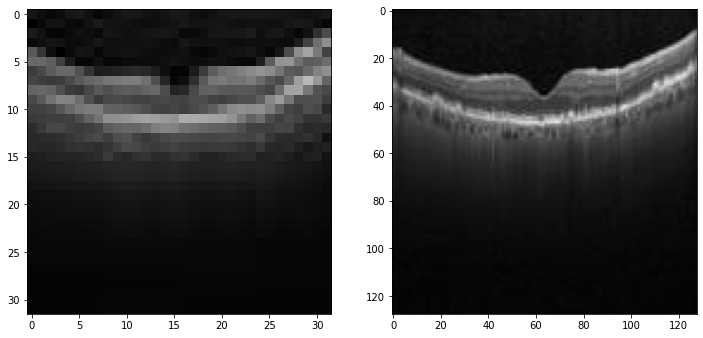

In [ ]:
#Sanity check, view few mages
import random
import numpy as np
image_number = random.randint(0, len(lr_images)-1)
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(np.reshape(lr_images[image_number], (32, 32, 3)))
plt.subplot(122)
plt.imshow(np.reshape(hr_images[image_number], (128, 128, 3)))
plt.show()


In [ ]:
#Scale values
lr_images = lr_images / 255.
hr_images = hr_images / 255.

In [ ]:
#Split to train and test
lr_train, lr_test, hr_train, hr_test = train_test_split(lr_images, hr_images, 
                                                      test_size=0.6, random_state=42)

In [ ]:
hr_shape = (hr_train.shape[1], hr_train.shape[2], hr_train.shape[3])
lr_shape = (lr_train.shape[1], lr_train.shape[2], lr_train.shape[3])

In [ ]:
lr_ip = Input(shape=lr_shape)
hr_ip = Input(shape=hr_shape)

In [ ]:
generator = create_gen(lr_ip, num_res_block = 16)
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 32, 32, 64)   15616       ['input_1[0][0]']                
                                                                                                  
 p_re_lu (PReLU)                (None, 32, 32, 64)   64          ['conv2d[0][0]']                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 32, 32, 64)   36928       ['p_re_lu[0][0]']                
                                                                                              

In [ ]:
discriminator = create_disc(hr_ip)
discriminator.compile(loss="binary_crossentropy", optimizer="adam", metrics=['accuracy'])
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_37 (Conv2D)          (None, 128, 128, 64)      1792      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 64)      0         
                                                                 
 conv2d_38 (Conv2D)          (None, 64, 64, 64)        36928     
                                                                 
 batch_normalization_33 (Bat  (None, 64, 64, 64)       256       
 chNormalization)                                                
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                           

In [ ]:
vgg = build_vgg((128,128,3))
print(vgg.summary())
vgg.trainable = False

80134624/80134624 [==============================] - 4s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 128, 128, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 128, 128, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 64, 64, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 64, 64, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 64, 64, 128)       147584    
                                                            

In [ ]:
gan_model = create_comb(generator, discriminator, vgg, lr_ip, hr_ip)

In [ ]:
gan_model.compile(loss=["binary_crossentropy", "mse"], loss_weights=[1e-3, 1], optimizer="adam")
gan_model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 model (Functional)             (None, 128, 128, 3)  2044291     ['input_1[0][0]']                
                                                                                                  
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 model_1 (Functional)           (None, 1)            38249281    ['model[0][0]']            

In [ ]:
#Create a list of images for LR and HR in batches from which a batch of images
#would be fetched during training. 
batch_size = 1  
train_lr_batches = []
train_hr_batches = []
for it in range(int(hr_train.shape[0] / batch_size)):
    start_idx = it * batch_size
    end_idx = start_idx + batch_size
    train_hr_batches.append(hr_train[start_idx:end_idx])
    train_lr_batches.append(lr_train[start_idx:end_idx])

In [ ]:
epochs = 50

In [ ]:
#Enumerate training over epochs
for e in range(epochs):
    fake_label = np.zeros((batch_size, 1)) # Assign a label of 0 to all fake (generated images)
    real_label = np.ones((batch_size,1)) # Assign a label of 1 to all real images.
    
    #Create empty lists to populate gen and disc losses. 
    g_losses = []
    d_losses = []
    
    #Enumerate training over batches. 
    for b in tqdm(range(len(train_hr_batches))):
        lr_imgs = train_lr_batches[b] #Fetch a batch of LR images for training
        hr_imgs = train_hr_batches[b] #Fetch a batch of HR images for training
        
        fake_imgs = generator.predict_on_batch(lr_imgs) #Fake images
        
        #First, train the discriminator on fake and real HR images. 
        discriminator.trainable = True
        d_loss_gen = discriminator.train_on_batch(fake_imgs, fake_label)
        d_loss_real = discriminator.train_on_batch(hr_imgs, real_label)
        
        #Now, train the generator by fixing discriminator as non-trainable
        discriminator.trainable = False
        
        #Average the discriminator loss, just for reporting purposes. 
        d_loss = 0.5 * np.add(d_loss_gen, d_loss_real) 
        
        #Extract VGG features, to be used towards calculating loss
        image_features = vgg.predict(hr_imgs)
     
        #Train the generator via GAN. 
        #Remember that we have 2 losses, adversarial loss and content (VGG) loss
        g_loss, _, _ = gan_model.train_on_batch([lr_imgs, hr_imgs], [real_label, image_features])
        
        #Save losses to a list so we can average and report. 
        d_losses.append(d_loss)
        g_losses.append(g_loss)
        
    #Convert the list of losses to an array to make it easy to average    
    g_losses = np.array(g_losses)
    d_losses = np.array(d_losses)
    
    #Calculate the average losses for generator and discriminator
    g_loss = np.sum(g_losses, axis=0) / len(g_losses)
    d_loss = np.sum(d_losses, axis=0) / len(d_losses)
    
    #Report the progress during training. 
    print("epoch:", e+1 ,"g_loss:", g_loss, "d_loss:", d_loss)

    if (e+1) % 5 == 0: #Change the frequency for model saving, if needed
        #Save the generator after every n epochs (Usually 10 epochs)
        generator.save("/content/drive/MyDrive/models2/" + "gen_e_"+ str(e+1) +".h5")

  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 304ms/step


  0%|          | 1/3306 [00:41<38:20:45, 41.77s/it]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/3306 [00:41<15:52:08, 17.29s/it]

1/1 [==============================] - 0s 21ms/step


  0%|          | 3/3306 [00:42<8:41:04,  9.47s/it] 

1/1 [==============================] - 0s 21ms/step


  0%|          | 4/3306 [00:42<5:18:28,  5.79s/it]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/3306 [00:42<3:26:31,  3.75s/it]

1/1 [==============================] - 0s 20ms/step


  0%|          | 6/3306 [00:42<2:18:58,  2.53s/it]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/3306 [00:42<1:36:09,  1.75s/it]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/3306 [00:42<1:08:07,  1.24s/it]

1/1 [==============================] - 0s 25ms/step


  0%|          | 9/3306 [00:42<49:38,  1.11it/s]  

1/1 [==============================] - 0s 21ms/step


  0%|          | 10/3306 [00:43<36:50,  1.49it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:43<28:06,  1.95it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 12/3306 [00:43<22:04,  2.49it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 13/3306 [00:43<17:50,  3.07it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 14/3306 [00:43<14:54,  3.68it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 15/3306 [00:43<12:50,  4.27it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 16/3306 [00:44<11:27,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/3306 [00:44<10:30,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/3306 [00:44<09:47,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 19/3306 [00:44<09:14,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 20/3306 [00:44<08:49,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/3306 [00:44<08:36,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:44<08:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:45<08:23,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 24/3306 [00:45<08:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 25/3306 [00:45<08:23,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 26/3306 [00:45<08:23,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:45<08:17,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 28/3306 [00:45<08:16,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 29/3306 [00:45<08:11,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 30/3306 [00:46<08:13,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 31/3306 [00:46<08:23,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 32/3306 [00:46<08:25,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 33/3306 [00:46<08:14,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 34/3306 [00:46<08:15,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 35/3306 [00:46<08:15,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:47<08:17,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 37/3306 [00:47<08:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/3306 [00:47<08:15,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/3306 [00:47<08:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 40/3306 [00:47<08:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:47<08:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 42/3306 [00:47<08:09,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 43/3306 [00:48<08:12,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 44/3306 [00:48<08:10,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 45/3306 [00:48<08:06,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 46/3306 [00:48<08:04,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 47/3306 [00:48<08:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 48/3306 [00:48<08:17,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:49<08:13,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 50/3306 [00:49<08:17,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 51/3306 [00:49<08:16,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 52/3306 [00:49<08:11,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 53/3306 [00:49<08:07,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 54/3306 [00:49<08:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 55/3306 [00:49<08:08,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 56/3306 [00:50<08:15,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 57/3306 [00:50<08:15,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 58/3306 [00:50<08:20,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 59/3306 [00:50<08:21,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 60/3306 [00:50<08:17,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 61/3306 [00:50<08:22,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 62/3306 [00:50<08:20,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 63/3306 [00:51<08:13,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 64/3306 [00:51<08:10,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 65/3306 [00:51<08:08,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 66/3306 [00:51<08:02,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 67/3306 [00:51<08:07,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 68/3306 [00:52<11:37,  4.65it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 69/3306 [00:52<10:34,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 70/3306 [00:52<09:50,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 71/3306 [00:52<09:16,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 72/3306 [00:52<08:51,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 73/3306 [00:52<08:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 74/3306 [00:53<08:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:53<08:19,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 76/3306 [00:53<08:22,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:53<08:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 78/3306 [00:53<08:12,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 79/3306 [00:53<08:09,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 80/3306 [00:53<08:09,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 81/3306 [00:54<08:04,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:54<08:00,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:54<08:05,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 84/3306 [00:54<08:08,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 85/3306 [00:54<08:04,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 86/3306 [00:54<08:03,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 87/3306 [00:54<08:00,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 88/3306 [00:55<07:59,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 89/3306 [00:55<07:57,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 90/3306 [00:55<07:59,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 91/3306 [00:55<07:54,  6.78it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:55<08:00,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 93/3306 [00:55<08:01,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 94/3306 [00:56<08:04,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 95/3306 [00:56<08:03,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 96/3306 [00:56<08:00,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 97/3306 [00:56<07:59,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 98/3306 [00:56<07:58,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 99/3306 [00:56<08:01,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 100/3306 [00:56<08:03,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:57<08:01,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 102/3306 [00:57<07:58,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 103/3306 [00:57<07:57,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:57<07:56,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:57<07:53,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 106/3306 [00:57<07:54,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 107/3306 [00:57<07:54,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 108/3306 [00:58<07:59,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 109/3306 [00:58<08:02,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 110/3306 [00:58<08:00,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 111/3306 [00:58<07:56,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:58<07:54,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:58<07:52,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 114/3306 [00:58<07:56,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 115/3306 [00:59<07:53,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 116/3306 [00:59<07:58,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 117/3306 [00:59<08:00,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 118/3306 [00:59<08:03,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 119/3306 [00:59<08:02,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 120/3306 [00:59<07:57,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 121/3306 [01:00<07:56,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 122/3306 [01:00<07:52,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 123/3306 [01:00<07:53,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 124/3306 [01:00<07:52,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 125/3306 [01:00<07:59,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [01:00<07:58,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 127/3306 [01:00<08:07,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 128/3306 [01:01<08:06,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 129/3306 [01:01<08:03,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 130/3306 [01:01<08:00,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 131/3306 [01:01<07:55,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [01:01<08:00,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 133/3306 [01:01<08:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 134/3306 [01:02<08:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [01:02<08:12,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 136/3306 [01:02<08:13,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 137/3306 [01:02<08:12,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 138/3306 [01:02<08:23,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [01:02<08:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3306 [01:02<08:14,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 141/3306 [01:03<08:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 142/3306 [01:03<08:15,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [01:03<08:12,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 144/3306 [01:03<08:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [01:03<08:04,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 146/3306 [01:03<07:58,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 147/3306 [01:04<07:53,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 148/3306 [01:04<07:50,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 149/3306 [01:04<07:58,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 150/3306 [01:04<07:55,  6.63it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 151/3306 [01:04<07:58,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 152/3306 [01:04<07:56,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 153/3306 [01:04<07:54,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 154/3306 [01:05<07:56,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 155/3306 [01:05<07:52,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 156/3306 [01:05<07:49,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 157/3306 [01:05<07:51,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 158/3306 [01:05<07:49,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 159/3306 [01:05<07:51,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 160/3306 [01:05<07:51,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 161/3306 [01:06<07:51,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 162/3306 [01:06<07:52,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 163/3306 [01:06<07:50,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 164/3306 [01:06<07:47,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 165/3306 [01:06<07:46,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 166/3306 [01:06<07:54,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 167/3306 [01:07<07:54,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 168/3306 [01:07<07:53,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 169/3306 [01:07<07:54,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 170/3306 [01:07<07:55,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 171/3306 [01:07<08:01,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 172/3306 [01:07<07:56,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 173/3306 [01:07<07:49,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 174/3306 [01:08<07:56,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 175/3306 [01:08<07:56,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 176/3306 [01:08<07:54,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 177/3306 [01:08<07:50,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 178/3306 [01:08<07:52,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 179/3306 [01:08<07:51,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 180/3306 [01:09<07:50,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 181/3306 [01:09<07:46,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 182/3306 [01:09<07:46,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 183/3306 [01:09<07:52,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 184/3306 [01:09<07:50,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 185/3306 [01:09<07:55,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 186/3306 [01:09<07:58,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 187/3306 [01:10<07:53,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 188/3306 [01:10<07:49,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 189/3306 [01:10<07:47,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 190/3306 [01:10<07:48,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 191/3306 [01:10<07:51,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 192/3306 [01:10<07:53,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 193/3306 [01:10<07:52,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 194/3306 [01:11<07:51,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [01:11<07:47,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 196/3306 [01:11<07:46,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 197/3306 [01:11<07:44,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 198/3306 [01:11<07:42,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 199/3306 [01:11<07:53,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 200/3306 [01:12<07:53,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 201/3306 [01:12<07:51,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 202/3306 [01:12<07:49,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 203/3306 [01:12<07:47,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 204/3306 [01:12<07:42,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 205/3306 [01:12<07:45,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 206/3306 [01:12<07:47,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 207/3306 [01:13<07:48,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 208/3306 [01:13<07:56,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 209/3306 [01:13<08:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 210/3306 [01:13<08:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 211/3306 [01:13<07:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 212/3306 [01:13<07:54,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [01:14<07:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 214/3306 [01:14<07:50,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 215/3306 [01:14<07:49,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 216/3306 [01:14<07:56,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [01:14<07:54,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 218/3306 [01:14<07:56,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 219/3306 [01:14<08:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 220/3306 [01:15<08:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 221/3306 [01:15<07:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 222/3306 [01:15<07:53,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 223/3306 [01:15<07:50,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 224/3306 [01:15<07:50,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 225/3306 [01:15<07:51,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [01:16<07:46,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [01:16<07:42,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 228/3306 [01:16<07:41,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [01:16<07:41,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 230/3306 [01:16<07:38,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 231/3306 [01:16<07:37,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 232/3306 [01:16<07:49,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 233/3306 [01:17<07:47,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 234/3306 [01:17<07:44,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 235/3306 [01:17<07:44,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [01:17<07:41,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 237/3306 [01:17<07:38,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 238/3306 [01:17<07:38,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 239/3306 [01:17<07:35,  6.73it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 240/3306 [01:18<07:41,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 241/3306 [01:18<07:42,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 242/3306 [01:18<07:40,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 243/3306 [01:18<07:38,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 244/3306 [01:18<07:42,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 245/3306 [01:18<07:42,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 246/3306 [01:19<07:41,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 247/3306 [01:19<07:43,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [01:19<07:42,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 249/3306 [01:19<07:50,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 250/3306 [01:19<07:47,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 251/3306 [01:19<07:45,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 252/3306 [01:19<07:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [01:20<07:50,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 254/3306 [01:20<07:47,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 255/3306 [01:20<07:42,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [01:20<07:40,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 257/3306 [01:20<07:51,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 258/3306 [01:20<07:50,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 259/3306 [01:21<08:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [01:21<08:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [01:21<07:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 262/3306 [01:21<07:48,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 263/3306 [01:21<07:41,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [01:21<07:40,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 265/3306 [01:21<07:48,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 266/3306 [01:22<07:51,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 267/3306 [01:22<07:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 268/3306 [01:22<07:45,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 269/3306 [01:22<07:39,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 270/3306 [01:22<07:37,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 271/3306 [01:22<07:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 272/3306 [01:22<07:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 273/3306 [01:23<07:42,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 274/3306 [01:23<07:43,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 275/3306 [01:23<07:41,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 276/3306 [01:23<07:35,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 277/3306 [01:23<07:32,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 278/3306 [01:23<07:32,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 279/3306 [01:24<07:39,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 280/3306 [01:24<07:36,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 281/3306 [01:24<07:32,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 282/3306 [01:24<07:38,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 283/3306 [01:24<07:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 284/3306 [01:24<07:37,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 285/3306 [01:24<07:34,  6.65it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 286/3306 [01:25<07:45,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 287/3306 [01:25<07:39,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 288/3306 [01:25<07:40,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 289/3306 [01:25<07:34,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 290/3306 [01:25<07:43,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 291/3306 [01:25<07:42,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [01:26<07:39,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [01:26<07:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 294/3306 [01:26<07:38,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 295/3306 [01:26<07:34,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 296/3306 [01:26<07:33,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 297/3306 [01:26<07:34,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 298/3306 [01:26<07:36,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 299/3306 [01:27<07:45,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 300/3306 [01:27<07:43,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 301/3306 [01:27<07:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 302/3306 [01:27<07:38,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 303/3306 [01:27<07:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 304/3306 [01:27<07:40,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 305/3306 [01:28<07:36,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 306/3306 [01:28<07:42,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 307/3306 [01:28<07:40,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 308/3306 [01:28<07:36,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 309/3306 [01:28<07:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 310/3306 [01:28<07:30,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 311/3306 [01:28<07:32,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 312/3306 [01:29<07:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 313/3306 [01:29<07:34,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 314/3306 [01:29<07:31,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 315/3306 [01:29<07:36,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 316/3306 [01:29<07:34,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 317/3306 [01:29<07:32,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 318/3306 [01:29<07:29,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 319/3306 [01:30<07:30,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 320/3306 [01:30<07:35,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 321/3306 [01:30<07:33,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 322/3306 [01:30<07:32,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 323/3306 [01:30<07:39,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 324/3306 [01:30<07:38,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 325/3306 [01:31<07:40,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 326/3306 [01:31<07:40,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 327/3306 [01:31<07:35,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 328/3306 [01:31<07:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 329/3306 [01:31<07:31,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 330/3306 [01:31<07:32,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 331/3306 [01:31<07:40,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 332/3306 [01:32<07:40,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 333/3306 [01:32<07:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 334/3306 [01:32<07:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 335/3306 [01:32<07:29,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 336/3306 [01:32<07:27,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 337/3306 [01:32<07:26,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 338/3306 [01:33<07:26,  6.64it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 339/3306 [01:33<07:42,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 340/3306 [01:33<07:41,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [01:33<07:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 342/3306 [01:33<07:31,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 343/3306 [01:33<07:30,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 344/3306 [01:33<07:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 345/3306 [01:34<07:27,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 346/3306 [01:34<07:24,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 347/3306 [01:34<07:25,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 348/3306 [01:34<07:27,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [01:34<07:25,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 350/3306 [01:34<07:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 351/3306 [01:35<07:29,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 352/3306 [01:35<07:28,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 353/3306 [01:35<07:27,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 354/3306 [01:35<07:26,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 355/3306 [01:35<07:25,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 356/3306 [01:35<07:29,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 357/3306 [01:35<07:30,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 358/3306 [01:36<07:27,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 359/3306 [01:36<07:27,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 360/3306 [01:36<07:25,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 361/3306 [01:36<07:23,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 362/3306 [01:36<07:19,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 363/3306 [01:36<07:19,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 364/3306 [01:36<07:27,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [01:37<07:26,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 366/3306 [01:37<07:24,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 367/3306 [01:37<07:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 368/3306 [01:37<07:26,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 369/3306 [01:37<07:23,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [01:37<07:24,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 371/3306 [01:38<07:29,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 372/3306 [01:38<07:32,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 373/3306 [01:38<07:44,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 374/3306 [01:38<07:39,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 375/3306 [01:38<07:31,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 376/3306 [01:38<07:29,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 377/3306 [01:38<07:25,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 378/3306 [01:39<07:23,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 379/3306 [01:39<07:19,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 380/3306 [01:39<07:26,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 381/3306 [01:39<07:29,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 382/3306 [01:39<07:27,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 383/3306 [01:39<07:28,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 384/3306 [01:40<07:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:40<07:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 386/3306 [01:40<07:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 387/3306 [01:40<07:19,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 388/3306 [01:40<07:17,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 389/3306 [01:40<07:25,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 390/3306 [01:40<07:30,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 391/3306 [01:41<07:32,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 392/3306 [01:41<07:37,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 393/3306 [01:41<07:35,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 394/3306 [01:41<07:30,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 395/3306 [01:41<07:29,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 396/3306 [01:41<07:24,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 397/3306 [01:42<07:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 398/3306 [01:42<07:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 399/3306 [01:42<07:27,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 400/3306 [01:42<07:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 401/3306 [01:42<07:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 402/3306 [01:42<07:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 403/3306 [01:42<07:27,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 404/3306 [01:43<07:25,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 405/3306 [01:43<07:26,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 406/3306 [01:43<07:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 407/3306 [01:43<07:24,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 408/3306 [01:43<07:18,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 409/3306 [01:43<07:14,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 410/3306 [01:44<07:17,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 411/3306 [01:44<07:13,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 412/3306 [01:44<07:12,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 413/3306 [01:44<07:12,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 414/3306 [01:44<07:18,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 415/3306 [01:44<07:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:44<07:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 417/3306 [01:45<07:13,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 418/3306 [01:45<07:11,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 419/3306 [01:45<07:13,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 420/3306 [01:45<07:14,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 421/3306 [01:45<07:14,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 422/3306 [01:45<07:18,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 423/3306 [01:45<07:17,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 424/3306 [01:46<07:14,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 425/3306 [01:46<07:14,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 426/3306 [01:46<07:17,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 427/3306 [01:46<07:16,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 428/3306 [01:46<07:13,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 429/3306 [01:46<07:12,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 430/3306 [01:47<07:17,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:47<07:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 432/3306 [01:47<07:16,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 433/3306 [01:47<07:14,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 434/3306 [01:47<07:13,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 435/3306 [01:47<07:11,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 436/3306 [01:47<07:07,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 437/3306 [01:48<07:05,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 438/3306 [01:48<07:11,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 439/3306 [01:48<07:09,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 440/3306 [01:48<07:11,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 441/3306 [01:48<07:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 442/3306 [01:48<07:06,  6.72it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 443/3306 [01:49<07:07,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 444/3306 [01:49<07:07,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 445/3306 [01:49<07:07,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 446/3306 [01:49<07:06,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 447/3306 [01:49<07:08,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 448/3306 [01:49<07:10,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:49<07:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 450/3306 [01:50<07:07,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 451/3306 [01:50<07:07,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 452/3306 [01:50<07:09,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 453/3306 [01:50<07:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 454/3306 [01:50<07:05,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 455/3306 [01:50<07:13,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 456/3306 [01:50<07:18,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 457/3306 [01:51<07:20,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 458/3306 [01:51<07:24,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 459/3306 [01:51<07:18,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 460/3306 [01:51<07:13,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 461/3306 [01:51<07:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 462/3306 [01:51<07:15,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 463/3306 [01:52<07:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 464/3306 [01:52<07:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 465/3306 [01:52<07:15,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 466/3306 [01:52<07:13,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 467/3306 [01:52<07:12,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 468/3306 [01:52<07:10,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:52<07:08,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 470/3306 [01:53<07:07,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 471/3306 [01:53<07:16,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 472/3306 [01:53<07:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 473/3306 [01:53<07:13,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:53<07:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 475/3306 [01:53<07:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 476/3306 [01:54<07:06,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 477/3306 [01:54<07:08,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 478/3306 [01:54<07:05,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 479/3306 [01:54<07:01,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 480/3306 [01:54<07:04,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:54<07:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 482/3306 [01:54<07:08,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 483/3306 [01:55<07:07,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 484/3306 [01:55<07:06,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 485/3306 [01:55<07:03,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 486/3306 [01:55<07:01,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 487/3306 [01:55<06:59,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 488/3306 [01:55<07:17,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 489/3306 [01:55<07:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 490/3306 [01:56<07:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 491/3306 [01:56<07:05,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 492/3306 [01:56<07:02,  6.67it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 493/3306 [01:56<07:04,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 494/3306 [01:56<07:03,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 495/3306 [01:56<07:03,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 496/3306 [01:57<07:07,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 497/3306 [01:57<07:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 498/3306 [01:57<07:11,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 499/3306 [01:57<07:07,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 500/3306 [01:57<07:04,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 501/3306 [01:57<07:02,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 502/3306 [01:57<07:02,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 503/3306 [01:58<07:03,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 504/3306 [01:58<07:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 505/3306 [01:58<07:03,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 506/3306 [01:58<07:03,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 507/3306 [01:58<06:59,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 508/3306 [01:58<06:56,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 509/3306 [01:59<06:56,  6.71it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 510/3306 [01:59<06:56,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 511/3306 [01:59<06:53,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 512/3306 [01:59<06:53,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 513/3306 [01:59<06:57,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:59<06:56,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 515/3306 [01:59<07:05,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 516/3306 [02:00<07:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 517/3306 [02:00<07:00,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 518/3306 [02:00<06:58,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 519/3306 [02:00<06:58,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 520/3306 [02:00<06:55,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 521/3306 [02:00<07:00,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 522/3306 [02:00<07:00,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 523/3306 [02:01<07:01,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 524/3306 [02:01<06:59,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 525/3306 [02:01<06:57,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [02:01<06:57,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 527/3306 [02:01<06:55,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 528/3306 [02:01<06:54,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 529/3306 [02:02<06:59,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 530/3306 [02:02<06:59,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 531/3306 [02:02<07:00,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 532/3306 [02:02<06:57,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 533/3306 [02:02<06:54,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 534/3306 [02:02<06:58,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 535/3306 [02:02<06:58,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 536/3306 [02:03<06:55,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 537/3306 [02:03<06:59,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 538/3306 [02:03<07:01,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 539/3306 [02:03<07:04,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 540/3306 [02:03<06:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 541/3306 [02:03<06:58,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 542/3306 [02:03<07:01,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 543/3306 [02:04<07:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [02:04<07:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 545/3306 [02:04<07:02,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [02:04<07:05,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 547/3306 [02:04<07:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 548/3306 [02:04<07:15,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 549/3306 [02:05<07:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 550/3306 [02:05<07:03,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 551/3306 [02:05<07:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 552/3306 [02:05<06:58,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 553/3306 [02:05<06:56,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 554/3306 [02:05<06:59,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 555/3306 [02:05<06:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [02:06<06:57,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 557/3306 [02:06<07:01,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 558/3306 [02:06<07:06,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 559/3306 [02:06<07:05,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 560/3306 [02:06<07:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 561/3306 [02:06<07:10,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [02:07<07:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 563/3306 [02:07<07:07,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 564/3306 [02:07<07:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 565/3306 [02:07<07:09,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 566/3306 [02:07<07:02,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 567/3306 [02:07<06:58,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 568/3306 [02:08<06:55,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 569/3306 [02:08<07:02,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 570/3306 [02:08<07:05,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 571/3306 [02:08<07:02,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [02:08<06:59,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 573/3306 [02:08<06:59,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [02:08<06:55,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 575/3306 [02:09<06:57,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 576/3306 [02:09<06:53,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 577/3306 [02:09<06:53,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 578/3306 [02:09<06:54,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 579/3306 [02:09<06:55,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [02:09<06:55,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 581/3306 [02:10<07:01,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 582/3306 [02:10<07:01,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 583/3306 [02:10<07:01,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 584/3306 [02:10<06:56,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [02:10<06:56,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 586/3306 [02:10<06:55,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 587/3306 [02:10<06:58,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 588/3306 [02:11<06:54,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 589/3306 [02:11<06:51,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 590/3306 [02:11<06:50,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 591/3306 [02:11<06:48,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 592/3306 [02:11<06:46,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 593/3306 [02:11<06:46,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 594/3306 [02:11<06:47,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [02:12<06:56,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 596/3306 [02:12<07:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [02:12<06:59,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 598/3306 [02:12<06:57,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 599/3306 [02:12<06:54,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 600/3306 [02:12<06:54,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [02:13<06:52,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 602/3306 [02:13<06:58,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 603/3306 [02:13<07:01,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 604/3306 [02:13<06:55,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 605/3306 [02:13<06:52,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 606/3306 [02:13<06:49,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 607/3306 [02:13<06:48,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [02:14<06:48,  6.61it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 609/3306 [02:14<06:48,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 610/3306 [02:14<06:46,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 611/3306 [02:14<06:49,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 612/3306 [02:14<06:47,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 613/3306 [02:14<06:52,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 614/3306 [02:15<06:50,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 615/3306 [02:15<06:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 616/3306 [02:15<06:52,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 617/3306 [02:15<06:49,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 618/3306 [02:15<06:47,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 619/3306 [02:15<06:54,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 620/3306 [02:15<06:53,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 621/3306 [02:16<06:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [02:16<06:52,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 623/3306 [02:16<06:49,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 624/3306 [02:16<06:48,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 625/3306 [02:16<06:45,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 626/3306 [02:16<06:46,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 627/3306 [02:17<06:52,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 628/3306 [02:17<06:58,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 629/3306 [02:17<07:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [02:17<07:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [02:17<06:55,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 632/3306 [02:17<06:52,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 633/3306 [02:17<06:49,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 634/3306 [02:18<06:48,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [02:18<06:49,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 636/3306 [02:18<06:54,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 637/3306 [02:18<06:51,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [02:18<06:48,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 639/3306 [02:18<06:46,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 640/3306 [02:19<06:46,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 641/3306 [02:19<06:44,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 642/3306 [02:19<06:44,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 643/3306 [02:19<06:40,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 644/3306 [02:19<06:58,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 645/3306 [02:19<06:55,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 646/3306 [02:19<06:50,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 647/3306 [02:20<06:49,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 648/3306 [02:20<06:44,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 649/3306 [02:20<06:40,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 650/3306 [02:20<06:38,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 651/3306 [02:20<06:39,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 652/3306 [02:20<06:46,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 653/3306 [02:21<06:46,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 654/3306 [02:21<06:49,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 655/3306 [02:21<06:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [02:21<06:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 657/3306 [02:21<06:44,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 658/3306 [02:21<06:40,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 659/3306 [02:21<06:42,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [02:22<06:40,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 661/3306 [02:22<06:45,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [02:22<06:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 663/3306 [02:22<06:45,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 664/3306 [02:22<06:43,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 665/3306 [02:22<06:41,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 666/3306 [02:23<06:40,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 667/3306 [02:23<06:40,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [02:23<06:37,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 669/3306 [02:23<06:42,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 670/3306 [02:23<06:39,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 671/3306 [02:23<06:39,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 672/3306 [02:23<06:39,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 673/3306 [02:24<06:40,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 674/3306 [02:24<06:38,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 675/3306 [02:24<06:37,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 676/3306 [02:24<06:35,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 677/3306 [02:24<06:37,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 678/3306 [02:24<06:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 679/3306 [02:24<06:40,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 680/3306 [02:25<06:39,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 681/3306 [02:25<06:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 682/3306 [02:25<06:34,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 683/3306 [02:25<06:32,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [02:25<06:31,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 685/3306 [02:25<06:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 686/3306 [02:26<06:42,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 687/3306 [02:26<06:44,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 688/3306 [02:26<06:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 689/3306 [02:26<06:43,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 690/3306 [02:26<06:39,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 691/3306 [02:26<06:35,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [02:26<06:35,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 693/3306 [02:27<06:38,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 694/3306 [02:27<06:41,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 695/3306 [02:27<06:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [02:27<06:44,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [02:27<06:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 698/3306 [02:27<06:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 699/3306 [02:28<06:38,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 700/3306 [02:28<06:37,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 701/3306 [02:28<06:40,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 702/3306 [02:28<06:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 703/3306 [02:28<06:40,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 704/3306 [02:28<06:38,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 705/3306 [02:28<06:44,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 706/3306 [02:29<06:41,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 707/3306 [02:29<06:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 708/3306 [02:29<06:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 709/3306 [02:29<06:51,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 710/3306 [02:29<06:56,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 711/3306 [02:29<06:49,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 712/3306 [02:30<06:42,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 713/3306 [02:30<06:36,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 714/3306 [02:30<06:33,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 715/3306 [02:30<06:28,  6.67it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 716/3306 [02:30<06:35,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [02:30<06:32,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 718/3306 [02:30<06:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [02:31<06:39,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 720/3306 [02:31<06:36,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 721/3306 [02:31<06:33,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 722/3306 [02:31<06:30,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 723/3306 [02:31<06:31,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 724/3306 [02:31<06:33,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 725/3306 [02:32<06:35,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [02:32<06:36,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 727/3306 [02:32<06:32,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 728/3306 [02:32<06:28,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 729/3306 [02:32<06:25,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 730/3306 [02:32<06:26,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [02:32<06:26,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 732/3306 [02:33<06:28,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 733/3306 [02:33<06:30,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 734/3306 [02:33<06:29,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 735/3306 [02:33<06:32,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 736/3306 [02:33<06:31,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 737/3306 [02:33<06:31,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 738/3306 [02:34<06:32,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 739/3306 [02:34<06:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 740/3306 [02:34<06:27,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 741/3306 [02:34<06:23,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 742/3306 [02:34<06:23,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 743/3306 [02:34<06:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 744/3306 [02:34<06:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 745/3306 [02:35<06:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 746/3306 [02:35<06:37,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 747/3306 [02:35<06:32,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 748/3306 [02:35<06:28,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 749/3306 [02:35<06:27,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 750/3306 [02:35<06:28,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 751/3306 [02:35<06:31,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 752/3306 [02:36<06:29,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 753/3306 [02:36<06:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 754/3306 [02:36<06:24,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 755/3306 [02:36<06:22,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 756/3306 [02:36<06:22,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 757/3306 [02:36<06:20,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 758/3306 [02:37<06:29,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 759/3306 [02:37<06:36,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 760/3306 [02:37<06:35,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 761/3306 [02:37<06:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [02:37<06:34,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 763/3306 [02:37<06:32,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [02:37<06:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [02:38<06:27,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 766/3306 [02:38<06:23,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 767/3306 [02:38<06:23,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 768/3306 [02:38<06:25,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 769/3306 [02:38<06:23,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 770/3306 [02:38<06:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 771/3306 [02:39<06:24,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 772/3306 [02:39<06:25,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:39<06:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 774/3306 [02:39<06:23,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 775/3306 [02:39<06:18,  6.69it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 776/3306 [02:39<06:27,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 777/3306 [02:39<06:34,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 778/3306 [02:40<06:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 779/3306 [02:40<06:27,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 780/3306 [02:40<06:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 781/3306 [02:40<06:25,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 782/3306 [02:40<06:23,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 783/3306 [02:40<06:26,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 784/3306 [02:41<06:30,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 785/3306 [02:41<06:36,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 786/3306 [02:41<06:31,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 787/3306 [02:41<06:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 788/3306 [02:41<06:24,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 789/3306 [02:41<06:22,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 790/3306 [02:41<06:23,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 791/3306 [02:42<06:23,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 792/3306 [02:42<06:26,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 793/3306 [02:42<06:25,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 794/3306 [02:42<06:21,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 795/3306 [02:42<06:19,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 796/3306 [02:42<06:16,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 797/3306 [02:43<06:18,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 798/3306 [02:43<06:19,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 799/3306 [02:43<06:21,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 800/3306 [02:43<06:19,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 801/3306 [02:43<06:22,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 802/3306 [02:43<06:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 803/3306 [02:43<06:24,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 804/3306 [02:44<06:20,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 805/3306 [02:44<06:17,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 806/3306 [02:44<06:15,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 807/3306 [02:44<06:11,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 808/3306 [02:44<06:10,  6.75it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 809/3306 [02:44<06:18,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 810/3306 [02:44<06:16,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 811/3306 [02:45<06:17,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 812/3306 [02:45<06:16,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 813/3306 [02:45<06:18,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 814/3306 [02:45<06:18,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 815/3306 [02:45<06:15,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 816/3306 [02:45<06:14,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 817/3306 [02:46<06:20,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 818/3306 [02:46<06:20,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:46<06:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 820/3306 [02:46<06:18,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 821/3306 [02:46<06:15,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 822/3306 [02:46<06:11,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 823/3306 [02:46<06:11,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 824/3306 [02:47<06:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 825/3306 [02:47<06:21,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 826/3306 [02:47<06:24,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 827/3306 [02:47<06:24,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 828/3306 [02:47<06:20,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 829/3306 [02:47<06:28,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 830/3306 [02:48<06:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 831/3306 [02:48<06:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 832/3306 [02:48<06:21,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 833/3306 [02:48<06:20,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 834/3306 [02:48<06:17,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 835/3306 [02:48<06:18,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 836/3306 [02:48<06:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 837/3306 [02:49<06:16,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 838/3306 [02:49<06:15,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 839/3306 [02:49<06:14,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 840/3306 [02:49<06:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 841/3306 [02:49<06:13,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 842/3306 [02:49<06:19,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 843/3306 [02:50<06:16,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 844/3306 [02:50<06:14,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 845/3306 [02:50<06:16,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 846/3306 [02:50<06:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 847/3306 [02:50<06:06,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 848/3306 [02:50<06:04,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 849/3306 [02:50<06:06,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 850/3306 [02:51<06:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 851/3306 [02:51<06:11,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 852/3306 [02:51<06:11,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 853/3306 [02:51<06:11,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 854/3306 [02:51<06:09,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 855/3306 [02:51<06:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 856/3306 [02:51<06:07,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 857/3306 [02:52<06:17,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 858/3306 [02:52<06:28,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 859/3306 [02:52<06:23,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 860/3306 [02:52<06:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 861/3306 [02:52<06:15,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 862/3306 [02:52<06:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 863/3306 [02:53<06:18,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 864/3306 [02:53<06:21,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 865/3306 [02:53<06:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 866/3306 [02:53<06:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 867/3306 [02:53<06:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 868/3306 [02:53<06:19,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 869/3306 [02:54<06:15,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 870/3306 [02:54<06:13,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 871/3306 [02:54<06:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 872/3306 [02:54<06:12,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 873/3306 [02:54<06:07,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 874/3306 [02:54<06:07,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:54<06:11,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 876/3306 [02:55<06:08,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 877/3306 [02:55<06:05,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 878/3306 [02:55<06:08,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 879/3306 [02:55<06:07,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 880/3306 [02:55<06:07,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 881/3306 [02:55<06:08,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 882/3306 [02:55<06:09,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 883/3306 [02:56<06:14,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 884/3306 [02:56<06:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 885/3306 [02:56<06:09,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 886/3306 [02:56<06:08,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 887/3306 [02:56<06:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:56<06:06,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 889/3306 [02:57<06:09,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:57<06:04,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 891/3306 [02:57<06:13,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 892/3306 [02:57<06:11,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:57<06:07,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 894/3306 [02:57<06:07,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 895/3306 [02:57<06:07,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 896/3306 [02:58<06:08,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 897/3306 [02:58<06:07,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 898/3306 [02:58<06:09,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 899/3306 [02:58<06:09,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 900/3306 [02:58<06:08,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 901/3306 [02:58<06:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:59<06:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 903/3306 [02:59<06:07,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 904/3306 [02:59<06:06,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 905/3306 [02:59<06:04,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 906/3306 [02:59<06:01,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 907/3306 [02:59<06:05,  6.57it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 908/3306 [02:59<06:09,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [03:00<06:07,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 910/3306 [03:00<06:06,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [03:00<06:07,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 912/3306 [03:00<06:08,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 913/3306 [03:00<06:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [03:00<06:03,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 915/3306 [03:01<06:02,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 916/3306 [03:01<06:04,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 917/3306 [03:01<06:05,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 918/3306 [03:01<06:04,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [03:01<06:02,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 920/3306 [03:01<06:04,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 921/3306 [03:01<06:02,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 922/3306 [03:02<06:06,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 923/3306 [03:02<06:05,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 924/3306 [03:02<06:09,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 925/3306 [03:02<06:07,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [03:02<06:06,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 927/3306 [03:02<06:02,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 928/3306 [03:03<05:58,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 929/3306 [03:03<05:55,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 930/3306 [03:03<06:00,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3306 [03:03<05:58,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 932/3306 [03:03<06:05,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 933/3306 [03:03<06:04,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 934/3306 [03:03<06:03,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 935/3306 [03:04<05:58,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 936/3306 [03:04<05:57,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 937/3306 [03:04<05:53,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 938/3306 [03:04<06:03,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 939/3306 [03:04<06:01,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 940/3306 [03:04<06:05,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 941/3306 [03:04<06:03,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 942/3306 [03:05<06:05,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 943/3306 [03:05<06:05,  6.47it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 944/3306 [03:05<06:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [03:05<06:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 946/3306 [03:05<06:01,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 947/3306 [03:05<06:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [03:06<06:00,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 949/3306 [03:06<06:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 950/3306 [03:06<06:00,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 951/3306 [03:06<06:05,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 952/3306 [03:06<06:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 953/3306 [03:06<06:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 954/3306 [03:07<06:00,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 955/3306 [03:07<05:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 956/3306 [03:07<05:56,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 957/3306 [03:07<06:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 958/3306 [03:07<06:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 959/3306 [03:07<05:59,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [03:07<05:56,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 961/3306 [03:08<05:56,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 962/3306 [03:08<05:57,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 963/3306 [03:08<05:55,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [03:08<05:56,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 965/3306 [03:08<06:01,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 966/3306 [03:08<06:00,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 967/3306 [03:08<06:00,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 968/3306 [03:09<05:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [03:09<05:55,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 970/3306 [03:09<05:52,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 971/3306 [03:09<05:58,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 972/3306 [03:09<05:55,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 973/3306 [03:09<05:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 974/3306 [03:10<05:56,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 975/3306 [03:10<05:58,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 976/3306 [03:10<05:58,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 977/3306 [03:10<05:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [03:10<05:55,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 979/3306 [03:10<05:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 980/3306 [03:10<05:56,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 981/3306 [03:11<05:58,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 982/3306 [03:11<05:57,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 983/3306 [03:11<05:58,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 984/3306 [03:11<05:54,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 985/3306 [03:11<05:54,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [03:11<05:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 987/3306 [03:12<05:52,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 988/3306 [03:12<05:52,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 989/3306 [03:12<05:52,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 990/3306 [03:12<05:57,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 991/3306 [03:12<05:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 992/3306 [03:12<05:54,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 993/3306 [03:12<05:51,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [03:13<05:49,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 995/3306 [03:13<05:48,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 996/3306 [03:13<05:47,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 997/3306 [03:13<05:44,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 998/3306 [03:13<05:53,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 999/3306 [03:13<05:55,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1000/3306 [03:14<05:55,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1001/3306 [03:14<05:52,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1002/3306 [03:14<05:51,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1003/3306 [03:14<05:48,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1004/3306 [03:14<05:44,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1005/3306 [03:14<05:45,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1006/3306 [03:14<05:47,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1007/3306 [03:15<05:51,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1008/3306 [03:15<05:53,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1009/3306 [03:15<05:51,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1010/3306 [03:15<05:48,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1011/3306 [03:15<05:46,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1012/3306 [03:15<05:45,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1013/3306 [03:16<05:45,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1014/3306 [03:16<05:53,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1015/3306 [03:16<05:52,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1016/3306 [03:16<05:49,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1017/3306 [03:16<05:45,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [03:16<05:46,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1019/3306 [03:16<05:47,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1020/3306 [03:17<05:46,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1021/3306 [03:17<05:45,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [03:17<05:44,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1023/3306 [03:17<05:51,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1024/3306 [03:17<05:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1025/3306 [03:17<06:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [03:18<05:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1027/3306 [03:18<05:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1028/3306 [03:18<05:50,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [03:18<05:48,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1030/3306 [03:18<05:44,  6.61it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1031/3306 [03:18<05:57,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1032/3306 [03:18<05:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [03:19<05:53,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1034/3306 [03:19<05:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1035/3306 [03:19<05:49,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1036/3306 [03:19<05:44,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1037/3306 [03:19<05:41,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1038/3306 [03:19<05:42,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1039/3306 [03:19<05:44,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1040/3306 [03:20<05:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1041/3306 [03:20<05:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1042/3306 [03:20<05:47,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1043/3306 [03:20<05:48,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1044/3306 [03:20<05:46,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1045/3306 [03:20<05:43,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1046/3306 [03:21<05:40,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1047/3306 [03:21<05:37,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1048/3306 [03:21<05:42,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1049/3306 [03:21<05:39,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [03:21<05:37,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1051/3306 [03:21<05:46,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1052/3306 [03:21<05:47,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1053/3306 [03:22<05:47,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1054/3306 [03:22<05:45,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1055/3306 [03:22<05:43,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1056/3306 [03:22<05:44,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1057/3306 [03:22<05:44,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1058/3306 [03:22<05:53,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1059/3306 [03:23<05:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1060/3306 [03:23<05:43,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1061/3306 [03:23<05:43,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1062/3306 [03:23<05:42,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1063/3306 [03:23<05:38,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1064/3306 [03:23<05:43,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1065/3306 [03:23<05:51,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1066/3306 [03:24<05:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1067/3306 [03:24<05:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1068/3306 [03:24<05:45,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1069/3306 [03:24<05:45,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1070/3306 [03:24<05:43,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1071/3306 [03:24<05:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [03:25<05:39,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1073/3306 [03:25<05:44,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1074/3306 [03:25<05:43,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1075/3306 [03:25<05:43,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1076/3306 [03:25<05:41,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1077/3306 [03:25<05:38,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1078/3306 [03:25<05:37,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1079/3306 [03:26<05:35,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1080/3306 [03:26<05:34,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1081/3306 [03:26<05:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1082/3306 [03:26<05:37,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1083/3306 [03:26<05:37,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1084/3306 [03:26<05:35,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1085/3306 [03:27<05:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1086/3306 [03:27<05:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1087/3306 [03:27<05:39,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1088/3306 [03:27<05:36,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1089/3306 [03:27<05:37,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1090/3306 [03:27<05:36,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1091/3306 [03:27<05:38,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1092/3306 [03:28<05:38,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1093/3306 [03:28<05:38,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1094/3306 [03:28<05:34,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1095/3306 [03:28<05:31,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1096/3306 [03:28<05:28,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1097/3306 [03:28<05:35,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1098/3306 [03:29<05:36,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1099/3306 [03:29<05:36,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1100/3306 [03:29<05:38,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1101/3306 [03:29<05:37,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1102/3306 [03:29<05:35,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1103/3306 [03:29<05:32,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1104/3306 [03:29<05:30,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1105/3306 [03:30<05:33,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1106/3306 [03:30<05:36,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [03:30<05:39,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1108/3306 [03:30<05:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [03:30<05:37,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1110/3306 [03:30<05:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [03:31<05:44,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1112/3306 [03:31<05:42,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1113/3306 [03:31<05:39,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1114/3306 [03:31<05:44,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1115/3306 [03:31<05:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1116/3306 [03:31<05:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [03:31<05:40,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1118/3306 [03:32<05:44,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1119/3306 [03:32<05:38,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1120/3306 [03:32<05:34,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1121/3306 [03:32<05:33,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1122/3306 [03:32<05:36,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1123/3306 [03:32<05:35,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1124/3306 [03:33<05:33,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1125/3306 [03:33<05:34,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:33<05:31,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1127/3306 [03:33<05:27,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:33<05:25,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1129/3306 [03:33<05:27,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:33<05:33,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1131/3306 [03:34<05:37,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1132/3306 [03:34<05:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3306 [03:34<05:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1134/3306 [03:34<05:30,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1135/3306 [03:34<05:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1136/3306 [03:34<05:30,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1137/3306 [03:35<05:30,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1138/3306 [03:35<05:37,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1139/3306 [03:35<05:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [03:35<05:33,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1141/3306 [03:35<05:33,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1142/3306 [03:35<05:32,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:35<05:31,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1144/3306 [03:36<05:29,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1145/3306 [03:36<05:32,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1146/3306 [03:36<05:29,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1147/3306 [03:36<05:33,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1148/3306 [03:36<05:33,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [03:36<05:32,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:37<05:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1151/3306 [03:37<05:31,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1152/3306 [03:37<05:29,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1153/3306 [03:37<05:29,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:37<05:26,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1155/3306 [03:37<05:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1156/3306 [03:37<05:27,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1157/3306 [03:38<05:33,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1158/3306 [03:38<05:30,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1159/3306 [03:38<05:26,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1160/3306 [03:38<05:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1161/3306 [03:38<05:21,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:38<05:22,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1163/3306 [03:38<05:24,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1164/3306 [03:39<05:29,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1165/3306 [03:39<05:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1166/3306 [03:39<05:34,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1167/3306 [03:39<05:31,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1168/3306 [03:39<05:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1169/3306 [03:39<05:26,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1170/3306 [03:40<05:21,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1171/3306 [03:40<05:27,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1172/3306 [03:40<05:30,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1173/3306 [03:40<05:28,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1174/3306 [03:40<05:24,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1175/3306 [03:40<05:23,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1176/3306 [03:40<05:22,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1177/3306 [03:41<05:20,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1178/3306 [03:41<05:23,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:41<05:21,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1180/3306 [03:41<05:23,  6.58it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1181/3306 [03:41<05:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1182/3306 [03:41<05:34,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1183/3306 [03:42<05:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1184/3306 [03:42<05:32,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1185/3306 [03:42<05:30,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1186/3306 [03:42<05:28,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1187/3306 [03:42<05:26,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1188/3306 [03:42<05:30,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1189/3306 [03:43<05:30,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1190/3306 [03:43<05:31,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1191/3306 [03:43<05:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1192/3306 [03:43<05:26,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1193/3306 [03:43<05:22,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1194/3306 [03:43<05:24,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1195/3306 [03:43<05:25,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:44<05:25,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1197/3306 [03:44<05:27,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1198/3306 [03:44<05:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1199/3306 [03:44<05:30,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1200/3306 [03:44<05:23,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:44<05:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1202/3306 [03:45<05:18,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1203/3306 [03:45<05:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1204/3306 [03:45<05:17,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1205/3306 [03:45<05:22,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1206/3306 [03:45<05:20,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1207/3306 [03:45<05:19,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1208/3306 [03:45<05:19,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1209/3306 [03:46<05:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1210/3306 [03:46<05:17,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1211/3306 [03:46<05:16,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:46<05:12,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1213/3306 [03:46<05:16,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1214/3306 [03:46<05:17,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:46<05:13,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:47<05:13,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1217/3306 [03:47<05:12,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1218/3306 [03:47<05:16,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1219/3306 [03:47<05:15,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1220/3306 [03:47<05:16,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1221/3306 [03:47<05:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1222/3306 [03:48<05:16,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1223/3306 [03:48<05:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1224/3306 [03:48<05:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1225/3306 [03:48<05:17,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:48<05:15,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1227/3306 [03:48<05:12,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1228/3306 [03:48<05:12,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1229/3306 [03:49<05:12,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1230/3306 [03:49<05:22,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1231/3306 [03:49<05:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1232/3306 [03:49<05:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:49<05:18,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1234/3306 [03:49<05:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1235/3306 [03:50<05:14,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1236/3306 [03:50<05:12,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1237/3306 [03:50<05:11,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1238/3306 [03:50<05:23,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1239/3306 [03:50<08:54,  3.86it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1240/3306 [03:51<07:58,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1241/3306 [03:51<07:15,  4.74it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1242/3306 [03:51<06:49,  5.04it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1243/3306 [03:51<06:26,  5.34it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1244/3306 [03:51<06:12,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1245/3306 [03:51<06:03,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1246/3306 [03:52<05:56,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1247/3306 [03:52<05:55,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1248/3306 [03:52<05:50,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1249/3306 [03:52<05:50,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1250/3306 [03:52<05:46,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1251/3306 [03:52<05:48,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1252/3306 [03:53<05:46,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1253/3306 [03:53<05:47,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1254/3306 [03:53<05:45,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1255/3306 [03:53<05:53,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1256/3306 [03:53<05:50,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1257/3306 [03:54<05:46,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1258/3306 [03:54<05:47,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1259/3306 [03:54<05:44,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1260/3306 [03:54<05:43,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1261/3306 [03:54<05:43,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1262/3306 [03:54<05:41,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1263/3306 [03:55<05:47,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1264/3306 [03:55<05:45,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1265/3306 [03:55<05:44,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1266/3306 [03:55<05:43,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1267/3306 [03:55<05:41,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1268/3306 [03:55<05:37,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1269/3306 [03:56<05:43,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1270/3306 [03:56<05:44,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1271/3306 [03:56<05:48,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1272/3306 [03:56<05:47,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▊      | 1273/3306 [03:56<05:57,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1274/3306 [03:56<05:49,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1275/3306 [03:57<05:43,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1276/3306 [03:57<05:38,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1277/3306 [03:57<05:36,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1278/3306 [03:57<05:35,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1279/3306 [03:57<05:47,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1280/3306 [03:57<05:41,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1281/3306 [03:58<05:39,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1282/3306 [03:58<05:39,  5.96it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 1283/3306 [03:58<05:40,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1284/3306 [03:58<05:41,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1285/3306 [03:58<05:43,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1286/3306 [03:58<05:39,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1287/3306 [03:59<05:41,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1288/3306 [03:59<05:39,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1289/3306 [03:59<05:38,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1290/3306 [03:59<05:34,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1291/3306 [03:59<05:30,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1292/3306 [03:59<05:30,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1293/3306 [04:00<05:31,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1294/3306 [04:00<05:31,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1295/3306 [04:00<05:31,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1296/3306 [04:00<05:30,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1297/3306 [04:00<05:28,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1298/3306 [04:00<05:28,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1299/3306 [04:01<05:29,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1300/3306 [04:01<05:28,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1301/3306 [04:01<05:25,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1302/3306 [04:01<05:23,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1303/3306 [04:01<05:26,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1304/3306 [04:01<05:33,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1305/3306 [04:02<05:29,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1306/3306 [04:02<05:23,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1307/3306 [04:02<05:20,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1308/3306 [04:02<05:19,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1309/3306 [04:02<05:20,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1310/3306 [04:02<05:21,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1311/3306 [04:02<05:28,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1312/3306 [04:03<05:24,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1313/3306 [04:03<05:21,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1314/3306 [04:03<05:22,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1315/3306 [04:03<05:17,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1316/3306 [04:03<05:15,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1317/3306 [04:03<05:19,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1318/3306 [04:04<05:17,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1319/3306 [04:04<05:27,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1320/3306 [04:04<05:25,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1321/3306 [04:04<05:19,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1322/3306 [04:04<05:15,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1323/3306 [04:04<05:11,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1324/3306 [04:05<05:12,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1325/3306 [04:05<05:09,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1326/3306 [04:05<05:08,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1327/3306 [04:05<05:13,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1328/3306 [04:05<05:11,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1329/3306 [04:05<05:13,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1330/3306 [04:06<05:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1331/3306 [04:06<05:06,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1332/3306 [04:06<05:05,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1333/3306 [04:06<05:05,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1334/3306 [04:06<05:10,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1335/3306 [04:06<05:07,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1336/3306 [04:06<05:16,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1337/3306 [04:07<05:15,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1338/3306 [04:07<05:11,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1339/3306 [04:07<05:24,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1340/3306 [04:07<05:19,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1341/3306 [04:07<05:17,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1342/3306 [04:07<05:17,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1343/3306 [04:08<05:13,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1344/3306 [04:08<05:16,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1345/3306 [04:08<05:12,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1346/3306 [04:08<05:09,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1347/3306 [04:08<05:11,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1348/3306 [04:08<05:08,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1349/3306 [04:09<05:06,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1350/3306 [04:09<05:04,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1351/3306 [04:09<05:01,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1352/3306 [04:09<05:02,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1353/3306 [04:09<05:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1354/3306 [04:09<05:01,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1355/3306 [04:09<05:02,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1356/3306 [04:10<05:00,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1357/3306 [04:10<05:01,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [04:10<04:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1359/3306 [04:10<04:58,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1360/3306 [04:10<04:55,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1361/3306 [04:10<05:02,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1362/3306 [04:11<05:06,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1363/3306 [04:11<05:04,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1364/3306 [04:11<05:02,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1365/3306 [04:11<05:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1366/3306 [04:11<04:57,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1367/3306 [04:11<04:56,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1368/3306 [04:11<05:00,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1369/3306 [04:12<05:05,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1370/3306 [04:12<05:05,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1371/3306 [04:12<05:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1372/3306 [04:12<04:57,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1373/3306 [04:12<04:55,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1374/3306 [04:12<04:54,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1375/3306 [04:13<04:52,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1376/3306 [04:13<04:52,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1377/3306 [04:13<04:58,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1378/3306 [04:13<04:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1379/3306 [04:13<04:55,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1380/3306 [04:13<04:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1381/3306 [04:13<04:50,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1382/3306 [04:14<04:55,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1383/3306 [04:14<04:59,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1384/3306 [04:14<04:56,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1385/3306 [04:14<04:57,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1386/3306 [04:14<04:58,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1387/3306 [04:14<04:57,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [04:15<05:08,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1389/3306 [04:15<05:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1390/3306 [04:15<04:58,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1391/3306 [04:15<04:53,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1392/3306 [04:15<04:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1393/3306 [04:15<04:52,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1394/3306 [04:15<04:52,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1395/3306 [04:16<04:53,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1396/3306 [04:16<04:57,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1397/3306 [04:16<04:52,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1398/3306 [04:16<04:49,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1399/3306 [04:16<04:47,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1400/3306 [04:16<04:43,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [04:17<04:44,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1402/3306 [04:17<04:48,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1403/3306 [04:17<04:48,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1404/3306 [04:17<04:50,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [04:17<04:49,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [04:17<04:49,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1407/3306 [04:17<04:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [04:18<04:47,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1409/3306 [04:18<04:47,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1410/3306 [04:18<04:50,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1411/3306 [04:18<04:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [04:18<04:49,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1413/3306 [04:18<04:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1414/3306 [04:19<04:57,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 1415/3306 [04:19<05:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [04:19<04:55,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1417/3306 [04:19<04:51,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1418/3306 [04:19<04:54,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1419/3306 [04:19<04:52,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1420/3306 [04:19<04:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1421/3306 [04:20<04:49,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1422/3306 [04:20<04:48,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1423/3306 [04:20<04:46,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1424/3306 [04:20<04:46,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1425/3306 [04:20<04:45,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1426/3306 [04:20<04:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1427/3306 [04:21<04:51,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1428/3306 [04:21<04:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1429/3306 [04:21<04:48,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1430/3306 [04:21<04:46,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1431/3306 [04:21<04:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1432/3306 [04:21<04:45,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1433/3306 [04:21<04:44,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1434/3306 [04:22<04:41,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1435/3306 [04:22<04:45,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1436/3306 [04:22<04:44,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1437/3306 [04:22<04:42,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1438/3306 [04:22<04:40,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1439/3306 [04:22<04:41,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1440/3306 [04:23<04:40,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1441/3306 [04:23<04:39,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1442/3306 [04:23<04:41,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1443/3306 [04:23<04:47,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1444/3306 [04:23<04:43,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1445/3306 [04:23<04:41,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1446/3306 [04:23<04:40,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1447/3306 [04:24<04:40,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1448/3306 [04:24<04:38,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1449/3306 [04:24<04:38,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [04:24<04:36,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1451/3306 [04:24<04:39,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1452/3306 [04:24<04:40,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1453/3306 [04:24<04:38,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1454/3306 [04:25<04:38,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1455/3306 [04:25<04:41,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1456/3306 [04:25<04:39,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1457/3306 [04:25<04:39,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1458/3306 [04:25<04:38,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1459/3306 [04:25<04:43,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1460/3306 [04:26<04:41,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1461/3306 [04:26<04:40,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1462/3306 [04:26<04:40,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [04:26<04:37,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1464/3306 [04:26<04:37,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1465/3306 [04:26<04:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1466/3306 [04:26<04:34,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1467/3306 [04:27<04:34,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [04:27<04:37,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1469/3306 [04:27<04:37,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1470/3306 [04:27<04:35,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [04:27<04:36,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1472/3306 [04:27<04:36,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1473/3306 [04:27<04:33,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1474/3306 [04:28<04:33,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1475/3306 [04:28<04:32,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1476/3306 [04:28<04:38,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1477/3306 [04:28<04:39,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1478/3306 [04:28<04:39,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1479/3306 [04:28<04:37,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1480/3306 [04:29<04:38,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1481/3306 [04:29<04:37,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [04:29<04:36,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1483/3306 [04:29<04:34,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1484/3306 [04:29<04:35,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [04:29<04:36,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1486/3306 [04:29<04:32,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [04:30<04:37,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1488/3306 [04:30<04:34,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1489/3306 [04:30<04:33,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1490/3306 [04:30<04:30,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1491/3306 [04:30<04:29,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1492/3306 [04:30<04:34,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1493/3306 [04:31<04:33,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1494/3306 [04:31<04:37,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1495/3306 [04:31<04:39,  6.48it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1496/3306 [04:31<04:45,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [04:31<04:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1498/3306 [04:31<04:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1499/3306 [04:31<04:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1500/3306 [04:32<04:39,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1501/3306 [04:32<04:46,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [04:32<04:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1503/3306 [04:32<04:50,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1504/3306 [04:32<04:49,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1505/3306 [04:32<04:44,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1506/3306 [04:33<04:45,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1507/3306 [04:33<04:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1508/3306 [04:33<04:42,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1509/3306 [04:33<04:49,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1510/3306 [04:33<04:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [04:33<04:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1512/3306 [04:33<04:34,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1513/3306 [04:34<04:30,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1514/3306 [04:34<04:27,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1515/3306 [04:34<04:25,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1516/3306 [04:34<04:25,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1517/3306 [04:34<04:30,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1518/3306 [04:34<04:30,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1519/3306 [04:35<04:31,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1520/3306 [04:35<04:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1521/3306 [04:35<04:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:35<04:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1523/3306 [04:35<04:29,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1524/3306 [04:35<04:26,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1525/3306 [04:35<04:30,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1526/3306 [04:36<04:30,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1527/3306 [04:36<04:32,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1528/3306 [04:36<04:28,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1529/3306 [04:36<04:32,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1530/3306 [04:36<04:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1531/3306 [04:36<04:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1532/3306 [04:37<04:28,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1533/3306 [04:37<04:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1534/3306 [04:37<04:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1535/3306 [04:37<04:28,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 1536/3306 [04:37<04:31,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1537/3306 [04:37<04:29,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1538/3306 [04:37<04:29,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1539/3306 [04:38<04:29,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1540/3306 [04:38<04:27,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1541/3306 [04:38<04:23,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:38<04:25,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1543/3306 [04:38<04:24,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1544/3306 [04:38<04:25,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:38<04:24,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1546/3306 [04:39<04:23,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1547/3306 [04:39<04:21,  6.71it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1548/3306 [04:39<04:26,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1549/3306 [04:39<04:22,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1550/3306 [04:39<04:25,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1551/3306 [04:39<04:26,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1552/3306 [04:40<04:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1553/3306 [04:40<04:26,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1554/3306 [04:40<04:24,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1555/3306 [04:40<04:21,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1556/3306 [04:40<04:19,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1557/3306 [04:40<04:21,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1558/3306 [04:40<04:25,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1559/3306 [04:41<04:27,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1560/3306 [04:41<04:29,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1561/3306 [04:41<04:33,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3306 [04:41<04:29,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1563/3306 [04:41<04:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1564/3306 [04:41<04:26,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1565/3306 [04:42<04:28,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1566/3306 [04:42<04:30,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1567/3306 [04:42<04:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1568/3306 [04:42<04:26,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1569/3306 [04:42<04:23,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1570/3306 [04:42<04:21,  6.64it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1571/3306 [04:42<04:24,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1572/3306 [04:43<04:22,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1573/3306 [04:43<04:19,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:43<04:18,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1575/3306 [04:43<04:21,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1576/3306 [04:43<04:27,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1577/3306 [04:43<04:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1578/3306 [04:44<04:28,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1579/3306 [04:44<04:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1580/3306 [04:44<04:23,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1581/3306 [04:44<04:21,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1582/3306 [04:44<04:22,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1583/3306 [04:44<04:33,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1584/3306 [04:44<04:31,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1585/3306 [04:45<04:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:45<04:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1587/3306 [04:45<04:27,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1588/3306 [04:45<04:25,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1589/3306 [04:45<04:25,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1590/3306 [04:45<04:29,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1591/3306 [04:46<04:30,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1592/3306 [04:46<04:29,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1593/3306 [04:46<04:27,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1594/3306 [04:46<04:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1595/3306 [04:46<04:20,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1596/3306 [04:46<04:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1597/3306 [04:46<04:19,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1598/3306 [04:47<04:17,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:47<04:16,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1600/3306 [04:47<04:20,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1601/3306 [04:47<04:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1602/3306 [04:47<04:21,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1603/3306 [04:47<04:19,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1604/3306 [04:48<04:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1605/3306 [04:48<04:17,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:48<04:16,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1607/3306 [04:48<04:14,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1608/3306 [04:48<04:20,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1609/3306 [04:48<04:20,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1610/3306 [04:48<04:24,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 1611/3306 [04:49<04:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1612/3306 [04:49<04:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1613/3306 [04:49<04:15,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1614/3306 [04:49<04:14,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1615/3306 [04:49<04:14,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:49<04:17,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1617/3306 [04:50<04:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1618/3306 [04:50<04:23,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1619/3306 [04:50<04:23,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1620/3306 [04:50<04:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1621/3306 [04:50<04:15,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1622/3306 [04:50<04:14,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1623/3306 [04:50<04:15,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1624/3306 [04:51<04:16,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1625/3306 [04:51<04:19,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1626/3306 [04:51<04:17,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1627/3306 [04:51<04:14,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1628/3306 [04:51<04:12,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1629/3306 [04:51<04:11,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1630/3306 [04:51<04:12,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1631/3306 [04:52<04:13,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:52<04:11,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1633/3306 [04:52<04:13,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1634/3306 [04:52<04:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1635/3306 [04:52<04:08,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1636/3306 [04:52<04:12,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1637/3306 [04:53<04:10,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1638/3306 [04:53<04:10,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1639/3306 [04:53<04:10,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:53<04:11,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:53<04:14,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1642/3306 [04:53<04:13,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1643/3306 [04:53<04:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1644/3306 [04:54<04:17,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1645/3306 [04:54<04:17,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1646/3306 [04:54<04:12,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1647/3306 [04:54<04:11,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1648/3306 [04:54<04:08,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1649/3306 [04:54<04:17,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1650/3306 [04:55<04:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:55<04:12,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1652/3306 [04:55<04:11,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1653/3306 [04:55<04:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1654/3306 [04:55<04:08,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1655/3306 [04:55<04:11,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1656/3306 [04:55<04:12,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1657/3306 [04:56<04:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1658/3306 [04:56<04:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1659/3306 [04:56<04:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1660/3306 [04:56<04:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1661/3306 [04:56<04:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1662/3306 [04:56<04:12,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1663/3306 [04:57<04:12,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1664/3306 [04:57<04:10,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1665/3306 [04:57<04:08,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1666/3306 [04:57<04:13,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1667/3306 [04:57<04:14,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1668/3306 [04:57<04:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1669/3306 [04:57<04:13,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1670/3306 [04:58<04:14,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1671/3306 [04:58<04:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1672/3306 [04:58<04:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1673/3306 [04:58<04:09,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1674/3306 [04:58<04:11,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1675/3306 [04:58<04:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1676/3306 [04:59<04:08,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:59<04:07,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1678/3306 [04:59<04:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1679/3306 [04:59<04:05,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1680/3306 [04:59<04:02,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:59<04:02,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1682/3306 [04:59<04:03,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1683/3306 [05:00<04:12,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1684/3306 [05:00<04:08,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1685/3306 [05:00<04:09,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1686/3306 [05:00<04:09,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1687/3306 [05:00<04:06,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1688/3306 [05:00<04:06,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1689/3306 [05:00<04:04,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1690/3306 [05:01<04:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1691/3306 [05:01<04:08,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1692/3306 [05:01<04:07,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1693/3306 [05:01<04:04,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1694/3306 [05:01<04:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1695/3306 [05:01<04:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1696/3306 [05:02<04:02,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1697/3306 [05:02<04:02,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1698/3306 [05:02<04:01,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1699/3306 [05:02<04:07,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1700/3306 [05:02<04:05,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1701/3306 [05:02<04:03,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1702/3306 [05:02<04:03,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1703/3306 [05:03<04:06,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1704/3306 [05:03<04:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1705/3306 [05:03<04:04,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1706/3306 [05:03<04:01,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1707/3306 [05:03<04:03,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1708/3306 [05:03<04:02,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1709/3306 [05:04<04:01,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1710/3306 [05:04<04:06,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1711/3306 [05:04<04:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1712/3306 [05:04<04:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1713/3306 [05:04<04:02,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1714/3306 [05:04<04:00,  6.63it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1715/3306 [05:04<04:03,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1716/3306 [05:05<04:03,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1717/3306 [05:05<04:01,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [05:05<04:04,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1719/3306 [05:05<04:01,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1720/3306 [05:05<04:00,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1721/3306 [05:05<03:58,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1722/3306 [05:06<03:58,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1723/3306 [05:06<04:01,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1724/3306 [05:06<04:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1725/3306 [05:06<04:04,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1726/3306 [05:06<03:59,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1727/3306 [05:06<03:59,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1728/3306 [05:06<03:57,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1729/3306 [05:07<03:55,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1730/3306 [05:07<03:55,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1731/3306 [05:07<04:03,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1732/3306 [05:07<04:03,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1733/3306 [05:07<04:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1734/3306 [05:07<04:00,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1735/3306 [05:08<04:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1736/3306 [05:08<03:57,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1737/3306 [05:08<03:57,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1738/3306 [05:08<04:00,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1739/3306 [05:08<04:00,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1740/3306 [05:08<04:02,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1741/3306 [05:08<03:59,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1742/3306 [05:09<04:03,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1743/3306 [05:09<04:03,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1744/3306 [05:09<04:02,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1745/3306 [05:09<03:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [05:09<03:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1747/3306 [05:09<03:57,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1748/3306 [05:10<04:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1749/3306 [05:10<04:01,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1750/3306 [05:10<03:58,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1751/3306 [05:10<03:56,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1752/3306 [05:10<03:56,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1753/3306 [05:10<03:57,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1754/3306 [05:10<03:55,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1755/3306 [05:11<03:52,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1756/3306 [05:11<03:53,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1757/3306 [05:11<04:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1758/3306 [05:11<04:01,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1759/3306 [05:11<03:58,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1760/3306 [05:11<03:57,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1761/3306 [05:12<03:57,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1762/3306 [05:12<03:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [05:12<03:52,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1764/3306 [05:12<03:54,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1765/3306 [05:12<03:56,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1766/3306 [05:12<03:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [05:12<03:54,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [05:13<03:55,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1769/3306 [05:13<03:51,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1770/3306 [05:13<03:50,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1771/3306 [05:13<03:51,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1772/3306 [05:13<03:49,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1773/3306 [05:13<03:53,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1774/3306 [05:13<03:57,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1775/3306 [05:14<03:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1776/3306 [05:14<03:52,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1777/3306 [05:14<03:52,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1778/3306 [05:14<03:49,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1779/3306 [05:14<03:47,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1780/3306 [05:14<03:49,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [05:15<03:51,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1782/3306 [05:15<03:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1783/3306 [05:15<03:50,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1784/3306 [05:15<03:54,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1785/3306 [05:15<03:50,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1786/3306 [05:15<03:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1787/3306 [05:15<03:48,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1788/3306 [05:16<03:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1789/3306 [05:16<03:51,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1790/3306 [05:16<03:51,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1791/3306 [05:16<03:50,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1792/3306 [05:16<03:47,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1793/3306 [05:16<03:47,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1794/3306 [05:16<03:46,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1795/3306 [05:17<03:44,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1796/3306 [05:17<03:43,  6.77it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1797/3306 [05:17<03:42,  6.79it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1798/3306 [05:17<03:46,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1799/3306 [05:17<03:45,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1800/3306 [05:17<03:46,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1801/3306 [05:18<03:44,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1802/3306 [05:18<03:44,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1803/3306 [05:18<03:43,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1804/3306 [05:18<03:41,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1805/3306 [05:18<03:42,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1806/3306 [05:18<03:46,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [05:18<03:47,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1808/3306 [05:19<03:46,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1809/3306 [05:19<03:45,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1810/3306 [05:19<03:45,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1811/3306 [05:19<03:45,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1812/3306 [05:19<03:45,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [05:19<03:47,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1814/3306 [05:20<03:51,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1815/3306 [05:20<03:51,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1816/3306 [05:20<03:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1817/3306 [05:20<03:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1818/3306 [05:20<03:46,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1819/3306 [05:20<03:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1820/3306 [05:20<03:51,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1821/3306 [05:21<03:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1822/3306 [05:21<03:53,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1823/3306 [05:21<03:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1824/3306 [05:21<03:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1825/3306 [05:21<03:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1826/3306 [05:21<03:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1827/3306 [05:22<03:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1828/3306 [05:22<03:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1829/3306 [05:22<03:53,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1830/3306 [05:22<03:47,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1831/3306 [05:22<03:48,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1832/3306 [05:22<03:49,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1833/3306 [05:22<03:50,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1834/3306 [05:23<03:47,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1835/3306 [05:23<03:44,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1836/3306 [05:23<03:45,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [05:23<03:42,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1838/3306 [05:23<03:48,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1839/3306 [05:23<03:49,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [05:24<03:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1841/3306 [05:24<03:46,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1842/3306 [05:24<03:42,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1843/3306 [05:24<03:43,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1844/3306 [05:24<03:42,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1845/3306 [05:24<03:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1846/3306 [05:24<03:41,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1847/3306 [05:25<03:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1848/3306 [05:25<03:43,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1849/3306 [05:25<03:40,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1850/3306 [05:25<03:39,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1851/3306 [05:25<03:39,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1852/3306 [05:25<03:38,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1853/3306 [05:26<03:39,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1854/3306 [05:26<03:39,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [05:26<03:42,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1856/3306 [05:26<03:40,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1857/3306 [05:26<03:37,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1858/3306 [05:26<03:36,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1859/3306 [05:26<03:37,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1860/3306 [05:27<03:38,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1861/3306 [05:27<03:36,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1862/3306 [05:27<03:35,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1863/3306 [05:27<03:37,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1864/3306 [05:27<03:37,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1865/3306 [05:27<03:39,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1866/3306 [05:27<03:36,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1867/3306 [05:28<03:36,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1868/3306 [05:28<03:38,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1869/3306 [05:28<03:37,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1870/3306 [05:28<03:41,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1871/3306 [05:28<03:37,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1872/3306 [05:28<03:45,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1873/3306 [05:29<03:43,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1874/3306 [05:29<03:40,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1875/3306 [05:29<03:36,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1876/3306 [05:29<03:34,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1877/3306 [05:29<03:32,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1878/3306 [05:29<03:33,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1879/3306 [05:29<03:33,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1880/3306 [05:30<03:37,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1881/3306 [05:30<03:40,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1882/3306 [05:30<03:40,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1883/3306 [05:30<03:38,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1884/3306 [05:30<03:35,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1885/3306 [05:30<03:37,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1886/3306 [05:31<03:35,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1887/3306 [05:31<03:36,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1888/3306 [05:31<03:33,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:31<03:34,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1890/3306 [05:31<03:32,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1891/3306 [05:31<03:31,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1892/3306 [05:31<03:31,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1893/3306 [05:32<03:31,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1894/3306 [05:32<03:33,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1895/3306 [05:32<03:30,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1896/3306 [05:32<03:30,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1897/3306 [05:32<03:32,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:32<03:32,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1899/3306 [05:32<03:33,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1900/3306 [05:33<03:32,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1901/3306 [05:33<03:35,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1902/3306 [05:33<03:34,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1903/3306 [05:33<03:33,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [05:33<03:36,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1905/3306 [05:33<03:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1906/3306 [05:34<03:37,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1907/3306 [05:34<03:36,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1908/3306 [05:34<03:38,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1909/3306 [05:34<03:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1910/3306 [05:34<03:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1911/3306 [05:34<03:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:34<03:32,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1913/3306 [05:35<03:38,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1914/3306 [05:35<03:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1915/3306 [05:35<03:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1916/3306 [05:35<03:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1917/3306 [05:35<03:31,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1918/3306 [05:35<03:31,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1919/3306 [05:36<03:29,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1920/3306 [05:36<03:28,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1921/3306 [05:36<03:32,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1922/3306 [05:36<03:33,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1923/3306 [05:36<03:32,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1924/3306 [05:36<03:31,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1925/3306 [05:36<03:33,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1926/3306 [05:37<03:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1927/3306 [05:37<03:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1928/3306 [05:37<03:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1929/3306 [05:37<03:28,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1930/3306 [05:37<03:29,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:37<03:28,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1932/3306 [05:38<03:30,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1933/3306 [05:38<03:27,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1934/3306 [05:38<03:27,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1935/3306 [05:38<03:24,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1936/3306 [05:38<03:23,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1937/3306 [05:38<03:22,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1938/3306 [05:38<03:25,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1939/3306 [05:39<03:25,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1940/3306 [05:39<03:27,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1941/3306 [05:39<03:26,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1942/3306 [05:39<03:25,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1943/3306 [05:39<03:23,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:39<03:22,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:39<03:22,  6.73it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1946/3306 [05:40<03:23,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1947/3306 [05:40<03:24,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:40<03:25,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1949/3306 [05:40<03:24,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1950/3306 [05:40<03:23,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1951/3306 [05:40<03:22,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1952/3306 [05:41<03:29,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1953/3306 [05:41<03:27,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1954/3306 [05:41<03:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1955/3306 [05:41<03:28,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1956/3306 [05:41<03:26,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1957/3306 [05:41<03:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1958/3306 [05:41<03:28,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 1959/3306 [05:42<03:30,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1960/3306 [05:42<03:26,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1961/3306 [05:42<03:24,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1962/3306 [05:42<03:23,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1963/3306 [05:42<03:25,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1964/3306 [05:42<03:25,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1965/3306 [05:43<03:24,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1966/3306 [05:43<03:25,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1967/3306 [05:43<03:25,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1968/3306 [05:43<03:22,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1969/3306 [05:43<03:19,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1970/3306 [05:43<03:18,  6.73it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1971/3306 [05:43<03:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:44<03:23,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1973/3306 [05:44<03:21,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1974/3306 [05:44<03:21,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:44<03:21,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1976/3306 [05:44<03:19,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:44<03:19,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1978/3306 [05:45<03:21,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1979/3306 [05:45<03:22,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1980/3306 [05:45<03:22,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1981/3306 [05:45<03:22,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1982/3306 [05:45<03:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1983/3306 [05:45<03:22,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1984/3306 [05:45<03:20,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1985/3306 [05:46<03:20,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1986/3306 [05:46<03:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:46<03:21,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1988/3306 [05:46<03:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1989/3306 [05:46<03:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1990/3306 [05:46<03:27,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1991/3306 [05:47<03:27,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1992/3306 [05:47<03:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:47<03:23,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1994/3306 [05:47<03:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1995/3306 [05:47<03:19,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1996/3306 [05:47<03:21,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1997/3306 [05:47<03:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1998/3306 [05:48<03:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1999/3306 [05:48<03:17,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 2000/3306 [05:48<03:16,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:48<03:16,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2002/3306 [05:48<03:14,  6.71it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:48<03:13,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2004/3306 [05:48<03:12,  6.75it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2005/3306 [05:49<03:17,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2006/3306 [05:49<03:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2007/3306 [05:49<03:17,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2008/3306 [05:49<03:16,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2009/3306 [05:49<03:15,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2010/3306 [05:49<03:14,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2011/3306 [05:50<03:13,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2012/3306 [05:50<03:18,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2013/3306 [05:50<03:22,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2014/3306 [05:50<03:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2015/3306 [05:50<03:16,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2016/3306 [05:50<03:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2017/3306 [05:50<03:16,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2018/3306 [05:51<03:15,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:51<03:12,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2020/3306 [05:51<03:15,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2021/3306 [05:51<03:19,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2022/3306 [05:51<03:18,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2023/3306 [05:51<03:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2024/3306 [05:52<03:16,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2025/3306 [05:52<03:14,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2026/3306 [05:52<03:13,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:52<03:12,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2028/3306 [05:52<03:11,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2029/3306 [05:52<03:12,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2030/3306 [05:52<03:11,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2031/3306 [05:53<03:10,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2032/3306 [05:53<03:10,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2033/3306 [05:53<03:10,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2034/3306 [05:53<03:09,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2035/3306 [05:53<03:10,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2036/3306 [05:53<03:11,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2037/3306 [05:54<03:13,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2038/3306 [05:54<03:15,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2039/3306 [05:54<03:13,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2040/3306 [05:54<03:11,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2041/3306 [05:54<03:08,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2042/3306 [05:54<03:08,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2043/3306 [05:54<03:08,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2044/3306 [05:55<03:08,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2045/3306 [05:55<03:07,  6.72it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2046/3306 [05:55<03:12,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2047/3306 [05:55<03:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2048/3306 [05:55<03:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2049/3306 [05:55<03:11,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2050/3306 [05:55<03:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2051/3306 [05:56<03:09,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2052/3306 [05:56<03:09,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2053/3306 [05:56<03:06,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:56<03:08,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2055/3306 [05:56<03:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2056/3306 [05:56<03:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2057/3306 [05:57<03:09,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2058/3306 [05:57<03:06,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2059/3306 [05:57<03:05,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2060/3306 [05:57<03:05,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2061/3306 [05:57<03:05,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2062/3306 [05:57<03:06,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2063/3306 [05:57<03:11,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2064/3306 [05:58<03:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2065/3306 [05:58<03:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2066/3306 [05:58<03:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2067/3306 [05:58<03:16,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2068/3306 [05:58<03:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:58<03:14,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2070/3306 [05:59<03:14,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2071/3306 [05:59<03:12,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2072/3306 [05:59<03:12,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2073/3306 [05:59<03:17,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2074/3306 [05:59<03:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2075/3306 [05:59<03:16,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2076/3306 [05:59<03:12,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2077/3306 [06:00<03:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2078/3306 [06:00<03:10,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2079/3306 [06:00<03:07,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2080/3306 [06:00<03:09,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2081/3306 [06:00<03:07,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2082/3306 [06:00<03:07,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2083/3306 [06:01<03:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2084/3306 [06:01<03:05,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2085/3306 [06:01<03:03,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2086/3306 [06:01<03:03,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2087/3306 [06:01<03:01,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2088/3306 [06:01<03:04,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2089/3306 [06:01<03:04,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2090/3306 [06:02<03:05,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2091/3306 [06:02<03:04,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2092/3306 [06:02<03:02,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2093/3306 [06:02<03:01,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2094/3306 [06:02<02:59,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2095/3306 [06:02<03:02,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2096/3306 [06:03<03:02,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2097/3306 [06:03<03:04,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2098/3306 [06:03<03:03,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2099/3306 [06:03<03:03,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2100/3306 [06:03<03:06,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2101/3306 [06:03<03:04,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2102/3306 [06:03<03:03,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [06:04<03:01,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2104/3306 [06:04<03:02,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2105/3306 [06:04<03:05,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2106/3306 [06:04<03:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2107/3306 [06:04<03:01,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2108/3306 [06:04<03:02,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2109/3306 [06:04<03:04,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2110/3306 [06:05<03:02,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2111/3306 [06:05<03:01,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2112/3306 [06:05<02:59,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2113/3306 [06:05<03:00,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2114/3306 [06:05<03:00,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2115/3306 [06:05<03:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2116/3306 [06:06<03:01,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2117/3306 [06:06<03:01,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2118/3306 [06:06<03:00,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2119/3306 [06:06<03:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2120/3306 [06:06<02:58,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2121/3306 [06:06<03:00,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2122/3306 [06:06<03:02,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2123/3306 [06:07<03:00,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2124/3306 [06:07<03:00,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2125/3306 [06:07<03:00,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2126/3306 [06:07<02:59,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2127/3306 [06:07<02:59,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2128/3306 [06:07<03:00,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2129/3306 [06:08<03:01,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2130/3306 [06:08<03:03,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2131/3306 [06:08<03:04,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2132/3306 [06:08<03:03,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2133/3306 [06:08<02:59,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2134/3306 [06:08<02:58,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2135/3306 [06:08<02:59,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2136/3306 [06:09<02:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2137/3306 [06:09<02:56,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2138/3306 [06:09<02:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2139/3306 [06:09<02:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2140/3306 [06:09<02:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2141/3306 [06:09<02:58,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2142/3306 [06:10<02:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2143/3306 [06:10<02:56,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2144/3306 [06:10<02:57,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2145/3306 [06:10<02:59,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2146/3306 [06:10<03:02,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2147/3306 [06:10<03:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2148/3306 [06:10<03:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2149/3306 [06:11<03:01,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2150/3306 [06:11<02:58,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2151/3306 [06:11<02:56,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2152/3306 [06:11<02:55,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2153/3306 [06:11<02:55,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [06:11<02:58,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2155/3306 [06:12<02:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [06:12<02:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2157/3306 [06:12<02:56,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2158/3306 [06:12<02:55,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2159/3306 [06:12<02:53,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2160/3306 [06:12<02:55,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2161/3306 [06:12<02:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2162/3306 [06:13<02:56,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2163/3306 [06:13<02:55,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2164/3306 [06:13<02:54,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2165/3306 [06:13<02:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2166/3306 [06:13<02:53,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2167/3306 [06:13<02:53,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2168/3306 [06:14<02:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2169/3306 [06:14<02:52,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2170/3306 [06:14<02:52,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [06:14<02:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2172/3306 [06:14<02:51,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2173/3306 [06:14<02:52,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2174/3306 [06:14<02:51,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [06:15<02:52,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2176/3306 [06:15<02:50,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2177/3306 [06:15<02:50,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [06:15<02:49,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2179/3306 [06:15<02:52,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2180/3306 [06:15<02:52,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2181/3306 [06:16<02:56,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2182/3306 [06:16<02:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2183/3306 [06:16<02:52,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2184/3306 [06:16<02:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [06:16<02:47,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2186/3306 [06:16<02:49,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2187/3306 [06:16<02:55,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2188/3306 [06:17<02:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2189/3306 [06:17<02:52,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2190/3306 [06:17<02:52,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2191/3306 [06:17<02:50,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2192/3306 [06:17<02:49,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2193/3306 [06:17<02:49,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2194/3306 [06:18<02:51,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2195/3306 [06:18<02:52,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2196/3306 [06:18<02:51,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2197/3306 [06:18<02:49,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2198/3306 [06:18<02:46,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2199/3306 [06:18<02:45,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2200/3306 [06:18<02:45,  6.70it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2201/3306 [06:19<02:44,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [06:19<02:45,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2203/3306 [06:19<02:45,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2204/3306 [06:19<02:47,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2205/3306 [06:19<02:46,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2206/3306 [06:19<02:45,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2207/3306 [06:19<02:45,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [06:20<02:45,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2209/3306 [06:20<02:45,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2210/3306 [06:20<02:43,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2211/3306 [06:20<02:41,  6.76it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [06:20<02:43,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2213/3306 [06:20<02:43,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2214/3306 [06:21<02:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2215/3306 [06:21<02:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2216/3306 [06:21<02:47,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2217/3306 [06:21<02:46,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2218/3306 [06:21<02:44,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [06:21<02:44,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2220/3306 [06:21<02:45,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2221/3306 [06:22<02:45,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2222/3306 [06:22<02:43,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2223/3306 [06:22<02:44,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2224/3306 [06:22<02:43,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2225/3306 [06:22<02:42,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2226/3306 [06:22<02:44,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [06:23<02:48,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2228/3306 [06:23<02:49,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2229/3306 [06:23<02:50,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2230/3306 [06:23<02:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2231/3306 [06:23<02:46,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2232/3306 [06:23<02:44,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2233/3306 [06:23<02:45,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2234/3306 [06:24<02:50,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2235/3306 [06:24<02:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [06:24<02:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2237/3306 [06:24<02:46,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2238/3306 [06:24<02:46,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2239/3306 [06:24<02:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2240/3306 [06:25<02:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2241/3306 [06:25<02:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [06:25<02:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2243/3306 [06:25<02:43,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2244/3306 [06:25<02:40,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2245/3306 [06:25<02:40,  6.60it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2246/3306 [06:25<02:43,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2247/3306 [06:26<02:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2248/3306 [06:26<02:41,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2249/3306 [06:26<02:38,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2250/3306 [06:26<02:37,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2251/3306 [06:26<02:37,  6.71it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2252/3306 [06:26<02:37,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2253/3306 [06:27<02:35,  6.75it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2254/3306 [06:27<02:39,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2255/3306 [06:27<02:39,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2256/3306 [06:27<02:41,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2257/3306 [06:27<02:38,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [06:27<02:37,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2259/3306 [06:27<02:37,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [06:28<02:38,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2261/3306 [06:28<02:37,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2262/3306 [06:28<02:40,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [06:28<02:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2264/3306 [06:28<02:38,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2265/3306 [06:28<02:38,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2266/3306 [06:28<02:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2267/3306 [06:29<02:39,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2268/3306 [06:29<02:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2269/3306 [06:29<02:37,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2270/3306 [06:29<02:38,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2271/3306 [06:29<02:36,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2272/3306 [06:29<02:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2273/3306 [06:30<02:38,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2274/3306 [06:30<02:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2275/3306 [06:30<02:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2276/3306 [06:30<02:37,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2277/3306 [06:30<02:38,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2278/3306 [06:30<02:38,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2279/3306 [06:30<02:37,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2280/3306 [06:31<02:36,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2281/3306 [06:31<02:35,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2282/3306 [06:31<02:34,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2283/3306 [06:31<02:33,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2284/3306 [06:31<02:33,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2285/3306 [06:31<02:32,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [06:32<02:32,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2287/3306 [06:32<02:35,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [06:32<02:35,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2289/3306 [06:32<02:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2290/3306 [06:32<02:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2291/3306 [06:32<02:33,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2292/3306 [06:32<02:32,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2293/3306 [06:33<02:32,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2294/3306 [06:33<02:31,  6.70it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2295/3306 [06:33<02:39,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2296/3306 [06:33<02:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2297/3306 [06:33<02:35,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2298/3306 [06:33<02:34,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2299/3306 [06:34<02:32,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2300/3306 [06:34<02:31,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:34<02:34,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2302/3306 [06:34<02:34,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2303/3306 [06:34<02:34,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2304/3306 [06:34<02:33,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2305/3306 [06:34<02:36,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2306/3306 [06:35<02:35,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2307/3306 [06:35<02:34,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2308/3306 [06:35<02:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2309/3306 [06:35<02:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2310/3306 [06:35<02:35,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2311/3306 [06:35<02:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2312/3306 [06:36<02:34,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2313/3306 [06:36<02:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2314/3306 [06:36<02:35,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:36<02:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2316/3306 [06:36<02:35,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2317/3306 [06:36<02:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2318/3306 [06:36<02:32,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2319/3306 [06:37<02:34,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 2320/3306 [06:37<02:33,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2321/3306 [06:37<02:34,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2322/3306 [06:37<02:38,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2323/3306 [06:37<02:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2324/3306 [06:37<02:30,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2325/3306 [06:38<02:29,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2326/3306 [06:38<02:27,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2327/3306 [06:38<02:25,  6.71it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2328/3306 [06:38<02:30,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:38<02:29,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2330/3306 [06:38<02:28,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:38<02:29,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:39<02:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:39<02:27,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2334/3306 [06:39<02:28,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2335/3306 [06:39<02:27,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2336/3306 [06:39<02:29,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2337/3306 [06:39<02:28,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2338/3306 [06:40<02:27,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2339/3306 [06:40<02:30,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2340/3306 [06:40<02:28,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2341/3306 [06:40<02:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2342/3306 [06:40<02:26,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2343/3306 [06:40<02:25,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2344/3306 [06:40<02:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2345/3306 [06:41<02:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2346/3306 [06:41<02:27,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2347/3306 [06:41<02:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2348/3306 [06:41<02:25,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2349/3306 [06:41<02:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2350/3306 [06:41<02:26,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2351/3306 [06:42<02:25,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2352/3306 [06:42<02:27,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2353/3306 [06:42<02:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2354/3306 [06:42<02:26,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2355/3306 [06:42<02:25,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2356/3306 [06:42<02:23,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 2357/3306 [06:42<02:23,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2358/3306 [06:43<02:25,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2359/3306 [06:43<02:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2360/3306 [06:43<02:22,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:43<02:26,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2362/3306 [06:43<02:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2363/3306 [06:43<02:23,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:44<02:22,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2365/3306 [06:44<02:23,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2366/3306 [06:44<02:21,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2367/3306 [06:44<02:23,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2368/3306 [06:44<02:22,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2369/3306 [06:44<02:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2370/3306 [06:44<02:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2371/3306 [06:45<02:25,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2372/3306 [06:45<02:24,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2373/3306 [06:45<02:24,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2374/3306 [06:45<02:22,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2375/3306 [06:45<02:21,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2376/3306 [06:45<02:21,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2377/3306 [06:46<02:22,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2378/3306 [06:46<02:25,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2379/3306 [06:46<02:23,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2380/3306 [06:46<02:22,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2381/3306 [06:46<02:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2382/3306 [06:46<02:20,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2383/3306 [06:46<02:19,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2384/3306 [06:47<02:19,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2385/3306 [06:47<02:21,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2386/3306 [06:47<02:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2387/3306 [06:47<02:21,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2388/3306 [06:47<02:22,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2389/3306 [06:47<02:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:48<02:20,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2391/3306 [06:48<02:19,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2392/3306 [06:48<02:17,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2393/3306 [06:48<02:17,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2394/3306 [06:48<02:18,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2395/3306 [06:48<02:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2396/3306 [06:48<02:19,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2397/3306 [06:49<02:18,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2398/3306 [06:49<02:18,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2399/3306 [06:49<02:17,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2400/3306 [06:49<02:16,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2401/3306 [06:49<02:18,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2402/3306 [06:49<02:21,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2403/3306 [06:50<02:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2404/3306 [06:50<02:20,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2405/3306 [06:50<02:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2406/3306 [06:50<02:17,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:50<02:16,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2408/3306 [06:50<02:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2409/3306 [06:50<02:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2410/3306 [06:51<02:19,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2411/3306 [06:51<02:18,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2412/3306 [06:51<02:16,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2413/3306 [06:51<02:15,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2414/3306 [06:51<02:14,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2415/3306 [06:51<02:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2416/3306 [06:52<02:19,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2417/3306 [06:52<02:17,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2418/3306 [06:52<02:17,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2419/3306 [06:52<03:51,  3.84it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2420/3306 [06:52<03:25,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2421/3306 [06:53<03:07,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2422/3306 [06:53<02:53,  5.08it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2423/3306 [06:53<02:43,  5.39it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2424/3306 [06:53<02:37,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2425/3306 [06:53<02:33,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2426/3306 [06:53<02:29,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2427/3306 [06:54<02:31,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2428/3306 [06:54<02:28,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2429/3306 [06:54<02:25,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2430/3306 [06:54<02:24,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2431/3306 [06:54<02:23,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2432/3306 [06:54<02:22,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2433/3306 [06:55<02:22,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2434/3306 [06:55<02:21,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▎  | 2435/3306 [06:55<02:23,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 2436/3306 [06:55<02:21,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2437/3306 [06:55<02:21,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 2438/3306 [06:55<02:25,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2439/3306 [06:56<02:26,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2440/3306 [06:56<02:26,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2441/3306 [06:56<02:24,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2442/3306 [06:56<02:22,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2443/3306 [06:56<02:23,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2444/3306 [06:56<02:25,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2445/3306 [06:57<02:24,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2446/3306 [06:57<02:24,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2447/3306 [06:57<02:23,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2448/3306 [06:57<02:22,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2449/3306 [06:57<02:22,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2450/3306 [06:57<02:23,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2451/3306 [06:58<02:26,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2452/3306 [06:58<02:24,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2453/3306 [06:58<02:21,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2454/3306 [06:58<02:19,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2455/3306 [06:58<02:18,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2456/3306 [06:58<02:21,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2457/3306 [06:59<02:20,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2458/3306 [06:59<02:19,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2459/3306 [06:59<02:22,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2460/3306 [06:59<02:20,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2461/3306 [06:59<02:22,  5.95it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2462/3306 [06:59<02:23,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2463/3306 [07:00<02:23,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2464/3306 [07:00<02:21,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2465/3306 [07:00<02:21,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2466/3306 [07:00<02:20,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2467/3306 [07:00<02:21,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2468/3306 [07:00<02:21,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2469/3306 [07:01<02:21,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2470/3306 [07:01<02:20,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2471/3306 [07:01<02:19,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2472/3306 [07:01<02:20,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2473/3306 [07:01<02:20,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2474/3306 [07:01<02:20,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2475/3306 [07:02<02:21,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2476/3306 [07:02<02:20,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2477/3306 [07:02<02:19,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2478/3306 [07:02<02:16,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2479/3306 [07:02<02:15,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2480/3306 [07:02<02:13,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2481/3306 [07:03<02:13,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2482/3306 [07:03<02:12,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2483/3306 [07:03<02:13,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2484/3306 [07:03<02:11,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2485/3306 [07:03<02:12,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2486/3306 [07:03<02:10,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2487/3306 [07:04<02:10,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2488/3306 [07:04<02:09,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2489/3306 [07:04<02:08,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2490/3306 [07:04<02:07,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2491/3306 [07:04<02:10,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2492/3306 [07:04<02:11,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2493/3306 [07:05<02:11,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2494/3306 [07:05<02:09,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2495/3306 [07:05<02:09,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2496/3306 [07:05<02:07,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2497/3306 [07:05<02:05,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2498/3306 [07:05<02:06,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2499/3306 [07:05<02:07,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2500/3306 [07:06<02:06,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2501/3306 [07:06<02:06,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2502/3306 [07:06<02:07,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2503/3306 [07:06<02:05,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2504/3306 [07:06<02:04,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2505/3306 [07:06<02:06,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2506/3306 [07:07<02:06,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2507/3306 [07:07<02:07,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2508/3306 [07:07<02:07,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2509/3306 [07:07<02:06,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2510/3306 [07:07<02:03,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2511/3306 [07:07<02:03,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2512/3306 [07:08<02:03,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2513/3306 [07:08<02:07,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [07:08<02:06,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2515/3306 [07:08<02:07,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2516/3306 [07:08<02:05,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2517/3306 [07:08<02:06,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2518/3306 [07:08<02:05,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2519/3306 [07:09<02:08,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2520/3306 [07:09<02:06,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2521/3306 [07:09<02:04,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2522/3306 [07:09<02:02,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2523/3306 [07:09<02:01,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2524/3306 [07:09<02:03,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2525/3306 [07:10<02:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2526/3306 [07:10<02:04,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2527/3306 [07:10<02:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2528/3306 [07:10<02:00,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2529/3306 [07:10<01:59,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2530/3306 [07:10<01:58,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2531/3306 [07:11<01:58,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2532/3306 [07:11<02:02,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2533/3306 [07:11<02:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2534/3306 [07:11<02:03,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2535/3306 [07:11<02:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2536/3306 [07:11<02:00,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2537/3306 [07:11<01:59,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2538/3306 [07:12<02:00,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2539/3306 [07:12<01:58,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2540/3306 [07:12<02:00,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2541/3306 [07:12<02:00,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2542/3306 [07:12<02:00,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2543/3306 [07:12<01:59,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2544/3306 [07:13<01:58,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2545/3306 [07:13<02:00,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2546/3306 [07:13<02:02,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2547/3306 [07:13<02:00,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2548/3306 [07:13<02:00,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2549/3306 [07:13<02:00,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2550/3306 [07:14<01:58,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2551/3306 [07:14<01:58,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2552/3306 [07:14<01:58,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2553/3306 [07:14<01:57,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2554/3306 [07:14<01:57,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2555/3306 [07:14<01:56,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2556/3306 [07:14<01:57,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2557/3306 [07:15<01:57,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2558/3306 [07:15<01:56,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2559/3306 [07:15<01:56,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2560/3306 [07:15<01:56,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2561/3306 [07:15<01:56,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2562/3306 [07:15<01:55,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2563/3306 [07:16<01:54,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [07:16<01:54,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2565/3306 [07:16<01:56,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2566/3306 [07:16<01:54,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2567/3306 [07:16<01:52,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2568/3306 [07:16<01:51,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2569/3306 [07:16<01:51,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2570/3306 [07:17<01:50,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [07:17<01:50,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2572/3306 [07:17<01:52,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2573/3306 [07:17<01:52,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2574/3306 [07:17<01:51,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2575/3306 [07:17<01:51,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2576/3306 [07:18<01:52,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2577/3306 [07:18<01:51,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2578/3306 [07:18<01:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [07:18<01:51,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2580/3306 [07:18<01:50,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2581/3306 [07:18<01:52,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2582/3306 [07:18<01:51,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2583/3306 [07:19<01:51,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2584/3306 [07:19<01:51,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2585/3306 [07:19<01:50,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2586/3306 [07:19<01:49,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [07:19<01:48,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2588/3306 [07:19<01:48,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2589/3306 [07:20<01:48,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2590/3306 [07:20<01:50,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2591/3306 [07:20<01:50,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2592/3306 [07:20<01:50,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2593/3306 [07:20<01:49,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2594/3306 [07:20<01:48,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2595/3306 [07:20<01:49,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2596/3306 [07:21<01:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2597/3306 [07:21<01:49,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2598/3306 [07:21<01:50,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2599/3306 [07:21<01:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2600/3306 [07:21<01:47,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2601/3306 [07:21<01:46,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2602/3306 [07:22<01:46,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2603/3306 [07:22<01:46,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2604/3306 [07:22<01:46,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2605/3306 [07:22<01:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [07:22<01:48,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2607/3306 [07:22<01:49,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2608/3306 [07:22<01:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2609/3306 [07:23<01:50,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2610/3306 [07:23<01:49,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2611/3306 [07:23<01:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2612/3306 [07:23<01:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2613/3306 [07:23<01:45,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2614/3306 [07:23<01:46,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2615/3306 [07:24<01:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2616/3306 [07:24<01:44,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2617/3306 [07:24<01:44,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2618/3306 [07:24<01:44,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2619/3306 [07:24<01:43,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2620/3306 [07:24<01:43,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2621/3306 [07:24<01:43,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2622/3306 [07:25<01:43,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2623/3306 [07:25<01:45,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2624/3306 [07:25<01:46,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 2625/3306 [07:25<01:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2626/3306 [07:25<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2627/3306 [07:25<01:47,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [07:26<01:46,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2629/3306 [07:26<01:46,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2630/3306 [07:26<01:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2631/3306 [07:26<01:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2632/3306 [07:26<01:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:26<01:46,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2634/3306 [07:26<01:46,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [07:27<01:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2636/3306 [07:27<01:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2637/3306 [07:27<01:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2638/3306 [07:27<01:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2639/3306 [07:27<01:42,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2640/3306 [07:27<01:43,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2641/3306 [07:28<01:44,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2642/3306 [07:28<01:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2643/3306 [07:28<01:43,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2644/3306 [07:28<01:41,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2645/3306 [07:28<01:40,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2646/3306 [07:28<01:39,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2647/3306 [07:29<01:40,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2648/3306 [07:29<01:41,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2649/3306 [07:29<01:40,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2650/3306 [07:29<01:39,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2651/3306 [07:29<01:39,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2652/3306 [07:29<01:39,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2653/3306 [07:29<01:38,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2654/3306 [07:30<01:37,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2655/3306 [07:30<01:40,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2656/3306 [07:30<01:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:30<01:40,  6.48it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 2658/3306 [07:30<01:42,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2659/3306 [07:30<01:40,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2660/3306 [07:31<01:39,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2661/3306 [07:31<01:40,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2662/3306 [07:31<01:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2663/3306 [07:31<01:38,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2664/3306 [07:31<01:38,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [07:31<01:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2666/3306 [07:31<01:38,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2667/3306 [07:32<01:37,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2668/3306 [07:32<01:36,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2669/3306 [07:32<01:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2670/3306 [07:32<01:36,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2671/3306 [07:32<01:36,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2672/3306 [07:32<01:37,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2673/3306 [07:32<01:38,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2674/3306 [07:33<01:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2675/3306 [07:33<01:37,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2676/3306 [07:33<01:37,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2677/3306 [07:33<01:36,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2678/3306 [07:33<01:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:33<01:35,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2680/3306 [07:34<01:35,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2681/3306 [07:34<01:35,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2682/3306 [07:34<01:34,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2683/3306 [07:34<01:33,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2684/3306 [07:34<01:34,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2685/3306 [07:34<01:35,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:34<01:36,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:35<01:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:35<01:34,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2689/3306 [07:35<01:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:35<01:34,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2691/3306 [07:35<01:33,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2692/3306 [07:35<01:33,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2693/3306 [07:36<01:32,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2694/3306 [07:36<01:31,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:36<01:31,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2696/3306 [07:36<01:31,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2697/3306 [07:36<01:32,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2698/3306 [07:36<01:32,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2699/3306 [07:36<01:32,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2700/3306 [07:37<01:32,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2701/3306 [07:37<01:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2702/3306 [07:37<01:33,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2703/3306 [07:37<01:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2704/3306 [07:37<01:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2705/3306 [07:37<01:33,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2706/3306 [07:38<01:33,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2707/3306 [07:38<01:34,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2708/3306 [07:38<01:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2709/3306 [07:38<01:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2710/3306 [07:38<01:32,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:38<01:33,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2712/3306 [07:38<01:31,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2713/3306 [07:39<01:31,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2714/3306 [07:39<01:31,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2715/3306 [07:39<01:32,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:39<01:31,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2717/3306 [07:39<01:30,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2718/3306 [07:39<01:30,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2719/3306 [07:40<01:30,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2720/3306 [07:40<01:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:40<01:28,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2722/3306 [07:40<01:29,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2723/3306 [07:40<01:29,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2724/3306 [07:40<01:28,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:40<01:29,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2726/3306 [07:41<01:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2727/3306 [07:41<01:29,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2728/3306 [07:41<01:28,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2729/3306 [07:41<01:27,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:41<01:27,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2731/3306 [07:41<01:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2732/3306 [07:42<01:27,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:42<01:26,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2734/3306 [07:42<01:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2735/3306 [07:42<01:26,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:42<01:27,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2737/3306 [07:42<01:27,  6.53it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2738/3306 [07:42<01:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:43<01:29,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2740/3306 [07:43<01:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2741/3306 [07:43<01:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2742/3306 [07:43<01:26,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2743/3306 [07:43<01:26,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2744/3306 [07:43<01:25,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2745/3306 [07:44<01:27,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2746/3306 [07:44<01:27,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2747/3306 [07:44<01:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2748/3306 [07:44<01:27,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2749/3306 [07:44<01:25,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2750/3306 [07:44<01:24,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2751/3306 [07:44<01:26,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2752/3306 [07:45<01:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2753/3306 [07:45<01:28,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2754/3306 [07:45<01:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2755/3306 [07:45<01:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2756/3306 [07:45<01:25,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2757/3306 [07:45<01:24,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2758/3306 [07:46<01:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2759/3306 [07:46<01:23,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2760/3306 [07:46<01:23,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2761/3306 [07:46<01:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2762/3306 [07:46<01:22,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2763/3306 [07:46<01:22,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2764/3306 [07:46<01:22,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2765/3306 [07:47<01:22,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2766/3306 [07:47<01:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2767/3306 [07:47<01:21,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2768/3306 [07:47<01:21,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2769/3306 [07:47<01:21,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2770/3306 [07:47<01:21,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2771/3306 [07:48<01:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2772/3306 [07:48<01:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2773/3306 [07:48<01:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2774/3306 [07:48<01:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2775/3306 [07:48<01:20,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2776/3306 [07:48<01:19,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2777/3306 [07:48<01:19,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2778/3306 [07:49<01:19,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2779/3306 [07:49<01:20,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2780/3306 [07:49<01:19,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2781/3306 [07:49<01:19,  6.64it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2782/3306 [07:49<01:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2783/3306 [07:49<01:19,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2784/3306 [07:50<01:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2785/3306 [07:50<01:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2786/3306 [07:50<01:20,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2787/3306 [07:50<01:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2788/3306 [07:50<01:19,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2789/3306 [07:50<01:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2790/3306 [07:50<01:19,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2791/3306 [07:51<01:19,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2792/3306 [07:51<01:20,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2793/3306 [07:51<01:19,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2794/3306 [07:51<01:18,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2795/3306 [07:51<01:17,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2796/3306 [07:51<01:18,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2797/3306 [07:52<01:20,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2798/3306 [07:52<01:19,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2799/3306 [07:52<01:18,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2800/3306 [07:52<01:17,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2801/3306 [07:52<01:16,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2802/3306 [07:52<01:15,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2803/3306 [07:52<01:14,  6.74it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2804/3306 [07:53<01:15,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2805/3306 [07:53<01:16,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2806/3306 [07:53<01:15,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2807/3306 [07:53<01:16,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2808/3306 [07:53<01:15,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2809/3306 [07:53<01:16,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2810/3306 [07:54<01:15,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2811/3306 [07:54<01:15,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2812/3306 [07:54<01:15,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2813/3306 [07:54<01:14,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2814/3306 [07:54<01:14,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2815/3306 [07:54<01:15,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2816/3306 [07:54<01:15,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2817/3306 [07:55<01:15,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2818/3306 [07:55<01:14,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2819/3306 [07:55<01:13,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2820/3306 [07:55<01:14,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2821/3306 [07:55<01:14,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2822/3306 [07:55<01:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2823/3306 [07:56<01:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2824/3306 [07:56<01:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2825/3306 [07:56<01:14,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2826/3306 [07:56<01:12,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2827/3306 [07:56<01:11,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2828/3306 [07:56<01:11,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2829/3306 [07:56<01:12,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2830/3306 [07:57<01:12,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:57<01:12,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2832/3306 [07:57<01:12,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2833/3306 [07:57<01:11,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2834/3306 [07:57<01:11,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2835/3306 [07:57<01:10,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2836/3306 [07:58<01:10,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2837/3306 [07:58<01:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:58<01:11,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:58<01:10,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2840/3306 [07:58<01:09,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2841/3306 [07:58<01:09,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2842/3306 [07:58<01:08,  6.75it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2843/3306 [07:59<01:08,  6.78it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2844/3306 [07:59<01:08,  6.74it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2845/3306 [07:59<01:09,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2846/3306 [07:59<01:10,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2847/3306 [07:59<01:09,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2848/3306 [07:59<01:10,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2849/3306 [07:59<01:09,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2850/3306 [08:00<01:09,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2851/3306 [08:00<01:08,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2852/3306 [08:00<01:09,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2853/3306 [08:00<01:09,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2854/3306 [08:00<01:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2855/3306 [08:00<01:08,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2856/3306 [08:01<01:08,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2857/3306 [08:01<01:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2858/3306 [08:01<01:09,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2859/3306 [08:01<01:08,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2860/3306 [08:01<01:08,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2861/3306 [08:01<01:08,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [08:01<01:08,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2863/3306 [08:02<01:09,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2864/3306 [08:02<01:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2865/3306 [08:02<01:11,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2866/3306 [08:02<01:09,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2867/3306 [08:02<01:08,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2868/3306 [08:02<01:08,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2869/3306 [08:03<01:07,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2870/3306 [08:03<01:09,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2871/3306 [08:03<01:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2872/3306 [08:03<01:08,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2873/3306 [08:03<01:07,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2874/3306 [08:03<01:06,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2875/3306 [08:03<01:05,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2876/3306 [08:04<01:05,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2877/3306 [08:04<01:06,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2878/3306 [08:04<01:05,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2879/3306 [08:04<01:05,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2880/3306 [08:04<01:05,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2881/3306 [08:04<01:04,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2882/3306 [08:05<01:03,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2883/3306 [08:05<01:03,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2884/3306 [08:05<01:03,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2885/3306 [08:05<01:04,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2886/3306 [08:05<01:03,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2887/3306 [08:05<01:04,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2888/3306 [08:05<01:03,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2889/3306 [08:06<01:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2890/3306 [08:06<01:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2891/3306 [08:06<01:02,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2892/3306 [08:06<01:03,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2893/3306 [08:06<01:02,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2894/3306 [08:06<01:02,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2895/3306 [08:07<01:02,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2896/3306 [08:07<01:02,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2897/3306 [08:07<01:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2898/3306 [08:07<01:02,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2899/3306 [08:07<01:02,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2900/3306 [08:07<01:02,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2901/3306 [08:07<01:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2902/3306 [08:08<01:01,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2903/3306 [08:08<01:01,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2904/3306 [08:08<01:01,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2905/3306 [08:08<01:00,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2906/3306 [08:08<01:00,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2907/3306 [08:08<01:00,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2908/3306 [08:09<01:00,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2909/3306 [08:09<01:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2910/3306 [08:09<00:59,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2911/3306 [08:09<00:59,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [08:09<01:00,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2913/3306 [08:09<01:00,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2914/3306 [08:09<00:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2915/3306 [08:10<00:58,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2916/3306 [08:10<00:59,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2917/3306 [08:10<00:59,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2918/3306 [08:10<00:59,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2919/3306 [08:10<00:59,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2920/3306 [08:10<01:00,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2921/3306 [08:11<00:59,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2922/3306 [08:11<00:58,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2923/3306 [08:11<00:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2924/3306 [08:11<00:58,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2925/3306 [08:11<00:58,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2926/3306 [08:11<00:57,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2927/3306 [08:11<00:56,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2928/3306 [08:12<00:57,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2929/3306 [08:12<00:57,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2930/3306 [08:12<00:56,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2931/3306 [08:12<00:56,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2932/3306 [08:12<00:56,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2933/3306 [08:12<00:55,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [08:12<00:56,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2935/3306 [08:13<00:56,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2936/3306 [08:13<00:56,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2937/3306 [08:13<00:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2938/3306 [08:13<00:56,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [08:13<00:56,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2940/3306 [08:13<00:56,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2941/3306 [08:14<00:55,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2942/3306 [08:14<00:55,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2943/3306 [08:14<00:54,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2944/3306 [08:14<00:54,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2945/3306 [08:14<00:56,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2946/3306 [08:14<00:56,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2947/3306 [08:14<00:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2948/3306 [08:15<00:55,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2949/3306 [08:15<00:54,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [08:15<00:54,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2951/3306 [08:15<00:53,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2952/3306 [08:15<00:53,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2953/3306 [08:15<00:53,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2954/3306 [08:16<00:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [08:16<00:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2956/3306 [08:16<00:53,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2957/3306 [08:16<00:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [08:16<00:52,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2959/3306 [08:16<00:53,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2960/3306 [08:16<00:52,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 2961/3306 [08:17<00:54,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2962/3306 [08:17<00:53,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2963/3306 [08:17<00:52,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2964/3306 [08:17<00:52,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [08:17<00:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [08:17<00:53,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2967/3306 [08:18<00:53,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2968/3306 [08:18<00:52,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2969/3306 [08:18<00:52,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2970/3306 [08:18<00:51,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [08:18<00:50,  6.58it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 2972/3306 [08:18<00:51,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2973/3306 [08:18<00:50,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2974/3306 [08:19<00:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2975/3306 [08:19<00:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2976/3306 [08:19<00:50,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2977/3306 [08:19<00:50,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2978/3306 [08:19<00:50,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2979/3306 [08:19<00:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [08:20<00:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2981/3306 [08:20<00:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2982/3306 [08:20<00:50,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2983/3306 [08:20<00:49,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2984/3306 [08:20<00:48,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2985/3306 [08:20<00:49,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2986/3306 [08:20<00:50,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2987/3306 [08:21<00:49,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2988/3306 [08:21<00:50,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2989/3306 [08:21<00:49,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2990/3306 [08:21<00:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2991/3306 [08:21<00:48,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2992/3306 [08:21<00:48,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2993/3306 [08:22<00:47,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2994/3306 [08:22<00:47,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2995/3306 [08:22<00:47,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2996/3306 [08:22<00:46,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2997/3306 [08:22<00:46,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [08:22<00:46,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2999/3306 [08:22<00:47,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3000/3306 [08:23<00:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [08:23<00:46,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [08:23<00:46,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [08:23<00:45,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [08:23<00:45,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3005/3306 [08:23<00:45,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3006/3306 [08:24<00:45,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3007/3306 [08:24<00:45,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3008/3306 [08:24<00:44,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3009/3306 [08:24<00:44,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3010/3306 [08:24<00:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [08:24<00:44,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3012/3306 [08:24<00:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3013/3306 [08:25<00:44,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3014/3306 [08:25<00:43,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3015/3306 [08:25<00:44,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3016/3306 [08:25<00:43,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3017/3306 [08:25<00:43,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 3018/3306 [08:25<00:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3019/3306 [08:26<00:44,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3020/3306 [08:26<00:44,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3021/3306 [08:26<00:43,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [08:26<00:43,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3023/3306 [08:26<00:42,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3024/3306 [08:26<00:42,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3025/3306 [08:26<00:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3026/3306 [08:27<00:43,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3027/3306 [08:27<00:43,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3028/3306 [08:27<00:43,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [08:27<00:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3030/3306 [08:27<00:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3031/3306 [08:27<00:42,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3032/3306 [08:28<00:42,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3033/3306 [08:28<00:42,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3034/3306 [08:28<00:41,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3035/3306 [08:28<00:41,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3036/3306 [08:28<00:41,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [08:28<00:42,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3038/3306 [08:28<00:42,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:29<00:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [08:29<00:42,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3041/3306 [08:29<00:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3042/3306 [08:29<00:40,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3043/3306 [08:29<00:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3044/3306 [08:29<00:40,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3045/3306 [08:30<00:39,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3046/3306 [08:30<00:39,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3047/3306 [08:30<00:39,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3048/3306 [08:30<00:39,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3049/3306 [08:30<00:38,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [08:30<00:38,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3051/3306 [08:30<00:38,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3052/3306 [08:31<00:38,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3053/3306 [08:31<00:38,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3054/3306 [08:31<00:38,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3055/3306 [08:31<00:37,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3056/3306 [08:31<00:37,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3057/3306 [08:31<00:37,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3058/3306 [08:32<00:37,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3059/3306 [08:32<00:39,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3060/3306 [08:32<00:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:32<00:37,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3062/3306 [08:32<00:37,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3063/3306 [08:32<00:36,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3064/3306 [08:32<00:36,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3065/3306 [08:33<00:36,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3066/3306 [08:33<00:37,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3067/3306 [08:33<00:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3068/3306 [08:33<00:37,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3069/3306 [08:33<00:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3070/3306 [08:33<00:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3071/3306 [08:34<00:36,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3072/3306 [08:34<00:35,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3073/3306 [08:34<00:35,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:34<00:35,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:34<00:35,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3076/3306 [08:34<00:35,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:34<00:35,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3078/3306 [08:35<00:35,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:35<00:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3080/3306 [08:35<00:35,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3081/3306 [08:35<00:34,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:35<00:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3083/3306 [08:35<00:33,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3084/3306 [08:36<00:33,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3085/3306 [08:36<00:34,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:36<00:34,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3087/3306 [08:36<00:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3088/3306 [08:36<00:33,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3089/3306 [08:36<00:32,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3090/3306 [08:36<00:32,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3091/3306 [08:37<00:32,  6.57it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3092/3306 [08:37<00:33,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3093/3306 [08:37<00:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3094/3306 [08:37<00:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3095/3306 [08:37<00:32,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3096/3306 [08:37<00:31,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3097/3306 [08:38<00:31,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3098/3306 [08:38<00:31,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3099/3306 [08:38<00:31,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:38<00:31,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3101/3306 [08:38<00:31,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3102/3306 [08:38<00:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:38<00:30,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3104/3306 [08:39<00:31,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3105/3306 [08:39<00:30,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3106/3306 [08:39<00:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3107/3306 [08:39<00:30,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3108/3306 [08:39<00:31,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3109/3306 [08:39<00:31,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:40<00:31,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3111/3306 [08:40<00:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3112/3306 [08:40<00:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3113/3306 [08:40<00:31,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3114/3306 [08:40<00:30,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3115/3306 [08:40<00:29,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3116/3306 [08:40<00:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3117/3306 [08:41<00:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3118/3306 [08:41<00:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:41<00:29,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:41<00:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3121/3306 [08:41<00:28,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3122/3306 [08:41<00:28,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3123/3306 [08:42<00:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3124/3306 [08:42<00:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3125/3306 [08:42<00:27,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3126/3306 [08:42<00:27,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3127/3306 [08:42<00:27,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3128/3306 [08:42<00:27,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3129/3306 [08:42<00:27,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3130/3306 [08:43<00:26,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3131/3306 [08:43<00:26,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3132/3306 [08:43<00:26,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3133/3306 [08:43<00:25,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3134/3306 [08:43<00:25,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3135/3306 [08:43<00:26,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3136/3306 [08:44<00:25,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3137/3306 [08:44<00:25,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3138/3306 [08:44<00:25,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3139/3306 [08:44<00:25,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3140/3306 [08:44<00:24,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3141/3306 [08:44<00:24,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3142/3306 [08:44<00:25,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3143/3306 [08:45<00:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3144/3306 [08:45<00:24,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3145/3306 [08:45<00:24,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3146/3306 [08:45<00:24,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3147/3306 [08:45<00:24,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3148/3306 [08:45<00:24,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3149/3306 [08:46<00:23,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3150/3306 [08:46<00:24,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3151/3306 [08:46<00:23,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:46<00:23,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:46<00:23,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3154/3306 [08:46<00:23,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3155/3306 [08:46<00:22,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3156/3306 [08:47<00:22,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3157/3306 [08:47<00:22,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3158/3306 [08:47<00:22,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3159/3306 [08:47<00:22,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3160/3306 [08:47<00:22,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3161/3306 [08:47<00:22,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3162/3306 [08:48<00:22,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3163/3306 [08:48<00:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3164/3306 [08:48<00:22,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3165/3306 [08:48<00:21,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3166/3306 [08:48<00:21,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3167/3306 [08:48<00:21,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3168/3306 [08:48<00:21,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3169/3306 [08:49<00:21,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3170/3306 [08:49<00:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3171/3306 [08:49<00:20,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3172/3306 [08:49<00:20,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3173/3306 [08:49<00:20,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3174/3306 [08:49<00:19,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3175/3306 [08:49<00:19,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:50<00:19,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3177/3306 [08:50<00:19,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3178/3306 [08:50<00:19,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3179/3306 [08:50<00:19,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3180/3306 [08:50<00:18,  6.69it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3181/3306 [08:50<00:18,  6.67it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3182/3306 [08:51<00:18,  6.72it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3183/3306 [08:51<00:18,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3184/3306 [08:51<00:18,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3185/3306 [08:51<00:18,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3186/3306 [08:51<00:18,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3187/3306 [08:51<00:18,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3188/3306 [08:51<00:18,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3189/3306 [08:52<00:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3190/3306 [08:52<00:18,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3191/3306 [08:52<00:17,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3192/3306 [08:52<00:18,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3193/3306 [08:52<00:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3194/3306 [08:52<00:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3195/3306 [08:53<00:17,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3196/3306 [08:53<00:16,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3197/3306 [08:53<00:16,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3198/3306 [08:53<00:16,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3199/3306 [08:53<00:16,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3200/3306 [08:53<00:16,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3201/3306 [08:53<00:16,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3202/3306 [08:54<00:16,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3203/3306 [08:54<00:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3204/3306 [08:54<00:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3205/3306 [08:54<00:15,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3206/3306 [08:54<00:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3207/3306 [08:54<00:14,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3208/3306 [08:55<00:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3209/3306 [08:55<00:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3210/3306 [08:55<00:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3211/3306 [08:55<00:14,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3212/3306 [08:55<00:14,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3213/3306 [08:55<00:14,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3214/3306 [08:55<00:13,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3215/3306 [08:56<00:13,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3216/3306 [08:56<00:13,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3217/3306 [08:56<00:13,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3218/3306 [08:56<00:13,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3219/3306 [08:56<00:13,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3220/3306 [08:56<00:13,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:57<00:12,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3222/3306 [08:57<00:12,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3223/3306 [08:57<00:12,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3224/3306 [08:57<00:12,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3225/3306 [08:57<00:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3226/3306 [08:57<00:12,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3227/3306 [08:57<00:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3228/3306 [08:58<00:12,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3229/3306 [08:58<00:11,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3230/3306 [08:58<00:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3231/3306 [08:58<00:11,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3232/3306 [08:58<00:11,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3233/3306 [08:58<00:11,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3234/3306 [08:59<00:11,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3235/3306 [08:59<00:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3236/3306 [08:59<00:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3237/3306 [08:59<00:10,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3238/3306 [08:59<00:10,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3239/3306 [08:59<00:10,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3240/3306 [08:59<00:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3241/3306 [09:00<00:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3242/3306 [09:00<00:09,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3243/3306 [09:00<00:09,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3244/3306 [09:00<00:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [09:00<00:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3246/3306 [09:00<00:09,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [09:01<00:09,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3248/3306 [09:01<00:08,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3249/3306 [09:01<00:08,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3250/3306 [09:01<00:08,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3251/3306 [09:01<00:08,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3252/3306 [09:01<00:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [09:01<00:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3254/3306 [09:02<00:08,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3255/3306 [09:02<00:07,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3256/3306 [09:02<00:07,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3257/3306 [09:02<00:07,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3258/3306 [09:02<00:07,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3259/3306 [09:02<00:07,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [09:03<00:07,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3261/3306 [09:03<00:06,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3262/3306 [09:03<00:06,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3263/3306 [09:03<00:06,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3264/3306 [09:03<00:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3265/3306 [09:03<00:06,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3266/3306 [09:03<00:06,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3267/3306 [09:04<00:06,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3268/3306 [09:04<00:05,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3269/3306 [09:04<00:05,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [09:04<00:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3271/3306 [09:04<00:05,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3272/3306 [09:04<00:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3273/3306 [09:05<00:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3274/3306 [09:05<00:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3275/3306 [09:05<00:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3276/3306 [09:05<00:04,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [09:05<00:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [09:05<00:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3279/3306 [09:05<00:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3280/3306 [09:06<00:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3281/3306 [09:06<00:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3282/3306 [09:06<00:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3283/3306 [09:06<00:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [09:06<00:03,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3285/3306 [09:06<00:03,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3286/3306 [09:07<00:03,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3287/3306 [09:07<00:02,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3288/3306 [09:07<00:02,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3289/3306 [09:07<00:02,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3290/3306 [09:07<00:02,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3291/3306 [09:07<00:02,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3292/3306 [09:08<00:02,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3293/3306 [09:08<00:02,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3294/3306 [09:08<00:01,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3295/3306 [09:08<00:01,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3296/3306 [09:08<00:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [09:08<00:01,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3298/3306 [09:08<00:01,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3299/3306 [09:09<00:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3300/3306 [09:09<00:00,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3301/3306 [09:09<00:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [09:09<00:00,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3303/3306 [09:09<00:00,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [09:09<00:00,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3305/3306 [09:10<00:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 3306/3306 [09:10<00:00,  6.01it/s]


epoch: 1 g_loss: 43.51025702934588 d_loss: [1.30320228 0.90910466]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/3306 [00:00<08:38,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/3306 [00:00<08:37,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/3306 [00:00<08:27,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/3306 [00:00<08:36,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 5/3306 [00:00<08:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 6/3306 [00:00<08:43,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 7/3306 [00:01<08:35,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/3306 [00:01<08:38,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/3306 [00:01<08:40,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 10/3306 [00:01<08:38,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:01<08:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/3306 [00:01<08:37,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 14/3306 [00:02<08:29,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 15/3306 [00:02<08:29,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 16/3306 [00:02<08:29,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 17/3306 [00:02<08:34,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/3306 [00:02<08:30,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/3306 [00:02<08:30,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/3306 [00:03<08:30,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/3306 [00:03<08:26,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:03<08:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:03<08:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 24/3306 [00:03<08:23,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 25/3306 [00:03<08:24,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 26/3306 [00:04<08:30,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 27/3306 [00:04<08:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 28/3306 [00:04<08:32,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 29/3306 [00:04<08:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/3306 [00:04<08:25,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 31/3306 [00:04<08:17,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 32/3306 [00:04<08:26,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 33/3306 [00:05<08:19,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 34/3306 [00:05<08:27,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 35/3306 [00:05<08:21,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:05<08:16,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 37/3306 [00:05<08:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/3306 [00:05<08:16,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/3306 [00:06<08:13,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 40/3306 [00:06<08:10,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:06<08:07,  6.70it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 42/3306 [00:06<08:25,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 43/3306 [00:06<08:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 44/3306 [00:06<08:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 45/3306 [00:06<08:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 46/3306 [00:07<08:28,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 47/3306 [00:07<08:30,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 48/3306 [00:07<08:25,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 49/3306 [00:07<08:23,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 50/3306 [00:07<08:27,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 51/3306 [00:07<08:39,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 52/3306 [00:08<08:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 53/3306 [00:08<08:29,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 54/3306 [00:08<08:24,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 55/3306 [00:08<08:23,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 56/3306 [00:08<08:25,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 57/3306 [00:08<08:26,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 58/3306 [00:09<08:44,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 59/3306 [00:09<08:38,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 60/3306 [00:09<08:28,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 61/3306 [00:09<08:18,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:09<08:13,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 63/3306 [00:09<08:15,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 64/3306 [00:09<08:10,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 65/3306 [00:10<08:09,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 66/3306 [00:10<08:09,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 67/3306 [00:10<08:20,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 68/3306 [00:10<08:18,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 69/3306 [00:10<08:15,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 70/3306 [00:10<08:21,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 71/3306 [00:10<08:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 72/3306 [00:11<08:09,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 73/3306 [00:11<08:13,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 74/3306 [00:11<08:15,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 75/3306 [00:11<08:25,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 76/3306 [00:11<08:22,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 77/3306 [00:11<08:21,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 78/3306 [00:12<08:31,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 79/3306 [00:12<08:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 80/3306 [00:12<08:17,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 81/3306 [00:12<08:12,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 82/3306 [00:12<08:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:12<08:07,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 84/3306 [00:12<08:10,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 85/3306 [00:13<08:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 86/3306 [00:13<08:16,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 87/3306 [00:13<08:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 88/3306 [00:13<08:11,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 89/3306 [00:13<08:09,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 90/3306 [00:13<08:08,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 91/3306 [00:14<08:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:14<08:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3306 [00:14<08:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 94/3306 [00:14<08:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 95/3306 [00:14<08:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 96/3306 [00:14<08:10,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 97/3306 [00:14<08:03,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 98/3306 [00:15<08:00,  6.68it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 99/3306 [00:15<08:05,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 100/3306 [00:15<08:10,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:15<08:12,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 102/3306 [00:15<08:10,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 103/3306 [00:15<08:07,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:16<08:06,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:16<08:03,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 106/3306 [00:16<08:02,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 107/3306 [00:16<07:58,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 108/3306 [00:16<08:05,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 109/3306 [00:16<08:06,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 110/3306 [00:16<08:13,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:17<08:09,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:17<08:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:17<08:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 114/3306 [00:17<08:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 115/3306 [00:17<08:17,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 116/3306 [00:17<08:28,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 117/3306 [00:18<08:35,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▎         | 118/3306 [00:18<08:39,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:18<08:31,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 120/3306 [00:18<08:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 121/3306 [00:18<08:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 122/3306 [00:18<08:22,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 123/3306 [00:19<08:25,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 124/3306 [00:19<08:19,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 125/3306 [00:19<08:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 126/3306 [00:19<08:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 127/3306 [00:19<08:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 128/3306 [00:19<08:24,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 129/3306 [00:20<08:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 130/3306 [00:20<08:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 131/3306 [00:20<08:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:20<08:20,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:20<08:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 134/3306 [00:20<08:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 135/3306 [00:20<08:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 136/3306 [00:21<08:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 137/3306 [00:21<08:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 138/3306 [00:21<08:27,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:21<08:18,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 140/3306 [00:21<08:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:21<08:09,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 142/3306 [00:22<08:11,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [00:22<08:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:22<08:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [00:22<08:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 146/3306 [00:22<08:05,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 147/3306 [00:22<08:04,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 148/3306 [00:22<08:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 149/3306 [00:23<08:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 150/3306 [00:23<08:11,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 151/3306 [00:23<08:15,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 152/3306 [00:23<08:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 153/3306 [00:23<08:10,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 154/3306 [00:23<08:01,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 155/3306 [00:24<07:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 156/3306 [00:24<07:57,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 157/3306 [00:24<07:57,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 158/3306 [00:24<08:01,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 159/3306 [00:24<07:58,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 160/3306 [00:24<07:56,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 161/3306 [00:24<08:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 162/3306 [00:25<07:57,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 163/3306 [00:25<07:55,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 164/3306 [00:25<07:51,  6.66it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 165/3306 [00:25<07:54,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:25<07:58,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 167/3306 [00:25<08:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 168/3306 [00:26<08:09,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 169/3306 [00:26<08:03,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 170/3306 [00:26<07:59,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 171/3306 [00:26<08:03,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 172/3306 [00:26<07:57,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 173/3306 [00:26<07:59,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 174/3306 [00:26<08:04,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 175/3306 [00:27<07:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 176/3306 [00:27<07:58,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 177/3306 [00:27<07:56,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 178/3306 [00:27<07:59,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 179/3306 [00:27<07:52,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 180/3306 [00:27<08:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 181/3306 [00:28<08:02,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 182/3306 [00:28<08:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 183/3306 [00:28<08:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 184/3306 [00:28<08:08,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 185/3306 [00:28<08:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 186/3306 [00:28<08:00,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 187/3306 [00:28<08:00,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 188/3306 [00:29<07:58,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 189/3306 [00:29<08:02,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 190/3306 [00:29<07:54,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 191/3306 [00:29<08:01,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:29<08:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 193/3306 [00:29<07:55,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 194/3306 [00:30<07:50,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [00:30<07:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 196/3306 [00:30<07:49,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 197/3306 [00:30<07:49,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 198/3306 [00:30<07:47,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 199/3306 [00:30<07:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 200/3306 [00:30<07:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 201/3306 [00:31<07:51,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 202/3306 [00:31<07:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 203/3306 [00:31<07:54,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 204/3306 [00:31<07:57,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 205/3306 [00:31<07:58,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 206/3306 [00:31<07:58,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 207/3306 [00:32<08:04,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 208/3306 [00:32<08:01,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 209/3306 [00:32<08:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 210/3306 [00:32<07:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 211/3306 [00:32<07:53,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 212/3306 [00:32<07:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:32<07:54,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 214/3306 [00:33<07:54,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 215/3306 [00:33<07:52,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 216/3306 [00:33<07:58,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 217/3306 [00:33<07:58,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 218/3306 [00:33<08:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:33<08:07,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 220/3306 [00:34<07:59,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 221/3306 [00:34<07:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:34<07:51,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 223/3306 [00:34<07:46,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 224/3306 [00:34<08:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 225/3306 [00:34<07:59,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:34<07:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [00:35<07:52,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 228/3306 [00:35<07:55,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [00:35<07:50,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 230/3306 [00:35<07:49,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 231/3306 [00:35<08:01,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 232/3306 [00:35<08:00,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 233/3306 [00:36<07:54,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 234/3306 [00:36<07:50,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 235/3306 [00:36<07:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:36<07:44,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 237/3306 [00:36<07:45,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 238/3306 [00:36<07:51,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 239/3306 [00:36<07:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 240/3306 [00:37<07:57,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 241/3306 [00:37<08:00,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 242/3306 [00:37<07:52,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 243/3306 [00:37<07:50,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 244/3306 [00:37<07:45,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 245/3306 [00:37<07:41,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 246/3306 [00:38<07:38,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 247/3306 [00:38<07:38,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 248/3306 [00:38<07:42,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 249/3306 [00:38<07:46,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 250/3306 [00:38<07:47,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 251/3306 [00:38<07:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 252/3306 [00:38<07:44,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 253/3306 [00:39<07:43,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 254/3306 [00:39<07:46,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 255/3306 [00:39<07:51,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:39<07:46,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 257/3306 [00:39<08:01,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 258/3306 [00:39<08:01,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 259/3306 [00:40<08:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [00:40<07:53,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 261/3306 [00:40<07:49,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 262/3306 [00:40<07:51,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 263/3306 [00:40<07:45,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [00:40<07:44,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 265/3306 [00:40<07:47,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 266/3306 [00:41<07:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 267/3306 [00:41<07:49,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 268/3306 [00:41<07:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 269/3306 [00:41<07:45,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 270/3306 [00:41<07:43,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 271/3306 [00:41<07:43,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 272/3306 [00:42<07:43,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 273/3306 [00:42<07:51,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 274/3306 [00:42<13:13,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 275/3306 [00:42<11:46,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 276/3306 [00:43<10:49,  4.67it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 277/3306 [00:43<10:05,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 278/3306 [00:43<09:31,  5.30it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 279/3306 [00:43<09:10,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 280/3306 [00:43<08:56,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 281/3306 [00:43<09:06,  5.53it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 282/3306 [00:44<09:11,  5.48it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 283/3306 [00:44<09:02,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 284/3306 [00:44<08:51,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 285/3306 [00:44<08:46,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 286/3306 [00:44<08:37,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 287/3306 [00:44<08:32,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 288/3306 [00:45<08:26,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▊         | 289/3306 [00:45<08:29,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 290/3306 [00:45<08:35,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 291/3306 [00:45<08:29,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 292/3306 [00:45<08:36,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 293/3306 [00:45<08:33,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 294/3306 [00:46<08:35,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 295/3306 [00:46<08:33,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 296/3306 [00:46<08:25,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 297/3306 [00:46<08:19,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 298/3306 [00:46<08:25,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 299/3306 [00:46<08:22,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 300/3306 [00:47<08:17,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 301/3306 [00:47<08:14,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 302/3306 [00:47<08:12,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 303/3306 [00:47<08:19,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 304/3306 [00:47<08:18,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 305/3306 [00:47<08:18,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 306/3306 [00:48<08:22,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 307/3306 [00:48<08:14,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 308/3306 [00:48<08:13,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 309/3306 [00:48<08:14,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 310/3306 [00:48<08:23,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 311/3306 [00:48<08:25,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 312/3306 [00:49<08:22,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 313/3306 [00:49<08:19,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 314/3306 [00:49<08:21,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 315/3306 [00:49<08:20,  5.98it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 316/3306 [00:49<08:27,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 317/3306 [00:49<08:21,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 318/3306 [00:50<08:17,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 319/3306 [00:50<08:14,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 320/3306 [00:50<08:10,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 321/3306 [00:50<08:08,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 322/3306 [00:50<08:15,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 323/3306 [00:50<08:09,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 324/3306 [00:51<08:19,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 325/3306 [00:51<08:18,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 326/3306 [00:51<08:18,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 327/3306 [00:51<08:15,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 328/3306 [00:51<08:18,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 329/3306 [00:51<08:16,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 330/3306 [00:52<08:35,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 331/3306 [00:52<08:29,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 332/3306 [00:52<08:18,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 333/3306 [00:52<08:15,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 334/3306 [00:52<08:09,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 335/3306 [00:52<08:05,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 336/3306 [00:53<08:15,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 337/3306 [00:53<08:08,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 338/3306 [00:53<08:10,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 339/3306 [00:53<08:05,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 340/3306 [00:53<08:04,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 341/3306 [00:53<08:04,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 342/3306 [00:54<08:17,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 343/3306 [00:54<08:09,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 344/3306 [00:54<08:03,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 345/3306 [00:54<07:57,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 346/3306 [00:54<08:03,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 347/3306 [00:54<08:07,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 348/3306 [00:55<08:03,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 349/3306 [00:55<08:02,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 350/3306 [00:55<08:01,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 351/3306 [00:55<07:57,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 352/3306 [00:55<07:52,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 353/3306 [00:55<07:55,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 354/3306 [00:56<08:06,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 355/3306 [00:56<08:01,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 356/3306 [00:56<08:07,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 357/3306 [00:56<08:05,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 358/3306 [00:56<08:00,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 359/3306 [00:56<07:54,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 360/3306 [00:57<07:51,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 361/3306 [00:57<08:03,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 362/3306 [00:57<08:09,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 363/3306 [00:57<08:04,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 364/3306 [00:57<08:00,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 365/3306 [00:57<07:54,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 366/3306 [00:57<07:52,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 367/3306 [00:58<07:48,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 368/3306 [00:58<07:50,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 369/3306 [00:58<07:56,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 370/3306 [00:58<07:49,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 371/3306 [00:58<08:02,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 372/3306 [00:58<07:57,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 373/3306 [00:59<07:54,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 374/3306 [00:59<07:49,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 375/3306 [00:59<07:52,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 376/3306 [00:59<07:44,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 377/3306 [00:59<07:46,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [00:59<07:42,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 379/3306 [01:00<07:44,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 380/3306 [01:00<07:48,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 381/3306 [01:00<07:52,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 382/3306 [01:00<07:44,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 383/3306 [01:00<07:49,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 384/3306 [01:00<07:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 385/3306 [01:01<07:39,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 386/3306 [01:01<07:37,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 387/3306 [01:01<07:48,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 388/3306 [01:01<07:47,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 389/3306 [01:01<07:40,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 390/3306 [01:01<07:35,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 391/3306 [01:01<07:32,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 392/3306 [01:02<07:29,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 393/3306 [01:02<07:31,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 394/3306 [01:02<07:34,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 395/3306 [01:02<07:29,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 396/3306 [01:02<07:45,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 397/3306 [01:02<07:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 398/3306 [01:03<07:43,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 399/3306 [01:03<07:37,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 400/3306 [01:03<07:34,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 401/3306 [01:03<07:32,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 402/3306 [01:03<07:39,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 403/3306 [01:03<07:36,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 404/3306 [01:04<07:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 405/3306 [01:04<07:30,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 406/3306 [01:04<07:25,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 407/3306 [01:04<07:21,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 408/3306 [01:04<07:21,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 409/3306 [01:04<07:20,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 410/3306 [01:04<07:19,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:05<07:21,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 412/3306 [01:05<07:27,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 413/3306 [01:05<07:31,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 414/3306 [01:05<07:31,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 415/3306 [01:05<07:33,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:05<07:30,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 417/3306 [01:06<07:28,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 418/3306 [01:06<07:30,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 419/3306 [01:06<07:37,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 420/3306 [01:06<07:39,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 421/3306 [01:06<07:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 422/3306 [01:06<07:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 423/3306 [01:06<07:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 424/3306 [01:07<07:31,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 425/3306 [01:07<07:26,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 426/3306 [01:07<07:26,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 427/3306 [01:07<07:29,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 428/3306 [01:07<07:29,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 429/3306 [01:07<07:29,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 430/3306 [01:08<07:26,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 431/3306 [01:08<07:26,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 432/3306 [01:08<07:24,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 433/3306 [01:08<07:27,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 434/3306 [01:08<07:29,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 435/3306 [01:08<07:29,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 436/3306 [01:09<07:35,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 437/3306 [01:09<07:32,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 438/3306 [01:09<07:30,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 439/3306 [01:09<07:39,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 440/3306 [01:09<07:31,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 441/3306 [01:09<07:27,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 442/3306 [01:09<07:32,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 443/3306 [01:10<07:31,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 444/3306 [01:10<07:28,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 445/3306 [01:10<07:43,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 446/3306 [01:10<07:42,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 447/3306 [01:10<07:39,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 448/3306 [01:10<07:42,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 449/3306 [01:11<07:35,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 450/3306 [01:11<07:31,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 451/3306 [01:11<07:27,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 452/3306 [01:11<07:24,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 453/3306 [01:11<07:28,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 454/3306 [01:11<07:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 455/3306 [01:12<07:37,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 456/3306 [01:12<07:29,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 457/3306 [01:12<07:23,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 458/3306 [01:12<07:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 459/3306 [01:12<07:18,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 460/3306 [01:12<07:16,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 461/3306 [01:12<07:22,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 462/3306 [01:13<07:25,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 463/3306 [01:13<07:22,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 464/3306 [01:13<07:29,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 465/3306 [01:13<07:25,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 466/3306 [01:13<07:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 467/3306 [01:13<07:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 468/3306 [01:14<07:27,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:14<07:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 470/3306 [01:14<07:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 471/3306 [01:14<07:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 472/3306 [01:14<07:25,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 473/3306 [01:14<07:20,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 474/3306 [01:14<07:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 475/3306 [01:15<07:13,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 476/3306 [01:15<07:10,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 477/3306 [01:15<07:08,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 478/3306 [01:15<07:21,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:15<07:21,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 480/3306 [01:15<07:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 481/3306 [01:16<07:16,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 482/3306 [01:16<07:11,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 483/3306 [01:16<07:07,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 484/3306 [01:16<07:03,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 485/3306 [01:16<07:07,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 486/3306 [01:16<07:13,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 487/3306 [01:16<07:15,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 488/3306 [01:17<07:19,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 489/3306 [01:17<07:21,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 490/3306 [01:17<07:14,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 491/3306 [01:17<07:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 492/3306 [01:17<07:05,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 493/3306 [01:17<07:02,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 494/3306 [01:18<07:06,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 495/3306 [01:18<07:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 496/3306 [01:18<07:06,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 497/3306 [01:18<07:03,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 498/3306 [01:18<07:05,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 499/3306 [01:18<07:08,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 500/3306 [01:18<07:08,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 501/3306 [01:19<07:04,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 502/3306 [01:19<07:04,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 503/3306 [01:19<07:14,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 504/3306 [01:19<07:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 505/3306 [01:19<07:13,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 506/3306 [01:19<07:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 507/3306 [01:20<07:08,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 508/3306 [01:20<07:06,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 509/3306 [01:20<07:03,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 510/3306 [01:20<06:59,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 511/3306 [01:20<07:03,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 512/3306 [01:20<07:09,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 513/3306 [01:20<07:09,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:21<07:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 515/3306 [01:21<07:13,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 516/3306 [01:21<07:09,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 517/3306 [01:21<07:03,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 518/3306 [01:21<07:22,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 519/3306 [01:21<07:24,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 520/3306 [01:22<07:27,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 521/3306 [01:22<07:28,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 522/3306 [01:22<07:28,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 523/3306 [01:22<07:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 524/3306 [01:22<07:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 525/3306 [01:22<07:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [01:22<07:25,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 527/3306 [01:23<07:25,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 528/3306 [01:23<07:23,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 529/3306 [01:23<07:23,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 530/3306 [01:23<07:15,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 531/3306 [01:23<07:19,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 532/3306 [01:23<07:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 533/3306 [01:24<07:06,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 534/3306 [01:24<06:59,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 535/3306 [01:24<07:06,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 536/3306 [01:24<07:07,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 537/3306 [01:24<07:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 538/3306 [01:24<07:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 539/3306 [01:25<07:13,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 540/3306 [01:25<07:06,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 541/3306 [01:25<07:00,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 542/3306 [01:25<06:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 543/3306 [01:25<07:03,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [01:25<07:03,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 545/3306 [01:25<06:59,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 546/3306 [01:26<07:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 547/3306 [01:26<07:00,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 548/3306 [01:26<07:03,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 549/3306 [01:26<07:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 550/3306 [01:26<07:00,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 551/3306 [01:26<07:10,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 552/3306 [01:27<07:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 553/3306 [01:27<07:08,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 554/3306 [01:27<07:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 555/3306 [01:27<07:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [01:27<06:58,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 557/3306 [01:27<06:56,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 558/3306 [01:27<07:14,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 559/3306 [01:28<07:08,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 560/3306 [01:28<07:06,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 561/3306 [01:28<07:06,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [01:28<07:00,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 563/3306 [01:28<06:59,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 564/3306 [01:28<06:58,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 565/3306 [01:29<06:53,  6.63it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 566/3306 [01:29<06:51,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 567/3306 [01:29<06:57,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 568/3306 [01:29<07:00,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 569/3306 [01:29<06:57,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 570/3306 [01:29<06:56,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 571/3306 [01:29<06:54,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [01:30<06:50,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 573/3306 [01:30<06:47,  6.70it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:30<06:45,  6.74it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 575/3306 [01:30<06:49,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 576/3306 [01:30<06:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 577/3306 [01:30<06:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 578/3306 [01:30<06:55,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 579/3306 [01:31<06:53,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 580/3306 [01:31<07:01,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 581/3306 [01:31<06:56,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 582/3306 [01:31<06:51,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 583/3306 [01:31<06:56,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 584/3306 [01:31<06:54,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [01:32<07:06,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 586/3306 [01:32<07:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 587/3306 [01:32<06:54,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 588/3306 [01:32<06:51,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 589/3306 [01:32<06:52,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 590/3306 [01:32<06:53,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 591/3306 [01:32<06:52,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 592/3306 [01:33<06:50,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 593/3306 [01:33<06:58,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 594/3306 [01:33<06:53,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 595/3306 [01:33<07:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 596/3306 [01:33<07:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [01:33<07:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 598/3306 [01:34<06:56,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 599/3306 [01:34<06:55,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 600/3306 [01:34<06:51,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 601/3306 [01:34<06:55,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 602/3306 [01:34<06:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:34<07:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 604/3306 [01:34<07:04,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 605/3306 [01:35<07:02,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 606/3306 [01:35<07:07,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 607/3306 [01:35<07:01,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [01:35<06:59,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 609/3306 [01:35<07:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 610/3306 [01:35<07:05,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 611/3306 [01:36<07:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 612/3306 [01:36<06:56,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 613/3306 [01:36<06:49,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 614/3306 [01:36<06:50,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 615/3306 [01:36<06:47,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 616/3306 [01:36<06:43,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 617/3306 [01:36<06:46,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 618/3306 [01:37<06:48,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 619/3306 [01:37<06:48,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 620/3306 [01:37<06:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 621/3306 [01:37<06:54,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 622/3306 [01:37<06:51,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 623/3306 [01:37<06:46,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 624/3306 [01:38<06:42,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 625/3306 [01:38<06:47,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 626/3306 [01:38<06:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 627/3306 [01:38<06:49,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 628/3306 [01:38<06:56,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 629/3306 [01:38<06:52,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [01:38<06:58,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [01:39<06:51,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:39<06:46,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 633/3306 [01:39<06:41,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:39<06:46,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 635/3306 [01:39<06:50,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 636/3306 [01:39<06:45,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 637/3306 [01:40<06:41,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [01:40<06:44,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 639/3306 [01:40<06:40,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 640/3306 [01:40<06:38,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 641/3306 [01:40<06:38,  6.69it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 642/3306 [01:40<06:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 643/3306 [01:40<07:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 644/3306 [01:41<07:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 645/3306 [01:41<06:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 646/3306 [01:41<06:50,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 647/3306 [01:41<06:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 648/3306 [01:41<06:47,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 649/3306 [01:41<06:46,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 650/3306 [01:42<06:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 651/3306 [01:42<06:54,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 652/3306 [01:42<06:51,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 653/3306 [01:42<06:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:42<06:45,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 655/3306 [01:42<06:42,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:42<06:44,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 657/3306 [01:43<06:49,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 658/3306 [01:43<06:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 659/3306 [01:43<06:51,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 660/3306 [01:43<06:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 661/3306 [01:43<06:47,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [01:43<06:44,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 663/3306 [01:44<06:41,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 664/3306 [01:44<06:40,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 665/3306 [01:44<06:36,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 666/3306 [01:44<06:36,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 667/3306 [01:44<06:43,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [01:44<06:40,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 669/3306 [01:44<06:43,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 670/3306 [01:45<06:41,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 671/3306 [01:45<06:52,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 672/3306 [01:45<06:45,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 673/3306 [01:45<06:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 674/3306 [01:45<06:42,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 675/3306 [01:45<06:48,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 676/3306 [01:46<06:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 677/3306 [01:46<06:47,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 678/3306 [01:46<06:53,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:46<06:50,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 680/3306 [01:46<06:55,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 681/3306 [01:46<06:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 682/3306 [01:46<06:53,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 683/3306 [01:47<06:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:47<06:49,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 685/3306 [01:47<06:49,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 686/3306 [01:47<06:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 687/3306 [01:47<06:52,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 688/3306 [01:47<06:50,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 689/3306 [01:48<06:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 690/3306 [01:48<06:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 691/3306 [01:48<06:47,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [01:48<06:43,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 693/3306 [01:48<06:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 694/3306 [01:48<06:49,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 695/3306 [01:49<06:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:49<06:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [01:49<06:39,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 698/3306 [01:49<06:36,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 699/3306 [01:49<06:48,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 700/3306 [01:49<06:58,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 701/3306 [01:49<06:53,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 702/3306 [01:50<06:45,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 703/3306 [01:50<06:39,  6.52it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██▏       | 704/3306 [01:50<06:45,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 705/3306 [01:50<06:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 706/3306 [01:50<06:54,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 707/3306 [01:50<06:44,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 708/3306 [01:51<06:45,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 709/3306 [01:51<06:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 710/3306 [01:51<06:38,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 711/3306 [01:51<06:38,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 712/3306 [01:51<06:36,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 713/3306 [01:51<06:34,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 714/3306 [01:51<06:31,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 715/3306 [01:52<06:28,  6.67it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 716/3306 [01:52<06:37,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [01:52<06:38,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 718/3306 [01:52<06:39,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [01:52<06:34,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 720/3306 [01:52<06:43,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 721/3306 [01:53<06:39,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 722/3306 [01:53<06:37,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 723/3306 [01:53<06:39,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 724/3306 [01:53<06:38,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 725/3306 [01:53<06:35,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [01:53<06:31,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 727/3306 [01:53<06:35,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 728/3306 [01:54<06:35,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 729/3306 [01:54<06:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 730/3306 [01:54<06:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [01:54<06:39,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 732/3306 [01:54<06:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 733/3306 [01:54<06:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 734/3306 [01:55<06:39,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 735/3306 [01:55<06:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 736/3306 [01:55<06:37,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [01:55<06:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 738/3306 [01:55<06:40,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 739/3306 [01:55<06:41,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 740/3306 [01:55<06:48,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 741/3306 [01:56<06:43,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 742/3306 [01:56<06:38,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 743/3306 [01:56<06:39,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 744/3306 [01:56<06:38,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 745/3306 [01:56<06:46,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 746/3306 [01:56<06:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 747/3306 [01:57<06:44,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 748/3306 [01:57<06:45,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 749/3306 [01:57<06:47,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 750/3306 [01:57<06:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 751/3306 [01:57<06:35,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 752/3306 [01:57<06:33,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 753/3306 [01:58<06:27,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 754/3306 [01:58<06:24,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 755/3306 [01:58<06:21,  6.68it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 756/3306 [01:58<06:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 757/3306 [01:58<06:35,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 758/3306 [01:58<06:34,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 759/3306 [01:58<06:43,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 760/3306 [01:59<06:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 761/3306 [01:59<06:33,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [01:59<06:30,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 763/3306 [01:59<06:35,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [01:59<06:30,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [01:59<06:35,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 766/3306 [02:00<06:41,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 767/3306 [02:00<06:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 768/3306 [02:00<06:49,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 769/3306 [02:00<06:47,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 770/3306 [02:00<06:47,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 771/3306 [02:00<06:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 772/3306 [02:00<06:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:01<06:35,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 774/3306 [02:01<06:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:01<06:30,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 776/3306 [02:01<06:34,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 777/3306 [02:01<06:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 778/3306 [02:01<06:36,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 779/3306 [02:02<06:30,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 780/3306 [02:02<06:29,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 781/3306 [02:02<06:25,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 782/3306 [02:02<06:28,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 783/3306 [02:02<06:25,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 784/3306 [02:02<06:23,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 785/3306 [02:02<06:25,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 786/3306 [02:03<06:21,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 787/3306 [02:03<06:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 788/3306 [02:03<06:23,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 789/3306 [02:03<06:23,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 790/3306 [02:03<06:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 791/3306 [02:03<06:30,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 792/3306 [02:04<06:25,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 793/3306 [02:04<06:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 794/3306 [02:04<06:26,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 795/3306 [02:04<06:26,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 796/3306 [02:04<06:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 797/3306 [02:04<06:34,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 798/3306 [02:05<06:41,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 799/3306 [02:05<06:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 800/3306 [02:05<06:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 801/3306 [02:05<06:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 802/3306 [02:05<06:26,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 803/3306 [02:05<06:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 804/3306 [02:05<06:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 805/3306 [02:06<06:27,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 806/3306 [02:06<06:27,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 807/3306 [02:06<06:28,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 808/3306 [02:06<06:25,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 809/3306 [02:06<06:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:06<06:23,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 811/3306 [02:07<06:22,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 812/3306 [02:07<06:18,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 813/3306 [02:07<06:19,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 814/3306 [02:07<06:17,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 815/3306 [02:07<06:26,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 816/3306 [02:07<06:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 817/3306 [02:07<06:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 818/3306 [02:08<06:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:08<06:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 820/3306 [02:08<06:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 821/3306 [02:08<06:25,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 822/3306 [02:08<06:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 823/3306 [02:08<06:33,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 824/3306 [02:09<06:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 825/3306 [02:09<06:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 826/3306 [02:09<06:25,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 827/3306 [02:09<06:19,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 828/3306 [02:09<06:18,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 829/3306 [02:09<06:21,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 830/3306 [02:09<06:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 831/3306 [02:10<06:20,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 832/3306 [02:10<06:26,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 833/3306 [02:10<06:22,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 834/3306 [02:10<06:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 835/3306 [02:10<06:26,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 836/3306 [02:10<06:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 837/3306 [02:11<06:39,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 838/3306 [02:11<06:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 839/3306 [02:11<06:30,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 840/3306 [02:11<06:27,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 841/3306 [02:11<06:32,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 842/3306 [02:11<06:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 843/3306 [02:12<06:22,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:12<06:18,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 845/3306 [02:12<06:28,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 846/3306 [02:12<06:31,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 847/3306 [02:12<06:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 848/3306 [02:12<06:22,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 849/3306 [02:12<06:31,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 850/3306 [02:13<06:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 851/3306 [02:13<06:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 852/3306 [02:13<06:24,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 853/3306 [02:13<06:18,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 854/3306 [02:13<06:12,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 855/3306 [02:13<06:16,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 856/3306 [02:14<06:13,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 857/3306 [02:14<06:15,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 858/3306 [02:14<06:11,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 859/3306 [02:14<06:10,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 860/3306 [02:14<06:11,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 861/3306 [02:14<06:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 862/3306 [02:14<06:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 863/3306 [02:15<06:18,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 864/3306 [02:15<06:14,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 865/3306 [02:15<06:15,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 866/3306 [02:15<06:13,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 867/3306 [02:15<06:16,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 868/3306 [02:15<06:12,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 869/3306 [02:16<06:14,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 870/3306 [02:16<06:09,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 871/3306 [02:16<06:05,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 872/3306 [02:16<06:04,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 873/3306 [02:16<06:11,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 874/3306 [02:16<06:16,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:16<06:12,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:17<06:10,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 877/3306 [02:17<06:10,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 878/3306 [02:17<06:07,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 879/3306 [02:17<06:11,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 880/3306 [02:17<06:06,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 881/3306 [02:17<06:05,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:18<06:15,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 883/3306 [02:18<06:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:18<06:11,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 885/3306 [02:18<06:11,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 886/3306 [02:18<06:11,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 887/3306 [02:18<06:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:18<06:11,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 889/3306 [02:19<06:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:19<06:27,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 891/3306 [02:19<06:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 892/3306 [02:19<06:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:19<06:12,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 894/3306 [02:19<06:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 895/3306 [02:20<06:13,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 896/3306 [02:20<06:10,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 897/3306 [02:20<06:05,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 898/3306 [02:20<06:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 899/3306 [02:20<06:10,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 900/3306 [02:20<06:05,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 901/3306 [02:20<06:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:21<06:08,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 903/3306 [02:21<06:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 904/3306 [02:21<06:04,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 905/3306 [02:21<06:01,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 906/3306 [02:21<06:13,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 907/3306 [02:21<06:10,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 908/3306 [02:22<06:08,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 909/3306 [02:22<06:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 910/3306 [02:22<06:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [02:22<06:04,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 912/3306 [02:22<06:02,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 913/3306 [02:22<06:04,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:22<06:13,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 915/3306 [02:23<06:10,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 916/3306 [02:23<06:19,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 917/3306 [02:23<06:19,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 918/3306 [02:23<06:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [02:23<06:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 920/3306 [02:23<06:13,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 921/3306 [02:24<06:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 922/3306 [02:24<06:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 923/3306 [02:24<06:15,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 924/3306 [02:24<06:14,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 925/3306 [02:24<06:14,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:24<06:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 927/3306 [02:25<06:15,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 928/3306 [02:25<06:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 929/3306 [02:25<06:11,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 930/3306 [02:25<06:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3306 [02:25<06:10,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:25<06:07,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 933/3306 [02:25<06:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 934/3306 [02:26<06:09,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 935/3306 [02:26<06:06,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 936/3306 [02:26<06:04,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 937/3306 [02:26<06:04,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 938/3306 [02:26<06:00,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 939/3306 [02:26<06:03,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 940/3306 [02:27<06:12,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 941/3306 [02:27<06:12,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 942/3306 [02:27<06:21,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:27<06:11,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 944/3306 [02:27<06:04,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [02:27<06:02,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 946/3306 [02:27<06:00,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 947/3306 [02:28<05:58,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 948/3306 [02:28<06:09,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 949/3306 [02:28<06:05,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 950/3306 [02:28<06:01,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 951/3306 [02:28<05:58,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 952/3306 [02:28<05:54,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 953/3306 [02:29<06:05,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 954/3306 [02:29<06:04,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 955/3306 [02:29<06:00,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 956/3306 [02:29<06:05,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 957/3306 [02:29<06:04,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 958/3306 [02:29<06:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 959/3306 [02:29<06:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [02:30<06:00,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 961/3306 [02:30<05:56,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 962/3306 [02:30<05:54,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 963/3306 [02:30<05:53,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:30<06:03,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 965/3306 [02:30<06:01,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:31<05:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 967/3306 [02:31<06:00,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 968/3306 [02:31<06:00,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 969/3306 [02:31<05:55,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 970/3306 [02:31<05:55,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 971/3306 [02:31<06:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 972/3306 [02:31<06:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 973/3306 [02:32<06:04,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:32<06:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 975/3306 [02:32<05:58,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 976/3306 [02:32<05:57,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 977/3306 [02:32<05:59,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [02:32<06:02,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 979/3306 [02:33<06:03,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 980/3306 [02:33<06:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 981/3306 [02:33<06:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 982/3306 [02:33<06:00,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 983/3306 [02:33<05:59,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 984/3306 [02:33<06:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 985/3306 [02:33<05:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [02:34<05:53,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 987/3306 [02:34<05:48,  6.66it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 988/3306 [02:34<05:54,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 989/3306 [02:34<05:56,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 990/3306 [02:34<05:58,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 991/3306 [02:34<06:00,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 992/3306 [02:35<06:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 993/3306 [02:35<05:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [02:35<05:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 995/3306 [02:35<05:50,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 996/3306 [02:35<05:47,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 997/3306 [02:35<05:58,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 998/3306 [02:35<05:59,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 999/3306 [02:36<05:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1000/3306 [02:36<05:53,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1001/3306 [02:36<06:01,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1002/3306 [02:36<05:58,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1003/3306 [02:36<05:56,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1004/3306 [02:36<06:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1005/3306 [02:37<06:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1006/3306 [02:37<06:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1007/3306 [02:37<06:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:37<06:04,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1009/3306 [02:37<06:04,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1010/3306 [02:37<06:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1011/3306 [02:38<05:58,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1012/3306 [02:38<05:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1013/3306 [02:38<05:49,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1014/3306 [02:38<05:52,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1015/3306 [02:38<05:49,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1016/3306 [02:38<05:47,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1017/3306 [02:38<05:50,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [02:39<05:48,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1019/3306 [02:39<05:45,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1020/3306 [02:39<05:47,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1021/3306 [02:39<05:44,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1022/3306 [02:39<05:52,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1023/3306 [02:39<05:51,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:39<05:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1025/3306 [02:40<05:49,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [02:40<05:45,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1027/3306 [02:40<05:49,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1028/3306 [02:40<05:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [02:40<05:55,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1030/3306 [02:40<05:54,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1031/3306 [02:41<05:52,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1032/3306 [02:41<05:50,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:41<05:48,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1034/3306 [02:41<05:46,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1035/3306 [02:41<05:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1036/3306 [02:41<05:51,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1037/3306 [02:41<05:48,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1038/3306 [02:42<05:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1039/3306 [02:42<05:50,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1040/3306 [02:42<05:48,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1041/3306 [02:42<05:49,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1042/3306 [02:42<05:51,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1043/3306 [02:42<05:50,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1044/3306 [02:43<05:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1045/3306 [02:43<05:59,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1046/3306 [02:43<06:01,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1047/3306 [02:43<05:56,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1048/3306 [02:43<05:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1049/3306 [02:43<05:54,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [02:44<06:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1051/3306 [02:44<05:58,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1052/3306 [02:44<05:50,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1053/3306 [02:44<05:47,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1054/3306 [02:44<05:59,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1055/3306 [02:44<05:56,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1056/3306 [02:44<05:55,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1057/3306 [02:45<05:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1058/3306 [02:45<05:49,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1059/3306 [02:45<05:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1060/3306 [02:45<05:43,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1061/3306 [02:45<05:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1062/3306 [02:45<05:50,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1063/3306 [02:46<05:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1064/3306 [02:46<05:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1065/3306 [02:46<05:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1066/3306 [02:46<05:40,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1067/3306 [02:46<05:45,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1068/3306 [02:46<05:43,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1069/3306 [02:46<05:46,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1070/3306 [02:47<05:46,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3306 [02:47<05:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [02:47<05:44,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1073/3306 [02:47<05:46,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1074/3306 [02:47<05:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1075/3306 [02:47<05:41,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1076/3306 [02:48<05:41,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1077/3306 [02:48<05:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1078/3306 [02:48<05:41,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1079/3306 [02:48<05:42,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1080/3306 [02:48<05:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1081/3306 [02:48<05:56,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1082/3306 [02:49<05:55,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1083/3306 [02:49<05:57,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1084/3306 [02:49<05:50,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1085/3306 [02:49<05:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1086/3306 [02:49<05:48,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1087/3306 [02:49<05:55,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1088/3306 [02:49<05:49,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1089/3306 [02:50<05:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [02:50<05:47,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1091/3306 [02:50<05:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1092/3306 [02:50<05:42,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1093/3306 [02:50<05:55,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1094/3306 [02:50<05:59,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:51<05:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1096/3306 [02:51<05:52,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1097/3306 [02:51<05:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1098/3306 [02:51<05:43,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1099/3306 [02:51<05:38,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1100/3306 [02:51<05:40,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1101/3306 [02:51<05:35,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1102/3306 [02:52<05:33,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1103/3306 [02:52<05:32,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1104/3306 [02:52<05:38,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1105/3306 [02:52<05:35,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1106/3306 [02:52<05:33,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [02:52<05:37,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1108/3306 [02:53<05:32,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [02:53<05:31,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1110/3306 [02:53<05:34,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [02:53<05:32,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1112/3306 [02:53<05:33,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1113/3306 [02:53<05:33,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [02:53<05:32,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1115/3306 [02:54<05:32,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1116/3306 [02:54<05:34,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [02:54<05:30,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [02:54<05:37,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1119/3306 [02:54<05:36,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1120/3306 [02:54<05:45,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1121/3306 [02:55<05:42,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1122/3306 [02:55<05:37,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1123/3306 [02:55<05:38,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1124/3306 [02:55<05:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1125/3306 [02:55<05:44,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1126/3306 [02:55<05:41,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1127/3306 [02:55<05:41,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [02:56<05:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1129/3306 [02:56<05:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [02:56<05:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [02:56<05:38,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1132/3306 [02:56<05:34,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3306 [02:56<05:32,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1134/3306 [02:57<05:31,  6.55it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1135/3306 [02:57<05:36,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1136/3306 [02:57<05:40,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1137/3306 [02:57<05:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1138/3306 [02:57<05:33,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1139/3306 [02:57<05:33,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [02:58<05:33,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1141/3306 [02:58<05:30,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1142/3306 [02:58<05:26,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [02:58<05:24,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1144/3306 [02:58<05:24,  6.66it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1145/3306 [02:58<05:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1146/3306 [02:58<05:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1147/3306 [02:59<05:43,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1148/3306 [02:59<05:40,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [02:59<05:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [02:59<05:30,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1151/3306 [02:59<05:28,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1152/3306 [02:59<05:33,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1153/3306 [03:00<05:50,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:00<05:44,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1155/3306 [03:00<05:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1156/3306 [03:00<05:35,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1157/3306 [03:00<05:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1158/3306 [03:00<05:35,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1159/3306 [03:00<05:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1160/3306 [03:01<05:31,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1161/3306 [03:01<05:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1162/3306 [03:01<05:31,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1163/3306 [03:01<05:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1164/3306 [03:01<05:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1165/3306 [03:01<05:34,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1166/3306 [03:02<05:32,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1167/3306 [03:02<05:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1168/3306 [03:02<05:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1169/3306 [03:02<05:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1170/3306 [03:02<05:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1171/3306 [03:02<05:32,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1172/3306 [03:02<05:35,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1173/3306 [03:03<05:35,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1174/3306 [03:03<05:35,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1175/3306 [03:03<05:29,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1176/3306 [03:03<05:26,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1177/3306 [03:03<05:29,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1178/3306 [03:03<05:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1179/3306 [03:04<05:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1180/3306 [03:04<05:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1181/3306 [03:04<05:31,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1182/3306 [03:04<05:31,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1183/3306 [03:04<05:35,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1184/3306 [03:04<05:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1185/3306 [03:05<05:33,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1186/3306 [03:05<05:35,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1187/3306 [03:05<05:31,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1188/3306 [03:05<05:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1189/3306 [03:05<05:32,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1190/3306 [03:05<05:31,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1191/3306 [03:05<05:33,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1192/3306 [03:06<05:28,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1193/3306 [03:06<05:23,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1194/3306 [03:06<05:28,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1195/3306 [03:06<05:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:06<05:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1197/3306 [03:06<05:22,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1198/3306 [03:07<05:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1199/3306 [03:07<05:19,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1200/3306 [03:07<05:15,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1201/3306 [03:07<05:23,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1202/3306 [03:07<05:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1203/3306 [03:07<05:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1204/3306 [03:07<05:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1205/3306 [03:08<05:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1206/3306 [03:08<05:21,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1207/3306 [03:08<05:18,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1208/3306 [03:08<05:15,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1209/3306 [03:08<05:14,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1210/3306 [03:08<05:21,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1211/3306 [03:09<05:21,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:09<05:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1213/3306 [03:09<05:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1214/3306 [03:09<05:19,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1215/3306 [03:09<05:16,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1216/3306 [03:09<05:14,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1217/3306 [03:09<05:13,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1218/3306 [03:10<05:16,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1219/3306 [03:10<05:16,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1220/3306 [03:10<05:19,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1221/3306 [03:10<05:17,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1222/3306 [03:10<05:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1223/3306 [03:10<05:15,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3306 [03:10<05:14,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1225/3306 [03:11<05:14,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:11<05:14,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1227/3306 [03:11<05:16,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1228/3306 [03:11<05:17,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1229/3306 [03:11<05:16,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1230/3306 [03:11<05:16,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1231/3306 [03:12<05:16,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1232/3306 [03:12<05:17,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:12<05:13,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1234/3306 [03:12<05:13,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1235/3306 [03:12<05:15,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1236/3306 [03:12<05:15,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1237/3306 [03:12<05:15,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1238/3306 [03:13<05:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:13<05:18,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1240/3306 [03:13<05:18,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1241/3306 [03:13<05:19,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1242/3306 [03:13<05:17,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1243/3306 [03:13<05:22,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1244/3306 [03:14<05:23,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1245/3306 [03:14<05:19,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1246/3306 [03:14<05:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1247/3306 [03:14<05:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:14<05:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1249/3306 [03:14<05:20,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:15<05:17,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1251/3306 [03:15<05:27,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1252/3306 [03:15<05:34,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1253/3306 [03:15<05:36,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1254/3306 [03:15<05:34,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1255/3306 [03:15<05:34,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1256/3306 [03:15<05:28,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1257/3306 [03:16<05:22,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1258/3306 [03:16<05:17,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1259/3306 [03:16<05:17,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1260/3306 [03:16<05:15,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1261/3306 [03:16<05:13,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1262/3306 [03:16<05:15,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1263/3306 [03:17<05:12,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1264/3306 [03:17<05:09,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1265/3306 [03:17<05:06,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:17<05:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1267/3306 [03:17<05:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1268/3306 [03:17<05:15,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1269/3306 [03:17<05:14,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1270/3306 [03:18<05:11,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1271/3306 [03:18<05:10,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1272/3306 [03:18<05:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1273/3306 [03:18<05:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1274/3306 [03:18<05:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1275/3306 [03:18<05:10,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1276/3306 [03:19<05:14,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1277/3306 [03:19<05:14,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1278/3306 [03:19<05:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1279/3306 [03:19<05:12,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1280/3306 [03:19<05:13,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:19<05:10,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1282/3306 [03:19<05:08,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1283/3306 [03:20<05:05,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1284/3306 [03:20<05:08,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1285/3306 [03:20<05:06,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1286/3306 [03:20<05:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1287/3306 [03:20<05:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1288/3306 [03:20<05:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1289/3306 [03:21<05:08,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1290/3306 [03:21<05:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1291/3306 [03:21<05:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1292/3306 [03:21<05:09,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1293/3306 [03:21<05:10,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1294/3306 [03:21<05:10,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1295/3306 [03:21<05:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1296/3306 [03:22<05:12,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1297/3306 [03:22<05:08,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1298/3306 [03:22<05:03,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1299/3306 [03:22<05:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1300/3306 [03:22<05:16,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1301/3306 [03:22<05:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1302/3306 [03:23<05:14,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1303/3306 [03:23<05:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1304/3306 [03:23<05:11,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1305/3306 [03:23<05:07,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1306/3306 [03:23<05:09,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1307/3306 [03:23<05:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:24<05:10,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1309/3306 [03:24<05:06,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1310/3306 [03:24<05:05,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1311/3306 [03:24<05:01,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1312/3306 [03:24<05:02,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1313/3306 [03:24<05:05,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1314/3306 [03:24<05:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1315/3306 [03:25<05:00,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:25<05:05,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1317/3306 [03:25<05:07,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1318/3306 [03:25<05:07,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1319/3306 [03:25<05:08,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1320/3306 [03:25<05:08,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1321/3306 [03:26<05:08,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1322/3306 [03:26<05:05,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1323/3306 [03:26<05:09,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:26<05:09,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1325/3306 [03:26<05:14,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1326/3306 [03:26<05:21,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:26<05:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1328/3306 [03:27<05:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1329/3306 [03:27<05:13,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1330/3306 [03:27<05:13,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1331/3306 [03:27<05:13,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1332/3306 [03:27<05:12,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1333/3306 [03:27<05:27,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1334/3306 [03:28<05:21,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1335/3306 [03:28<05:13,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1336/3306 [03:28<05:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1337/3306 [03:28<05:05,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:28<05:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1339/3306 [03:28<05:07,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1340/3306 [03:29<05:03,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1341/3306 [03:29<05:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1342/3306 [03:29<05:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1343/3306 [03:29<05:05,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1344/3306 [03:29<05:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1345/3306 [03:29<04:59,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1346/3306 [03:29<04:59,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1347/3306 [03:30<05:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1348/3306 [03:30<05:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1349/3306 [03:30<05:05,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1350/3306 [03:30<05:03,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1351/3306 [03:30<05:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1352/3306 [03:30<05:02,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1353/3306 [03:31<05:03,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1354/3306 [03:31<05:04,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1355/3306 [03:31<05:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1356/3306 [03:31<05:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1357/3306 [03:31<05:04,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [03:31<05:07,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1359/3306 [03:31<05:06,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1360/3306 [03:32<05:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1361/3306 [03:32<05:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1362/3306 [03:32<05:01,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1363/3306 [03:32<05:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1364/3306 [03:32<04:59,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1365/3306 [03:32<04:58,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1366/3306 [03:33<05:06,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1367/3306 [03:33<05:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1368/3306 [03:33<05:10,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1369/3306 [03:33<05:08,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1370/3306 [03:33<05:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1371/3306 [03:33<05:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1372/3306 [03:34<05:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1373/3306 [03:34<04:59,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1374/3306 [03:34<05:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1375/3306 [03:34<04:57,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1376/3306 [03:34<04:57,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1377/3306 [03:34<04:57,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1378/3306 [03:34<04:58,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1379/3306 [03:35<05:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1380/3306 [03:35<05:03,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1381/3306 [03:35<05:00,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1382/3306 [03:35<04:55,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1383/3306 [03:35<04:56,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1384/3306 [03:35<05:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1385/3306 [03:36<05:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1386/3306 [03:36<04:59,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:36<04:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1388/3306 [03:36<04:51,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1389/3306 [03:36<04:50,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1390/3306 [03:36<04:47,  6.65it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1391/3306 [03:36<05:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1392/3306 [03:37<05:05,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1393/3306 [03:37<05:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1394/3306 [03:37<04:55,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1395/3306 [03:37<04:55,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1396/3306 [03:37<04:56,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1397/3306 [03:37<04:56,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1398/3306 [03:38<04:58,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1399/3306 [03:38<04:58,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1400/3306 [03:38<05:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:38<05:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1402/3306 [03:38<05:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1403/3306 [03:38<04:59,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1404/3306 [03:38<04:55,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:39<04:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [03:39<04:56,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1407/3306 [03:39<04:52,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [03:39<04:59,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1409/3306 [03:39<04:59,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1410/3306 [03:39<04:57,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1411/3306 [03:40<04:56,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1412/3306 [03:40<04:55,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:40<04:53,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1414/3306 [03:40<04:49,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1415/3306 [03:40<04:47,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1416/3306 [03:40<04:45,  6.62it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 1417/3306 [03:41<04:55,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1418/3306 [03:41<04:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1419/3306 [03:41<04:54,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1420/3306 [03:41<04:51,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1421/3306 [03:41<04:50,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1422/3306 [03:41<04:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1423/3306 [03:41<04:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1424/3306 [03:42<04:52,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1425/3306 [03:42<04:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1426/3306 [03:42<04:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1427/3306 [03:42<05:03,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1428/3306 [03:42<04:59,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1429/3306 [03:42<04:54,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1430/3306 [03:43<04:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1431/3306 [03:43<04:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1432/3306 [03:43<04:53,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1433/3306 [03:43<04:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1434/3306 [03:43<04:50,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1435/3306 [03:43<04:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1436/3306 [03:43<04:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1437/3306 [03:44<04:45,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1438/3306 [03:44<04:44,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1439/3306 [03:44<04:42,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1440/3306 [03:44<04:39,  6.67it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1441/3306 [03:44<04:42,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1442/3306 [03:44<04:46,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1443/3306 [03:45<04:51,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1444/3306 [03:45<04:49,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1445/3306 [03:45<04:47,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1446/3306 [03:45<04:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1447/3306 [03:45<04:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1448/3306 [03:45<04:53,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1449/3306 [03:45<04:54,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1450/3306 [03:46<04:52,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1451/3306 [03:46<04:56,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1452/3306 [03:46<04:53,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1453/3306 [03:46<04:48,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1454/3306 [03:46<04:48,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1455/3306 [03:46<04:50,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1456/3306 [03:47<04:45,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1457/3306 [03:47<04:43,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1458/3306 [03:47<04:48,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1459/3306 [03:47<04:48,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1460/3306 [03:47<04:45,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1461/3306 [03:47<04:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1462/3306 [03:48<04:43,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1463/3306 [03:48<04:44,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1464/3306 [03:48<04:40,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1465/3306 [03:48<04:40,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1466/3306 [03:48<04:42,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1467/3306 [03:48<04:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1468/3306 [03:48<04:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1469/3306 [03:49<04:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1470/3306 [03:49<04:44,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [03:49<04:41,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1472/3306 [03:49<04:41,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1473/3306 [03:49<04:40,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1474/3306 [03:49<04:44,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1475/3306 [03:50<04:45,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1476/3306 [03:50<04:50,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1477/3306 [03:50<04:50,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1478/3306 [03:50<04:48,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1479/3306 [03:50<04:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1480/3306 [03:50<04:43,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1481/3306 [03:50<04:40,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [03:51<04:41,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1483/3306 [03:51<04:51,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1484/3306 [03:51<07:56,  3.83it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1485/3306 [03:51<07:04,  4.29it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1486/3306 [03:52<06:29,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1487/3306 [03:52<06:01,  5.04it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1488/3306 [03:52<05:46,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1489/3306 [03:52<05:33,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1490/3306 [03:52<05:27,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1491/3306 [03:52<05:21,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1492/3306 [03:53<05:14,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1493/3306 [03:53<05:11,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1494/3306 [03:53<05:05,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1495/3306 [03:53<05:02,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1496/3306 [03:53<05:00,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1497/3306 [03:53<04:58,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1498/3306 [03:54<04:58,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1499/3306 [03:54<05:10,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1500/3306 [03:54<05:08,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1501/3306 [03:54<05:05,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1502/3306 [03:54<05:03,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1503/3306 [03:54<05:02,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1504/3306 [03:55<05:00,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1505/3306 [03:55<05:06,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1506/3306 [03:55<05:02,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1507/3306 [03:55<05:04,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1508/3306 [03:55<05:04,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1509/3306 [03:55<05:06,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1510/3306 [03:56<05:02,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1511/3306 [03:56<05:01,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1512/3306 [03:56<05:01,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1513/3306 [03:56<05:01,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1514/3306 [03:56<04:58,  6.00it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1515/3306 [03:57<05:10,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1516/3306 [03:57<05:10,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1517/3306 [03:57<05:08,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1518/3306 [03:57<05:02,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1519/3306 [03:57<04:59,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1520/3306 [03:57<04:56,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1521/3306 [03:58<04:57,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1522/3306 [03:58<05:00,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1523/3306 [03:58<05:04,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1524/3306 [03:58<05:00,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1525/3306 [03:58<04:57,  5.98it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1526/3306 [03:58<04:57,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1527/3306 [03:59<04:55,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1528/3306 [03:59<04:52,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1529/3306 [03:59<04:55,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1530/3306 [03:59<05:00,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1531/3306 [03:59<05:06,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1532/3306 [03:59<05:01,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1533/3306 [04:00<05:04,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1534/3306 [04:00<05:02,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1535/3306 [04:00<05:06,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1536/3306 [04:00<05:04,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1537/3306 [04:00<05:04,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1538/3306 [04:00<05:05,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1539/3306 [04:01<05:05,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1540/3306 [04:01<05:01,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1541/3306 [04:01<04:57,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1542/3306 [04:01<04:56,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1543/3306 [04:01<04:54,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1544/3306 [04:01<04:53,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1545/3306 [04:02<04:55,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1546/3306 [04:02<04:53,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1547/3306 [04:02<04:57,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1548/3306 [04:02<04:54,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1549/3306 [04:02<04:52,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1550/3306 [04:02<04:53,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1551/3306 [04:03<04:52,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1552/3306 [04:03<04:50,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1553/3306 [04:03<04:47,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1554/3306 [04:03<04:49,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1555/3306 [04:03<04:55,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1556/3306 [04:03<04:53,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1557/3306 [04:04<04:51,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1558/3306 [04:04<04:50,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1559/3306 [04:04<04:47,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1560/3306 [04:04<04:43,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1561/3306 [04:04<04:46,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1562/3306 [04:04<04:47,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1563/3306 [04:05<04:54,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1564/3306 [04:05<04:54,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1565/3306 [04:05<04:51,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1566/3306 [04:05<04:48,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1567/3306 [04:05<04:45,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1568/3306 [04:05<04:39,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1569/3306 [04:06<04:37,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1570/3306 [04:06<04:37,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1571/3306 [04:06<04:42,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1572/3306 [04:06<04:40,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1573/3306 [04:06<04:41,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1574/3306 [04:06<04:39,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1575/3306 [04:06<04:35,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1576/3306 [04:07<04:34,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1577/3306 [04:07<04:33,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1578/3306 [04:07<04:30,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1579/3306 [04:07<04:33,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1580/3306 [04:07<04:41,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1581/3306 [04:07<04:38,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1582/3306 [04:08<04:35,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1583/3306 [04:08<04:32,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1584/3306 [04:08<04:30,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1585/3306 [04:08<04:30,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1586/3306 [04:08<04:32,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1587/3306 [04:08<04:29,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1588/3306 [04:09<04:35,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1589/3306 [04:09<04:33,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1590/3306 [04:09<04:35,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1591/3306 [04:09<04:31,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1592/3306 [04:09<04:36,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1593/3306 [04:09<04:36,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1594/3306 [04:10<04:32,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1595/3306 [04:10<04:31,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1596/3306 [04:10<04:33,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1597/3306 [04:10<04:35,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1598/3306 [04:10<04:33,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1599/3306 [04:10<04:35,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1600/3306 [04:10<04:33,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1601/3306 [04:11<04:34,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1602/3306 [04:11<04:30,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1603/3306 [04:11<04:27,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1604/3306 [04:11<04:29,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1605/3306 [04:11<04:32,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1606/3306 [04:11<04:30,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1607/3306 [04:12<04:28,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1608/3306 [04:12<04:29,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1609/3306 [04:12<04:28,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1610/3306 [04:12<04:25,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1611/3306 [04:12<04:29,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1612/3306 [04:12<04:26,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1613/3306 [04:13<04:28,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1614/3306 [04:13<04:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1615/3306 [04:13<04:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:13<04:26,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1617/3306 [04:13<04:28,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1618/3306 [04:13<04:32,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1619/3306 [04:13<04:27,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1620/3306 [04:14<04:23,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1621/3306 [04:14<04:26,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1622/3306 [04:14<04:27,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1623/3306 [04:14<04:25,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1624/3306 [04:14<04:27,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1625/3306 [04:14<04:25,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1626/3306 [04:15<04:24,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1627/3306 [04:15<04:28,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1628/3306 [04:15<04:29,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1629/3306 [04:15<04:31,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1630/3306 [04:15<04:26,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1631/3306 [04:15<04:30,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1632/3306 [04:16<04:29,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1633/3306 [04:16<04:26,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1634/3306 [04:16<04:23,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1635/3306 [04:16<04:20,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1636/3306 [04:16<04:22,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1637/3306 [04:16<04:24,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1638/3306 [04:17<04:25,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1639/3306 [04:17<04:26,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1640/3306 [04:17<04:26,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1641/3306 [04:17<04:26,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1642/3306 [04:17<04:23,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1643/3306 [04:17<04:25,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1644/3306 [04:17<04:24,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1645/3306 [04:18<04:26,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1646/3306 [04:18<04:27,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1647/3306 [04:18<04:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1648/3306 [04:18<04:22,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1649/3306 [04:18<04:20,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1650/3306 [04:18<04:19,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1651/3306 [04:19<04:19,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1652/3306 [04:19<04:18,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1653/3306 [04:19<04:23,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1654/3306 [04:19<04:22,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1655/3306 [04:19<04:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1656/3306 [04:19<04:19,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1657/3306 [04:20<04:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1658/3306 [04:20<04:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1659/3306 [04:20<04:17,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1660/3306 [04:20<04:16,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1661/3306 [04:20<04:21,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1662/3306 [04:20<04:25,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1663/3306 [04:20<04:24,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1664/3306 [04:21<04:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1665/3306 [04:21<04:18,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1666/3306 [04:21<04:17,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1667/3306 [04:21<04:16,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1668/3306 [04:21<04:17,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1669/3306 [04:21<04:18,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1670/3306 [04:22<04:21,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1671/3306 [04:22<04:20,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1672/3306 [04:22<04:17,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1673/3306 [04:22<04:14,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1674/3306 [04:22<04:12,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1675/3306 [04:22<04:10,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1676/3306 [04:23<04:13,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1677/3306 [04:23<04:11,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1678/3306 [04:23<04:12,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1679/3306 [04:23<04:10,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1680/3306 [04:23<04:09,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:23<04:08,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1682/3306 [04:23<04:12,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1683/3306 [04:24<04:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1684/3306 [04:24<04:09,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1685/3306 [04:24<04:07,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1686/3306 [04:24<04:06,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1687/3306 [04:24<04:11,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1688/3306 [04:24<04:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1689/3306 [04:25<04:10,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1690/3306 [04:25<04:09,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1691/3306 [04:25<04:09,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1692/3306 [04:25<04:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1693/3306 [04:25<04:11,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1694/3306 [04:25<04:10,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1695/3306 [04:25<04:16,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1696/3306 [04:26<04:20,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1697/3306 [04:26<04:15,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1698/3306 [04:26<04:11,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1699/3306 [04:26<04:11,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1700/3306 [04:26<04:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1701/3306 [04:26<04:12,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1702/3306 [04:27<04:11,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1703/3306 [04:27<04:14,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1704/3306 [04:27<04:12,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1705/3306 [04:27<04:09,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1706/3306 [04:27<04:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1707/3306 [04:27<04:10,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:28<04:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1709/3306 [04:28<04:10,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1710/3306 [04:28<04:12,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1711/3306 [04:28<04:14,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1712/3306 [04:28<04:14,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1713/3306 [04:28<04:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1714/3306 [04:28<04:09,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:29<04:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1716/3306 [04:29<04:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:29<04:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:29<04:06,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1719/3306 [04:29<04:14,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1720/3306 [04:29<04:14,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1721/3306 [04:30<04:12,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1722/3306 [04:30<04:12,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1723/3306 [04:30<04:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1724/3306 [04:30<04:10,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1725/3306 [04:30<04:05,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1726/3306 [04:30<04:04,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1727/3306 [04:31<04:06,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1728/3306 [04:31<04:12,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1729/3306 [04:31<04:10,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1730/3306 [04:31<04:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1731/3306 [04:31<04:05,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1732/3306 [04:31<04:13,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1733/3306 [04:31<04:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1734/3306 [04:32<04:06,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1735/3306 [04:32<04:09,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1736/3306 [04:32<04:09,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1737/3306 [04:32<04:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1738/3306 [04:32<04:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1739/3306 [04:32<04:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:33<04:04,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1741/3306 [04:33<04:03,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1742/3306 [04:33<04:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1743/3306 [04:33<03:58,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1744/3306 [04:33<04:00,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1745/3306 [04:33<04:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [04:33<03:58,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1747/3306 [04:34<03:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1748/3306 [04:34<03:55,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1749/3306 [04:34<03:53,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1750/3306 [04:34<03:52,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1751/3306 [04:34<04:00,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1752/3306 [04:34<04:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1753/3306 [04:35<04:03,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1754/3306 [04:35<04:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1755/3306 [04:35<04:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1756/3306 [04:35<03:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1757/3306 [04:35<03:56,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1758/3306 [04:35<03:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1759/3306 [04:35<03:58,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1760/3306 [04:36<03:57,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1761/3306 [04:36<04:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1762/3306 [04:36<04:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [04:36<04:01,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1764/3306 [04:36<04:02,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1765/3306 [04:36<03:58,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1766/3306 [04:37<03:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [04:37<03:55,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [04:37<03:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1769/3306 [04:37<03:57,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1770/3306 [04:37<03:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1771/3306 [04:37<04:00,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1772/3306 [04:37<03:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1773/3306 [04:38<03:56,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1774/3306 [04:38<03:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1775/3306 [04:38<03:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1776/3306 [04:38<03:54,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1777/3306 [04:38<03:59,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1778/3306 [04:38<03:57,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1779/3306 [04:39<03:58,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1780/3306 [04:39<03:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:39<03:59,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1782/3306 [04:39<03:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1783/3306 [04:39<03:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1784/3306 [04:39<03:56,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1785/3306 [04:40<03:58,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1786/3306 [04:40<04:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1787/3306 [04:40<03:59,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1788/3306 [04:40<04:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1789/3306 [04:40<03:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1790/3306 [04:40<03:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1791/3306 [04:40<04:05,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1792/3306 [04:41<04:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1793/3306 [04:41<04:00,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1794/3306 [04:41<03:59,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1795/3306 [04:41<04:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1796/3306 [04:41<04:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1797/3306 [04:41<03:57,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1798/3306 [04:42<03:53,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1799/3306 [04:42<03:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1800/3306 [04:42<03:59,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1801/3306 [04:42<03:59,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1802/3306 [04:42<04:01,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1803/3306 [04:42<04:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1804/3306 [04:43<03:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1805/3306 [04:43<03:52,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1806/3306 [04:43<03:52,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1807/3306 [04:43<03:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1808/3306 [04:43<03:51,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1809/3306 [04:43<03:53,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1810/3306 [04:43<03:56,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1811/3306 [04:44<03:53,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1812/3306 [04:44<03:55,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [04:44<03:51,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1814/3306 [04:44<03:49,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1815/3306 [04:44<03:48,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1816/3306 [04:44<03:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1817/3306 [04:45<03:48,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1818/3306 [04:45<03:46,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1819/3306 [04:45<03:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1820/3306 [04:45<03:49,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1821/3306 [04:45<03:47,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1822/3306 [04:45<03:46,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1823/3306 [04:45<03:45,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:46<03:47,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1825/3306 [04:46<03:47,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1826/3306 [04:46<03:47,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1827/3306 [04:46<03:52,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1828/3306 [04:46<03:49,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1829/3306 [04:46<03:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1830/3306 [04:47<03:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1831/3306 [04:47<03:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1832/3306 [04:47<03:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1833/3306 [04:47<03:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1834/3306 [04:47<03:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1835/3306 [04:47<03:50,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1836/3306 [04:47<03:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [04:48<03:50,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1838/3306 [04:48<03:47,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1839/3306 [04:48<03:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [04:48<03:44,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1841/3306 [04:48<03:43,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1842/3306 [04:48<03:43,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1843/3306 [04:49<03:44,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1844/3306 [04:49<03:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1845/3306 [04:49<03:44,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1846/3306 [04:49<03:42,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1847/3306 [04:49<03:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1848/3306 [04:49<03:45,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1849/3306 [04:49<03:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1850/3306 [04:50<03:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1851/3306 [04:50<03:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1852/3306 [04:50<03:46,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1853/3306 [04:50<03:50,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1854/3306 [04:50<03:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [04:50<03:51,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1856/3306 [04:51<03:50,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1857/3306 [04:51<03:46,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1858/3306 [04:51<03:42,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1859/3306 [04:51<03:42,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1860/3306 [04:51<03:45,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1861/3306 [04:51<03:44,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1862/3306 [04:52<03:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1863/3306 [04:52<03:42,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1864/3306 [04:52<03:39,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1865/3306 [04:52<03:36,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1866/3306 [04:52<03:39,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1867/3306 [04:52<03:43,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1868/3306 [04:52<03:44,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1869/3306 [04:53<03:45,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1870/3306 [04:53<03:45,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1871/3306 [04:53<03:42,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1872/3306 [04:53<03:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1873/3306 [04:53<03:44,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1874/3306 [04:53<03:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1875/3306 [04:54<03:42,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1876/3306 [04:54<03:48,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1877/3306 [04:54<03:52,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1878/3306 [04:54<03:46,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1879/3306 [04:54<03:52,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1880/3306 [04:54<03:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1881/3306 [04:55<03:46,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1882/3306 [04:55<03:48,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1883/3306 [04:55<03:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1884/3306 [04:55<03:47,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [04:55<03:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1886/3306 [04:55<03:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1887/3306 [04:55<03:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1888/3306 [04:56<03:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [04:56<03:37,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1890/3306 [04:56<03:39,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1891/3306 [04:56<03:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1892/3306 [04:56<03:39,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1893/3306 [04:56<03:39,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1894/3306 [04:57<03:41,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1895/3306 [04:57<03:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1896/3306 [04:57<03:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1897/3306 [04:57<03:46,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [04:57<03:42,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1899/3306 [04:57<03:42,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1900/3306 [04:58<03:45,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1901/3306 [04:58<03:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1902/3306 [04:58<03:39,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [04:58<03:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [04:58<03:39,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1905/3306 [04:58<03:39,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1906/3306 [04:58<03:36,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1907/3306 [04:59<03:34,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1908/3306 [04:59<03:33,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1909/3306 [04:59<03:34,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1910/3306 [04:59<03:34,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1911/3306 [04:59<03:35,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1912/3306 [04:59<03:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1913/3306 [05:00<03:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1914/3306 [05:00<03:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1915/3306 [05:00<03:32,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1916/3306 [05:00<03:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1917/3306 [05:00<03:34,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1918/3306 [05:00<03:34,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1919/3306 [05:00<03:37,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1920/3306 [05:01<03:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1921/3306 [05:01<03:35,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1922/3306 [05:01<03:34,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1923/3306 [05:01<03:35,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1924/3306 [05:01<03:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1925/3306 [05:01<03:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1926/3306 [05:02<03:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1927/3306 [05:02<03:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1928/3306 [05:02<03:35,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:02<03:34,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1930/3306 [05:02<03:32,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:02<03:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:02<03:30,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1933/3306 [05:03<03:28,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1934/3306 [05:03<03:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1935/3306 [05:03<03:34,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1936/3306 [05:03<03:34,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1937/3306 [05:03<03:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1938/3306 [05:03<03:31,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1939/3306 [05:04<03:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1940/3306 [05:04<03:28,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1941/3306 [05:04<03:28,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1942/3306 [05:04<03:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1943/3306 [05:04<03:31,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:04<03:29,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:04<03:33,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1946/3306 [05:05<03:35,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1947/3306 [05:05<03:32,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:05<03:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1949/3306 [05:05<03:31,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1950/3306 [05:05<03:36,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1951/3306 [05:05<03:32,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1952/3306 [05:06<03:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1953/3306 [05:06<03:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1954/3306 [05:06<03:28,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1955/3306 [05:06<03:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1956/3306 [05:06<03:32,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1957/3306 [05:06<03:29,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1958/3306 [05:07<03:36,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1959/3306 [05:07<03:35,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1960/3306 [05:07<03:33,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1961/3306 [05:07<03:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1962/3306 [05:07<03:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1963/3306 [05:07<03:33,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1964/3306 [05:08<03:40,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1965/3306 [05:08<03:38,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1966/3306 [05:08<03:35,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1967/3306 [05:08<03:31,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1968/3306 [05:08<03:29,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1969/3306 [05:08<03:32,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1970/3306 [05:08<03:29,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1971/3306 [05:09<03:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:09<03:34,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1973/3306 [05:09<03:30,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1974/3306 [05:09<03:28,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1975/3306 [05:09<03:34,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1976/3306 [05:09<03:35,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:10<03:34,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1978/3306 [05:10<03:31,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1979/3306 [05:10<03:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1980/3306 [05:10<03:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:10<03:24,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1982/3306 [05:10<03:23,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1983/3306 [05:10<03:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1984/3306 [05:11<03:26,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1985/3306 [05:11<03:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1986/3306 [05:11<03:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:11<03:23,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1988/3306 [05:11<03:23,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1989/3306 [05:11<03:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1990/3306 [05:12<03:21,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1991/3306 [05:12<03:23,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1992/3306 [05:12<03:22,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:12<03:23,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1994/3306 [05:12<03:23,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1995/3306 [05:12<03:21,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1996/3306 [05:12<03:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1997/3306 [05:13<03:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1998/3306 [05:13<03:20,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1999/3306 [05:13<03:20,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 2000/3306 [05:13<03:19,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:13<03:19,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2002/3306 [05:13<03:23,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:14<03:22,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2004/3306 [05:14<03:24,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2005/3306 [05:14<03:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2006/3306 [05:14<03:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2007/3306 [05:14<03:20,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2008/3306 [05:14<03:21,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2009/3306 [05:15<03:20,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2010/3306 [05:15<03:21,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2011/3306 [05:15<03:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2012/3306 [05:15<03:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2013/3306 [05:15<03:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2014/3306 [05:15<03:17,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2015/3306 [05:15<03:18,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2016/3306 [05:16<03:21,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2017/3306 [05:16<03:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2018/3306 [05:16<03:18,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:16<03:16,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2020/3306 [05:16<03:15,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2021/3306 [05:16<03:18,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2022/3306 [05:17<03:19,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2023/3306 [05:17<03:17,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2024/3306 [05:17<03:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2025/3306 [05:17<03:21,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2026/3306 [05:17<03:22,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2027/3306 [05:17<03:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2028/3306 [05:17<03:22,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2029/3306 [05:18<03:21,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2030/3306 [05:18<03:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2031/3306 [05:18<03:18,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2032/3306 [05:18<03:22,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2033/3306 [05:18<03:25,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2034/3306 [05:18<03:26,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2035/3306 [05:19<03:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2036/3306 [05:19<03:22,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2037/3306 [05:19<03:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2038/3306 [05:19<03:23,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2039/3306 [05:19<03:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2040/3306 [05:19<03:21,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2041/3306 [05:20<03:22,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2042/3306 [05:20<03:19,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2043/3306 [05:20<03:17,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2044/3306 [05:20<03:14,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2045/3306 [05:20<03:14,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2046/3306 [05:20<03:13,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2047/3306 [05:20<03:11,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2048/3306 [05:21<03:10,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2049/3306 [05:21<03:12,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2050/3306 [05:21<03:12,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2051/3306 [05:21<03:15,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2052/3306 [05:21<03:15,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2053/3306 [05:21<03:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:22<03:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2055/3306 [05:22<03:12,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2056/3306 [05:22<03:11,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2057/3306 [05:22<03:11,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2058/3306 [05:22<03:14,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2059/3306 [05:22<03:13,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2060/3306 [05:22<03:16,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2061/3306 [05:23<03:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2062/3306 [05:23<03:15,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2063/3306 [05:23<03:14,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2064/3306 [05:23<03:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2065/3306 [05:23<03:15,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2066/3306 [05:23<03:14,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2067/3306 [05:24<03:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2068/3306 [05:24<03:15,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:24<03:13,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2070/3306 [05:24<03:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2071/3306 [05:24<03:09,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:24<03:10,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2073/3306 [05:24<03:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2074/3306 [05:25<03:09,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2075/3306 [05:25<03:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2076/3306 [05:25<03:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2077/3306 [05:25<03:08,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2078/3306 [05:25<03:08,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2079/3306 [05:25<03:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2080/3306 [05:26<03:05,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2081/3306 [05:26<03:06,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2082/3306 [05:26<03:08,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2083/3306 [05:26<03:12,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2084/3306 [05:26<03:11,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2085/3306 [05:26<03:10,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2086/3306 [05:27<03:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2087/3306 [05:27<03:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2088/3306 [05:27<03:06,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:27<03:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:27<03:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2091/3306 [05:27<03:10,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2092/3306 [05:27<03:07,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2093/3306 [05:28<03:09,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2094/3306 [05:28<03:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2095/3306 [05:28<03:05,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2096/3306 [05:28<03:07,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2097/3306 [05:28<03:06,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2098/3306 [05:28<03:07,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2099/3306 [05:29<03:15,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2100/3306 [05:29<03:11,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2101/3306 [05:29<03:08,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2102/3306 [05:29<03:06,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [05:29<03:04,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2104/3306 [05:29<03:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2105/3306 [05:29<03:05,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2106/3306 [05:30<03:07,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2107/3306 [05:30<03:08,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2108/3306 [05:30<03:05,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2109/3306 [05:30<03:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2110/3306 [05:30<03:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2111/3306 [05:30<03:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2112/3306 [05:31<03:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2113/3306 [05:31<03:05,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2114/3306 [05:31<03:03,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2115/3306 [05:31<03:13,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2116/3306 [05:31<03:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2117/3306 [05:31<03:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2118/3306 [05:32<03:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2119/3306 [05:32<03:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2120/3306 [05:32<03:05,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2121/3306 [05:32<03:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2122/3306 [05:32<03:07,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2123/3306 [05:32<03:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2124/3306 [05:32<03:09,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2125/3306 [05:33<03:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2126/3306 [05:33<03:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2127/3306 [05:33<03:04,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2128/3306 [05:33<03:04,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2129/3306 [05:33<03:02,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2130/3306 [05:33<03:00,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2131/3306 [05:34<03:04,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2132/3306 [05:34<03:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2133/3306 [05:34<03:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2134/3306 [05:34<02:59,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2135/3306 [05:34<03:00,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2136/3306 [05:34<02:58,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2137/3306 [05:34<02:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2138/3306 [05:35<03:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2139/3306 [05:35<02:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2140/3306 [05:35<03:01,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2141/3306 [05:35<02:59,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2142/3306 [05:35<03:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2143/3306 [05:35<03:01,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2144/3306 [05:36<03:01,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2145/3306 [05:36<03:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2146/3306 [05:36<02:59,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2147/3306 [05:36<02:57,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2148/3306 [05:36<03:01,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2149/3306 [05:36<02:59,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2150/3306 [05:36<03:00,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2151/3306 [05:37<03:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2152/3306 [05:37<03:01,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2153/3306 [05:37<03:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:37<02:59,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2155/3306 [05:37<02:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [05:37<03:00,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2157/3306 [05:38<03:00,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2158/3306 [05:38<03:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2159/3306 [05:38<02:58,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [05:38<02:58,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2161/3306 [05:38<02:55,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2162/3306 [05:38<02:54,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2163/3306 [05:39<02:54,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2164/3306 [05:39<02:53,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:39<02:57,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2166/3306 [05:39<02:56,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2167/3306 [05:39<02:54,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2168/3306 [05:39<02:55,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2169/3306 [05:39<02:52,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2170/3306 [05:40<02:53,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [05:40<02:52,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2172/3306 [05:40<02:50,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2173/3306 [05:40<02:54,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2174/3306 [05:40<02:53,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2175/3306 [05:40<02:53,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2176/3306 [05:41<02:53,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2177/3306 [05:41<02:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [05:41<02:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2179/3306 [05:41<02:51,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2180/3306 [05:41<02:51,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2181/3306 [05:41<02:55,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2182/3306 [05:41<02:55,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2183/3306 [05:42<02:56,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2184/3306 [05:42<02:54,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2185/3306 [05:42<02:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2186/3306 [05:42<02:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2187/3306 [05:42<02:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2188/3306 [05:42<02:58,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2189/3306 [05:43<03:01,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2190/3306 [05:43<03:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2191/3306 [05:43<03:00,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2192/3306 [05:43<02:57,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2193/3306 [05:43<02:59,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2194/3306 [05:43<02:59,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 2195/3306 [05:44<03:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [05:44<02:58,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 2197/3306 [05:44<03:03,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2198/3306 [05:44<02:59,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2199/3306 [05:44<02:58,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2200/3306 [05:44<02:58,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2201/3306 [05:45<03:01,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [05:45<02:57,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2203/3306 [05:45<02:55,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2204/3306 [05:45<02:52,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2205/3306 [05:45<02:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2206/3306 [05:45<02:55,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2207/3306 [05:45<02:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [05:46<02:56,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2209/3306 [05:46<02:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2210/3306 [05:46<02:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2211/3306 [05:46<02:50,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:46<02:50,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2213/3306 [05:46<02:50,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2214/3306 [05:47<02:51,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2215/3306 [05:47<02:52,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2216/3306 [05:47<02:50,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2217/3306 [05:47<02:47,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2218/3306 [05:47<02:46,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [05:47<02:45,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2220/3306 [05:47<02:45,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2221/3306 [05:48<02:49,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2222/3306 [05:48<02:52,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2223/3306 [05:48<02:52,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2224/3306 [05:48<02:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2225/3306 [05:48<02:53,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2226/3306 [05:48<02:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [05:49<02:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2228/3306 [05:49<02:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2229/3306 [05:49<02:43,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2230/3306 [05:49<02:44,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2231/3306 [05:49<02:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2232/3306 [05:49<02:47,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2233/3306 [05:50<02:52,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2234/3306 [05:50<02:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [05:50<02:52,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2236/3306 [05:50<02:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2237/3306 [05:50<02:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2238/3306 [05:50<02:50,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2239/3306 [05:50<02:50,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2240/3306 [05:51<02:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2241/3306 [05:51<02:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [05:51<02:50,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2243/3306 [05:51<02:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [05:51<02:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2245/3306 [05:51<02:49,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2246/3306 [05:52<02:49,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2247/3306 [05:52<02:49,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2248/3306 [05:52<02:49,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2249/3306 [05:52<02:47,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2250/3306 [05:52<02:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2251/3306 [05:52<02:44,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2252/3306 [05:53<02:43,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2253/3306 [05:53<02:43,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2254/3306 [05:53<02:44,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2255/3306 [05:53<02:43,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2256/3306 [05:53<02:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2257/3306 [05:53<02:43,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [05:53<02:41,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2259/3306 [05:54<02:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [05:54<02:39,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2261/3306 [05:54<02:39,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2262/3306 [05:54<02:39,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2263/3306 [05:54<02:43,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2264/3306 [05:54<02:43,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2265/3306 [05:55<02:47,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2266/3306 [05:55<02:48,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▊   | 2267/3306 [05:55<02:45,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 2268/3306 [05:55<02:48,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2269/3306 [05:55<02:46,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2270/3306 [05:55<02:46,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2271/3306 [05:56<02:46,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2272/3306 [05:56<02:44,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2273/3306 [05:56<02:45,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2274/3306 [05:56<02:43,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2275/3306 [05:56<02:40,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2276/3306 [05:56<02:39,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2277/3306 [05:56<02:40,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2278/3306 [05:57<02:41,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2279/3306 [05:57<02:42,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2280/3306 [05:57<02:43,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2281/3306 [05:57<02:46,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2282/3306 [05:57<02:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2283/3306 [05:57<02:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2284/3306 [05:58<02:38,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2285/3306 [05:58<02:37,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [05:58<02:36,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2287/3306 [05:58<02:35,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [05:58<02:38,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2289/3306 [05:58<02:39,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [05:58<02:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2291/3306 [05:59<02:39,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2292/3306 [05:59<02:38,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2293/3306 [05:59<02:38,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2294/3306 [05:59<02:37,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2295/3306 [05:59<02:36,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2296/3306 [05:59<02:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2297/3306 [06:00<02:36,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2298/3306 [06:00<02:37,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2299/3306 [06:00<02:37,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2300/3306 [06:00<02:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:00<02:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2302/3306 [06:00<02:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2303/3306 [06:01<02:36,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2304/3306 [06:01<02:40,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2305/3306 [06:01<02:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2306/3306 [06:01<02:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2307/3306 [06:01<02:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2308/3306 [06:01<02:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2309/3306 [06:01<02:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2310/3306 [06:02<02:32,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2311/3306 [06:02<02:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2312/3306 [06:02<02:35,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2313/3306 [06:02<02:35,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2314/3306 [06:02<02:34,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:02<02:35,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2316/3306 [06:03<02:33,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2317/3306 [06:03<02:34,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2318/3306 [06:03<02:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2319/3306 [06:03<02:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2320/3306 [06:03<02:32,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2321/3306 [06:03<02:35,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2322/3306 [06:04<02:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2323/3306 [06:04<02:32,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2324/3306 [06:04<02:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2325/3306 [06:04<02:33,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2326/3306 [06:04<02:31,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 2327/3306 [06:04<02:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2328/3306 [06:04<02:33,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2329/3306 [06:05<02:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2330/3306 [06:05<02:32,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:05<02:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:05<02:29,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:05<02:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2334/3306 [06:05<02:27,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2335/3306 [06:06<02:29,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2336/3306 [06:06<02:28,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2337/3306 [06:06<02:29,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2338/3306 [06:06<02:30,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2339/3306 [06:06<02:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2340/3306 [06:06<02:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2341/3306 [06:06<02:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2342/3306 [06:07<02:29,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2343/3306 [06:07<02:27,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2344/3306 [06:07<02:28,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2345/3306 [06:07<02:28,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2346/3306 [06:07<02:32,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2347/3306 [06:07<02:32,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2348/3306 [06:08<02:32,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2349/3306 [06:08<02:33,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2350/3306 [06:08<02:32,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2351/3306 [06:08<02:35,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2352/3306 [06:08<02:33,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2353/3306 [06:08<02:34,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2354/3306 [06:09<02:33,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2355/3306 [06:09<02:35,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2356/3306 [06:09<02:34,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2357/3306 [06:09<02:37,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2358/3306 [06:09<02:37,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2359/3306 [06:09<02:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2360/3306 [06:09<02:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2361/3306 [06:10<02:28,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2362/3306 [06:10<02:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2363/3306 [06:10<02:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:10<02:28,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2365/3306 [06:10<02:28,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2366/3306 [06:10<02:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2367/3306 [06:11<02:28,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2368/3306 [06:11<02:27,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2369/3306 [06:11<02:25,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2370/3306 [06:11<02:24,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2371/3306 [06:11<02:28,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2372/3306 [06:11<02:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2373/3306 [06:12<02:28,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2374/3306 [06:12<02:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2375/3306 [06:12<02:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2376/3306 [06:12<02:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2377/3306 [06:12<02:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2378/3306 [06:12<02:22,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2379/3306 [06:12<02:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2380/3306 [06:13<02:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2381/3306 [06:13<02:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2382/3306 [06:13<02:22,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2383/3306 [06:13<02:23,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2384/3306 [06:13<02:21,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2385/3306 [06:13<02:20,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2386/3306 [06:14<02:19,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2387/3306 [06:14<02:20,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2388/3306 [06:14<02:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2389/3306 [06:14<02:18,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:14<02:18,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2391/3306 [06:14<02:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2392/3306 [06:14<02:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2393/3306 [06:15<02:19,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2394/3306 [06:15<02:18,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2395/3306 [06:15<02:19,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2396/3306 [06:15<02:19,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2397/3306 [06:15<02:20,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2398/3306 [06:15<02:19,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2399/3306 [06:16<02:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2400/3306 [06:16<02:19,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2401/3306 [06:16<02:18,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2402/3306 [06:16<02:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2403/3306 [06:16<02:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2404/3306 [06:16<02:19,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2405/3306 [06:16<02:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2406/3306 [06:17<02:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:17<02:20,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2408/3306 [06:17<02:19,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2409/3306 [06:17<02:20,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2410/3306 [06:17<02:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2411/3306 [06:17<02:19,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2412/3306 [06:18<02:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2413/3306 [06:18<02:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2414/3306 [06:18<02:21,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2415/3306 [06:18<02:19,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2416/3306 [06:18<02:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2417/3306 [06:18<02:22,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2418/3306 [06:19<02:22,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2419/3306 [06:19<02:19,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2420/3306 [06:19<02:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2421/3306 [06:19<02:17,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2422/3306 [06:19<02:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2423/3306 [06:19<02:17,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2424/3306 [06:19<02:20,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2425/3306 [06:20<02:19,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2426/3306 [06:20<02:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2427/3306 [06:20<02:19,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2428/3306 [06:20<02:17,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2429/3306 [06:20<02:23,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2430/3306 [06:20<02:23,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2431/3306 [06:21<02:21,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:21<02:20,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2433/3306 [06:21<02:20,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2434/3306 [06:21<02:19,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2435/3306 [06:21<02:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2436/3306 [06:21<02:18,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2437/3306 [06:22<02:18,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2438/3306 [06:22<02:17,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2439/3306 [06:22<02:15,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:22<02:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2441/3306 [06:22<02:12,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2442/3306 [06:22<02:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2443/3306 [06:22<02:15,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2444/3306 [06:23<02:16,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:23<02:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2446/3306 [06:23<02:15,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2447/3306 [06:23<02:14,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2448/3306 [06:23<02:16,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2449/3306 [06:23<02:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2450/3306 [06:24<02:14,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2451/3306 [06:24<02:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2452/3306 [06:24<02:12,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2453/3306 [06:24<02:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2454/3306 [06:24<02:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2455/3306 [06:24<02:12,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2456/3306 [06:25<02:14,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2457/3306 [06:25<02:12,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2458/3306 [06:25<02:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2459/3306 [06:25<02:10,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2460/3306 [06:25<02:09,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2461/3306 [06:25<02:10,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2462/3306 [06:25<02:11,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2463/3306 [06:26<02:11,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2464/3306 [06:26<02:09,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2465/3306 [06:26<02:09,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2466/3306 [06:26<02:08,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2467/3306 [06:26<02:12,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2468/3306 [06:26<02:15,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2469/3306 [06:27<02:16,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2470/3306 [06:27<02:13,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2471/3306 [06:27<02:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2472/3306 [06:27<02:10,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2473/3306 [06:27<02:10,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2474/3306 [06:27<02:11,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2475/3306 [06:27<02:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2476/3306 [06:28<02:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2477/3306 [06:28<02:11,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2478/3306 [06:28<02:09,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2479/3306 [06:28<02:10,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2480/3306 [06:28<02:08,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2481/3306 [06:28<02:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2482/3306 [06:29<02:08,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2483/3306 [06:29<02:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2484/3306 [06:29<02:09,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2485/3306 [06:29<02:06,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2486/3306 [06:29<02:08,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2487/3306 [06:29<02:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2488/3306 [06:30<02:07,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2489/3306 [06:30<02:06,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2490/3306 [06:30<02:05,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2491/3306 [06:30<02:04,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2492/3306 [06:30<02:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2493/3306 [06:30<02:05,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2494/3306 [06:30<02:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2495/3306 [06:31<02:07,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2496/3306 [06:31<02:07,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2497/3306 [06:31<02:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2498/3306 [06:31<02:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2499/3306 [06:31<02:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2500/3306 [06:31<02:10,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2501/3306 [06:32<02:09,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2502/3306 [06:32<02:07,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2503/3306 [06:32<02:09,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2504/3306 [06:32<02:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:32<02:08,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:32<02:07,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2507/3306 [06:33<02:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2508/3306 [06:33<02:05,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2509/3306 [06:33<02:06,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2510/3306 [06:33<02:04,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2511/3306 [06:33<02:06,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2512/3306 [06:33<02:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:33<02:04,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [06:34<02:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2515/3306 [06:34<02:05,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2516/3306 [06:34<02:03,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2517/3306 [06:34<02:06,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2518/3306 [06:34<02:05,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2519/3306 [06:34<02:03,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2520/3306 [06:35<02:04,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2521/3306 [06:35<02:02,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2522/3306 [06:35<02:02,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2523/3306 [06:35<02:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2524/3306 [06:35<02:00,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2525/3306 [06:35<02:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [06:36<02:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2527/3306 [06:36<02:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2528/3306 [06:36<02:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2529/3306 [06:36<02:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2530/3306 [06:36<02:01,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2531/3306 [06:36<01:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [06:36<01:58,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2533/3306 [06:37<01:59,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:37<01:58,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2535/3306 [06:37<01:58,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2536/3306 [06:37<01:59,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:37<01:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2538/3306 [06:37<01:57,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2539/3306 [06:38<01:57,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:38<01:56,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2541/3306 [06:38<01:56,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2542/3306 [06:38<01:55,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2543/3306 [06:38<01:57,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2544/3306 [06:38<01:57,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2545/3306 [06:38<01:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2546/3306 [06:39<01:58,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2547/3306 [06:39<01:58,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2548/3306 [06:39<01:59,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2549/3306 [06:39<01:57,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2550/3306 [06:39<01:57,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2551/3306 [06:39<01:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2552/3306 [06:40<01:57,  6.43it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2553/3306 [06:40<02:00,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2554/3306 [06:40<01:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2555/3306 [06:40<01:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2556/3306 [06:40<01:58,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2557/3306 [06:40<01:58,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2558/3306 [06:40<01:57,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2559/3306 [06:41<01:56,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2560/3306 [06:41<01:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2561/3306 [06:41<02:00,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2562/3306 [06:41<01:58,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2563/3306 [06:41<01:56,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2564/3306 [06:41<01:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2565/3306 [06:42<01:56,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2566/3306 [06:42<01:56,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2567/3306 [06:42<01:56,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2568/3306 [06:42<01:55,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2569/3306 [06:42<01:57,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2570/3306 [06:42<01:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:43<01:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2572/3306 [06:43<01:57,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2573/3306 [06:43<01:55,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2574/3306 [06:43<01:52,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2575/3306 [06:43<01:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2576/3306 [06:43<01:52,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2577/3306 [06:43<01:53,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2578/3306 [06:44<01:52,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [06:44<01:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2580/3306 [06:44<01:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2581/3306 [06:44<01:52,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2582/3306 [06:44<01:54,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2583/3306 [06:44<01:55,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2584/3306 [06:45<01:55,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2585/3306 [06:45<02:00,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2586/3306 [06:45<01:58,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2587/3306 [06:45<01:55,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2588/3306 [06:45<01:53,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2589/3306 [06:45<01:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2590/3306 [06:46<01:53,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2591/3306 [06:46<01:53,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2592/3306 [06:46<01:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2593/3306 [06:46<01:55,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2594/3306 [06:46<01:55,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2595/3306 [06:46<01:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2596/3306 [06:47<01:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2597/3306 [06:47<01:53,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2598/3306 [06:47<01:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2599/3306 [06:47<01:50,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2600/3306 [06:47<01:48,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2601/3306 [06:47<01:49,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2602/3306 [06:47<01:49,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2603/3306 [06:48<01:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2604/3306 [06:48<01:48,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2605/3306 [06:48<01:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [06:48<01:47,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2607/3306 [06:48<01:47,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2608/3306 [06:48<01:49,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2609/3306 [06:49<01:49,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2610/3306 [06:49<01:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2611/3306 [06:49<01:50,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2612/3306 [06:49<01:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2613/3306 [06:49<01:48,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2614/3306 [06:49<01:49,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2615/3306 [06:49<01:47,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2616/3306 [06:50<01:48,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2617/3306 [06:50<01:47,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2618/3306 [06:50<01:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2619/3306 [06:50<01:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2620/3306 [06:50<01:46,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2621/3306 [06:50<01:47,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2622/3306 [06:51<01:46,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2623/3306 [06:51<01:46,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2624/3306 [06:51<01:47,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2625/3306 [06:51<01:47,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2626/3306 [06:51<01:47,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2627/3306 [06:51<01:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [06:52<01:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2629/3306 [06:52<01:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2630/3306 [06:52<01:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [06:52<01:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2632/3306 [06:52<01:43,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2633/3306 [06:52<01:42,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2634/3306 [06:52<01:45,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [06:53<01:44,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2636/3306 [06:53<01:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2637/3306 [06:53<01:42,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2638/3306 [06:53<01:43,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2639/3306 [06:53<01:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2640/3306 [06:53<01:42,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2641/3306 [06:54<01:41,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2642/3306 [06:54<01:42,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2643/3306 [06:54<01:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2644/3306 [06:54<01:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2645/3306 [06:54<01:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2646/3306 [06:54<01:44,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2647/3306 [06:54<01:45,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2648/3306 [06:55<01:43,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2649/3306 [06:55<01:44,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2650/3306 [06:55<01:46,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2651/3306 [06:55<01:47,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2652/3306 [06:55<01:47,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2653/3306 [06:55<01:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2654/3306 [06:56<01:45,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2655/3306 [06:56<01:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2656/3306 [06:56<01:45,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2657/3306 [06:56<01:43,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2658/3306 [06:56<01:44,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2659/3306 [06:56<01:45,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2660/3306 [06:57<01:44,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2661/3306 [06:57<01:46,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2662/3306 [06:57<01:44,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2663/3306 [06:57<01:44,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2664/3306 [06:57<01:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [06:57<01:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2666/3306 [06:58<01:42,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2667/3306 [06:58<01:45,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2668/3306 [06:58<01:47,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2669/3306 [06:58<01:44,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2670/3306 [06:58<01:48,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2671/3306 [06:58<01:45,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2672/3306 [06:59<01:42,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2673/3306 [06:59<01:43,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2674/3306 [06:59<01:45,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2675/3306 [06:59<01:43,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2676/3306 [06:59<01:44,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2677/3306 [06:59<01:41,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2678/3306 [07:00<01:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:00<01:38,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2680/3306 [07:00<01:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2681/3306 [07:00<01:36,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2682/3306 [07:00<01:39,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2683/3306 [07:00<01:41,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2684/3306 [07:00<01:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2685/3306 [07:01<01:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:01<01:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:01<01:34,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2688/3306 [07:01<01:35,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2689/3306 [07:01<01:35,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:01<01:34,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 2691/3306 [07:02<01:35,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2692/3306 [07:02<01:38,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2693/3306 [07:02<01:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2694/3306 [07:02<01:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:02<01:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2696/3306 [07:02<01:33,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2697/3306 [07:02<01:33,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:03<01:32,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2699/3306 [07:03<01:35,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2700/3306 [07:03<01:34,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2701/3306 [07:03<01:33,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2702/3306 [07:03<01:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2703/3306 [07:03<01:34,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2704/3306 [07:04<01:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:04<01:32,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2706/3306 [07:04<01:31,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2707/3306 [07:04<01:32,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2708/3306 [07:04<01:31,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2709/3306 [07:04<01:33,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2710/3306 [07:05<01:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:05<01:32,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2712/3306 [07:05<01:31,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2713/3306 [07:05<01:30,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2714/3306 [07:05<01:30,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2715/3306 [07:05<01:31,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2716/3306 [07:05<01:33,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2717/3306 [07:06<01:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2718/3306 [07:06<01:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2719/3306 [07:06<01:30,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2720/3306 [07:06<01:29,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2721/3306 [07:06<01:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2722/3306 [07:06<01:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2723/3306 [07:07<01:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2724/3306 [07:07<01:29,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2725/3306 [07:07<01:29,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2726/3306 [07:07<01:28,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2727/3306 [07:07<01:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2728/3306 [07:07<01:28,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2729/3306 [07:07<01:28,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:08<01:27,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2731/3306 [07:08<01:27,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2732/3306 [07:08<01:29,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:08<01:28,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2734/3306 [07:08<01:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2735/3306 [07:08<01:28,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:09<01:27,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2737/3306 [07:09<01:26,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:09<01:26,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:09<01:24,  6.68it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:09<01:26,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2741/3306 [07:10<02:26,  3.85it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2742/3306 [07:10<02:12,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2743/3306 [07:10<02:01,  4.62it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2744/3306 [07:10<01:52,  4.97it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2745/3306 [07:10<01:48,  5.17it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2746/3306 [07:10<01:44,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2747/3306 [07:11<01:40,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2748/3306 [07:11<01:39,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2749/3306 [07:11<01:38,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2750/3306 [07:11<01:37,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2751/3306 [07:11<01:37,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2752/3306 [07:12<01:35,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2753/3306 [07:12<01:34,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2754/3306 [07:12<01:35,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2755/3306 [07:12<01:33,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2756/3306 [07:12<01:34,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2757/3306 [07:12<01:34,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2758/3306 [07:13<01:34,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2759/3306 [07:13<01:33,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2760/3306 [07:13<01:34,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2761/3306 [07:13<01:32,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2762/3306 [07:13<01:33,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2763/3306 [07:13<01:32,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2764/3306 [07:14<01:32,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2765/3306 [07:14<01:32,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2766/3306 [07:14<01:30,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2767/3306 [07:14<01:29,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2768/3306 [07:14<01:30,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2769/3306 [07:14<01:30,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2770/3306 [07:15<01:29,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2771/3306 [07:15<01:29,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2772/3306 [07:15<01:29,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2773/3306 [07:15<01:30,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2774/3306 [07:15<01:30,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2775/3306 [07:15<01:30,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2776/3306 [07:16<01:29,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2777/3306 [07:16<01:28,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2778/3306 [07:16<01:27,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2779/3306 [07:16<01:28,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2780/3306 [07:16<01:27,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2781/3306 [07:16<01:28,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2782/3306 [07:17<01:29,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2783/3306 [07:17<01:28,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2784/3306 [07:17<01:27,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2785/3306 [07:17<01:28,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2786/3306 [07:17<01:26,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2787/3306 [07:17<01:26,  6.03it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 2788/3306 [07:18<01:27,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2789/3306 [07:18<01:27,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2790/3306 [07:18<01:25,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2791/3306 [07:18<01:26,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2792/3306 [07:18<01:26,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2793/3306 [07:18<01:25,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2794/3306 [07:19<01:26,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2795/3306 [07:19<01:25,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2796/3306 [07:19<01:25,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2797/3306 [07:19<01:25,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2798/3306 [07:19<01:24,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2799/3306 [07:19<01:23,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2800/3306 [07:20<01:24,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2801/3306 [07:20<01:23,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2802/3306 [07:20<01:23,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2803/3306 [07:20<01:24,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 2804/3306 [07:20<01:24,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2805/3306 [07:20<01:24,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2806/3306 [07:21<01:23,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2807/3306 [07:21<01:23,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▍ | 2808/3306 [07:21<01:21,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2809/3306 [07:21<01:20,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2810/3306 [07:21<01:20,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2811/3306 [07:21<01:19,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2812/3306 [07:22<01:19,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2813/3306 [07:22<01:23,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2814/3306 [07:22<01:22,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2815/3306 [07:22<01:21,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2816/3306 [07:22<01:20,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2817/3306 [07:22<01:20,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2818/3306 [07:23<01:19,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2819/3306 [07:23<01:21,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2820/3306 [07:23<01:18,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2821/3306 [07:23<01:20,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2822/3306 [07:23<01:20,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2823/3306 [07:23<01:18,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2824/3306 [07:24<01:17,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2825/3306 [07:24<01:17,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2826/3306 [07:24<01:16,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2827/3306 [07:24<01:16,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2828/3306 [07:24<01:15,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2829/3306 [07:24<01:16,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2830/3306 [07:24<01:15,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2831/3306 [07:25<01:14,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2832/3306 [07:25<01:14,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2833/3306 [07:25<01:14,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2834/3306 [07:25<01:13,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2835/3306 [07:25<01:12,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2836/3306 [07:25<01:13,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2837/3306 [07:26<01:14,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2838/3306 [07:26<01:13,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2839/3306 [07:26<01:12,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2840/3306 [07:26<01:13,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2841/3306 [07:26<01:12,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2842/3306 [07:26<01:12,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2843/3306 [07:27<01:12,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2844/3306 [07:27<01:12,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2845/3306 [07:27<01:13,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2846/3306 [07:27<01:12,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2847/3306 [07:27<01:11,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2848/3306 [07:27<01:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2849/3306 [07:27<01:11,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2850/3306 [07:28<01:11,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2851/3306 [07:28<01:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2852/3306 [07:28<01:10,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2853/3306 [07:28<01:10,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 2854/3306 [07:28<01:10,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2855/3306 [07:28<01:11,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2856/3306 [07:29<01:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2857/3306 [07:29<01:10,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2858/3306 [07:29<01:10,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2859/3306 [07:29<01:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2860/3306 [07:29<01:10,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2861/3306 [07:29<01:10,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2862/3306 [07:30<01:11,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2863/3306 [07:30<01:10,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2864/3306 [07:30<01:10,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2865/3306 [07:30<01:11,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2866/3306 [07:30<01:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2867/3306 [07:30<01:09,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2868/3306 [07:30<01:09,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2869/3306 [07:31<01:08,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2870/3306 [07:31<01:09,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2871/3306 [07:31<01:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2872/3306 [07:31<01:07,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2873/3306 [07:31<01:07,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2874/3306 [07:31<01:07,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2875/3306 [07:32<01:06,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2876/3306 [07:32<01:06,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2877/3306 [07:32<01:06,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2878/3306 [07:32<01:07,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2879/3306 [07:32<01:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2880/3306 [07:32<01:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2881/3306 [07:33<01:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2882/3306 [07:33<01:07,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2883/3306 [07:33<01:05,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2884/3306 [07:33<01:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2885/3306 [07:33<01:04,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2886/3306 [07:33<01:06,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2887/3306 [07:33<01:06,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2888/3306 [07:34<01:05,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2889/3306 [07:34<01:05,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2890/3306 [07:34<01:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2891/3306 [07:34<01:04,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2892/3306 [07:34<01:06,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2893/3306 [07:34<01:05,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2894/3306 [07:35<01:05,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2895/3306 [07:35<01:05,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2896/3306 [07:35<01:05,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2897/3306 [07:35<01:06,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2898/3306 [07:35<01:06,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2899/3306 [07:35<01:06,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2900/3306 [07:36<01:06,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2901/3306 [07:36<01:05,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2902/3306 [07:36<01:05,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2903/3306 [07:36<01:05,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2904/3306 [07:36<01:05,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2905/3306 [07:36<01:06,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2906/3306 [07:37<01:05,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2907/3306 [07:37<01:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2908/3306 [07:37<01:02,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2909/3306 [07:37<01:02,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2910/3306 [07:37<01:02,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2911/3306 [07:37<01:02,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2912/3306 [07:37<01:02,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2913/3306 [07:38<01:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2914/3306 [07:38<01:01,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2915/3306 [07:38<01:00,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2916/3306 [07:38<01:00,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2917/3306 [07:38<01:01,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2918/3306 [07:38<01:00,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2919/3306 [07:39<01:00,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2920/3306 [07:39<01:00,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2921/3306 [07:39<01:00,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2922/3306 [07:39<01:00,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2923/3306 [07:39<01:00,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2924/3306 [07:39<00:59,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2925/3306 [07:39<00:58,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2926/3306 [07:40<00:59,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2927/3306 [07:40<00:59,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2928/3306 [07:40<00:59,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 2929/3306 [07:40<01:00,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2930/3306 [07:40<01:00,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2931/3306 [07:40<01:00,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2932/3306 [07:41<00:59,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:41<00:58,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [07:41<00:58,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2935/3306 [07:41<00:58,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 2936/3306 [07:41<00:59,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2937/3306 [07:41<00:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2938/3306 [07:42<00:57,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [07:42<00:56,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2940/3306 [07:42<00:56,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2941/3306 [07:42<00:57,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2942/3306 [07:42<00:56,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2943/3306 [07:42<00:56,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2944/3306 [07:42<00:56,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2945/3306 [07:43<00:57,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2946/3306 [07:43<00:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2947/3306 [07:43<00:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2948/3306 [07:43<00:55,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2949/3306 [07:43<00:54,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2950/3306 [07:43<00:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2951/3306 [07:44<00:55,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2952/3306 [07:44<00:55,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2953/3306 [07:44<00:54,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2954/3306 [07:44<00:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:44<00:54,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2956/3306 [07:44<00:53,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 2957/3306 [07:44<00:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [07:45<00:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2959/3306 [07:45<00:54,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2960/3306 [07:45<00:54,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2961/3306 [07:45<00:54,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2962/3306 [07:45<00:55,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2963/3306 [07:45<00:54,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2964/3306 [07:46<00:54,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2965/3306 [07:46<00:53,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [07:46<00:53,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 2967/3306 [07:46<00:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2968/3306 [07:46<00:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2969/3306 [07:46<00:53,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2970/3306 [07:47<00:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:47<00:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2972/3306 [07:47<00:52,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2973/3306 [07:47<00:51,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2974/3306 [07:47<00:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2975/3306 [07:47<00:52,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2976/3306 [07:47<00:51,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2977/3306 [07:48<00:51,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 2978/3306 [07:48<00:52,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 2979/3306 [07:48<00:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2980/3306 [07:48<00:51,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2981/3306 [07:48<00:51,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2982/3306 [07:48<00:49,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2983/3306 [07:49<00:49,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2984/3306 [07:49<00:50,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2985/3306 [07:49<00:50,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2986/3306 [07:49<00:49,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2987/3306 [07:49<00:49,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 2988/3306 [07:49<00:50,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 2989/3306 [07:50<00:49,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2990/3306 [07:50<00:50,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2991/3306 [07:50<00:49,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2992/3306 [07:50<00:49,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 2993/3306 [07:50<00:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2994/3306 [07:50<00:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2995/3306 [07:50<00:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2996/3306 [07:51<00:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2997/3306 [07:51<00:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [07:51<00:47,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [07:51<00:47,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3000/3306 [07:51<00:47,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3001/3306 [07:51<00:46,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3002/3306 [07:52<00:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [07:52<00:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [07:52<00:46,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3005/3306 [07:52<00:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [07:52<00:46,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3007/3306 [07:52<00:46,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3008/3306 [07:52<00:46,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3009/3306 [07:53<00:47,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3010/3306 [07:53<00:46,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3011/3306 [07:53<00:46,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3012/3306 [07:53<00:47,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3013/3306 [07:53<00:46,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3014/3306 [07:53<00:46,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3015/3306 [07:54<00:45,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3016/3306 [07:54<00:44,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3017/3306 [07:54<00:43,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3018/3306 [07:54<00:44,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [07:54<00:44,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3020/3306 [07:54<00:44,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3021/3306 [07:55<00:45,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [07:55<00:44,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3023/3306 [07:55<00:44,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3024/3306 [07:55<00:43,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3025/3306 [07:55<00:43,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3026/3306 [07:55<00:44,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3027/3306 [07:55<00:43,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3028/3306 [07:56<00:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [07:56<00:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3030/3306 [07:56<00:42,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3031/3306 [07:56<00:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [07:56<00:42,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3033/3306 [07:56<00:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3034/3306 [07:57<00:43,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3035/3306 [07:57<00:42,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3036/3306 [07:57<00:42,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [07:57<00:41,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3038/3306 [07:57<00:41,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [07:57<00:41,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [07:57<00:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3041/3306 [07:58<00:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3042/3306 [07:58<00:40,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3043/3306 [07:58<00:40,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3044/3306 [07:58<00:40,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3045/3306 [07:58<00:40,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3046/3306 [07:58<00:39,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3047/3306 [07:59<00:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3048/3306 [07:59<00:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3049/3306 [07:59<00:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [07:59<00:39,  6.55it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3051/3306 [07:59<00:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3052/3306 [07:59<00:40,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3053/3306 [08:00<00:40,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3054/3306 [08:00<00:40,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3055/3306 [08:00<00:39,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3056/3306 [08:00<00:39,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3057/3306 [08:00<00:39,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3058/3306 [08:00<00:39,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3059/3306 [08:00<00:39,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3060/3306 [08:01<00:39,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:01<00:38,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3062/3306 [08:01<00:38,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3063/3306 [08:01<00:37,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3064/3306 [08:01<00:37,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3065/3306 [08:01<00:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3066/3306 [08:02<00:37,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3067/3306 [08:02<00:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3068/3306 [08:02<00:36,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3069/3306 [08:02<00:36,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3070/3306 [08:02<00:36,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3071/3306 [08:02<00:36,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3072/3306 [08:02<00:36,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3073/3306 [08:03<00:36,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:03<00:35,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3075/3306 [08:03<00:35,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3076/3306 [08:03<00:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:03<00:35,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3078/3306 [08:03<00:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:04<00:35,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3080/3306 [08:04<00:35,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3081/3306 [08:04<00:34,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:04<00:34,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3083/3306 [08:04<00:34,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3084/3306 [08:04<00:34,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3085/3306 [08:05<00:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:05<00:33,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3087/3306 [08:05<00:33,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3088/3306 [08:05<00:33,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3089/3306 [08:05<00:33,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3090/3306 [08:05<00:33,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3091/3306 [08:05<00:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3092/3306 [08:06<00:33,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3093/3306 [08:06<00:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3094/3306 [08:06<00:32,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3095/3306 [08:06<00:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3096/3306 [08:06<00:32,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3097/3306 [08:06<00:32,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3098/3306 [08:07<00:31,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3099/3306 [08:07<00:31,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3100/3306 [08:07<00:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3101/3306 [08:07<00:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3102/3306 [08:07<00:31,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3103/3306 [08:07<00:31,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3104/3306 [08:07<00:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3105/3306 [08:08<00:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3106/3306 [08:08<00:30,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3107/3306 [08:08<00:30,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3108/3306 [08:08<00:30,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3109/3306 [08:08<00:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:08<00:30,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3111/3306 [08:09<00:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3112/3306 [08:09<00:29,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3113/3306 [08:09<00:31,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3114/3306 [08:09<00:30,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3115/3306 [08:09<00:29,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3116/3306 [08:09<00:29,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3117/3306 [08:09<00:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3118/3306 [08:10<00:29,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:10<00:29,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:10<00:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3121/3306 [08:10<00:29,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3122/3306 [08:10<00:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3123/3306 [08:10<00:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3124/3306 [08:11<00:28,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3125/3306 [08:11<00:27,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3126/3306 [08:11<00:27,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3127/3306 [08:11<00:27,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3128/3306 [08:11<00:27,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3129/3306 [08:11<00:26,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3130/3306 [08:11<00:27,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3131/3306 [08:12<00:27,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3132/3306 [08:12<00:26,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3133/3306 [08:12<00:28,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3134/3306 [08:12<00:27,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3135/3306 [08:12<00:27,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3136/3306 [08:12<00:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3137/3306 [08:13<00:26,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3138/3306 [08:13<00:26,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3139/3306 [08:13<00:26,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3140/3306 [08:13<00:26,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3141/3306 [08:13<00:26,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3142/3306 [08:13<00:25,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3143/3306 [08:14<00:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3144/3306 [08:14<00:24,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3145/3306 [08:14<00:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3146/3306 [08:14<00:25,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3147/3306 [08:14<00:24,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3148/3306 [08:14<00:24,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3149/3306 [08:14<00:24,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3150/3306 [08:15<00:24,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3151/3306 [08:15<00:23,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3152/3306 [08:15<00:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:15<00:23,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3154/3306 [08:15<00:23,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3155/3306 [08:15<00:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3156/3306 [08:16<00:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3157/3306 [08:16<00:22,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3158/3306 [08:16<00:22,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3159/3306 [08:16<00:22,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3160/3306 [08:16<00:22,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3161/3306 [08:16<00:22,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3162/3306 [08:16<00:21,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3163/3306 [08:17<00:21,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3164/3306 [08:17<00:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3165/3306 [08:17<00:22,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3166/3306 [08:17<00:21,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3167/3306 [08:17<00:21,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3168/3306 [08:17<00:21,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3169/3306 [08:18<00:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3170/3306 [08:18<00:20,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3171/3306 [08:18<00:20,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3172/3306 [08:18<00:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3173/3306 [08:18<00:20,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3174/3306 [08:18<00:20,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3175/3306 [08:18<00:20,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3176/3306 [08:19<00:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3177/3306 [08:19<00:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3178/3306 [08:19<00:19,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3179/3306 [08:19<00:19,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3180/3306 [08:19<00:18,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3181/3306 [08:19<00:19,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3182/3306 [08:20<00:19,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3183/3306 [08:20<00:18,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3184/3306 [08:20<00:18,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 3185/3306 [08:20<00:19,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3186/3306 [08:20<00:18,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3187/3306 [08:20<00:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3188/3306 [08:20<00:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3189/3306 [08:21<00:18,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3190/3306 [08:21<00:18,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3191/3306 [08:21<00:18,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3192/3306 [08:21<00:18,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3193/3306 [08:21<00:17,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3194/3306 [08:21<00:17,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3195/3306 [08:22<00:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3196/3306 [08:22<00:16,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3197/3306 [08:22<00:16,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3198/3306 [08:22<00:16,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3199/3306 [08:22<00:16,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3200/3306 [08:22<00:16,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3201/3306 [08:23<00:16,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3202/3306 [08:23<00:16,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:23<00:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3204/3306 [08:23<00:15,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3205/3306 [08:23<00:15,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3206/3306 [08:23<00:15,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3207/3306 [08:23<00:15,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:24<00:15,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3209/3306 [08:24<00:15,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3210/3306 [08:24<00:14,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3211/3306 [08:24<00:14,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3212/3306 [08:24<00:14,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3213/3306 [08:24<00:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3214/3306 [08:25<00:14,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3215/3306 [08:25<00:14,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3216/3306 [08:25<00:14,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3217/3306 [08:25<00:13,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3218/3306 [08:25<00:13,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3219/3306 [08:25<00:14,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3220/3306 [08:26<00:14,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:26<00:13,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3222/3306 [08:26<00:13,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3223/3306 [08:26<00:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3224/3306 [08:26<00:13,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3225/3306 [08:26<00:13,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3226/3306 [08:26<00:12,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3227/3306 [08:27<00:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3228/3306 [08:27<00:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3229/3306 [08:27<00:11,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3230/3306 [08:27<00:11,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3231/3306 [08:27<00:11,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3232/3306 [08:27<00:11,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3233/3306 [08:28<00:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3234/3306 [08:28<00:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3235/3306 [08:28<00:10,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3236/3306 [08:28<00:10,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3237/3306 [08:28<00:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3238/3306 [08:28<00:10,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3239/3306 [08:28<00:10,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3240/3306 [08:29<00:10,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3241/3306 [08:29<00:10,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3242/3306 [08:29<00:09,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3243/3306 [08:29<00:09,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3244/3306 [08:29<00:09,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [08:29<00:09,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3246/3306 [08:30<00:09,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [08:30<00:08,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3248/3306 [08:30<00:08,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3249/3306 [08:30<00:08,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3250/3306 [08:30<00:08,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3251/3306 [08:30<00:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3252/3306 [08:30<00:08,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3253/3306 [08:31<00:08,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3254/3306 [08:31<00:08,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3255/3306 [08:31<00:07,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3256/3306 [08:31<00:07,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 3257/3306 [08:31<00:07,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3258/3306 [08:31<00:07,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3259/3306 [08:32<00:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [08:32<00:07,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3261/3306 [08:32<00:06,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3262/3306 [08:32<00:06,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3263/3306 [08:32<00:06,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3264/3306 [08:32<00:06,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3265/3306 [08:32<00:06,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3266/3306 [08:33<00:06,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3267/3306 [08:33<00:05,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:33<00:05,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3269/3306 [08:33<00:05,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3270/3306 [08:33<00:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3271/3306 [08:33<00:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3272/3306 [08:34<00:05,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3273/3306 [08:34<00:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3274/3306 [08:34<00:05,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3275/3306 [08:34<00:04,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3276/3306 [08:34<00:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [08:34<00:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [08:34<00:04,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3279/3306 [08:35<00:04,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3280/3306 [08:35<00:04,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3281/3306 [08:35<00:03,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3282/3306 [08:35<00:03,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3283/3306 [08:35<00:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3284/3306 [08:35<00:03,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3285/3306 [08:36<00:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3286/3306 [08:36<00:03,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3287/3306 [08:36<00:02,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3288/3306 [08:36<00:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3289/3306 [08:36<00:02,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3290/3306 [08:36<00:02,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3291/3306 [08:37<00:02,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3292/3306 [08:37<00:02,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3293/3306 [08:37<00:02,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3294/3306 [08:37<00:01,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3295/3306 [08:37<00:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [08:37<00:01,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3297/3306 [08:37<00:01,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3298/3306 [08:38<00:01,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3299/3306 [08:38<00:01,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3300/3306 [08:38<00:00,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3301/3306 [08:38<00:00,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [08:38<00:00,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3303/3306 [08:38<00:00,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [08:39<00:00,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3305/3306 [08:39<00:00,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 3306/3306 [08:39<00:00,  6.36it/s]


epoch: 2 g_loss: 24.60712164470952 d_loss: [0.37672415 0.9785239 ]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/3306 [00:00<08:34,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/3306 [00:00<08:35,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 3/3306 [00:00<08:37,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/3306 [00:00<08:41,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/3306 [00:00<08:32,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/3306 [00:00<08:28,  6.49it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 7/3306 [00:01<08:52,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/3306 [00:01<08:48,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 9/3306 [00:01<08:46,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 10/3306 [00:01<09:00,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:01<08:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 12/3306 [00:01<08:37,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 14/3306 [00:02<08:34,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 15/3306 [00:02<08:41,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 16/3306 [00:02<08:41,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/3306 [00:02<08:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/3306 [00:02<08:31,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 19/3306 [00:02<08:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/3306 [00:03<08:34,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 21/3306 [00:03<08:35,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:03<08:27,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:03<08:34,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 24/3306 [00:03<08:31,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 25/3306 [00:03<08:37,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 26/3306 [00:04<08:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:30,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 28/3306 [00:04<08:25,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 29/3306 [00:04<08:23,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 30/3306 [00:04<08:18,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 31/3306 [00:04<08:23,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 32/3306 [00:05<08:30,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 33/3306 [00:05<08:28,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:23,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 35/3306 [00:05<08:32,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:05<08:31,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 37/3306 [00:05<08:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/3306 [00:05<08:29,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/3306 [00:06<08:24,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 40/3306 [00:06<08:28,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 41/3306 [00:06<08:27,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 42/3306 [00:06<08:25,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 43/3306 [00:06<08:27,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 44/3306 [00:06<08:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 45/3306 [00:07<08:17,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 46/3306 [00:07<08:23,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 47/3306 [00:07<08:29,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<08:39,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:07<08:32,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 50/3306 [00:07<08:26,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3306 [00:07<08:29,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 52/3306 [00:08<08:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 53/3306 [00:08<08:32,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 54/3306 [00:08<08:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 55/3306 [00:08<08:25,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 56/3306 [00:08<08:34,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 57/3306 [00:08<08:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 58/3306 [00:09<08:36,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 59/3306 [00:09<08:26,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 60/3306 [00:09<08:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 61/3306 [00:09<08:29,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 62/3306 [00:09<08:20,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 63/3306 [00:09<08:28,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 64/3306 [00:10<08:41,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 65/3306 [00:10<08:51,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 66/3306 [00:10<08:43,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 67/3306 [00:10<08:44,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 68/3306 [00:10<08:47,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 69/3306 [00:10<08:58,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 70/3306 [00:11<09:02,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 71/3306 [00:11<09:01,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 72/3306 [00:11<09:01,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 73/3306 [00:11<09:05,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 74/3306 [00:11<08:56,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 75/3306 [00:11<08:50,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 76/3306 [00:12<08:44,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:12<08:42,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 78/3306 [00:12<08:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 79/3306 [00:12<08:35,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 80/3306 [00:12<08:34,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 81/3306 [00:12<08:25,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:12<08:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:13<08:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 84/3306 [00:13<08:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 85/3306 [00:13<08:11,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 86/3306 [00:13<08:12,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 87/3306 [00:13<08:12,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 88/3306 [00:13<08:17,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 89/3306 [00:14<08:16,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 90/3306 [00:14<08:11,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 91/3306 [00:14<08:09,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 92/3306 [00:14<08:10,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3306 [00:14<08:05,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 94/3306 [00:14<08:01,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 95/3306 [00:14<08:09,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 96/3306 [00:15<08:17,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 97/3306 [00:15<08:24,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 98/3306 [00:15<08:32,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 99/3306 [00:15<08:24,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 100/3306 [00:15<08:19,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:15<08:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 102/3306 [00:16<08:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 103/3306 [00:16<08:06,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:16<08:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:16<08:13,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 106/3306 [00:16<08:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 107/3306 [00:16<08:18,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 108/3306 [00:16<08:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 109/3306 [00:17<08:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 110/3306 [00:17<08:12,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:17<08:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:17<08:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:17<08:08,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 114/3306 [00:17<08:11,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 115/3306 [00:18<08:08,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 116/3306 [00:18<08:11,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 117/3306 [00:18<08:18,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 118/3306 [00:18<08:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:18<08:08,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 120/3306 [00:18<08:15,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 121/3306 [00:18<08:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 122/3306 [00:19<08:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 123/3306 [00:19<08:19,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 124/3306 [00:19<08:17,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 125/3306 [00:19<08:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 126/3306 [00:19<08:14,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 127/3306 [00:19<08:15,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 128/3306 [00:20<08:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 129/3306 [00:20<08:14,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 130/3306 [00:20<08:26,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 131/3306 [00:20<08:20,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:20<08:13,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:20<08:06,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 134/3306 [00:21<08:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [00:21<07:59,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 136/3306 [00:21<08:06,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 137/3306 [00:21<08:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 138/3306 [00:21<08:24,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 139/3306 [00:21<08:18,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3306 [00:21<08:09,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 141/3306 [00:22<08:05,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 142/3306 [00:22<08:01,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 143/3306 [00:22<08:15,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 144/3306 [00:22<08:19,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 145/3306 [00:22<08:15,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 146/3306 [00:22<08:20,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 147/3306 [00:23<08:21,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 148/3306 [00:23<08:15,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 149/3306 [00:23<08:09,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 150/3306 [00:23<08:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 151/3306 [00:23<08:04,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 152/3306 [00:23<08:02,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 153/3306 [00:23<08:13,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 154/3306 [00:24<08:10,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 155/3306 [00:24<08:28,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 156/3306 [00:24<08:41,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 157/3306 [00:24<08:42,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 158/3306 [00:24<08:29,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 159/3306 [00:24<08:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 160/3306 [00:25<08:20,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 161/3306 [00:25<08:16,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 162/3306 [00:25<08:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 163/3306 [00:25<08:15,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 164/3306 [00:25<08:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 165/3306 [00:25<08:08,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:26<08:02,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 167/3306 [00:26<08:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 168/3306 [00:26<08:04,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 169/3306 [00:26<08:01,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 170/3306 [00:26<08:11,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 171/3306 [00:26<08:04,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 172/3306 [00:26<08:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 173/3306 [00:27<08:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 174/3306 [00:27<08:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 175/3306 [00:27<08:04,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 176/3306 [00:27<08:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 177/3306 [00:27<08:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 178/3306 [00:27<08:01,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 179/3306 [00:28<07:56,  6.56it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 180/3306 [00:28<08:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 181/3306 [00:28<08:13,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 182/3306 [00:28<08:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 183/3306 [00:28<08:07,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 184/3306 [00:28<08:01,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 185/3306 [00:28<07:58,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 186/3306 [00:29<07:54,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 187/3306 [00:29<08:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 188/3306 [00:29<08:04,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 189/3306 [00:29<08:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 190/3306 [00:29<08:00,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 191/3306 [00:29<08:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:30<07:54,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:30<08:07,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 194/3306 [00:30<07:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 195/3306 [00:30<07:57,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 196/3306 [00:30<08:03,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 197/3306 [00:30<07:58,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 198/3306 [00:31<07:55,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 199/3306 [00:31<07:50,  6.60it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 200/3306 [00:31<07:55,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 201/3306 [00:31<07:51,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:31<07:49,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 203/3306 [00:31<07:48,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 204/3306 [00:31<07:51,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 205/3306 [00:32<07:49,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 206/3306 [00:32<07:53,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 207/3306 [00:32<07:50,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 208/3306 [00:32<08:03,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 209/3306 [00:32<08:01,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 210/3306 [00:32<07:54,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 211/3306 [00:32<07:59,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 212/3306 [00:33<07:54,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 213/3306 [00:33<08:10,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 214/3306 [00:33<08:03,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 215/3306 [00:33<07:58,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 216/3306 [00:33<07:54,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 217/3306 [00:33<08:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 218/3306 [00:34<07:54,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:34<07:47,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 220/3306 [00:34<07:48,  6.58it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 221/3306 [00:34<08:07,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:34<08:03,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 223/3306 [00:34<07:55,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 224/3306 [00:35<07:56,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 225/3306 [00:35<07:55,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:35<07:50,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [00:35<07:48,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 228/3306 [00:35<07:53,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 229/3306 [00:35<07:54,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 230/3306 [00:35<08:05,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 231/3306 [00:36<08:03,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 232/3306 [00:36<08:13,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 233/3306 [00:36<08:29,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 234/3306 [00:36<08:14,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 235/3306 [00:36<08:10,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 236/3306 [00:36<08:15,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 237/3306 [00:37<08:09,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 238/3306 [00:37<08:11,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 239/3306 [00:37<08:09,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 240/3306 [00:37<08:07,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 241/3306 [00:37<08:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 242/3306 [00:37<07:59,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 243/3306 [00:38<07:55,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 244/3306 [00:38<08:00,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 245/3306 [00:38<08:09,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 246/3306 [00:38<08:05,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 247/3306 [00:38<08:05,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:38<08:02,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 249/3306 [00:38<08:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 250/3306 [00:39<07:58,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 251/3306 [00:39<07:53,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 252/3306 [00:39<07:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [00:39<07:52,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 254/3306 [00:39<07:48,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 255/3306 [00:39<07:52,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:40<07:47,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 257/3306 [00:40<07:45,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 258/3306 [00:40<07:42,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 259/3306 [00:40<07:49,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 260/3306 [00:40<07:51,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [00:40<07:53,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 262/3306 [00:40<07:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 263/3306 [00:41<07:50,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 264/3306 [00:41<07:55,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 265/3306 [00:41<07:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 266/3306 [00:41<07:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 267/3306 [00:41<07:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 268/3306 [00:41<08:00,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 269/3306 [00:42<07:56,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 270/3306 [00:42<07:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 271/3306 [00:42<07:46,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 272/3306 [00:42<07:49,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 273/3306 [00:42<07:51,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 274/3306 [00:42<08:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 275/3306 [00:43<07:58,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 276/3306 [00:43<08:00,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 277/3306 [00:43<07:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 278/3306 [00:43<07:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 279/3306 [00:43<07:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 280/3306 [00:43<07:49,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 281/3306 [00:43<07:57,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 282/3306 [00:44<07:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 283/3306 [00:44<07:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 284/3306 [00:44<07:44,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 285/3306 [00:44<07:38,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 286/3306 [00:44<07:36,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 287/3306 [00:44<07:45,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 288/3306 [00:45<07:38,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 289/3306 [00:45<07:41,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 290/3306 [00:45<07:43,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 291/3306 [00:45<07:40,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [00:45<07:38,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:45<07:35,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 294/3306 [00:45<07:34,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 295/3306 [00:46<07:33,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 296/3306 [00:46<07:35,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 297/3306 [00:46<07:41,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 298/3306 [00:46<07:50,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 299/3306 [00:46<08:01,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 300/3306 [00:46<08:12,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 301/3306 [00:47<08:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 302/3306 [00:47<07:51,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 303/3306 [00:47<07:42,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 304/3306 [00:47<07:50,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 305/3306 [00:47<08:08,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 306/3306 [00:47<08:11,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 307/3306 [00:47<08:08,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 308/3306 [00:48<08:14,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 309/3306 [00:48<08:02,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 310/3306 [00:48<07:58,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 311/3306 [00:48<07:55,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 312/3306 [00:48<07:51,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 313/3306 [00:48<07:58,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 314/3306 [00:49<08:12,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 315/3306 [00:49<08:04,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 316/3306 [00:49<08:05,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 317/3306 [00:49<08:05,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 318/3306 [00:49<08:03,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 319/3306 [00:49<07:54,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 320/3306 [00:50<07:47,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 321/3306 [00:50<07:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 322/3306 [00:50<07:56,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 323/3306 [00:50<07:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 324/3306 [00:50<07:53,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 325/3306 [00:50<07:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 326/3306 [00:51<07:42,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 327/3306 [00:51<07:46,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 328/3306 [00:51<07:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 329/3306 [00:51<07:43,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 330/3306 [00:51<07:54,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 331/3306 [00:51<08:00,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 332/3306 [00:51<07:54,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 333/3306 [00:52<07:46,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 334/3306 [00:52<07:50,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 335/3306 [00:52<07:56,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 336/3306 [00:52<07:45,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 337/3306 [00:52<07:42,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 338/3306 [00:52<07:49,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 339/3306 [00:53<08:01,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 340/3306 [00:53<07:59,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [00:53<07:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 342/3306 [00:53<07:47,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 343/3306 [00:53<07:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 344/3306 [00:53<07:43,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 345/3306 [00:54<07:36,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 346/3306 [00:54<07:38,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 347/3306 [00:54<07:37,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 348/3306 [00:54<07:31,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [00:54<07:29,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 350/3306 [00:54<07:26,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 351/3306 [00:54<07:28,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 352/3306 [00:55<07:31,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 353/3306 [00:55<07:31,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 354/3306 [00:55<07:33,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 355/3306 [00:55<07:47,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 356/3306 [00:55<07:40,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 357/3306 [00:55<07:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 358/3306 [00:56<07:35,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 359/3306 [00:56<07:29,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 360/3306 [00:56<07:28,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 361/3306 [00:56<07:30,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 362/3306 [00:56<07:27,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 363/3306 [00:56<07:31,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 364/3306 [00:56<07:32,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [00:57<07:30,  6.52it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 366/3306 [00:57<07:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [00:57<07:35,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 368/3306 [00:57<07:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 369/3306 [00:57<07:35,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [00:57<07:30,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 371/3306 [00:58<07:41,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 372/3306 [00:58<07:41,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 373/3306 [00:58<07:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 374/3306 [00:58<07:37,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 375/3306 [00:58<07:47,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 376/3306 [00:58<07:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 377/3306 [00:58<07:38,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [00:59<07:35,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 379/3306 [00:59<07:33,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 380/3306 [00:59<07:30,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 381/3306 [00:59<07:28,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 382/3306 [00:59<07:30,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 383/3306 [00:59<07:44,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 384/3306 [01:00<07:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:00<07:30,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 386/3306 [01:00<07:26,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 387/3306 [01:00<07:27,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 388/3306 [01:00<07:34,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 389/3306 [01:00<07:30,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 390/3306 [01:00<07:30,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 391/3306 [01:01<07:34,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 392/3306 [01:01<07:36,  6.38it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 393/3306 [01:01<07:44,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 394/3306 [01:01<07:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 395/3306 [01:01<07:35,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 396/3306 [01:01<07:49,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 397/3306 [01:02<07:48,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 398/3306 [01:02<07:44,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 399/3306 [01:02<07:38,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 400/3306 [01:02<07:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 401/3306 [01:02<07:30,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 402/3306 [01:02<07:26,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 403/3306 [01:03<07:21,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 404/3306 [01:03<07:34,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 405/3306 [01:03<07:40,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 406/3306 [01:03<07:35,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 407/3306 [01:03<07:30,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 408/3306 [01:03<07:29,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 409/3306 [01:03<07:32,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 410/3306 [01:04<07:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:04<07:27,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 412/3306 [01:04<07:22,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 413/3306 [01:04<07:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 414/3306 [01:04<07:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 415/3306 [01:04<07:33,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:05<07:38,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 417/3306 [01:05<07:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 418/3306 [01:05<07:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 419/3306 [01:05<07:32,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 420/3306 [01:05<07:34,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 421/3306 [01:05<07:35,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 422/3306 [01:06<07:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 423/3306 [01:06<07:39,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 424/3306 [01:06<07:40,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 425/3306 [01:06<07:39,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 426/3306 [01:06<07:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 427/3306 [01:06<07:30,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 428/3306 [01:06<07:24,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 429/3306 [01:07<07:32,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 430/3306 [01:07<07:31,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:07<07:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:07<07:34,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 433/3306 [01:07<07:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 434/3306 [01:07<07:33,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 435/3306 [01:08<07:35,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 436/3306 [01:08<07:39,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 437/3306 [01:08<07:43,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 438/3306 [01:08<07:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:08<07:35,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 440/3306 [01:08<07:26,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 441/3306 [01:09<07:29,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 442/3306 [01:09<07:30,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 443/3306 [01:09<07:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 444/3306 [01:09<07:23,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 445/3306 [01:09<07:37,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 446/3306 [01:09<07:33,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 447/3306 [01:09<07:34,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 448/3306 [01:10<07:25,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 449/3306 [01:10<07:44,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 450/3306 [01:10<07:48,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 451/3306 [01:10<07:42,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 452/3306 [01:10<07:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 453/3306 [01:10<07:54,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 454/3306 [01:11<07:44,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 455/3306 [01:11<07:42,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 456/3306 [01:11<07:39,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 457/3306 [01:11<07:45,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 458/3306 [01:11<07:32,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 459/3306 [01:11<07:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 460/3306 [01:12<07:19,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 461/3306 [01:12<07:21,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 462/3306 [01:12<07:30,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 463/3306 [01:12<07:37,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 464/3306 [01:12<07:33,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 465/3306 [01:12<07:28,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 466/3306 [01:13<07:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 467/3306 [01:13<07:36,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 468/3306 [01:13<07:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:13<07:24,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 470/3306 [01:13<07:37,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 471/3306 [01:13<07:37,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 472/3306 [01:13<07:30,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 473/3306 [01:14<07:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:14<07:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 475/3306 [01:14<07:45,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 476/3306 [01:14<07:42,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 477/3306 [01:14<07:31,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 478/3306 [01:14<07:37,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:15<07:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 480/3306 [01:15<07:21,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:15<07:22,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 482/3306 [01:15<07:24,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 483/3306 [01:15<07:18,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 484/3306 [01:15<07:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 485/3306 [01:16<07:17,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 486/3306 [01:16<07:19,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 487/3306 [01:16<07:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 488/3306 [01:16<07:17,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 489/3306 [01:16<07:25,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 490/3306 [01:16<07:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 491/3306 [01:16<07:22,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 492/3306 [01:17<07:27,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 493/3306 [01:17<07:21,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 494/3306 [01:17<07:19,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 495/3306 [01:17<07:26,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 496/3306 [01:17<07:29,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 497/3306 [01:17<07:23,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 498/3306 [01:18<07:20,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 499/3306 [01:18<07:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 500/3306 [01:18<07:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 501/3306 [01:18<07:14,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 502/3306 [01:18<07:11,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 503/3306 [01:18<07:16,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 504/3306 [01:19<07:18,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 505/3306 [01:19<07:18,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 506/3306 [01:19<07:17,  6.40it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 507/3306 [01:19<07:27,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 508/3306 [01:19<07:20,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 509/3306 [01:19<07:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 510/3306 [01:19<07:13,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 511/3306 [01:20<07:17,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 512/3306 [01:20<07:22,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 513/3306 [01:20<07:18,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 514/3306 [01:20<07:18,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 515/3306 [01:20<07:17,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 516/3306 [01:20<07:10,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 517/3306 [01:21<07:09,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 518/3306 [01:21<07:11,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 519/3306 [01:21<07:24,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 520/3306 [01:21<07:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 521/3306 [01:21<07:22,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 522/3306 [01:21<07:23,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 523/3306 [01:21<07:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 524/3306 [01:22<07:11,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 525/3306 [01:22<07:05,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 526/3306 [01:22<07:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 527/3306 [01:22<07:14,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 528/3306 [01:22<07:21,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 529/3306 [01:22<07:17,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 530/3306 [01:23<07:13,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 531/3306 [01:23<07:08,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 532/3306 [01:23<07:06,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 533/3306 [01:23<07:20,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 534/3306 [01:23<07:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 535/3306 [01:23<07:20,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 536/3306 [01:24<07:25,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 537/3306 [01:24<07:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 538/3306 [01:24<07:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 539/3306 [01:24<07:27,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 540/3306 [01:24<07:34,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 541/3306 [01:24<07:35,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 542/3306 [01:25<07:41,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 543/3306 [01:25<07:35,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▋        | 544/3306 [01:25<07:38,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 545/3306 [01:25<07:37,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [01:25<07:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 547/3306 [01:25<07:23,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 548/3306 [01:25<07:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 549/3306 [01:26<07:09,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 550/3306 [01:26<07:18,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 551/3306 [01:26<07:19,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 552/3306 [01:26<07:30,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 553/3306 [01:26<07:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 554/3306 [01:26<07:19,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 555/3306 [01:27<07:12,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [01:27<07:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 557/3306 [01:27<07:07,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 558/3306 [01:27<07:02,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 559/3306 [01:27<07:17,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 560/3306 [01:27<07:08,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 561/3306 [01:28<07:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [01:28<07:18,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 563/3306 [01:28<07:17,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 564/3306 [01:28<07:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 565/3306 [01:28<07:25,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 566/3306 [01:28<07:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 567/3306 [01:29<07:13,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 568/3306 [01:29<07:07,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 569/3306 [01:29<07:15,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 570/3306 [01:29<07:14,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 571/3306 [01:29<07:26,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [01:29<07:19,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 573/3306 [01:29<07:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:30<07:05,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 575/3306 [01:30<07:08,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 576/3306 [01:30<07:01,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 577/3306 [01:30<07:13,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 578/3306 [01:30<07:17,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 579/3306 [01:30<07:29,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 580/3306 [01:31<07:24,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 581/3306 [01:31<07:17,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 582/3306 [01:31<07:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 583/3306 [01:31<07:12,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 584/3306 [01:31<07:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 585/3306 [01:31<07:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 586/3306 [01:32<07:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 587/3306 [01:32<07:02,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 588/3306 [01:32<07:09,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 589/3306 [01:32<07:08,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 590/3306 [01:32<07:02,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 591/3306 [01:32<07:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 592/3306 [01:32<07:08,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 593/3306 [01:33<07:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 594/3306 [01:33<07:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [01:33<07:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 596/3306 [01:33<07:01,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 597/3306 [01:33<07:08,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 598/3306 [01:33<07:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 599/3306 [01:34<07:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 600/3306 [01:34<07:00,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 601/3306 [01:34<06:58,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 602/3306 [01:34<07:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 603/3306 [01:34<07:01,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 604/3306 [01:34<06:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 605/3306 [01:34<06:58,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 606/3306 [01:35<06:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 607/3306 [01:35<06:57,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 608/3306 [01:35<06:57,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 609/3306 [01:35<06:53,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 610/3306 [01:35<06:52,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 611/3306 [01:35<06:56,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 612/3306 [01:36<06:53,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 613/3306 [01:36<06:53,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 614/3306 [01:36<07:03,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 615/3306 [01:36<07:03,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 616/3306 [01:36<07:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 617/3306 [01:36<07:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 618/3306 [01:37<06:57,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 619/3306 [01:37<07:10,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 620/3306 [01:37<07:19,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 621/3306 [01:37<07:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [01:37<07:14,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 623/3306 [01:37<07:11,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 624/3306 [01:37<07:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 625/3306 [01:38<07:02,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 626/3306 [01:38<07:03,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 627/3306 [01:38<07:05,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 628/3306 [01:38<07:03,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 629/3306 [01:38<07:11,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [01:38<07:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [01:39<07:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:39<07:02,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 633/3306 [01:39<07:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:39<07:13,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 635/3306 [01:39<07:13,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 636/3306 [01:40<11:59,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 637/3306 [01:40<10:44,  4.14it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 638/3306 [01:40<09:48,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 639/3306 [01:40<09:07,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 640/3306 [01:40<08:35,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 641/3306 [01:41<08:21,  5.32it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 642/3306 [01:41<08:06,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 643/3306 [01:41<08:01,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 644/3306 [01:41<07:54,  5.61it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 645/3306 [01:41<07:48,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 646/3306 [01:41<07:49,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 647/3306 [01:42<07:41,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 648/3306 [01:42<07:33,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 649/3306 [01:42<07:31,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 650/3306 [01:42<07:25,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 651/3306 [01:42<07:33,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 652/3306 [01:43<07:37,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 653/3306 [01:43<07:31,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 654/3306 [01:43<07:30,  5.88it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 655/3306 [01:43<07:34,  5.83it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 656/3306 [01:43<07:39,  5.77it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 657/3306 [01:43<07:41,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 658/3306 [01:44<07:39,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 659/3306 [01:44<07:38,  5.77it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 660/3306 [01:44<07:40,  5.75it/s]

1/1 [==============================] - 0s 29ms/step


 20%|█▉        | 661/3306 [01:44<07:36,  5.79it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 662/3306 [01:44<07:37,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 663/3306 [01:44<07:30,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 20%|██        | 664/3306 [01:45<07:26,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 665/3306 [01:45<07:26,  5.91it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 666/3306 [01:45<07:31,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 667/3306 [01:45<07:35,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 668/3306 [01:45<07:30,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 669/3306 [01:45<07:31,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 670/3306 [01:46<07:26,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 671/3306 [01:46<07:24,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 672/3306 [01:46<07:21,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 673/3306 [01:46<07:26,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 674/3306 [01:46<07:23,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 675/3306 [01:46<07:26,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 676/3306 [01:47<07:37,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 677/3306 [01:47<07:35,  5.77it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 678/3306 [01:47<07:29,  5.85it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 679/3306 [01:47<07:31,  5.82it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 680/3306 [01:47<07:32,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 681/3306 [01:47<07:26,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 682/3306 [01:48<07:23,  5.91it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 683/3306 [01:48<07:43,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 684/3306 [01:48<07:40,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 685/3306 [01:48<07:33,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 686/3306 [01:48<07:24,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 687/3306 [01:49<07:19,  5.96it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 688/3306 [01:49<07:27,  5.85it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 689/3306 [01:49<07:37,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 690/3306 [01:49<07:26,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 691/3306 [01:49<07:46,  5.61it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 692/3306 [01:49<07:52,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 693/3306 [01:50<07:38,  5.70it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 694/3306 [01:50<07:41,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 695/3306 [01:50<07:34,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 696/3306 [01:50<07:25,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 697/3306 [01:50<07:28,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 698/3306 [01:50<07:23,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 699/3306 [01:51<07:18,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 700/3306 [01:51<07:36,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 701/3306 [01:51<07:26,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 702/3306 [01:51<07:19,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██▏       | 703/3306 [01:51<07:37,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 704/3306 [01:51<07:25,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 705/3306 [01:52<07:17,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 706/3306 [01:52<07:17,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██▏       | 707/3306 [01:52<07:20,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 708/3306 [01:52<07:17,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 709/3306 [01:52<07:14,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 710/3306 [01:52<07:05,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 711/3306 [01:53<06:59,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 712/3306 [01:53<07:00,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 713/3306 [01:53<06:55,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 714/3306 [01:53<06:55,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 715/3306 [01:53<06:59,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 716/3306 [01:53<07:02,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 717/3306 [01:54<06:58,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 718/3306 [01:54<07:06,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 719/3306 [01:54<06:58,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 720/3306 [01:54<06:52,  6.27it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 721/3306 [01:54<06:54,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 722/3306 [01:54<06:49,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 723/3306 [01:55<06:48,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 724/3306 [01:55<06:53,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 725/3306 [01:55<07:02,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 726/3306 [01:55<07:01,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 727/3306 [01:55<07:01,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 728/3306 [01:55<07:05,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 729/3306 [01:56<06:57,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 730/3306 [01:56<06:53,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 731/3306 [01:56<07:03,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 732/3306 [01:56<07:03,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 733/3306 [01:56<07:07,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 734/3306 [01:56<07:04,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 735/3306 [01:56<06:57,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 736/3306 [01:57<06:57,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 737/3306 [01:57<06:56,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 738/3306 [01:57<06:52,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 739/3306 [01:57<06:53,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 740/3306 [01:57<06:57,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 741/3306 [01:57<06:51,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 742/3306 [01:58<06:48,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 743/3306 [01:58<06:43,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 744/3306 [01:58<06:42,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 745/3306 [01:58<06:39,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 746/3306 [01:58<06:37,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 747/3306 [01:58<06:33,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 748/3306 [01:59<06:44,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 749/3306 [01:59<06:42,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 750/3306 [01:59<06:40,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 751/3306 [01:59<06:40,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 752/3306 [01:59<06:41,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 753/3306 [01:59<06:42,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 754/3306 [02:00<06:48,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 755/3306 [02:00<06:43,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 756/3306 [02:00<06:59,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 757/3306 [02:00<06:57,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 758/3306 [02:00<06:50,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 759/3306 [02:00<06:46,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 760/3306 [02:00<06:42,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 761/3306 [02:01<06:42,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 762/3306 [02:01<06:48,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 763/3306 [02:01<07:01,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 764/3306 [02:01<07:00,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 765/3306 [02:01<07:01,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 766/3306 [02:01<06:54,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 767/3306 [02:02<06:46,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 768/3306 [02:02<06:48,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 769/3306 [02:02<06:48,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 770/3306 [02:02<06:43,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 771/3306 [02:02<06:44,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 772/3306 [02:02<06:40,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 773/3306 [02:03<06:45,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 774/3306 [02:03<06:44,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 775/3306 [02:03<06:47,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 776/3306 [02:03<06:50,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 777/3306 [02:03<06:46,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 778/3306 [02:03<06:41,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 779/3306 [02:04<06:40,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 780/3306 [02:04<06:37,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 781/3306 [02:04<06:46,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 782/3306 [02:04<06:42,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 783/3306 [02:04<06:41,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 784/3306 [02:04<06:37,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 785/3306 [02:04<06:43,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 786/3306 [02:05<06:40,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 787/3306 [02:05<06:42,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 788/3306 [02:05<06:46,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 789/3306 [02:05<06:57,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 790/3306 [02:05<06:54,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 791/3306 [02:05<06:49,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 792/3306 [02:06<06:45,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 793/3306 [02:06<06:36,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 794/3306 [02:06<06:42,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 795/3306 [02:06<06:36,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 796/3306 [02:06<06:46,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 797/3306 [02:06<06:44,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 798/3306 [02:07<06:36,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 799/3306 [02:07<06:42,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 800/3306 [02:07<06:37,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 801/3306 [02:07<06:36,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 802/3306 [02:07<06:38,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 803/3306 [02:07<06:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 804/3306 [02:08<06:33,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 805/3306 [02:08<06:38,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 806/3306 [02:08<06:34,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 807/3306 [02:08<06:29,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 808/3306 [02:08<06:31,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 809/3306 [02:08<06:29,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 810/3306 [02:08<06:27,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 811/3306 [02:09<06:26,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 812/3306 [02:09<06:28,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 813/3306 [02:09<06:42,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 814/3306 [02:09<06:38,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 815/3306 [02:09<06:33,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 816/3306 [02:09<06:27,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 817/3306 [02:10<06:22,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 818/3306 [02:10<06:25,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 819/3306 [02:10<06:24,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 820/3306 [02:10<06:26,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 821/3306 [02:10<06:36,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 822/3306 [02:10<06:36,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 823/3306 [02:11<06:35,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 824/3306 [02:11<06:43,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 825/3306 [02:11<06:37,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 826/3306 [02:11<06:39,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 827/3306 [02:11<06:33,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 828/3306 [02:11<06:28,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 829/3306 [02:11<06:33,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 830/3306 [02:12<06:29,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 831/3306 [02:12<06:28,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 832/3306 [02:12<06:39,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 833/3306 [02:12<06:33,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 834/3306 [02:12<06:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 835/3306 [02:12<06:24,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 836/3306 [02:13<06:19,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 837/3306 [02:13<06:23,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 838/3306 [02:13<06:21,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 839/3306 [02:13<06:30,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 840/3306 [02:13<06:34,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 841/3306 [02:13<06:28,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 842/3306 [02:13<06:21,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 843/3306 [02:14<06:22,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:14<06:21,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 845/3306 [02:14<06:28,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 846/3306 [02:14<06:28,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 847/3306 [02:14<06:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 848/3306 [02:14<06:34,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 849/3306 [02:15<06:44,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 850/3306 [02:15<06:48,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 851/3306 [02:15<06:41,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 852/3306 [02:15<06:36,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 853/3306 [02:15<06:46,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 854/3306 [02:15<06:53,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 855/3306 [02:16<06:44,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 856/3306 [02:16<06:46,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 857/3306 [02:16<06:39,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 858/3306 [02:16<06:39,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 859/3306 [02:16<06:33,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 860/3306 [02:16<06:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 861/3306 [02:17<06:24,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 862/3306 [02:17<06:25,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 863/3306 [02:17<06:25,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 864/3306 [02:17<06:26,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 865/3306 [02:17<06:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 866/3306 [02:17<06:25,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 867/3306 [02:18<06:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 868/3306 [02:18<06:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 869/3306 [02:18<06:21,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 870/3306 [02:18<06:19,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 871/3306 [02:18<06:30,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 872/3306 [02:18<06:37,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 873/3306 [02:18<06:38,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 874/3306 [02:19<06:42,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:19<06:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:19<06:24,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 877/3306 [02:19<06:27,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 878/3306 [02:19<06:29,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 879/3306 [02:19<06:39,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 880/3306 [02:20<06:32,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 881/3306 [02:20<06:33,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:20<06:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 883/3306 [02:20<06:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:20<06:16,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 885/3306 [02:20<06:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 886/3306 [02:21<06:18,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 887/3306 [02:21<06:24,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 888/3306 [02:21<06:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 889/3306 [02:21<06:22,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 890/3306 [02:21<06:17,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 891/3306 [02:21<06:13,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 892/3306 [02:21<06:14,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 893/3306 [02:22<06:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 894/3306 [02:22<06:08,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 895/3306 [02:22<06:06,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 896/3306 [02:22<06:09,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 897/3306 [02:22<06:09,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 898/3306 [02:22<06:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 899/3306 [02:23<06:20,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 900/3306 [02:23<06:16,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 901/3306 [02:23<06:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:23<06:08,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 903/3306 [02:23<06:07,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 904/3306 [02:23<06:12,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 905/3306 [02:24<06:17,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 906/3306 [02:24<06:19,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 907/3306 [02:24<06:15,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 908/3306 [02:24<06:12,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [02:24<06:06,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 910/3306 [02:24<06:07,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 911/3306 [02:24<06:22,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 912/3306 [02:25<06:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 913/3306 [02:25<06:18,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 914/3306 [02:25<06:18,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 915/3306 [02:25<06:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 916/3306 [02:25<06:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 917/3306 [02:25<06:10,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 918/3306 [02:26<06:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [02:26<06:06,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 920/3306 [02:26<06:17,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 921/3306 [02:26<06:26,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 922/3306 [02:26<06:23,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 923/3306 [02:26<06:17,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 924/3306 [02:27<06:20,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 925/3306 [02:27<06:14,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 926/3306 [02:27<06:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 927/3306 [02:27<06:10,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 928/3306 [02:27<06:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 929/3306 [02:27<06:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 930/3306 [02:27<06:11,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 931/3306 [02:28<06:10,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:28<06:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 933/3306 [02:28<06:07,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 934/3306 [02:28<06:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 935/3306 [02:28<06:21,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 936/3306 [02:28<06:19,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 937/3306 [02:29<06:16,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 938/3306 [02:29<06:15,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 939/3306 [02:29<06:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 940/3306 [02:29<06:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 941/3306 [02:29<06:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 942/3306 [02:29<06:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 943/3306 [02:29<06:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 944/3306 [02:30<06:00,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 945/3306 [02:30<06:05,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 946/3306 [02:30<06:06,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 947/3306 [02:30<06:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [02:30<06:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 949/3306 [02:30<06:06,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 950/3306 [02:31<06:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 951/3306 [02:31<06:01,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 952/3306 [02:31<06:07,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 953/3306 [02:31<06:13,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 954/3306 [02:31<06:13,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 955/3306 [02:31<06:09,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 956/3306 [02:32<06:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 957/3306 [02:32<06:13,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 958/3306 [02:32<06:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 959/3306 [02:32<06:11,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 960/3306 [02:32<06:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 961/3306 [02:32<06:02,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 962/3306 [02:32<06:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 963/3306 [02:33<06:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:33<06:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 965/3306 [02:33<06:00,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:33<05:58,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 967/3306 [02:33<05:56,  6.55it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 968/3306 [02:33<06:03,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [02:34<05:59,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 970/3306 [02:34<06:05,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 971/3306 [02:34<06:03,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 972/3306 [02:34<06:05,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 973/3306 [02:34<06:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:34<05:58,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 975/3306 [02:34<05:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 976/3306 [02:35<05:57,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 977/3306 [02:35<05:56,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 978/3306 [02:35<06:01,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 979/3306 [02:35<06:13,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 980/3306 [02:35<06:22,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 981/3306 [02:35<06:19,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 982/3306 [02:36<06:10,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 983/3306 [02:36<06:03,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 984/3306 [02:36<06:10,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 985/3306 [02:36<06:09,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [02:36<06:03,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 987/3306 [02:36<06:05,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 988/3306 [02:37<06:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 989/3306 [02:37<06:12,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 990/3306 [02:37<06:06,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 991/3306 [02:37<06:01,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 992/3306 [02:37<05:57,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 993/3306 [02:37<05:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [02:37<05:50,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 995/3306 [02:38<05:55,  6.49it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 996/3306 [02:38<06:15,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 997/3306 [02:38<06:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 998/3306 [02:38<06:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 999/3306 [02:38<06:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1000/3306 [02:38<05:55,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1001/3306 [02:39<06:02,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1002/3306 [02:39<05:57,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1003/3306 [02:39<06:01,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1004/3306 [02:39<06:09,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1005/3306 [02:39<06:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1006/3306 [02:39<06:05,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1007/3306 [02:40<05:58,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:40<05:55,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1009/3306 [02:40<05:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1010/3306 [02:40<05:55,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1011/3306 [02:40<05:55,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1012/3306 [02:40<06:04,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1013/3306 [02:40<06:05,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1014/3306 [02:41<06:06,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1015/3306 [02:41<06:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1016/3306 [02:41<05:59,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1017/3306 [02:41<06:08,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1018/3306 [02:41<06:09,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1019/3306 [02:41<06:12,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1020/3306 [02:42<06:19,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1021/3306 [02:42<06:24,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1022/3306 [02:42<06:19,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1023/3306 [02:42<06:10,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:42<06:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1025/3306 [02:42<06:02,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1026/3306 [02:43<05:57,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1027/3306 [02:43<05:55,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1028/3306 [02:43<06:00,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1029/3306 [02:43<06:05,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1030/3306 [02:43<06:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1031/3306 [02:43<06:02,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1032/3306 [02:44<05:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:44<05:52,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1034/3306 [02:44<05:50,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1035/3306 [02:44<05:47,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1036/3306 [02:44<05:50,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1037/3306 [02:44<05:52,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1038/3306 [02:44<05:54,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1039/3306 [02:45<05:51,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1040/3306 [02:45<05:55,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1041/3306 [02:45<05:56,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1042/3306 [02:45<05:51,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1043/3306 [02:45<05:50,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1044/3306 [02:45<05:49,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1045/3306 [02:46<05:51,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1046/3306 [02:46<05:49,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1047/3306 [02:46<05:48,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1048/3306 [02:46<05:47,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1049/3306 [02:46<05:45,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [02:46<05:43,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1051/3306 [02:46<05:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1052/3306 [02:47<05:47,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1053/3306 [02:47<05:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1054/3306 [02:47<05:50,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1055/3306 [02:47<05:56,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1056/3306 [02:47<05:58,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1057/3306 [02:47<05:57,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1058/3306 [02:48<05:53,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1059/3306 [02:48<05:51,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1060/3306 [02:48<05:46,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1061/3306 [02:48<06:01,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1062/3306 [02:48<05:56,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1063/3306 [02:48<05:51,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1064/3306 [02:48<05:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1065/3306 [02:49<05:45,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1066/3306 [02:49<05:47,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1067/3306 [02:49<05:56,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1068/3306 [02:49<05:56,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1069/3306 [02:49<06:00,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1070/3306 [02:49<05:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1071/3306 [02:50<05:52,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1072/3306 [02:50<05:54,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1073/3306 [02:50<05:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1074/3306 [02:50<05:54,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1075/3306 [02:50<05:49,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1076/3306 [02:50<05:47,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1077/3306 [02:51<05:46,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1078/3306 [02:51<05:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1079/3306 [02:51<05:44,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1080/3306 [02:51<05:50,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1081/3306 [02:51<05:46,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1082/3306 [02:51<05:43,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1083/3306 [02:51<05:45,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1084/3306 [02:52<05:49,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [02:52<06:00,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1086/3306 [02:52<05:58,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1087/3306 [02:52<06:00,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1088/3306 [02:52<05:59,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1089/3306 [02:52<05:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [02:53<05:52,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1091/3306 [02:53<05:50,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1092/3306 [02:53<05:50,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1093/3306 [02:53<05:54,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1094/3306 [02:53<05:53,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:53<05:54,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1096/3306 [02:54<05:53,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1097/3306 [02:54<05:51,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1098/3306 [02:54<05:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1099/3306 [02:54<05:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1100/3306 [02:54<05:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1101/3306 [02:54<05:40,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1102/3306 [02:54<05:41,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1103/3306 [02:55<05:43,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1104/3306 [02:55<05:47,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1105/3306 [02:55<05:49,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1106/3306 [02:55<05:52,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [02:55<05:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1108/3306 [02:55<05:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [02:56<05:41,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1110/3306 [02:56<05:45,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1111/3306 [02:56<05:42,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1112/3306 [02:56<05:41,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1113/3306 [02:56<05:48,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [02:56<05:41,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1115/3306 [02:57<05:38,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1116/3306 [02:57<05:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [02:57<05:37,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1118/3306 [02:57<05:34,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1119/3306 [02:57<05:41,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1120/3306 [02:57<05:49,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1121/3306 [02:57<05:48,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1122/3306 [02:58<05:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1123/3306 [02:58<05:36,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1124/3306 [02:58<05:34,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1125/3306 [02:58<05:31,  6.59it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1126/3306 [02:58<05:36,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1127/3306 [02:58<05:39,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1128/3306 [02:59<05:45,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1129/3306 [02:59<05:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [02:59<05:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [02:59<05:35,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1132/3306 [02:59<05:32,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3306 [02:59<05:33,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1134/3306 [02:59<05:31,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1135/3306 [03:00<05:30,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1136/3306 [03:00<05:43,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1137/3306 [03:00<05:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1138/3306 [03:00<05:40,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1139/3306 [03:00<05:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [03:00<05:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1141/3306 [03:01<05:34,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1142/3306 [03:01<05:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:01<05:28,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1144/3306 [03:01<05:42,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1145/3306 [03:01<05:36,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1146/3306 [03:01<05:41,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1147/3306 [03:02<05:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1148/3306 [03:02<05:37,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [03:02<05:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:02<05:34,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1151/3306 [03:02<05:30,  6.52it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1152/3306 [03:02<05:39,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1153/3306 [03:02<05:33,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:03<05:29,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1155/3306 [03:03<05:30,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1156/3306 [03:03<05:32,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1157/3306 [03:03<05:30,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1158/3306 [03:03<05:28,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1159/3306 [03:03<05:28,  6.53it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1160/3306 [03:04<05:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1161/3306 [03:04<05:36,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:04<05:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1163/3306 [03:04<05:40,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1164/3306 [03:04<05:41,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1165/3306 [03:04<05:36,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1166/3306 [03:04<05:36,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1167/3306 [03:05<05:38,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1168/3306 [03:05<05:39,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1169/3306 [03:05<05:42,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1170/3306 [03:05<05:40,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1171/3306 [03:05<05:34,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1172/3306 [03:05<05:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1173/3306 [03:06<05:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:06<05:32,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1175/3306 [03:06<05:31,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1176/3306 [03:06<05:33,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1177/3306 [03:06<05:34,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1178/3306 [03:06<05:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:07<05:30,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1180/3306 [03:07<05:26,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1181/3306 [03:07<05:24,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1182/3306 [03:07<05:23,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1183/3306 [03:07<05:21,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1184/3306 [03:07<05:20,  6.63it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1185/3306 [03:07<05:24,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1186/3306 [03:08<05:24,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1187/3306 [03:08<05:27,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1188/3306 [03:08<05:28,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1189/3306 [03:08<05:25,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1190/3306 [03:08<05:23,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1191/3306 [03:08<05:30,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1192/3306 [03:09<05:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1193/3306 [03:09<05:27,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1194/3306 [03:09<05:28,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1195/3306 [03:09<05:28,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1196/3306 [03:09<05:29,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1197/3306 [03:09<05:25,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1198/3306 [03:09<05:25,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1199/3306 [03:10<05:22,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1200/3306 [03:10<05:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:10<05:25,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1202/3306 [03:10<05:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1203/3306 [03:10<05:34,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1204/3306 [03:10<05:32,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 1205/3306 [03:11<05:29,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 1206/3306 [03:11<05:33,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1207/3306 [03:11<05:28,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1208/3306 [03:11<05:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1209/3306 [03:11<05:22,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1210/3306 [03:11<05:32,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1211/3306 [03:11<05:29,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:12<05:23,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1213/3306 [03:12<05:21,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1214/3306 [03:12<05:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:12<05:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:12<05:20,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1217/3306 [03:12<05:17,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1218/3306 [03:13<05:20,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1219/3306 [03:13<05:20,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1220/3306 [03:13<05:22,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1221/3306 [03:13<05:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1222/3306 [03:13<05:21,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1223/3306 [03:13<05:19,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3306 [03:13<05:17,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1225/3306 [03:14<05:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:14<05:27,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1227/3306 [03:14<05:26,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1228/3306 [03:14<05:33,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1229/3306 [03:14<05:31,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1230/3306 [03:14<05:26,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1231/3306 [03:15<05:32,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1232/3306 [03:15<05:30,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1233/3306 [03:15<05:34,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1234/3306 [03:15<05:34,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1235/3306 [03:15<05:39,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1236/3306 [03:15<05:32,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1237/3306 [03:16<05:28,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1238/3306 [03:16<05:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:16<05:22,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1240/3306 [03:16<05:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1241/3306 [03:16<05:18,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1242/3306 [03:16<05:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1243/3306 [03:16<05:22,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1244/3306 [03:17<05:39,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1245/3306 [03:17<05:36,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1246/3306 [03:17<05:31,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1247/3306 [03:17<05:26,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1248/3306 [03:17<05:33,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1249/3306 [03:17<05:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:18<05:20,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1251/3306 [03:18<05:23,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1252/3306 [03:18<05:24,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1253/3306 [03:18<05:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1254/3306 [03:18<05:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1255/3306 [03:18<05:18,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1256/3306 [03:19<05:16,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1257/3306 [03:19<05:28,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1258/3306 [03:19<05:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1259/3306 [03:19<05:29,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1260/3306 [03:19<05:24,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1261/3306 [03:19<05:21,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1262/3306 [03:20<05:19,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1263/3306 [03:20<05:20,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1264/3306 [03:20<05:22,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1265/3306 [03:20<05:18,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1266/3306 [03:20<05:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1267/3306 [03:20<05:14,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1268/3306 [03:20<05:17,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1269/3306 [03:21<05:17,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1270/3306 [03:21<05:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1271/3306 [03:21<05:14,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1272/3306 [03:21<05:19,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1273/3306 [03:21<05:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1274/3306 [03:21<05:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1275/3306 [03:22<05:15,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 1276/3306 [03:22<05:16,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 1277/3306 [03:22<05:17,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 1278/3306 [03:22<05:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1279/3306 [03:22<05:15,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1280/3306 [03:22<05:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:22<05:12,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1282/3306 [03:23<05:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1283/3306 [03:23<05:09,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1284/3306 [03:23<05:17,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1285/3306 [03:23<05:20,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1286/3306 [03:23<05:18,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1287/3306 [03:23<05:13,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1288/3306 [03:24<05:10,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1289/3306 [03:24<05:08,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1290/3306 [03:24<05:09,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1291/3306 [03:24<05:10,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1292/3306 [03:24<05:13,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1293/3306 [03:24<05:12,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1294/3306 [03:24<05:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1295/3306 [03:25<05:07,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1296/3306 [03:25<05:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1297/3306 [03:25<05:03,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1298/3306 [03:25<05:06,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1299/3306 [03:25<05:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1300/3306 [03:25<05:14,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1301/3306 [03:26<05:13,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1302/3306 [03:26<05:12,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1303/3306 [03:26<05:08,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1304/3306 [03:26<05:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1305/3306 [03:26<05:06,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1306/3306 [03:26<05:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1307/3306 [03:26<05:02,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1308/3306 [03:27<05:04,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1309/3306 [03:27<05:08,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1310/3306 [03:27<05:07,  6.49it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 1311/3306 [03:27<05:14,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1312/3306 [03:27<05:10,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1313/3306 [03:27<05:07,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1314/3306 [03:28<05:08,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1315/3306 [03:28<05:14,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:28<05:09,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1317/3306 [03:28<05:16,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1318/3306 [03:28<05:11,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1319/3306 [03:28<05:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1320/3306 [03:28<05:05,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1321/3306 [03:29<05:05,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1322/3306 [03:29<05:05,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1323/3306 [03:29<05:05,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1324/3306 [03:29<05:12,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:29<05:14,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1326/3306 [03:29<05:17,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:30<05:11,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1328/3306 [03:30<05:12,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1329/3306 [03:30<05:10,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1330/3306 [03:30<05:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1331/3306 [03:30<05:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1332/3306 [03:30<05:08,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1333/3306 [03:31<05:05,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1334/3306 [03:31<05:12,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1335/3306 [03:31<05:11,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1336/3306 [03:31<05:12,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1337/3306 [03:31<05:10,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1338/3306 [03:31<05:21,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1339/3306 [03:32<05:19,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1340/3306 [03:32<05:12,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1341/3306 [03:32<05:15,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1342/3306 [03:32<05:24,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1343/3306 [03:32<05:17,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1344/3306 [03:32<05:13,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1345/3306 [03:32<05:08,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1346/3306 [03:33<05:11,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1347/3306 [03:33<05:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1348/3306 [03:33<05:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1349/3306 [03:33<05:13,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1350/3306 [03:33<05:13,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1351/3306 [03:33<05:13,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1352/3306 [03:34<05:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1353/3306 [03:34<05:07,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1354/3306 [03:34<05:06,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1355/3306 [03:34<05:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1356/3306 [03:34<05:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1357/3306 [03:34<05:02,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [03:35<05:02,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1359/3306 [03:35<05:01,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1360/3306 [03:35<04:58,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1361/3306 [03:35<04:56,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1362/3306 [03:35<04:55,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1363/3306 [03:35<04:57,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1364/3306 [03:35<04:57,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1365/3306 [03:36<05:10,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 1366/3306 [03:36<05:19,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1367/3306 [03:36<05:15,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1368/3306 [03:36<05:12,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1369/3306 [03:36<05:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1370/3306 [03:36<05:04,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1371/3306 [03:37<04:58,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1372/3306 [03:37<04:57,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1373/3306 [03:37<04:59,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1374/3306 [03:37<05:02,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1375/3306 [03:37<05:07,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1376/3306 [03:37<05:11,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1377/3306 [03:37<05:05,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1378/3306 [03:38<05:01,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1379/3306 [03:38<05:01,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1380/3306 [03:38<04:58,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1381/3306 [03:38<04:56,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1382/3306 [03:38<04:59,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1383/3306 [03:38<05:01,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1384/3306 [03:39<05:07,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1385/3306 [03:39<05:04,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1386/3306 [03:39<05:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:39<05:06,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1388/3306 [03:39<05:09,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1389/3306 [03:39<05:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1390/3306 [03:40<04:58,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1391/3306 [03:40<05:05,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 1392/3306 [03:40<05:10,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1393/3306 [03:40<05:09,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1394/3306 [03:40<05:04,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1395/3306 [03:40<04:59,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1396/3306 [03:40<04:56,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1397/3306 [03:41<04:54,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1398/3306 [03:41<04:53,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1399/3306 [03:41<04:57,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1400/3306 [03:41<05:02,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1401/3306 [03:41<05:01,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1402/3306 [03:41<04:56,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1403/3306 [03:42<05:02,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1404/3306 [03:42<05:02,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1405/3306 [03:42<04:56,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1406/3306 [03:42<04:58,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1407/3306 [03:42<04:59,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1408/3306 [03:42<05:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1409/3306 [03:43<04:58,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1410/3306 [03:43<05:03,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1411/3306 [03:43<05:01,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1412/3306 [03:43<05:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:43<05:00,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1414/3306 [03:43<04:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1415/3306 [03:43<04:57,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1416/3306 [03:44<05:08,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1417/3306 [03:44<05:04,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1418/3306 [03:44<05:02,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1419/3306 [03:44<04:59,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1420/3306 [03:44<04:55,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1421/3306 [03:44<04:51,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1422/3306 [03:45<04:50,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1423/3306 [03:45<04:58,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1424/3306 [03:45<04:59,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1425/3306 [03:45<04:57,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1426/3306 [03:45<04:52,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1427/3306 [03:45<04:49,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1428/3306 [03:46<04:50,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1429/3306 [03:46<04:53,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1430/3306 [03:46<04:51,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1431/3306 [03:46<04:49,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1432/3306 [03:46<04:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1433/3306 [03:46<04:51,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1434/3306 [03:46<04:49,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1435/3306 [03:47<04:49,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1436/3306 [03:47<04:47,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1437/3306 [03:47<04:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1438/3306 [03:47<04:48,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1439/3306 [03:47<04:47,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 1440/3306 [03:47<04:58,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 1441/3306 [03:48<05:04,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1442/3306 [03:48<05:00,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1443/3306 [03:48<04:53,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1444/3306 [03:48<04:53,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1445/3306 [03:48<04:53,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1446/3306 [03:48<04:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1447/3306 [03:49<04:52,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1448/3306 [03:49<04:51,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1449/3306 [03:49<04:59,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1450/3306 [03:49<04:57,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1451/3306 [03:49<04:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1452/3306 [03:49<04:50,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1453/3306 [03:49<04:47,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1454/3306 [03:50<04:47,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1455/3306 [03:50<04:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1456/3306 [03:50<04:50,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1457/3306 [03:50<04:52,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1458/3306 [03:50<04:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1459/3306 [03:50<05:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1460/3306 [03:51<05:01,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 1461/3306 [03:51<05:01,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1462/3306 [03:51<04:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [03:51<04:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1464/3306 [03:51<04:45,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1465/3306 [03:51<04:46,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1466/3306 [03:52<04:49,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1467/3306 [03:52<04:46,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [03:52<04:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1469/3306 [03:52<04:44,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1470/3306 [03:52<04:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [03:52<04:45,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1472/3306 [03:52<04:42,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1473/3306 [03:53<04:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1474/3306 [03:53<04:47,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1475/3306 [03:53<04:52,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1476/3306 [03:53<04:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1477/3306 [03:53<04:45,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1478/3306 [03:53<04:41,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1479/3306 [03:54<04:43,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1480/3306 [03:54<04:48,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1481/3306 [03:54<04:48,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1482/3306 [03:54<04:47,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1483/3306 [03:54<04:48,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 1484/3306 [03:54<04:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1485/3306 [03:55<04:50,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1486/3306 [03:55<04:49,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1487/3306 [03:55<04:52,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1488/3306 [03:55<04:46,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1489/3306 [03:55<04:50,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1490/3306 [03:55<04:50,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1491/3306 [03:55<04:46,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1492/3306 [03:56<04:52,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1493/3306 [03:56<04:53,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1494/3306 [03:56<04:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1495/3306 [03:56<04:42,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1496/3306 [03:56<04:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [03:56<04:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1498/3306 [03:57<04:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1499/3306 [03:57<04:46,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1500/3306 [03:57<04:44,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1501/3306 [03:57<04:45,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [03:57<04:42,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1503/3306 [03:57<04:40,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1504/3306 [03:58<04:37,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1505/3306 [03:58<04:35,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1506/3306 [03:58<04:41,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1507/3306 [03:58<04:39,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 1508/3306 [03:58<04:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1509/3306 [03:58<04:37,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1510/3306 [03:58<04:34,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [03:59<04:34,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1512/3306 [03:59<04:35,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1513/3306 [03:59<04:35,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1514/3306 [03:59<04:37,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1515/3306 [03:59<04:38,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1516/3306 [03:59<04:35,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1517/3306 [04:00<04:33,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1518/3306 [04:00<04:35,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1519/3306 [04:00<04:34,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1520/3306 [04:00<04:34,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1521/3306 [04:00<04:35,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:00<04:36,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1523/3306 [04:00<04:36,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1524/3306 [04:01<04:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1525/3306 [04:01<04:47,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1526/3306 [04:01<04:50,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1527/3306 [04:01<04:43,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1528/3306 [04:01<04:42,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1529/3306 [04:01<04:39,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1530/3306 [04:02<04:39,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1531/3306 [04:02<04:38,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 1532/3306 [04:02<04:40,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 1533/3306 [04:02<04:46,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1534/3306 [04:02<04:47,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1535/3306 [04:02<04:42,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1536/3306 [04:03<04:35,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1537/3306 [04:03<04:32,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1538/3306 [04:03<04:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1539/3306 [04:03<04:32,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1540/3306 [04:03<04:36,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1541/3306 [04:03<04:37,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:03<04:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1543/3306 [04:04<04:31,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1544/3306 [04:04<04:30,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:04<04:27,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1546/3306 [04:04<04:29,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1547/3306 [04:04<04:28,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1548/3306 [04:04<04:29,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1549/3306 [04:05<04:27,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1550/3306 [04:05<04:28,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1551/3306 [04:05<04:27,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1552/3306 [04:05<04:27,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1553/3306 [04:05<04:27,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1554/3306 [04:05<04:26,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1555/3306 [04:05<04:27,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1556/3306 [04:06<04:32,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1557/3306 [04:06<04:37,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1558/3306 [04:06<04:36,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1559/3306 [04:06<04:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1560/3306 [04:06<04:30,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1561/3306 [04:06<04:28,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1562/3306 [04:07<04:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1563/3306 [04:07<04:30,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1564/3306 [04:07<04:31,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1565/3306 [04:07<04:40,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1566/3306 [04:07<04:36,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1567/3306 [04:07<04:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1568/3306 [04:07<04:34,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1569/3306 [04:08<04:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1570/3306 [04:08<04:32,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1571/3306 [04:08<04:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1572/3306 [04:08<04:36,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1573/3306 [04:08<04:32,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:08<04:33,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1575/3306 [04:09<04:40,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1576/3306 [04:09<04:40,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 1577/3306 [04:09<04:44,  6.08it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1578/3306 [04:09<04:45,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1579/3306 [04:09<04:39,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1580/3306 [04:09<04:40,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1581/3306 [04:10<04:42,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1582/3306 [04:10<04:37,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1583/3306 [04:10<04:42,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1584/3306 [04:10<04:43,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1585/3306 [04:10<04:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:10<04:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1587/3306 [04:11<04:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1588/3306 [04:11<04:25,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1589/3306 [04:11<04:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1590/3306 [04:11<04:30,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1591/3306 [04:11<04:29,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1592/3306 [04:11<04:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1593/3306 [04:11<04:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1594/3306 [04:12<04:22,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1595/3306 [04:12<04:22,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1596/3306 [04:12<04:22,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1597/3306 [04:12<04:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3306 [04:12<04:23,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:12<04:21,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1600/3306 [04:13<04:19,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1601/3306 [04:13<04:18,  6.60it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1602/3306 [04:13<04:17,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1603/3306 [04:13<04:19,  6.56it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1604/3306 [04:13<04:29,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1605/3306 [04:13<04:30,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1606/3306 [04:13<04:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1607/3306 [04:14<04:23,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1608/3306 [04:14<04:20,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1609/3306 [04:14<04:20,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1610/3306 [04:14<04:24,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1611/3306 [04:14<04:21,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1612/3306 [04:14<04:19,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1613/3306 [04:15<04:25,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1614/3306 [04:15<04:23,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1615/3306 [04:15<04:19,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1616/3306 [04:15<04:25,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1617/3306 [04:15<04:22,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1618/3306 [04:15<04:20,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1619/3306 [04:15<04:18,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1620/3306 [04:16<04:19,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1621/3306 [04:16<04:27,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1622/3306 [04:16<04:24,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1623/3306 [04:16<04:24,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1624/3306 [04:16<04:22,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1625/3306 [04:16<04:25,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1626/3306 [04:17<04:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1627/3306 [04:17<04:17,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1628/3306 [04:17<04:17,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1629/3306 [04:17<04:29,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1630/3306 [04:17<04:29,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1631/3306 [04:17<04:28,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:18<04:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1633/3306 [04:18<04:20,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1634/3306 [04:18<04:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:18<04:19,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1636/3306 [04:18<04:24,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1637/3306 [04:18<04:21,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1638/3306 [04:18<04:22,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1639/3306 [04:19<04:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:19<04:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:19<04:22,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1642/3306 [04:19<04:28,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1643/3306 [04:19<04:23,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1644/3306 [04:19<04:19,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1645/3306 [04:20<04:21,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1646/3306 [04:20<04:30,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1647/3306 [04:20<04:26,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1648/3306 [04:20<04:28,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1649/3306 [04:20<04:28,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1650/3306 [04:20<04:27,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:21<04:25,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1652/3306 [04:21<04:21,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1653/3306 [04:21<04:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1654/3306 [04:21<04:21,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1655/3306 [04:21<04:25,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1656/3306 [04:21<04:26,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1657/3306 [04:21<04:22,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1658/3306 [04:22<04:17,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1659/3306 [04:22<04:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1660/3306 [04:22<04:13,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1661/3306 [04:22<04:14,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1662/3306 [04:22<04:12,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1663/3306 [04:22<04:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1664/3306 [04:23<04:15,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1665/3306 [04:23<04:13,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1666/3306 [04:23<04:18,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1667/3306 [04:23<04:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1668/3306 [04:23<04:15,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1669/3306 [04:23<04:15,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1670/3306 [04:24<04:13,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1671/3306 [04:24<04:19,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1672/3306 [04:24<04:22,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1673/3306 [04:24<04:19,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1674/3306 [04:24<04:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1675/3306 [04:24<04:17,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1676/3306 [04:24<04:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:25<04:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1678/3306 [04:25<04:11,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1679/3306 [04:25<04:15,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1680/3306 [04:25<04:14,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:25<04:12,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1682/3306 [04:25<04:13,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1683/3306 [04:26<04:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1684/3306 [04:26<04:13,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1685/3306 [04:26<04:11,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1686/3306 [04:26<04:12,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1687/3306 [04:26<04:13,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1688/3306 [04:26<04:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1689/3306 [04:26<04:12,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1690/3306 [04:27<04:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1691/3306 [04:27<04:07,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1692/3306 [04:27<04:06,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1693/3306 [04:27<04:03,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1694/3306 [04:27<04:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1695/3306 [04:27<04:19,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1696/3306 [04:28<04:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1697/3306 [04:28<04:16,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1698/3306 [04:28<04:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1699/3306 [04:28<04:10,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1700/3306 [04:28<04:07,  6.49it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 1701/3306 [04:28<04:12,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1702/3306 [04:29<04:09,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1703/3306 [04:29<04:06,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1704/3306 [04:29<04:14,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1705/3306 [04:29<04:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1706/3306 [04:29<04:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1707/3306 [04:29<04:15,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:29<04:12,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1709/3306 [04:30<04:10,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1710/3306 [04:30<04:07,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1711/3306 [04:30<04:05,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1712/3306 [04:30<04:09,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1713/3306 [04:30<04:12,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1714/3306 [04:30<04:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:31<04:06,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1716/3306 [04:31<04:06,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1717/3306 [04:31<04:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:31<04:06,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1719/3306 [04:31<04:05,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1720/3306 [04:31<04:06,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1721/3306 [04:32<04:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1722/3306 [04:32<04:12,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1723/3306 [04:32<04:12,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1724/3306 [04:32<04:12,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1725/3306 [04:32<04:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1726/3306 [04:32<04:16,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1727/3306 [04:32<04:17,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1728/3306 [04:33<04:23,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1729/3306 [04:33<04:21,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1730/3306 [04:33<04:19,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1731/3306 [04:33<04:16,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1732/3306 [04:33<04:16,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1733/3306 [04:33<04:13,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1734/3306 [04:34<04:15,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1735/3306 [04:34<04:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1736/3306 [04:34<04:11,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1737/3306 [04:34<04:17,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1738/3306 [04:34<04:15,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1739/3306 [04:34<04:12,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1740/3306 [04:35<04:07,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1741/3306 [04:35<04:04,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1742/3306 [04:35<04:04,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1743/3306 [04:35<04:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1744/3306 [04:35<03:58,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1745/3306 [04:35<04:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [04:36<04:03,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1747/3306 [04:36<04:00,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1748/3306 [04:36<04:02,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1749/3306 [04:36<04:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1750/3306 [04:36<04:00,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1751/3306 [04:36<03:58,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1752/3306 [04:36<03:55,  6.59it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1753/3306 [04:37<04:00,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1754/3306 [04:37<03:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1755/3306 [04:37<03:58,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1756/3306 [04:37<03:57,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1757/3306 [04:37<04:01,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1758/3306 [04:37<03:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1759/3306 [04:38<03:56,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1760/3306 [04:38<03:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1761/3306 [04:38<03:58,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1762/3306 [04:38<03:56,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1763/3306 [04:38<03:57,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1764/3306 [04:38<03:57,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1765/3306 [04:38<03:55,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1766/3306 [04:39<03:55,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [04:39<03:53,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [04:39<03:56,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1769/3306 [04:39<03:57,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1770/3306 [04:39<03:55,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1771/3306 [04:39<03:55,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1772/3306 [04:40<03:55,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1773/3306 [04:40<03:54,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1774/3306 [04:40<03:57,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1775/3306 [04:40<03:53,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1776/3306 [04:40<03:52,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1777/3306 [04:40<03:51,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1778/3306 [04:40<03:56,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1779/3306 [04:41<04:01,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1780/3306 [04:41<03:59,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:41<03:58,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1782/3306 [04:41<04:03,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1783/3306 [04:41<04:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1784/3306 [04:41<03:59,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1785/3306 [04:42<03:54,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1786/3306 [04:42<03:57,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1787/3306 [04:42<03:58,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1788/3306 [04:42<03:57,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1789/3306 [04:42<04:00,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1790/3306 [04:42<03:59,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1791/3306 [04:42<03:55,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1792/3306 [04:43<03:57,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1793/3306 [04:43<03:56,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1794/3306 [04:43<03:59,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1795/3306 [04:43<03:59,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1796/3306 [04:43<03:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1797/3306 [04:43<03:57,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1798/3306 [04:44<03:53,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1799/3306 [04:44<03:53,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1800/3306 [04:44<03:51,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1801/3306 [04:44<03:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1802/3306 [04:44<03:52,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1803/3306 [04:44<03:57,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1804/3306 [04:45<03:56,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1805/3306 [04:45<03:53,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1806/3306 [04:45<03:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [04:45<03:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1808/3306 [04:45<03:54,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1809/3306 [04:45<03:53,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1810/3306 [04:45<03:56,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1811/3306 [04:46<04:00,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1812/3306 [04:46<04:10,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1813/3306 [04:46<04:04,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1814/3306 [04:46<04:04,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1815/3306 [04:46<04:04,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1816/3306 [04:46<03:58,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1817/3306 [04:47<03:54,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1818/3306 [04:47<03:57,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1819/3306 [04:47<03:59,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1820/3306 [04:47<03:55,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1821/3306 [04:47<03:56,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1822/3306 [04:47<03:55,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1823/3306 [04:48<03:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:48<03:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1825/3306 [04:48<03:52,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1826/3306 [04:48<03:48,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1827/3306 [04:48<03:49,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1828/3306 [04:48<03:49,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1829/3306 [04:48<03:46,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1830/3306 [04:49<03:46,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1831/3306 [04:49<03:45,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1832/3306 [04:49<03:46,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1833/3306 [04:49<03:46,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1834/3306 [04:49<03:47,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1835/3306 [04:49<03:50,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1836/3306 [04:50<03:49,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1837/3306 [04:50<03:48,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1838/3306 [04:50<03:46,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1839/3306 [04:50<03:47,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1840/3306 [04:50<03:45,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1841/3306 [04:50<03:45,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1842/3306 [04:50<03:44,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1843/3306 [04:51<03:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1844/3306 [04:51<03:52,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1845/3306 [04:51<03:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1846/3306 [04:51<03:48,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1847/3306 [04:51<03:48,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1848/3306 [04:51<03:47,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1849/3306 [04:52<03:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1850/3306 [04:52<03:42,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1851/3306 [04:52<03:46,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1852/3306 [04:52<03:52,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1853/3306 [04:52<03:49,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1854/3306 [04:52<03:48,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1855/3306 [04:53<03:47,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1856/3306 [04:53<03:45,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1857/3306 [04:53<03:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1858/3306 [04:53<03:50,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1859/3306 [04:53<03:47,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1860/3306 [04:53<03:45,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1861/3306 [04:53<03:47,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1862/3306 [04:54<03:46,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1863/3306 [04:54<03:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1864/3306 [04:54<03:48,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1865/3306 [04:54<03:44,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1866/3306 [04:54<03:43,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1867/3306 [04:54<03:41,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1868/3306 [04:55<03:43,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1869/3306 [04:55<03:44,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1870/3306 [04:55<06:20,  3.78it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1871/3306 [04:55<05:40,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1872/3306 [04:56<05:10,  4.62it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1873/3306 [04:56<04:50,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1874/3306 [04:56<04:36,  5.17it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1875/3306 [04:56<04:29,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1876/3306 [04:56<04:19,  5.51it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1877/3306 [04:56<04:13,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1878/3306 [04:57<04:14,  5.61it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1879/3306 [04:57<04:12,  5.64it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1880/3306 [04:57<04:10,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1881/3306 [04:57<04:08,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1882/3306 [04:57<04:05,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1883/3306 [04:57<04:01,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1884/3306 [04:58<04:03,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1885/3306 [04:58<04:01,  5.87it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1886/3306 [04:58<04:05,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1887/3306 [04:58<04:02,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1888/3306 [04:58<04:00,  5.89it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1889/3306 [04:58<04:03,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1890/3306 [04:59<04:01,  5.86it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1891/3306 [04:59<04:04,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1892/3306 [04:59<04:03,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1893/3306 [04:59<04:00,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1894/3306 [04:59<04:02,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1895/3306 [05:00<03:58,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1896/3306 [05:00<03:57,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1897/3306 [05:00<03:58,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1898/3306 [05:00<03:59,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1899/3306 [05:00<03:57,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1900/3306 [05:00<03:57,  5.92it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1901/3306 [05:01<03:55,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1902/3306 [05:01<03:58,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1903/3306 [05:01<03:59,  5.86it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 1904/3306 [05:01<04:03,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1905/3306 [05:01<04:03,  5.75it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1906/3306 [05:01<04:02,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1907/3306 [05:02<03:59,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1908/3306 [05:02<03:57,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1909/3306 [05:02<03:59,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1910/3306 [05:02<04:05,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1911/3306 [05:02<03:59,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1912/3306 [05:02<04:01,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1913/3306 [05:03<03:56,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1914/3306 [05:03<03:54,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1915/3306 [05:03<03:52,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1916/3306 [05:03<03:51,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1917/3306 [05:03<03:56,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1918/3306 [05:03<04:01,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1919/3306 [05:04<03:57,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1920/3306 [05:04<03:54,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1921/3306 [05:04<03:54,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1922/3306 [05:04<03:55,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1923/3306 [05:04<03:56,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1924/3306 [05:04<03:53,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1925/3306 [05:05<03:50,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1926/3306 [05:05<03:57,  5.81it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1927/3306 [05:05<03:55,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1928/3306 [05:05<03:53,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1929/3306 [05:05<03:57,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 58%|█████▊    | 1930/3306 [05:05<03:59,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1931/3306 [05:06<03:55,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1932/3306 [05:06<03:53,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1933/3306 [05:06<03:58,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1934/3306 [05:06<04:05,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▊    | 1935/3306 [05:06<03:58,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1936/3306 [05:07<03:53,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1937/3306 [05:07<03:52,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1938/3306 [05:07<03:51,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1939/3306 [05:07<03:50,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1940/3306 [05:07<03:53,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1941/3306 [05:07<03:50,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▊    | 1942/3306 [05:08<03:49,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1943/3306 [05:08<03:50,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1944/3306 [05:08<03:47,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1945/3306 [05:08<03:43,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1946/3306 [05:08<03:42,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1947/3306 [05:08<03:40,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1948/3306 [05:09<03:42,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1949/3306 [05:09<03:39,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1950/3306 [05:09<03:43,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1951/3306 [05:09<03:47,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1952/3306 [05:09<03:44,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1953/3306 [05:09<03:42,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1954/3306 [05:09<03:39,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1955/3306 [05:10<03:38,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1956/3306 [05:10<03:36,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1957/3306 [05:10<03:34,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1958/3306 [05:10<03:38,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1959/3306 [05:10<03:40,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1960/3306 [05:10<03:40,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1961/3306 [05:11<03:37,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1962/3306 [05:11<03:40,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1963/3306 [05:11<03:43,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1964/3306 [05:11<03:41,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1965/3306 [05:11<03:38,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1966/3306 [05:11<03:42,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1967/3306 [05:12<03:41,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1968/3306 [05:12<03:37,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1969/3306 [05:12<03:36,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1970/3306 [05:12<03:36,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1971/3306 [05:12<03:37,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1972/3306 [05:12<03:34,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1973/3306 [05:13<03:32,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1974/3306 [05:13<03:33,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1975/3306 [05:13<03:31,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1976/3306 [05:13<03:30,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1977/3306 [05:13<03:30,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1978/3306 [05:13<03:30,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1979/3306 [05:14<03:28,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1980/3306 [05:14<03:29,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1981/3306 [05:14<03:29,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1982/3306 [05:14<03:26,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1983/3306 [05:14<03:31,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1984/3306 [05:14<03:29,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1985/3306 [05:14<03:28,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1986/3306 [05:15<03:25,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1987/3306 [05:15<03:25,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1988/3306 [05:15<03:26,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1989/3306 [05:15<03:26,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1990/3306 [05:15<03:31,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1991/3306 [05:15<03:35,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1992/3306 [05:16<03:32,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1993/3306 [05:16<03:30,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1994/3306 [05:16<03:33,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1995/3306 [05:16<03:30,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1996/3306 [05:16<03:28,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1997/3306 [05:16<03:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1998/3306 [05:17<03:27,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1999/3306 [05:17<03:29,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 2000/3306 [05:17<03:29,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2001/3306 [05:17<03:27,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2002/3306 [05:17<03:25,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2003/3306 [05:17<03:27,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2004/3306 [05:18<03:26,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2005/3306 [05:18<03:26,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2006/3306 [05:18<03:26,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2007/3306 [05:18<03:25,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2008/3306 [05:18<03:29,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2009/3306 [05:18<03:27,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2010/3306 [05:18<03:27,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2011/3306 [05:19<03:26,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2012/3306 [05:19<03:27,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2013/3306 [05:19<03:26,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2014/3306 [05:19<03:25,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2015/3306 [05:19<03:24,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2016/3306 [05:19<03:26,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2017/3306 [05:20<03:23,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2018/3306 [05:20<03:23,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2019/3306 [05:20<03:25,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2020/3306 [05:20<03:23,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2021/3306 [05:20<03:23,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2022/3306 [05:20<03:22,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2023/3306 [05:21<03:30,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2024/3306 [05:21<03:28,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2025/3306 [05:21<03:30,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 2026/3306 [05:21<03:32,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2027/3306 [05:21<03:27,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2028/3306 [05:21<03:24,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2029/3306 [05:22<03:24,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2030/3306 [05:22<03:24,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2031/3306 [05:22<03:27,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2032/3306 [05:22<03:25,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2033/3306 [05:22<03:29,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2034/3306 [05:22<03:32,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2035/3306 [05:23<03:30,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2036/3306 [05:23<03:25,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2037/3306 [05:23<03:23,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2038/3306 [05:23<03:25,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2039/3306 [05:23<03:22,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2040/3306 [05:23<03:24,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2041/3306 [05:23<03:27,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2042/3306 [05:24<03:27,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2043/3306 [05:24<03:27,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2044/3306 [05:24<03:25,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2045/3306 [05:24<03:24,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2046/3306 [05:24<03:22,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2047/3306 [05:24<03:19,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2048/3306 [05:25<03:18,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2049/3306 [05:25<03:25,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2050/3306 [05:25<03:22,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2051/3306 [05:25<03:19,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2052/3306 [05:25<03:23,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2053/3306 [05:25<03:24,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2054/3306 [05:26<03:22,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2055/3306 [05:26<03:29,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2056/3306 [05:26<03:25,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2057/3306 [05:26<03:25,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2058/3306 [05:26<03:25,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2059/3306 [05:26<03:21,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2060/3306 [05:27<03:17,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2061/3306 [05:27<03:17,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2062/3306 [05:27<03:14,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2063/3306 [05:27<03:17,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2064/3306 [05:27<03:18,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2065/3306 [05:27<03:16,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2066/3306 [05:28<03:17,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2067/3306 [05:28<03:17,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2068/3306 [05:28<03:16,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2069/3306 [05:28<03:14,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2070/3306 [05:28<03:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2071/3306 [05:28<03:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:28<03:12,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2073/3306 [05:29<03:15,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2074/3306 [05:29<03:14,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2075/3306 [05:29<03:16,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2076/3306 [05:29<03:16,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2077/3306 [05:29<03:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2078/3306 [05:29<03:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2079/3306 [05:30<03:10,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2080/3306 [05:30<03:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2081/3306 [05:30<03:14,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2082/3306 [05:30<03:17,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2083/3306 [05:30<03:19,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2084/3306 [05:30<03:19,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2085/3306 [05:31<03:14,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2086/3306 [05:31<03:13,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2087/3306 [05:31<03:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2088/3306 [05:31<03:12,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2089/3306 [05:31<03:14,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:31<03:11,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2091/3306 [05:31<03:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2092/3306 [05:32<03:10,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2093/3306 [05:32<03:10,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2094/3306 [05:32<03:10,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2095/3306 [05:32<03:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2096/3306 [05:32<03:07,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2097/3306 [05:32<03:08,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2098/3306 [05:33<03:06,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2099/3306 [05:33<03:08,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▎   | 2100/3306 [05:33<03:08,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2101/3306 [05:33<03:08,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2102/3306 [05:33<03:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [05:33<03:07,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2104/3306 [05:33<03:05,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2105/3306 [05:34<03:03,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2106/3306 [05:34<03:03,  6.54it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2107/3306 [05:34<03:06,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2108/3306 [05:34<03:10,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2109/3306 [05:34<03:14,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2110/3306 [05:34<03:17,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2111/3306 [05:35<03:18,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2112/3306 [05:35<03:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2113/3306 [05:35<03:13,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2114/3306 [05:35<03:09,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2115/3306 [05:35<03:06,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2116/3306 [05:35<03:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2117/3306 [05:36<03:13,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2118/3306 [05:36<03:12,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2119/3306 [05:36<03:11,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2120/3306 [05:36<03:15,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2121/3306 [05:36<03:15,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2122/3306 [05:36<03:10,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2123/3306 [05:37<03:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2124/3306 [05:37<03:10,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2125/3306 [05:37<03:13,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2126/3306 [05:37<03:12,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2127/3306 [05:37<03:07,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2128/3306 [05:37<03:09,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2129/3306 [05:38<03:05,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2130/3306 [05:38<03:03,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2131/3306 [05:38<03:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2132/3306 [05:38<03:02,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▍   | 2133/3306 [05:38<03:05,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2134/3306 [05:38<03:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2135/3306 [05:38<03:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2136/3306 [05:39<03:04,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2137/3306 [05:39<03:02,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2138/3306 [05:39<03:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2139/3306 [05:39<02:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2140/3306 [05:39<02:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2141/3306 [05:39<03:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2142/3306 [05:40<03:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2143/3306 [05:40<03:03,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2144/3306 [05:40<03:04,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2145/3306 [05:40<03:06,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2146/3306 [05:40<03:02,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2147/3306 [05:40<03:03,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2148/3306 [05:40<03:01,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2149/3306 [05:41<03:01,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2150/3306 [05:41<02:59,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2151/3306 [05:41<02:59,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2152/3306 [05:41<03:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2153/3306 [05:41<03:01,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:41<02:58,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2155/3306 [05:42<02:57,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [05:42<02:55,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2157/3306 [05:42<02:58,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2158/3306 [05:42<02:58,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2159/3306 [05:42<02:57,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2160/3306 [05:42<02:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2161/3306 [05:43<02:55,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2162/3306 [05:43<02:54,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2163/3306 [05:43<02:55,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2164/3306 [05:43<02:58,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2165/3306 [05:43<03:01,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2166/3306 [05:43<02:59,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2167/3306 [05:43<03:02,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2168/3306 [05:44<03:00,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2169/3306 [05:44<02:57,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2170/3306 [05:44<02:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [05:44<03:00,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2172/3306 [05:44<02:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2173/3306 [05:44<02:59,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2174/3306 [05:45<03:02,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [05:45<03:03,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2176/3306 [05:45<03:01,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2177/3306 [05:45<02:59,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2178/3306 [05:45<03:01,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2179/3306 [05:45<02:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2180/3306 [05:46<02:54,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2181/3306 [05:46<02:53,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2182/3306 [05:46<02:59,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2183/3306 [05:46<02:57,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2184/3306 [05:46<02:59,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2185/3306 [05:46<02:57,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2186/3306 [05:46<02:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2187/3306 [05:47<02:55,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2188/3306 [05:47<02:55,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2189/3306 [05:47<03:00,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2190/3306 [05:47<03:02,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▋   | 2191/3306 [05:47<03:01,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2192/3306 [05:47<02:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2193/3306 [05:48<02:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2194/3306 [05:48<02:55,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 2195/3306 [05:48<02:56,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [05:48<02:55,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2197/3306 [05:48<02:52,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2198/3306 [05:48<02:53,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2199/3306 [05:49<02:53,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2200/3306 [05:49<02:55,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2201/3306 [05:49<02:53,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [05:49<02:51,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2203/3306 [05:49<02:54,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2204/3306 [05:49<02:55,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2205/3306 [05:49<02:52,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2206/3306 [05:50<02:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2207/3306 [05:50<02:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [05:50<02:54,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2209/3306 [05:50<02:53,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2210/3306 [05:50<02:52,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2211/3306 [05:50<02:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:51<02:47,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2213/3306 [05:51<02:49,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2214/3306 [05:51<02:54,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2215/3306 [05:51<02:54,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2216/3306 [05:51<02:51,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2217/3306 [05:51<02:50,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2218/3306 [05:52<02:48,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2219/3306 [05:52<02:49,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2220/3306 [05:52<02:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2221/3306 [05:52<02:55,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2222/3306 [05:52<02:54,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2223/3306 [05:52<02:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2224/3306 [05:52<02:53,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2225/3306 [05:53<02:50,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2226/3306 [05:53<02:48,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [05:53<02:49,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2228/3306 [05:53<02:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2229/3306 [05:53<02:52,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2230/3306 [05:53<02:54,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2231/3306 [05:54<02:52,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2232/3306 [05:54<02:49,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2233/3306 [05:54<02:47,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2234/3306 [05:54<02:45,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2235/3306 [05:54<02:43,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [05:54<02:44,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2237/3306 [05:55<02:45,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2238/3306 [05:55<02:45,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2239/3306 [05:55<02:47,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2240/3306 [05:55<02:51,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2241/3306 [05:55<02:51,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2242/3306 [05:55<02:50,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2243/3306 [05:55<02:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [05:56<02:45,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2245/3306 [05:56<02:44,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2246/3306 [05:56<02:46,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2247/3306 [05:56<02:48,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2248/3306 [05:56<02:48,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2249/3306 [05:56<02:52,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2250/3306 [05:57<02:49,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2251/3306 [05:57<02:48,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2252/3306 [05:57<02:51,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2253/3306 [05:57<02:47,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2254/3306 [05:57<02:45,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2255/3306 [05:57<02:45,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2256/3306 [05:58<02:44,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2257/3306 [05:58<02:42,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2258/3306 [05:58<02:43,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2259/3306 [05:58<02:41,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2260/3306 [05:58<02:40,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2261/3306 [05:58<02:44,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2262/3306 [05:58<02:41,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [05:59<02:40,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2264/3306 [05:59<02:43,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2265/3306 [05:59<02:48,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2266/3306 [05:59<02:46,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2267/3306 [05:59<02:46,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2268/3306 [05:59<02:45,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2269/3306 [06:00<02:45,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2270/3306 [06:00<02:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2271/3306 [06:00<02:43,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2272/3306 [06:00<02:46,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2273/3306 [06:00<02:46,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2274/3306 [06:00<02:45,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2275/3306 [06:01<02:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2276/3306 [06:01<02:43,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2277/3306 [06:01<02:42,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2278/3306 [06:01<02:42,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:01<02:42,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2280/3306 [06:01<02:42,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2281/3306 [06:01<02:44,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2282/3306 [06:02<02:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2283/3306 [06:02<02:43,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2284/3306 [06:02<02:43,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2285/3306 [06:02<02:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [06:02<02:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2287/3306 [06:02<02:40,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [06:03<02:40,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2289/3306 [06:03<02:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2290/3306 [06:03<02:39,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2291/3306 [06:03<02:40,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2292/3306 [06:03<02:38,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2293/3306 [06:03<02:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2294/3306 [06:04<02:35,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2295/3306 [06:04<02:40,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2296/3306 [06:04<02:42,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2297/3306 [06:04<02:39,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2298/3306 [06:04<02:38,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2299/3306 [06:04<02:36,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2300/3306 [06:04<02:35,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 2301/3306 [06:05<02:38,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2302/3306 [06:05<02:36,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2303/3306 [06:05<02:38,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2304/3306 [06:05<02:39,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2305/3306 [06:05<02:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2306/3306 [06:05<02:36,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2307/3306 [06:06<02:35,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2308/3306 [06:06<02:38,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2309/3306 [06:06<02:36,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2310/3306 [06:06<02:40,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2311/3306 [06:06<02:38,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2312/3306 [06:06<02:37,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2313/3306 [06:07<02:36,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2314/3306 [06:07<02:37,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2315/3306 [06:07<02:38,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2316/3306 [06:07<02:37,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2317/3306 [06:07<02:34,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2318/3306 [06:07<02:32,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2319/3306 [06:07<02:33,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2320/3306 [06:08<02:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2321/3306 [06:08<02:37,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2322/3306 [06:08<02:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2323/3306 [06:08<02:34,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2324/3306 [06:08<02:32,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2325/3306 [06:08<02:31,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2326/3306 [06:09<02:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2327/3306 [06:09<02:37,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2328/3306 [06:09<02:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:09<02:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2330/3306 [06:09<02:36,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2331/3306 [06:09<02:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:10<02:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2333/3306 [06:10<02:33,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2334/3306 [06:10<02:33,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2335/3306 [06:10<02:31,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2336/3306 [06:10<02:32,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2337/3306 [06:10<02:36,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2338/3306 [06:10<02:34,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2339/3306 [06:11<02:32,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2340/3306 [06:11<02:34,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2341/3306 [06:11<02:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2342/3306 [06:11<02:30,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2343/3306 [06:11<02:35,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2344/3306 [06:11<02:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2345/3306 [06:12<02:32,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2346/3306 [06:12<02:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2347/3306 [06:12<02:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2348/3306 [06:12<02:29,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2349/3306 [06:12<02:30,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2350/3306 [06:12<02:29,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2351/3306 [06:13<02:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2352/3306 [06:13<02:27,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2353/3306 [06:13<02:29,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2354/3306 [06:13<02:31,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2355/3306 [06:13<02:30,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2356/3306 [06:13<02:29,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2357/3306 [06:13<02:31,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2358/3306 [06:14<02:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2359/3306 [06:14<02:30,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2360/3306 [06:14<02:28,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2361/3306 [06:14<02:33,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2362/3306 [06:14<02:31,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2363/3306 [06:14<02:29,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2364/3306 [06:15<02:28,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2365/3306 [06:15<02:27,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2366/3306 [06:15<02:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2367/3306 [06:15<02:25,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2368/3306 [06:15<02:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2369/3306 [06:15<02:23,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2370/3306 [06:16<02:25,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2371/3306 [06:16<02:25,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2372/3306 [06:16<02:29,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2373/3306 [06:16<02:27,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2374/3306 [06:16<02:26,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2375/3306 [06:16<02:26,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2376/3306 [06:16<02:25,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2377/3306 [06:17<02:25,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2378/3306 [06:17<02:25,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2379/3306 [06:17<02:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2380/3306 [06:17<02:24,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2381/3306 [06:17<02:24,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2382/3306 [06:17<02:26,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2383/3306 [06:18<02:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2384/3306 [06:18<02:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2385/3306 [06:18<02:25,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2386/3306 [06:18<02:26,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2387/3306 [06:18<02:25,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2388/3306 [06:18<02:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2389/3306 [06:19<02:23,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:19<02:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2391/3306 [06:19<02:22,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2392/3306 [06:19<02:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2393/3306 [06:19<02:22,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2394/3306 [06:19<02:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2395/3306 [06:19<02:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2396/3306 [06:20<02:20,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2397/3306 [06:20<02:21,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2398/3306 [06:20<02:23,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2399/3306 [06:20<02:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2400/3306 [06:20<02:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2401/3306 [06:20<02:19,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2402/3306 [06:21<02:21,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2403/3306 [06:21<02:20,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2404/3306 [06:21<02:20,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2405/3306 [06:21<02:19,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2406/3306 [06:21<02:19,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2407/3306 [06:21<02:19,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2408/3306 [06:21<02:19,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2409/3306 [06:22<02:18,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2410/3306 [06:22<02:19,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2411/3306 [06:22<02:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2412/3306 [06:22<02:24,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2413/3306 [06:22<02:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2414/3306 [06:22<02:20,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2415/3306 [06:23<02:21,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2416/3306 [06:23<02:20,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2417/3306 [06:23<02:18,  6.41it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2418/3306 [06:23<02:24,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2419/3306 [06:23<02:22,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2420/3306 [06:23<02:20,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2421/3306 [06:24<02:20,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2422/3306 [06:24<02:22,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2423/3306 [06:24<02:22,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2424/3306 [06:24<02:26,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2425/3306 [06:24<02:26,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2426/3306 [06:24<02:24,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2427/3306 [06:25<02:23,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2428/3306 [06:25<02:21,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2429/3306 [06:25<02:23,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2430/3306 [06:25<02:21,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2431/3306 [06:25<02:20,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:25<02:18,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2433/3306 [06:25<02:16,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2434/3306 [06:26<02:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2435/3306 [06:26<02:19,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2436/3306 [06:26<02:21,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 2437/3306 [06:26<02:21,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2438/3306 [06:26<02:20,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2439/3306 [06:26<02:18,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2440/3306 [06:27<02:19,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2441/3306 [06:27<02:17,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2442/3306 [06:27<02:18,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2443/3306 [06:27<02:22,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2444/3306 [06:27<02:21,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:27<02:18,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2446/3306 [06:28<02:19,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2447/3306 [06:28<02:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2448/3306 [06:28<02:14,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2449/3306 [06:28<02:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2450/3306 [06:28<02:15,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2451/3306 [06:28<02:15,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2452/3306 [06:29<02:15,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2453/3306 [06:29<02:17,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2454/3306 [06:29<02:19,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2455/3306 [06:29<02:20,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2456/3306 [06:29<02:17,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2457/3306 [06:29<02:16,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2458/3306 [06:29<02:13,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2459/3306 [06:30<02:12,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2460/3306 [06:30<02:13,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2461/3306 [06:30<02:11,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2462/3306 [06:30<02:09,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2463/3306 [06:30<02:08,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2464/3306 [06:30<02:07,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2465/3306 [06:31<02:07,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2466/3306 [06:31<02:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2467/3306 [06:31<02:07,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2468/3306 [06:31<02:09,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2469/3306 [06:31<02:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2470/3306 [06:31<02:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2471/3306 [06:31<02:08,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2472/3306 [06:32<02:09,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2473/3306 [06:32<02:09,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2474/3306 [06:32<02:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2475/3306 [06:32<02:07,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2476/3306 [06:32<02:09,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2477/3306 [06:32<02:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2478/3306 [06:33<02:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2479/3306 [06:33<02:07,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2480/3306 [06:33<02:06,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2481/3306 [06:33<02:06,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2482/3306 [06:33<02:05,  6.56it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2483/3306 [06:33<02:09,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2484/3306 [06:34<02:11,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2485/3306 [06:34<02:09,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2486/3306 [06:34<02:09,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2487/3306 [06:34<02:08,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2488/3306 [06:34<02:12,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2489/3306 [06:34<02:11,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2490/3306 [06:34<02:09,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2491/3306 [06:35<02:07,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2492/3306 [06:35<02:08,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2493/3306 [06:35<02:07,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2494/3306 [06:35<02:05,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2495/3306 [06:35<02:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2496/3306 [06:35<02:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2497/3306 [06:36<02:05,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2498/3306 [06:36<02:07,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2499/3306 [06:36<02:05,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2500/3306 [06:36<02:06,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2501/3306 [06:36<02:07,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2502/3306 [06:36<02:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2503/3306 [06:37<02:06,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2504/3306 [06:37<02:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:37<02:07,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2506/3306 [06:37<02:06,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2507/3306 [06:37<02:04,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2508/3306 [06:37<02:05,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2509/3306 [06:37<02:06,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2510/3306 [06:38<02:09,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2511/3306 [06:38<02:11,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2512/3306 [06:38<02:09,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:38<02:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2514/3306 [06:38<02:07,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2515/3306 [06:38<02:07,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2516/3306 [06:39<02:06,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2517/3306 [06:39<02:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2518/3306 [06:39<02:07,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2519/3306 [06:39<02:08,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2520/3306 [06:39<02:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2521/3306 [06:39<02:06,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2522/3306 [06:40<02:03,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2523/3306 [06:40<02:02,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2524/3306 [06:40<02:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2525/3306 [06:40<02:03,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2526/3306 [06:40<02:05,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2527/3306 [06:40<02:05,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2528/3306 [06:41<02:04,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2529/3306 [06:41<02:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2530/3306 [06:41<02:01,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2531/3306 [06:41<02:02,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [06:41<02:01,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2533/3306 [06:41<02:01,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:41<02:01,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2535/3306 [06:42<02:02,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2536/3306 [06:42<02:04,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:42<02:06,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2538/3306 [06:42<02:05,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2539/3306 [06:42<02:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:42<02:00,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2541/3306 [06:43<02:04,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2542/3306 [06:43<02:06,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2543/3306 [06:43<02:04,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2544/3306 [06:43<02:02,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2545/3306 [06:43<02:01,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2546/3306 [06:43<02:01,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2547/3306 [06:44<02:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2548/3306 [06:44<02:01,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2549/3306 [06:44<01:59,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2550/3306 [06:44<02:00,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2551/3306 [06:44<02:00,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2552/3306 [06:44<01:59,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2553/3306 [06:45<02:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2554/3306 [06:45<01:59,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2555/3306 [06:45<01:57,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2556/3306 [06:45<01:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2557/3306 [06:45<01:56,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2558/3306 [06:45<01:56,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2559/3306 [06:45<01:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2560/3306 [06:46<02:00,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2561/3306 [06:46<01:58,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2562/3306 [06:46<01:58,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2563/3306 [06:46<01:57,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [06:46<01:55,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2565/3306 [06:46<01:54,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2566/3306 [06:47<01:52,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2567/3306 [06:47<01:54,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2568/3306 [06:47<01:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2569/3306 [06:47<01:54,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2570/3306 [06:47<01:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:47<01:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2572/3306 [06:47<01:54,  6.44it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2573/3306 [06:48<01:56,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2574/3306 [06:48<01:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2575/3306 [06:48<01:55,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2576/3306 [06:48<01:56,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2577/3306 [06:48<01:55,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2578/3306 [06:48<01:55,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2579/3306 [06:49<01:55,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2580/3306 [06:49<01:58,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2581/3306 [06:49<01:58,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2582/3306 [06:49<01:56,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2583/3306 [06:49<01:57,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2584/3306 [06:49<01:58,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2585/3306 [06:50<01:57,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2586/3306 [06:50<01:57,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [06:50<01:55,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2588/3306 [06:50<01:57,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2589/3306 [06:50<01:56,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2590/3306 [06:50<01:57,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2591/3306 [06:51<01:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2592/3306 [06:51<01:55,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2593/3306 [06:51<01:55,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2594/3306 [06:51<01:54,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2595/3306 [06:51<01:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2596/3306 [06:51<01:51,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2597/3306 [06:52<01:51,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2598/3306 [06:52<01:50,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2599/3306 [06:52<01:49,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2600/3306 [06:52<01:49,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2601/3306 [06:52<01:53,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2602/3306 [06:52<01:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2603/3306 [06:52<01:50,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2604/3306 [06:53<01:49,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2605/3306 [06:53<01:49,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2606/3306 [06:53<01:49,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2607/3306 [06:53<01:50,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2608/3306 [06:53<01:49,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2609/3306 [06:53<01:51,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2610/3306 [06:54<01:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [06:54<01:50,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2612/3306 [06:54<01:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2613/3306 [06:54<01:49,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2614/3306 [06:54<01:48,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2615/3306 [06:54<01:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2616/3306 [06:54<01:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2617/3306 [06:55<01:46,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2618/3306 [06:55<01:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2619/3306 [06:55<01:49,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2620/3306 [06:55<01:48,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2621/3306 [06:55<01:49,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2622/3306 [06:55<01:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2623/3306 [06:56<01:45,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2624/3306 [06:56<01:45,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2625/3306 [06:56<01:45,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2626/3306 [06:56<01:45,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2627/3306 [06:56<01:45,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2628/3306 [06:56<01:44,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2629/3306 [06:57<01:44,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2630/3306 [06:57<01:44,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [06:57<01:43,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2632/3306 [06:57<01:43,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2633/3306 [06:57<01:43,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2634/3306 [06:57<01:46,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [06:57<01:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2636/3306 [06:58<01:43,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2637/3306 [06:58<01:42,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2638/3306 [06:58<01:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2639/3306 [06:58<01:42,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2640/3306 [06:58<01:41,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2641/3306 [06:58<01:41,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2642/3306 [06:59<01:44,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2643/3306 [06:59<01:43,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2644/3306 [06:59<01:45,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2645/3306 [06:59<01:45,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2646/3306 [06:59<01:44,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2647/3306 [06:59<01:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [06:59<01:41,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2649/3306 [07:00<01:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2650/3306 [07:00<01:41,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2651/3306 [07:00<01:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2652/3306 [07:00<01:41,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2653/3306 [07:00<01:41,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2654/3306 [07:00<01:41,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2655/3306 [07:01<01:42,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2656/3306 [07:01<01:42,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2657/3306 [07:01<01:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2658/3306 [07:01<01:43,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2659/3306 [07:01<01:43,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2660/3306 [07:01<01:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2661/3306 [07:02<01:41,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2662/3306 [07:02<01:40,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2663/3306 [07:02<01:40,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2664/3306 [07:02<01:45,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2665/3306 [07:02<01:42,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2666/3306 [07:02<01:41,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2667/3306 [07:02<01:45,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2668/3306 [07:03<01:45,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2669/3306 [07:03<01:43,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2670/3306 [07:03<01:45,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2671/3306 [07:03<01:46,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2672/3306 [07:03<01:44,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2673/3306 [07:03<01:43,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2674/3306 [07:04<01:42,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2675/3306 [07:04<01:43,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2676/3306 [07:04<01:43,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2677/3306 [07:04<01:41,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2678/3306 [07:04<01:39,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:04<01:37,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2680/3306 [07:05<01:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2681/3306 [07:05<01:35,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2682/3306 [07:05<01:36,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2683/3306 [07:05<01:37,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2684/3306 [07:05<01:37,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2685/3306 [07:05<01:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:06<01:39,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2687/3306 [07:06<01:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:06<01:38,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 2689/3306 [07:06<01:37,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 2690/3306 [07:06<01:38,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2691/3306 [07:06<01:37,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2692/3306 [07:06<01:37,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2693/3306 [07:07<01:36,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2694/3306 [07:07<01:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:07<01:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:07<01:38,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2697/3306 [07:07<01:38,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2698/3306 [07:07<01:37,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2699/3306 [07:08<01:35,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2700/3306 [07:08<01:38,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2701/3306 [07:08<01:37,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2702/3306 [07:08<01:36,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2703/3306 [07:08<01:36,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2704/3306 [07:08<01:34,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2705/3306 [07:09<01:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2706/3306 [07:09<01:33,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2707/3306 [07:09<01:33,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2708/3306 [07:09<01:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2709/3306 [07:09<01:32,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2710/3306 [07:09<01:32,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2711/3306 [07:09<01:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2712/3306 [07:10<01:31,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2713/3306 [07:10<01:31,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2714/3306 [07:10<01:31,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2715/3306 [07:10<01:31,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:10<01:30,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2717/3306 [07:10<01:32,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2718/3306 [07:11<01:32,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2719/3306 [07:11<01:32,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2720/3306 [07:11<01:31,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2721/3306 [07:11<01:31,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2722/3306 [07:11<01:31,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2723/3306 [07:11<01:33,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2724/3306 [07:12<01:32,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2725/3306 [07:12<01:32,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2726/3306 [07:12<01:32,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2727/3306 [07:12<01:31,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2728/3306 [07:12<01:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2729/3306 [07:12<01:31,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2730/3306 [07:12<01:31,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2731/3306 [07:13<01:32,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2732/3306 [07:13<01:30,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2733/3306 [07:13<01:32,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2734/3306 [07:13<01:31,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2735/3306 [07:13<01:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:13<01:30,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2737/3306 [07:14<01:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:14<01:30,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2739/3306 [07:14<01:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:14<01:29,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2741/3306 [07:14<01:30,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2742/3306 [07:14<01:31,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2743/3306 [07:15<01:29,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2744/3306 [07:15<01:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2745/3306 [07:15<01:28,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2746/3306 [07:15<01:27,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2747/3306 [07:15<01:28,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2748/3306 [07:15<01:29,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2749/3306 [07:16<01:29,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2750/3306 [07:16<01:29,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2751/3306 [07:16<01:29,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2752/3306 [07:16<01:29,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2753/3306 [07:16<01:28,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2754/3306 [07:16<01:27,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2755/3306 [07:16<01:25,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2756/3306 [07:17<01:24,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2757/3306 [07:17<01:25,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2758/3306 [07:17<01:27,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2759/3306 [07:17<01:26,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2760/3306 [07:17<01:30,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2761/3306 [07:17<01:28,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2762/3306 [07:18<01:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2763/3306 [07:18<01:25,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2764/3306 [07:18<01:24,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2765/3306 [07:18<01:24,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2766/3306 [07:18<01:25,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 2767/3306 [07:18<01:27,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2768/3306 [07:19<01:25,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2769/3306 [07:19<01:24,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2770/3306 [07:19<01:23,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2771/3306 [07:19<01:24,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2772/3306 [07:19<01:23,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2773/3306 [07:19<01:24,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2774/3306 [07:19<01:25,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2775/3306 [07:20<01:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2776/3306 [07:20<01:24,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2777/3306 [07:20<01:23,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2778/3306 [07:20<01:22,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2779/3306 [07:20<01:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2780/3306 [07:20<01:23,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2781/3306 [07:21<01:22,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2782/3306 [07:21<01:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2783/3306 [07:21<01:23,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2784/3306 [07:21<01:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2785/3306 [07:21<01:21,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2786/3306 [07:21<01:23,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2787/3306 [07:22<01:22,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2788/3306 [07:22<01:21,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2789/3306 [07:22<01:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2790/3306 [07:22<01:20,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2791/3306 [07:22<01:22,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2792/3306 [07:22<01:21,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2793/3306 [07:22<01:24,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2794/3306 [07:23<01:23,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2795/3306 [07:23<01:22,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2796/3306 [07:23<01:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2797/3306 [07:23<01:20,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2798/3306 [07:23<01:19,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2799/3306 [07:23<01:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2800/3306 [07:24<01:19,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2801/3306 [07:24<01:18,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2802/3306 [07:24<01:20,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2803/3306 [07:24<01:19,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2804/3306 [07:24<01:18,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2805/3306 [07:24<01:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2806/3306 [07:25<01:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2807/3306 [07:25<01:18,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2808/3306 [07:25<01:18,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2809/3306 [07:25<01:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2810/3306 [07:25<01:18,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2811/3306 [07:25<01:18,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2812/3306 [07:25<01:17,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2813/3306 [07:26<01:17,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2814/3306 [07:26<01:16,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2815/3306 [07:26<01:15,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2816/3306 [07:26<01:17,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2817/3306 [07:26<01:17,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2818/3306 [07:26<01:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:27<01:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:27<01:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2821/3306 [07:27<01:16,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:27<01:15,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2823/3306 [07:27<01:14,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2824/3306 [07:27<01:15,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2825/3306 [07:28<01:16,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2826/3306 [07:28<01:16,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2827/3306 [07:28<01:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2828/3306 [07:28<01:16,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2829/3306 [07:28<01:16,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2830/3306 [07:28<01:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:28<01:15,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2832/3306 [07:29<01:16,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2833/3306 [07:29<01:15,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2834/3306 [07:29<01:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2835/3306 [07:29<01:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2836/3306 [07:29<01:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2837/3306 [07:29<01:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:30<01:12,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:30<01:12,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2840/3306 [07:30<01:13,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2841/3306 [07:30<01:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:30<01:12,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2843/3306 [07:30<01:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2844/3306 [07:31<01:11,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2845/3306 [07:31<01:12,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2846/3306 [07:31<01:11,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2847/3306 [07:31<01:11,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2848/3306 [07:31<01:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2849/3306 [07:31<01:12,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2850/3306 [07:31<01:11,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2851/3306 [07:32<01:11,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2852/3306 [07:32<01:12,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▋ | 2853/3306 [07:32<01:13,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2854/3306 [07:32<01:12,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 2855/3306 [07:32<01:12,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2856/3306 [07:32<01:12,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 2857/3306 [07:33<01:12,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2858/3306 [07:33<01:13,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2859/3306 [07:33<01:11,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2860/3306 [07:33<01:12,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2861/3306 [07:33<01:10,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:33<01:10,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2863/3306 [07:34<01:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2864/3306 [07:34<01:10,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2865/3306 [07:34<01:09,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2866/3306 [07:34<01:08,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2867/3306 [07:34<01:08,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2868/3306 [07:34<01:07,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2869/3306 [07:34<01:07,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2870/3306 [07:35<01:06,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2871/3306 [07:35<01:06,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2872/3306 [07:35<01:06,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2873/3306 [07:35<01:07,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2874/3306 [07:35<01:08,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2875/3306 [07:35<01:08,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2876/3306 [07:36<01:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2877/3306 [07:36<01:07,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2878/3306 [07:36<01:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2879/3306 [07:36<01:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2880/3306 [07:36<01:06,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2881/3306 [07:36<01:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2882/3306 [07:37<01:07,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2883/3306 [07:37<01:07,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2884/3306 [07:37<01:07,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2885/3306 [07:37<01:08,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2886/3306 [07:37<01:06,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2887/3306 [07:37<01:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2888/3306 [07:37<01:04,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2889/3306 [07:38<01:06,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2890/3306 [07:38<01:05,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2891/3306 [07:38<01:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2892/3306 [07:38<01:04,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2893/3306 [07:38<01:04,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2894/3306 [07:38<01:04,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2895/3306 [07:39<01:05,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2896/3306 [07:39<01:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2897/3306 [07:39<01:06,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2898/3306 [07:39<01:07,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2899/3306 [07:39<01:06,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2900/3306 [07:39<01:06,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2901/3306 [07:40<01:06,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2902/3306 [07:40<01:05,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2903/3306 [07:40<01:04,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2904/3306 [07:40<01:04,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2905/3306 [07:40<01:05,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2906/3306 [07:40<01:04,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2907/3306 [07:41<01:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2908/3306 [07:41<01:03,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2909/3306 [07:41<01:04,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2910/3306 [07:41<01:03,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2911/3306 [07:41<01:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [07:41<01:01,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2913/3306 [07:41<01:02,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2914/3306 [07:42<01:01,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2915/3306 [07:42<01:01,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2916/3306 [07:42<01:02,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2917/3306 [07:42<01:01,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2918/3306 [07:42<01:00,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2919/3306 [07:42<01:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2920/3306 [07:43<00:59,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2921/3306 [07:43<01:00,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2922/3306 [07:43<01:00,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2923/3306 [07:43<01:00,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2924/3306 [07:43<01:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2925/3306 [07:43<01:00,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2926/3306 [07:44<00:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2927/3306 [07:44<00:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2928/3306 [07:44<00:58,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2929/3306 [07:44<00:59,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2930/3306 [07:44<00:59,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2931/3306 [07:44<00:59,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2932/3306 [07:44<00:59,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:45<00:58,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [07:45<00:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2935/3306 [07:45<00:57,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2936/3306 [07:45<00:58,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2937/3306 [07:45<00:57,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2938/3306 [07:45<00:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [07:46<00:57,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2940/3306 [07:46<00:58,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2941/3306 [07:46<00:58,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2942/3306 [07:46<00:59,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2943/3306 [07:46<00:58,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2944/3306 [07:46<00:58,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2945/3306 [07:47<00:57,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2946/3306 [07:47<00:56,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2947/3306 [07:47<00:57,  6.27it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 2948/3306 [07:47<00:58,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2949/3306 [07:47<00:58,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2950/3306 [07:47<00:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2951/3306 [07:47<00:55,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2952/3306 [07:48<00:54,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2953/3306 [07:48<00:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2954/3306 [07:48<00:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:48<00:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2956/3306 [07:48<00:55,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2957/3306 [07:48<00:54,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2958/3306 [07:49<00:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2959/3306 [07:49<00:53,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2960/3306 [07:49<00:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2961/3306 [07:49<00:52,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2962/3306 [07:49<00:53,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2963/3306 [07:49<00:52,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2964/3306 [07:50<00:53,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2965/3306 [07:50<00:52,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2966/3306 [07:50<00:53,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2967/3306 [07:50<00:54,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2968/3306 [07:50<00:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2969/3306 [07:50<00:52,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2970/3306 [07:50<00:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:51<00:51,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2972/3306 [07:51<00:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2973/3306 [07:51<00:51,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2974/3306 [07:51<00:52,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2975/3306 [07:51<00:52,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2976/3306 [07:51<00:52,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2977/3306 [07:52<00:51,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2978/3306 [07:52<00:50,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2979/3306 [07:52<00:51,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 2980/3306 [07:52<00:54,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2981/3306 [07:52<00:53,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2982/3306 [07:52<00:53,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2983/3306 [07:53<00:51,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2984/3306 [07:53<00:51,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 2985/3306 [07:53<00:52,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2986/3306 [07:53<00:52,  6.14it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 2987/3306 [07:53<00:52,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2988/3306 [07:53<00:52,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2989/3306 [07:54<00:51,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 2990/3306 [07:54<00:50,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2991/3306 [07:54<00:50,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 2992/3306 [07:54<00:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [07:54<00:49,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 2994/3306 [07:54<00:48,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2995/3306 [07:54<00:48,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 2996/3306 [07:55<00:48,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2997/3306 [07:55<00:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [07:55<00:47,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [07:55<00:48,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 3000/3306 [07:55<00:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [07:55<00:47,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [07:56<00:46,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [07:56<00:46,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3004/3306 [07:56<00:47,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3005/3306 [07:56<00:47,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3006/3306 [07:56<00:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3007/3306 [07:56<00:47,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3008/3306 [07:56<00:47,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3009/3306 [07:57<00:46,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3010/3306 [07:57<00:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [07:57<00:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [07:57<00:45,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 3013/3306 [07:57<00:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3014/3306 [07:57<00:45,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3015/3306 [07:58<00:45,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3016/3306 [07:58<00:46,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3017/3306 [07:58<00:45,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3018/3306 [07:58<00:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [07:58<00:44,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3020/3306 [07:58<00:43,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3021/3306 [07:59<00:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [07:59<00:44,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 3023/3306 [07:59<00:44,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 3024/3306 [07:59<00:44,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3025/3306 [07:59<00:43,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3026/3306 [07:59<00:42,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3027/3306 [07:59<00:42,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3028/3306 [08:00<00:42,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3029/3306 [08:00<00:42,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3030/3306 [08:00<00:42,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3031/3306 [08:00<00:42,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:00<00:42,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3033/3306 [08:00<00:43,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3034/3306 [08:01<00:42,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3035/3306 [08:01<00:42,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3036/3306 [08:01<00:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [08:01<00:42,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3038/3306 [08:01<00:42,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3039/3306 [08:01<00:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [08:02<00:42,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3041/3306 [08:02<00:41,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3042/3306 [08:02<00:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3043/3306 [08:02<00:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3044/3306 [08:02<00:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3045/3306 [08:02<00:40,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3046/3306 [08:02<00:40,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3047/3306 [08:03<00:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3048/3306 [08:03<00:40,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3049/3306 [08:03<00:40,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [08:03<00:41,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3051/3306 [08:03<00:40,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3052/3306 [08:03<00:40,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3053/3306 [08:04<00:40,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3054/3306 [08:04<00:40,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3055/3306 [08:04<00:40,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3056/3306 [08:04<00:40,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3057/3306 [08:04<00:40,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3058/3306 [08:04<00:39,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3059/3306 [08:05<00:39,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3060/3306 [08:05<00:39,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:05<00:39,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3062/3306 [08:05<00:38,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3063/3306 [08:05<00:38,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3064/3306 [08:05<00:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3065/3306 [08:05<00:39,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3066/3306 [08:06<00:39,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3067/3306 [08:06<00:38,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3068/3306 [08:06<00:38,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3069/3306 [08:06<00:38,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3070/3306 [08:06<00:37,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3071/3306 [08:06<00:37,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3072/3306 [08:07<00:37,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3073/3306 [08:07<00:36,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3074/3306 [08:07<00:36,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:07<00:35,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:07<00:35,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:07<00:35,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3078/3306 [08:08<00:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:08<00:35,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3080/3306 [08:08<00:35,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3081/3306 [08:08<00:34,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3082/3306 [08:08<00:34,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3083/3306 [08:08<00:34,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3084/3306 [08:08<00:34,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3085/3306 [08:09<00:34,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:09<00:33,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3087/3306 [08:09<00:34,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3088/3306 [08:09<00:34,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3089/3306 [08:09<00:34,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3090/3306 [08:09<00:34,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3091/3306 [08:10<00:34,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3092/3306 [08:10<00:33,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3093/3306 [08:10<00:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3094/3306 [08:10<00:33,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3095/3306 [08:10<00:32,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3096/3306 [08:10<00:32,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3097/3306 [08:11<00:32,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3098/3306 [08:11<00:32,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3099/3306 [08:11<00:32,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:11<00:32,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3101/3306 [08:11<00:32,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3102/3306 [08:11<00:31,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:11<00:31,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3104/3306 [08:12<00:31,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3105/3306 [08:12<00:31,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3106/3306 [08:12<00:31,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3107/3306 [08:12<00:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3108/3306 [08:12<00:31,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3109/3306 [08:12<00:30,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3110/3306 [08:13<00:30,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3111/3306 [08:13<00:31,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3112/3306 [08:13<00:31,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3113/3306 [08:13<00:52,  3.71it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3114/3306 [08:14<00:46,  4.14it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3115/3306 [08:14<00:41,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 3116/3306 [08:14<00:38,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 3117/3306 [08:14<00:36,  5.14it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3118/3306 [08:14<00:35,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3119/3306 [08:14<00:33,  5.54it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3120/3306 [08:15<00:32,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3121/3306 [08:15<00:33,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3122/3306 [08:15<00:32,  5.61it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3123/3306 [08:15<00:32,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3124/3306 [08:15<00:31,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3125/3306 [08:15<00:31,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3126/3306 [08:16<00:30,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3127/3306 [08:16<00:30,  5.86it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3128/3306 [08:16<00:30,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3129/3306 [08:16<00:31,  5.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3130/3306 [08:16<00:30,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3131/3306 [08:16<00:30,  5.81it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3132/3306 [08:17<00:30,  5.66it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3133/3306 [08:17<00:30,  5.69it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3134/3306 [08:17<00:29,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3135/3306 [08:17<00:29,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3136/3306 [08:17<00:29,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 3137/3306 [08:18<00:29,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3138/3306 [08:18<00:29,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3139/3306 [08:18<00:29,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 3140/3306 [08:18<00:29,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3141/3306 [08:18<00:28,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3142/3306 [08:18<00:28,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3143/3306 [08:19<00:28,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3144/3306 [08:19<00:27,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3145/3306 [08:19<00:27,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3146/3306 [08:19<00:27,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3147/3306 [08:19<00:26,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3148/3306 [08:19<00:26,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3149/3306 [08:20<00:26,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3150/3306 [08:20<00:26,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3151/3306 [08:20<00:26,  5.86it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3152/3306 [08:20<00:26,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3153/3306 [08:20<00:26,  5.82it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 3154/3306 [08:20<00:26,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 3155/3306 [08:21<00:26,  5.78it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 3156/3306 [08:21<00:26,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3157/3306 [08:21<00:25,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3158/3306 [08:21<00:25,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3159/3306 [08:21<00:25,  5.81it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3160/3306 [08:22<00:24,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3161/3306 [08:22<00:24,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3162/3306 [08:22<00:24,  5.84it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3163/3306 [08:22<00:24,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3164/3306 [08:22<00:24,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3165/3306 [08:22<00:24,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3166/3306 [08:23<00:23,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3167/3306 [08:23<00:23,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3168/3306 [08:23<00:23,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3169/3306 [08:23<00:23,  5.79it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3170/3306 [08:23<00:23,  5.72it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 3171/3306 [08:23<00:23,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3172/3306 [08:24<00:22,  5.86it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 3173/3306 [08:24<00:22,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3174/3306 [08:24<00:22,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3175/3306 [08:24<00:22,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3176/3306 [08:24<00:21,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3177/3306 [08:24<00:21,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3178/3306 [08:25<00:21,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3179/3306 [08:25<00:21,  5.91it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3180/3306 [08:25<00:21,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▌| 3181/3306 [08:25<00:20,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3182/3306 [08:25<00:20,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3183/3306 [08:25<00:20,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3184/3306 [08:26<00:20,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3185/3306 [08:26<00:20,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3186/3306 [08:26<00:20,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3187/3306 [08:26<00:19,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3188/3306 [08:26<00:19,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3189/3306 [08:26<00:19,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3190/3306 [08:27<00:18,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3191/3306 [08:27<00:18,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3192/3306 [08:27<00:18,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3193/3306 [08:27<00:18,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3194/3306 [08:27<00:18,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3195/3306 [08:27<00:17,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3196/3306 [08:28<00:17,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3197/3306 [08:28<00:17,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3198/3306 [08:28<00:17,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3199/3306 [08:28<00:17,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3200/3306 [08:28<00:16,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3201/3306 [08:28<00:16,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3202/3306 [08:29<00:17,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3203/3306 [08:29<00:17,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3204/3306 [08:29<00:16,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3205/3306 [08:29<00:16,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3206/3306 [08:29<00:16,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3207/3306 [08:29<00:15,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3208/3306 [08:29<00:15,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3209/3306 [08:30<00:15,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3210/3306 [08:30<00:16,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3211/3306 [08:30<00:15,  6.01it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3212/3306 [08:30<00:15,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3213/3306 [08:30<00:15,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3214/3306 [08:30<00:15,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3215/3306 [08:31<00:15,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3216/3306 [08:31<00:14,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3217/3306 [08:31<00:14,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3218/3306 [08:31<00:14,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3219/3306 [08:31<00:14,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3220/3306 [08:31<00:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:32<00:13,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3222/3306 [08:32<00:13,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3223/3306 [08:32<00:13,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3224/3306 [08:32<00:12,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3225/3306 [08:32<00:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3226/3306 [08:32<00:13,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3227/3306 [08:33<00:12,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3228/3306 [08:33<00:12,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3229/3306 [08:33<00:12,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3230/3306 [08:33<00:12,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3231/3306 [08:33<00:12,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3232/3306 [08:33<00:12,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3233/3306 [08:34<00:11,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3234/3306 [08:34<00:11,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3235/3306 [08:34<00:11,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3236/3306 [08:34<00:11,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3237/3306 [08:34<00:10,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3238/3306 [08:34<00:10,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3239/3306 [08:35<00:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3240/3306 [08:35<00:10,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3241/3306 [08:35<00:10,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3242/3306 [08:35<00:10,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3243/3306 [08:35<00:10,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3244/3306 [08:35<00:09,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3245/3306 [08:35<00:09,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3246/3306 [08:36<00:09,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3247/3306 [08:36<00:09,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3248/3306 [08:36<00:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3249/3306 [08:36<00:09,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3250/3306 [08:36<00:08,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3251/3306 [08:36<00:08,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3252/3306 [08:37<00:08,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3253/3306 [08:37<00:08,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3254/3306 [08:37<00:08,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3255/3306 [08:37<00:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3256/3306 [08:37<00:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3257/3306 [08:37<00:07,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3258/3306 [08:38<00:07,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 3259/3306 [08:38<00:07,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3260/3306 [08:38<00:07,  6.27it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 3261/3306 [08:38<00:07,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3262/3306 [08:38<00:07,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▊| 3263/3306 [08:38<00:06,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3264/3306 [08:38<00:06,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3265/3306 [08:39<00:06,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3266/3306 [08:39<00:06,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3267/3306 [08:39<00:06,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3268/3306 [08:39<00:06,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3269/3306 [08:39<00:06,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3270/3306 [08:39<00:05,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3271/3306 [08:40<00:05,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3272/3306 [08:40<00:05,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3273/3306 [08:40<00:05,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3274/3306 [08:40<00:05,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3275/3306 [08:40<00:05,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3276/3306 [08:40<00:04,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3277/3306 [08:41<00:04,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3278/3306 [08:41<00:04,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3279/3306 [08:41<00:04,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3280/3306 [08:41<00:04,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3281/3306 [08:41<00:04,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3282/3306 [08:41<00:03,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3283/3306 [08:42<00:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3284/3306 [08:42<00:03,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3285/3306 [08:42<00:03,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3286/3306 [08:42<00:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3287/3306 [08:42<00:03,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3288/3306 [08:42<00:02,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3289/3306 [08:43<00:02,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3290/3306 [08:43<00:02,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3291/3306 [08:43<00:02,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3292/3306 [08:43<00:02,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3293/3306 [08:43<00:02,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3294/3306 [08:43<00:01,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3295/3306 [08:44<00:01,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3296/3306 [08:44<00:01,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [08:44<00:01,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3298/3306 [08:44<00:01,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3299/3306 [08:44<00:01,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3300/3306 [08:44<00:00,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3301/3306 [08:44<00:00,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3302/3306 [08:45<00:00,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3303/3306 [08:45<00:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [08:45<00:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3305/3306 [08:45<00:00,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 3306/3306 [08:45<00:00,  6.29it/s]


epoch: 3 g_loss: 11.948826077340664 d_loss: [0.2611952  0.98729583]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/3306 [00:00<08:51,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/3306 [00:00<08:38,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 3/3306 [00:00<08:40,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/3306 [00:00<08:34,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/3306 [00:00<08:34,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 6/3306 [00:00<08:35,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 7/3306 [00:01<08:38,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/3306 [00:01<08:34,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/3306 [00:01<08:33,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 10/3306 [00:01<08:40,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 11/3306 [00:01<08:49,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 12/3306 [00:01<08:49,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 13/3306 [00:02<08:48,  6.23it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 14/3306 [00:02<08:58,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 15/3306 [00:02<08:49,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 16/3306 [00:02<08:46,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 17/3306 [00:02<08:46,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 18/3306 [00:02<09:04,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 19/3306 [00:03<09:01,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 20/3306 [00:03<09:06,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 21/3306 [00:03<08:56,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 22/3306 [00:03<08:53,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:03<08:47,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 24/3306 [00:03<08:36,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 25/3306 [00:03<08:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 26/3306 [00:04<08:41,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 27/3306 [00:04<08:38,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 28/3306 [00:04<08:37,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 29/3306 [00:04<08:31,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 30/3306 [00:04<08:31,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 31/3306 [00:04<08:26,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 32/3306 [00:05<08:21,  6.53it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 33/3306 [00:05<08:27,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 34/3306 [00:05<08:23,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 35/3306 [00:05<08:31,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:05<08:29,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 37/3306 [00:05<08:41,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 38/3306 [00:06<08:39,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/3306 [00:06<08:28,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 40/3306 [00:06<08:23,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 41/3306 [00:06<08:32,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 42/3306 [00:06<08:33,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 43/3306 [00:06<08:37,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 44/3306 [00:06<08:36,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 45/3306 [00:07<08:35,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 46/3306 [00:07<08:38,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 47/3306 [00:07<08:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<08:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:07<08:32,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 50/3306 [00:07<08:23,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 51/3306 [00:08<08:35,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 52/3306 [00:08<08:56,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 53/3306 [00:08<08:53,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 54/3306 [00:08<08:51,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 55/3306 [00:08<08:51,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 56/3306 [00:08<08:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 57/3306 [00:09<08:45,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 58/3306 [00:09<08:49,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 59/3306 [00:09<08:52,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 60/3306 [00:09<08:56,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 61/3306 [00:09<08:51,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:09<08:49,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 63/3306 [00:10<08:44,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 64/3306 [00:10<08:42,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 65/3306 [00:10<08:37,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 66/3306 [00:10<08:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 67/3306 [00:10<08:31,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 68/3306 [00:10<08:36,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 69/3306 [00:11<08:41,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 70/3306 [00:11<08:36,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 71/3306 [00:11<08:33,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 72/3306 [00:11<08:31,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 73/3306 [00:11<08:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 74/3306 [00:11<08:26,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:11<08:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 76/3306 [00:12<08:22,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:12<08:31,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 78/3306 [00:12<08:36,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 79/3306 [00:12<08:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 80/3306 [00:12<08:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 81/3306 [00:12<08:19,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 82/3306 [00:13<08:13,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 83/3306 [00:13<08:10,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 84/3306 [00:13<08:11,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 85/3306 [00:13<08:36,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 86/3306 [00:13<08:39,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 87/3306 [00:13<08:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 88/3306 [00:13<08:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 89/3306 [00:14<08:17,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 90/3306 [00:14<08:14,  6.50it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 91/3306 [00:14<08:32,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 92/3306 [00:14<08:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 93/3306 [00:14<08:25,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 94/3306 [00:14<08:23,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 95/3306 [00:15<08:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 96/3306 [00:15<08:18,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 97/3306 [00:15<08:12,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 98/3306 [00:15<08:19,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 99/3306 [00:15<08:30,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 100/3306 [00:15<08:27,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:16<08:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 102/3306 [00:16<08:27,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 103/3306 [00:16<08:24,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 104/3306 [00:16<08:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 105/3306 [00:16<08:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 106/3306 [00:16<08:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 107/3306 [00:16<08:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 108/3306 [00:17<08:14,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 109/3306 [00:17<08:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 110/3306 [00:17<08:25,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:17<08:24,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 112/3306 [00:17<08:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:17<08:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 114/3306 [00:18<08:16,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 115/3306 [00:18<08:16,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 116/3306 [00:18<08:24,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 117/3306 [00:18<08:35,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 118/3306 [00:18<08:31,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 119/3306 [00:18<08:35,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 120/3306 [00:19<08:27,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 121/3306 [00:19<08:18,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 122/3306 [00:19<08:21,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 123/3306 [00:19<08:22,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 124/3306 [00:19<08:16,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 125/3306 [00:19<08:29,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [00:19<08:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 127/3306 [00:20<08:24,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 128/3306 [00:20<08:24,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 129/3306 [00:20<08:20,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 130/3306 [00:20<08:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 131/3306 [00:20<08:21,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:20<08:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:21<08:18,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 134/3306 [00:21<08:26,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 135/3306 [00:21<08:23,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 136/3306 [00:21<08:24,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 137/3306 [00:21<08:28,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 138/3306 [00:21<08:16,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 139/3306 [00:22<08:14,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 140/3306 [00:22<08:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:22<08:07,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 142/3306 [00:22<08:21,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [00:22<08:25,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 144/3306 [00:22<08:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [00:22<08:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 146/3306 [00:23<08:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 147/3306 [00:23<08:09,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 148/3306 [00:23<08:07,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 149/3306 [00:23<08:06,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 150/3306 [00:23<08:18,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 151/3306 [00:23<08:17,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 152/3306 [00:24<08:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 153/3306 [00:24<08:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 154/3306 [00:24<08:07,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 155/3306 [00:24<08:06,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 156/3306 [00:24<08:11,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 157/3306 [00:24<08:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3306 [00:24<08:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 159/3306 [00:25<08:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 160/3306 [00:25<08:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 161/3306 [00:25<08:15,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 162/3306 [00:25<08:07,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 163/3306 [00:25<08:05,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 164/3306 [00:25<08:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 165/3306 [00:26<08:05,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:26<08:06,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 167/3306 [00:26<08:13,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 168/3306 [00:26<08:15,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 169/3306 [00:26<08:12,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 170/3306 [00:26<08:06,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 171/3306 [00:27<08:06,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 172/3306 [00:27<08:06,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 173/3306 [00:27<08:19,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 174/3306 [00:27<08:13,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 175/3306 [00:27<08:18,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 176/3306 [00:27<08:21,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 177/3306 [00:27<08:20,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 178/3306 [00:28<08:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 179/3306 [00:28<08:04,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 180/3306 [00:28<08:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 181/3306 [00:28<08:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 182/3306 [00:28<08:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 183/3306 [00:28<08:28,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 184/3306 [00:29<08:20,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 185/3306 [00:29<08:14,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 186/3306 [00:29<08:10,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 187/3306 [00:29<08:07,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 188/3306 [00:29<08:07,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 189/3306 [00:29<08:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 190/3306 [00:30<08:10,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 191/3306 [00:30<08:13,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 192/3306 [00:30<08:14,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:30<08:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 194/3306 [00:30<08:12,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [00:30<08:04,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 196/3306 [00:30<08:04,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 197/3306 [00:31<08:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 198/3306 [00:31<07:58,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 199/3306 [00:31<08:06,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 200/3306 [00:31<08:15,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 201/3306 [00:31<08:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 202/3306 [00:31<08:11,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 203/3306 [00:32<08:15,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 204/3306 [00:32<08:10,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 205/3306 [00:32<08:02,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 206/3306 [00:32<08:14,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 207/3306 [00:32<08:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 208/3306 [00:32<08:32,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 209/3306 [00:33<08:53,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 210/3306 [00:33<08:37,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 211/3306 [00:33<08:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 212/3306 [00:33<08:17,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:33<08:16,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 214/3306 [00:33<08:19,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 215/3306 [00:34<08:16,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 216/3306 [00:34<08:18,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:34<08:12,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 218/3306 [00:34<08:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:34<08:15,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 220/3306 [00:34<08:26,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 221/3306 [00:34<08:25,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:35<08:36,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 223/3306 [00:35<08:29,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 224/3306 [00:35<08:32,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 225/3306 [00:35<08:28,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 226/3306 [00:35<08:18,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 227/3306 [00:35<08:21,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 228/3306 [00:36<08:11,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 229/3306 [00:36<08:13,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 230/3306 [00:36<08:04,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 231/3306 [00:36<08:02,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 232/3306 [00:36<08:09,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 233/3306 [00:36<08:17,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 234/3306 [00:37<08:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 235/3306 [00:37<08:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:37<08:11,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 237/3306 [00:37<08:11,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 238/3306 [00:37<08:06,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 239/3306 [00:37<07:59,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 240/3306 [00:38<08:09,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 241/3306 [00:38<08:13,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 242/3306 [00:38<08:08,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 243/3306 [00:38<08:13,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 244/3306 [00:38<08:21,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 245/3306 [00:38<08:06,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 246/3306 [00:39<08:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 247/3306 [00:39<07:55,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:39<07:52,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 249/3306 [00:39<08:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 250/3306 [00:39<08:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 251/3306 [00:39<08:15,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 252/3306 [00:39<08:08,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 253/3306 [00:40<08:10,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 254/3306 [00:40<08:01,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 255/3306 [00:40<08:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:40<07:59,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 257/3306 [00:40<08:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 258/3306 [00:40<08:11,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 259/3306 [00:41<07:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [00:41<08:00,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 261/3306 [00:41<08:04,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 262/3306 [00:41<07:56,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 263/3306 [00:41<07:50,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [00:41<07:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 265/3306 [00:42<08:01,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 266/3306 [00:42<07:59,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 267/3306 [00:42<07:59,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 268/3306 [00:42<07:56,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 269/3306 [00:42<07:54,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 270/3306 [00:42<07:48,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 271/3306 [00:42<07:48,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 272/3306 [00:43<07:50,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 273/3306 [00:43<07:47,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 274/3306 [00:43<07:51,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 275/3306 [00:43<08:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 276/3306 [00:43<08:08,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 277/3306 [00:43<08:09,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 278/3306 [00:44<07:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 279/3306 [00:44<07:54,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 280/3306 [00:44<07:46,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 281/3306 [00:44<07:54,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 282/3306 [00:44<07:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 283/3306 [00:44<07:47,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 284/3306 [00:44<07:47,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 285/3306 [00:45<07:44,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 286/3306 [00:45<07:40,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▊         | 287/3306 [00:45<07:59,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 288/3306 [00:45<08:05,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 289/3306 [00:45<08:12,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 290/3306 [00:45<08:34,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 291/3306 [00:46<08:27,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [00:46<08:26,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:46<08:18,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 294/3306 [00:46<08:17,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 295/3306 [00:46<08:13,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 296/3306 [00:46<08:07,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 297/3306 [00:47<08:01,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 298/3306 [00:47<08:02,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 299/3306 [00:47<07:56,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 300/3306 [00:47<08:03,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 301/3306 [00:47<08:01,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 302/3306 [00:47<08:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 303/3306 [00:48<07:50,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 304/3306 [00:48<07:46,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 305/3306 [00:48<07:52,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 306/3306 [00:48<07:59,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 307/3306 [00:48<08:00,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 308/3306 [00:48<07:56,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 309/3306 [00:49<07:55,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 310/3306 [00:49<07:56,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 311/3306 [00:49<07:53,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 312/3306 [00:49<08:06,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 313/3306 [00:49<08:09,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 314/3306 [00:49<08:07,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 315/3306 [00:49<07:58,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 316/3306 [00:50<07:49,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 317/3306 [00:50<07:45,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 318/3306 [00:50<07:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 319/3306 [00:50<07:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 320/3306 [00:50<07:49,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 321/3306 [00:50<07:42,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 322/3306 [00:51<07:37,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 323/3306 [00:51<07:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 324/3306 [00:51<07:42,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 325/3306 [00:51<07:42,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 326/3306 [00:51<07:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 327/3306 [00:51<07:44,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 328/3306 [00:51<07:45,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 329/3306 [00:52<07:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 330/3306 [00:52<07:46,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 331/3306 [00:52<08:03,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 332/3306 [00:52<07:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 333/3306 [00:52<07:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 334/3306 [00:52<07:56,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 335/3306 [00:53<07:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 336/3306 [00:53<07:38,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 337/3306 [00:53<07:49,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 338/3306 [00:53<07:47,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 339/3306 [00:53<07:53,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 340/3306 [00:53<07:48,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 341/3306 [00:54<07:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 342/3306 [00:54<07:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 343/3306 [00:54<07:40,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 344/3306 [00:54<07:40,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 345/3306 [00:54<07:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 346/3306 [00:54<07:44,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 347/3306 [00:54<07:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 348/3306 [00:55<07:40,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 349/3306 [00:55<07:35,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 350/3306 [00:55<07:35,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 351/3306 [00:55<07:38,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 352/3306 [00:55<07:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 353/3306 [00:55<07:40,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 354/3306 [00:56<07:35,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 355/3306 [00:56<07:39,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 356/3306 [00:56<07:42,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 357/3306 [00:56<07:41,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 358/3306 [00:56<07:39,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 359/3306 [00:56<07:38,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 360/3306 [00:57<07:47,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 361/3306 [00:57<07:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 362/3306 [00:57<07:36,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 363/3306 [00:57<07:53,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 364/3306 [00:57<07:49,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [00:57<07:54,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 366/3306 [00:57<07:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [00:58<07:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 368/3306 [00:58<07:44,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 369/3306 [00:58<07:59,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 370/3306 [00:58<07:53,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 371/3306 [00:58<08:00,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 372/3306 [00:58<07:53,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 373/3306 [00:59<07:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 374/3306 [00:59<07:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 375/3306 [00:59<07:49,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 376/3306 [00:59<08:00,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 377/3306 [00:59<07:56,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [00:59<07:55,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█▏        | 379/3306 [01:00<07:59,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 380/3306 [01:00<08:04,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 381/3306 [01:00<07:59,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 382/3306 [01:00<08:01,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 383/3306 [01:00<07:58,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 384/3306 [01:00<07:53,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:01<07:46,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 386/3306 [01:01<07:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 387/3306 [01:01<07:43,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 388/3306 [01:01<08:04,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 389/3306 [01:01<08:04,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 390/3306 [01:01<07:58,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 391/3306 [01:02<07:46,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 392/3306 [01:02<07:40,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 393/3306 [01:02<07:32,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 394/3306 [01:02<07:29,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 395/3306 [01:02<07:50,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 396/3306 [01:02<07:53,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 397/3306 [01:02<07:42,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 398/3306 [01:03<07:37,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 399/3306 [01:03<07:35,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 400/3306 [01:03<07:30,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 401/3306 [01:03<07:37,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 402/3306 [01:03<07:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 403/3306 [01:03<07:24,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 404/3306 [01:04<07:21,  6.58it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 405/3306 [01:04<07:26,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 406/3306 [01:04<07:28,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 407/3306 [01:04<07:36,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 408/3306 [01:04<07:37,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 409/3306 [01:04<07:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 410/3306 [01:04<07:31,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:05<07:29,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 412/3306 [01:05<07:26,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 413/3306 [01:05<07:30,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 414/3306 [01:05<07:33,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 415/3306 [01:05<07:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:05<07:37,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 417/3306 [01:06<07:29,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 418/3306 [01:06<07:29,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 419/3306 [01:06<07:27,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 420/3306 [01:06<07:37,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 421/3306 [01:06<07:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 422/3306 [01:06<07:31,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 423/3306 [01:07<07:23,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 424/3306 [01:07<07:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 425/3306 [01:07<07:21,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 426/3306 [01:07<07:17,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 427/3306 [01:07<07:25,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 428/3306 [01:07<07:21,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 429/3306 [01:07<07:29,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 430/3306 [01:08<07:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:08<07:32,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:08<07:30,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 433/3306 [01:08<07:25,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 434/3306 [01:08<07:32,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 435/3306 [01:08<07:27,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 436/3306 [01:09<07:22,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 437/3306 [01:09<07:30,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 438/3306 [01:09<07:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:09<07:31,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 440/3306 [01:09<07:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 441/3306 [01:09<07:27,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 442/3306 [01:09<07:22,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 443/3306 [01:10<07:19,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 444/3306 [01:10<07:15,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 445/3306 [01:10<07:25,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 446/3306 [01:10<07:37,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 447/3306 [01:10<07:44,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 448/3306 [01:10<07:40,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:11<07:33,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 450/3306 [01:11<07:45,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 451/3306 [01:11<07:41,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 452/3306 [01:11<07:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 453/3306 [01:11<07:54,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 454/3306 [01:11<07:53,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 455/3306 [01:12<07:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 456/3306 [01:12<07:35,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 457/3306 [01:12<07:26,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 458/3306 [01:12<07:31,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 459/3306 [01:12<07:42,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 460/3306 [01:12<07:44,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 461/3306 [01:13<07:42,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 462/3306 [01:13<07:44,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 463/3306 [01:13<07:38,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 464/3306 [01:13<07:38,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 465/3306 [01:13<07:39,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 466/3306 [01:13<07:39,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 467/3306 [01:14<07:34,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 468/3306 [01:14<07:28,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 469/3306 [01:14<07:30,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 470/3306 [01:14<07:32,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 471/3306 [01:14<07:35,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 472/3306 [01:14<07:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 473/3306 [01:14<07:30,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:15<07:22,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 475/3306 [01:15<07:20,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 476/3306 [01:15<07:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 477/3306 [01:15<07:20,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 478/3306 [01:15<07:27,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:15<07:21,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 480/3306 [01:16<07:22,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:16<07:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 482/3306 [01:16<07:24,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 483/3306 [01:16<07:19,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 484/3306 [01:16<07:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 485/3306 [01:16<07:18,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 486/3306 [01:16<07:23,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 487/3306 [01:17<07:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 488/3306 [01:17<07:17,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 489/3306 [01:17<07:14,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 490/3306 [01:17<07:18,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 491/3306 [01:17<07:14,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 492/3306 [01:17<07:22,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 493/3306 [01:18<07:22,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 494/3306 [01:18<07:20,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 495/3306 [01:18<07:28,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 496/3306 [01:18<07:35,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 497/3306 [01:18<07:41,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 498/3306 [01:18<07:46,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 499/3306 [01:19<07:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 500/3306 [01:19<07:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 501/3306 [01:19<07:16,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 502/3306 [01:19<07:14,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 503/3306 [01:19<07:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 504/3306 [01:19<07:17,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 505/3306 [01:19<07:11,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 506/3306 [01:20<07:12,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 507/3306 [01:20<07:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 508/3306 [01:20<07:07,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 509/3306 [01:20<07:15,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 510/3306 [01:20<07:18,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 511/3306 [01:20<07:24,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 512/3306 [01:21<07:23,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 513/3306 [01:21<07:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:21<07:22,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 515/3306 [01:21<07:21,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 516/3306 [01:21<07:24,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 517/3306 [01:21<07:22,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 518/3306 [01:22<07:20,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 519/3306 [01:22<07:17,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 520/3306 [01:22<07:16,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 521/3306 [01:22<07:13,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 522/3306 [01:22<07:18,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 523/3306 [01:22<07:20,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 524/3306 [01:22<07:24,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 525/3306 [01:23<07:27,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [01:23<07:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 527/3306 [01:23<07:21,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 528/3306 [01:23<07:23,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 529/3306 [01:23<07:17,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 530/3306 [01:23<07:14,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 531/3306 [01:24<07:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 532/3306 [01:24<07:06,  6.51it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 533/3306 [01:24<07:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 534/3306 [01:24<07:14,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 535/3306 [01:24<07:12,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 536/3306 [01:24<07:18,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 537/3306 [01:25<07:19,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 538/3306 [01:25<07:20,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 539/3306 [01:25<07:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 540/3306 [01:25<07:17,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 541/3306 [01:25<07:14,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 542/3306 [01:25<07:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 543/3306 [01:25<07:11,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 544/3306 [01:26<07:23,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 545/3306 [01:26<07:19,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [01:26<07:15,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 547/3306 [01:26<07:16,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 548/3306 [01:26<07:10,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 549/3306 [01:26<07:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 550/3306 [01:27<07:04,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 551/3306 [01:27<06:59,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 552/3306 [01:27<07:02,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 553/3306 [01:27<07:21,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 554/3306 [01:27<07:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 555/3306 [01:27<07:08,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [01:27<07:04,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 557/3306 [01:28<07:10,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 558/3306 [01:28<07:10,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 559/3306 [01:28<07:06,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 560/3306 [01:28<07:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 561/3306 [01:28<07:19,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 562/3306 [01:28<07:11,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 563/3306 [01:29<07:07,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 564/3306 [01:29<07:09,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 565/3306 [01:29<07:20,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 566/3306 [01:29<07:24,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 567/3306 [01:29<07:20,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 568/3306 [01:29<07:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 569/3306 [01:30<07:11,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 570/3306 [01:30<07:14,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 571/3306 [01:30<07:19,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [01:30<07:17,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 573/3306 [01:30<07:08,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:30<07:13,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 575/3306 [01:31<07:14,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 576/3306 [01:31<07:09,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 577/3306 [01:31<07:15,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 578/3306 [01:31<07:18,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 579/3306 [01:31<07:18,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [01:31<07:21,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 581/3306 [01:31<07:23,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 582/3306 [01:32<07:18,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 583/3306 [01:32<07:23,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 584/3306 [01:32<07:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [01:32<07:11,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 586/3306 [01:32<07:17,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 587/3306 [01:32<07:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 588/3306 [01:33<07:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 589/3306 [01:33<07:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 590/3306 [01:33<07:07,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 591/3306 [01:33<07:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 592/3306 [01:33<07:01,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 593/3306 [01:33<07:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 594/3306 [01:34<07:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [01:34<07:02,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 596/3306 [01:34<07:01,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [01:34<07:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 598/3306 [01:34<07:05,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 599/3306 [01:34<06:59,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 600/3306 [01:34<07:06,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 601/3306 [01:35<07:05,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 602/3306 [01:35<07:04,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 603/3306 [01:35<07:12,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 604/3306 [01:35<07:09,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 605/3306 [01:35<07:05,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 606/3306 [01:35<07:16,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 607/3306 [01:36<07:08,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 608/3306 [01:36<07:01,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 609/3306 [01:36<07:12,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 610/3306 [01:36<07:06,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 611/3306 [01:36<07:01,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 612/3306 [01:36<07:12,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 613/3306 [01:37<07:14,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 614/3306 [01:37<07:08,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 615/3306 [01:37<07:07,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 616/3306 [01:37<07:07,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 617/3306 [01:37<07:22,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 618/3306 [01:37<07:11,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 619/3306 [01:37<07:04,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 620/3306 [01:38<07:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 621/3306 [01:38<07:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [01:38<07:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 623/3306 [01:38<07:08,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 624/3306 [01:38<07:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 625/3306 [01:38<07:01,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 626/3306 [01:39<06:51,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 627/3306 [01:39<06:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 628/3306 [01:39<06:55,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 629/3306 [01:39<06:58,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 630/3306 [01:39<07:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 631/3306 [01:39<07:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:40<06:57,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 633/3306 [01:40<06:58,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:40<06:52,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 635/3306 [01:40<06:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 636/3306 [01:40<06:52,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 637/3306 [01:40<06:55,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 638/3306 [01:40<06:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 639/3306 [01:41<06:57,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 640/3306 [01:41<06:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 641/3306 [01:41<07:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 642/3306 [01:41<07:02,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 643/3306 [01:41<07:06,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 644/3306 [01:41<07:04,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 645/3306 [01:42<07:08,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 646/3306 [01:42<07:02,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 647/3306 [01:42<06:54,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 648/3306 [01:42<07:02,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 649/3306 [01:42<06:59,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 650/3306 [01:42<07:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 651/3306 [01:43<06:53,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 652/3306 [01:43<06:50,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 653/3306 [01:43<06:57,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 654/3306 [01:43<07:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 655/3306 [01:43<06:58,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 656/3306 [01:43<07:04,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 20%|█▉        | 657/3306 [01:43<07:00,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 658/3306 [01:44<06:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 659/3306 [01:44<06:53,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:44<07:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 661/3306 [01:44<07:02,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 662/3306 [01:44<06:55,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 663/3306 [01:44<06:51,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 664/3306 [01:45<06:52,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 665/3306 [01:45<06:46,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 666/3306 [01:45<06:44,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 667/3306 [01:45<06:55,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 668/3306 [01:45<06:54,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 669/3306 [01:45<07:00,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 670/3306 [01:46<07:00,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 671/3306 [01:46<07:09,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 672/3306 [01:46<07:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 673/3306 [01:46<07:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 674/3306 [01:46<06:57,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 675/3306 [01:46<06:57,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 676/3306 [01:46<06:48,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 677/3306 [01:47<07:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 678/3306 [01:47<06:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:47<06:55,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 680/3306 [01:47<06:58,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 681/3306 [01:47<07:01,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 682/3306 [01:47<07:02,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 683/3306 [01:48<07:01,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:48<06:59,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 685/3306 [01:48<07:08,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 686/3306 [01:48<07:23,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 687/3306 [01:48<07:19,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 688/3306 [01:48<07:12,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 689/3306 [01:49<07:08,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 690/3306 [01:49<07:06,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 691/3306 [01:49<06:54,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [01:49<06:57,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 693/3306 [01:49<06:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 694/3306 [01:49<07:01,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 695/3306 [01:50<07:00,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:50<06:58,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 697/3306 [01:50<06:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 698/3306 [01:50<06:47,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 699/3306 [01:50<06:48,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 700/3306 [01:50<06:45,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 701/3306 [01:50<06:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 702/3306 [01:51<06:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 703/3306 [01:51<06:44,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 704/3306 [01:51<06:51,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 705/3306 [01:51<06:47,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 706/3306 [01:51<07:00,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 707/3306 [01:51<06:55,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 708/3306 [01:52<06:51,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 709/3306 [01:52<06:54,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 710/3306 [01:52<06:46,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 711/3306 [01:52<06:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 712/3306 [01:52<06:57,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 713/3306 [01:52<06:55,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 714/3306 [01:53<06:50,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 715/3306 [01:53<06:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 716/3306 [01:53<06:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [01:53<06:46,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 718/3306 [01:53<06:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [01:53<06:45,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 720/3306 [01:53<06:48,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 721/3306 [01:54<06:46,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 722/3306 [01:54<06:39,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 723/3306 [01:54<06:41,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 724/3306 [01:54<06:44,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 725/3306 [01:54<06:48,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [01:54<06:41,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 727/3306 [01:55<06:45,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 728/3306 [01:55<06:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 729/3306 [01:55<06:47,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 730/3306 [01:55<06:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [01:55<06:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 732/3306 [01:55<06:41,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 733/3306 [01:56<06:44,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 734/3306 [01:56<06:47,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 735/3306 [01:56<06:46,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 736/3306 [01:56<06:46,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 737/3306 [01:56<06:43,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 738/3306 [01:56<06:42,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 739/3306 [01:56<06:39,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 740/3306 [01:57<06:38,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 741/3306 [01:57<06:34,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 742/3306 [01:57<06:33,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 743/3306 [01:57<06:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 744/3306 [01:57<06:41,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 745/3306 [01:57<06:40,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 746/3306 [01:58<06:35,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 747/3306 [01:58<06:32,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 748/3306 [01:58<06:35,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 749/3306 [01:58<06:33,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 750/3306 [01:58<06:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 751/3306 [01:58<06:39,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 752/3306 [01:58<06:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 753/3306 [01:59<06:32,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 754/3306 [01:59<06:32,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 755/3306 [01:59<06:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 756/3306 [01:59<06:43,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 757/3306 [01:59<06:36,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 758/3306 [01:59<06:37,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 759/3306 [02:00<06:38,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 760/3306 [02:00<06:40,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 761/3306 [02:00<06:47,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 762/3306 [02:00<06:39,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 763/3306 [02:00<06:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [02:00<06:39,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 765/3306 [02:01<06:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 766/3306 [02:01<06:37,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 767/3306 [02:01<06:39,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 768/3306 [02:01<06:51,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 769/3306 [02:01<06:50,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 770/3306 [02:01<06:53,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 771/3306 [02:01<06:51,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 772/3306 [02:02<06:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:02<06:40,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 774/3306 [02:02<06:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:02<06:46,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 776/3306 [02:02<06:45,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 777/3306 [02:02<06:49,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 778/3306 [02:03<06:45,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 779/3306 [02:03<06:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 780/3306 [02:03<06:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 781/3306 [02:03<06:30,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 782/3306 [02:03<06:31,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 783/3306 [02:03<06:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 784/3306 [02:04<06:34,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 785/3306 [02:04<06:40,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 786/3306 [02:04<06:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 787/3306 [02:04<06:37,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 788/3306 [02:04<06:37,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 789/3306 [02:04<06:33,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 790/3306 [02:04<06:32,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 791/3306 [02:05<06:30,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 792/3306 [02:05<06:29,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 793/3306 [02:05<06:35,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 794/3306 [02:05<06:38,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 795/3306 [02:05<06:35,  6.35it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 796/3306 [02:05<06:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 797/3306 [02:06<06:34,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 798/3306 [02:06<06:31,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 799/3306 [02:06<06:28,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 800/3306 [02:06<06:46,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 801/3306 [02:06<06:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 802/3306 [02:06<06:45,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 803/3306 [02:07<06:44,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 804/3306 [02:07<06:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 805/3306 [02:07<06:36,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 806/3306 [02:07<06:30,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 807/3306 [02:07<06:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 808/3306 [02:07<06:37,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 809/3306 [02:07<06:32,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:08<06:36,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 811/3306 [02:08<06:36,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 812/3306 [02:08<06:29,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 813/3306 [02:08<06:31,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 814/3306 [02:08<06:29,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 815/3306 [02:08<06:30,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 816/3306 [02:09<06:30,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 817/3306 [02:09<06:30,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 818/3306 [02:09<06:34,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 819/3306 [02:09<06:39,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 820/3306 [02:09<06:38,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 821/3306 [02:09<06:36,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 822/3306 [02:10<06:30,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 823/3306 [02:10<06:34,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 824/3306 [02:10<06:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 825/3306 [02:10<06:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 826/3306 [02:10<06:27,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 827/3306 [02:10<06:32,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 828/3306 [02:10<06:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 829/3306 [02:11<06:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 830/3306 [02:11<06:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 831/3306 [02:11<06:28,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 832/3306 [02:11<06:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 833/3306 [02:11<06:28,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 834/3306 [02:11<06:24,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 835/3306 [02:12<06:28,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 836/3306 [02:12<06:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 837/3306 [02:12<06:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 838/3306 [02:12<06:30,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 839/3306 [02:12<06:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 840/3306 [02:12<06:34,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 841/3306 [02:13<06:41,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 842/3306 [02:13<06:35,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 843/3306 [02:13<06:40,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:13<06:34,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 845/3306 [02:13<06:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 846/3306 [02:13<06:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 847/3306 [02:14<06:27,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 848/3306 [02:14<06:23,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 849/3306 [02:14<06:22,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 850/3306 [02:14<06:24,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 851/3306 [02:14<06:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 852/3306 [02:14<06:37,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 853/3306 [02:14<06:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 854/3306 [02:15<06:28,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 855/3306 [02:15<06:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 856/3306 [02:15<06:30,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 857/3306 [02:15<06:23,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 858/3306 [02:15<06:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 859/3306 [02:15<06:27,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 860/3306 [02:16<06:24,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 861/3306 [02:16<06:30,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 862/3306 [02:16<06:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 863/3306 [02:16<06:29,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 864/3306 [02:16<06:35,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 865/3306 [02:16<06:25,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 866/3306 [02:17<06:19,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 867/3306 [02:17<06:23,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 868/3306 [02:17<06:18,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 869/3306 [02:17<06:20,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 870/3306 [02:17<06:23,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 871/3306 [02:17<06:24,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 872/3306 [02:17<06:24,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▋       | 873/3306 [02:18<06:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 874/3306 [02:18<06:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 875/3306 [02:18<06:17,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 876/3306 [02:18<06:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 877/3306 [02:18<06:25,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 878/3306 [02:18<06:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 879/3306 [02:19<06:25,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 880/3306 [02:19<06:17,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 881/3306 [02:19<06:19,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 882/3306 [02:19<06:18,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 883/3306 [02:19<06:15,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 884/3306 [02:19<06:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 885/3306 [02:20<06:22,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 886/3306 [02:20<06:15,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 887/3306 [02:20<06:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:20<06:29,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 889/3306 [02:20<06:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:20<06:23,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 891/3306 [02:20<06:18,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 892/3306 [02:21<06:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:21<06:17,  6.38it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 894/3306 [02:21<06:22,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 895/3306 [02:21<06:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 896/3306 [02:21<06:14,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 897/3306 [02:21<06:33,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 898/3306 [02:22<06:27,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 899/3306 [02:22<06:21,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 900/3306 [02:22<06:19,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 901/3306 [02:22<06:29,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:22<06:27,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 903/3306 [02:22<06:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 904/3306 [02:23<06:13,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 905/3306 [02:23<06:16,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 906/3306 [02:23<06:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 907/3306 [02:23<06:19,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 908/3306 [02:23<06:31,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [02:23<06:26,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 910/3306 [02:23<06:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [02:24<06:14,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 912/3306 [02:24<06:14,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 913/3306 [02:24<06:19,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:24<06:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 915/3306 [02:24<06:16,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 916/3306 [02:24<06:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 917/3306 [02:25<06:13,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 918/3306 [02:25<06:20,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [02:25<06:14,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 920/3306 [02:25<06:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 921/3306 [02:25<06:16,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 922/3306 [02:25<06:11,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 923/3306 [02:26<06:17,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 924/3306 [02:26<06:25,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 925/3306 [02:26<06:30,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:26<06:29,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 927/3306 [02:26<06:30,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 928/3306 [02:26<06:23,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 929/3306 [02:26<06:13,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 930/3306 [02:27<06:07,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3306 [02:27<06:12,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:27<06:28,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 933/3306 [02:27<06:34,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 934/3306 [02:27<06:38,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 935/3306 [02:27<06:24,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 936/3306 [02:28<06:18,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 937/3306 [02:28<06:14,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 938/3306 [02:28<06:06,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 939/3306 [02:28<06:07,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 940/3306 [02:28<06:06,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 941/3306 [02:28<06:08,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 942/3306 [02:29<06:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 943/3306 [02:29<06:10,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 944/3306 [02:29<06:08,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [02:29<06:06,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 946/3306 [02:29<06:09,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 947/3306 [02:29<06:11,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [02:29<06:06,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 949/3306 [02:30<06:14,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 950/3306 [02:30<06:12,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 951/3306 [02:30<06:16,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 952/3306 [02:30<06:26,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 953/3306 [02:30<06:25,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 954/3306 [02:30<06:17,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 955/3306 [02:31<06:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:31<06:04,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 957/3306 [02:31<06:16,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 958/3306 [02:31<06:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 959/3306 [02:31<06:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [02:31<06:08,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 961/3306 [02:32<06:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 962/3306 [02:32<06:13,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 963/3306 [02:32<06:06,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:32<06:04,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 965/3306 [02:32<06:00,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 966/3306 [02:32<06:03,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 967/3306 [02:32<05:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 968/3306 [02:33<05:58,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [02:33<05:53,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 970/3306 [02:33<05:58,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 971/3306 [02:33<06:01,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 972/3306 [02:33<06:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 973/3306 [02:33<06:08,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 974/3306 [02:34<06:11,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 975/3306 [02:34<06:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 976/3306 [02:34<06:00,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 977/3306 [02:34<06:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 978/3306 [02:34<06:10,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 979/3306 [02:34<06:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 980/3306 [02:35<06:00,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 981/3306 [02:35<06:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 982/3306 [02:35<06:03,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 983/3306 [02:35<06:04,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 984/3306 [02:35<06:05,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 985/3306 [02:35<06:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [02:35<06:11,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 987/3306 [02:36<06:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 988/3306 [02:36<06:06,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 989/3306 [02:36<06:00,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 990/3306 [02:36<06:07,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 991/3306 [02:36<06:08,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 992/3306 [02:36<06:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 993/3306 [02:37<06:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [02:37<06:01,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 995/3306 [02:37<05:58,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 996/3306 [02:37<05:55,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 997/3306 [02:37<06:01,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 998/3306 [02:37<06:15,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 999/3306 [02:38<06:21,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1000/3306 [02:38<06:16,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1001/3306 [02:38<06:11,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1002/3306 [02:38<06:11,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1003/3306 [02:38<06:10,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1004/3306 [02:38<06:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1005/3306 [02:38<05:55,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1006/3306 [02:39<06:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1007/3306 [02:39<06:10,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1008/3306 [02:39<06:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1009/3306 [02:39<06:08,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1010/3306 [02:39<06:24,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1011/3306 [02:39<06:21,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1012/3306 [02:40<06:12,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1013/3306 [02:40<06:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1014/3306 [02:40<06:06,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1015/3306 [02:40<05:59,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1016/3306 [02:40<05:59,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1017/3306 [02:40<06:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1018/3306 [02:41<05:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1019/3306 [02:41<05:57,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1020/3306 [02:41<06:02,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1021/3306 [02:41<06:03,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1022/3306 [02:41<06:03,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1023/3306 [02:41<06:06,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1024/3306 [02:42<06:03,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1025/3306 [02:42<05:58,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1026/3306 [02:42<05:54,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1027/3306 [02:42<05:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1028/3306 [02:42<05:49,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [02:42<05:51,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1030/3306 [02:42<05:56,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1031/3306 [02:43<05:58,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1032/3306 [02:43<09:58,  3.80it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1033/3306 [02:43<08:53,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 1034/3306 [02:43<08:11,  4.62it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1035/3306 [02:44<08:02,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 1036/3306 [02:44<07:42,  4.91it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1037/3306 [02:44<07:21,  5.13it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 1038/3306 [02:44<07:04,  5.34it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1039/3306 [02:44<06:50,  5.52it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1040/3306 [02:45<06:54,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1041/3306 [02:45<06:43,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1042/3306 [02:45<06:39,  5.67it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1043/3306 [02:45<06:30,  5.79it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1044/3306 [02:45<06:33,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1045/3306 [02:45<06:32,  5.76it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1046/3306 [02:46<06:30,  5.78it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1047/3306 [02:46<06:27,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1048/3306 [02:46<06:37,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1049/3306 [02:46<06:35,  5.71it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1050/3306 [02:46<06:27,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1051/3306 [02:46<06:27,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1052/3306 [02:47<06:23,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1053/3306 [02:47<06:20,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1054/3306 [02:47<06:20,  5.91it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1055/3306 [02:47<06:29,  5.77it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1056/3306 [02:47<06:30,  5.76it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1057/3306 [02:47<06:25,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1058/3306 [02:48<06:21,  5.89it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1059/3306 [02:48<06:19,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1060/3306 [02:48<06:19,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1061/3306 [02:48<06:18,  5.93it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1062/3306 [02:48<06:18,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1063/3306 [02:48<06:15,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1064/3306 [02:49<06:35,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1065/3306 [02:49<06:27,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1066/3306 [02:49<06:27,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1067/3306 [02:49<06:33,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1068/3306 [02:49<06:28,  5.77it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1069/3306 [02:50<06:42,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1070/3306 [02:50<06:38,  5.61it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1071/3306 [02:50<06:37,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1072/3306 [02:50<06:38,  5.61it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 1073/3306 [02:50<06:37,  5.61it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 1074/3306 [02:50<06:40,  5.57it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1075/3306 [02:51<06:41,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1076/3306 [02:51<06:30,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1077/3306 [02:51<06:24,  5.80it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1078/3306 [02:51<06:27,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1079/3306 [02:51<06:28,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1080/3306 [02:51<06:22,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1081/3306 [02:52<06:25,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1082/3306 [02:52<06:18,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1083/3306 [02:52<06:35,  5.62it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1084/3306 [02:52<06:31,  5.68it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 1085/3306 [02:52<06:26,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1086/3306 [02:53<06:28,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1087/3306 [02:53<06:22,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1088/3306 [02:53<06:24,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1089/3306 [02:53<06:25,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1090/3306 [02:53<06:19,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1091/3306 [02:53<06:12,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1092/3306 [02:54<06:13,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1093/3306 [02:54<06:14,  5.91it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1094/3306 [02:54<06:09,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1095/3306 [02:54<06:06,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1096/3306 [02:54<06:08,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1097/3306 [02:54<06:16,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1098/3306 [02:55<06:09,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 1099/3306 [02:55<06:11,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1100/3306 [02:55<06:05,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1101/3306 [02:55<06:00,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1102/3306 [02:55<05:56,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1103/3306 [02:55<05:55,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1104/3306 [02:56<05:56,  6.18it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1105/3306 [02:56<06:07,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1106/3306 [02:56<06:04,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1107/3306 [02:56<06:04,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1108/3306 [02:56<06:00,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1109/3306 [02:56<05:56,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 1110/3306 [02:57<06:00,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1111/3306 [02:57<05:58,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1112/3306 [02:57<05:52,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1113/3306 [02:57<06:04,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1114/3306 [02:57<05:56,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1115/3306 [02:57<05:55,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1116/3306 [02:57<05:49,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1117/3306 [02:58<05:47,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1118/3306 [02:58<05:45,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1119/3306 [02:58<05:48,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1120/3306 [02:58<05:51,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▍      | 1121/3306 [02:58<05:55,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1122/3306 [02:58<05:50,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1123/3306 [02:59<05:52,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1124/3306 [02:59<05:52,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1125/3306 [02:59<05:48,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1126/3306 [02:59<05:43,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1127/3306 [02:59<05:49,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1128/3306 [02:59<05:50,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1129/3306 [03:00<05:51,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1130/3306 [03:00<05:53,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1131/3306 [03:00<05:52,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1132/3306 [03:00<05:48,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1133/3306 [03:00<05:44,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1134/3306 [03:00<05:41,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1135/3306 [03:01<05:39,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1136/3306 [03:01<05:42,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1137/3306 [03:01<05:40,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1138/3306 [03:01<05:45,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1139/3306 [03:01<05:55,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1140/3306 [03:01<05:53,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1141/3306 [03:01<05:49,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1142/3306 [03:02<05:42,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1143/3306 [03:02<05:40,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1144/3306 [03:02<05:38,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1145/3306 [03:02<05:55,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1146/3306 [03:02<06:01,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1147/3306 [03:02<06:01,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1148/3306 [03:03<05:55,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1149/3306 [03:03<05:55,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1150/3306 [03:03<05:54,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1151/3306 [03:03<05:51,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1152/3306 [03:03<05:45,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1153/3306 [03:03<05:44,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▍      | 1154/3306 [03:04<05:45,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1155/3306 [03:04<05:45,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1156/3306 [03:04<05:45,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1157/3306 [03:04<05:45,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 1158/3306 [03:04<06:01,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1159/3306 [03:04<05:58,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1160/3306 [03:05<05:47,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1161/3306 [03:05<05:44,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1162/3306 [03:05<05:39,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1163/3306 [03:05<05:48,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1164/3306 [03:05<05:43,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1165/3306 [03:05<05:45,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1166/3306 [03:06<05:46,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1167/3306 [03:06<05:41,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1168/3306 [03:06<05:40,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1169/3306 [03:06<05:42,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1170/3306 [03:06<05:40,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1171/3306 [03:06<05:43,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1172/3306 [03:06<05:39,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▌      | 1173/3306 [03:07<05:42,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1174/3306 [03:07<05:44,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1175/3306 [03:07<05:48,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1176/3306 [03:07<05:47,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1177/3306 [03:07<05:49,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1178/3306 [03:07<05:52,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1179/3306 [03:08<05:48,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1180/3306 [03:08<05:48,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1181/3306 [03:08<05:55,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1182/3306 [03:08<05:47,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1183/3306 [03:08<05:45,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1184/3306 [03:08<05:44,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1185/3306 [03:09<05:38,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1186/3306 [03:09<05:35,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1187/3306 [03:09<05:39,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1188/3306 [03:09<05:50,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 1189/3306 [03:09<05:47,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1190/3306 [03:09<05:45,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1191/3306 [03:10<05:49,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1192/3306 [03:10<05:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1193/3306 [03:10<05:38,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1194/3306 [03:10<05:38,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1195/3306 [03:10<05:39,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1196/3306 [03:10<05:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1197/3306 [03:11<05:39,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1198/3306 [03:11<05:36,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1199/3306 [03:11<05:32,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1200/3306 [03:11<05:41,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1201/3306 [03:11<05:45,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1202/3306 [03:11<05:41,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1203/3306 [03:12<05:36,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 1204/3306 [03:12<05:42,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 1205/3306 [03:12<05:46,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 1206/3306 [03:12<05:50,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1207/3306 [03:12<05:46,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1208/3306 [03:12<05:45,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1209/3306 [03:13<05:40,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1210/3306 [03:13<05:38,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1211/3306 [03:13<05:33,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1212/3306 [03:13<05:39,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1213/3306 [03:13<05:49,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1214/3306 [03:13<05:47,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1215/3306 [03:13<05:41,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1216/3306 [03:14<05:41,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1217/3306 [03:14<05:40,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1218/3306 [03:14<05:39,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1219/3306 [03:14<05:35,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1220/3306 [03:14<05:38,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1221/3306 [03:14<05:35,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1222/3306 [03:15<05:39,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1223/3306 [03:15<05:50,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1224/3306 [03:15<05:43,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1225/3306 [03:15<05:42,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1226/3306 [03:15<05:40,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1227/3306 [03:15<05:38,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1228/3306 [03:16<05:36,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1229/3306 [03:16<05:40,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1230/3306 [03:16<05:36,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1231/3306 [03:16<05:35,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1232/3306 [03:16<05:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:16<05:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1234/3306 [03:17<05:26,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1235/3306 [03:17<05:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1236/3306 [03:17<05:30,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1237/3306 [03:17<05:31,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1238/3306 [03:17<05:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1239/3306 [03:17<05:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1240/3306 [03:18<05:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1241/3306 [03:18<05:26,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1242/3306 [03:18<05:25,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1243/3306 [03:18<05:24,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1244/3306 [03:18<05:25,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1245/3306 [03:18<05:38,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1246/3306 [03:19<05:35,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1247/3306 [03:19<05:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:19<05:28,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1249/3306 [03:19<05:32,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:19<05:35,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1251/3306 [03:19<05:35,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:19<05:30,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1253/3306 [03:20<05:30,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1254/3306 [03:20<05:24,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1255/3306 [03:20<05:20,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1256/3306 [03:20<05:21,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1257/3306 [03:20<05:20,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1258/3306 [03:20<05:19,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1259/3306 [03:21<05:19,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1260/3306 [03:21<05:16,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1261/3306 [03:21<05:17,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1262/3306 [03:21<05:21,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1263/3306 [03:21<05:23,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1264/3306 [03:21<05:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1265/3306 [03:21<05:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:22<05:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1267/3306 [03:22<05:17,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1268/3306 [03:22<05:12,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1269/3306 [03:22<05:15,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1270/3306 [03:22<05:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1271/3306 [03:22<05:15,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1272/3306 [03:23<05:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1273/3306 [03:23<05:16,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1274/3306 [03:23<05:10,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1275/3306 [03:23<05:14,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 1276/3306 [03:23<05:13,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1277/3306 [03:23<05:18,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 1278/3306 [03:24<05:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1279/3306 [03:24<05:24,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▊      | 1280/3306 [03:24<05:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:24<05:15,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1282/3306 [03:24<05:14,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1283/3306 [03:24<05:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1284/3306 [03:24<05:16,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1285/3306 [03:25<05:12,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1286/3306 [03:25<05:13,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1287/3306 [03:25<05:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1288/3306 [03:25<05:14,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1289/3306 [03:25<05:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1290/3306 [03:25<05:25,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1291/3306 [03:26<05:18,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1292/3306 [03:26<05:17,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1293/3306 [03:26<05:13,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1294/3306 [03:26<05:27,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1295/3306 [03:26<05:22,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1296/3306 [03:26<05:19,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1297/3306 [03:27<05:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1298/3306 [03:27<05:15,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1299/3306 [03:27<05:09,  6.49it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1300/3306 [03:27<05:18,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1301/3306 [03:27<05:15,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1302/3306 [03:27<05:16,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1303/3306 [03:27<05:28,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1304/3306 [03:28<05:20,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1305/3306 [03:28<05:18,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1306/3306 [03:28<05:13,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1307/3306 [03:28<05:17,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:28<05:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1309/3306 [03:28<05:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1310/3306 [03:29<05:23,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1311/3306 [03:29<05:27,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1312/3306 [03:29<05:23,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1313/3306 [03:29<05:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1314/3306 [03:29<05:23,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1315/3306 [03:29<05:17,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:30<05:16,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1317/3306 [03:30<05:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1318/3306 [03:30<05:09,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1319/3306 [03:30<05:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1320/3306 [03:30<05:15,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1321/3306 [03:30<05:16,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1322/3306 [03:30<05:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1323/3306 [03:31<05:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:31<05:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:31<05:10,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1326/3306 [03:31<05:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:31<05:14,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1328/3306 [03:31<05:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1329/3306 [03:32<05:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1330/3306 [03:32<05:08,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1331/3306 [03:32<05:04,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1332/3306 [03:32<05:07,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1333/3306 [03:32<05:04,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1334/3306 [03:32<05:09,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1335/3306 [03:33<05:04,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1336/3306 [03:33<05:15,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 40%|████      | 1337/3306 [03:33<05:19,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:33<05:15,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1339/3306 [03:33<05:11,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1340/3306 [03:33<05:10,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1341/3306 [03:33<05:06,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1342/3306 [03:34<05:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1343/3306 [03:34<05:09,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1344/3306 [03:34<05:07,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1345/3306 [03:34<05:12,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1346/3306 [03:34<05:06,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1347/3306 [03:34<05:08,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1348/3306 [03:35<05:06,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1349/3306 [03:35<05:05,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1350/3306 [03:35<05:07,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1351/3306 [03:35<05:11,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1352/3306 [03:35<05:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1353/3306 [03:35<05:11,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1354/3306 [03:36<05:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1355/3306 [03:36<05:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1356/3306 [03:36<05:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1357/3306 [03:36<05:05,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [03:36<05:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1359/3306 [03:36<04:58,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1360/3306 [03:36<05:02,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1361/3306 [03:37<05:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1362/3306 [03:37<05:07,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1363/3306 [03:37<05:14,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1364/3306 [03:37<05:09,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1365/3306 [03:37<05:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1366/3306 [03:37<05:04,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1367/3306 [03:38<05:02,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████▏     | 1368/3306 [03:38<05:03,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1369/3306 [03:38<05:09,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1370/3306 [03:38<05:06,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1371/3306 [03:38<05:01,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1372/3306 [03:38<04:58,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1373/3306 [03:39<05:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1374/3306 [03:39<04:57,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1375/3306 [03:39<05:01,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1376/3306 [03:39<05:02,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1377/3306 [03:39<05:08,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1378/3306 [03:39<05:06,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1379/3306 [03:39<05:07,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1380/3306 [03:40<05:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1381/3306 [03:40<05:04,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1382/3306 [03:40<05:00,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1383/3306 [03:40<05:01,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1384/3306 [03:40<05:04,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1385/3306 [03:40<05:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1386/3306 [03:41<05:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1387/3306 [03:41<04:59,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [03:41<05:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1389/3306 [03:41<05:07,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1390/3306 [03:41<05:07,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1391/3306 [03:41<05:05,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1392/3306 [03:42<05:07,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1393/3306 [03:42<05:10,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1394/3306 [03:42<05:05,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1395/3306 [03:42<05:08,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1396/3306 [03:42<05:05,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1397/3306 [03:42<05:03,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1398/3306 [03:42<05:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1399/3306 [03:43<05:03,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 1400/3306 [03:43<05:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:43<05:01,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1402/3306 [03:43<05:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1403/3306 [03:43<05:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1404/3306 [03:43<05:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:44<04:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [03:44<04:56,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1407/3306 [03:44<04:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [03:44<04:54,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1409/3306 [03:44<04:56,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1410/3306 [03:44<05:07,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1411/3306 [03:45<05:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [03:45<04:54,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1413/3306 [03:45<04:53,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1414/3306 [03:45<04:51,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1415/3306 [03:45<04:48,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [03:45<04:50,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1417/3306 [03:45<04:51,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1418/3306 [03:46<04:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1419/3306 [03:46<04:54,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1420/3306 [03:46<04:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1421/3306 [03:46<04:54,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1422/3306 [03:46<04:53,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1423/3306 [03:46<05:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1424/3306 [03:47<05:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1425/3306 [03:47<04:54,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1426/3306 [03:47<05:06,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1427/3306 [03:47<05:02,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1428/3306 [03:47<05:02,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1429/3306 [03:47<04:58,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1430/3306 [03:48<04:55,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1431/3306 [03:48<04:54,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1432/3306 [03:48<04:53,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1433/3306 [03:48<04:59,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1434/3306 [03:48<05:02,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1435/3306 [03:48<04:59,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1436/3306 [03:48<04:55,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1437/3306 [03:49<04:56,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1438/3306 [03:49<04:53,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1439/3306 [03:49<04:55,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1440/3306 [03:49<05:01,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1441/3306 [03:49<04:55,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1442/3306 [03:49<04:59,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1443/3306 [03:50<04:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1444/3306 [03:50<04:52,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1445/3306 [03:50<04:49,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1446/3306 [03:50<05:01,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1447/3306 [03:50<05:04,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1448/3306 [03:50<04:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1449/3306 [03:51<04:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:51<04:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1451/3306 [03:51<04:50,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1452/3306 [03:51<04:50,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1453/3306 [03:51<04:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1454/3306 [03:51<04:57,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1455/3306 [03:51<04:51,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1456/3306 [03:52<04:52,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1457/3306 [03:52<04:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1458/3306 [03:52<04:59,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1459/3306 [03:52<05:06,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1460/3306 [03:52<05:02,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1461/3306 [03:52<05:01,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 1462/3306 [03:53<04:57,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [03:53<05:00,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1464/3306 [03:53<04:55,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1465/3306 [03:53<04:52,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1466/3306 [03:53<04:58,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1467/3306 [03:53<04:58,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1468/3306 [03:54<04:54,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1469/3306 [03:54<04:50,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1470/3306 [03:54<04:48,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1471/3306 [03:54<04:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1472/3306 [03:54<04:55,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1473/3306 [03:54<04:50,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1474/3306 [03:55<04:49,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1475/3306 [03:55<04:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1476/3306 [03:55<04:49,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1477/3306 [03:55<04:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1478/3306 [03:55<04:47,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1479/3306 [03:55<04:41,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1480/3306 [03:55<04:41,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1481/3306 [03:56<04:39,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [03:56<04:38,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1483/3306 [03:56<04:43,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1484/3306 [03:56<04:42,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [03:56<04:40,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1486/3306 [03:56<04:43,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [03:57<04:40,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1488/3306 [03:57<04:39,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1489/3306 [03:57<04:37,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1490/3306 [03:57<04:43,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1491/3306 [03:57<04:48,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1492/3306 [03:57<04:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1493/3306 [03:58<04:50,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1494/3306 [03:58<04:44,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1495/3306 [03:58<04:46,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1496/3306 [03:58<04:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [03:58<04:41,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1498/3306 [03:58<04:43,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1499/3306 [03:58<04:38,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1500/3306 [03:59<04:45,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1501/3306 [03:59<04:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [03:59<04:39,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1503/3306 [03:59<04:43,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1504/3306 [03:59<04:47,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1505/3306 [03:59<04:47,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1506/3306 [04:00<04:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1507/3306 [04:00<04:47,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1508/3306 [04:00<04:45,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1509/3306 [04:00<04:43,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1510/3306 [04:00<04:42,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [04:00<04:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1512/3306 [04:01<04:41,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1513/3306 [04:01<04:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1514/3306 [04:01<04:37,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1515/3306 [04:01<04:35,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1516/3306 [04:01<04:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1517/3306 [04:01<04:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1518/3306 [04:01<04:49,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1519/3306 [04:02<04:44,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1520/3306 [04:02<04:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1521/3306 [04:02<04:37,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1522/3306 [04:02<04:39,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1523/3306 [04:02<04:37,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1524/3306 [04:02<04:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1525/3306 [04:03<04:47,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1526/3306 [04:03<04:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1527/3306 [04:03<04:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1528/3306 [04:03<04:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1529/3306 [04:03<04:38,  6.37it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 1530/3306 [04:03<04:41,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1531/3306 [04:03<04:38,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1532/3306 [04:04<04:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1533/3306 [04:04<04:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1534/3306 [04:04<04:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1535/3306 [04:04<04:39,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 1536/3306 [04:04<04:47,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1537/3306 [04:04<04:46,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1538/3306 [04:05<04:45,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1539/3306 [04:05<04:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1540/3306 [04:05<04:45,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1541/3306 [04:05<04:51,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:05<04:55,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1543/3306 [04:05<04:47,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1544/3306 [04:06<04:47,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1545/3306 [04:06<04:44,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1546/3306 [04:06<04:44,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1547/3306 [04:06<04:42,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1548/3306 [04:06<04:39,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1549/3306 [04:06<04:59,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1550/3306 [04:07<04:50,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1551/3306 [04:07<04:46,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1552/3306 [04:07<04:41,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1553/3306 [04:07<04:38,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1554/3306 [04:07<04:37,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1555/3306 [04:07<04:43,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1556/3306 [04:08<04:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1557/3306 [04:08<04:37,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1558/3306 [04:08<04:38,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1559/3306 [04:08<04:36,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1560/3306 [04:08<04:36,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1561/3306 [04:08<04:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3306 [04:08<04:31,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1563/3306 [04:09<04:29,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1564/3306 [04:09<04:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1565/3306 [04:09<04:31,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1566/3306 [04:09<04:32,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1567/3306 [04:09<04:37,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1568/3306 [04:09<04:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1569/3306 [04:10<04:31,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1570/3306 [04:10<04:31,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1571/3306 [04:10<04:31,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1572/3306 [04:10<04:31,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1573/3306 [04:10<04:31,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1574/3306 [04:10<04:35,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1575/3306 [04:11<04:30,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1576/3306 [04:11<04:27,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1577/3306 [04:11<04:31,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1578/3306 [04:11<04:28,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1579/3306 [04:11<04:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1580/3306 [04:11<04:29,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1581/3306 [04:11<04:26,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1582/3306 [04:12<04:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1583/3306 [04:12<04:32,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1584/3306 [04:12<04:30,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1585/3306 [04:12<04:30,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1586/3306 [04:12<04:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1587/3306 [04:12<04:23,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1588/3306 [04:13<04:24,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1589/3306 [04:13<04:21,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1590/3306 [04:13<04:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1591/3306 [04:13<04:26,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1592/3306 [04:13<04:33,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1593/3306 [04:13<04:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1594/3306 [04:13<04:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1595/3306 [04:14<04:26,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1596/3306 [04:14<04:23,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1597/3306 [04:14<04:26,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1598/3306 [04:14<04:29,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1599/3306 [04:14<04:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1600/3306 [04:14<04:31,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1601/3306 [04:15<04:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1602/3306 [04:15<04:27,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1603/3306 [04:15<04:22,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1604/3306 [04:15<04:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1605/3306 [04:15<04:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:15<04:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1607/3306 [04:16<04:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1608/3306 [04:16<04:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1609/3306 [04:16<04:32,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 1610/3306 [04:16<04:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1611/3306 [04:16<04:23,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1612/3306 [04:16<04:24,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1613/3306 [04:16<04:21,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1614/3306 [04:17<04:23,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1615/3306 [04:17<04:25,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:17<04:25,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1617/3306 [04:17<04:26,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1618/3306 [04:17<04:25,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1619/3306 [04:17<04:25,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1620/3306 [04:18<04:37,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1621/3306 [04:18<04:37,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1622/3306 [04:18<04:35,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1623/3306 [04:18<04:32,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1624/3306 [04:18<04:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1625/3306 [04:18<04:30,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1626/3306 [04:19<04:27,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1627/3306 [04:19<04:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1628/3306 [04:19<04:23,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1629/3306 [04:19<04:36,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1630/3306 [04:19<04:34,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1631/3306 [04:19<04:34,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1632/3306 [04:20<04:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1633/3306 [04:20<04:28,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1634/3306 [04:20<04:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:20<04:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1636/3306 [04:20<04:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1637/3306 [04:20<04:26,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1638/3306 [04:20<04:24,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1639/3306 [04:21<04:22,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:21<04:21,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1641/3306 [04:21<04:19,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1642/3306 [04:21<04:18,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1643/3306 [04:21<04:24,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1644/3306 [04:21<04:27,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1645/3306 [04:22<04:26,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1646/3306 [04:22<04:20,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1647/3306 [04:22<04:26,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1648/3306 [04:22<04:34,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1649/3306 [04:22<04:31,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1650/3306 [04:22<04:29,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:23<04:29,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 1652/3306 [04:23<04:31,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1653/3306 [04:23<04:27,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 1654/3306 [04:23<04:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1655/3306 [04:23<04:26,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1656/3306 [04:23<04:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1657/3306 [04:24<04:18,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1658/3306 [04:24<04:16,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1659/3306 [04:24<04:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1660/3306 [04:24<04:15,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1661/3306 [04:24<04:14,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1662/3306 [04:24<04:15,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1663/3306 [04:24<04:17,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1664/3306 [04:25<04:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1665/3306 [04:25<04:14,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1666/3306 [04:25<04:12,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1667/3306 [04:25<04:09,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1668/3306 [04:25<04:13,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1669/3306 [04:25<04:12,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1670/3306 [04:26<04:12,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1671/3306 [04:26<04:12,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1672/3306 [04:26<04:13,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1673/3306 [04:26<04:21,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1674/3306 [04:26<04:21,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1675/3306 [04:26<04:23,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1676/3306 [04:27<04:22,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:27<04:16,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1678/3306 [04:27<04:25,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1679/3306 [04:27<04:30,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1680/3306 [04:27<04:26,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:27<04:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1682/3306 [04:27<04:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1683/3306 [04:28<04:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1684/3306 [04:28<04:16,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1685/3306 [04:28<04:25,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1686/3306 [04:28<04:20,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1687/3306 [04:28<04:20,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1688/3306 [04:28<04:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1689/3306 [04:29<04:15,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1690/3306 [04:29<04:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1691/3306 [04:29<04:14,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1692/3306 [04:29<04:13,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1693/3306 [04:29<04:14,  6.35it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1694/3306 [04:29<04:24,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1695/3306 [04:30<04:20,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1696/3306 [04:30<04:17,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1697/3306 [04:30<04:14,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1698/3306 [04:30<04:14,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1699/3306 [04:30<04:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1700/3306 [04:30<04:23,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1701/3306 [04:31<04:19,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1702/3306 [04:31<04:16,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1703/3306 [04:31<04:20,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1704/3306 [04:31<04:16,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1705/3306 [04:31<04:13,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1706/3306 [04:31<04:13,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1707/3306 [04:31<04:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:32<04:15,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1709/3306 [04:32<04:12,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1710/3306 [04:32<04:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1711/3306 [04:32<04:09,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1712/3306 [04:32<04:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1713/3306 [04:32<04:11,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1714/3306 [04:33<04:09,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:33<04:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1716/3306 [04:33<04:05,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1717/3306 [04:33<04:08,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:33<04:09,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1719/3306 [04:33<04:06,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1720/3306 [04:33<04:03,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1721/3306 [04:34<04:08,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1722/3306 [04:34<04:07,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1723/3306 [04:34<04:04,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1724/3306 [04:34<04:05,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1725/3306 [04:34<04:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1726/3306 [04:34<03:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1727/3306 [04:35<03:59,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1728/3306 [04:35<04:02,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1729/3306 [04:35<04:03,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1730/3306 [04:35<04:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1731/3306 [04:35<04:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1732/3306 [04:35<04:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1733/3306 [04:36<04:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1734/3306 [04:36<04:05,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1735/3306 [04:36<04:04,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1736/3306 [04:36<04:05,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1737/3306 [04:36<04:06,  6.36it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1738/3306 [04:36<04:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1739/3306 [04:36<04:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:37<04:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1741/3306 [04:37<04:06,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1742/3306 [04:37<04:07,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1743/3306 [04:37<04:05,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1744/3306 [04:37<04:05,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1745/3306 [04:37<04:07,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [04:38<04:03,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1747/3306 [04:38<04:02,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1748/3306 [04:38<04:02,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1749/3306 [04:38<04:06,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1750/3306 [04:38<04:07,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1751/3306 [04:38<04:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1752/3306 [04:39<04:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1753/3306 [04:39<04:05,  6.33it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1754/3306 [04:39<04:07,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1755/3306 [04:39<04:07,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1756/3306 [04:39<04:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1757/3306 [04:39<04:09,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 1758/3306 [04:39<04:11,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1759/3306 [04:40<04:07,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1760/3306 [04:40<04:03,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1761/3306 [04:40<04:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1762/3306 [04:40<04:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [04:40<04:00,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1764/3306 [04:40<04:00,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1765/3306 [04:41<04:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1766/3306 [04:41<03:55,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1767/3306 [04:41<03:53,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [04:41<03:57,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1769/3306 [04:41<04:01,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1770/3306 [04:41<04:03,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1771/3306 [04:42<04:01,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1772/3306 [04:42<04:07,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 1773/3306 [04:42<04:07,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1774/3306 [04:42<04:12,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 1775/3306 [04:42<04:09,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1776/3306 [04:42<04:08,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1777/3306 [04:42<04:04,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1778/3306 [04:43<04:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1779/3306 [04:43<04:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1780/3306 [04:43<04:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:43<04:06,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1782/3306 [04:43<04:03,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1783/3306 [04:43<04:02,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1784/3306 [04:44<04:04,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 1785/3306 [04:44<04:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1786/3306 [04:44<04:05,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1787/3306 [04:44<04:04,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1788/3306 [04:44<04:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1789/3306 [04:44<04:02,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1790/3306 [04:45<04:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1791/3306 [04:45<04:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1792/3306 [04:45<04:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1793/3306 [04:45<04:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1794/3306 [04:45<04:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1795/3306 [04:45<04:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1796/3306 [04:46<04:00,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1797/3306 [04:46<03:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1798/3306 [04:46<03:59,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1799/3306 [04:46<03:55,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1800/3306 [04:46<03:51,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1801/3306 [04:46<03:53,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1802/3306 [04:46<03:53,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1803/3306 [04:47<03:57,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1804/3306 [04:47<03:54,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1805/3306 [04:47<03:51,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1806/3306 [04:47<03:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [04:47<03:53,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1808/3306 [04:47<03:57,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1809/3306 [04:48<03:56,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 1810/3306 [04:48<03:56,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1811/3306 [04:48<03:51,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1812/3306 [04:48<03:58,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1813/3306 [04:48<03:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1814/3306 [04:48<04:02,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1815/3306 [04:49<03:57,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1816/3306 [04:49<03:56,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1817/3306 [04:49<03:54,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1818/3306 [04:49<03:49,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1819/3306 [04:49<03:49,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1820/3306 [04:49<03:50,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1821/3306 [04:49<03:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1822/3306 [04:50<03:51,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1823/3306 [04:50<03:52,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:50<03:48,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1825/3306 [04:50<03:50,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1826/3306 [04:50<03:50,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1827/3306 [04:50<03:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1828/3306 [04:51<03:49,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1829/3306 [04:51<03:54,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1830/3306 [04:51<03:54,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1831/3306 [04:51<03:54,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1832/3306 [04:51<04:01,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1833/3306 [04:51<03:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1834/3306 [04:52<03:53,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1835/3306 [04:52<03:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1836/3306 [04:52<03:50,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1837/3306 [04:52<03:51,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1838/3306 [04:52<03:51,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1839/3306 [04:52<03:50,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [04:52<03:52,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1841/3306 [04:53<03:54,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1842/3306 [04:53<03:51,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1843/3306 [04:53<03:51,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1844/3306 [04:53<03:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1845/3306 [04:53<03:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1846/3306 [04:53<03:49,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1847/3306 [04:54<03:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1848/3306 [04:54<03:49,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1849/3306 [04:54<03:55,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1850/3306 [04:54<03:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1851/3306 [04:54<03:52,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1852/3306 [04:54<03:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1853/3306 [04:55<03:53,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1854/3306 [04:55<03:50,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [04:55<03:47,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1856/3306 [04:55<03:48,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1857/3306 [04:55<03:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1858/3306 [04:55<03:43,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1859/3306 [04:55<03:43,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1860/3306 [04:56<03:44,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1861/3306 [04:56<03:45,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1862/3306 [04:56<03:49,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1863/3306 [04:56<03:50,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▋    | 1864/3306 [04:56<03:58,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1865/3306 [04:56<03:54,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▋    | 1866/3306 [04:57<03:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1867/3306 [04:57<03:49,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1868/3306 [04:57<03:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1869/3306 [04:57<03:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1870/3306 [04:57<03:47,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1871/3306 [04:57<03:46,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1872/3306 [04:58<03:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1873/3306 [04:58<03:42,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1874/3306 [04:58<03:42,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1875/3306 [04:58<03:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1876/3306 [04:58<03:43,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1877/3306 [04:58<03:41,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1878/3306 [04:58<03:38,  6.53it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 1879/3306 [04:59<03:44,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1880/3306 [04:59<03:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1881/3306 [04:59<03:45,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1882/3306 [04:59<03:44,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1883/3306 [04:59<03:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1884/3306 [04:59<03:41,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1885/3306 [05:00<03:42,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1886/3306 [05:00<03:42,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1887/3306 [05:00<03:43,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1888/3306 [05:00<03:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:00<03:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1890/3306 [05:00<03:44,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1891/3306 [05:00<03:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1892/3306 [05:01<03:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1893/3306 [05:01<03:37,  6.51it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 1894/3306 [05:01<03:38,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1895/3306 [05:01<03:37,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1896/3306 [05:01<03:39,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1897/3306 [05:01<03:37,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:02<03:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1899/3306 [05:02<03:36,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1900/3306 [05:02<03:35,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1901/3306 [05:02<03:35,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1902/3306 [05:02<03:34,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [05:02<03:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [05:02<03:34,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1905/3306 [05:03<03:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1906/3306 [05:03<03:43,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1907/3306 [05:03<03:40,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1908/3306 [05:03<03:47,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1909/3306 [05:03<03:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1910/3306 [05:03<03:42,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1911/3306 [05:04<03:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:04<03:38,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1913/3306 [05:04<03:37,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1914/3306 [05:04<03:36,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1915/3306 [05:04<03:40,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1916/3306 [05:04<03:39,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1917/3306 [05:05<03:34,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1918/3306 [05:05<03:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1919/3306 [05:05<03:36,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1920/3306 [05:05<03:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1921/3306 [05:05<03:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1922/3306 [05:05<03:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1923/3306 [05:05<03:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1924/3306 [05:06<03:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1925/3306 [05:06<03:39,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1926/3306 [05:06<03:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1927/3306 [05:06<03:35,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1928/3306 [05:06<03:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1929/3306 [05:06<03:39,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1930/3306 [05:07<03:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:07<03:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:07<03:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1933/3306 [05:07<03:36,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1934/3306 [05:07<03:37,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▊    | 1935/3306 [05:07<03:34,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1936/3306 [05:08<03:32,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1937/3306 [05:08<03:35,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1938/3306 [05:08<03:39,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1939/3306 [05:08<03:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1940/3306 [05:08<03:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1941/3306 [05:08<03:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1942/3306 [05:09<03:36,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1943/3306 [05:09<03:33,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1944/3306 [05:09<03:39,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1945/3306 [05:09<03:43,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1946/3306 [05:09<03:39,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1947/3306 [05:09<03:40,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1948/3306 [05:09<03:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1949/3306 [05:10<03:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1950/3306 [05:10<03:33,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1951/3306 [05:10<03:32,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1952/3306 [05:10<03:29,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1953/3306 [05:10<03:36,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1954/3306 [05:10<03:35,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1955/3306 [05:11<03:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1956/3306 [05:11<03:31,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1957/3306 [05:11<03:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1958/3306 [05:11<03:30,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1959/3306 [05:11<03:30,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1960/3306 [05:11<03:32,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1961/3306 [05:12<03:32,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1962/3306 [05:12<03:34,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1963/3306 [05:12<03:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1964/3306 [05:12<03:33,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1965/3306 [05:12<03:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1966/3306 [05:12<03:28,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1967/3306 [05:12<03:34,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1968/3306 [05:13<03:29,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1969/3306 [05:13<03:28,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1970/3306 [05:13<03:35,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1971/3306 [05:13<03:37,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:13<03:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1973/3306 [05:13<03:31,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1974/3306 [05:14<03:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:14<03:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1976/3306 [05:14<03:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:14<03:24,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1978/3306 [05:14<03:25,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1979/3306 [05:14<03:31,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1980/3306 [05:15<03:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:15<03:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1982/3306 [05:15<03:25,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1983/3306 [05:15<03:23,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1984/3306 [05:15<03:21,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1985/3306 [05:15<03:27,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1986/3306 [05:15<03:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:16<03:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1988/3306 [05:16<03:30,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1989/3306 [05:16<03:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1990/3306 [05:16<03:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1991/3306 [05:16<03:27,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1992/3306 [05:16<03:24,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:17<03:23,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1994/3306 [05:17<03:26,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1995/3306 [05:17<03:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1996/3306 [05:17<03:29,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1997/3306 [05:17<03:31,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1998/3306 [05:17<03:29,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1999/3306 [05:17<03:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 2000/3306 [05:18<03:24,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2001/3306 [05:18<03:23,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2002/3306 [05:18<03:21,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2003/3306 [05:18<03:25,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2004/3306 [05:18<03:22,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2005/3306 [05:18<03:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2006/3306 [05:19<03:24,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2007/3306 [05:19<03:20,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2008/3306 [05:19<03:22,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2009/3306 [05:19<03:24,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2010/3306 [05:19<03:23,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2011/3306 [05:19<03:26,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2012/3306 [05:20<03:25,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2013/3306 [05:20<03:22,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2014/3306 [05:20<03:20,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2015/3306 [05:20<03:21,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2016/3306 [05:20<03:27,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2017/3306 [05:20<03:31,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2018/3306 [05:20<03:28,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2019/3306 [05:21<03:31,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2020/3306 [05:21<03:28,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2021/3306 [05:21<03:26,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2022/3306 [05:21<03:25,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2023/3306 [05:21<03:32,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2024/3306 [05:21<03:28,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2025/3306 [05:22<03:25,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2026/3306 [05:22<03:22,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:22<03:23,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2028/3306 [05:22<03:27,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 2029/3306 [05:22<03:26,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2030/3306 [05:22<03:23,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2031/3306 [05:23<03:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2032/3306 [05:23<03:18,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2033/3306 [05:23<03:18,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2034/3306 [05:23<03:18,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2035/3306 [05:23<03:19,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2036/3306 [05:23<03:20,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2037/3306 [05:24<03:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2038/3306 [05:24<03:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2039/3306 [05:24<03:19,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2040/3306 [05:24<03:17,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2041/3306 [05:24<03:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2042/3306 [05:24<03:19,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2043/3306 [05:24<03:19,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2044/3306 [05:25<03:23,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2045/3306 [05:25<03:21,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2046/3306 [05:25<03:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2047/3306 [05:25<03:22,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2048/3306 [05:25<03:22,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2049/3306 [05:25<03:19,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2050/3306 [05:26<03:19,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2051/3306 [05:26<03:18,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2052/3306 [05:26<03:22,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2053/3306 [05:26<03:26,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2054/3306 [05:26<03:26,  6.07it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2055/3306 [05:26<03:24,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2056/3306 [05:27<03:20,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2057/3306 [05:27<03:23,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2058/3306 [05:27<03:20,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2059/3306 [05:27<03:17,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2060/3306 [05:27<03:16,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2061/3306 [05:27<03:16,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2062/3306 [05:28<03:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2063/3306 [05:28<03:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2064/3306 [05:28<03:12,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2065/3306 [05:28<03:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2066/3306 [05:28<03:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2067/3306 [05:28<03:18,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2068/3306 [05:28<03:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:29<03:13,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2070/3306 [05:29<03:16,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2071/3306 [05:29<03:14,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:29<03:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2073/3306 [05:29<03:11,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2074/3306 [05:29<03:13,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2075/3306 [05:30<03:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2076/3306 [05:30<03:10,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2077/3306 [05:30<03:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2078/3306 [05:30<03:15,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2079/3306 [05:30<03:18,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2080/3306 [05:30<03:16,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2081/3306 [05:30<03:11,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2082/3306 [05:31<03:13,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2083/3306 [05:31<03:11,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2084/3306 [05:31<03:12,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2085/3306 [05:31<03:13,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2086/3306 [05:31<03:12,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2087/3306 [05:31<03:15,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2088/3306 [05:32<03:19,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:32<03:16,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:32<03:18,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2091/3306 [05:32<03:16,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2092/3306 [05:32<03:12,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2093/3306 [05:32<03:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2094/3306 [05:33<03:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2095/3306 [05:33<03:10,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2096/3306 [05:33<03:11,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2097/3306 [05:33<03:10,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2098/3306 [05:33<03:15,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2099/3306 [05:33<03:13,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2100/3306 [05:34<03:17,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2101/3306 [05:34<03:13,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2102/3306 [05:34<03:15,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2103/3306 [05:34<03:12,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2104/3306 [05:34<03:11,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▎   | 2105/3306 [05:34<03:08,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2106/3306 [05:34<03:07,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2107/3306 [05:35<03:09,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2108/3306 [05:35<03:05,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2109/3306 [05:35<03:09,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2110/3306 [05:35<03:11,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2111/3306 [05:35<03:08,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2112/3306 [05:35<03:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2113/3306 [05:36<03:08,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2114/3306 [05:36<03:05,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2115/3306 [05:36<03:04,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2116/3306 [05:36<03:06,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2117/3306 [05:36<03:04,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2118/3306 [05:36<03:08,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2119/3306 [05:37<03:09,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2120/3306 [05:37<03:07,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2121/3306 [05:37<03:08,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2122/3306 [05:37<03:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2123/3306 [05:37<03:12,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2124/3306 [05:37<03:07,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2125/3306 [05:37<03:08,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2126/3306 [05:38<03:08,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2127/3306 [05:38<03:04,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2128/3306 [05:38<03:09,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2129/3306 [05:38<03:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2130/3306 [05:38<03:04,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2131/3306 [05:38<03:03,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2132/3306 [05:39<03:01,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2133/3306 [05:39<02:59,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2134/3306 [05:39<03:03,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2135/3306 [05:39<03:04,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2136/3306 [05:39<03:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2137/3306 [05:39<03:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2138/3306 [05:40<03:06,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2139/3306 [05:40<03:03,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2140/3306 [05:40<03:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2141/3306 [05:40<03:00,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2142/3306 [05:40<03:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2143/3306 [05:40<03:02,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2144/3306 [05:40<03:04,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2145/3306 [05:41<03:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2146/3306 [05:41<03:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2147/3306 [05:41<03:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2148/3306 [05:41<02:58,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 2149/3306 [05:41<02:58,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2150/3306 [05:41<02:56,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2151/3306 [05:42<03:00,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2152/3306 [05:42<03:01,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2153/3306 [05:42<03:02,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2154/3306 [05:42<03:02,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2155/3306 [05:42<03:06,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [05:42<03:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2157/3306 [05:43<03:07,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2158/3306 [05:43<03:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2159/3306 [05:43<03:03,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2160/3306 [05:43<03:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2161/3306 [05:43<02:59,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2162/3306 [05:43<03:00,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2163/3306 [05:43<03:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2164/3306 [05:44<02:59,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:44<03:00,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2166/3306 [05:44<03:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2167/3306 [05:44<03:05,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2168/3306 [05:44<03:03,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2169/3306 [05:44<03:00,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2170/3306 [05:45<02:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [05:45<02:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2172/3306 [05:45<02:57,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2173/3306 [05:45<02:56,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2174/3306 [05:45<02:57,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2175/3306 [05:45<03:03,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2176/3306 [05:46<03:05,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2177/3306 [05:46<03:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2178/3306 [05:46<03:04,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2179/3306 [05:46<03:04,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2180/3306 [05:46<03:01,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2181/3306 [05:46<02:59,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2182/3306 [05:47<02:59,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2183/3306 [05:47<02:57,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2184/3306 [05:47<02:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [05:47<02:54,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2186/3306 [05:47<02:53,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2187/3306 [05:47<02:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2188/3306 [05:47<02:55,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2189/3306 [05:48<02:53,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2190/3306 [05:48<02:53,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2191/3306 [05:48<02:52,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2192/3306 [05:48<02:57,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2193/3306 [05:48<02:58,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2194/3306 [05:48<02:54,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2195/3306 [05:49<02:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2196/3306 [05:49<02:53,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▋   | 2197/3306 [05:49<02:58,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2198/3306 [05:49<02:58,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2199/3306 [05:49<02:57,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2200/3306 [05:49<02:57,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2201/3306 [05:50<02:59,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2202/3306 [05:50<03:01,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2203/3306 [05:50<03:02,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2204/3306 [05:50<03:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2205/3306 [05:50<02:57,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2206/3306 [05:50<02:54,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2207/3306 [05:50<02:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [05:51<02:50,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2209/3306 [05:51<02:52,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2210/3306 [05:51<02:52,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2211/3306 [05:51<02:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:51<02:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2213/3306 [05:51<02:49,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2214/3306 [05:52<02:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2215/3306 [05:52<02:49,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2216/3306 [05:52<02:47,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2217/3306 [05:52<02:50,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2218/3306 [05:52<02:53,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2219/3306 [05:52<02:50,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2220/3306 [05:52<02:47,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2221/3306 [05:53<02:48,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2222/3306 [05:53<02:48,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2223/3306 [05:53<02:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2224/3306 [05:53<02:48,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2225/3306 [05:53<02:49,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2226/3306 [05:53<02:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [05:54<02:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2228/3306 [05:54<02:48,  6.40it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 2229/3306 [05:54<02:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2230/3306 [05:54<02:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2231/3306 [05:54<02:55,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2232/3306 [05:54<02:54,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2233/3306 [05:55<02:56,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2234/3306 [05:55<02:54,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [05:55<02:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [05:55<02:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2237/3306 [05:55<02:48,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2238/3306 [05:55<02:49,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2239/3306 [05:56<02:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2240/3306 [05:56<02:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2241/3306 [05:56<02:49,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2242/3306 [05:56<02:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2243/3306 [05:56<02:50,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2244/3306 [05:56<02:54,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2245/3306 [05:57<02:54,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2246/3306 [05:57<02:53,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2247/3306 [05:57<02:49,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2248/3306 [05:57<02:49,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2249/3306 [05:57<02:51,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2250/3306 [05:57<02:50,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2251/3306 [05:57<02:50,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2252/3306 [05:58<02:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2253/3306 [05:58<02:45,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2254/3306 [05:58<02:49,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2255/3306 [05:58<02:56,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2256/3306 [05:58<02:54,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2257/3306 [05:58<02:56,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2258/3306 [05:59<02:53,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2259/3306 [05:59<02:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [05:59<02:49,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2261/3306 [05:59<02:52,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2262/3306 [05:59<02:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [05:59<02:49,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2264/3306 [06:00<02:47,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2265/3306 [06:00<02:46,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2266/3306 [06:00<02:48,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2267/3306 [06:00<02:46,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2268/3306 [06:00<02:44,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2269/3306 [06:00<02:48,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2270/3306 [06:01<02:45,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 2271/3306 [06:01<02:43,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2272/3306 [06:01<02:41,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2273/3306 [06:01<02:45,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2274/3306 [06:01<02:43,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2275/3306 [06:01<02:43,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2276/3306 [06:01<02:41,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2277/3306 [06:02<02:40,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2278/3306 [06:02<02:37,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:02<02:37,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2280/3306 [06:02<02:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2281/3306 [06:02<02:42,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2282/3306 [06:02<02:42,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2283/3306 [06:03<02:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2284/3306 [06:03<02:39,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2285/3306 [06:03<02:38,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [06:03<02:38,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2287/3306 [06:03<02:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2288/3306 [06:03<02:39,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2289/3306 [06:04<02:39,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [06:04<02:40,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2291/3306 [06:04<04:28,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2292/3306 [06:04<03:59,  4.24it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2293/3306 [06:05<03:36,  4.69it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2294/3306 [06:05<03:22,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2295/3306 [06:05<03:13,  5.24it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2296/3306 [06:05<03:08,  5.36it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2297/3306 [06:05<03:06,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2298/3306 [06:05<02:59,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2299/3306 [06:06<02:58,  5.65it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 2300/3306 [06:06<02:56,  5.71it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2301/3306 [06:06<02:52,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2302/3306 [06:06<02:53,  5.80it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2303/3306 [06:06<02:53,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2304/3306 [06:06<02:50,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2305/3306 [06:07<02:51,  5.83it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2306/3306 [06:07<02:50,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2307/3306 [06:07<02:53,  5.77it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2308/3306 [06:07<02:51,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2309/3306 [06:07<02:48,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2310/3306 [06:07<02:48,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2311/3306 [06:08<02:48,  5.91it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2312/3306 [06:08<02:46,  5.98it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2313/3306 [06:08<02:44,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2314/3306 [06:08<02:49,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2315/3306 [06:08<02:54,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2316/3306 [06:08<02:56,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2317/3306 [06:09<02:53,  5.71it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2318/3306 [06:09<02:51,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2319/3306 [06:09<02:53,  5.69it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2320/3306 [06:09<02:50,  5.79it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2321/3306 [06:09<02:56,  5.58it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2322/3306 [06:10<02:56,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2323/3306 [06:10<02:57,  5.54it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2324/3306 [06:10<02:54,  5.63it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 2325/3306 [06:10<02:49,  5.77it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2326/3306 [06:10<02:54,  5.62it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2327/3306 [06:10<02:51,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2328/3306 [06:11<02:51,  5.71it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 2329/3306 [06:11<02:47,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2330/3306 [06:11<02:45,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2331/3306 [06:11<02:54,  5.59it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 2332/3306 [06:11<02:55,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2333/3306 [06:11<02:53,  5.60it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 2334/3306 [06:12<02:50,  5.69it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2335/3306 [06:12<02:50,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2336/3306 [06:12<02:47,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2337/3306 [06:12<02:47,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2338/3306 [06:12<02:47,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2339/3306 [06:13<02:48,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2340/3306 [06:13<02:45,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2341/3306 [06:13<02:42,  5.94it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2342/3306 [06:13<02:40,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2343/3306 [06:13<02:46,  5.78it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2344/3306 [06:13<02:43,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2345/3306 [06:14<02:45,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2346/3306 [06:14<02:43,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2347/3306 [06:14<02:47,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2348/3306 [06:14<02:46,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2349/3306 [06:14<02:44,  5.82it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2350/3306 [06:14<02:46,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2351/3306 [06:15<02:45,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2352/3306 [06:15<02:46,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2353/3306 [06:15<02:42,  5.87it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2354/3306 [06:15<02:41,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2355/3306 [06:15<02:45,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 2356/3306 [06:15<02:44,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 2357/3306 [06:16<02:41,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2358/3306 [06:16<02:40,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 2359/3306 [06:16<02:38,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████▏  | 2360/3306 [06:16<02:36,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2361/3306 [06:16<02:35,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 2362/3306 [06:16<02:35,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2363/3306 [06:17<02:36,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2364/3306 [06:17<02:36,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2365/3306 [06:17<02:35,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2366/3306 [06:17<02:33,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2367/3306 [06:17<02:32,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2368/3306 [06:17<02:32,  6.14it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 2369/3306 [06:18<02:32,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2370/3306 [06:18<02:29,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2371/3306 [06:18<02:33,  6.09it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2372/3306 [06:18<02:35,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2373/3306 [06:18<02:33,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2374/3306 [06:18<02:30,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2375/3306 [06:19<02:30,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2376/3306 [06:19<02:30,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2377/3306 [06:19<02:29,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2378/3306 [06:19<02:32,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2379/3306 [06:19<02:37,  5.88it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2380/3306 [06:19<02:36,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2381/3306 [06:20<02:34,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2382/3306 [06:20<02:33,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2383/3306 [06:20<02:31,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2384/3306 [06:20<02:29,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2385/3306 [06:20<02:28,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2386/3306 [06:20<02:30,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2387/3306 [06:21<02:31,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2388/3306 [06:21<02:28,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2389/3306 [06:21<02:29,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2390/3306 [06:21<02:28,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2391/3306 [06:21<02:26,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2392/3306 [06:21<02:30,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2393/3306 [06:21<02:28,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2394/3306 [06:22<02:26,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2395/3306 [06:22<02:27,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2396/3306 [06:22<02:28,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2397/3306 [06:22<02:25,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2398/3306 [06:22<02:25,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2399/3306 [06:22<02:31,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2400/3306 [06:23<02:28,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2401/3306 [06:23<02:26,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2402/3306 [06:23<02:23,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2403/3306 [06:23<02:24,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2404/3306 [06:23<02:25,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2405/3306 [06:23<02:27,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2406/3306 [06:24<02:25,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:24<02:24,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2408/3306 [06:24<02:21,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2409/3306 [06:24<02:22,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2410/3306 [06:24<02:21,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2411/3306 [06:24<02:23,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2412/3306 [06:25<02:22,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2413/3306 [06:25<02:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2414/3306 [06:25<02:22,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2415/3306 [06:25<02:21,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2416/3306 [06:25<02:23,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2417/3306 [06:25<02:20,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2418/3306 [06:25<02:19,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2419/3306 [06:26<02:21,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2420/3306 [06:26<02:21,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2421/3306 [06:26<02:22,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2422/3306 [06:26<02:22,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2423/3306 [06:26<02:21,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2424/3306 [06:26<02:24,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2425/3306 [06:27<02:24,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2426/3306 [06:27<02:20,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2427/3306 [06:27<02:23,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2428/3306 [06:27<02:23,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2429/3306 [06:27<02:25,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2430/3306 [06:27<02:23,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 2431/3306 [06:28<02:22,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2432/3306 [06:28<02:19,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2433/3306 [06:28<02:22,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 2434/3306 [06:28<02:20,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2435/3306 [06:28<02:23,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2436/3306 [06:28<02:21,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2437/3306 [06:29<02:21,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2438/3306 [06:29<02:18,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2439/3306 [06:29<02:17,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2440/3306 [06:29<02:20,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2441/3306 [06:29<02:21,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2442/3306 [06:29<02:19,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2443/3306 [06:30<02:19,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2444/3306 [06:30<02:22,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2445/3306 [06:30<02:22,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2446/3306 [06:30<02:21,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2447/3306 [06:30<02:20,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2448/3306 [06:30<02:21,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2449/3306 [06:31<02:19,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2450/3306 [06:31<02:16,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2451/3306 [06:31<02:17,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2452/3306 [06:31<02:19,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2453/3306 [06:31<02:18,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2454/3306 [06:31<02:16,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2455/3306 [06:31<02:15,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2456/3306 [06:32<02:16,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2457/3306 [06:32<02:15,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2458/3306 [06:32<02:16,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2459/3306 [06:32<02:16,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2460/3306 [06:32<02:19,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2461/3306 [06:32<02:19,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2462/3306 [06:33<02:16,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2463/3306 [06:33<02:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2464/3306 [06:33<02:15,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2465/3306 [06:33<02:15,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2466/3306 [06:33<02:15,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2467/3306 [06:33<02:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2468/3306 [06:34<02:12,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2469/3306 [06:34<02:16,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2470/3306 [06:34<02:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2471/3306 [06:34<02:16,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2472/3306 [06:34<02:20,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2473/3306 [06:34<02:17,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2474/3306 [06:35<02:16,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2475/3306 [06:35<02:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2476/3306 [06:35<02:17,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2477/3306 [06:35<02:19,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2478/3306 [06:35<02:16,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2479/3306 [06:35<02:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2480/3306 [06:36<02:17,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2481/3306 [06:36<02:14,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2482/3306 [06:36<02:12,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2483/3306 [06:36<02:14,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2484/3306 [06:36<02:12,  6.20it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2485/3306 [06:36<02:16,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2486/3306 [06:37<02:15,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2487/3306 [06:37<02:16,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▌  | 2488/3306 [06:37<02:13,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2489/3306 [06:37<02:11,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2490/3306 [06:37<02:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2491/3306 [06:37<02:09,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 2492/3306 [06:38<02:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2493/3306 [06:38<02:07,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2494/3306 [06:38<02:08,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2495/3306 [06:38<02:07,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2496/3306 [06:38<02:09,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2497/3306 [06:38<02:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2498/3306 [06:38<02:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2499/3306 [06:39<02:07,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2500/3306 [06:39<02:05,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2501/3306 [06:39<02:07,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2502/3306 [06:39<02:07,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2503/3306 [06:39<02:06,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2504/3306 [06:39<02:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:40<02:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:40<02:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2507/3306 [06:40<02:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2508/3306 [06:40<02:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2509/3306 [06:40<02:03,  6.47it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2510/3306 [06:40<02:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2511/3306 [06:41<02:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2512/3306 [06:41<02:07,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:41<02:07,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2514/3306 [06:41<02:09,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2515/3306 [06:41<02:09,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2516/3306 [06:41<02:09,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2517/3306 [06:41<02:07,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2518/3306 [06:42<02:06,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2519/3306 [06:42<02:07,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2520/3306 [06:42<02:07,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2521/3306 [06:42<02:05,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2522/3306 [06:42<02:07,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 2523/3306 [06:42<02:08,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2524/3306 [06:43<02:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2525/3306 [06:43<02:05,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [06:43<02:05,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2527/3306 [06:43<02:04,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2528/3306 [06:43<02:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2529/3306 [06:43<02:01,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2530/3306 [06:44<02:04,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2531/3306 [06:44<02:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [06:44<02:00,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2533/3306 [06:44<02:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:44<02:02,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2535/3306 [06:44<02:03,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2536/3306 [06:45<02:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2537/3306 [06:45<02:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2538/3306 [06:45<02:03,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2539/3306 [06:45<02:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:45<02:02,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2541/3306 [06:45<02:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2542/3306 [06:45<02:00,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2543/3306 [06:46<02:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2544/3306 [06:46<01:59,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2545/3306 [06:46<01:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2546/3306 [06:46<01:58,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2547/3306 [06:46<02:06,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2548/3306 [06:46<02:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2549/3306 [06:47<02:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2550/3306 [06:47<02:05,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2551/3306 [06:47<02:05,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2552/3306 [06:47<02:04,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2553/3306 [06:47<02:05,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2554/3306 [06:47<02:03,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2555/3306 [06:48<02:02,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2556/3306 [06:48<02:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2557/3306 [06:48<01:59,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2558/3306 [06:48<01:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2559/3306 [06:48<02:00,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2560/3306 [06:48<02:03,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2561/3306 [06:49<02:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2562/3306 [06:49<02:00,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2563/3306 [06:49<01:57,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [06:49<01:57,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2565/3306 [06:49<01:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2566/3306 [06:49<01:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2567/3306 [06:50<01:56,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2568/3306 [06:50<01:58,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2569/3306 [06:50<01:57,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2570/3306 [06:50<01:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:50<01:54,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2572/3306 [06:50<01:57,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2573/3306 [06:50<01:57,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2574/3306 [06:51<01:57,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2575/3306 [06:51<01:56,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2576/3306 [06:51<01:56,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2577/3306 [06:51<01:56,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2578/3306 [06:51<02:00,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2579/3306 [06:51<01:58,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2580/3306 [06:52<01:55,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2581/3306 [06:52<01:54,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2582/3306 [06:52<01:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2583/3306 [06:52<01:53,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2584/3306 [06:52<01:56,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2585/3306 [06:52<01:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2586/3306 [06:53<01:52,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [06:53<01:53,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2588/3306 [06:53<01:52,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2589/3306 [06:53<01:51,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2590/3306 [06:53<01:50,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2591/3306 [06:53<01:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2592/3306 [06:53<01:51,  6.40it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2593/3306 [06:54<01:52,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2594/3306 [06:54<01:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2595/3306 [06:54<01:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2596/3306 [06:54<01:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2597/3306 [06:54<01:52,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2598/3306 [06:54<01:50,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▊  | 2599/3306 [06:55<01:50,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2600/3306 [06:55<01:52,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2601/3306 [06:55<01:53,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 2602/3306 [06:55<01:53,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2603/3306 [06:55<01:55,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2604/3306 [06:55<01:55,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2605/3306 [06:56<01:52,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [06:56<01:50,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2607/3306 [06:56<01:48,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2608/3306 [06:56<01:49,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2609/3306 [06:56<01:49,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2610/3306 [06:56<01:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [06:57<01:50,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2612/3306 [06:57<01:48,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2613/3306 [06:57<01:46,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2614/3306 [06:57<01:46,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2615/3306 [06:57<01:46,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2616/3306 [06:57<01:47,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2617/3306 [06:57<01:48,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2618/3306 [06:58<01:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2619/3306 [06:58<01:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2620/3306 [06:58<01:46,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2621/3306 [06:58<01:49,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2622/3306 [06:58<01:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2623/3306 [06:58<01:50,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2624/3306 [06:59<01:48,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2625/3306 [06:59<01:48,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2626/3306 [06:59<01:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2627/3306 [06:59<01:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [06:59<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2629/3306 [06:59<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2630/3306 [06:59<01:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [07:00<01:46,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2632/3306 [07:00<01:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:00<01:47,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2634/3306 [07:00<01:47,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [07:00<01:49,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2636/3306 [07:00<01:49,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2637/3306 [07:01<01:49,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2638/3306 [07:01<01:47,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2639/3306 [07:01<01:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2640/3306 [07:01<01:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2641/3306 [07:01<01:46,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2642/3306 [07:01<01:45,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2643/3306 [07:02<01:46,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2644/3306 [07:02<01:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2645/3306 [07:02<01:46,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2646/3306 [07:02<01:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2647/3306 [07:02<01:45,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2648/3306 [07:02<01:45,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2649/3306 [07:03<01:46,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2650/3306 [07:03<01:45,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2651/3306 [07:03<01:44,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2652/3306 [07:03<01:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2653/3306 [07:03<01:43,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2654/3306 [07:03<01:42,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2655/3306 [07:03<01:40,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2656/3306 [07:04<01:40,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:04<01:40,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2658/3306 [07:04<01:41,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2659/3306 [07:04<01:40,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2660/3306 [07:04<01:39,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2661/3306 [07:04<01:39,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2662/3306 [07:05<01:38,  6.51it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2663/3306 [07:05<01:40,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2664/3306 [07:05<01:38,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2665/3306 [07:05<01:41,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2666/3306 [07:05<01:42,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2667/3306 [07:05<01:43,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2668/3306 [07:06<01:41,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2669/3306 [07:06<01:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2670/3306 [07:06<01:41,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2671/3306 [07:06<01:43,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2672/3306 [07:06<01:42,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2673/3306 [07:06<01:41,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2674/3306 [07:06<01:38,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2675/3306 [07:07<01:42,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2676/3306 [07:07<01:41,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2677/3306 [07:07<01:41,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2678/3306 [07:07<01:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:07<01:39,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2680/3306 [07:07<01:39,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2681/3306 [07:08<01:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2682/3306 [07:08<01:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2683/3306 [07:08<01:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2684/3306 [07:08<01:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2685/3306 [07:08<01:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:08<01:38,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:09<01:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:09<01:37,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 2689/3306 [07:09<01:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:09<01:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2691/3306 [07:09<01:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2692/3306 [07:09<01:37,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2693/3306 [07:10<01:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2694/3306 [07:10<01:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:10<01:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:10<01:37,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2697/3306 [07:10<01:38,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:10<01:36,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2699/3306 [07:10<01:35,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2700/3306 [07:11<01:37,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2701/3306 [07:11<01:40,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2702/3306 [07:11<01:37,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2703/3306 [07:11<01:38,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2704/3306 [07:11<01:37,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2705/3306 [07:11<01:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2706/3306 [07:12<01:35,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2707/3306 [07:12<01:41,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2708/3306 [07:12<01:39,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2709/3306 [07:12<01:39,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2710/3306 [07:12<01:36,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2711/3306 [07:12<01:35,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2712/3306 [07:13<01:37,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2713/3306 [07:13<01:38,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2714/3306 [07:13<01:37,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2715/3306 [07:13<01:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:13<01:36,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2717/3306 [07:13<01:37,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2718/3306 [07:14<01:35,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2719/3306 [07:14<01:34,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2720/3306 [07:14<01:35,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:14<01:34,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2722/3306 [07:14<01:34,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2723/3306 [07:14<01:34,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2724/3306 [07:15<01:32,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2725/3306 [07:15<01:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2726/3306 [07:15<01:31,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2727/3306 [07:15<01:30,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2728/3306 [07:15<01:31,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2729/3306 [07:15<01:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:15<01:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2731/3306 [07:16<01:29,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2732/3306 [07:16<01:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:16<01:31,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2734/3306 [07:16<01:31,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2735/3306 [07:16<01:31,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2736/3306 [07:16<01:32,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2737/3306 [07:17<01:32,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:17<01:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:17<01:30,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2740/3306 [07:17<01:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2741/3306 [07:17<01:28,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2742/3306 [07:17<01:28,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2743/3306 [07:18<01:28,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2744/3306 [07:18<01:27,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2745/3306 [07:18<01:27,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2746/3306 [07:18<01:26,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2747/3306 [07:18<01:26,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2748/3306 [07:18<01:27,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2749/3306 [07:18<01:25,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2750/3306 [07:19<01:26,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2751/3306 [07:19<01:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2752/3306 [07:19<01:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2753/3306 [07:19<01:28,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2754/3306 [07:19<01:28,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2755/3306 [07:19<01:26,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2756/3306 [07:20<01:26,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2757/3306 [07:20<01:25,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2758/3306 [07:20<01:28,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2759/3306 [07:20<01:27,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2760/3306 [07:20<01:27,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 2761/3306 [07:20<01:25,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2762/3306 [07:21<01:24,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2763/3306 [07:21<01:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2764/3306 [07:21<01:25,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 2765/3306 [07:21<01:24,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 2766/3306 [07:21<01:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2767/3306 [07:21<01:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2768/3306 [07:21<01:22,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2769/3306 [07:22<01:23,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2770/3306 [07:22<01:22,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2771/3306 [07:22<01:22,  6.48it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2772/3306 [07:22<01:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2773/3306 [07:22<01:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2774/3306 [07:22<01:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2775/3306 [07:23<01:23,  6.38it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 2776/3306 [07:23<01:24,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2777/3306 [07:23<01:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2778/3306 [07:23<01:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2779/3306 [07:23<01:24,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 2780/3306 [07:23<01:23,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2781/3306 [07:24<01:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2782/3306 [07:24<01:26,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2783/3306 [07:24<01:25,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2784/3306 [07:24<01:26,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2785/3306 [07:24<01:25,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2786/3306 [07:24<01:23,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2787/3306 [07:25<01:22,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2788/3306 [07:25<01:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2789/3306 [07:25<01:20,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2790/3306 [07:25<01:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2791/3306 [07:25<01:22,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 2792/3306 [07:25<01:21,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2793/3306 [07:25<01:20,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2794/3306 [07:26<01:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2795/3306 [07:26<01:20,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2796/3306 [07:26<01:19,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2797/3306 [07:26<01:18,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2798/3306 [07:26<01:20,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2799/3306 [07:26<01:20,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2800/3306 [07:27<01:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2801/3306 [07:27<01:19,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2802/3306 [07:27<01:19,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2803/3306 [07:27<01:18,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2804/3306 [07:27<01:19,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2805/3306 [07:27<01:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2806/3306 [07:28<01:19,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2807/3306 [07:28<01:19,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2808/3306 [07:28<01:18,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2809/3306 [07:28<01:17,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2810/3306 [07:28<01:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2811/3306 [07:28<01:18,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2812/3306 [07:28<01:17,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2813/3306 [07:29<01:16,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2814/3306 [07:29<01:15,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2815/3306 [07:29<01:15,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2816/3306 [07:29<01:16,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 2817/3306 [07:29<01:19,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2818/3306 [07:29<01:17,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:30<01:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:30<01:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2821/3306 [07:30<01:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:30<01:15,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2823/3306 [07:30<01:14,  6.46it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 2824/3306 [07:30<01:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2825/3306 [07:30<01:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2826/3306 [07:31<01:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2827/3306 [07:31<01:15,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2828/3306 [07:31<01:16,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2829/3306 [07:31<01:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2830/3306 [07:31<01:16,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:31<01:16,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2832/3306 [07:32<01:17,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2833/3306 [07:32<01:16,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2834/3306 [07:32<01:14,  6.32it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2835/3306 [07:32<01:15,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2836/3306 [07:32<01:16,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2837/3306 [07:32<01:15,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:33<01:15,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:33<01:14,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2840/3306 [07:33<01:14,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2841/3306 [07:33<01:13,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:33<01:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2843/3306 [07:33<01:11,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2844/3306 [07:34<01:12,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2845/3306 [07:34<01:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2846/3306 [07:34<01:11,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2847/3306 [07:34<01:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2848/3306 [07:34<01:12,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2849/3306 [07:34<01:13,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2850/3306 [07:34<01:14,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2851/3306 [07:35<01:13,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 2852/3306 [07:35<01:13,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2853/3306 [07:35<01:11,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2854/3306 [07:35<01:11,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2855/3306 [07:35<01:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2856/3306 [07:35<01:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2857/3306 [07:36<01:10,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2858/3306 [07:36<01:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2859/3306 [07:36<01:10,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2860/3306 [07:36<01:11,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2861/3306 [07:36<01:11,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:36<01:14,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2863/3306 [07:37<01:13,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2864/3306 [07:37<01:12,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2865/3306 [07:37<01:11,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2866/3306 [07:37<01:12,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2867/3306 [07:37<01:10,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2868/3306 [07:37<01:10,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2869/3306 [07:38<01:08,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2870/3306 [07:38<01:08,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2871/3306 [07:38<01:07,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2872/3306 [07:38<01:11,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2873/3306 [07:38<01:10,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2874/3306 [07:38<01:10,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2875/3306 [07:38<01:09,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2876/3306 [07:39<01:08,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2877/3306 [07:39<01:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2878/3306 [07:39<01:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2879/3306 [07:39<01:06,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2880/3306 [07:39<01:06,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2881/3306 [07:39<01:07,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2882/3306 [07:40<01:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2883/3306 [07:40<01:05,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2884/3306 [07:40<01:05,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2885/3306 [07:40<01:06,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2886/3306 [07:40<01:08,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2887/3306 [07:40<01:07,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2888/3306 [07:41<01:06,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2889/3306 [07:41<01:07,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 2890/3306 [07:41<01:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2891/3306 [07:41<01:07,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2892/3306 [07:41<01:06,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2893/3306 [07:41<01:05,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2894/3306 [07:41<01:05,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2895/3306 [07:42<01:04,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2896/3306 [07:42<01:03,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2897/3306 [07:42<01:03,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2898/3306 [07:42<01:05,  6.27it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2899/3306 [07:42<01:04,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2900/3306 [07:42<01:06,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2901/3306 [07:43<01:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2902/3306 [07:43<01:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2903/3306 [07:43<01:03,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2904/3306 [07:43<01:03,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2905/3306 [07:43<01:03,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2906/3306 [07:43<01:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2907/3306 [07:44<01:03,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2908/3306 [07:44<01:02,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2909/3306 [07:44<01:03,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2910/3306 [07:44<01:01,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2911/3306 [07:44<01:01,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2912/3306 [07:44<01:02,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2913/3306 [07:44<01:01,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2914/3306 [07:45<01:03,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2915/3306 [07:45<01:02,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2916/3306 [07:45<01:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2917/3306 [07:45<01:02,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2918/3306 [07:45<01:01,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2919/3306 [07:45<01:01,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2920/3306 [07:46<01:01,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2921/3306 [07:46<01:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2922/3306 [07:46<01:00,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2923/3306 [07:46<01:00,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2924/3306 [07:46<01:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2925/3306 [07:46<00:59,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2926/3306 [07:47<00:59,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2927/3306 [07:47<00:58,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2928/3306 [07:47<00:58,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 2929/3306 [07:47<00:59,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2930/3306 [07:47<01:00,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▊ | 2931/3306 [07:47<00:59,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2932/3306 [07:48<00:59,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:48<00:59,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [07:48<00:59,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2935/3306 [07:48<00:59,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2936/3306 [07:48<00:57,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2937/3306 [07:48<00:59,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2938/3306 [07:48<00:59,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2939/3306 [07:49<00:59,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2940/3306 [07:49<00:59,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2941/3306 [07:49<00:59,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2942/3306 [07:49<00:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2943/3306 [07:49<00:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2944/3306 [07:49<00:57,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2945/3306 [07:50<00:57,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2946/3306 [07:50<00:55,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2947/3306 [07:50<00:55,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2948/3306 [07:50<00:56,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2949/3306 [07:50<00:55,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [07:50<00:55,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2951/3306 [07:51<00:56,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2952/3306 [07:51<00:55,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2953/3306 [07:51<00:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2954/3306 [07:51<00:55,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2955/3306 [07:51<00:54,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2956/3306 [07:51<00:55,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2957/3306 [07:51<00:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [07:52<00:55,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2959/3306 [07:52<00:56,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2960/3306 [07:52<00:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2961/3306 [07:52<00:54,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2962/3306 [07:52<00:53,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2963/3306 [07:52<00:53,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2964/3306 [07:53<00:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [07:53<00:56,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [07:53<00:55,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2967/3306 [07:53<00:54,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2968/3306 [07:53<00:53,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2969/3306 [07:53<00:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2970/3306 [07:54<00:54,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2971/3306 [07:54<00:53,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2972/3306 [07:54<00:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2973/3306 [07:54<00:52,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2974/3306 [07:54<00:52,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2975/3306 [07:54<00:51,  6.38it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 2976/3306 [07:55<00:53,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2977/3306 [07:55<00:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [07:55<00:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2979/3306 [07:55<00:53,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [07:55<00:53,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 2981/3306 [07:55<00:53,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2982/3306 [07:55<00:51,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2983/3306 [07:56<00:50,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2984/3306 [07:56<00:50,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2985/3306 [07:56<00:49,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 90%|█████████ | 2986/3306 [07:56<00:49,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2987/3306 [07:56<00:50,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2988/3306 [07:56<00:50,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2989/3306 [07:57<00:49,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2990/3306 [07:57<00:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2991/3306 [07:57<00:51,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2992/3306 [07:57<00:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [07:57<00:49,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2994/3306 [07:57<00:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2995/3306 [07:58<00:49,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2996/3306 [07:58<00:49,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 2997/3306 [07:58<00:48,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 2998/3306 [07:58<00:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [07:58<00:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3000/3306 [07:58<00:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [07:58<00:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [07:59<00:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [07:59<00:46,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [07:59<00:47,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████ | 3005/3306 [07:59<00:48,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3006/3306 [07:59<00:48,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3007/3306 [07:59<00:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3008/3306 [08:00<00:47,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 3009/3306 [08:00<00:47,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3010/3306 [08:00<00:46,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3011/3306 [08:00<00:46,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [08:00<00:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3013/3306 [08:00<00:46,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 3014/3306 [08:01<00:48,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3015/3306 [08:01<00:47,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3016/3306 [08:01<00:47,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3017/3306 [08:01<00:46,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3018/3306 [08:01<00:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [08:01<00:45,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3020/3306 [08:02<00:45,  6.35it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 3021/3306 [08:02<00:46,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3022/3306 [08:02<00:45,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 3023/3306 [08:02<00:45,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3024/3306 [08:02<00:45,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3025/3306 [08:02<00:46,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3026/3306 [08:02<00:45,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3027/3306 [08:03<00:46,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3028/3306 [08:03<00:46,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3029/3306 [08:03<00:46,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3030/3306 [08:03<00:45,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3031/3306 [08:03<00:45,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:03<00:44,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3033/3306 [08:04<00:43,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3034/3306 [08:04<00:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3035/3306 [08:04<00:42,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3036/3306 [08:04<00:42,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3037/3306 [08:04<00:42,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3038/3306 [08:04<00:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:05<00:42,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3040/3306 [08:05<00:41,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3041/3306 [08:05<00:41,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3042/3306 [08:05<00:41,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3043/3306 [08:05<00:42,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3044/3306 [08:05<00:41,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3045/3306 [08:06<00:41,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3046/3306 [08:06<00:41,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3047/3306 [08:06<00:41,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3048/3306 [08:06<00:40,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3049/3306 [08:06<00:41,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3050/3306 [08:06<00:42,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3051/3306 [08:07<00:41,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3052/3306 [08:07<00:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3053/3306 [08:07<00:40,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3054/3306 [08:07<00:40,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3055/3306 [08:07<00:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3056/3306 [08:07<00:39,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3057/3306 [08:07<00:39,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3058/3306 [08:08<00:38,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3059/3306 [08:08<00:38,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3060/3306 [08:08<00:37,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3061/3306 [08:08<00:37,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3062/3306 [08:08<00:38,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3063/3306 [08:08<00:37,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3064/3306 [08:09<00:37,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3065/3306 [08:09<00:37,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3066/3306 [08:09<00:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3067/3306 [08:09<00:37,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3068/3306 [08:09<00:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3069/3306 [08:09<00:37,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3070/3306 [08:10<00:39,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3071/3306 [08:10<00:38,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3072/3306 [08:10<00:37,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3073/3306 [08:10<00:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:10<00:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:10<00:36,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:10<00:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:11<00:36,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3078/3306 [08:11<00:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:11<00:35,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3080/3306 [08:11<00:35,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3081/3306 [08:11<00:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:11<00:35,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3083/3306 [08:12<00:34,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3084/3306 [08:12<00:34,  6.49it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3085/3306 [08:12<00:34,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:12<00:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3087/3306 [08:12<00:34,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3088/3306 [08:12<00:34,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3089/3306 [08:12<00:34,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3090/3306 [08:13<00:34,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3091/3306 [08:13<00:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3092/3306 [08:13<00:34,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3093/3306 [08:13<00:35,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3094/3306 [08:13<00:35,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3095/3306 [08:13<00:34,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3096/3306 [08:14<00:33,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3097/3306 [08:14<00:33,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3098/3306 [08:14<00:33,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3099/3306 [08:14<00:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:14<00:32,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3101/3306 [08:14<00:32,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3102/3306 [08:15<00:32,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3103/3306 [08:15<00:31,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3104/3306 [08:15<00:32,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3105/3306 [08:15<00:33,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3106/3306 [08:15<00:32,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3107/3306 [08:15<00:32,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3108/3306 [08:16<00:32,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3109/3306 [08:16<00:31,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:16<00:31,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3111/3306 [08:16<00:31,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3112/3306 [08:16<00:31,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3113/3306 [08:16<00:31,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3114/3306 [08:17<00:30,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3115/3306 [08:17<00:31,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3116/3306 [08:17<00:30,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3117/3306 [08:17<00:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3118/3306 [08:17<00:30,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:17<00:30,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:18<00:29,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3121/3306 [08:18<00:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3122/3306 [08:18<00:29,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3123/3306 [08:18<00:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3124/3306 [08:18<00:30,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3125/3306 [08:18<00:29,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3126/3306 [08:18<00:28,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3127/3306 [08:19<00:28,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3128/3306 [08:19<00:28,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3129/3306 [08:19<00:28,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 3130/3306 [08:19<00:28,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3131/3306 [08:19<00:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3132/3306 [08:19<00:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3133/3306 [08:20<00:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3134/3306 [08:20<00:27,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3135/3306 [08:20<00:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3136/3306 [08:20<00:26,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3137/3306 [08:20<00:26,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3138/3306 [08:20<00:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3139/3306 [08:21<00:26,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3140/3306 [08:21<00:26,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3141/3306 [08:21<00:26,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3142/3306 [08:21<00:26,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3143/3306 [08:21<00:25,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3144/3306 [08:21<00:25,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3145/3306 [08:21<00:25,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3146/3306 [08:22<00:25,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3147/3306 [08:22<00:25,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3148/3306 [08:22<00:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3149/3306 [08:22<00:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3150/3306 [08:22<00:25,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3151/3306 [08:22<00:24,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:23<00:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:23<00:23,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3154/3306 [08:23<00:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3155/3306 [08:23<00:24,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3156/3306 [08:23<00:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3157/3306 [08:23<00:23,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3158/3306 [08:24<00:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3159/3306 [08:24<00:22,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3160/3306 [08:24<00:22,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3161/3306 [08:24<00:22,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3162/3306 [08:24<00:23,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3163/3306 [08:24<00:23,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3164/3306 [08:25<00:23,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3165/3306 [08:25<00:22,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3166/3306 [08:25<00:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3167/3306 [08:25<00:21,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3168/3306 [08:25<00:21,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3169/3306 [08:25<00:21,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3170/3306 [08:25<00:21,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3171/3306 [08:26<00:21,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3172/3306 [08:26<00:21,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3173/3306 [08:26<00:21,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3174/3306 [08:26<00:20,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3175/3306 [08:26<00:20,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3176/3306 [08:26<00:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3177/3306 [08:27<00:20,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3178/3306 [08:27<00:19,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3179/3306 [08:27<00:20,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3180/3306 [08:27<00:20,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3181/3306 [08:27<00:20,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3182/3306 [08:27<00:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3183/3306 [08:28<00:19,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3184/3306 [08:28<00:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3185/3306 [08:28<00:19,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3186/3306 [08:28<00:19,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▋| 3187/3306 [08:28<00:19,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3188/3306 [08:28<00:19,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3189/3306 [08:28<00:18,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3190/3306 [08:29<00:18,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3191/3306 [08:29<00:18,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3192/3306 [08:29<00:18,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3193/3306 [08:29<00:18,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3194/3306 [08:29<00:17,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3195/3306 [08:29<00:17,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3196/3306 [08:30<00:17,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3197/3306 [08:30<00:17,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3198/3306 [08:30<00:17,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3199/3306 [08:30<00:16,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3200/3306 [08:30<00:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3201/3306 [08:30<00:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3202/3306 [08:31<00:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:31<00:16,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3204/3306 [08:31<00:16,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3205/3306 [08:31<00:16,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3206/3306 [08:31<00:16,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3207/3306 [08:31<00:15,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:32<00:16,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3209/3306 [08:32<00:15,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3210/3306 [08:32<00:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3211/3306 [08:32<00:15,  6.08it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3212/3306 [08:32<00:15,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3213/3306 [08:32<00:15,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3214/3306 [08:33<00:14,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3215/3306 [08:33<00:14,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3216/3306 [08:33<00:14,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3217/3306 [08:33<00:14,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3218/3306 [08:33<00:14,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3219/3306 [08:33<00:13,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3220/3306 [08:33<00:13,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:34<00:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3222/3306 [08:34<00:13,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3223/3306 [08:34<00:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3224/3306 [08:34<00:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3225/3306 [08:34<00:12,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3226/3306 [08:34<00:12,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3227/3306 [08:35<00:12,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3228/3306 [08:35<00:12,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3229/3306 [08:35<00:12,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3230/3306 [08:35<00:12,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3231/3306 [08:35<00:12,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3232/3306 [08:35<00:11,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3233/3306 [08:36<00:11,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3234/3306 [08:36<00:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3235/3306 [08:36<00:11,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3236/3306 [08:36<00:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3237/3306 [08:36<00:10,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3238/3306 [08:36<00:10,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3239/3306 [08:37<00:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3240/3306 [08:37<00:10,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3241/3306 [08:37<00:10,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3242/3306 [08:37<00:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3243/3306 [08:37<00:09,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 3244/3306 [08:37<00:09,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [08:37<00:09,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3246/3306 [08:38<00:09,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [08:38<00:09,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3248/3306 [08:38<00:09,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3249/3306 [08:38<00:09,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3250/3306 [08:38<00:09,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 3251/3306 [08:38<00:09,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3252/3306 [08:39<00:08,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [08:39<00:08,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3254/3306 [08:39<00:08,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3255/3306 [08:39<00:08,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3256/3306 [08:39<00:08,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3257/3306 [08:39<00:08,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 3258/3306 [08:40<00:07,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3259/3306 [08:40<00:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [08:40<00:07,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3261/3306 [08:40<00:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3262/3306 [08:40<00:07,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3263/3306 [08:40<00:07,  6.06it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3264/3306 [08:41<00:06,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3265/3306 [08:41<00:06,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3266/3306 [08:41<00:06,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 3267/3306 [08:41<00:06,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:41<00:05,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3269/3306 [08:41<00:05,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3270/3306 [08:41<00:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3271/3306 [08:42<00:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3272/3306 [08:42<00:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3273/3306 [08:42<00:05,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3274/3306 [08:42<00:05,  6.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 3275/3306 [08:42<00:04,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3276/3306 [08:42<00:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3277/3306 [08:43<00:04,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3278/3306 [08:43<00:04,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3279/3306 [08:43<00:04,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3280/3306 [08:43<00:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3281/3306 [08:43<00:04,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3282/3306 [08:43<00:03,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3283/3306 [08:44<00:03,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [08:44<00:03,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3285/3306 [08:44<00:03,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3286/3306 [08:44<00:03,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3287/3306 [08:44<00:03,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3288/3306 [08:44<00:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3289/3306 [08:44<00:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3290/3306 [08:45<00:02,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3291/3306 [08:45<00:02,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3292/3306 [08:45<00:02,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3293/3306 [08:45<00:02,  6.36it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3294/3306 [08:45<00:01,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3295/3306 [08:45<00:01,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [08:46<00:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [08:46<00:01,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3298/3306 [08:46<00:01,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3299/3306 [08:46<00:01,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 3300/3306 [08:46<00:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3301/3306 [08:46<00:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [08:47<00:00,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3303/3306 [08:47<00:00,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3304/3306 [08:47<00:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3305/3306 [08:47<00:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 3306/3306 [08:47<00:00,  6.26it/s]


epoch: 4 g_loss: 134.7419748446181 d_loss: [0.16417339 0.98396854]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 1/3306 [00:00<08:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/3306 [00:00<08:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 3/3306 [00:00<08:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 4/3306 [00:00<08:43,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 5/3306 [00:00<08:44,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 6/3306 [00:00<08:44,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 7/3306 [00:01<08:41,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 8/3306 [00:01<08:47,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 9/3306 [00:01<08:48,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 10/3306 [00:01<08:51,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:01<09:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/3306 [00:01<08:59,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 13/3306 [00:02<08:57,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 14/3306 [00:02<08:51,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 15/3306 [00:02<08:57,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 16/3306 [00:02<08:55,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/3306 [00:02<08:45,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 18/3306 [00:02<08:55,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 19/3306 [00:03<08:53,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/3306 [00:03<08:49,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/3306 [00:03<09:06,  6.01it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 22/3306 [00:03<09:21,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 23/3306 [00:03<09:12,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 24/3306 [00:03<09:01,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 25/3306 [00:04<08:55,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 26/3306 [00:04<08:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:57,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 28/3306 [00:04<08:53,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 29/3306 [00:04<08:50,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 30/3306 [00:04<08:53,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 31/3306 [00:05<09:13,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 32/3306 [00:05<08:58,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 33/3306 [00:05<08:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:56,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 35/3306 [00:05<08:56,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 36/3306 [00:05<09:01,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 37/3306 [00:06<08:47,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/3306 [00:06<08:51,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/3306 [00:06<08:48,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 40/3306 [00:06<08:49,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 41/3306 [00:06<08:42,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 42/3306 [00:06<08:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 43/3306 [00:07<08:58,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 44/3306 [00:07<08:44,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 45/3306 [00:07<08:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 46/3306 [00:07<08:51,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 47/3306 [00:07<09:00,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 48/3306 [00:07<08:48,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 49/3306 [00:07<08:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 50/3306 [00:08<08:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3306 [00:08<08:36,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 52/3306 [00:08<08:26,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 53/3306 [00:08<08:19,  6.51it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 54/3306 [00:08<08:23,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 55/3306 [00:08<08:22,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 56/3306 [00:09<08:19,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 57/3306 [00:09<08:29,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 58/3306 [00:09<08:26,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 59/3306 [00:09<08:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 60/3306 [00:09<08:22,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 61/3306 [00:09<08:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:09<08:32,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 63/3306 [00:10<08:36,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 64/3306 [00:10<08:39,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 65/3306 [00:10<08:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 66/3306 [00:10<08:33,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 67/3306 [00:10<08:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 68/3306 [00:10<08:23,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 69/3306 [00:11<08:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 70/3306 [00:11<08:33,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 71/3306 [00:11<08:37,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 72/3306 [00:11<08:34,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 73/3306 [00:11<08:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 74/3306 [00:11<08:27,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 75/3306 [00:12<08:33,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 76/3306 [00:12<08:29,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 77/3306 [00:12<08:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 78/3306 [00:12<08:28,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 79/3306 [00:12<08:30,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 80/3306 [00:12<08:39,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 81/3306 [00:13<08:55,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 82/3306 [00:13<08:47,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:13<08:37,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 84/3306 [00:13<08:31,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 85/3306 [00:13<08:30,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 86/3306 [00:13<08:21,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 87/3306 [00:13<08:27,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 88/3306 [00:14<08:33,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 89/3306 [00:14<08:54,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 90/3306 [00:14<08:51,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 91/3306 [00:14<08:39,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 92/3306 [00:14<08:37,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 93/3306 [00:14<08:29,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 94/3306 [00:15<08:25,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 95/3306 [00:15<08:26,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 96/3306 [00:15<08:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 97/3306 [00:15<08:30,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 98/3306 [00:15<08:22,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 99/3306 [00:15<08:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 100/3306 [00:16<08:31,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 101/3306 [00:16<08:28,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 102/3306 [00:16<08:31,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 103/3306 [00:16<08:44,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:16<08:47,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:16<08:43,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 106/3306 [00:17<08:43,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 107/3306 [00:17<08:34,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 108/3306 [00:17<08:31,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 109/3306 [00:17<08:31,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 110/3306 [00:17<08:52,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 111/3306 [00:17<08:45,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 112/3306 [00:18<08:47,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 113/3306 [00:18<08:40,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 114/3306 [00:18<08:31,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 115/3306 [00:18<08:31,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 116/3306 [00:18<08:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 117/3306 [00:18<08:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 118/3306 [00:18<08:13,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:19<08:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 120/3306 [00:19<08:23,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 121/3306 [00:19<08:25,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 122/3306 [00:19<08:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 123/3306 [00:19<08:12,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 124/3306 [00:19<08:15,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 125/3306 [00:20<08:22,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 126/3306 [00:20<08:20,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 127/3306 [00:20<08:16,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 128/3306 [00:20<08:15,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 129/3306 [00:20<08:13,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 130/3306 [00:20<08:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 131/3306 [00:20<08:27,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 132/3306 [00:21<08:27,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 133/3306 [00:21<08:28,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 134/3306 [00:21<08:22,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [00:21<08:12,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 136/3306 [00:21<08:26,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 137/3306 [00:21<08:39,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 138/3306 [00:22<08:32,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:22<08:36,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3306 [00:22<08:28,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 141/3306 [00:22<08:22,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 142/3306 [00:22<08:32,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [00:22<08:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:23<08:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [00:23<08:21,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 146/3306 [00:23<08:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 147/3306 [00:23<08:31,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 148/3306 [00:23<08:28,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 149/3306 [00:23<08:18,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 150/3306 [00:24<08:17,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 151/3306 [00:24<08:08,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 152/3306 [00:24<08:06,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 153/3306 [00:24<08:08,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 154/3306 [00:24<08:05,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 155/3306 [00:24<08:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 156/3306 [00:24<08:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 157/3306 [00:25<08:07,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3306 [00:25<08:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 159/3306 [00:25<07:58,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 160/3306 [00:25<08:03,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 161/3306 [00:25<08:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 162/3306 [00:25<08:08,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 163/3306 [00:26<08:15,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 164/3306 [00:26<08:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 165/3306 [00:26<08:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:26<08:22,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 167/3306 [00:26<08:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 168/3306 [00:26<08:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 169/3306 [00:26<08:15,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 170/3306 [00:27<08:19,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 171/3306 [00:27<08:11,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 172/3306 [00:27<08:24,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 173/3306 [00:27<08:14,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 174/3306 [00:27<08:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 175/3306 [00:27<08:18,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 176/3306 [00:28<08:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 177/3306 [00:28<08:13,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 178/3306 [00:28<08:32,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 179/3306 [00:28<08:24,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 180/3306 [00:28<08:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 181/3306 [00:28<08:25,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 182/3306 [00:29<08:27,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 183/3306 [00:29<08:12,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 184/3306 [00:29<08:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 185/3306 [00:29<08:19,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 186/3306 [00:29<08:22,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 187/3306 [00:29<08:20,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 188/3306 [00:30<08:22,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 189/3306 [00:30<08:27,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 190/3306 [00:30<08:29,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 191/3306 [00:30<08:27,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 192/3306 [00:30<08:19,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:30<08:18,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 194/3306 [00:31<08:17,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 195/3306 [00:31<08:28,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 196/3306 [00:31<08:32,  6.07it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 197/3306 [00:31<08:29,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 198/3306 [00:31<08:22,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 199/3306 [00:31<08:12,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 200/3306 [00:31<08:07,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 201/3306 [00:32<08:06,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:32<08:05,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 203/3306 [00:32<08:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 204/3306 [00:32<08:24,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 205/3306 [00:32<08:18,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 206/3306 [00:32<08:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 207/3306 [00:33<08:25,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 208/3306 [00:33<08:24,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 209/3306 [00:33<08:17,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 210/3306 [00:33<08:09,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 211/3306 [00:33<08:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 212/3306 [00:33<08:30,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:34<08:24,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 214/3306 [00:34<08:19,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 215/3306 [00:34<08:35,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 216/3306 [00:34<08:31,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:34<08:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 218/3306 [00:34<08:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:35<08:22,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 220/3306 [00:35<08:16,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 221/3306 [00:35<08:10,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 222/3306 [00:35<08:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 223/3306 [00:35<07:59,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 224/3306 [00:35<07:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 225/3306 [00:35<07:50,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:36<07:47,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [00:36<07:58,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 228/3306 [00:36<08:01,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 229/3306 [00:36<13:36,  3.77it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 230/3306 [00:37<12:06,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 231/3306 [00:37<11:16,  4.55it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 232/3306 [00:37<10:30,  4.87it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 233/3306 [00:37<09:57,  5.15it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 234/3306 [00:37<09:36,  5.33it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 235/3306 [00:37<09:17,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 236/3306 [00:38<09:16,  5.52it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 237/3306 [00:38<09:18,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 238/3306 [00:38<09:01,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 239/3306 [00:38<09:00,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 240/3306 [00:38<09:02,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 241/3306 [00:39<08:50,  5.78it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 242/3306 [00:39<08:42,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 243/3306 [00:39<08:37,  5.92it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 244/3306 [00:39<08:38,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 245/3306 [00:39<08:49,  5.78it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 246/3306 [00:39<08:47,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 247/3306 [00:40<08:39,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 248/3306 [00:40<08:32,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 249/3306 [00:40<08:37,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 250/3306 [00:40<08:31,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 251/3306 [00:40<08:34,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 252/3306 [00:40<08:49,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 253/3306 [00:41<09:00,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 254/3306 [00:41<08:55,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 255/3306 [00:41<08:51,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 256/3306 [00:41<08:56,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 257/3306 [00:41<08:51,  5.74it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 258/3306 [00:41<08:52,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 259/3306 [00:42<08:51,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 260/3306 [00:42<08:57,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 261/3306 [00:42<08:58,  5.65it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 262/3306 [00:42<08:55,  5.68it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 263/3306 [00:42<08:57,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 264/3306 [00:43<08:56,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 265/3306 [00:43<08:56,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 266/3306 [00:43<08:57,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 267/3306 [00:43<08:50,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 268/3306 [00:43<08:37,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 269/3306 [00:43<09:11,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 270/3306 [00:44<09:06,  5.55it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 271/3306 [00:44<09:03,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 272/3306 [00:44<09:00,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 273/3306 [00:44<08:49,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 274/3306 [00:44<08:49,  5.73it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 275/3306 [00:44<08:48,  5.73it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 276/3306 [00:45<08:40,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 277/3306 [00:45<08:42,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 278/3306 [00:45<08:46,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 279/3306 [00:45<08:49,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 280/3306 [00:45<08:59,  5.61it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 281/3306 [00:46<08:52,  5.68it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 282/3306 [00:46<08:42,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 283/3306 [00:46<08:41,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 284/3306 [00:46<08:35,  5.87it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 285/3306 [00:46<08:46,  5.73it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▊         | 286/3306 [00:46<09:04,  5.54it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 287/3306 [00:47<09:01,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 288/3306 [00:47<08:56,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▊         | 289/3306 [00:47<09:07,  5.52it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 290/3306 [00:47<08:59,  5.59it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 291/3306 [00:47<08:55,  5.63it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 292/3306 [00:47<08:54,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 293/3306 [00:48<08:59,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 294/3306 [00:48<08:53,  5.64it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 295/3306 [00:48<08:37,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 296/3306 [00:48<08:34,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 297/3306 [00:48<08:23,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 298/3306 [00:48<08:19,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 299/3306 [00:49<08:20,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 300/3306 [00:49<08:12,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 301/3306 [00:49<08:22,  5.98it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 302/3306 [00:49<08:18,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 303/3306 [00:49<08:14,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 304/3306 [00:49<08:10,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 305/3306 [00:50<08:08,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 306/3306 [00:50<08:06,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 307/3306 [00:50<08:00,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 308/3306 [00:50<08:04,  6.18it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 309/3306 [00:50<08:19,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 310/3306 [00:50<08:15,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 311/3306 [00:51<08:13,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 312/3306 [00:51<08:16,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 313/3306 [00:51<08:04,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 314/3306 [00:51<07:57,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 315/3306 [00:51<07:52,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 316/3306 [00:51<07:54,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 317/3306 [00:52<08:16,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 318/3306 [00:52<08:15,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 319/3306 [00:52<08:19,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 320/3306 [00:52<08:11,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 321/3306 [00:52<08:17,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 322/3306 [00:52<08:07,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 323/3306 [00:53<08:05,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 324/3306 [00:53<08:02,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 325/3306 [00:53<08:01,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 326/3306 [00:53<08:10,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 327/3306 [00:53<08:01,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 328/3306 [00:53<08:01,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 329/3306 [00:54<08:14,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 330/3306 [00:54<08:15,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 331/3306 [00:54<08:09,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 332/3306 [00:54<07:59,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 333/3306 [00:54<07:56,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 334/3306 [00:54<08:08,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 335/3306 [00:55<08:15,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 336/3306 [00:55<08:14,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 337/3306 [00:55<08:13,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 338/3306 [00:55<08:09,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 339/3306 [00:55<08:01,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 340/3306 [00:55<07:59,  6.18it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 341/3306 [00:55<07:57,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 342/3306 [00:56<08:02,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 343/3306 [00:56<08:08,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 344/3306 [00:56<08:10,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 345/3306 [00:56<07:57,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 346/3306 [00:56<08:07,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 347/3306 [00:56<08:06,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 348/3306 [00:57<07:58,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 349/3306 [00:57<07:58,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 350/3306 [00:57<07:55,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 351/3306 [00:57<07:57,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 352/3306 [00:57<08:00,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 353/3306 [00:57<07:53,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 354/3306 [00:58<07:52,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 355/3306 [00:58<07:52,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 356/3306 [00:58<07:46,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 357/3306 [00:58<07:48,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 358/3306 [00:58<07:52,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 359/3306 [00:58<07:53,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 360/3306 [00:59<07:56,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 361/3306 [00:59<07:51,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 362/3306 [00:59<07:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 363/3306 [00:59<07:47,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 364/3306 [00:59<07:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [00:59<07:42,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 366/3306 [01:00<07:37,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 367/3306 [01:00<07:46,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 368/3306 [01:00<07:48,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 369/3306 [01:00<07:50,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 370/3306 [01:00<07:47,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 371/3306 [01:00<07:44,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 372/3306 [01:00<07:41,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 373/3306 [01:01<07:45,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 374/3306 [01:01<07:51,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 375/3306 [01:01<07:51,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 376/3306 [01:01<07:49,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 377/3306 [01:01<07:45,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [01:01<07:40,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 379/3306 [01:02<07:37,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 380/3306 [01:02<07:46,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 381/3306 [01:02<07:46,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 382/3306 [01:02<07:50,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 383/3306 [01:02<07:52,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 384/3306 [01:02<07:51,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 385/3306 [01:03<07:54,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 386/3306 [01:03<07:53,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 387/3306 [01:03<07:48,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 388/3306 [01:03<07:40,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 389/3306 [01:03<07:34,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 390/3306 [01:03<07:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 391/3306 [01:03<07:36,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 392/3306 [01:04<07:45,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 393/3306 [01:04<07:48,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 394/3306 [01:04<07:41,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 395/3306 [01:04<07:37,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 396/3306 [01:04<07:36,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 397/3306 [01:04<07:33,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 398/3306 [01:05<07:29,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 399/3306 [01:05<07:35,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 400/3306 [01:05<07:46,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 401/3306 [01:05<07:46,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 402/3306 [01:05<07:54,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 403/3306 [01:05<07:49,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 404/3306 [01:06<07:45,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 405/3306 [01:06<07:44,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 406/3306 [01:06<07:51,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 407/3306 [01:06<07:48,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 408/3306 [01:06<07:57,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 409/3306 [01:06<07:55,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 410/3306 [01:07<07:51,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 411/3306 [01:07<08:03,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 412/3306 [01:07<08:11,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 413/3306 [01:07<08:11,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 414/3306 [01:07<08:12,  5.87it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 415/3306 [01:07<08:08,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 416/3306 [01:08<08:08,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 417/3306 [01:08<08:00,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 418/3306 [01:08<08:09,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 419/3306 [01:08<07:58,  6.03it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 420/3306 [01:08<07:53,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 421/3306 [01:08<07:51,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 422/3306 [01:09<07:46,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 423/3306 [01:09<07:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 424/3306 [01:09<07:44,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 425/3306 [01:09<07:45,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 426/3306 [01:09<07:51,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 427/3306 [01:09<07:46,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 428/3306 [01:10<07:47,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 429/3306 [01:10<07:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 430/3306 [01:10<07:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:10<07:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:10<07:29,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 433/3306 [01:10<07:42,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 434/3306 [01:10<07:45,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 435/3306 [01:11<07:46,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 436/3306 [01:11<07:46,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 437/3306 [01:11<07:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 438/3306 [01:11<07:29,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:11<07:23,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 440/3306 [01:11<07:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 441/3306 [01:12<07:29,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 442/3306 [01:12<07:33,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 443/3306 [01:12<07:36,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 444/3306 [01:12<07:41,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 445/3306 [01:12<07:40,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 446/3306 [01:12<07:50,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 447/3306 [01:13<07:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 448/3306 [01:13<07:45,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:13<07:36,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 450/3306 [01:13<07:37,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 451/3306 [01:13<07:31,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 452/3306 [01:13<07:30,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 453/3306 [01:14<07:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 454/3306 [01:14<07:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 455/3306 [01:14<07:31,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 456/3306 [01:14<07:27,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 457/3306 [01:14<07:21,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 458/3306 [01:14<07:30,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 459/3306 [01:14<07:33,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 460/3306 [01:15<07:45,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 461/3306 [01:15<07:40,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 462/3306 [01:15<07:31,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 463/3306 [01:15<07:23,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 464/3306 [01:15<07:18,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 465/3306 [01:15<07:18,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 466/3306 [01:16<07:20,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 467/3306 [01:16<07:31,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 468/3306 [01:16<07:32,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:16<07:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 470/3306 [01:16<07:35,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 471/3306 [01:16<07:49,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 472/3306 [01:17<07:42,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 473/3306 [01:17<07:39,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:17<07:43,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 475/3306 [01:17<07:39,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 476/3306 [01:17<07:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 477/3306 [01:17<07:29,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 478/3306 [01:17<07:28,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:18<07:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 480/3306 [01:18<07:26,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:18<07:24,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 482/3306 [01:18<07:24,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 483/3306 [01:18<07:43,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 484/3306 [01:18<07:42,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 485/3306 [01:19<07:36,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 486/3306 [01:19<07:31,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 487/3306 [01:19<07:21,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 488/3306 [01:19<07:23,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 489/3306 [01:19<07:33,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 490/3306 [01:19<07:24,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 491/3306 [01:20<07:34,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 492/3306 [01:20<07:34,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 493/3306 [01:20<07:42,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 494/3306 [01:20<07:36,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 495/3306 [01:20<07:26,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 496/3306 [01:20<07:28,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 497/3306 [01:21<07:22,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 498/3306 [01:21<07:29,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 499/3306 [01:21<07:28,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 500/3306 [01:21<07:32,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 501/3306 [01:21<07:26,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 502/3306 [01:21<07:24,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 503/3306 [01:21<07:24,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 504/3306 [01:22<07:20,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 505/3306 [01:22<07:14,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 506/3306 [01:22<07:11,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 507/3306 [01:22<07:15,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 508/3306 [01:22<07:22,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 509/3306 [01:22<07:22,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 510/3306 [01:23<07:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 511/3306 [01:23<07:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 512/3306 [01:23<07:21,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 513/3306 [01:23<07:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 514/3306 [01:23<07:13,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 515/3306 [01:23<07:17,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 516/3306 [01:24<07:24,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 517/3306 [01:24<07:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 518/3306 [01:24<07:14,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 519/3306 [01:24<07:10,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 520/3306 [01:24<07:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 521/3306 [01:24<07:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 522/3306 [01:24<07:18,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 523/3306 [01:25<07:17,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 524/3306 [01:25<07:12,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 525/3306 [01:25<07:17,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [01:25<07:23,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 527/3306 [01:25<07:26,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 528/3306 [01:25<07:28,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 529/3306 [01:26<07:26,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 530/3306 [01:26<07:18,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 531/3306 [01:26<07:19,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 532/3306 [01:26<07:11,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 533/3306 [01:26<07:23,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 534/3306 [01:26<07:24,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 535/3306 [01:27<07:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 536/3306 [01:27<07:24,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 537/3306 [01:27<07:16,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 538/3306 [01:27<07:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 539/3306 [01:27<07:13,  6.39it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 540/3306 [01:27<07:27,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 541/3306 [01:27<07:18,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 542/3306 [01:28<07:26,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 543/3306 [01:28<07:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [01:28<07:27,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 545/3306 [01:28<07:23,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [01:28<07:16,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 547/3306 [01:28<07:28,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 548/3306 [01:29<07:25,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 549/3306 [01:29<07:22,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 550/3306 [01:29<07:21,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 551/3306 [01:29<07:16,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 552/3306 [01:29<07:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 553/3306 [01:29<07:11,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 554/3306 [01:30<07:05,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 555/3306 [01:30<06:59,  6.56it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 556/3306 [01:30<06:56,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 557/3306 [01:30<07:02,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 558/3306 [01:30<07:16,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 559/3306 [01:30<07:27,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 560/3306 [01:31<07:28,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 561/3306 [01:31<07:25,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 562/3306 [01:31<07:20,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 563/3306 [01:31<07:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 564/3306 [01:31<07:10,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 565/3306 [01:31<07:06,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 566/3306 [01:31<07:07,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 567/3306 [01:32<07:13,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 568/3306 [01:32<07:29,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 569/3306 [01:32<07:21,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 570/3306 [01:32<07:27,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 571/3306 [01:32<07:41,  5.92it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 572/3306 [01:32<07:43,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 573/3306 [01:33<07:31,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:33<07:27,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 575/3306 [01:33<07:26,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 576/3306 [01:33<07:16,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 577/3306 [01:33<07:19,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 578/3306 [01:33<07:22,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 579/3306 [01:34<07:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [01:34<07:06,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 581/3306 [01:34<06:59,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 582/3306 [01:34<07:00,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 583/3306 [01:34<07:02,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 584/3306 [01:34<06:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [01:34<07:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 586/3306 [01:35<06:58,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 587/3306 [01:35<06:56,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 588/3306 [01:35<06:57,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 589/3306 [01:35<07:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 590/3306 [01:35<07:03,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 591/3306 [01:35<07:04,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 592/3306 [01:36<07:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 593/3306 [01:36<06:55,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 594/3306 [01:36<06:54,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 595/3306 [01:36<06:58,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 596/3306 [01:36<07:02,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 597/3306 [01:36<07:01,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 598/3306 [01:37<07:02,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 599/3306 [01:37<07:06,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 600/3306 [01:37<07:06,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [01:37<07:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 602/3306 [01:37<07:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:37<06:56,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 604/3306 [01:37<06:55,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 605/3306 [01:38<06:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 606/3306 [01:38<06:58,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 607/3306 [01:38<07:08,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 608/3306 [01:38<07:12,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 609/3306 [01:38<07:05,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 610/3306 [01:38<07:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 611/3306 [01:39<07:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 612/3306 [01:39<07:07,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 613/3306 [01:39<07:02,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 614/3306 [01:39<07:01,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▊        | 615/3306 [01:39<06:57,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 616/3306 [01:39<07:01,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 617/3306 [01:39<06:56,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 618/3306 [01:40<07:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 619/3306 [01:40<07:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 620/3306 [01:40<07:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 621/3306 [01:40<07:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [01:40<07:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 623/3306 [01:40<07:00,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 624/3306 [01:41<07:09,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 625/3306 [01:41<07:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 626/3306 [01:41<06:57,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 627/3306 [01:41<06:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 628/3306 [01:41<06:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 629/3306 [01:41<07:02,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 630/3306 [01:42<07:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [01:42<07:00,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 632/3306 [01:42<06:56,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 633/3306 [01:42<06:57,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 634/3306 [01:42<06:55,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [01:42<06:55,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 636/3306 [01:42<06:54,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 637/3306 [01:43<07:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [01:43<07:09,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 639/3306 [01:43<07:17,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 640/3306 [01:43<07:12,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 641/3306 [01:43<07:06,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 642/3306 [01:43<07:08,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 643/3306 [01:44<07:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 644/3306 [01:44<07:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 645/3306 [01:44<07:01,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 646/3306 [01:44<07:01,  6.31it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 647/3306 [01:44<07:10,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 648/3306 [01:44<07:19,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 649/3306 [01:45<07:13,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 650/3306 [01:45<07:19,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 651/3306 [01:45<07:25,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 652/3306 [01:45<07:16,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 653/3306 [01:45<07:07,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:45<07:04,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 655/3306 [01:46<06:56,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 656/3306 [01:46<07:00,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 657/3306 [01:46<06:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 658/3306 [01:46<06:50,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 659/3306 [01:46<06:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:46<06:58,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 661/3306 [01:46<06:58,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 662/3306 [01:47<07:08,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 663/3306 [01:47<07:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 664/3306 [01:47<07:16,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 665/3306 [01:47<07:13,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 666/3306 [01:47<07:11,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 667/3306 [01:47<07:01,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 20%|██        | 668/3306 [01:48<07:07,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 669/3306 [01:48<07:07,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 670/3306 [01:48<07:02,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 671/3306 [01:48<06:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 672/3306 [01:48<07:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 673/3306 [01:48<07:03,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 674/3306 [01:49<07:01,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 675/3306 [01:49<06:58,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 676/3306 [01:49<07:05,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 677/3306 [01:49<07:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 678/3306 [01:49<06:56,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:49<06:57,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 680/3306 [01:50<07:07,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 681/3306 [01:50<07:03,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 682/3306 [01:50<07:04,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 683/3306 [01:50<06:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:50<06:53,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 685/3306 [01:50<06:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 686/3306 [01:51<06:59,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 687/3306 [01:51<06:54,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 688/3306 [01:51<06:50,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██        | 689/3306 [01:51<06:50,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 690/3306 [01:51<06:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 691/3306 [01:51<06:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [01:51<06:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 693/3306 [01:52<06:40,  6.52it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 694/3306 [01:52<06:43,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 695/3306 [01:52<06:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:52<06:43,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [01:52<06:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 698/3306 [01:52<06:53,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 699/3306 [01:53<06:55,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 700/3306 [01:53<06:52,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 701/3306 [01:53<06:47,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 702/3306 [01:53<07:03,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 703/3306 [01:53<06:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 704/3306 [01:53<06:49,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 705/3306 [01:53<06:58,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 706/3306 [01:54<06:57,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 707/3306 [01:54<06:51,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 708/3306 [01:54<06:48,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 709/3306 [01:54<06:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 710/3306 [01:54<06:38,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 711/3306 [01:54<06:47,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 712/3306 [01:55<06:50,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 713/3306 [01:55<06:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 714/3306 [01:55<06:51,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 715/3306 [01:55<06:50,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 716/3306 [01:55<06:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 717/3306 [01:55<06:55,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 718/3306 [01:56<07:00,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 719/3306 [01:56<07:00,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 720/3306 [01:56<06:56,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 721/3306 [01:56<06:52,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 722/3306 [01:56<06:56,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 723/3306 [01:56<06:59,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 724/3306 [01:57<06:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 725/3306 [01:57<06:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [01:57<06:44,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 727/3306 [01:57<06:42,  6.41it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 728/3306 [01:57<06:48,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 729/3306 [01:57<06:52,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 730/3306 [01:57<06:56,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 731/3306 [01:58<06:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 732/3306 [01:58<06:55,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 733/3306 [01:58<06:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 734/3306 [01:58<06:49,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 735/3306 [01:58<06:56,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 736/3306 [01:58<06:52,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [01:59<06:49,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 738/3306 [01:59<06:51,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 739/3306 [01:59<06:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 740/3306 [01:59<06:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 741/3306 [01:59<06:45,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 742/3306 [01:59<06:43,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 743/3306 [02:00<06:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 744/3306 [02:00<06:43,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 745/3306 [02:00<06:38,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 746/3306 [02:00<06:41,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 747/3306 [02:00<06:38,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 748/3306 [02:00<06:39,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 749/3306 [02:00<06:35,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 750/3306 [02:01<06:40,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 751/3306 [02:01<06:42,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 752/3306 [02:01<06:42,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 753/3306 [02:01<06:34,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 754/3306 [02:01<06:42,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 755/3306 [02:01<06:42,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 756/3306 [02:02<06:40,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 757/3306 [02:02<06:36,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 758/3306 [02:02<06:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 759/3306 [02:02<06:41,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 760/3306 [02:02<06:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 761/3306 [02:02<06:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [02:03<06:39,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 763/3306 [02:03<06:45,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [02:03<06:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [02:03<06:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 766/3306 [02:03<06:41,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 767/3306 [02:03<06:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 768/3306 [02:03<06:42,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 769/3306 [02:04<07:01,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 770/3306 [02:04<06:54,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 771/3306 [02:04<06:49,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 772/3306 [02:04<06:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:04<06:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 774/3306 [02:04<06:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:05<06:45,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 776/3306 [02:05<06:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 777/3306 [02:05<06:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 778/3306 [02:05<06:34,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 779/3306 [02:05<06:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 780/3306 [02:05<06:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 781/3306 [02:06<06:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 782/3306 [02:06<06:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 783/3306 [02:06<06:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 784/3306 [02:06<06:29,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 785/3306 [02:06<06:26,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 786/3306 [02:06<06:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 787/3306 [02:06<06:31,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 788/3306 [02:07<06:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 789/3306 [02:07<06:29,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 790/3306 [02:07<06:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 791/3306 [02:07<06:34,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 792/3306 [02:07<06:36,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 793/3306 [02:07<06:38,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 794/3306 [02:08<06:41,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 795/3306 [02:08<06:46,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 796/3306 [02:08<06:54,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 797/3306 [02:08<06:57,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 798/3306 [02:08<07:04,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 799/3306 [02:08<06:56,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 800/3306 [02:09<06:58,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 801/3306 [02:09<06:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 802/3306 [02:09<06:41,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 803/3306 [02:09<06:49,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 804/3306 [02:09<06:57,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 805/3306 [02:09<06:59,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 806/3306 [02:10<07:07,  5.85it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 807/3306 [02:10<07:00,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 808/3306 [02:10<06:54,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 809/3306 [02:10<06:52,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 810/3306 [02:10<06:49,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 811/3306 [02:10<06:49,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 812/3306 [02:11<06:44,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 813/3306 [02:11<06:43,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 814/3306 [02:11<06:41,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 815/3306 [02:11<06:34,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 816/3306 [02:11<06:27,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 817/3306 [02:11<06:23,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 818/3306 [02:11<06:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:12<06:25,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 820/3306 [02:12<06:31,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 821/3306 [02:12<06:34,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 822/3306 [02:12<06:31,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 823/3306 [02:12<06:30,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 824/3306 [02:12<06:32,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 825/3306 [02:13<06:45,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 826/3306 [02:13<06:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 827/3306 [02:13<06:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 828/3306 [02:13<06:21,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 829/3306 [02:13<06:23,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 830/3306 [02:13<06:36,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 831/3306 [02:14<06:43,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 832/3306 [02:14<06:38,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 833/3306 [02:14<06:34,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 834/3306 [02:14<06:27,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 835/3306 [02:14<06:24,  6.43it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 836/3306 [02:14<06:24,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 837/3306 [02:14<06:23,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▌       | 838/3306 [02:15<06:28,  6.36it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 839/3306 [02:15<06:32,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 840/3306 [02:15<06:28,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 841/3306 [02:15<06:27,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 842/3306 [02:15<06:23,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 843/3306 [02:15<06:28,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 844/3306 [02:16<06:34,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 845/3306 [02:16<06:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 846/3306 [02:16<06:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 847/3306 [02:16<06:35,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 848/3306 [02:16<06:32,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 849/3306 [02:16<06:24,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 850/3306 [02:17<06:22,  6.42it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 851/3306 [02:17<06:24,  6.38it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 852/3306 [02:17<06:27,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 853/3306 [02:17<06:23,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 854/3306 [02:17<06:25,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 855/3306 [02:17<06:37,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 856/3306 [02:18<06:34,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 857/3306 [02:18<06:36,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 858/3306 [02:18<06:32,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 859/3306 [02:18<06:26,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 860/3306 [02:18<06:25,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 861/3306 [02:18<06:19,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 862/3306 [02:18<06:25,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 863/3306 [02:19<06:39,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 864/3306 [02:19<06:31,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 865/3306 [02:19<06:29,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 866/3306 [02:19<06:23,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 867/3306 [02:19<06:18,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 868/3306 [02:19<06:21,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 869/3306 [02:20<06:18,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 870/3306 [02:20<06:19,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 871/3306 [02:20<06:31,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 872/3306 [02:20<06:41,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 873/3306 [02:20<06:35,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 874/3306 [02:20<06:30,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:21<06:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:21<06:25,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 877/3306 [02:21<06:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 878/3306 [02:21<06:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 879/3306 [02:21<06:22,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 880/3306 [02:21<06:28,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 881/3306 [02:21<06:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:22<06:24,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 883/3306 [02:22<06:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:22<06:27,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 885/3306 [02:22<06:30,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 886/3306 [02:22<06:28,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 887/3306 [02:22<06:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:23<06:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 889/3306 [02:23<06:18,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:23<06:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 891/3306 [02:23<06:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 892/3306 [02:23<06:14,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:23<06:16,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 894/3306 [02:24<06:09,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 895/3306 [02:24<06:15,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 896/3306 [02:24<06:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 897/3306 [02:24<06:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 898/3306 [02:24<06:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 899/3306 [02:24<06:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 900/3306 [02:24<06:12,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 901/3306 [02:25<06:13,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:25<06:11,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 903/3306 [02:25<06:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 904/3306 [02:25<06:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 905/3306 [02:25<06:16,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 906/3306 [02:25<06:17,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 907/3306 [02:26<06:21,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 908/3306 [02:26<06:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [02:26<06:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 910/3306 [02:26<06:11,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [02:26<06:17,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 912/3306 [02:26<06:19,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 913/3306 [02:27<06:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:27<06:11,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 915/3306 [02:27<06:26,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 916/3306 [02:27<06:27,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 917/3306 [02:27<06:28,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 918/3306 [02:27<06:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [02:27<06:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 920/3306 [02:28<06:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 921/3306 [02:28<06:12,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 922/3306 [02:28<06:04,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 923/3306 [02:28<06:06,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 924/3306 [02:28<06:02,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 925/3306 [02:28<06:03,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:29<06:04,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 927/3306 [02:29<06:21,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 928/3306 [02:29<06:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 929/3306 [02:29<06:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 930/3306 [02:29<06:14,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 931/3306 [02:29<06:16,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 932/3306 [02:29<06:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 933/3306 [02:30<06:11,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 934/3306 [02:30<06:22,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 935/3306 [02:30<06:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 936/3306 [02:30<06:22,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 937/3306 [02:30<06:24,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 938/3306 [02:30<06:22,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 939/3306 [02:31<06:17,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 940/3306 [02:31<06:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 941/3306 [02:31<06:15,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 942/3306 [02:31<06:08,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:31<06:04,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 944/3306 [02:31<06:09,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 945/3306 [02:32<06:15,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 946/3306 [02:32<06:15,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 947/3306 [02:32<06:15,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▊       | 948/3306 [02:32<06:10,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 949/3306 [02:32<06:09,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 950/3306 [02:32<06:16,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 951/3306 [02:33<06:22,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 952/3306 [02:33<06:27,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 953/3306 [02:33<06:24,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 954/3306 [02:33<06:21,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 955/3306 [02:33<06:17,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 956/3306 [02:33<06:19,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 957/3306 [02:33<06:15,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 958/3306 [02:34<06:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 959/3306 [02:34<06:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [02:34<06:22,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 961/3306 [02:34<06:21,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 962/3306 [02:34<06:38,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 963/3306 [02:34<06:30,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 964/3306 [02:35<06:32,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 965/3306 [02:35<06:26,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:35<06:24,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 967/3306 [02:35<06:17,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 968/3306 [02:35<06:17,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 969/3306 [02:35<06:20,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 970/3306 [02:36<06:14,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 971/3306 [02:36<06:08,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 972/3306 [02:36<06:18,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 973/3306 [02:36<06:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:36<06:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 975/3306 [02:36<06:03,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 976/3306 [02:37<06:03,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 977/3306 [02:37<06:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 978/3306 [02:37<06:01,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 979/3306 [02:37<06:01,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 980/3306 [02:37<05:58,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 981/3306 [02:37<06:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 982/3306 [02:37<06:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 983/3306 [02:38<06:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 984/3306 [02:38<06:00,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 985/3306 [02:38<06:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [02:38<06:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 987/3306 [02:38<05:57,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 988/3306 [02:38<06:06,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 989/3306 [02:39<06:13,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 990/3306 [02:39<06:13,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 991/3306 [02:39<06:16,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 992/3306 [02:39<06:07,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 993/3306 [02:39<06:06,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 994/3306 [02:39<06:19,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 995/3306 [02:40<06:20,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 996/3306 [02:40<06:16,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 997/3306 [02:40<06:17,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 998/3306 [02:40<06:09,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 999/3306 [02:40<06:07,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1000/3306 [02:40<06:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1001/3306 [02:41<06:16,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1002/3306 [02:41<06:17,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1003/3306 [02:41<06:08,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1004/3306 [02:41<06:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1005/3306 [02:41<05:59,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1006/3306 [02:41<05:51,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1007/3306 [02:41<06:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:42<05:54,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1009/3306 [02:42<05:52,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1010/3306 [02:42<06:01,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1011/3306 [02:42<06:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1012/3306 [02:42<06:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1013/3306 [02:42<06:11,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1014/3306 [02:43<06:04,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1015/3306 [02:43<06:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1016/3306 [02:43<05:54,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1017/3306 [02:43<05:51,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [02:43<06:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1019/3306 [02:43<06:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1020/3306 [02:44<06:13,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1021/3306 [02:44<06:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [02:44<06:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1023/3306 [02:44<06:04,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:44<06:02,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1025/3306 [02:44<05:59,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1026/3306 [02:44<05:59,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1027/3306 [02:45<06:16,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1028/3306 [02:45<06:10,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1029/3306 [02:45<06:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1030/3306 [02:45<06:08,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1031/3306 [02:45<06:13,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1032/3306 [02:46<06:20,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:46<06:15,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1034/3306 [02:46<06:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1035/3306 [02:46<06:04,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1036/3306 [02:46<06:09,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1037/3306 [02:46<06:06,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1038/3306 [02:46<06:06,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1039/3306 [02:47<06:14,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1040/3306 [02:47<06:17,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 1041/3306 [02:47<06:15,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1042/3306 [02:47<06:15,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1043/3306 [02:47<06:20,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1044/3306 [02:47<06:16,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1045/3306 [02:48<06:07,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1046/3306 [02:48<06:04,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1047/3306 [02:48<06:04,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1048/3306 [02:48<06:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1049/3306 [02:48<05:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [02:48<05:54,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1051/3306 [02:49<05:59,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1052/3306 [02:49<05:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1053/3306 [02:49<05:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1054/3306 [02:49<05:57,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1055/3306 [02:49<05:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1056/3306 [02:49<06:11,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1057/3306 [02:50<06:07,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1058/3306 [02:50<06:01,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1059/3306 [02:50<05:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1060/3306 [02:50<06:01,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1061/3306 [02:50<06:02,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1062/3306 [02:50<06:09,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1063/3306 [02:51<06:04,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1064/3306 [02:51<05:59,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1065/3306 [02:51<05:56,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1066/3306 [02:51<05:53,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1067/3306 [02:51<05:48,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1068/3306 [02:51<05:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1069/3306 [02:51<06:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1070/3306 [02:52<06:03,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3306 [02:52<05:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [02:52<05:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1073/3306 [02:52<05:53,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1074/3306 [02:52<06:02,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1075/3306 [02:52<05:59,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1076/3306 [02:53<06:07,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1077/3306 [02:53<06:00,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1078/3306 [02:53<05:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1079/3306 [02:53<05:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1080/3306 [02:53<05:42,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1081/3306 [02:53<05:43,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1082/3306 [02:54<05:44,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1083/3306 [02:54<05:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1084/3306 [02:54<05:39,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [02:54<05:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1086/3306 [02:54<05:51,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1087/3306 [02:54<06:05,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1088/3306 [02:54<05:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1089/3306 [02:55<05:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [02:55<05:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1091/3306 [02:55<05:50,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1092/3306 [02:55<05:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1093/3306 [02:55<05:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1094/3306 [02:55<06:01,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:56<05:59,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1096/3306 [02:56<05:58,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1097/3306 [02:56<05:53,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1098/3306 [02:56<05:47,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1099/3306 [02:56<05:51,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1100/3306 [02:56<05:53,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1101/3306 [02:57<05:50,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1102/3306 [02:57<05:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1103/3306 [02:57<05:58,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1104/3306 [02:57<05:52,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1105/3306 [02:57<05:46,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1106/3306 [02:57<05:54,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [02:58<06:02,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1108/3306 [02:58<06:08,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [02:58<06:08,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1110/3306 [02:58<06:14,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1111/3306 [02:58<06:05,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 1112/3306 [02:58<06:09,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1113/3306 [02:59<06:04,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [02:59<06:13,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1115/3306 [02:59<06:00,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1116/3306 [02:59<06:11,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [02:59<06:06,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [02:59<06:05,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1119/3306 [03:00<06:01,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1120/3306 [03:00<05:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1121/3306 [03:00<05:50,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1122/3306 [03:00<05:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1123/3306 [03:00<05:48,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 1124/3306 [03:00<06:01,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1125/3306 [03:01<05:59,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:01<05:53,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1127/3306 [03:01<05:53,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:01<05:50,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1129/3306 [03:01<05:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:01<05:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [03:01<05:49,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1132/3306 [03:02<05:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3306 [03:02<05:41,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1134/3306 [03:02<05:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1135/3306 [03:02<05:41,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1136/3306 [03:02<05:43,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1137/3306 [03:02<05:40,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1138/3306 [03:03<05:34,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1139/3306 [03:03<05:33,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [03:03<05:30,  6.56it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 1141/3306 [03:03<05:33,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1142/3306 [03:03<05:30,  6.54it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 1143/3306 [03:03<05:40,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1144/3306 [03:03<05:36,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1145/3306 [03:04<05:41,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1146/3306 [03:04<05:44,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1147/3306 [03:04<05:41,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1148/3306 [03:04<05:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [03:04<05:35,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:04<05:37,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1151/3306 [03:05<05:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1152/3306 [03:05<05:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1153/3306 [03:05<05:41,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1154/3306 [03:05<05:32,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1155/3306 [03:05<05:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1156/3306 [03:05<05:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1157/3306 [03:06<05:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1158/3306 [03:06<05:43,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1159/3306 [03:06<05:44,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1160/3306 [03:06<05:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1161/3306 [03:06<05:37,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1162/3306 [03:06<05:35,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1163/3306 [03:06<05:32,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 1164/3306 [03:07<05:32,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1165/3306 [03:07<05:32,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1166/3306 [03:07<05:28,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1167/3306 [03:07<05:31,  6.45it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1168/3306 [03:07<05:30,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 1169/3306 [03:07<05:31,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1170/3306 [03:08<05:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1171/3306 [03:08<05:33,  6.39it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1172/3306 [03:08<05:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1173/3306 [03:08<05:29,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1174/3306 [03:08<05:25,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1175/3306 [03:08<05:36,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1176/3306 [03:09<05:38,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1177/3306 [03:09<05:40,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1178/3306 [03:09<05:40,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:09<05:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1180/3306 [03:09<05:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1181/3306 [03:09<05:32,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1182/3306 [03:09<05:27,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1183/3306 [03:10<05:31,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1184/3306 [03:10<05:40,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1185/3306 [03:10<05:40,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1186/3306 [03:10<05:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1187/3306 [03:10<05:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1188/3306 [03:10<05:36,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1189/3306 [03:11<05:42,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 1190/3306 [03:11<05:49,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1191/3306 [03:11<05:47,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1192/3306 [03:11<05:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1193/3306 [03:11<05:41,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1194/3306 [03:11<05:41,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1195/3306 [03:12<05:43,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:12<05:44,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1197/3306 [03:12<05:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1198/3306 [03:12<05:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1199/3306 [03:12<05:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1200/3306 [03:12<05:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:13<05:42,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1202/3306 [03:13<05:40,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1203/3306 [03:13<05:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1204/3306 [03:13<05:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1205/3306 [03:13<05:30,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1206/3306 [03:13<05:24,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1207/3306 [03:13<05:27,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1208/3306 [03:14<05:30,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1209/3306 [03:14<05:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1210/3306 [03:14<05:30,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1211/3306 [03:14<05:25,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:14<05:32,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1213/3306 [03:14<05:32,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1214/3306 [03:15<05:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:15<05:22,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1216/3306 [03:15<05:37,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1217/3306 [03:15<05:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1218/3306 [03:15<05:32,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1219/3306 [03:15<05:32,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1220/3306 [03:16<05:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1221/3306 [03:16<05:36,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1222/3306 [03:16<05:35,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1223/3306 [03:16<05:33,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1224/3306 [03:16<05:32,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1225/3306 [03:16<05:37,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1226/3306 [03:16<05:32,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1227/3306 [03:17<05:32,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1228/3306 [03:17<05:27,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 1229/3306 [03:17<05:24,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 1230/3306 [03:17<05:21,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1231/3306 [03:17<05:21,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 1232/3306 [03:17<05:36,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1233/3306 [03:18<05:32,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1234/3306 [03:18<05:28,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1235/3306 [03:18<05:24,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1236/3306 [03:18<05:19,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1237/3306 [03:18<05:23,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1238/3306 [03:18<05:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:19<05:29,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1240/3306 [03:19<05:30,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1241/3306 [03:19<05:34,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1242/3306 [03:19<05:34,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1243/3306 [03:19<05:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1244/3306 [03:19<05:29,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1245/3306 [03:20<05:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1246/3306 [03:20<05:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1247/3306 [03:20<05:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:20<05:29,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1249/3306 [03:20<05:29,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1250/3306 [03:20<05:28,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1251/3306 [03:20<05:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:21<05:28,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1253/3306 [03:21<05:23,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1254/3306 [03:21<05:24,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1255/3306 [03:21<05:19,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1256/3306 [03:21<05:21,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1257/3306 [03:21<05:21,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1258/3306 [03:22<05:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1259/3306 [03:22<05:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1260/3306 [03:22<05:22,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1261/3306 [03:22<05:20,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1262/3306 [03:22<05:21,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1263/3306 [03:22<05:19,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1264/3306 [03:23<05:16,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1265/3306 [03:23<05:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:23<05:26,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1267/3306 [03:23<05:28,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1268/3306 [03:23<05:29,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1269/3306 [03:23<05:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1270/3306 [03:23<05:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1271/3306 [03:24<05:27,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1272/3306 [03:24<05:26,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1273/3306 [03:24<05:30,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1274/3306 [03:24<05:25,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1275/3306 [03:24<05:21,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1276/3306 [03:24<05:35,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1277/3306 [03:25<05:31,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1278/3306 [03:25<05:19,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1279/3306 [03:25<05:19,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1280/3306 [03:25<05:14,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 1281/3306 [03:25<05:17,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1282/3306 [03:25<05:17,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1283/3306 [03:26<05:13,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1284/3306 [03:26<05:12,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1285/3306 [03:26<05:16,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1286/3306 [03:26<05:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1287/3306 [03:26<05:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1288/3306 [03:26<05:19,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1289/3306 [03:26<05:17,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1290/3306 [03:27<05:21,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1291/3306 [03:27<05:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1292/3306 [03:27<05:20,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1293/3306 [03:27<05:22,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 1294/3306 [03:27<05:23,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 1295/3306 [03:27<05:25,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1296/3306 [03:28<05:27,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1297/3306 [03:28<05:23,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1298/3306 [03:28<05:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1299/3306 [03:28<05:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1300/3306 [03:28<05:17,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1301/3306 [03:28<05:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1302/3306 [03:29<05:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1303/3306 [03:29<05:18,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1304/3306 [03:29<05:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1305/3306 [03:29<05:16,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1306/3306 [03:29<05:17,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1307/3306 [03:29<05:20,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1308/3306 [03:30<05:20,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1309/3306 [03:30<05:22,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1310/3306 [03:30<05:16,  6.30it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 1311/3306 [03:30<05:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1312/3306 [03:30<05:22,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1313/3306 [03:30<05:17,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1314/3306 [03:30<05:15,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1315/3306 [03:31<05:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:31<05:14,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1317/3306 [03:31<05:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1318/3306 [03:31<05:07,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1319/3306 [03:31<05:11,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1320/3306 [03:31<05:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1321/3306 [03:32<05:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1322/3306 [03:32<05:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1323/3306 [03:32<05:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:32<05:18,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:32<05:19,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1326/3306 [03:32<05:22,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:33<05:21,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1328/3306 [03:33<05:17,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1329/3306 [03:33<05:19,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1330/3306 [03:33<05:16,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1331/3306 [03:33<05:14,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1332/3306 [03:33<05:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1333/3306 [03:34<05:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1334/3306 [03:34<05:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1335/3306 [03:34<05:12,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1336/3306 [03:34<05:13,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1337/3306 [03:34<05:12,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:34<05:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1339/3306 [03:34<05:14,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1340/3306 [03:35<05:15,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1341/3306 [03:35<05:20,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1342/3306 [03:35<05:14,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1343/3306 [03:35<05:08,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1344/3306 [03:35<05:04,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1345/3306 [03:35<05:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1346/3306 [03:36<05:12,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1347/3306 [03:36<05:10,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1348/3306 [03:36<05:09,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1349/3306 [03:36<05:09,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1350/3306 [03:36<05:22,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1351/3306 [03:36<05:25,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1352/3306 [03:37<05:28,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1353/3306 [03:37<05:29,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1354/3306 [03:37<05:26,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1355/3306 [03:37<05:19,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1356/3306 [03:37<05:18,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1357/3306 [03:37<05:14,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1358/3306 [03:38<05:16,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1359/3306 [03:38<05:14,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1360/3306 [03:38<05:11,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1361/3306 [03:38<05:12,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1362/3306 [03:38<05:11,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1363/3306 [03:38<05:18,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1364/3306 [03:39<05:17,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1365/3306 [03:39<05:10,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1366/3306 [03:39<05:05,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1367/3306 [03:39<05:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1368/3306 [03:39<05:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1369/3306 [03:39<04:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1370/3306 [03:39<04:57,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1371/3306 [03:40<05:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1372/3306 [03:40<05:03,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1373/3306 [03:40<05:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1374/3306 [03:40<05:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1375/3306 [03:40<05:03,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1376/3306 [03:40<05:02,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1377/3306 [03:41<04:57,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1378/3306 [03:41<04:55,  6.53it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1379/3306 [03:41<05:00,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1380/3306 [03:41<05:03,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1381/3306 [03:41<05:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1382/3306 [03:41<05:03,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1383/3306 [03:41<05:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1384/3306 [03:42<05:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1385/3306 [03:42<04:57,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1386/3306 [03:42<05:03,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:42<04:57,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [03:42<05:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1389/3306 [03:42<05:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1390/3306 [03:43<05:03,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1391/3306 [03:43<05:06,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1392/3306 [03:43<05:03,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1393/3306 [03:43<04:58,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1394/3306 [03:43<04:57,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 1395/3306 [03:43<05:01,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1396/3306 [03:44<05:10,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1397/3306 [03:44<05:07,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1398/3306 [03:44<05:09,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1399/3306 [03:44<05:02,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1400/3306 [03:44<05:02,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:44<05:03,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1402/3306 [03:44<04:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1403/3306 [03:45<04:59,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1404/3306 [03:45<05:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:45<04:57,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1406/3306 [03:45<05:00,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1407/3306 [03:45<05:00,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1408/3306 [03:45<05:00,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1409/3306 [03:46<05:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1410/3306 [03:46<04:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1411/3306 [03:46<04:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [03:46<04:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:46<04:54,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1414/3306 [03:46<05:03,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1415/3306 [03:47<05:03,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [03:47<05:10,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1417/3306 [03:47<05:04,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1418/3306 [03:47<04:55,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1419/3306 [03:47<04:59,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1420/3306 [03:47<05:03,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1421/3306 [03:48<05:06,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1422/3306 [03:48<05:07,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1423/3306 [03:48<05:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1424/3306 [03:48<04:59,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1425/3306 [03:48<05:03,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1426/3306 [03:48<04:59,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 1427/3306 [03:48<04:56,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1428/3306 [03:49<05:02,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1429/3306 [03:49<05:09,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1430/3306 [03:49<05:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1431/3306 [03:49<05:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1432/3306 [03:49<04:59,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1433/3306 [03:49<05:07,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1434/3306 [03:50<05:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1435/3306 [03:50<04:59,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1436/3306 [03:50<05:11,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1437/3306 [03:50<05:06,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1438/3306 [03:50<04:59,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1439/3306 [03:50<05:02,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1440/3306 [03:51<04:56,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1441/3306 [03:51<05:04,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1442/3306 [03:51<04:56,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1443/3306 [03:51<04:50,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 1444/3306 [03:51<04:56,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1445/3306 [03:51<04:54,  6.32it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 1446/3306 [03:52<05:01,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1447/3306 [03:52<05:05,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1448/3306 [03:52<04:59,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1449/3306 [03:52<04:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:52<04:46,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1451/3306 [03:52<04:54,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1452/3306 [03:52<04:53,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1453/3306 [03:53<04:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1454/3306 [03:53<05:02,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1455/3306 [03:53<05:01,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1456/3306 [03:53<04:52,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1457/3306 [03:53<04:55,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1458/3306 [03:53<04:53,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1459/3306 [03:54<05:01,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1460/3306 [03:54<05:00,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1461/3306 [03:54<05:01,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1462/3306 [03:54<05:05,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [03:54<04:56,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1464/3306 [03:54<04:55,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1465/3306 [03:55<04:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1466/3306 [03:55<04:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1467/3306 [03:55<04:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [03:55<04:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1469/3306 [03:55<05:00,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1470/3306 [03:55<05:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [03:56<05:00,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1472/3306 [03:56<04:54,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1473/3306 [03:56<04:58,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 1474/3306 [03:56<04:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1475/3306 [03:56<04:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1476/3306 [03:56<04:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1477/3306 [03:57<04:42,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1478/3306 [03:57<04:49,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 1479/3306 [03:57<04:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1480/3306 [03:57<04:41,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1481/3306 [03:57<04:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [03:57<04:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1483/3306 [03:57<04:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1484/3306 [03:58<04:58,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [03:58<04:53,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1486/3306 [03:58<04:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [03:58<04:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1488/3306 [03:58<04:48,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1489/3306 [03:58<04:48,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1490/3306 [03:59<04:50,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 1491/3306 [03:59<04:50,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1492/3306 [03:59<04:51,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1493/3306 [03:59<04:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1494/3306 [03:59<04:46,  6.33it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1495/3306 [04:00<08:08,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1496/3306 [04:00<07:13,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 1497/3306 [04:00<06:39,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1498/3306 [04:00<06:13,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1499/3306 [04:00<05:51,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1500/3306 [04:01<05:36,  5.37it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1501/3306 [04:01<05:28,  5.50it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1502/3306 [04:01<05:22,  5.60it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1503/3306 [04:01<05:23,  5.57it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 1504/3306 [04:01<05:18,  5.65it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1505/3306 [04:01<05:13,  5.75it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1506/3306 [04:02<05:19,  5.63it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 1507/3306 [04:02<05:16,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1508/3306 [04:02<05:14,  5.72it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1509/3306 [04:02<05:13,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1510/3306 [04:02<05:09,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1511/3306 [04:03<05:09,  5.79it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1512/3306 [04:03<05:11,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1513/3306 [04:03<05:07,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1514/3306 [04:03<05:08,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1515/3306 [04:03<05:02,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1516/3306 [04:03<05:01,  5.94it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1517/3306 [04:04<05:07,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1518/3306 [04:04<05:02,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1519/3306 [04:04<05:07,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1520/3306 [04:04<05:07,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1521/3306 [04:04<05:05,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1522/3306 [04:04<05:07,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1523/3306 [04:05<05:07,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1524/3306 [04:05<05:06,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1525/3306 [04:05<05:08,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1526/3306 [04:05<05:06,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1527/3306 [04:05<05:10,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 1528/3306 [04:05<05:11,  5.71it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1529/3306 [04:06<05:13,  5.68it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1530/3306 [04:06<05:13,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1531/3306 [04:06<05:13,  5.66it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 1532/3306 [04:06<05:12,  5.67it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 1533/3306 [04:06<05:09,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1534/3306 [04:06<05:05,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 1535/3306 [04:07<05:12,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▋     | 1536/3306 [04:07<05:07,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 1537/3306 [04:07<05:05,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1538/3306 [04:07<05:08,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1539/3306 [04:07<05:06,  5.77it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 1540/3306 [04:08<05:01,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1541/3306 [04:08<04:57,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1542/3306 [04:08<04:57,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1543/3306 [04:08<05:11,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1544/3306 [04:08<05:07,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1545/3306 [04:08<05:04,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1546/3306 [04:09<05:00,  5.86it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1547/3306 [04:09<04:58,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1548/3306 [04:09<04:55,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1549/3306 [04:09<04:53,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1550/3306 [04:09<05:03,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1551/3306 [04:09<05:06,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1552/3306 [04:10<05:05,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1553/3306 [04:10<04:59,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1554/3306 [04:10<04:56,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1555/3306 [04:10<04:53,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1556/3306 [04:10<04:56,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1557/3306 [04:10<04:54,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1558/3306 [04:11<04:58,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1559/3306 [04:11<04:59,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1560/3306 [04:11<05:00,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 1561/3306 [04:11<05:08,  5.66it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1562/3306 [04:11<05:02,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1563/3306 [04:11<04:56,  5.88it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 1564/3306 [04:12<04:54,  5.92it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 1565/3306 [04:12<04:58,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1566/3306 [04:12<05:02,  5.75it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1567/3306 [04:12<05:04,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1568/3306 [04:12<05:03,  5.72it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1569/3306 [04:13<04:59,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1570/3306 [04:13<05:02,  5.73it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1571/3306 [04:13<05:11,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1572/3306 [04:13<04:57,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1573/3306 [04:13<04:56,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1574/3306 [04:13<04:53,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1575/3306 [04:14<04:53,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1576/3306 [04:14<04:58,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1577/3306 [04:14<04:57,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1578/3306 [04:14<04:52,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1579/3306 [04:14<04:51,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 1580/3306 [04:14<04:50,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1581/3306 [04:15<04:43,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1582/3306 [04:15<04:45,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1583/3306 [04:15<04:41,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1584/3306 [04:15<04:46,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1585/3306 [04:15<04:49,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1586/3306 [04:15<04:49,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1587/3306 [04:16<04:50,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1588/3306 [04:16<04:49,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1589/3306 [04:16<04:46,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1590/3306 [04:16<04:43,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1591/3306 [04:16<04:41,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1592/3306 [04:16<04:46,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1593/3306 [04:17<04:53,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1594/3306 [04:17<04:54,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1595/3306 [04:17<04:53,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1596/3306 [04:17<04:44,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1597/3306 [04:17<04:44,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1598/3306 [04:17<04:45,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1599/3306 [04:18<04:41,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1600/3306 [04:18<04:38,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1601/3306 [04:18<04:43,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1602/3306 [04:18<04:40,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1603/3306 [04:18<04:37,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1604/3306 [04:18<04:35,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1605/3306 [04:19<04:34,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1606/3306 [04:19<04:31,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1607/3306 [04:19<04:36,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 1608/3306 [04:19<04:34,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 1609/3306 [04:19<04:31,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 1610/3306 [04:19<04:35,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 1611/3306 [04:19<04:35,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1612/3306 [04:20<04:31,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1613/3306 [04:20<04:28,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1614/3306 [04:20<04:25,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1615/3306 [04:20<04:21,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:20<04:24,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1617/3306 [04:20<04:24,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1618/3306 [04:21<04:29,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 1619/3306 [04:21<04:29,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1620/3306 [04:21<04:29,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1621/3306 [04:21<04:26,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1622/3306 [04:21<04:26,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1623/3306 [04:21<04:28,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1624/3306 [04:22<04:29,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1625/3306 [04:22<04:27,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1626/3306 [04:22<04:24,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1627/3306 [04:22<04:28,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1628/3306 [04:22<04:24,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1629/3306 [04:22<04:25,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1630/3306 [04:23<04:29,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1631/3306 [04:23<04:26,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1632/3306 [04:23<04:32,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1633/3306 [04:23<04:31,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1634/3306 [04:23<04:28,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1635/3306 [04:23<04:28,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1636/3306 [04:23<04:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1637/3306 [04:24<04:25,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 1638/3306 [04:24<04:26,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1639/3306 [04:24<04:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:24<04:30,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1641/3306 [04:24<04:31,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1642/3306 [04:24<04:35,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1643/3306 [04:25<04:45,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1644/3306 [04:25<04:41,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1645/3306 [04:25<04:34,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1646/3306 [04:25<04:34,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1647/3306 [04:25<04:29,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 1648/3306 [04:25<04:29,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1649/3306 [04:26<04:32,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1650/3306 [04:26<04:35,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1651/3306 [04:26<04:37,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1652/3306 [04:26<04:31,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1653/3306 [04:26<04:37,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1654/3306 [04:26<04:37,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1655/3306 [04:27<04:28,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1656/3306 [04:27<04:28,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1657/3306 [04:27<04:29,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1658/3306 [04:27<04:27,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1659/3306 [04:27<04:30,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1660/3306 [04:27<04:37,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1661/3306 [04:28<04:31,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1662/3306 [04:28<04:29,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1663/3306 [04:28<04:29,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1664/3306 [04:28<04:25,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1665/3306 [04:28<04:21,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1666/3306 [04:28<04:15,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1667/3306 [04:29<04:23,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1668/3306 [04:29<04:23,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1669/3306 [04:29<04:25,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1670/3306 [04:29<04:23,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1671/3306 [04:29<04:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1672/3306 [04:29<04:22,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1673/3306 [04:30<04:26,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1674/3306 [04:30<04:28,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1675/3306 [04:30<04:25,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1676/3306 [04:30<04:31,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1677/3306 [04:30<04:34,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1678/3306 [04:30<04:39,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1679/3306 [04:31<04:37,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1680/3306 [04:31<04:36,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:31<04:31,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1682/3306 [04:31<04:23,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1683/3306 [04:31<04:19,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1684/3306 [04:31<04:22,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1685/3306 [04:32<04:23,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1686/3306 [04:32<04:20,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1687/3306 [04:32<04:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1688/3306 [04:32<04:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1689/3306 [04:32<04:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1690/3306 [04:32<04:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1691/3306 [04:32<04:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1692/3306 [04:33<04:26,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1693/3306 [04:33<04:22,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1694/3306 [04:33<04:20,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1695/3306 [04:33<04:15,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1696/3306 [04:33<04:18,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1697/3306 [04:33<04:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1698/3306 [04:34<04:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1699/3306 [04:34<04:20,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1700/3306 [04:34<04:18,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1701/3306 [04:34<04:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1702/3306 [04:34<04:21,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1703/3306 [04:34<04:15,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1704/3306 [04:35<04:19,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1705/3306 [04:35<04:23,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1706/3306 [04:35<04:13,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1707/3306 [04:35<04:10,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:35<04:13,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1709/3306 [04:35<04:17,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1710/3306 [04:36<04:18,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1711/3306 [04:36<04:15,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1712/3306 [04:36<04:16,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1713/3306 [04:36<04:18,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1714/3306 [04:36<04:14,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:36<04:09,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1716/3306 [04:36<04:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:37<04:11,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1718/3306 [04:37<04:17,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1719/3306 [04:37<04:16,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1720/3306 [04:37<04:14,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1721/3306 [04:37<04:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1722/3306 [04:37<04:24,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1723/3306 [04:38<04:21,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1724/3306 [04:38<04:22,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1725/3306 [04:38<04:23,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1726/3306 [04:38<04:19,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1727/3306 [04:38<04:17,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1728/3306 [04:38<04:20,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1729/3306 [04:39<04:22,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1730/3306 [04:39<04:15,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1731/3306 [04:39<04:13,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1732/3306 [04:39<04:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1733/3306 [04:39<04:15,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1734/3306 [04:39<04:15,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 1735/3306 [04:40<04:14,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1736/3306 [04:40<04:12,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 1737/3306 [04:40<04:14,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1738/3306 [04:40<04:14,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1739/3306 [04:40<04:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:40<04:03,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1741/3306 [04:41<04:11,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1742/3306 [04:41<04:14,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1743/3306 [04:41<04:15,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1744/3306 [04:41<04:09,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1745/3306 [04:41<04:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [04:41<04:09,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1747/3306 [04:41<04:12,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1748/3306 [04:42<04:09,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1749/3306 [04:42<04:11,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1750/3306 [04:42<04:11,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1751/3306 [04:42<04:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1752/3306 [04:42<04:05,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1753/3306 [04:42<04:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1754/3306 [04:43<04:04,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1755/3306 [04:43<04:06,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1756/3306 [04:43<04:06,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1757/3306 [04:43<04:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1758/3306 [04:43<04:09,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1759/3306 [04:43<04:14,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1760/3306 [04:44<04:10,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1761/3306 [04:44<04:09,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1762/3306 [04:44<04:09,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1763/3306 [04:44<04:05,  6.29it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 1764/3306 [04:44<04:06,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1765/3306 [04:44<04:03,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1766/3306 [04:45<04:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [04:45<04:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [04:45<04:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1769/3306 [04:45<03:56,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1770/3306 [04:45<04:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1771/3306 [04:45<03:59,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1772/3306 [04:45<03:57,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1773/3306 [04:46<03:58,  6.44it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 1774/3306 [04:46<04:00,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1775/3306 [04:46<04:13,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1776/3306 [04:46<04:07,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1777/3306 [04:46<04:04,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1778/3306 [04:46<04:01,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1779/3306 [04:47<03:57,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1780/3306 [04:47<03:59,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:47<04:03,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1782/3306 [04:47<04:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1783/3306 [04:47<04:08,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1784/3306 [04:47<04:07,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1785/3306 [04:48<04:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1786/3306 [04:48<04:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1787/3306 [04:48<04:01,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1788/3306 [04:48<03:57,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1789/3306 [04:48<03:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1790/3306 [04:48<03:58,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1791/3306 [04:48<04:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1792/3306 [04:49<03:58,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1793/3306 [04:49<04:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1794/3306 [04:49<04:05,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1795/3306 [04:49<03:59,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1796/3306 [04:49<04:02,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1797/3306 [04:49<04:05,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1798/3306 [04:50<04:01,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1799/3306 [04:50<04:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1800/3306 [04:50<04:00,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1801/3306 [04:50<03:57,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1802/3306 [04:50<03:59,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1803/3306 [04:50<04:05,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1804/3306 [04:51<04:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1805/3306 [04:51<04:01,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1806/3306 [04:51<03:59,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1807/3306 [04:51<03:59,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1808/3306 [04:51<04:03,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 1809/3306 [04:51<04:11,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 1810/3306 [04:52<04:12,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1811/3306 [04:52<04:12,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1812/3306 [04:52<04:09,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [04:52<04:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1814/3306 [04:52<04:01,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1815/3306 [04:52<03:55,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1816/3306 [04:53<03:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1817/3306 [04:53<03:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1818/3306 [04:53<03:52,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 1819/3306 [04:53<03:50,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 1820/3306 [04:53<03:53,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 1821/3306 [04:53<03:56,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 1822/3306 [04:53<03:59,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1823/3306 [04:54<04:02,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1824/3306 [04:54<03:59,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1825/3306 [04:54<03:58,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1826/3306 [04:54<03:59,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1827/3306 [04:54<03:54,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1828/3306 [04:54<04:02,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1829/3306 [04:55<03:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1830/3306 [04:55<03:56,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1831/3306 [04:55<03:56,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1832/3306 [04:55<03:51,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1833/3306 [04:55<04:07,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1834/3306 [04:55<04:01,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1835/3306 [04:56<04:03,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1836/3306 [04:56<03:57,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1837/3306 [04:56<03:55,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1838/3306 [04:56<03:54,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1839/3306 [04:56<03:56,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 56%|█████▌    | 1840/3306 [04:56<03:59,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1841/3306 [04:57<04:05,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1842/3306 [04:57<03:59,  6.11it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 1843/3306 [04:57<03:58,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1844/3306 [04:57<03:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1845/3306 [04:57<03:48,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1846/3306 [04:57<03:46,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1847/3306 [04:58<03:59,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1848/3306 [04:58<03:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1849/3306 [04:58<03:53,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1850/3306 [04:58<03:54,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1851/3306 [04:58<03:55,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1852/3306 [04:58<03:54,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1853/3306 [04:58<03:56,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1854/3306 [04:59<03:53,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1855/3306 [04:59<03:49,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1856/3306 [04:59<03:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1857/3306 [04:59<03:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1858/3306 [04:59<03:48,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1859/3306 [04:59<03:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1860/3306 [05:00<03:52,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1861/3306 [05:00<03:52,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1862/3306 [05:00<03:47,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 1863/3306 [05:00<03:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1864/3306 [05:00<03:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1865/3306 [05:00<03:42,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1866/3306 [05:01<03:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1867/3306 [05:01<03:43,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1868/3306 [05:01<03:42,  6.45it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 1869/3306 [05:01<03:46,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1870/3306 [05:01<03:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1871/3306 [05:01<03:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1872/3306 [05:01<03:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1873/3306 [05:02<03:44,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1874/3306 [05:02<03:41,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1875/3306 [05:02<03:48,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1876/3306 [05:02<03:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1877/3306 [05:02<03:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1878/3306 [05:02<03:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1879/3306 [05:03<03:52,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1880/3306 [05:03<03:50,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1881/3306 [05:03<03:53,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1882/3306 [05:03<03:45,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1883/3306 [05:03<03:52,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1884/3306 [05:03<03:50,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:04<03:50,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1886/3306 [05:04<03:53,  6.08it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 1887/3306 [05:04<03:55,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1888/3306 [05:04<03:53,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:04<03:51,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1890/3306 [05:04<03:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1891/3306 [05:05<03:49,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1892/3306 [05:05<03:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1893/3306 [05:05<03:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1894/3306 [05:05<03:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1895/3306 [05:05<03:41,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1896/3306 [05:05<03:38,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1897/3306 [05:05<03:35,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:06<03:35,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1899/3306 [05:06<03:39,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1900/3306 [05:06<03:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1901/3306 [05:06<03:47,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1902/3306 [05:06<03:46,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [05:06<03:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1904/3306 [05:07<03:46,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1905/3306 [05:07<03:41,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1906/3306 [05:07<03:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1907/3306 [05:07<03:39,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1908/3306 [05:07<03:41,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1909/3306 [05:07<03:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1910/3306 [05:08<03:45,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1911/3306 [05:08<03:42,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:08<03:42,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1913/3306 [05:08<03:41,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1914/3306 [05:08<03:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1915/3306 [05:08<03:39,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1916/3306 [05:09<03:38,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1917/3306 [05:09<03:38,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1918/3306 [05:09<03:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1919/3306 [05:09<03:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:09<03:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1921/3306 [05:09<03:39,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1922/3306 [05:09<03:34,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1923/3306 [05:10<03:32,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1924/3306 [05:10<03:32,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1925/3306 [05:10<03:34,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1926/3306 [05:10<03:30,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1927/3306 [05:10<03:33,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1928/3306 [05:10<03:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:11<03:38,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1930/3306 [05:11<03:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:11<03:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:11<03:33,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1933/3306 [05:11<03:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1934/3306 [05:11<03:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1935/3306 [05:11<03:34,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1936/3306 [05:12<03:36,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1937/3306 [05:12<03:36,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1938/3306 [05:12<03:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1939/3306 [05:12<03:36,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▊    | 1940/3306 [05:12<03:34,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 1941/3306 [05:12<03:42,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 1942/3306 [05:13<03:45,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1943/3306 [05:13<03:40,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1944/3306 [05:13<03:34,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1945/3306 [05:13<03:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1946/3306 [05:13<03:33,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1947/3306 [05:13<03:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:14<03:37,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1949/3306 [05:14<03:39,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1950/3306 [05:14<03:41,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 1951/3306 [05:14<03:42,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1952/3306 [05:14<03:39,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1953/3306 [05:14<03:37,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1954/3306 [05:15<03:46,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1955/3306 [05:15<03:42,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1956/3306 [05:15<03:40,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 59%|█████▉    | 1957/3306 [05:15<03:35,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 1958/3306 [05:15<03:37,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1959/3306 [05:15<03:40,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1960/3306 [05:16<03:37,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1961/3306 [05:16<03:42,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1962/3306 [05:16<03:36,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1963/3306 [05:16<03:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1964/3306 [05:16<03:40,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1965/3306 [05:16<03:39,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1966/3306 [05:17<03:40,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 59%|█████▉    | 1967/3306 [05:17<03:42,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1968/3306 [05:17<03:38,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1969/3306 [05:17<03:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1970/3306 [05:17<03:30,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1971/3306 [05:17<03:28,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:17<03:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1973/3306 [05:18<03:30,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1974/3306 [05:18<03:31,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:18<03:27,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1976/3306 [05:18<03:26,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1977/3306 [05:18<03:27,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1978/3306 [05:18<03:25,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1979/3306 [05:19<03:28,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1980/3306 [05:19<03:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:19<03:26,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 1982/3306 [05:19<03:29,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1983/3306 [05:19<03:30,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 1984/3306 [05:19<03:36,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1985/3306 [05:20<03:39,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1986/3306 [05:20<03:35,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:20<03:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1988/3306 [05:20<03:28,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1989/3306 [05:20<03:29,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1990/3306 [05:20<03:28,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1991/3306 [05:20<03:29,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1992/3306 [05:21<03:27,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 1993/3306 [05:21<03:33,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1994/3306 [05:21<03:28,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1995/3306 [05:21<03:22,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1996/3306 [05:21<03:23,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1997/3306 [05:21<03:22,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1998/3306 [05:22<03:23,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 60%|██████    | 1999/3306 [05:22<03:22,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 2000/3306 [05:22<03:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:22<03:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2002/3306 [05:22<03:25,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:22<03:28,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2004/3306 [05:23<03:29,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2005/3306 [05:23<03:27,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2006/3306 [05:23<03:27,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2007/3306 [05:23<03:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2008/3306 [05:23<03:25,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2009/3306 [05:23<03:22,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2010/3306 [05:23<03:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2011/3306 [05:24<03:21,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2012/3306 [05:24<03:21,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2013/3306 [05:24<03:22,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2014/3306 [05:24<03:22,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2015/3306 [05:24<03:27,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2016/3306 [05:24<03:23,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████    | 2017/3306 [05:25<03:24,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 2018/3306 [05:25<03:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:25<03:22,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2020/3306 [05:25<03:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2021/3306 [05:25<03:21,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2022/3306 [05:25<03:17,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2023/3306 [05:26<03:21,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2024/3306 [05:26<03:24,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2025/3306 [05:26<03:25,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2026/3306 [05:26<03:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:26<03:23,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2028/3306 [05:26<03:20,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2029/3306 [05:26<03:25,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2030/3306 [05:27<03:27,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2031/3306 [05:27<03:28,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2032/3306 [05:27<03:35,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████▏   | 2033/3306 [05:27<03:32,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2034/3306 [05:27<03:25,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2035/3306 [05:27<03:28,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2036/3306 [05:28<03:27,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2037/3306 [05:28<03:27,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2038/3306 [05:28<03:26,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2039/3306 [05:28<03:23,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2040/3306 [05:28<03:26,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2041/3306 [05:28<03:30,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2042/3306 [05:29<03:29,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2043/3306 [05:29<03:25,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2044/3306 [05:29<03:36,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2045/3306 [05:29<03:28,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2046/3306 [05:29<03:28,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2047/3306 [05:29<03:24,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2048/3306 [05:30<03:23,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2049/3306 [05:30<03:22,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2050/3306 [05:30<03:21,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2051/3306 [05:30<03:19,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2052/3306 [05:30<03:15,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2053/3306 [05:30<03:14,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:31<03:12,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2055/3306 [05:31<03:13,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2056/3306 [05:31<03:15,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2057/3306 [05:31<03:23,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2058/3306 [05:31<03:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2059/3306 [05:31<03:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2060/3306 [05:31<03:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2061/3306 [05:32<03:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2062/3306 [05:32<03:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2063/3306 [05:32<03:17,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2064/3306 [05:32<03:14,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2065/3306 [05:32<03:15,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2066/3306 [05:32<03:13,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2067/3306 [05:33<03:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2068/3306 [05:33<03:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:33<03:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2070/3306 [05:33<03:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2071/3306 [05:33<03:20,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:33<03:15,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2073/3306 [05:34<03:18,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2074/3306 [05:34<03:21,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2075/3306 [05:34<03:20,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2076/3306 [05:34<03:15,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2077/3306 [05:34<03:14,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2078/3306 [05:34<03:09,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2079/3306 [05:34<03:09,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2080/3306 [05:35<03:14,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2081/3306 [05:35<03:12,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2082/3306 [05:35<03:13,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 2083/3306 [05:35<03:17,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2084/3306 [05:35<03:18,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2085/3306 [05:35<03:19,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2086/3306 [05:36<03:19,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2087/3306 [05:36<03:19,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2088/3306 [05:36<03:16,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:36<03:15,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:36<03:18,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2091/3306 [05:36<03:16,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2092/3306 [05:37<03:19,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2093/3306 [05:37<03:15,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2094/3306 [05:37<03:13,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 2095/3306 [05:37<03:14,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2096/3306 [05:37<03:21,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2097/3306 [05:37<03:20,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2098/3306 [05:38<03:22,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2099/3306 [05:38<03:16,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2100/3306 [05:38<03:14,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2101/3306 [05:38<03:12,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 2102/3306 [05:38<03:19,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [05:38<03:15,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2104/3306 [05:39<03:18,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2105/3306 [05:39<03:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2106/3306 [05:39<03:09,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2107/3306 [05:39<03:12,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2108/3306 [05:39<03:14,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2109/3306 [05:39<03:16,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2110/3306 [05:40<03:15,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2111/3306 [05:40<03:15,  6.11it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 2112/3306 [05:40<03:15,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2113/3306 [05:40<03:11,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2114/3306 [05:40<03:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2115/3306 [05:40<03:09,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2116/3306 [05:41<03:11,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2117/3306 [05:41<03:12,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2118/3306 [05:41<03:09,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2119/3306 [05:41<03:08,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2120/3306 [05:41<03:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2121/3306 [05:41<03:07,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2122/3306 [05:41<03:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2123/3306 [05:42<03:09,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2124/3306 [05:42<03:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2125/3306 [05:42<03:08,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2126/3306 [05:42<03:05,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2127/3306 [05:42<03:08,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 2128/3306 [05:42<03:07,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2129/3306 [05:43<03:05,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2130/3306 [05:43<03:04,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2131/3306 [05:43<03:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2132/3306 [05:43<03:09,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2133/3306 [05:43<03:09,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2134/3306 [05:43<03:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2135/3306 [05:44<03:05,  6.33it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2136/3306 [05:44<03:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2137/3306 [05:44<03:07,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2138/3306 [05:44<03:03,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2139/3306 [05:44<03:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2140/3306 [05:44<03:03,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2141/3306 [05:44<03:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2142/3306 [05:45<03:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2143/3306 [05:45<03:02,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2144/3306 [05:45<03:00,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2145/3306 [05:45<02:58,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2146/3306 [05:45<02:58,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2147/3306 [05:45<03:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2148/3306 [05:46<03:04,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2149/3306 [05:46<03:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2150/3306 [05:46<03:03,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2151/3306 [05:46<03:07,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2152/3306 [05:46<03:03,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2153/3306 [05:46<03:02,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 2154/3306 [05:47<03:06,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2155/3306 [05:47<03:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [05:47<03:03,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2157/3306 [05:47<03:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2158/3306 [05:47<03:01,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2159/3306 [05:47<03:02,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [05:47<03:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2161/3306 [05:48<02:59,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 2162/3306 [05:48<02:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2163/3306 [05:48<02:57,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2164/3306 [05:48<02:56,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:48<02:59,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2166/3306 [05:48<03:03,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2167/3306 [05:49<02:59,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2168/3306 [05:49<02:58,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2169/3306 [05:49<02:57,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2170/3306 [05:49<02:55,  6.46it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2171/3306 [05:49<02:57,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2172/3306 [05:49<02:57,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2173/3306 [05:50<03:02,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2174/3306 [05:50<03:00,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [05:50<02:59,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2176/3306 [05:50<02:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2177/3306 [05:50<02:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [05:50<02:56,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2179/3306 [05:50<02:58,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2180/3306 [05:51<02:56,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2181/3306 [05:51<02:54,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2182/3306 [05:51<02:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2183/3306 [05:51<02:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2184/3306 [05:51<02:53,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [05:51<02:53,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2186/3306 [05:52<02:52,  6.50it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2187/3306 [05:52<02:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2188/3306 [05:52<02:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2189/3306 [05:52<03:01,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2190/3306 [05:52<03:02,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2191/3306 [05:52<03:02,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2192/3306 [05:53<03:02,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2193/3306 [05:53<03:02,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2194/3306 [05:53<03:00,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2195/3306 [05:53<02:59,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2196/3306 [05:53<02:58,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2197/3306 [05:53<02:53,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2198/3306 [05:54<02:59,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2199/3306 [05:54<02:59,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2200/3306 [05:54<02:59,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2201/3306 [05:54<03:01,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2202/3306 [05:54<02:59,  6.15it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2203/3306 [05:54<02:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2204/3306 [05:54<02:59,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2205/3306 [05:55<02:58,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2206/3306 [05:55<02:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2207/3306 [05:55<02:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [05:55<02:53,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2209/3306 [05:55<02:51,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2210/3306 [05:55<02:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2211/3306 [05:56<02:56,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2212/3306 [05:56<02:54,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2213/3306 [05:56<02:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2214/3306 [05:56<02:54,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2215/3306 [05:56<02:55,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2216/3306 [05:56<02:55,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2217/3306 [05:57<02:56,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2218/3306 [05:57<02:53,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2219/3306 [05:57<02:53,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2220/3306 [05:57<02:49,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2221/3306 [05:57<02:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2222/3306 [05:57<02:46,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2223/3306 [05:57<02:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2224/3306 [05:58<02:49,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2225/3306 [05:58<02:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2226/3306 [05:58<02:49,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2227/3306 [05:58<02:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2228/3306 [05:58<02:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2229/3306 [05:58<02:49,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2230/3306 [05:59<02:49,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2231/3306 [05:59<03:00,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2232/3306 [05:59<02:54,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2233/3306 [05:59<02:54,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2234/3306 [05:59<02:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [05:59<02:52,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2236/3306 [06:00<02:49,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 2237/3306 [06:00<02:54,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2238/3306 [06:00<02:55,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2239/3306 [06:00<02:53,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2240/3306 [06:00<02:50,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2241/3306 [06:00<02:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [06:01<02:48,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2243/3306 [06:01<02:50,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2244/3306 [06:01<02:49,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2245/3306 [06:01<02:49,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2246/3306 [06:01<02:46,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2247/3306 [06:01<02:52,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2248/3306 [06:01<02:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2249/3306 [06:02<02:46,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2250/3306 [06:02<02:43,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2251/3306 [06:02<02:43,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2252/3306 [06:02<02:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2253/3306 [06:02<02:45,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2254/3306 [06:02<02:45,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2255/3306 [06:03<02:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2256/3306 [06:03<02:46,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2257/3306 [06:03<02:43,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [06:03<02:43,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2259/3306 [06:03<02:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [06:03<02:44,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 2261/3306 [06:04<02:47,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2262/3306 [06:04<02:47,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2263/3306 [06:04<02:56,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2264/3306 [06:04<02:52,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2265/3306 [06:04<02:54,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2266/3306 [06:04<02:50,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2267/3306 [06:05<02:48,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2268/3306 [06:05<02:49,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▊   | 2269/3306 [06:05<02:50,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 2270/3306 [06:05<02:50,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 2271/3306 [06:05<02:52,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2272/3306 [06:05<02:50,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2273/3306 [06:06<02:47,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2274/3306 [06:06<02:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2275/3306 [06:06<02:49,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2276/3306 [06:06<02:44,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2277/3306 [06:06<02:44,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2278/3306 [06:06<02:43,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2279/3306 [06:06<02:45,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2280/3306 [06:07<02:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2281/3306 [06:07<02:43,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2282/3306 [06:07<02:41,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 2283/3306 [06:07<02:41,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2284/3306 [06:07<02:43,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2285/3306 [06:07<02:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [06:08<02:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2287/3306 [06:08<02:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2288/3306 [06:08<02:47,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2289/3306 [06:08<02:44,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [06:08<02:44,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2291/3306 [06:08<02:43,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2292/3306 [06:09<02:44,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2293/3306 [06:09<02:42,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2294/3306 [06:09<02:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2295/3306 [06:09<02:40,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2296/3306 [06:09<02:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2297/3306 [06:09<02:41,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2298/3306 [06:10<02:43,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2299/3306 [06:10<02:43,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2300/3306 [06:10<02:41,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2301/3306 [06:10<02:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2302/3306 [06:10<02:38,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2303/3306 [06:10<02:41,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2304/3306 [06:11<02:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2305/3306 [06:11<02:42,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2306/3306 [06:11<02:42,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 2307/3306 [06:11<02:42,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2308/3306 [06:11<02:39,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2309/3306 [06:11<02:35,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2310/3306 [06:11<02:37,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2311/3306 [06:12<02:39,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2312/3306 [06:12<02:41,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2313/3306 [06:12<02:38,  6.25it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 2314/3306 [06:12<02:38,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:12<02:38,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2316/3306 [06:12<02:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2317/3306 [06:13<02:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2318/3306 [06:13<02:36,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2319/3306 [06:13<02:37,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 2320/3306 [06:13<02:38,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2321/3306 [06:13<02:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2322/3306 [06:13<02:34,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 2323/3306 [06:14<02:37,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2324/3306 [06:14<02:36,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2325/3306 [06:14<02:33,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2326/3306 [06:14<02:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2327/3306 [06:14<02:31,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2328/3306 [06:14<02:34,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:14<02:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2330/3306 [06:15<02:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:15<02:31,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:15<02:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:15<02:34,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2334/3306 [06:15<02:33,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2335/3306 [06:15<02:32,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2336/3306 [06:16<02:34,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2337/3306 [06:16<02:36,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2338/3306 [06:16<02:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2339/3306 [06:16<02:30,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2340/3306 [06:16<02:31,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2341/3306 [06:16<02:29,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 2342/3306 [06:17<02:31,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2343/3306 [06:17<02:32,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2344/3306 [06:17<02:37,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2345/3306 [06:17<02:33,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2346/3306 [06:17<02:39,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2347/3306 [06:17<02:38,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2348/3306 [06:18<02:42,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2349/3306 [06:18<02:41,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2350/3306 [06:18<02:39,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2351/3306 [06:18<02:34,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2352/3306 [06:18<02:35,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2353/3306 [06:18<02:36,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2354/3306 [06:19<02:36,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2355/3306 [06:19<02:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2356/3306 [06:19<02:38,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2357/3306 [06:19<02:34,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 2358/3306 [06:19<02:32,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2359/3306 [06:19<02:31,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2360/3306 [06:19<02:31,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2361/3306 [06:20<02:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2362/3306 [06:20<02:27,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2363/3306 [06:20<02:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:20<02:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2365/3306 [06:20<02:33,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2366/3306 [06:20<02:33,  6.13it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2367/3306 [06:21<02:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2368/3306 [06:21<02:34,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2369/3306 [06:21<02:30,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2370/3306 [06:21<02:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2371/3306 [06:21<02:33,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2372/3306 [06:21<02:29,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2373/3306 [06:22<02:28,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2374/3306 [06:22<02:30,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2375/3306 [06:22<02:28,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2376/3306 [06:22<02:25,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2377/3306 [06:22<02:29,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2378/3306 [06:22<02:34,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2379/3306 [06:23<02:32,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2380/3306 [06:23<02:33,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2381/3306 [06:23<02:30,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2382/3306 [06:23<02:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2383/3306 [06:23<02:26,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2384/3306 [06:23<02:26,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2385/3306 [06:23<02:25,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2386/3306 [06:24<02:29,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2387/3306 [06:24<02:28,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2388/3306 [06:24<02:25,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2389/3306 [06:24<02:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2390/3306 [06:24<02:24,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2391/3306 [06:24<02:27,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2392/3306 [06:25<02:28,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2393/3306 [06:25<02:27,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2394/3306 [06:25<02:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2395/3306 [06:25<02:21,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2396/3306 [06:25<02:22,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2397/3306 [06:25<02:26,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2398/3306 [06:26<02:25,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 2399/3306 [06:26<02:23,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2400/3306 [06:26<02:21,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2401/3306 [06:26<02:27,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2402/3306 [06:26<02:27,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2403/3306 [06:26<02:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2404/3306 [06:27<02:23,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2405/3306 [06:27<02:21,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2406/3306 [06:27<02:18,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:27<02:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2408/3306 [06:27<02:18,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2409/3306 [06:27<02:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2410/3306 [06:27<02:25,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2411/3306 [06:28<02:25,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2412/3306 [06:28<02:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2413/3306 [06:28<02:22,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2414/3306 [06:28<02:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2415/3306 [06:28<02:22,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2416/3306 [06:28<02:23,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2417/3306 [06:29<02:26,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2418/3306 [06:29<02:28,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2419/3306 [06:29<02:25,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2420/3306 [06:29<02:27,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2421/3306 [06:29<02:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2422/3306 [06:29<02:20,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2423/3306 [06:30<02:19,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2424/3306 [06:30<02:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2425/3306 [06:30<02:20,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2426/3306 [06:30<02:23,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2427/3306 [06:30<02:23,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2428/3306 [06:30<02:20,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2429/3306 [06:31<02:21,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2430/3306 [06:31<02:22,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▎  | 2431/3306 [06:31<02:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:31<02:16,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2433/3306 [06:31<02:21,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 2434/3306 [06:31<02:22,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2435/3306 [06:32<02:24,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2436/3306 [06:32<02:22,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 2437/3306 [06:32<02:20,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2438/3306 [06:32<02:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2439/3306 [06:32<02:14,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:32<02:14,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2441/3306 [06:32<02:16,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2442/3306 [06:33<02:17,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2443/3306 [06:33<02:15,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2444/3306 [06:33<02:13,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:33<02:16,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2446/3306 [06:33<02:13,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2447/3306 [06:33<02:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2448/3306 [06:34<02:16,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2449/3306 [06:34<02:25,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2450/3306 [06:34<02:22,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2451/3306 [06:34<02:23,  5.97it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2452/3306 [06:34<02:21,  6.04it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 2453/3306 [06:34<02:24,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2454/3306 [06:35<02:21,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2455/3306 [06:35<02:17,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2456/3306 [06:35<02:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2457/3306 [06:35<02:12,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2458/3306 [06:35<02:12,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2459/3306 [06:35<02:12,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2460/3306 [06:35<02:13,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2461/3306 [06:36<02:13,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2462/3306 [06:36<02:13,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2463/3306 [06:36<02:11,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2464/3306 [06:36<02:11,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2465/3306 [06:36<02:15,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2466/3306 [06:36<02:14,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2467/3306 [06:37<02:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2468/3306 [06:37<02:11,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2469/3306 [06:37<02:10,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2470/3306 [06:37<02:08,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2471/3306 [06:37<02:10,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2472/3306 [06:37<02:09,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2473/3306 [06:38<02:12,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2474/3306 [06:38<02:16,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2475/3306 [06:38<02:13,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2476/3306 [06:38<02:13,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2477/3306 [06:38<02:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2478/3306 [06:38<02:13,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2479/3306 [06:39<02:11,  6.30it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 2480/3306 [06:39<02:13,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2481/3306 [06:39<02:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2482/3306 [06:39<02:10,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2483/3306 [06:39<02:10,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2484/3306 [06:39<02:13,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2485/3306 [06:39<02:14,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2486/3306 [06:40<02:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2487/3306 [06:40<02:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2488/3306 [06:40<02:12,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2489/3306 [06:40<02:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2490/3306 [06:40<02:11,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2491/3306 [06:40<02:09,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2492/3306 [06:41<02:08,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2493/3306 [06:41<02:05,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2494/3306 [06:41<02:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2495/3306 [06:41<02:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2496/3306 [06:41<02:05,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2497/3306 [06:41<02:07,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2498/3306 [06:42<02:09,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2499/3306 [06:42<02:15,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2500/3306 [06:42<02:10,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2501/3306 [06:42<02:10,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2502/3306 [06:42<02:11,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2503/3306 [06:42<02:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2504/3306 [06:43<02:10,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2505/3306 [06:43<02:13,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:43<02:13,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2507/3306 [06:43<02:13,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2508/3306 [06:43<02:15,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2509/3306 [06:43<02:13,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2510/3306 [06:44<02:12,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 2511/3306 [06:44<02:11,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2512/3306 [06:44<02:11,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:44<02:07,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [06:44<02:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2515/3306 [06:44<02:07,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2516/3306 [06:44<02:06,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 2517/3306 [06:45<02:06,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2518/3306 [06:45<02:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2519/3306 [06:45<02:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2520/3306 [06:45<02:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2521/3306 [06:45<02:04,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2522/3306 [06:45<02:04,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▋  | 2523/3306 [06:46<02:05,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2524/3306 [06:46<02:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2525/3306 [06:46<02:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2526/3306 [06:46<02:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2527/3306 [06:46<02:02,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2528/3306 [06:46<02:05,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2529/3306 [06:47<02:04,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2530/3306 [06:47<02:02,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2531/3306 [06:47<02:04,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2532/3306 [06:47<02:03,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2533/3306 [06:47<02:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2534/3306 [06:47<02:01,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2535/3306 [06:48<02:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2536/3306 [06:48<02:01,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:48<02:02,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2538/3306 [06:48<02:00,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2539/3306 [06:48<01:57,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:48<02:00,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2541/3306 [06:48<02:02,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2542/3306 [06:49<02:00,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2543/3306 [06:49<02:00,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 2544/3306 [06:49<02:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2545/3306 [06:49<02:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2546/3306 [06:49<02:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2547/3306 [06:49<01:58,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2548/3306 [06:50<02:02,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2549/3306 [06:50<02:02,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2550/3306 [06:50<02:01,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2551/3306 [06:50<02:02,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2552/3306 [06:50<02:01,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2553/3306 [06:50<01:59,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2554/3306 [06:51<01:57,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2555/3306 [06:51<01:57,  6.39it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2556/3306 [06:51<01:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2557/3306 [06:51<01:59,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2558/3306 [06:51<02:00,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2559/3306 [06:51<01:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2560/3306 [06:51<01:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2561/3306 [06:52<01:56,  6.40it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 2562/3306 [06:52<01:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2563/3306 [06:52<01:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [06:52<01:54,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2565/3306 [06:52<01:58,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2566/3306 [06:52<01:59,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2567/3306 [06:53<02:00,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2568/3306 [06:53<01:59,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2569/3306 [06:53<01:59,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2570/3306 [06:53<01:58,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:53<01:56,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2572/3306 [06:53<01:55,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2573/3306 [06:54<01:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2574/3306 [06:54<01:58,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2575/3306 [06:54<01:56,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2576/3306 [06:54<01:57,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2577/3306 [06:54<01:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2578/3306 [06:54<01:56,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [06:55<01:57,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2580/3306 [06:55<01:57,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2581/3306 [06:55<01:54,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2582/3306 [06:55<01:56,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2583/3306 [06:55<01:56,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2584/3306 [06:55<01:57,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2585/3306 [06:55<01:54,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2586/3306 [06:56<01:57,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2587/3306 [06:56<01:57,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2588/3306 [06:56<01:57,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2589/3306 [06:56<01:56,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2590/3306 [06:56<01:56,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2591/3306 [06:56<01:54,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2592/3306 [06:57<01:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2593/3306 [06:57<01:55,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2594/3306 [06:57<01:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2595/3306 [06:57<01:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2596/3306 [06:57<01:50,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2597/3306 [06:57<01:51,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2598/3306 [06:58<01:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2599/3306 [06:58<01:52,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 2600/3306 [06:58<01:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2601/3306 [06:58<01:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2602/3306 [06:58<01:54,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2603/3306 [06:58<01:52,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2604/3306 [06:59<01:52,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2605/3306 [06:59<01:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [06:59<01:50,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2607/3306 [06:59<01:51,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2608/3306 [06:59<01:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2609/3306 [06:59<01:47,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2610/3306 [06:59<01:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [07:00<01:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2612/3306 [07:00<01:49,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 2613/3306 [07:00<01:49,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2614/3306 [07:00<01:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2615/3306 [07:00<01:52,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2616/3306 [07:00<01:49,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2617/3306 [07:01<01:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2618/3306 [07:01<01:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2619/3306 [07:01<01:47,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2620/3306 [07:01<01:47,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2621/3306 [07:01<01:45,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2622/3306 [07:01<01:47,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2623/3306 [07:02<01:48,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2624/3306 [07:02<01:50,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2625/3306 [07:02<01:51,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2626/3306 [07:02<01:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2627/3306 [07:02<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [07:02<01:47,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2629/3306 [07:03<01:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2630/3306 [07:03<01:47,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 2631/3306 [07:03<01:48,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2632/3306 [07:03<01:53,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:03<01:54,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2634/3306 [07:03<01:50,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2635/3306 [07:03<01:48,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2636/3306 [07:04<01:49,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 80%|███████▉  | 2637/3306 [07:04<01:47,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2638/3306 [07:04<01:47,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2639/3306 [07:04<01:45,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2640/3306 [07:04<01:47,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2641/3306 [07:04<01:48,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 2642/3306 [07:05<01:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2643/3306 [07:05<01:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2644/3306 [07:05<01:47,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2645/3306 [07:05<01:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2646/3306 [07:05<01:45,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2647/3306 [07:05<01:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [07:06<01:45,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2649/3306 [07:06<01:45,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2650/3306 [07:06<01:44,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2651/3306 [07:06<01:44,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2652/3306 [07:06<01:42,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2653/3306 [07:06<01:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2654/3306 [07:07<01:43,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2655/3306 [07:07<01:44,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 80%|████████  | 2656/3306 [07:07<01:44,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:07<01:43,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2658/3306 [07:07<01:44,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2659/3306 [07:07<01:42,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2660/3306 [07:08<01:43,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2661/3306 [07:08<01:43,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2662/3306 [07:08<01:44,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2663/3306 [07:08<01:43,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2664/3306 [07:08<01:41,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [07:08<01:47,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2666/3306 [07:08<01:47,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2667/3306 [07:09<01:45,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2668/3306 [07:09<01:44,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2669/3306 [07:09<01:42,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2670/3306 [07:09<01:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2671/3306 [07:09<01:41,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2672/3306 [07:09<01:43,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2673/3306 [07:10<01:43,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2674/3306 [07:10<01:42,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 2675/3306 [07:10<01:43,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2676/3306 [07:10<01:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2677/3306 [07:10<01:40,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2678/3306 [07:10<01:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:11<01:37,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████  | 2680/3306 [07:11<01:37,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2681/3306 [07:11<01:36,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2682/3306 [07:11<01:36,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2683/3306 [07:11<01:38,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2684/3306 [07:11<01:40,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2685/3306 [07:12<01:39,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2686/3306 [07:12<01:38,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:12<01:36,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:12<01:35,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2689/3306 [07:12<01:36,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2690/3306 [07:12<01:36,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████▏ | 2691/3306 [07:12<01:36,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2692/3306 [07:13<01:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2693/3306 [07:13<01:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2694/3306 [07:13<01:34,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:13<01:35,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:13<01:36,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2697/3306 [07:13<01:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:14<01:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2699/3306 [07:14<01:39,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2700/3306 [07:14<01:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2701/3306 [07:14<01:35,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2702/3306 [07:14<01:35,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2703/3306 [07:14<01:34,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 2704/3306 [07:14<01:35,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:15<01:36,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2706/3306 [07:15<01:37,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2707/3306 [07:15<01:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2708/3306 [07:15<01:35,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2709/3306 [07:15<01:34,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2710/3306 [07:15<01:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:16<01:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2712/3306 [07:16<01:30,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2713/3306 [07:16<01:30,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2714/3306 [07:16<01:30,  6.51it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2715/3306 [07:16<01:33,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:16<01:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2717/3306 [07:17<01:34,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2718/3306 [07:17<01:32,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2719/3306 [07:17<01:33,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2720/3306 [07:17<01:33,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2721/3306 [07:17<01:31,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2722/3306 [07:17<01:33,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 2723/3306 [07:18<01:34,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2724/3306 [07:18<01:35,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:18<01:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2726/3306 [07:18<01:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2727/3306 [07:18<01:32,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2728/3306 [07:18<01:31,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2729/3306 [07:18<01:33,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2730/3306 [07:19<01:34,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2731/3306 [07:19<01:35,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2732/3306 [07:19<01:33,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:19<01:33,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2734/3306 [07:19<01:31,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2735/3306 [07:19<01:30,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2736/3306 [07:20<01:32,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2737/3306 [07:20<01:33,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:20<01:34,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:20<01:31,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2740/3306 [07:20<01:31,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2741/3306 [07:20<01:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2742/3306 [07:21<01:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2743/3306 [07:21<01:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2744/3306 [07:21<01:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2745/3306 [07:21<01:28,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2746/3306 [07:21<01:28,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2747/3306 [07:21<01:29,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2748/3306 [07:22<02:28,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2749/3306 [07:22<02:13,  4.17it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2750/3306 [07:22<02:00,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2751/3306 [07:22<01:52,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2752/3306 [07:23<01:47,  5.18it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2753/3306 [07:23<01:42,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2754/3306 [07:23<01:39,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2755/3306 [07:23<01:38,  5.59it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 2756/3306 [07:23<01:38,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2757/3306 [07:23<01:36,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2758/3306 [07:24<01:36,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2759/3306 [07:24<01:34,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2760/3306 [07:24<01:33,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2761/3306 [07:24<01:31,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2762/3306 [07:24<01:31,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2763/3306 [07:24<01:33,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2764/3306 [07:25<01:35,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▎ | 2765/3306 [07:25<01:35,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 2766/3306 [07:25<01:33,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2767/3306 [07:25<01:33,  5.77it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 2768/3306 [07:25<01:33,  5.73it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 2769/3306 [07:26<01:34,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2770/3306 [07:26<01:35,  5.60it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 2771/3306 [07:26<01:35,  5.59it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 2772/3306 [07:26<01:35,  5.62it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 2773/3306 [07:26<01:35,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2774/3306 [07:26<01:34,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2775/3306 [07:27<01:33,  5.65it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2776/3306 [07:27<01:32,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2777/3306 [07:27<01:32,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2778/3306 [07:27<01:29,  5.89it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2779/3306 [07:27<01:29,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2780/3306 [07:27<01:32,  5.72it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 2781/3306 [07:28<01:36,  5.46it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 2782/3306 [07:28<01:36,  5.46it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2783/3306 [07:28<01:33,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2784/3306 [07:28<01:31,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2785/3306 [07:28<01:32,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2786/3306 [07:29<01:29,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2787/3306 [07:29<01:30,  5.76it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 2788/3306 [07:29<01:31,  5.65it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2789/3306 [07:29<01:32,  5.62it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 2790/3306 [07:29<01:30,  5.69it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 2791/3306 [07:29<01:31,  5.60it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 2792/3306 [07:30<01:31,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2793/3306 [07:30<01:28,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2794/3306 [07:30<01:29,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2795/3306 [07:30<01:28,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2796/3306 [07:30<01:28,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2797/3306 [07:30<01:27,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2798/3306 [07:31<01:28,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2799/3306 [07:31<01:28,  5.71it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2800/3306 [07:31<01:27,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2801/3306 [07:31<01:26,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 2802/3306 [07:31<01:26,  5.83it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 2803/3306 [07:31<01:27,  5.76it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 2804/3306 [07:32<01:29,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2805/3306 [07:32<01:31,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2806/3306 [07:32<01:29,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2807/3306 [07:32<01:27,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2808/3306 [07:32<01:27,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2809/3306 [07:33<01:24,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2810/3306 [07:33<01:24,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2811/3306 [07:33<01:25,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2812/3306 [07:33<01:25,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2813/3306 [07:33<01:24,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2814/3306 [07:33<01:23,  5.91it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 2815/3306 [07:34<01:23,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2816/3306 [07:34<01:23,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2817/3306 [07:34<01:21,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2818/3306 [07:34<01:20,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2819/3306 [07:34<01:20,  6.01it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 2820/3306 [07:34<01:24,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2821/3306 [07:35<01:24,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2822/3306 [07:35<01:22,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 2823/3306 [07:35<01:20,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2824/3306 [07:35<01:20,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2825/3306 [07:35<01:20,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2826/3306 [07:35<01:19,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2827/3306 [07:36<01:20,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2828/3306 [07:36<01:19,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2829/3306 [07:36<01:18,  6.07it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2830/3306 [07:36<01:19,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2831/3306 [07:36<01:20,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2832/3306 [07:36<01:19,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2833/3306 [07:37<01:16,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2834/3306 [07:37<01:16,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2835/3306 [07:37<01:15,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2836/3306 [07:37<01:19,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2837/3306 [07:37<01:20,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2838/3306 [07:37<01:18,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2839/3306 [07:38<01:17,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2840/3306 [07:38<01:16,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2841/3306 [07:38<01:15,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 86%|████████▌ | 2842/3306 [07:38<01:14,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2843/3306 [07:38<01:16,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 2844/3306 [07:38<01:18,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2845/3306 [07:39<01:17,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2846/3306 [07:39<01:15,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2847/3306 [07:39<01:16,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 2848/3306 [07:39<01:16,  5.98it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 2849/3306 [07:39<01:16,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2850/3306 [07:39<01:15,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2851/3306 [07:40<01:14,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2852/3306 [07:40<01:16,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▋ | 2853/3306 [07:40<01:14,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2854/3306 [07:40<01:14,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2855/3306 [07:40<01:13,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 2856/3306 [07:40<01:14,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2857/3306 [07:41<01:14,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2858/3306 [07:41<01:14,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2859/3306 [07:41<01:12,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2860/3306 [07:41<01:12,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2861/3306 [07:41<01:11,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 2862/3306 [07:41<01:10,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2863/3306 [07:41<01:11,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2864/3306 [07:42<01:11,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2865/3306 [07:42<01:11,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2866/3306 [07:42<01:09,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2867/3306 [07:42<01:10,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2868/3306 [07:42<01:10,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2869/3306 [07:42<01:11,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2870/3306 [07:43<01:10,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2871/3306 [07:43<01:09,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2872/3306 [07:43<01:08,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2873/3306 [07:43<01:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2874/3306 [07:43<01:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2875/3306 [07:43<01:09,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2876/3306 [07:44<01:09,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2877/3306 [07:44<01:10,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2878/3306 [07:44<01:09,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2879/3306 [07:44<01:09,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2880/3306 [07:44<01:07,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2881/3306 [07:44<01:08,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2882/3306 [07:45<01:08,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2883/3306 [07:45<01:08,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2884/3306 [07:45<01:07,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2885/3306 [07:45<01:09,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2886/3306 [07:45<01:10,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2887/3306 [07:45<01:08,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2888/3306 [07:46<01:09,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2889/3306 [07:46<01:09,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2890/3306 [07:46<01:09,  5.95it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 2891/3306 [07:46<01:09,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2892/3306 [07:46<01:10,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2893/3306 [07:46<01:09,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2894/3306 [07:47<01:10,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2895/3306 [07:47<01:08,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2896/3306 [07:47<01:07,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2897/3306 [07:47<01:05,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2898/3306 [07:47<01:06,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2899/3306 [07:47<01:06,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2900/3306 [07:48<01:05,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2901/3306 [07:48<01:04,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2902/3306 [07:48<01:05,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2903/3306 [07:48<01:05,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2904/3306 [07:48<01:04,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2905/3306 [07:48<01:04,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2906/3306 [07:48<01:04,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2907/3306 [07:49<01:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2908/3306 [07:49<01:03,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2909/3306 [07:49<01:04,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2910/3306 [07:49<01:05,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2911/3306 [07:49<01:04,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 2912/3306 [07:49<01:05,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2913/3306 [07:50<01:04,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2914/3306 [07:50<01:04,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2915/3306 [07:50<01:02,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2916/3306 [07:50<01:02,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2917/3306 [07:50<01:03,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2918/3306 [07:50<01:03,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2919/3306 [07:51<01:03,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2920/3306 [07:51<01:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2921/3306 [07:51<01:01,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2922/3306 [07:51<01:01,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2923/3306 [07:51<01:03,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2924/3306 [07:51<01:02,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2925/3306 [07:52<01:03,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2926/3306 [07:52<01:03,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2927/3306 [07:52<01:02,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2928/3306 [07:52<01:01,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2929/3306 [07:52<00:59,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2930/3306 [07:52<01:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2931/3306 [07:53<01:00,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2932/3306 [07:53<00:59,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2933/3306 [07:53<00:59,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2934/3306 [07:53<01:01,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2935/3306 [07:53<01:00,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2936/3306 [07:53<01:03,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2937/3306 [07:54<01:01,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2938/3306 [07:54<01:00,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [07:54<00:59,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2940/3306 [07:54<00:59,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2941/3306 [07:54<00:57,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2942/3306 [07:54<00:59,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2943/3306 [07:55<00:59,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2944/3306 [07:55<00:58,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2945/3306 [07:55<00:58,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2946/3306 [07:55<00:57,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2947/3306 [07:55<00:56,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2948/3306 [07:55<00:55,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2949/3306 [07:55<00:56,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2950/3306 [07:56<00:57,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2951/3306 [07:56<00:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2952/3306 [07:56<00:57,  6.17it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 2953/3306 [07:56<00:57,  6.13it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 2954/3306 [07:56<01:00,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:56<00:58,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2956/3306 [07:57<00:56,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2957/3306 [07:57<00:57,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2958/3306 [07:57<00:58,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2959/3306 [07:57<00:57,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2960/3306 [07:57<00:56,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2961/3306 [07:57<00:58,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2962/3306 [07:58<00:56,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2963/3306 [07:58<00:56,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 2964/3306 [07:58<00:57,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [07:58<00:56,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2966/3306 [07:58<00:56,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 2967/3306 [07:58<00:56,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2968/3306 [07:59<00:55,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 2969/3306 [07:59<00:54,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 2970/3306 [07:59<00:55,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:59<00:54,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2972/3306 [07:59<00:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2973/3306 [07:59<00:52,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 90%|████████▉ | 2974/3306 [08:00<00:53,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2975/3306 [08:00<00:53,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2976/3306 [08:00<00:52,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2977/3306 [08:00<00:52,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [08:00<00:51,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2979/3306 [08:00<00:50,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [08:01<00:50,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2981/3306 [08:01<00:51,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 2982/3306 [08:01<00:51,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2983/3306 [08:01<00:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2984/3306 [08:01<00:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2985/3306 [08:01<00:51,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2986/3306 [08:02<00:51,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2987/3306 [08:02<00:52,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2988/3306 [08:02<00:51,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 2989/3306 [08:02<00:50,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2990/3306 [08:02<00:50,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2991/3306 [08:02<00:50,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2992/3306 [08:02<00:49,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [08:03<00:49,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 2994/3306 [08:03<00:49,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 91%|█████████ | 2995/3306 [08:03<00:48,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2996/3306 [08:03<00:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2997/3306 [08:03<00:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [08:03<00:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [08:04<00:49,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3000/3306 [08:04<00:48,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [08:04<00:49,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [08:04<00:49,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3003/3306 [08:04<00:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [08:04<00:47,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3005/3306 [08:05<00:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [08:05<00:47,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3007/3306 [08:05<00:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3008/3306 [08:05<00:47,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3009/3306 [08:05<00:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3010/3306 [08:05<00:47,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [08:05<00:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [08:06<00:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3013/3306 [08:06<00:46,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3014/3306 [08:06<00:46,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3015/3306 [08:06<00:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3016/3306 [08:06<00:45,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3017/3306 [08:06<00:47,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3018/3306 [08:07<00:47,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3019/3306 [08:07<00:47,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3020/3306 [08:07<00:45,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3021/3306 [08:07<00:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [08:07<00:44,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3023/3306 [08:07<00:45,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 91%|█████████▏| 3024/3306 [08:08<00:45,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 3025/3306 [08:08<00:46,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3026/3306 [08:08<00:47,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3027/3306 [08:08<00:45,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3028/3306 [08:08<00:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [08:08<00:44,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3030/3306 [08:09<00:43,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3031/3306 [08:09<00:44,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3032/3306 [08:09<00:43,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3033/3306 [08:09<00:43,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3034/3306 [08:09<00:44,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3035/3306 [08:09<00:43,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3036/3306 [08:10<00:44,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [08:10<00:43,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3038/3306 [08:10<00:42,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:10<00:43,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 92%|█████████▏| 3040/3306 [08:10<00:42,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3041/3306 [08:10<00:43,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3042/3306 [08:10<00:43,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3043/3306 [08:11<00:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3044/3306 [08:11<00:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3045/3306 [08:11<00:41,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3046/3306 [08:11<00:40,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3047/3306 [08:11<00:41,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3048/3306 [08:11<00:40,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3049/3306 [08:12<00:40,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3050/3306 [08:12<00:40,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3051/3306 [08:12<00:41,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3052/3306 [08:12<00:40,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3053/3306 [08:12<00:39,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3054/3306 [08:12<00:39,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3055/3306 [08:13<00:39,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3056/3306 [08:13<00:38,  6.41it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3057/3306 [08:13<00:39,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3058/3306 [08:13<00:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3059/3306 [08:13<00:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3060/3306 [08:13<00:38,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:13<00:38,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3062/3306 [08:14<00:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3063/3306 [08:14<00:38,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3064/3306 [08:14<00:38,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3065/3306 [08:14<00:37,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3066/3306 [08:14<00:38,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3067/3306 [08:14<00:37,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3068/3306 [08:15<00:37,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3069/3306 [08:15<00:37,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3070/3306 [08:15<00:36,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3071/3306 [08:15<00:37,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3072/3306 [08:15<00:36,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3073/3306 [08:15<00:36,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3074/3306 [08:16<00:36,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3075/3306 [08:16<00:37,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3076/3306 [08:16<00:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:16<00:37,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3078/3306 [08:16<00:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:16<00:36,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3080/3306 [08:16<00:36,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3081/3306 [08:17<00:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:17<00:35,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3083/3306 [08:17<00:35,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3084/3306 [08:17<00:37,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3085/3306 [08:17<00:36,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3086/3306 [08:17<00:35,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3087/3306 [08:18<00:35,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3088/3306 [08:18<00:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3089/3306 [08:18<00:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3090/3306 [08:18<00:34,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3091/3306 [08:18<00:34,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3092/3306 [08:18<00:34,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 3093/3306 [08:19<00:34,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3094/3306 [08:19<00:33,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3095/3306 [08:19<00:34,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3096/3306 [08:19<00:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3097/3306 [08:19<00:33,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3098/3306 [08:19<00:32,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3099/3306 [08:20<00:33,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:20<00:32,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3101/3306 [08:20<00:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3102/3306 [08:20<00:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:20<00:32,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3104/3306 [08:20<00:31,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3105/3306 [08:20<00:32,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3106/3306 [08:21<00:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3107/3306 [08:21<00:31,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3108/3306 [08:21<00:31,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3109/3306 [08:21<00:32,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3110/3306 [08:21<00:32,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3111/3306 [08:21<00:31,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3112/3306 [08:22<00:30,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3113/3306 [08:22<00:30,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3114/3306 [08:22<00:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3115/3306 [08:22<00:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3116/3306 [08:22<00:30,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3117/3306 [08:22<00:30,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3118/3306 [08:23<00:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:23<00:30,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:23<00:30,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3121/3306 [08:23<00:29,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3122/3306 [08:23<00:29,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3123/3306 [08:23<00:29,  6.28it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 3124/3306 [08:24<00:29,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3125/3306 [08:24<00:29,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3126/3306 [08:24<00:28,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3127/3306 [08:24<00:28,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3128/3306 [08:24<00:27,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3129/3306 [08:24<00:27,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3130/3306 [08:24<00:27,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3131/3306 [08:25<00:26,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3132/3306 [08:25<00:26,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3133/3306 [08:25<00:27,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3134/3306 [08:25<00:27,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3135/3306 [08:25<00:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3136/3306 [08:25<00:26,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3137/3306 [08:26<00:26,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3138/3306 [08:26<00:26,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3139/3306 [08:26<00:26,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3140/3306 [08:26<00:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3141/3306 [08:26<00:26,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3142/3306 [08:26<00:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3143/3306 [08:27<00:26,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3144/3306 [08:27<00:25,  6.27it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3145/3306 [08:27<00:25,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 3146/3306 [08:27<00:25,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3147/3306 [08:27<00:24,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3148/3306 [08:27<00:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3149/3306 [08:28<00:25,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3150/3306 [08:28<00:25,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 3151/3306 [08:28<00:24,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:28<00:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:28<00:23,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3154/3306 [08:28<00:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3155/3306 [08:28<00:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3156/3306 [08:29<00:24,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3157/3306 [08:29<00:23,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3158/3306 [08:29<00:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3159/3306 [08:29<00:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3160/3306 [08:29<00:24,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3161/3306 [08:29<00:24,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3162/3306 [08:30<00:23,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3163/3306 [08:30<00:23,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3164/3306 [08:30<00:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3165/3306 [08:30<00:22,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3166/3306 [08:30<00:22,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 3167/3306 [08:30<00:22,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3168/3306 [08:31<00:22,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3169/3306 [08:31<00:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3170/3306 [08:31<00:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3171/3306 [08:31<00:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3172/3306 [08:31<00:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3173/3306 [08:31<00:21,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3174/3306 [08:32<00:20,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3175/3306 [08:32<00:21,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:32<00:20,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3177/3306 [08:32<00:20,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3178/3306 [08:32<00:20,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3179/3306 [08:32<00:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3180/3306 [08:32<00:20,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3181/3306 [08:33<00:19,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3182/3306 [08:33<00:19,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3183/3306 [08:33<00:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3184/3306 [08:33<00:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3185/3306 [08:33<00:19,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3186/3306 [08:33<00:19,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 3187/3306 [08:34<00:20,  5.90it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 3188/3306 [08:34<00:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3189/3306 [08:34<00:19,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3190/3306 [08:34<00:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3191/3306 [08:34<00:18,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3192/3306 [08:34<00:18,  6.05it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 3193/3306 [08:35<00:19,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3194/3306 [08:35<00:18,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3195/3306 [08:35<00:17,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3196/3306 [08:35<00:17,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3197/3306 [08:35<00:17,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3198/3306 [08:35<00:17,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3199/3306 [08:36<00:17,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3200/3306 [08:36<00:17,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3201/3306 [08:36<00:17,  5.97it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3202/3306 [08:36<00:16,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:36<00:16,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3204/3306 [08:36<00:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3205/3306 [08:37<00:15,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3206/3306 [08:37<00:15,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 3207/3306 [08:37<00:15,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:37<00:15,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3209/3306 [08:37<00:15,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3210/3306 [08:37<00:15,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3211/3306 [08:38<00:15,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3212/3306 [08:38<00:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3213/3306 [08:38<00:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3214/3306 [08:38<00:14,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3215/3306 [08:38<00:14,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3216/3306 [08:38<00:14,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3217/3306 [08:38<00:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3218/3306 [08:39<00:13,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3219/3306 [08:39<00:13,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3220/3306 [08:39<00:13,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3221/3306 [08:39<00:13,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3222/3306 [08:39<00:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3223/3306 [08:39<00:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3224/3306 [08:40<00:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3225/3306 [08:40<00:12,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3226/3306 [08:40<00:12,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3227/3306 [08:40<00:12,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3228/3306 [08:40<00:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3229/3306 [08:40<00:11,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3230/3306 [08:40<00:11,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3231/3306 [08:41<00:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3232/3306 [08:41<00:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3233/3306 [08:41<00:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3234/3306 [08:41<00:11,  6.32it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3235/3306 [08:41<00:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3236/3306 [08:41<00:11,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3237/3306 [08:42<00:10,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3238/3306 [08:42<00:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3239/3306 [08:42<00:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3240/3306 [08:42<00:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3241/3306 [08:42<00:10,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3242/3306 [08:42<00:10,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3243/3306 [08:43<00:09,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3244/3306 [08:43<00:09,  6.29it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 3245/3306 [08:43<00:09,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3246/3306 [08:43<00:09,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [08:43<00:09,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3248/3306 [08:43<00:09,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3249/3306 [08:44<00:09,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3250/3306 [08:44<00:08,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3251/3306 [08:44<00:08,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3252/3306 [08:44<00:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [08:44<00:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3254/3306 [08:44<00:08,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3255/3306 [08:44<00:08,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3256/3306 [08:45<00:08,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3257/3306 [08:45<00:08,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3258/3306 [08:45<00:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3259/3306 [08:45<00:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [08:45<00:07,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▊| 3261/3306 [08:45<00:07,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 3262/3306 [08:46<00:07,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3263/3306 [08:46<00:06,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3264/3306 [08:46<00:06,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3265/3306 [08:46<00:06,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3266/3306 [08:46<00:06,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3267/3306 [08:46<00:06,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:47<00:06,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3269/3306 [08:47<00:06,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [08:47<00:05,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3271/3306 [08:47<00:05,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3272/3306 [08:47<00:05,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3273/3306 [08:47<00:05,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3274/3306 [08:48<00:05,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3275/3306 [08:48<00:05,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3276/3306 [08:48<00:04,  6.02it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3277/3306 [08:48<00:04,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [08:48<00:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3279/3306 [08:48<00:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3280/3306 [08:49<00:04,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3281/3306 [08:49<00:04,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3282/3306 [08:49<00:03,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3283/3306 [08:49<00:03,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [08:49<00:03,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3285/3306 [08:49<00:03,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3286/3306 [08:50<00:03,  6.23it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3287/3306 [08:50<00:03,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3288/3306 [08:50<00:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3289/3306 [08:50<00:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3290/3306 [08:50<00:02,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3291/3306 [08:50<00:02,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3292/3306 [08:50<00:02,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3293/3306 [08:51<00:01,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3294/3306 [08:51<00:01,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3295/3306 [08:51<00:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [08:51<00:01,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [08:51<00:01,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3298/3306 [08:51<00:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3299/3306 [08:52<00:01,  6.30it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 3300/3306 [08:52<00:00,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3301/3306 [08:52<00:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [08:52<00:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3303/3306 [08:52<00:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [08:52<00:00,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3305/3306 [08:53<00:00,  6.29it/s]

1/1 [==============================] - 0s 34ms/step


100%|██████████| 3306/3306 [08:53<00:00,  6.20it/s]


epoch: 5 g_loss: 13.03020699443921 d_loss: [0.05062676 0.99455535]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/3306 [00:00<08:55,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/3306 [00:00<09:02,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 3/3306 [00:00<08:56,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 4/3306 [00:00<09:04,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/3306 [00:00<08:56,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 6/3306 [00:00<08:41,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/3306 [00:01<08:46,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 8/3306 [00:01<08:53,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 9/3306 [00:01<09:03,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 10/3306 [00:01<08:58,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 11/3306 [00:01<08:39,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 12/3306 [00:01<08:46,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 13/3306 [00:02<08:47,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 14/3306 [00:02<08:51,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 15/3306 [00:02<08:49,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 16/3306 [00:02<08:38,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 17/3306 [00:02<08:36,  6.36it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 18/3306 [00:02<08:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 19/3306 [00:03<08:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 20/3306 [00:03<08:38,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 21/3306 [00:03<08:54,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 22/3306 [00:03<08:52,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 23/3306 [00:03<08:50,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 24/3306 [00:03<08:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 25/3306 [00:04<08:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 26/3306 [00:04<08:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 27/3306 [00:04<08:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 28/3306 [00:04<08:37,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 29/3306 [00:04<08:59,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 30/3306 [00:04<08:47,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 31/3306 [00:04<08:40,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 32/3306 [00:05<08:44,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 33/3306 [00:05<08:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:26,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 35/3306 [00:05<08:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 36/3306 [00:05<08:33,  6.37it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 37/3306 [00:05<08:51,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 38/3306 [00:06<08:46,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/3306 [00:06<08:41,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 40/3306 [00:06<08:52,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:06<08:59,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 42/3306 [00:06<09:11,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 43/3306 [00:06<09:09,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 44/3306 [00:07<08:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 45/3306 [00:07<08:57,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 46/3306 [00:07<09:03,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 47/3306 [00:07<09:05,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<09:02,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:07<08:48,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 50/3306 [00:08<08:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3306 [00:08<08:30,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 52/3306 [00:08<08:26,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 53/3306 [00:08<08:49,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 54/3306 [00:08<08:37,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 55/3306 [00:08<08:35,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 56/3306 [00:09<08:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 57/3306 [00:09<08:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 58/3306 [00:09<08:35,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 59/3306 [00:09<08:23,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 60/3306 [00:09<08:24,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 61/3306 [00:09<08:41,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 62/3306 [00:09<08:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 63/3306 [00:10<08:35,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 64/3306 [00:10<08:31,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 65/3306 [00:10<08:35,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 66/3306 [00:10<08:31,  6.33it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 67/3306 [00:10<08:40,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 68/3306 [00:10<08:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 69/3306 [00:11<08:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 70/3306 [00:11<08:40,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 71/3306 [00:11<08:36,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 72/3306 [00:11<08:40,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 73/3306 [00:11<08:28,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 74/3306 [00:11<08:34,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:12<08:48,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 76/3306 [00:12<08:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 77/3306 [00:12<08:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 78/3306 [00:12<08:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 79/3306 [00:12<08:29,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 80/3306 [00:12<08:26,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 81/3306 [00:12<08:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:13<08:20,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:13<08:27,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 84/3306 [00:13<08:41,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 85/3306 [00:13<08:41,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 86/3306 [00:13<08:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 87/3306 [00:13<08:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 88/3306 [00:14<08:31,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 89/3306 [00:14<08:33,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 90/3306 [00:14<08:39,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 91/3306 [00:14<08:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:14<08:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3306 [00:14<08:29,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 94/3306 [00:15<08:33,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 95/3306 [00:15<08:33,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 96/3306 [00:15<08:28,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 97/3306 [00:15<08:37,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 98/3306 [00:15<08:34,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 99/3306 [00:15<08:36,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 100/3306 [00:15<08:28,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 101/3306 [00:16<08:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 102/3306 [00:16<08:31,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 103/3306 [00:16<08:23,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 104/3306 [00:16<08:30,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 105/3306 [00:16<08:21,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 106/3306 [00:16<08:31,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 107/3306 [00:17<08:30,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 108/3306 [00:17<08:29,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 109/3306 [00:17<08:28,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 110/3306 [00:17<08:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 111/3306 [00:17<08:35,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:17<08:34,  6.21it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 113/3306 [00:18<08:49,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 114/3306 [00:18<08:52,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 115/3306 [00:18<08:43,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 116/3306 [00:18<08:45,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 117/3306 [00:18<08:50,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 118/3306 [00:18<08:45,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:19<08:36,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 120/3306 [00:19<08:45,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 121/3306 [00:19<08:48,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 122/3306 [00:19<08:42,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 123/3306 [00:19<08:41,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 124/3306 [00:19<08:35,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 125/3306 [00:20<08:22,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [00:20<08:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 127/3306 [00:20<08:40,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 128/3306 [00:20<08:41,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 129/3306 [00:20<08:29,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 130/3306 [00:20<08:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 131/3306 [00:21<08:36,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 132/3306 [00:21<08:39,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:21<08:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 134/3306 [00:21<08:21,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [00:21<08:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 136/3306 [00:21<08:14,  6.41it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 137/3306 [00:21<08:30,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 138/3306 [00:22<08:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 139/3306 [00:22<08:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 140/3306 [00:22<08:16,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:22<08:19,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 142/3306 [00:22<08:23,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 143/3306 [00:22<08:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:23<08:19,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 145/3306 [00:23<08:17,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 146/3306 [00:23<08:12,  6.41it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 147/3306 [00:23<08:29,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 148/3306 [00:23<08:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 149/3306 [00:23<08:16,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 150/3306 [00:24<08:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 151/3306 [00:24<08:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 152/3306 [00:24<08:19,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 153/3306 [00:24<08:11,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 154/3306 [00:24<08:29,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 155/3306 [00:24<08:29,  6.18it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 156/3306 [00:24<08:36,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 157/3306 [00:25<08:29,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3306 [00:25<08:30,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 159/3306 [00:25<08:27,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 160/3306 [00:25<08:20,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 161/3306 [00:25<08:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 162/3306 [00:25<08:30,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 163/3306 [00:26<08:17,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 164/3306 [00:26<08:19,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 165/3306 [00:26<08:20,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:26<08:12,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 167/3306 [00:26<08:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 168/3306 [00:26<08:18,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 169/3306 [00:27<08:16,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 170/3306 [00:27<08:21,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 171/3306 [00:27<08:14,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 172/3306 [00:27<08:27,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 173/3306 [00:27<08:29,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 174/3306 [00:27<08:30,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 175/3306 [00:28<08:18,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 176/3306 [00:28<08:10,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 177/3306 [00:28<08:05,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 178/3306 [00:28<08:14,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 179/3306 [00:28<08:15,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 180/3306 [00:28<08:22,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 181/3306 [00:28<08:15,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 182/3306 [00:29<08:03,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 183/3306 [00:29<08:12,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 184/3306 [00:29<08:22,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 185/3306 [00:29<08:20,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 186/3306 [00:29<08:18,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 187/3306 [00:29<08:19,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 188/3306 [00:30<08:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 189/3306 [00:30<08:15,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 190/3306 [00:30<08:17,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 191/3306 [00:30<08:22,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:30<08:08,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:30<08:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 194/3306 [00:31<08:33,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 195/3306 [00:31<08:26,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 196/3306 [00:31<08:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 197/3306 [00:31<08:20,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 198/3306 [00:31<08:28,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 199/3306 [00:31<08:33,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 200/3306 [00:32<08:30,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 201/3306 [00:32<08:25,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:32<08:33,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 203/3306 [00:32<08:37,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 204/3306 [00:32<08:35,  6.02it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 205/3306 [00:32<08:36,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 206/3306 [00:33<08:19,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 207/3306 [00:33<08:17,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 208/3306 [00:33<08:18,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 209/3306 [00:33<08:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 210/3306 [00:33<08:07,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 211/3306 [00:33<07:57,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 212/3306 [00:33<08:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:34<08:14,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 214/3306 [00:34<08:13,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 215/3306 [00:34<08:12,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 216/3306 [00:34<08:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:34<08:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 218/3306 [00:34<08:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:35<08:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 220/3306 [00:35<08:11,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 221/3306 [00:35<08:04,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 222/3306 [00:35<08:14,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 223/3306 [00:35<08:17,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 224/3306 [00:35<08:08,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 225/3306 [00:36<07:59,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:36<08:01,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [00:36<08:05,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 228/3306 [00:36<08:00,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 229/3306 [00:36<08:10,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 230/3306 [00:36<08:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 231/3306 [00:36<07:57,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 232/3306 [00:37<08:03,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 233/3306 [00:37<08:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 234/3306 [00:37<08:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 235/3306 [00:37<08:01,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 236/3306 [00:37<08:11,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 237/3306 [00:37<08:18,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 238/3306 [00:38<08:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 239/3306 [00:38<08:25,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 240/3306 [00:38<08:20,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 241/3306 [00:38<08:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 242/3306 [00:38<08:05,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 243/3306 [00:38<08:01,  6.36it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 244/3306 [00:39<08:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 245/3306 [00:39<08:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 246/3306 [00:39<07:57,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 247/3306 [00:39<08:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:39<08:14,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 249/3306 [00:39<08:07,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 250/3306 [00:40<08:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 251/3306 [00:40<07:52,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 252/3306 [00:40<08:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [00:40<08:09,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 254/3306 [00:40<08:10,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 255/3306 [00:40<08:18,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:40<08:16,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 257/3306 [00:41<08:00,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 258/3306 [00:41<08:10,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 259/3306 [00:41<08:07,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 260/3306 [00:41<08:05,  6.27it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 261/3306 [00:41<08:14,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 262/3306 [00:41<08:15,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 263/3306 [00:42<08:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [00:42<08:04,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 265/3306 [00:42<08:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 266/3306 [00:42<07:52,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 267/3306 [00:42<07:51,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 268/3306 [00:42<08:05,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 269/3306 [00:43<08:04,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 270/3306 [00:43<08:06,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 271/3306 [00:43<08:08,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 272/3306 [00:43<08:15,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 273/3306 [00:43<08:10,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 274/3306 [00:43<08:09,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 275/3306 [00:44<08:12,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 276/3306 [00:44<08:13,  6.14it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 277/3306 [00:44<08:12,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 278/3306 [00:44<08:08,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 279/3306 [00:44<08:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 280/3306 [00:44<08:09,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 281/3306 [00:44<08:06,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 282/3306 [00:45<08:05,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 283/3306 [00:45<08:05,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 284/3306 [00:45<07:58,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 285/3306 [00:45<08:01,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 286/3306 [00:45<08:21,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 287/3306 [00:45<08:18,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 288/3306 [00:46<08:01,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 289/3306 [00:46<08:07,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 290/3306 [00:46<08:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 291/3306 [00:46<08:00,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 292/3306 [00:46<07:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:46<07:53,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 294/3306 [00:47<07:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 295/3306 [00:47<07:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 296/3306 [00:47<07:41,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 297/3306 [00:47<07:50,  6.39it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 298/3306 [00:47<07:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 299/3306 [00:47<07:56,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 300/3306 [00:47<07:49,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 301/3306 [00:48<07:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 302/3306 [00:48<08:05,  6.19it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 303/3306 [00:48<08:08,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 304/3306 [00:48<08:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 305/3306 [00:48<07:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 306/3306 [00:48<07:59,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 307/3306 [00:49<07:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 308/3306 [00:49<08:05,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 309/3306 [00:49<07:49,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 310/3306 [00:49<08:09,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 311/3306 [00:49<08:15,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 312/3306 [00:49<08:08,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 313/3306 [00:50<08:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 314/3306 [00:50<07:49,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 315/3306 [00:50<07:53,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 316/3306 [00:50<08:00,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 317/3306 [00:50<07:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 318/3306 [00:50<07:53,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 319/3306 [00:51<08:01,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 320/3306 [00:51<08:01,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 321/3306 [00:51<07:53,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 322/3306 [00:51<07:57,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 323/3306 [00:51<07:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 324/3306 [00:51<07:56,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 325/3306 [00:51<07:50,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 326/3306 [00:52<07:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 327/3306 [00:52<07:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 328/3306 [00:52<07:57,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 329/3306 [00:52<07:53,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 330/3306 [00:52<07:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 331/3306 [00:52<07:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 332/3306 [00:53<07:39,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 333/3306 [00:53<07:48,  6.35it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 334/3306 [00:53<07:46,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 335/3306 [00:53<07:55,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 336/3306 [00:53<07:43,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 337/3306 [00:53<07:52,  6.28it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 338/3306 [00:54<07:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 339/3306 [00:54<07:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 340/3306 [00:54<07:37,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [00:54<07:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 342/3306 [00:54<08:00,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 343/3306 [00:54<07:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 344/3306 [00:55<07:54,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 345/3306 [00:55<07:55,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 346/3306 [00:55<08:03,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 347/3306 [00:55<08:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 348/3306 [00:55<08:17,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [00:55<08:06,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 350/3306 [00:56<08:19,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 351/3306 [00:56<08:22,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 352/3306 [00:56<08:22,  5.88it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 353/3306 [00:56<08:28,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 354/3306 [00:56<08:23,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 355/3306 [00:56<08:19,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 356/3306 [00:57<08:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 357/3306 [00:57<07:56,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 358/3306 [00:57<07:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 359/3306 [00:57<07:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 360/3306 [00:57<08:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 361/3306 [00:57<08:18,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 362/3306 [00:58<08:15,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 363/3306 [00:58<08:07,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 364/3306 [00:58<07:52,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 365/3306 [00:58<07:59,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 366/3306 [00:58<07:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [00:58<07:50,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 368/3306 [00:58<07:51,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 369/3306 [00:59<07:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [00:59<07:55,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 371/3306 [00:59<07:55,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 372/3306 [00:59<07:57,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 373/3306 [00:59<07:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 374/3306 [00:59<07:47,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 375/3306 [01:00<07:40,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 376/3306 [01:00<07:53,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 377/3306 [01:00<07:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [01:00<07:53,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 379/3306 [01:00<07:46,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 380/3306 [01:00<07:44,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 381/3306 [01:01<07:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 382/3306 [01:01<07:33,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 383/3306 [01:01<07:38,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 384/3306 [01:01<07:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 385/3306 [01:01<07:49,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 386/3306 [01:01<07:55,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 387/3306 [01:02<07:56,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 388/3306 [01:02<08:09,  5.96it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 389/3306 [01:02<07:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 390/3306 [01:02<07:48,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 391/3306 [01:02<07:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 392/3306 [01:02<07:45,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 393/3306 [01:02<07:45,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 394/3306 [01:03<07:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 395/3306 [01:03<07:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 396/3306 [01:03<07:42,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 397/3306 [01:03<07:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 398/3306 [01:03<07:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 399/3306 [01:03<07:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 400/3306 [01:04<07:35,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 401/3306 [01:04<07:46,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 402/3306 [01:04<07:43,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 403/3306 [01:04<07:43,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 404/3306 [01:04<07:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 405/3306 [01:04<07:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 406/3306 [01:05<07:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 407/3306 [01:05<07:35,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 408/3306 [01:05<07:28,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 409/3306 [01:05<07:36,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 410/3306 [01:05<07:43,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:05<07:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 412/3306 [01:05<07:32,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 413/3306 [01:06<07:40,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 414/3306 [01:06<07:47,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 415/3306 [01:06<07:42,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:06<07:46,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 417/3306 [01:06<07:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 418/3306 [01:06<07:44,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 419/3306 [01:07<07:50,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 420/3306 [01:07<07:48,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 421/3306 [01:07<07:48,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 422/3306 [01:07<07:47,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 423/3306 [01:07<08:00,  6.00it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 424/3306 [01:07<07:59,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 425/3306 [01:08<07:41,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 426/3306 [01:08<07:49,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 427/3306 [01:08<07:59,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 428/3306 [01:08<07:53,  6.08it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 429/3306 [01:08<07:52,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 430/3306 [01:08<07:39,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:09<07:44,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:09<07:56,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 433/3306 [01:09<07:50,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 434/3306 [01:09<07:52,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 435/3306 [01:09<07:42,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 436/3306 [01:09<07:41,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 437/3306 [01:10<07:39,  6.25it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 438/3306 [01:10<07:47,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:10<07:42,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 440/3306 [01:10<07:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 441/3306 [01:10<07:34,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 442/3306 [01:10<07:31,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 443/3306 [01:11<07:42,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 444/3306 [01:11<07:30,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 445/3306 [01:11<07:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 446/3306 [01:11<07:31,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 447/3306 [01:11<07:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 448/3306 [01:11<07:26,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:11<07:16,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 450/3306 [01:12<07:13,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 451/3306 [01:12<07:25,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 452/3306 [01:12<07:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 453/3306 [01:12<07:20,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 454/3306 [01:12<07:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 455/3306 [01:12<07:26,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 456/3306 [01:13<07:31,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 457/3306 [01:13<07:38,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 458/3306 [01:13<07:37,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 459/3306 [01:13<07:31,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 460/3306 [01:13<07:33,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 461/3306 [01:13<07:26,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 462/3306 [01:13<07:28,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 463/3306 [01:14<07:33,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 464/3306 [01:14<07:35,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 465/3306 [01:14<07:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 466/3306 [01:14<07:35,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 467/3306 [01:14<07:33,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 468/3306 [01:14<07:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:15<07:21,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 470/3306 [01:15<07:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 471/3306 [01:15<07:21,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 472/3306 [01:15<07:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 473/3306 [01:15<07:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:15<07:21,  6.42it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 475/3306 [01:16<07:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 476/3306 [01:16<07:17,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 477/3306 [01:16<07:31,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 478/3306 [01:16<07:22,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:16<07:31,  6.27it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 480/3306 [01:16<07:35,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:16<07:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 482/3306 [01:17<07:33,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 483/3306 [01:17<07:35,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 484/3306 [01:17<07:34,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 485/3306 [01:17<07:34,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 486/3306 [01:17<07:25,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 487/3306 [01:17<07:28,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 488/3306 [01:18<07:19,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 489/3306 [01:18<07:26,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 490/3306 [01:18<07:34,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 491/3306 [01:18<07:32,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 492/3306 [01:18<07:34,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 493/3306 [01:18<07:47,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 494/3306 [01:19<07:43,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 495/3306 [01:19<07:39,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 496/3306 [01:19<07:39,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 497/3306 [01:19<07:37,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 498/3306 [01:19<07:31,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 499/3306 [01:19<07:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 500/3306 [01:20<07:28,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 501/3306 [01:20<07:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 502/3306 [01:20<07:40,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 503/3306 [01:20<07:34,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 504/3306 [01:20<07:37,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 505/3306 [01:20<07:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 506/3306 [01:21<07:39,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 507/3306 [01:21<07:39,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 508/3306 [01:21<07:30,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 509/3306 [01:21<07:25,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 510/3306 [01:21<07:31,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 511/3306 [01:21<07:31,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 512/3306 [01:21<07:31,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 513/3306 [01:22<07:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:22<07:27,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 515/3306 [01:22<07:29,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 516/3306 [01:22<07:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 517/3306 [01:22<07:25,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 518/3306 [01:22<07:21,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 519/3306 [01:23<07:16,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 520/3306 [01:23<07:13,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 521/3306 [01:23<07:07,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 522/3306 [01:23<07:16,  6.38it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▌        | 523/3306 [01:23<07:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 524/3306 [01:23<07:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 525/3306 [01:24<07:19,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 526/3306 [01:24<07:15,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 527/3306 [01:24<07:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 528/3306 [01:24<07:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 529/3306 [01:24<07:05,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 530/3306 [01:24<07:24,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 531/3306 [01:24<07:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 532/3306 [01:25<07:21,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 533/3306 [01:25<07:28,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 534/3306 [01:25<07:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 535/3306 [01:25<07:22,  6.26it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 536/3306 [01:25<07:24,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 537/3306 [01:25<07:08,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 538/3306 [01:26<07:16,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 539/3306 [01:26<07:28,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 540/3306 [01:26<07:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 541/3306 [01:26<07:37,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 542/3306 [01:26<07:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 543/3306 [01:26<07:15,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 544/3306 [01:27<07:11,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 545/3306 [01:27<07:12,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 546/3306 [01:27<07:03,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 547/3306 [01:27<07:09,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 548/3306 [01:27<07:05,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 549/3306 [01:27<07:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 550/3306 [01:27<07:02,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 551/3306 [01:28<07:21,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 552/3306 [01:28<07:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 553/3306 [01:28<07:12,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 554/3306 [01:28<07:03,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 555/3306 [01:28<07:12,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 556/3306 [01:28<07:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 557/3306 [01:29<07:11,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 558/3306 [01:29<07:13,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 559/3306 [01:29<07:23,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 560/3306 [01:29<07:28,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 561/3306 [01:29<07:31,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [01:29<07:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 563/3306 [01:30<07:13,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 564/3306 [01:30<07:14,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 565/3306 [01:30<07:12,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 566/3306 [01:30<07:14,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 567/3306 [01:30<07:21,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 568/3306 [01:30<07:17,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 569/3306 [01:31<07:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 570/3306 [01:31<07:12,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 571/3306 [01:31<07:07,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [01:31<07:09,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 573/3306 [01:31<07:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:31<07:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 575/3306 [01:31<07:06,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 576/3306 [01:32<07:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 577/3306 [01:32<07:15,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 578/3306 [01:32<07:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 579/3306 [01:32<07:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 580/3306 [01:32<07:14,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 581/3306 [01:32<07:17,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 582/3306 [01:33<07:25,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 583/3306 [01:33<07:32,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 584/3306 [01:33<07:30,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [01:33<07:40,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 586/3306 [01:33<07:40,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 587/3306 [01:33<07:29,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 588/3306 [01:34<07:21,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 589/3306 [01:34<07:13,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 590/3306 [01:34<07:15,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 591/3306 [01:34<07:21,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 592/3306 [01:34<07:26,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 593/3306 [01:34<07:27,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 594/3306 [01:35<07:19,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [01:35<07:22,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 596/3306 [01:35<07:13,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [01:35<07:13,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 598/3306 [01:35<07:09,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 599/3306 [01:35<07:12,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 600/3306 [01:36<07:16,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [01:36<07:05,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 602/3306 [01:36<07:08,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:36<07:13,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 604/3306 [01:36<07:05,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 605/3306 [01:36<06:54,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 606/3306 [01:36<07:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 607/3306 [01:37<07:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [01:37<07:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 609/3306 [01:37<07:01,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 610/3306 [01:37<07:12,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 611/3306 [01:37<07:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 612/3306 [01:37<07:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 613/3306 [01:38<06:58,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 614/3306 [01:38<06:54,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 615/3306 [01:38<07:01,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 616/3306 [01:38<07:05,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 617/3306 [01:38<07:02,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 618/3306 [01:38<07:08,  6.28it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 619/3306 [01:39<07:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 620/3306 [01:39<06:57,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 621/3306 [01:39<07:06,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 622/3306 [01:39<07:24,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 623/3306 [01:39<07:16,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 624/3306 [01:39<07:19,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 625/3306 [01:39<07:32,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 626/3306 [01:40<07:20,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 627/3306 [01:40<07:20,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 628/3306 [01:40<07:15,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 629/3306 [01:40<07:06,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [01:40<06:58,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 631/3306 [01:40<06:53,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:41<07:01,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 633/3306 [01:41<07:00,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 634/3306 [01:41<07:17,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [01:41<07:20,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 636/3306 [01:41<07:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 637/3306 [01:41<07:13,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 638/3306 [01:42<06:58,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 639/3306 [01:42<07:08,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 640/3306 [01:42<07:01,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 641/3306 [01:42<07:08,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 642/3306 [01:42<07:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 643/3306 [01:42<07:01,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▉        | 644/3306 [01:43<07:17,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 645/3306 [01:43<07:10,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 646/3306 [01:43<07:09,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 647/3306 [01:43<06:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 648/3306 [01:43<07:03,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 649/3306 [01:43<06:56,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 650/3306 [01:43<06:59,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 651/3306 [01:44<06:54,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 652/3306 [01:44<06:58,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 653/3306 [01:44<06:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:44<06:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 655/3306 [01:44<06:48,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:44<06:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 657/3306 [01:45<06:57,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 658/3306 [01:45<07:27,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 659/3306 [01:45<07:18,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:45<07:21,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 20%|█▉        | 661/3306 [01:45<07:17,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [01:45<07:09,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 663/3306 [01:46<07:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 664/3306 [01:46<07:24,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 665/3306 [01:46<07:29,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 666/3306 [01:46<07:27,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 667/3306 [01:46<07:17,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [01:46<07:04,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 669/3306 [01:47<07:00,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 670/3306 [01:47<06:57,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 671/3306 [01:47<06:55,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 672/3306 [01:47<06:59,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 673/3306 [01:47<07:04,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 674/3306 [01:47<06:55,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 675/3306 [01:48<06:54,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 676/3306 [01:48<06:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 677/3306 [01:48<06:48,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 678/3306 [01:48<06:46,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 679/3306 [01:48<06:49,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 680/3306 [01:48<06:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 681/3306 [01:48<06:48,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 682/3306 [01:49<06:44,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 683/3306 [01:49<06:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:49<06:55,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 685/3306 [01:49<06:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 686/3306 [01:49<06:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 687/3306 [01:49<06:53,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 688/3306 [01:50<07:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 689/3306 [01:50<06:55,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 690/3306 [01:50<06:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 691/3306 [01:50<07:03,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [01:50<06:56,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 693/3306 [01:50<07:03,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 694/3306 [01:51<06:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 695/3306 [01:51<06:54,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 696/3306 [01:51<06:56,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [01:51<06:59,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 698/3306 [01:51<06:49,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 699/3306 [01:51<06:58,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 700/3306 [01:51<06:59,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 701/3306 [01:52<06:51,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 702/3306 [01:52<06:42,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 703/3306 [01:52<06:54,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 704/3306 [01:52<06:51,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 705/3306 [01:52<06:46,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 706/3306 [01:52<06:42,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 707/3306 [01:53<06:52,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 708/3306 [01:53<06:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 709/3306 [01:53<06:46,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 710/3306 [01:53<06:51,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 711/3306 [01:53<06:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 712/3306 [01:53<06:42,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 713/3306 [01:54<06:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 714/3306 [01:54<06:54,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 715/3306 [01:54<06:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 716/3306 [01:54<06:54,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 717/3306 [01:54<06:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 718/3306 [01:54<06:46,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 719/3306 [01:54<06:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 720/3306 [01:55<06:36,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 721/3306 [01:55<06:33,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 722/3306 [01:55<06:43,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 723/3306 [01:55<06:50,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 724/3306 [01:55<06:59,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 725/3306 [01:55<06:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [01:56<06:51,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 727/3306 [01:56<06:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 728/3306 [01:56<06:44,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 729/3306 [01:56<06:42,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 730/3306 [01:56<06:48,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [01:56<06:41,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 732/3306 [01:57<06:50,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 733/3306 [01:57<06:44,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 734/3306 [01:57<06:50,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 735/3306 [01:57<06:50,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 736/3306 [01:57<06:51,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [01:57<06:43,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 738/3306 [01:57<06:45,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 739/3306 [01:58<06:40,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 740/3306 [01:58<06:41,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 741/3306 [01:58<06:44,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 742/3306 [01:58<06:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 743/3306 [01:58<06:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 744/3306 [01:58<06:40,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 745/3306 [01:59<06:46,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 746/3306 [01:59<06:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 747/3306 [01:59<06:38,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 748/3306 [01:59<06:58,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 749/3306 [02:00<11:37,  3.67it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 750/3306 [02:00<10:28,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 751/3306 [02:00<09:29,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 752/3306 [02:00<09:10,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 753/3306 [02:00<08:33,  4.97it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 754/3306 [02:00<08:04,  5.27it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 755/3306 [02:01<07:44,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 756/3306 [02:01<07:29,  5.68it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 757/3306 [02:01<07:37,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 758/3306 [02:01<07:34,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 759/3306 [02:01<07:26,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 760/3306 [02:01<07:20,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 761/3306 [02:02<07:13,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 762/3306 [02:02<07:20,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 763/3306 [02:02<07:24,  5.73it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 764/3306 [02:02<07:22,  5.74it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 765/3306 [02:02<07:27,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 766/3306 [02:03<07:19,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 767/3306 [02:03<07:08,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 768/3306 [02:03<07:12,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 769/3306 [02:03<07:14,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 770/3306 [02:03<07:18,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 771/3306 [02:03<07:08,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 772/3306 [02:04<07:10,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 773/3306 [02:04<07:21,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 774/3306 [02:04<07:23,  5.71it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 775/3306 [02:04<07:35,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 776/3306 [02:04<07:31,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 777/3306 [02:04<07:17,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 778/3306 [02:05<07:17,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 779/3306 [02:05<07:21,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 780/3306 [02:05<07:15,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 781/3306 [02:05<07:21,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 782/3306 [02:05<07:14,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 783/3306 [02:05<07:06,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 784/3306 [02:06<07:11,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▎       | 785/3306 [02:06<07:08,  5.89it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 786/3306 [02:06<07:11,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 787/3306 [02:06<07:09,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 788/3306 [02:06<07:15,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 789/3306 [02:07<07:24,  5.66it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 790/3306 [02:07<07:35,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 791/3306 [02:07<07:29,  5.59it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 792/3306 [02:07<07:22,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 793/3306 [02:07<07:22,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 794/3306 [02:07<07:10,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 795/3306 [02:08<07:06,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 796/3306 [02:08<07:02,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 797/3306 [02:08<07:17,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 798/3306 [02:08<07:06,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 799/3306 [02:08<07:10,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 800/3306 [02:08<07:12,  5.80it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 801/3306 [02:09<07:14,  5.77it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 802/3306 [02:09<07:24,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 803/3306 [02:09<07:20,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 804/3306 [02:09<07:15,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 805/3306 [02:09<07:12,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 806/3306 [02:09<07:10,  5.81it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 807/3306 [02:10<07:24,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 808/3306 [02:10<07:18,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▍       | 809/3306 [02:10<07:11,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 810/3306 [02:10<07:15,  5.73it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 811/3306 [02:10<07:07,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 812/3306 [02:10<07:02,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 813/3306 [02:11<07:01,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 814/3306 [02:11<07:13,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 815/3306 [02:11<07:09,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 816/3306 [02:11<07:11,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 817/3306 [02:11<07:07,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 818/3306 [02:12<07:09,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 819/3306 [02:12<07:07,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 820/3306 [02:12<07:18,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 821/3306 [02:12<07:19,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 822/3306 [02:12<07:14,  5.72it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 823/3306 [02:12<07:12,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 824/3306 [02:13<06:56,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 825/3306 [02:13<06:55,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 826/3306 [02:13<06:53,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 827/3306 [02:13<06:51,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 828/3306 [02:13<06:40,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 829/3306 [02:13<06:42,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 830/3306 [02:14<06:46,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 831/3306 [02:14<06:51,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 832/3306 [02:14<06:49,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 833/3306 [02:14<06:38,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 834/3306 [02:14<06:35,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 835/3306 [02:14<06:37,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 836/3306 [02:14<06:31,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 837/3306 [02:15<06:45,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 838/3306 [02:15<06:56,  5.93it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 839/3306 [02:15<07:08,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 840/3306 [02:15<07:26,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 841/3306 [02:15<07:16,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 842/3306 [02:16<06:56,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 843/3306 [02:16<06:59,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 844/3306 [02:16<06:49,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 845/3306 [02:16<06:51,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 846/3306 [02:16<06:52,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 847/3306 [02:16<06:45,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 848/3306 [02:17<06:56,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 849/3306 [02:17<07:02,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 850/3306 [02:17<06:57,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 851/3306 [02:17<06:42,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 852/3306 [02:17<06:35,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 853/3306 [02:17<06:34,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 854/3306 [02:18<06:39,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 855/3306 [02:18<06:31,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 856/3306 [02:18<06:34,  6.21it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 857/3306 [02:18<06:43,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 858/3306 [02:18<06:37,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 859/3306 [02:18<06:30,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 860/3306 [02:18<06:25,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 861/3306 [02:19<06:24,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 862/3306 [02:19<06:32,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 863/3306 [02:19<06:43,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 864/3306 [02:19<06:36,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 865/3306 [02:19<06:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 866/3306 [02:19<06:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 867/3306 [02:20<06:34,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 868/3306 [02:20<06:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 869/3306 [02:20<06:31,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 870/3306 [02:20<06:31,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 871/3306 [02:20<06:28,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 872/3306 [02:20<06:27,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 873/3306 [02:21<06:22,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 874/3306 [02:21<06:21,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:21<06:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 876/3306 [02:21<06:34,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 877/3306 [02:21<06:25,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 878/3306 [02:21<06:29,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 879/3306 [02:22<06:32,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 880/3306 [02:22<06:37,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 881/3306 [02:22<06:29,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 882/3306 [02:22<06:35,  6.13it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 883/3306 [02:22<06:34,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:22<06:28,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 885/3306 [02:23<06:20,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 886/3306 [02:23<06:34,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 887/3306 [02:23<06:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 888/3306 [02:23<06:41,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 889/3306 [02:23<06:32,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 890/3306 [02:23<06:39,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 891/3306 [02:24<06:43,  5.99it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 892/3306 [02:24<06:40,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 893/3306 [02:24<06:36,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 894/3306 [02:24<06:37,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 895/3306 [02:24<06:51,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 896/3306 [02:24<06:47,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 897/3306 [02:25<06:36,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 898/3306 [02:25<06:30,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 899/3306 [02:25<06:25,  6.24it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 900/3306 [02:25<06:31,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 901/3306 [02:25<06:28,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 902/3306 [02:25<06:24,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 903/3306 [02:25<06:27,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 904/3306 [02:26<06:39,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 905/3306 [02:26<06:29,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 906/3306 [02:26<06:34,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 907/3306 [02:26<06:43,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 908/3306 [02:26<06:35,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 909/3306 [02:26<06:31,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 910/3306 [02:27<06:20,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 911/3306 [02:27<06:28,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 912/3306 [02:27<06:36,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 913/3306 [02:27<06:34,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 914/3306 [02:27<06:24,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 915/3306 [02:27<06:26,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 916/3306 [02:28<06:25,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 917/3306 [02:28<06:30,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 918/3306 [02:28<06:21,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 919/3306 [02:28<06:39,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 920/3306 [02:28<06:34,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 921/3306 [02:28<06:39,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 922/3306 [02:29<06:26,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 923/3306 [02:29<06:35,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 924/3306 [02:29<06:41,  5.93it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 925/3306 [02:29<06:33,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 926/3306 [02:29<06:28,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 927/3306 [02:29<06:18,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 928/3306 [02:30<06:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 929/3306 [02:30<06:37,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 930/3306 [02:30<06:35,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 931/3306 [02:30<06:27,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:30<06:30,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 933/3306 [02:30<06:23,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 934/3306 [02:31<06:18,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 935/3306 [02:31<06:09,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 936/3306 [02:31<06:22,  6.20it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 937/3306 [02:31<06:18,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 938/3306 [02:31<06:16,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 939/3306 [02:31<06:17,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 940/3306 [02:31<06:13,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 941/3306 [02:32<06:16,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 942/3306 [02:32<06:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:32<06:13,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 944/3306 [02:32<06:25,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▊       | 945/3306 [02:32<06:21,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 946/3306 [02:32<06:24,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 947/3306 [02:33<06:13,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 948/3306 [02:33<06:17,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 949/3306 [02:33<06:25,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 950/3306 [02:33<06:27,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 951/3306 [02:33<06:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 952/3306 [02:33<06:20,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 953/3306 [02:34<06:21,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 954/3306 [02:34<06:22,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 955/3306 [02:34<06:20,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:34<06:11,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 957/3306 [02:34<06:07,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 958/3306 [02:34<06:04,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 959/3306 [02:35<06:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [02:35<06:09,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 961/3306 [02:35<06:21,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 962/3306 [02:35<06:28,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 963/3306 [02:35<06:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:35<06:12,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 965/3306 [02:36<06:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:36<06:15,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 967/3306 [02:36<06:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 968/3306 [02:36<06:09,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 969/3306 [02:36<06:26,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 970/3306 [02:36<06:28,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 971/3306 [02:36<06:30,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 972/3306 [02:37<06:21,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 973/3306 [02:37<06:26,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:37<06:22,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 975/3306 [02:37<06:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 976/3306 [02:37<06:10,  6.29it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 977/3306 [02:37<06:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [02:38<06:18,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 979/3306 [02:38<06:10,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 980/3306 [02:38<06:12,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 981/3306 [02:38<06:07,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 982/3306 [02:38<06:03,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 983/3306 [02:38<05:59,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 984/3306 [02:39<05:59,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 985/3306 [02:39<06:02,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 986/3306 [02:39<06:01,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 987/3306 [02:39<06:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 988/3306 [02:39<06:01,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██▉       | 989/3306 [02:39<06:09,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 990/3306 [02:39<06:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 991/3306 [02:40<05:55,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 992/3306 [02:40<06:03,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 993/3306 [02:40<06:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [02:40<06:14,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 995/3306 [02:40<06:11,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 996/3306 [02:40<06:16,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 997/3306 [02:41<06:16,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 998/3306 [02:41<06:17,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 999/3306 [02:41<06:06,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1000/3306 [02:41<06:13,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1001/3306 [02:41<06:06,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1002/3306 [02:41<06:03,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1003/3306 [02:42<05:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1004/3306 [02:42<06:11,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1005/3306 [02:42<06:07,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1006/3306 [02:42<06:13,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 1007/3306 [02:42<06:04,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1008/3306 [02:42<06:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1009/3306 [02:43<05:56,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1010/3306 [02:43<05:50,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1011/3306 [02:43<06:09,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1012/3306 [02:43<06:15,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1013/3306 [02:43<06:10,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1014/3306 [02:43<06:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1015/3306 [02:43<06:02,  6.31it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1016/3306 [02:44<06:02,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1017/3306 [02:44<06:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [02:44<06:01,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1019/3306 [02:44<06:05,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 1020/3306 [02:44<06:04,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1021/3306 [02:44<05:57,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [02:45<06:01,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1023/3306 [02:45<05:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:45<05:53,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1025/3306 [02:45<06:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [02:45<06:03,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1027/3306 [02:45<06:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1028/3306 [02:46<06:01,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [02:46<05:55,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1030/3306 [02:46<05:57,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1031/3306 [02:46<05:57,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1032/3306 [02:46<05:51,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1033/3306 [02:46<06:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1034/3306 [02:46<06:05,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1035/3306 [02:47<06:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1036/3306 [02:47<06:00,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1037/3306 [02:47<06:02,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███▏      | 1038/3306 [02:47<06:13,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1039/3306 [02:47<06:11,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1040/3306 [02:47<06:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1041/3306 [02:48<06:08,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1042/3306 [02:48<06:03,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1043/3306 [02:48<06:15,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1044/3306 [02:48<06:07,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1045/3306 [02:48<06:13,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1046/3306 [02:48<06:13,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1047/3306 [02:49<06:09,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1048/3306 [02:49<06:09,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1049/3306 [02:49<06:11,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1050/3306 [02:49<06:22,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1051/3306 [02:49<06:35,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1052/3306 [02:49<06:17,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1053/3306 [02:50<06:12,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1054/3306 [02:50<06:07,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1055/3306 [02:50<06:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1056/3306 [02:50<05:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1057/3306 [02:50<05:59,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1058/3306 [02:50<05:56,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1059/3306 [02:51<05:55,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1060/3306 [02:51<06:03,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 1061/3306 [02:51<06:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1062/3306 [02:51<06:05,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1063/3306 [02:51<05:55,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1064/3306 [02:51<05:58,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1065/3306 [02:52<06:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1066/3306 [02:52<06:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1067/3306 [02:52<05:59,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1068/3306 [02:52<06:04,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1069/3306 [02:52<06:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1070/3306 [02:52<06:08,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3306 [02:53<06:02,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [02:53<06:07,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1073/3306 [02:53<06:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1074/3306 [02:53<05:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1075/3306 [02:53<06:09,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1076/3306 [02:53<06:06,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1077/3306 [02:54<06:09,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1078/3306 [02:54<05:56,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1079/3306 [02:54<06:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1080/3306 [02:54<05:58,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1081/3306 [02:54<05:48,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1082/3306 [02:54<05:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1083/3306 [02:54<06:06,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1084/3306 [02:55<06:09,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [02:55<05:58,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1086/3306 [02:55<06:01,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1087/3306 [02:55<05:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1088/3306 [02:55<05:55,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1089/3306 [02:55<05:48,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [02:56<05:50,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1091/3306 [02:56<05:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1092/3306 [02:56<05:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1093/3306 [02:56<05:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1094/3306 [02:56<05:43,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1095/3306 [02:56<05:56,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1096/3306 [02:57<05:49,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1097/3306 [02:57<05:57,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1098/3306 [02:57<05:58,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1099/3306 [02:57<05:52,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1100/3306 [02:57<05:50,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1101/3306 [02:57<05:51,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1102/3306 [02:57<05:56,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1103/3306 [02:58<05:46,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1104/3306 [02:58<05:54,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1105/3306 [02:58<05:53,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1106/3306 [02:58<05:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [02:58<05:50,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1108/3306 [02:58<05:55,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1109/3306 [02:59<05:58,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1110/3306 [02:59<05:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [02:59<05:46,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1112/3306 [02:59<05:49,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 1113/3306 [02:59<05:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [02:59<05:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1115/3306 [03:00<05:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1116/3306 [03:00<05:49,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1117/3306 [03:00<05:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [03:00<05:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1119/3306 [03:00<05:54,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 1120/3306 [03:00<06:00,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1121/3306 [03:01<06:05,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1122/3306 [03:01<05:53,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1123/3306 [03:01<05:47,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 1124/3306 [03:01<05:56,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1125/3306 [03:01<05:55,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1126/3306 [03:01<05:55,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1127/3306 [03:02<05:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:02<05:56,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1129/3306 [03:02<05:47,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:02<05:51,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [03:02<05:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1132/3306 [03:02<05:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1133/3306 [03:02<05:39,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1134/3306 [03:03<05:47,  6.25it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 1135/3306 [03:03<05:54,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1136/3306 [03:03<05:48,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1137/3306 [03:03<05:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1138/3306 [03:03<05:43,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1139/3306 [03:03<05:48,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [03:04<05:38,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1141/3306 [03:04<05:44,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1142/3306 [03:04<05:58,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:04<05:52,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1144/3306 [03:04<05:43,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1145/3306 [03:04<05:47,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1146/3306 [03:05<05:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1147/3306 [03:05<05:40,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1148/3306 [03:05<05:34,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 1149/3306 [03:05<05:41,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1150/3306 [03:05<05:41,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1151/3306 [03:05<05:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1152/3306 [03:05<05:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1153/3306 [03:06<05:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:06<05:48,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1155/3306 [03:06<05:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1156/3306 [03:06<05:36,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▍      | 1157/3306 [03:06<05:34,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1158/3306 [03:06<05:37,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1159/3306 [03:07<05:33,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1160/3306 [03:07<05:38,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1161/3306 [03:07<05:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:07<05:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1163/3306 [03:07<05:32,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1164/3306 [03:07<05:33,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1165/3306 [03:08<05:39,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1166/3306 [03:08<05:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1167/3306 [03:08<05:47,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1168/3306 [03:08<05:40,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1169/3306 [03:08<05:41,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1170/3306 [03:08<05:32,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1171/3306 [03:08<05:36,  6.34it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 1172/3306 [03:09<05:40,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1173/3306 [03:09<05:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:09<05:44,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1175/3306 [03:09<05:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1176/3306 [03:09<05:38,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1177/3306 [03:09<05:30,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1178/3306 [03:10<05:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:10<05:43,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1180/3306 [03:10<05:47,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1181/3306 [03:10<05:41,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1182/3306 [03:10<05:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1183/3306 [03:10<05:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1184/3306 [03:11<05:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1185/3306 [03:11<05:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1186/3306 [03:11<05:39,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1187/3306 [03:11<05:42,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1188/3306 [03:11<05:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1189/3306 [03:11<05:37,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1190/3306 [03:12<05:39,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1191/3306 [03:12<05:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1192/3306 [03:12<05:46,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1193/3306 [03:12<05:49,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1194/3306 [03:12<05:46,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1195/3306 [03:12<05:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:13<05:34,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1197/3306 [03:13<05:31,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 1198/3306 [03:13<05:31,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1199/3306 [03:13<05:35,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1200/3306 [03:13<05:34,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:13<05:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1202/3306 [03:13<05:30,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 1203/3306 [03:14<05:32,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1204/3306 [03:14<05:35,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1205/3306 [03:14<05:27,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1206/3306 [03:14<05:36,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1207/3306 [03:14<05:37,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1208/3306 [03:14<05:37,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1209/3306 [03:15<05:27,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1210/3306 [03:15<05:25,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1211/3306 [03:15<05:23,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:15<05:22,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1213/3306 [03:15<05:21,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1214/3306 [03:15<05:15,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1215/3306 [03:15<05:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:16<05:38,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1217/3306 [03:16<05:49,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1218/3306 [03:16<05:41,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1219/3306 [03:16<05:43,  6.07it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 1220/3306 [03:16<05:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1221/3306 [03:16<05:41,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1222/3306 [03:17<05:31,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1223/3306 [03:17<05:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3306 [03:17<05:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1225/3306 [03:17<05:30,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1226/3306 [03:17<05:34,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1227/3306 [03:17<05:32,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1228/3306 [03:18<05:29,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1229/3306 [03:18<05:23,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1230/3306 [03:18<05:23,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1231/3306 [03:18<05:30,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1232/3306 [03:18<05:28,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:18<05:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1234/3306 [03:19<05:23,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1235/3306 [03:19<05:17,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1236/3306 [03:19<05:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1237/3306 [03:19<05:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1238/3306 [03:19<05:35,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:19<05:24,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1240/3306 [03:19<05:25,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 1241/3306 [03:20<05:28,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1242/3306 [03:20<05:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1243/3306 [03:20<05:19,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1244/3306 [03:20<05:24,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1245/3306 [03:20<05:24,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1246/3306 [03:20<05:17,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 1247/3306 [03:21<05:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:21<05:28,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1249/3306 [03:21<05:24,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:21<05:26,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1251/3306 [03:21<05:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:21<05:29,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1253/3306 [03:22<05:20,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1254/3306 [03:22<05:18,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1255/3306 [03:22<05:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1256/3306 [03:22<05:16,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1257/3306 [03:22<05:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1258/3306 [03:22<05:24,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1259/3306 [03:22<05:22,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1260/3306 [03:23<05:22,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1261/3306 [03:23<05:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1262/3306 [03:23<05:37,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1263/3306 [03:23<05:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1264/3306 [03:23<05:23,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1265/3306 [03:23<05:26,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:24<05:21,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1267/3306 [03:24<05:14,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1268/3306 [03:24<05:17,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1269/3306 [03:24<05:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1270/3306 [03:24<05:11,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1271/3306 [03:24<05:19,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1272/3306 [03:25<05:20,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1273/3306 [03:25<05:18,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 1274/3306 [03:25<05:20,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1275/3306 [03:25<05:26,  6.22it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 1276/3306 [03:25<05:32,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1277/3306 [03:25<05:28,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1278/3306 [03:25<05:20,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1279/3306 [03:26<05:23,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1280/3306 [03:26<05:24,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1281/3306 [03:26<05:31,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1282/3306 [03:26<05:30,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1283/3306 [03:26<05:30,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1284/3306 [03:26<05:26,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1285/3306 [03:27<05:31,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1286/3306 [03:27<05:29,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1287/3306 [03:27<05:27,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1288/3306 [03:27<05:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1289/3306 [03:27<05:19,  6.31it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 1290/3306 [03:27<05:27,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1291/3306 [03:28<05:23,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1292/3306 [03:28<05:15,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1293/3306 [03:28<05:18,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1294/3306 [03:28<05:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1295/3306 [03:28<05:16,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1296/3306 [03:28<05:15,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1297/3306 [03:29<05:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1298/3306 [03:29<05:19,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1299/3306 [03:29<05:15,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1300/3306 [03:29<05:17,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1301/3306 [03:29<05:29,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1302/3306 [03:29<05:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1303/3306 [03:29<05:18,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1304/3306 [03:30<05:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1305/3306 [03:30<05:12,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1306/3306 [03:30<05:10,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1307/3306 [03:30<05:15,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:30<05:15,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1309/3306 [03:30<05:11,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1310/3306 [03:31<05:14,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 1311/3306 [03:31<05:18,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1312/3306 [03:31<05:25,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1313/3306 [03:31<05:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1314/3306 [03:31<05:23,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1315/3306 [03:31<05:23,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1316/3306 [03:32<05:14,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1317/3306 [03:32<05:15,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1318/3306 [03:32<05:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1319/3306 [03:32<05:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1320/3306 [03:32<05:03,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1321/3306 [03:32<05:23,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1322/3306 [03:32<05:21,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1323/3306 [03:33<05:14,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:33<05:09,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1325/3306 [03:33<05:24,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1326/3306 [03:33<05:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:33<05:23,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1328/3306 [03:33<05:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1329/3306 [03:34<05:08,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1330/3306 [03:34<05:12,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1331/3306 [03:34<05:18,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 1332/3306 [03:34<05:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1333/3306 [03:34<05:14,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1334/3306 [03:34<05:08,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1335/3306 [03:35<05:04,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1336/3306 [03:35<05:02,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1337/3306 [03:35<05:12,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1338/3306 [03:35<05:15,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1339/3306 [03:35<05:10,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1340/3306 [03:35<05:04,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1341/3306 [03:35<05:07,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 1342/3306 [03:36<05:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1343/3306 [03:36<05:11,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1344/3306 [03:36<05:09,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1345/3306 [03:36<05:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1346/3306 [03:36<05:03,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1347/3306 [03:36<05:03,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1348/3306 [03:37<05:04,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1349/3306 [03:37<05:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1350/3306 [03:37<05:06,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1351/3306 [03:37<05:01,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1352/3306 [03:37<05:02,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1353/3306 [03:37<05:05,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1354/3306 [03:38<05:06,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1355/3306 [03:38<05:12,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 1356/3306 [03:38<05:16,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1357/3306 [03:38<05:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [03:38<05:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1359/3306 [03:38<05:09,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1360/3306 [03:38<05:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1361/3306 [03:39<05:21,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1362/3306 [03:39<05:17,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1363/3306 [03:39<05:18,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1364/3306 [03:39<05:24,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 1365/3306 [03:39<05:16,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1366/3306 [03:39<05:09,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1367/3306 [03:40<05:02,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1368/3306 [03:40<05:08,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1369/3306 [03:40<05:08,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1370/3306 [03:40<05:01,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1371/3306 [03:40<05:11,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1372/3306 [03:40<05:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1373/3306 [03:41<05:06,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1374/3306 [03:41<05:06,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1375/3306 [03:41<05:08,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1376/3306 [03:41<05:06,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1377/3306 [03:41<05:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1378/3306 [03:41<05:05,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1379/3306 [03:42<05:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1380/3306 [03:42<05:02,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1381/3306 [03:42<05:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1382/3306 [03:42<05:08,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1383/3306 [03:42<05:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1384/3306 [03:42<05:11,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1385/3306 [03:43<05:12,  6.14it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 1386/3306 [03:43<05:16,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:43<05:20,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [03:43<05:12,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1389/3306 [03:43<05:12,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1390/3306 [03:43<05:07,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1391/3306 [03:43<05:04,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1392/3306 [03:44<04:57,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1393/3306 [03:44<04:57,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1394/3306 [03:44<04:59,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1395/3306 [03:44<04:57,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1396/3306 [03:44<05:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1397/3306 [03:44<05:06,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1398/3306 [03:45<05:07,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1399/3306 [03:45<05:04,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1400/3306 [03:45<05:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:45<04:58,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1402/3306 [03:45<04:54,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1403/3306 [03:45<05:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1404/3306 [03:46<05:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:46<04:56,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1406/3306 [03:46<04:59,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1407/3306 [03:46<05:03,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [03:46<04:58,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1409/3306 [03:46<05:03,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 1410/3306 [03:46<05:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1411/3306 [03:47<04:58,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1412/3306 [03:47<04:56,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:47<05:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1414/3306 [03:47<05:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1415/3306 [03:47<04:56,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [03:47<04:55,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1417/3306 [03:48<04:58,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1418/3306 [03:48<04:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1419/3306 [03:48<04:59,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1420/3306 [03:48<05:03,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1421/3306 [03:48<04:59,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1422/3306 [03:48<04:55,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 1423/3306 [03:49<04:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1424/3306 [03:49<04:53,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1425/3306 [03:49<04:48,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1426/3306 [03:49<04:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1427/3306 [03:49<04:53,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1428/3306 [03:49<04:53,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1429/3306 [03:49<05:04,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1430/3306 [03:50<05:09,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1431/3306 [03:50<05:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1432/3306 [03:50<04:59,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1433/3306 [03:50<05:10,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1434/3306 [03:50<05:09,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1435/3306 [03:50<05:00,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1436/3306 [03:51<05:02,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1437/3306 [03:51<05:09,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1438/3306 [03:51<05:11,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1439/3306 [03:51<05:06,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▎     | 1440/3306 [03:51<05:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1441/3306 [03:51<05:00,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1442/3306 [03:52<04:56,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1443/3306 [03:52<04:56,  6.28it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 1444/3306 [03:52<04:59,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1445/3306 [03:52<04:53,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1446/3306 [03:52<04:56,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1447/3306 [03:52<04:58,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1448/3306 [03:53<05:00,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1449/3306 [03:53<04:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:53<05:02,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1451/3306 [03:53<05:04,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1452/3306 [03:53<04:58,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1453/3306 [03:53<05:00,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1454/3306 [03:54<05:00,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1455/3306 [03:54<04:56,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1456/3306 [03:54<04:59,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1457/3306 [03:54<04:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1458/3306 [03:54<04:52,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1459/3306 [03:54<04:46,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1460/3306 [03:54<04:46,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1461/3306 [03:55<04:49,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1462/3306 [03:55<04:56,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1463/3306 [03:55<04:59,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1464/3306 [03:55<04:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1465/3306 [03:55<04:50,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1466/3306 [03:55<04:44,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1467/3306 [03:56<04:49,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1468/3306 [03:56<04:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1469/3306 [03:56<04:55,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1470/3306 [03:56<04:52,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 1471/3306 [03:56<04:49,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1472/3306 [03:56<04:55,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1473/3306 [03:57<04:59,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1474/3306 [03:57<04:50,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1475/3306 [03:57<04:48,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1476/3306 [03:57<04:46,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1477/3306 [03:57<04:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1478/3306 [03:57<04:43,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1479/3306 [03:57<04:46,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1480/3306 [03:58<04:42,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▍     | 1481/3306 [03:58<04:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [03:58<04:47,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1483/3306 [03:58<04:50,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1484/3306 [03:58<04:52,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 1485/3306 [03:58<04:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1486/3306 [03:59<04:49,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [03:59<04:49,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 1488/3306 [03:59<04:58,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1489/3306 [03:59<04:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1490/3306 [03:59<04:54,  6.16it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 1491/3306 [03:59<04:56,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1492/3306 [04:00<04:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1493/3306 [04:00<04:45,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 1494/3306 [04:00<04:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1495/3306 [04:00<04:52,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1496/3306 [04:00<04:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [04:00<04:49,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 1498/3306 [04:01<04:54,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1499/3306 [04:01<04:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1500/3306 [04:01<04:49,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1501/3306 [04:01<04:54,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1502/3306 [04:01<04:55,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1503/3306 [04:01<04:47,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▌     | 1504/3306 [04:01<04:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1505/3306 [04:02<04:47,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1506/3306 [04:02<04:49,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1507/3306 [04:02<04:54,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 1508/3306 [04:02<04:58,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1509/3306 [04:02<04:59,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1510/3306 [04:02<04:53,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [04:03<04:49,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1512/3306 [04:03<04:54,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1513/3306 [04:03<04:57,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1514/3306 [04:03<04:57,  6.02it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1515/3306 [04:03<04:55,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1516/3306 [04:03<04:45,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1517/3306 [04:04<04:50,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1518/3306 [04:04<04:47,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1519/3306 [04:04<04:44,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1520/3306 [04:04<04:44,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1521/3306 [04:04<04:51,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:04<04:53,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1523/3306 [04:05<04:45,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1524/3306 [04:05<04:40,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1525/3306 [04:05<04:42,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1526/3306 [04:05<04:47,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1527/3306 [04:05<04:45,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1528/3306 [04:05<04:36,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1529/3306 [04:06<04:51,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 1530/3306 [04:06<04:46,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1531/3306 [04:06<04:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1532/3306 [04:06<04:36,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1533/3306 [04:06<04:40,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1534/3306 [04:06<04:37,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1535/3306 [04:06<04:31,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1536/3306 [04:07<04:29,  6.57it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 1537/3306 [04:07<04:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1538/3306 [04:07<04:42,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1539/3306 [04:07<04:39,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1540/3306 [04:07<04:39,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1541/3306 [04:07<04:42,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:08<04:38,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1543/3306 [04:08<04:42,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1544/3306 [04:08<04:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:08<04:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1546/3306 [04:08<04:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1547/3306 [04:08<04:40,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1548/3306 [04:09<04:44,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1549/3306 [04:09<04:39,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1550/3306 [04:09<04:31,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1551/3306 [04:09<04:31,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1552/3306 [04:09<04:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1553/3306 [04:09<04:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1554/3306 [04:09<04:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1555/3306 [04:10<04:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1556/3306 [04:10<04:31,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1557/3306 [04:10<04:36,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1558/3306 [04:10<04:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1559/3306 [04:10<04:32,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1560/3306 [04:10<04:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1561/3306 [04:11<04:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3306 [04:11<04:39,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1563/3306 [04:11<04:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1564/3306 [04:11<04:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1565/3306 [04:11<04:43,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1566/3306 [04:11<04:34,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1567/3306 [04:12<04:35,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 1568/3306 [04:12<04:39,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1569/3306 [04:12<04:39,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1570/3306 [04:12<04:39,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1571/3306 [04:12<04:44,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 1572/3306 [04:12<04:43,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1573/3306 [04:13<04:44,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:13<04:36,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1575/3306 [04:13<04:33,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1576/3306 [04:13<04:30,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1577/3306 [04:13<04:30,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1578/3306 [04:13<04:36,  6.24it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 1579/3306 [04:13<04:44,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1580/3306 [04:14<04:35,  6.26it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1581/3306 [04:14<04:46,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1582/3306 [04:14<04:38,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1583/3306 [04:14<04:34,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1584/3306 [04:14<04:38,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1585/3306 [04:14<04:39,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:15<04:36,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1587/3306 [04:15<04:42,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1588/3306 [04:15<04:40,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1589/3306 [04:15<04:37,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 1590/3306 [04:15<04:40,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1591/3306 [04:15<04:35,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1592/3306 [04:16<04:36,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1593/3306 [04:16<04:34,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1594/3306 [04:16<04:31,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1595/3306 [04:16<04:28,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1596/3306 [04:16<04:40,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1597/3306 [04:16<04:39,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3306 [04:17<04:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:17<04:33,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1600/3306 [04:17<04:30,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1601/3306 [04:17<04:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1602/3306 [04:17<04:23,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1603/3306 [04:17<04:25,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1604/3306 [04:17<04:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1605/3306 [04:18<04:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:18<04:27,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 1607/3306 [04:18<04:24,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1608/3306 [04:18<04:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1609/3306 [04:18<04:31,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 1610/3306 [04:18<04:27,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1611/3306 [04:19<04:21,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1612/3306 [04:19<04:28,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1613/3306 [04:19<04:31,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1614/3306 [04:19<04:34,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1615/3306 [04:19<04:26,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1616/3306 [04:19<04:23,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1617/3306 [04:20<04:17,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1618/3306 [04:20<04:23,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 1619/3306 [04:20<04:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1620/3306 [04:20<04:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1621/3306 [04:20<04:23,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1622/3306 [04:20<04:36,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 1623/3306 [04:20<04:33,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1624/3306 [04:21<04:34,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1625/3306 [04:21<04:29,  6.23it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 1626/3306 [04:21<04:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1627/3306 [04:21<04:33,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1628/3306 [04:21<04:27,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1629/3306 [04:21<04:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1630/3306 [04:22<04:25,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1631/3306 [04:22<04:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:22<04:17,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1633/3306 [04:22<04:16,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1634/3306 [04:22<04:14,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:22<04:18,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 1636/3306 [04:23<04:23,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1637/3306 [04:23<04:23,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1638/3306 [04:23<04:29,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1639/3306 [04:23<04:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:23<04:17,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:23<04:20,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 1642/3306 [04:23<04:23,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1643/3306 [04:24<04:20,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1644/3306 [04:24<04:16,  6.47it/s]

1/1 [==============================] - 0s 28ms/step


 50%|████▉     | 1645/3306 [04:24<04:22,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1646/3306 [04:24<04:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1647/3306 [04:24<04:15,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1648/3306 [04:24<04:14,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1649/3306 [04:25<04:11,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1650/3306 [04:25<04:10,  6.61it/s]

1/1 [==============================] - 0s 24ms/step


 50%|████▉     | 1651/3306 [04:25<04:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1652/3306 [04:25<04:20,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1653/3306 [04:25<04:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1654/3306 [04:25<04:22,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1655/3306 [04:26<04:21,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1656/3306 [04:26<04:13,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1657/3306 [04:26<04:20,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1658/3306 [04:26<04:27,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1659/3306 [04:26<04:29,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1660/3306 [04:26<04:21,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1661/3306 [04:26<04:24,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 1662/3306 [04:27<04:36,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1663/3306 [04:27<04:30,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1664/3306 [04:27<04:33,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1665/3306 [04:27<04:30,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1666/3306 [04:27<04:27,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1667/3306 [04:27<04:21,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1668/3306 [04:28<04:19,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1669/3306 [04:28<04:25,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1670/3306 [04:28<04:25,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1671/3306 [04:28<04:31,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1672/3306 [04:28<04:25,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1673/3306 [04:28<04:21,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1674/3306 [04:29<04:23,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1675/3306 [04:29<04:23,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1676/3306 [04:29<04:21,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1677/3306 [04:29<04:29,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1678/3306 [04:29<04:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1679/3306 [04:29<04:20,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1680/3306 [04:30<04:12,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1681/3306 [04:30<04:11,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1682/3306 [04:30<04:06,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1683/3306 [04:30<04:12,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1684/3306 [04:30<04:11,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1685/3306 [04:30<04:14,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1686/3306 [04:30<04:12,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1687/3306 [04:31<04:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1688/3306 [04:31<04:10,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1689/3306 [04:31<04:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1690/3306 [04:31<04:13,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1691/3306 [04:31<04:11,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1692/3306 [04:31<04:05,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1693/3306 [04:32<04:09,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1694/3306 [04:32<04:12,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1695/3306 [04:32<04:15,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1696/3306 [04:32<04:13,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1697/3306 [04:32<04:18,  6.22it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 1698/3306 [04:32<04:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1699/3306 [04:33<04:11,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1700/3306 [04:33<04:13,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 1701/3306 [04:33<04:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1702/3306 [04:33<04:12,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1703/3306 [04:33<04:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1704/3306 [04:33<04:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1705/3306 [04:33<04:12,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1706/3306 [04:34<04:13,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1707/3306 [04:34<04:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:34<04:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1709/3306 [04:34<04:14,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1710/3306 [04:34<04:17,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1711/3306 [04:34<04:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1712/3306 [04:35<04:08,  6.41it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 1713/3306 [04:35<04:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1714/3306 [04:35<04:11,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:35<04:07,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1716/3306 [04:35<04:06,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:35<04:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:36<04:07,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1719/3306 [04:36<04:10,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1720/3306 [04:36<04:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1721/3306 [04:36<04:09,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1722/3306 [04:36<04:08,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1723/3306 [04:36<04:06,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1724/3306 [04:36<04:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1725/3306 [04:37<04:01,  6.56it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 1726/3306 [04:37<04:14,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1727/3306 [04:37<04:15,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1728/3306 [04:37<04:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1729/3306 [04:37<04:15,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1730/3306 [04:37<04:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1731/3306 [04:38<04:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1732/3306 [04:38<04:13,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1733/3306 [04:38<04:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1734/3306 [04:38<04:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1735/3306 [04:38<04:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1736/3306 [04:38<04:09,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1737/3306 [04:39<04:05,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1738/3306 [04:39<04:00,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1739/3306 [04:39<04:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:39<04:06,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1741/3306 [04:39<04:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1742/3306 [04:39<04:10,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1743/3306 [04:40<04:15,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1744/3306 [04:40<04:15,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1745/3306 [04:40<04:15,  6.12it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 1746/3306 [04:40<04:20,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1747/3306 [04:40<04:19,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1748/3306 [04:40<04:23,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1749/3306 [04:41<04:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1750/3306 [04:41<04:11,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1751/3306 [04:41<04:16,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 1752/3306 [04:41<04:17,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1753/3306 [04:41<04:15,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1754/3306 [04:41<04:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1755/3306 [04:41<04:10,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1756/3306 [04:42<04:08,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1757/3306 [04:42<04:02,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1758/3306 [04:42<04:11,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1759/3306 [04:42<04:16,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1760/3306 [04:42<04:11,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1761/3306 [04:42<04:11,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 1762/3306 [04:43<04:13,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [04:43<04:09,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1764/3306 [04:43<04:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1765/3306 [04:43<04:05,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1766/3306 [04:43<04:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [04:43<04:13,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1768/3306 [04:44<04:18,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1769/3306 [04:44<04:20,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1770/3306 [04:44<04:11,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1771/3306 [04:44<04:11,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 1772/3306 [04:44<04:10,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1773/3306 [04:44<04:08,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1774/3306 [04:45<04:07,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 1775/3306 [04:45<04:10,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1776/3306 [04:45<04:14,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1777/3306 [04:45<04:07,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1778/3306 [04:45<04:02,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1779/3306 [04:45<04:03,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1780/3306 [04:46<03:57,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:46<04:01,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 1782/3306 [04:46<04:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1783/3306 [04:46<03:58,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1784/3306 [04:46<04:05,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1785/3306 [04:46<04:04,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1786/3306 [04:47<04:11,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1787/3306 [04:47<04:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1788/3306 [04:47<04:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1789/3306 [04:47<03:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1790/3306 [04:47<03:54,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1791/3306 [04:47<03:54,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1792/3306 [04:47<03:53,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1793/3306 [04:48<03:56,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1794/3306 [04:48<03:54,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1795/3306 [04:48<03:53,  6.47it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1796/3306 [04:48<03:56,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1797/3306 [04:48<03:56,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1798/3306 [04:48<03:51,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1799/3306 [04:49<03:54,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1800/3306 [04:49<03:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1801/3306 [04:49<03:53,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1802/3306 [04:49<03:54,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 1803/3306 [04:49<03:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1804/3306 [04:49<03:49,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1805/3306 [04:49<03:54,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1806/3306 [04:50<03:55,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [04:50<03:49,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1808/3306 [04:50<03:52,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1809/3306 [04:50<03:57,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1810/3306 [04:50<03:55,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1811/3306 [04:50<03:53,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1812/3306 [04:51<03:56,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [04:51<03:59,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1814/3306 [04:51<03:53,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1815/3306 [04:51<03:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1816/3306 [04:51<03:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1817/3306 [04:51<03:53,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1818/3306 [04:52<04:02,  6.14it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 1819/3306 [04:52<04:04,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1820/3306 [04:52<03:59,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1821/3306 [04:52<04:03,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1822/3306 [04:52<04:02,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1823/3306 [04:52<03:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:52<03:54,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 1825/3306 [04:53<03:55,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1826/3306 [04:53<03:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1827/3306 [04:53<03:49,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1828/3306 [04:53<03:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1829/3306 [04:53<03:45,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1830/3306 [04:53<03:53,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▌    | 1831/3306 [04:54<03:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1832/3306 [04:54<03:57,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1833/3306 [04:54<03:55,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1834/3306 [04:54<03:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1835/3306 [04:54<03:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1836/3306 [04:54<03:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [04:55<03:47,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1838/3306 [04:55<03:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1839/3306 [04:55<03:43,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [04:55<03:43,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1841/3306 [04:55<03:44,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1842/3306 [04:55<03:44,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1843/3306 [04:55<03:49,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1844/3306 [04:56<03:49,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1845/3306 [04:56<03:46,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1846/3306 [04:56<03:47,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1847/3306 [04:56<03:49,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1848/3306 [04:56<03:45,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 1849/3306 [04:56<03:48,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1850/3306 [04:57<03:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1851/3306 [04:57<03:47,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1852/3306 [04:57<03:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1853/3306 [04:57<03:45,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1854/3306 [04:57<03:42,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [04:57<03:43,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1856/3306 [04:57<03:42,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1857/3306 [04:58<03:38,  6.64it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1858/3306 [04:58<03:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1859/3306 [04:58<03:39,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1860/3306 [04:58<03:46,  6.38it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 1861/3306 [04:58<03:54,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1862/3306 [04:58<03:49,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1863/3306 [04:59<03:50,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 1864/3306 [04:59<03:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1865/3306 [04:59<03:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1866/3306 [04:59<03:49,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1867/3306 [04:59<03:48,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1868/3306 [04:59<03:51,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1869/3306 [05:00<03:45,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1870/3306 [05:00<03:43,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1871/3306 [05:00<03:38,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1872/3306 [05:00<03:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1873/3306 [05:00<03:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1874/3306 [05:00<03:50,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1875/3306 [05:00<03:47,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1876/3306 [05:01<03:44,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1877/3306 [05:01<03:42,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1878/3306 [05:01<03:39,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1879/3306 [05:01<03:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1880/3306 [05:01<03:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1881/3306 [05:01<03:47,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1882/3306 [05:02<03:44,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1883/3306 [05:02<03:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1884/3306 [05:02<03:43,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:02<03:43,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1886/3306 [05:02<03:37,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1887/3306 [05:02<03:43,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1888/3306 [05:02<03:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:03<03:45,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1890/3306 [05:03<03:43,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1891/3306 [05:03<03:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1892/3306 [05:03<03:41,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1893/3306 [05:03<03:38,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1894/3306 [05:03<03:46,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1895/3306 [05:04<03:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1896/3306 [05:04<03:39,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1897/3306 [05:04<03:44,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:04<03:51,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1899/3306 [05:04<03:45,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1900/3306 [05:04<03:46,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1901/3306 [05:05<03:51,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1902/3306 [05:05<03:44,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [05:05<03:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [05:05<03:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1905/3306 [05:05<03:47,  6.17it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 1906/3306 [05:05<03:49,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1907/3306 [05:06<03:46,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1908/3306 [05:06<03:50,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1909/3306 [05:06<03:45,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1910/3306 [05:06<03:44,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1911/3306 [05:06<03:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:06<03:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1913/3306 [05:06<03:39,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1914/3306 [05:07<03:38,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1915/3306 [05:07<03:40,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1916/3306 [05:07<03:47,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1917/3306 [05:07<03:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1918/3306 [05:07<03:38,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1919/3306 [05:07<03:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:08<03:33,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1921/3306 [05:08<03:32,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1922/3306 [05:08<03:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1923/3306 [05:08<03:34,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1924/3306 [05:08<03:42,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1925/3306 [05:08<03:41,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1926/3306 [05:09<03:34,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1927/3306 [05:09<03:40,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1928/3306 [05:09<03:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:09<03:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1930/3306 [05:09<03:35,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 58%|█████▊    | 1931/3306 [05:09<03:33,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:09<03:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1933/3306 [05:10<03:37,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1934/3306 [05:10<03:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1935/3306 [05:10<03:43,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1936/3306 [05:10<03:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1937/3306 [05:10<03:45,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1938/3306 [05:10<03:42,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1939/3306 [05:11<03:35,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1940/3306 [05:11<03:39,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1941/3306 [05:11<03:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1942/3306 [05:11<03:35,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1943/3306 [05:11<03:34,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:11<03:32,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:12<03:30,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1946/3306 [05:12<03:34,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 1947/3306 [05:12<03:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:12<03:35,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1949/3306 [05:12<03:40,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1950/3306 [05:12<03:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1951/3306 [05:13<03:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1952/3306 [05:13<03:29,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1953/3306 [05:13<03:38,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1954/3306 [05:13<03:42,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1955/3306 [05:13<03:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1956/3306 [05:13<03:40,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1957/3306 [05:14<03:41,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1958/3306 [05:14<03:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1959/3306 [05:14<03:32,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1960/3306 [05:14<03:31,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1961/3306 [05:14<03:29,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1962/3306 [05:14<03:26,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1963/3306 [05:14<03:34,  6.27it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 1964/3306 [05:15<03:39,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1965/3306 [05:15<03:45,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1966/3306 [05:15<03:41,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1967/3306 [05:15<03:37,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1968/3306 [05:15<03:38,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1969/3306 [05:15<03:30,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 60%|█████▉    | 1970/3306 [05:16<03:28,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1971/3306 [05:16<03:24,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:16<03:26,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1973/3306 [05:16<03:29,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1974/3306 [05:16<03:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:16<03:27,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1976/3306 [05:17<03:34,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1977/3306 [05:17<03:34,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1978/3306 [05:17<03:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1979/3306 [05:17<03:36,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 1980/3306 [05:17<03:37,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:17<03:37,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1982/3306 [05:18<03:39,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 60%|█████▉    | 1983/3306 [05:18<03:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1984/3306 [05:18<03:36,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1985/3306 [05:18<03:32,  6.22it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 1986/3306 [05:18<03:38,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:18<03:33,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1988/3306 [05:18<03:28,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 1989/3306 [05:19<03:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1990/3306 [05:19<03:33,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1991/3306 [05:19<03:30,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1992/3306 [05:19<03:33,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1993/3306 [05:19<03:31,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1994/3306 [05:19<03:25,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 1995/3306 [05:20<03:25,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1996/3306 [05:20<03:26,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1997/3306 [05:20<03:23,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1998/3306 [05:20<03:25,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1999/3306 [05:20<03:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 2000/3306 [05:20<03:21,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2001/3306 [05:21<03:22,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2002/3306 [05:21<03:24,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2003/3306 [05:21<03:27,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2004/3306 [05:21<03:26,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2005/3306 [05:21<03:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2006/3306 [05:21<03:17,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2007/3306 [05:21<03:22,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2008/3306 [05:22<03:22,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2009/3306 [05:22<03:23,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2010/3306 [05:22<03:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2011/3306 [05:22<03:22,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2012/3306 [05:22<03:17,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2013/3306 [05:22<03:17,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2014/3306 [05:23<03:13,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2015/3306 [05:23<03:20,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2016/3306 [05:23<05:36,  3.84it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2017/3306 [05:23<05:04,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 2018/3306 [05:24<04:37,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2019/3306 [05:24<04:17,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2020/3306 [05:24<04:03,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2021/3306 [05:24<04:00,  5.35it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 2022/3306 [05:24<03:54,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 2023/3306 [05:24<03:50,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2024/3306 [05:25<03:48,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2025/3306 [05:25<03:48,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2026/3306 [05:25<03:44,  5.69it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2027/3306 [05:25<03:47,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2028/3306 [05:25<03:43,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2029/3306 [05:25<03:39,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 2030/3306 [05:26<03:39,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2031/3306 [05:26<03:45,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████▏   | 2032/3306 [05:26<03:48,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2033/3306 [05:26<03:48,  5.56it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2034/3306 [05:26<03:45,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2035/3306 [05:26<03:43,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2036/3306 [05:27<03:37,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2037/3306 [05:27<03:38,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2038/3306 [05:27<03:39,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2039/3306 [05:27<03:34,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2040/3306 [05:27<03:41,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2041/3306 [05:28<03:43,  5.66it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 2042/3306 [05:28<03:42,  5.69it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2043/3306 [05:28<03:39,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2044/3306 [05:28<03:44,  5.61it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2045/3306 [05:28<03:39,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2046/3306 [05:28<03:35,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2047/3306 [05:29<03:31,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2048/3306 [05:29<03:39,  5.73it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2049/3306 [05:29<03:39,  5.74it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 2050/3306 [05:29<03:40,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2051/3306 [05:29<03:37,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2052/3306 [05:29<03:39,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2053/3306 [05:30<03:37,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2054/3306 [05:30<03:34,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2055/3306 [05:30<03:31,  5.92it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 2056/3306 [05:30<03:36,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2057/3306 [05:30<03:37,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2058/3306 [05:30<03:39,  5.68it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 2059/3306 [05:31<03:41,  5.63it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 2060/3306 [05:31<03:39,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2061/3306 [05:31<03:35,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2062/3306 [05:31<03:39,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2063/3306 [05:31<03:36,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2064/3306 [05:32<03:38,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 62%|██████▏   | 2065/3306 [05:32<03:32,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2066/3306 [05:32<03:33,  5.81it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2067/3306 [05:32<03:31,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2068/3306 [05:32<03:27,  5.97it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2069/3306 [05:32<03:35,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2070/3306 [05:33<03:33,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2071/3306 [05:33<03:30,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2072/3306 [05:33<03:29,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 2073/3306 [05:33<03:35,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 63%|██████▎   | 2074/3306 [05:33<03:32,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2075/3306 [05:33<03:30,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2076/3306 [05:34<03:24,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2077/3306 [05:34<03:31,  5.81it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 2078/3306 [05:34<03:32,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2079/3306 [05:34<03:28,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2080/3306 [05:34<03:22,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2081/3306 [05:34<03:29,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2082/3306 [05:35<03:23,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2083/3306 [05:35<03:25,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2084/3306 [05:35<03:22,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2085/3306 [05:35<03:20,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2086/3306 [05:35<03:16,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2087/3306 [05:35<03:19,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2088/3306 [05:36<03:22,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2089/3306 [05:36<03:23,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2090/3306 [05:36<03:18,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 2091/3306 [05:36<03:20,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2092/3306 [05:36<03:20,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2093/3306 [05:36<03:15,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2094/3306 [05:37<03:21,  6.02it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2095/3306 [05:37<03:24,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2096/3306 [05:37<03:24,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2097/3306 [05:37<03:23,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2098/3306 [05:37<03:25,  5.89it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2099/3306 [05:37<03:25,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2100/3306 [05:38<03:22,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2101/3306 [05:38<03:23,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 2102/3306 [05:38<03:19,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2103/3306 [05:38<03:13,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2104/3306 [05:38<03:15,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2105/3306 [05:38<03:12,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2106/3306 [05:39<03:18,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2107/3306 [05:39<03:13,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2108/3306 [05:39<03:22,  5.93it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 2109/3306 [05:39<03:20,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2110/3306 [05:39<03:21,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2111/3306 [05:39<03:22,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2112/3306 [05:40<03:19,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2113/3306 [05:40<03:14,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2114/3306 [05:40<03:17,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2115/3306 [05:40<03:18,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2116/3306 [05:40<03:16,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2117/3306 [05:40<03:12,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2118/3306 [05:41<03:12,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2119/3306 [05:41<03:14,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2120/3306 [05:41<03:08,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2121/3306 [05:41<03:12,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2122/3306 [05:41<03:12,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2123/3306 [05:41<03:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2124/3306 [05:42<03:12,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2125/3306 [05:42<03:11,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2126/3306 [05:42<03:10,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2127/3306 [05:42<03:06,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2128/3306 [05:42<03:09,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2129/3306 [05:42<03:13,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2130/3306 [05:42<03:13,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2131/3306 [05:43<03:14,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2132/3306 [05:43<03:13,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2133/3306 [05:43<03:11,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2134/3306 [05:43<03:13,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 2135/3306 [05:43<03:22,  5.80it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 2136/3306 [05:44<03:21,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2137/3306 [05:44<03:13,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2138/3306 [05:44<03:18,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 2139/3306 [05:44<03:13,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2140/3306 [05:44<03:08,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2141/3306 [05:44<03:16,  5.92it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 2142/3306 [05:44<03:14,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2143/3306 [05:45<03:10,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2144/3306 [05:45<03:05,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 2145/3306 [05:45<03:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2146/3306 [05:45<03:04,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2147/3306 [05:45<03:14,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2148/3306 [05:45<03:18,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2149/3306 [05:46<03:15,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2150/3306 [05:46<03:09,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2151/3306 [05:46<03:12,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2152/3306 [05:46<03:13,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2153/3306 [05:46<03:06,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2154/3306 [05:46<03:11,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2155/3306 [05:47<03:08,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2156/3306 [05:47<03:06,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2157/3306 [05:47<03:09,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2158/3306 [05:47<03:05,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2159/3306 [05:47<03:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [05:47<03:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2161/3306 [05:48<03:01,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2162/3306 [05:48<03:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2163/3306 [05:48<02:59,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▌   | 2164/3306 [05:48<02:59,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2165/3306 [05:48<03:00,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2166/3306 [05:48<02:58,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2167/3306 [05:49<03:02,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2168/3306 [05:49<02:58,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2169/3306 [05:49<03:03,  6.20it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2170/3306 [05:49<03:01,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2171/3306 [05:49<03:02,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2172/3306 [05:49<03:03,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2173/3306 [05:50<03:03,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2174/3306 [05:50<03:02,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2175/3306 [05:50<02:58,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2176/3306 [05:50<03:04,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2177/3306 [05:50<03:01,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▌   | 2178/3306 [05:50<03:02,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2179/3306 [05:50<03:02,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2180/3306 [05:51<03:05,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2181/3306 [05:51<03:04,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2182/3306 [05:51<03:02,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2183/3306 [05:51<03:00,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2184/3306 [05:51<02:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [05:51<02:58,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2186/3306 [05:52<03:04,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2187/3306 [05:52<03:02,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2188/3306 [05:52<03:03,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 2189/3306 [05:52<03:01,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2190/3306 [05:52<02:56,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2191/3306 [05:52<02:59,  6.22it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 2192/3306 [05:53<02:59,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2193/3306 [05:53<02:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2194/3306 [05:53<02:56,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 2195/3306 [05:53<03:06,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2196/3306 [05:53<03:08,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2197/3306 [05:53<03:04,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2198/3306 [05:54<03:02,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2199/3306 [05:54<03:04,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2200/3306 [05:54<03:07,  5.90it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2201/3306 [05:54<03:08,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [05:54<03:05,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2203/3306 [05:54<02:59,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2204/3306 [05:55<03:00,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2205/3306 [05:55<03:00,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2206/3306 [05:55<03:00,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2207/3306 [05:55<03:00,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2208/3306 [05:55<02:58,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2209/3306 [05:55<02:58,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2210/3306 [05:56<02:54,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 2211/3306 [05:56<02:56,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:56<02:56,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2213/3306 [05:56<03:01,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2214/3306 [05:56<03:01,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2215/3306 [05:56<02:57,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2216/3306 [05:57<02:52,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2217/3306 [05:57<02:55,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2218/3306 [05:57<02:57,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [05:57<02:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2220/3306 [05:57<02:56,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2221/3306 [05:57<02:54,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2222/3306 [05:57<02:56,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2223/3306 [05:58<02:52,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2224/3306 [05:58<02:51,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2225/3306 [05:58<02:52,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2226/3306 [05:58<02:48,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2227/3306 [05:58<02:51,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2228/3306 [05:58<02:56,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2229/3306 [05:59<02:51,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2230/3306 [05:59<02:51,  6.27it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2231/3306 [05:59<02:53,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2232/3306 [05:59<02:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2233/3306 [05:59<02:53,  6.18it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 2234/3306 [05:59<02:52,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [06:00<02:46,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [06:00<02:50,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2237/3306 [06:00<02:50,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2238/3306 [06:00<02:48,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2239/3306 [06:00<02:50,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2240/3306 [06:00<02:48,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2241/3306 [06:00<02:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2242/3306 [06:01<02:50,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2243/3306 [06:01<02:49,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2244/3306 [06:01<02:47,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 68%|██████▊   | 2245/3306 [06:01<02:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2246/3306 [06:01<02:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2247/3306 [06:01<02:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2248/3306 [06:02<02:50,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2249/3306 [06:02<02:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2250/3306 [06:02<02:49,  6.22it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 2251/3306 [06:02<02:53,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2252/3306 [06:02<02:47,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2253/3306 [06:02<02:50,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2254/3306 [06:03<02:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2255/3306 [06:03<02:49,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2256/3306 [06:03<02:46,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2257/3306 [06:03<02:45,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [06:03<02:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2259/3306 [06:03<02:44,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2260/3306 [06:04<02:44,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2261/3306 [06:04<02:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2262/3306 [06:04<02:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [06:04<02:41,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2264/3306 [06:04<02:39,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2265/3306 [06:04<02:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2266/3306 [06:04<02:43,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2267/3306 [06:05<02:44,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2268/3306 [06:05<02:41,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2269/3306 [06:05<02:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2270/3306 [06:05<02:41,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2271/3306 [06:05<02:46,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2272/3306 [06:05<02:43,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2273/3306 [06:06<02:47,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2274/3306 [06:06<02:43,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2275/3306 [06:06<02:46,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2276/3306 [06:06<02:46,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2277/3306 [06:06<02:47,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 2278/3306 [06:06<02:51,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:07<02:50,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2280/3306 [06:07<02:46,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 2281/3306 [06:07<02:52,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2282/3306 [06:07<02:53,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2283/3306 [06:07<02:46,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2284/3306 [06:07<02:43,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2285/3306 [06:08<02:48,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2286/3306 [06:08<02:47,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2287/3306 [06:08<02:48,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [06:08<02:50,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2289/3306 [06:08<02:48,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [06:08<02:53,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2291/3306 [06:09<02:48,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2292/3306 [06:09<02:43,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2293/3306 [06:09<02:46,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2294/3306 [06:09<02:45,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2295/3306 [06:09<02:40,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2296/3306 [06:09<02:40,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2297/3306 [06:09<02:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2298/3306 [06:10<02:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2299/3306 [06:10<02:35,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2300/3306 [06:10<02:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:10<02:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2302/3306 [06:10<02:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2303/3306 [06:10<02:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2304/3306 [06:11<02:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2305/3306 [06:11<02:38,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2306/3306 [06:11<02:38,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2307/3306 [06:11<02:39,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2308/3306 [06:11<02:36,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2309/3306 [06:11<02:37,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2310/3306 [06:12<02:36,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 2311/3306 [06:12<02:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2312/3306 [06:12<02:37,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2313/3306 [06:12<02:43,  6.08it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2314/3306 [06:12<02:40,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:12<02:36,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2316/3306 [06:13<02:37,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2317/3306 [06:13<02:39,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2318/3306 [06:13<02:38,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 2319/3306 [06:13<02:42,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2320/3306 [06:13<02:40,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2321/3306 [06:13<02:41,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2322/3306 [06:13<02:35,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2323/3306 [06:14<02:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2324/3306 [06:14<02:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2325/3306 [06:14<02:37,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2326/3306 [06:14<02:38,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2327/3306 [06:14<02:34,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2328/3306 [06:14<02:38,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:15<02:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2330/3306 [06:15<02:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:15<02:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:15<02:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:15<02:32,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2334/3306 [06:15<02:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2335/3306 [06:16<02:36,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2336/3306 [06:16<02:33,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2337/3306 [06:16<02:35,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2338/3306 [06:16<02:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2339/3306 [06:16<02:30,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2340/3306 [06:16<02:33,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 2341/3306 [06:17<02:36,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2342/3306 [06:17<02:37,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2343/3306 [06:17<02:40,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2344/3306 [06:17<02:39,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2345/3306 [06:17<02:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2346/3306 [06:17<02:36,  6.14it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 2347/3306 [06:17<02:36,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2348/3306 [06:18<02:35,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2349/3306 [06:18<02:32,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 2350/3306 [06:18<02:33,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2351/3306 [06:18<02:35,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2352/3306 [06:18<02:33,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2353/3306 [06:18<02:34,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2354/3306 [06:19<02:31,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2355/3306 [06:19<02:35,  6.13it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████▏  | 2356/3306 [06:19<02:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2357/3306 [06:19<02:37,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2358/3306 [06:19<02:36,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2359/3306 [06:19<02:33,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 2360/3306 [06:20<02:28,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:20<02:31,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████▏  | 2362/3306 [06:20<02:33,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2363/3306 [06:20<02:30,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2364/3306 [06:20<02:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2365/3306 [06:20<02:31,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2366/3306 [06:21<02:28,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2367/3306 [06:21<02:34,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2368/3306 [06:21<02:37,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2369/3306 [06:21<02:33,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2370/3306 [06:21<02:30,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2371/3306 [06:21<02:27,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2372/3306 [06:22<02:23,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2373/3306 [06:22<02:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2374/3306 [06:22<02:25,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2375/3306 [06:22<02:32,  6.09it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2376/3306 [06:22<02:31,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2377/3306 [06:22<02:26,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2378/3306 [06:22<02:31,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2379/3306 [06:23<02:34,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2380/3306 [06:23<02:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2381/3306 [06:23<02:33,  6.04it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2382/3306 [06:23<02:31,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2383/3306 [06:23<02:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2384/3306 [06:23<02:30,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2385/3306 [06:24<02:27,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2386/3306 [06:24<02:24,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2387/3306 [06:24<02:27,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2388/3306 [06:24<02:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2389/3306 [06:24<02:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:24<02:26,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 2391/3306 [06:25<02:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2392/3306 [06:25<02:22,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2393/3306 [06:25<02:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2394/3306 [06:25<02:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2395/3306 [06:25<02:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2396/3306 [06:25<02:28,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2397/3306 [06:26<02:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2398/3306 [06:26<02:25,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2399/3306 [06:26<02:26,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2400/3306 [06:26<02:25,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2401/3306 [06:26<02:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2402/3306 [06:26<02:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2403/3306 [06:26<02:18,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2404/3306 [06:27<02:20,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2405/3306 [06:27<02:21,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2406/3306 [06:27<02:20,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:27<02:25,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2408/3306 [06:27<02:24,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2409/3306 [06:27<02:21,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2410/3306 [06:28<02:23,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 73%|███████▎  | 2411/3306 [06:28<02:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2412/3306 [06:28<02:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2413/3306 [06:28<02:21,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2414/3306 [06:28<02:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2415/3306 [06:28<02:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2416/3306 [06:29<02:25,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2417/3306 [06:29<02:28,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2418/3306 [06:29<02:25,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2419/3306 [06:29<02:21,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2420/3306 [06:29<02:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2421/3306 [06:29<02:18,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2422/3306 [06:30<02:24,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2423/3306 [06:30<02:23,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2424/3306 [06:30<02:21,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2425/3306 [06:30<02:28,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 2426/3306 [06:30<02:25,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2427/3306 [06:30<02:20,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2428/3306 [06:31<02:22,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2429/3306 [06:31<02:20,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2430/3306 [06:31<02:18,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2431/3306 [06:31<02:20,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2432/3306 [06:31<02:25,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2433/3306 [06:31<02:27,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2434/3306 [06:31<02:22,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2435/3306 [06:32<02:22,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2436/3306 [06:32<02:23,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2437/3306 [06:32<02:22,  6.09it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 2438/3306 [06:32<02:24,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2439/3306 [06:32<02:27,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:32<02:22,  6.07it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 2441/3306 [06:33<02:21,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2442/3306 [06:33<02:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2443/3306 [06:33<02:21,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2444/3306 [06:33<02:21,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:33<02:18,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2446/3306 [06:33<02:23,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2447/3306 [06:34<02:18,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2448/3306 [06:34<02:17,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2449/3306 [06:34<02:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2450/3306 [06:34<02:17,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2451/3306 [06:34<02:13,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2452/3306 [06:34<02:12,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2453/3306 [06:35<02:17,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2454/3306 [06:35<02:14,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2455/3306 [06:35<02:14,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2456/3306 [06:35<02:11,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2457/3306 [06:35<02:15,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2458/3306 [06:35<02:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2459/3306 [06:35<02:11,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2460/3306 [06:36<02:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2461/3306 [06:36<02:10,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2462/3306 [06:36<02:08,  6.56it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2463/3306 [06:36<02:10,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2464/3306 [06:36<02:10,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2465/3306 [06:36<02:10,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2466/3306 [06:37<02:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2467/3306 [06:37<02:09,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2468/3306 [06:37<02:08,  6.50it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 2469/3306 [06:37<02:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2470/3306 [06:37<02:10,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2471/3306 [06:37<02:11,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▍  | 2472/3306 [06:38<02:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2473/3306 [06:38<02:09,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2474/3306 [06:38<02:13,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 2475/3306 [06:38<02:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2476/3306 [06:38<02:08,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2477/3306 [06:38<02:12,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 75%|███████▍  | 2478/3306 [06:38<02:11,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2479/3306 [06:39<02:07,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2480/3306 [06:39<02:09,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▌  | 2481/3306 [06:39<02:15,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2482/3306 [06:39<02:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2483/3306 [06:39<02:14,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2484/3306 [06:39<02:12,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2485/3306 [06:40<02:08,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2486/3306 [06:40<02:12,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2487/3306 [06:40<02:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2488/3306 [06:40<02:09,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2489/3306 [06:40<02:11,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 2490/3306 [06:40<02:15,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2491/3306 [06:41<02:12,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2492/3306 [06:41<02:13,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2493/3306 [06:41<02:13,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2494/3306 [06:41<02:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2495/3306 [06:41<02:10,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2496/3306 [06:41<02:11,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2497/3306 [06:42<02:07,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 2498/3306 [06:42<02:08,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2499/3306 [06:42<02:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2500/3306 [06:42<02:10,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2501/3306 [06:42<02:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2502/3306 [06:42<02:04,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2503/3306 [06:42<02:06,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2504/3306 [06:43<02:06,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:43<02:03,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:43<02:09,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2507/3306 [06:43<02:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2508/3306 [06:43<02:08,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2509/3306 [06:43<02:08,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2510/3306 [06:44<02:06,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2511/3306 [06:44<02:06,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2512/3306 [06:44<02:07,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 2513/3306 [06:44<02:09,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [06:44<02:10,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2515/3306 [06:44<02:12,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2516/3306 [06:45<02:12,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2517/3306 [06:45<02:08,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2518/3306 [06:45<02:08,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2519/3306 [06:45<02:08,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 2520/3306 [06:45<02:09,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2521/3306 [06:45<02:11,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2522/3306 [06:46<02:12,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 2523/3306 [06:46<02:09,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2524/3306 [06:46<02:07,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2525/3306 [06:46<02:04,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [06:46<02:05,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▋  | 2527/3306 [06:46<02:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2528/3306 [06:47<02:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2529/3306 [06:47<02:03,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2530/3306 [06:47<02:08,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2531/3306 [06:47<02:10,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [06:47<02:11,  5.91it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2533/3306 [06:47<02:10,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:48<02:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2535/3306 [06:48<02:06,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2536/3306 [06:48<02:07,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:48<02:05,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2538/3306 [06:48<02:05,  6.12it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2539/3306 [06:48<02:07,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:49<02:02,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2541/3306 [06:49<02:04,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2542/3306 [06:49<02:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2543/3306 [06:49<02:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2544/3306 [06:49<02:03,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2545/3306 [06:49<02:02,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2546/3306 [06:49<02:00,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2547/3306 [06:50<02:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2548/3306 [06:50<02:03,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2549/3306 [06:50<02:00,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2550/3306 [06:50<02:02,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2551/3306 [06:50<02:02,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2552/3306 [06:50<02:00,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2553/3306 [06:51<02:02,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2554/3306 [06:51<02:02,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2555/3306 [06:51<02:04,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2556/3306 [06:51<02:04,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 2557/3306 [06:51<02:03,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2558/3306 [06:51<01:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2559/3306 [06:52<02:01,  6.16it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2560/3306 [06:52<02:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2561/3306 [06:52<01:59,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2562/3306 [06:52<02:01,  6.15it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 2563/3306 [06:52<02:04,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [06:52<01:59,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2565/3306 [06:53<02:01,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2566/3306 [06:53<01:59,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2567/3306 [06:53<01:55,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2568/3306 [06:53<01:56,  6.35it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2569/3306 [06:53<01:56,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2570/3306 [06:53<01:54,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:54<01:57,  6.25it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 2572/3306 [06:54<01:59,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2573/3306 [06:54<01:55,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2574/3306 [06:54<01:55,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2575/3306 [06:54<01:55,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2576/3306 [06:54<01:53,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2577/3306 [06:54<01:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2578/3306 [06:55<01:55,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [06:55<01:53,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2580/3306 [06:55<01:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2581/3306 [06:55<01:53,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2582/3306 [06:55<01:55,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2583/3306 [06:55<01:54,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2584/3306 [06:56<01:53,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2585/3306 [06:56<01:53,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2586/3306 [06:56<01:53,  6.32it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2587/3306 [06:56<01:55,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2588/3306 [06:56<01:58,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 2589/3306 [06:56<01:58,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2590/3306 [06:57<01:55,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2591/3306 [06:57<01:57,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2592/3306 [06:57<01:57,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2593/3306 [06:57<01:55,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2594/3306 [06:57<01:55,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2595/3306 [06:57<01:53,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2596/3306 [06:58<01:53,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2597/3306 [06:58<01:53,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2598/3306 [06:58<01:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2599/3306 [06:58<01:55,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2600/3306 [06:58<01:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2601/3306 [06:58<01:52,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2602/3306 [06:58<01:53,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▊  | 2603/3306 [06:59<01:56,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2604/3306 [06:59<01:53,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2605/3306 [06:59<01:54,  6.11it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2606/3306 [06:59<02:00,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2607/3306 [06:59<01:55,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2608/3306 [06:59<01:55,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 79%|███████▉  | 2609/3306 [07:00<01:53,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2610/3306 [07:00<01:50,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [07:00<01:52,  6.19it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2612/3306 [07:00<01:52,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2613/3306 [07:00<01:52,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2614/3306 [07:00<01:51,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2615/3306 [07:01<01:52,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2616/3306 [07:01<01:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2617/3306 [07:01<01:51,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2618/3306 [07:01<01:50,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2619/3306 [07:01<01:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2620/3306 [07:01<01:49,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2621/3306 [07:02<01:49,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2622/3306 [07:02<01:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2623/3306 [07:02<01:49,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2624/3306 [07:02<01:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2625/3306 [07:02<01:45,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2626/3306 [07:02<01:46,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2627/3306 [07:03<01:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [07:03<01:45,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 2629/3306 [07:03<01:50,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 2630/3306 [07:03<01:49,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [07:03<01:45,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2632/3306 [07:03<01:47,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:03<01:47,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2634/3306 [07:04<01:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2635/3306 [07:04<01:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2636/3306 [07:04<01:44,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2637/3306 [07:04<01:47,  6.23it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 2638/3306 [07:04<01:52,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2639/3306 [07:04<01:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2640/3306 [07:05<01:45,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 2641/3306 [07:05<01:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2642/3306 [07:05<01:43,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2643/3306 [07:05<01:47,  6.18it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 2644/3306 [07:05<01:48,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2645/3306 [07:05<01:45,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2646/3306 [07:06<01:47,  6.15it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 2647/3306 [07:06<01:47,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [07:06<01:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2649/3306 [07:06<01:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2650/3306 [07:06<01:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2651/3306 [07:06<01:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2652/3306 [07:07<01:44,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2653/3306 [07:07<01:46,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2654/3306 [07:07<01:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2655/3306 [07:07<01:45,  6.17it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 2656/3306 [07:07<01:46,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:07<01:42,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2658/3306 [07:07<01:43,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2659/3306 [07:08<01:42,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2660/3306 [07:08<01:39,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2661/3306 [07:08<01:42,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2662/3306 [07:08<01:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2663/3306 [07:08<01:39,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2664/3306 [07:08<01:39,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [07:09<01:39,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2666/3306 [07:09<01:41,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2667/3306 [07:09<01:43,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2668/3306 [07:09<01:41,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2669/3306 [07:09<01:45,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2670/3306 [07:09<01:44,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2671/3306 [07:10<01:40,  6.30it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2672/3306 [07:10<01:41,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2673/3306 [07:10<01:43,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2674/3306 [07:10<01:42,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2675/3306 [07:10<01:43,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████  | 2676/3306 [07:10<01:41,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2677/3306 [07:11<01:42,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2678/3306 [07:11<01:43,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2679/3306 [07:11<01:43,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2680/3306 [07:11<01:46,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 2681/3306 [07:11<01:44,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2682/3306 [07:11<01:40,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2683/3306 [07:12<01:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2684/3306 [07:12<01:39,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2685/3306 [07:12<01:39,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2686/3306 [07:12<01:44,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 81%|████████▏ | 2687/3306 [07:12<01:46,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2688/3306 [07:12<01:43,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2689/3306 [07:13<01:44,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:13<01:42,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2691/3306 [07:13<01:38,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2692/3306 [07:13<01:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2693/3306 [07:13<01:35,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2694/3306 [07:13<01:38,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2695/3306 [07:13<01:39,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:14<01:36,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2697/3306 [07:14<01:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:14<01:39,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2699/3306 [07:14<01:35,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2700/3306 [07:14<01:35,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2701/3306 [07:14<01:39,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2702/3306 [07:15<01:36,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2703/3306 [07:15<01:35,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2704/3306 [07:15<01:33,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:15<01:34,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2706/3306 [07:15<01:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2707/3306 [07:15<01:32,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2708/3306 [07:16<01:34,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2709/3306 [07:16<01:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2710/3306 [07:16<01:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:16<01:34,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2712/3306 [07:16<01:34,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2713/3306 [07:16<01:32,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2714/3306 [07:16<01:33,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2715/3306 [07:17<01:34,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2716/3306 [07:17<01:31,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2717/3306 [07:17<01:35,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2718/3306 [07:17<01:35,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2719/3306 [07:17<01:32,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2720/3306 [07:17<01:34,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:18<01:34,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2722/3306 [07:18<01:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2723/3306 [07:18<01:33,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2724/3306 [07:18<01:33,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:18<01:32,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2726/3306 [07:18<01:32,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 2727/3306 [07:19<01:32,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2728/3306 [07:19<01:33,  6.17it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 2729/3306 [07:19<01:36,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:19<01:33,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2731/3306 [07:19<01:34,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 2732/3306 [07:19<01:34,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2733/3306 [07:20<01:31,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2734/3306 [07:20<01:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2735/3306 [07:20<01:32,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2736/3306 [07:20<01:31,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2737/3306 [07:20<01:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:20<01:28,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:21<01:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:21<01:32,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2741/3306 [07:21<01:31,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2742/3306 [07:21<01:32,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2743/3306 [07:21<01:35,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2744/3306 [07:21<01:36,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2745/3306 [07:22<01:35,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2746/3306 [07:22<01:34,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2747/3306 [07:22<01:35,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2748/3306 [07:22<01:31,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2749/3306 [07:22<01:30,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2750/3306 [07:22<01:27,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2751/3306 [07:22<01:29,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2752/3306 [07:23<01:31,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2753/3306 [07:23<01:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2754/3306 [07:23<01:31,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2755/3306 [07:23<01:30,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2756/3306 [07:23<01:28,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 2757/3306 [07:23<01:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2758/3306 [07:24<01:25,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2759/3306 [07:24<01:29,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2760/3306 [07:24<01:33,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2761/3306 [07:24<01:30,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2762/3306 [07:24<01:30,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 2763/3306 [07:24<01:29,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2764/3306 [07:25<01:26,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2765/3306 [07:25<01:26,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2766/3306 [07:25<01:25,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2767/3306 [07:25<01:24,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2768/3306 [07:25<01:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2769/3306 [07:25<01:23,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2770/3306 [07:26<01:24,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 2771/3306 [07:26<01:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2772/3306 [07:26<01:22,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2773/3306 [07:26<01:24,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 2774/3306 [07:26<01:23,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2775/3306 [07:26<01:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2776/3306 [07:27<01:24,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2777/3306 [07:27<01:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2778/3306 [07:27<01:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2779/3306 [07:27<01:23,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2780/3306 [07:27<01:24,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2781/3306 [07:27<01:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2782/3306 [07:27<01:22,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2783/3306 [07:28<01:22,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2784/3306 [07:28<01:22,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2785/3306 [07:28<01:25,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 2786/3306 [07:28<01:26,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2787/3306 [07:28<01:24,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2788/3306 [07:28<01:25,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2789/3306 [07:29<01:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2790/3306 [07:29<01:22,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2791/3306 [07:29<01:21,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2792/3306 [07:29<01:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2793/3306 [07:29<01:23,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 2794/3306 [07:29<01:24,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2795/3306 [07:30<01:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2796/3306 [07:30<01:21,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2797/3306 [07:30<01:22,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2798/3306 [07:30<01:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2799/3306 [07:30<01:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2800/3306 [07:30<01:19,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2801/3306 [07:30<01:19,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 2802/3306 [07:31<01:19,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2803/3306 [07:31<01:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2804/3306 [07:31<01:20,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 2805/3306 [07:31<01:21,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2806/3306 [07:31<01:19,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2807/3306 [07:31<01:20,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2808/3306 [07:32<01:18,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2809/3306 [07:32<01:18,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 2810/3306 [07:32<01:19,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2811/3306 [07:32<01:18,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2812/3306 [07:32<01:19,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 2813/3306 [07:32<01:21,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2814/3306 [07:33<01:18,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2815/3306 [07:33<01:19,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2816/3306 [07:33<01:19,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2817/3306 [07:33<01:20,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2818/3306 [07:33<01:19,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:33<01:18,  6.22it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2820/3306 [07:34<01:19,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2821/3306 [07:34<01:19,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:34<01:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2823/3306 [07:34<01:19,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2824/3306 [07:34<01:18,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2825/3306 [07:34<01:15,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2826/3306 [07:35<01:19,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2827/3306 [07:35<01:19,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2828/3306 [07:35<01:16,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2829/3306 [07:35<01:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2830/3306 [07:35<01:14,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:35<01:16,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2832/3306 [07:35<01:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2833/3306 [07:36<01:15,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2834/3306 [07:36<01:16,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2835/3306 [07:36<01:17,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2836/3306 [07:36<01:15,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2837/3306 [07:36<01:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:36<01:12,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:37<01:13,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 2840/3306 [07:37<01:14,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2841/3306 [07:37<01:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:37<01:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2843/3306 [07:37<01:15,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2844/3306 [07:37<01:15,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2845/3306 [07:38<01:15,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2846/3306 [07:38<01:12,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2847/3306 [07:38<01:13,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2848/3306 [07:38<01:16,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2849/3306 [07:38<01:16,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2850/3306 [07:38<01:16,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2851/3306 [07:39<01:14,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2852/3306 [07:39<01:12,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 2853/3306 [07:39<01:12,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2854/3306 [07:39<01:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2855/3306 [07:39<01:12,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2856/3306 [07:39<01:12,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2857/3306 [07:40<01:10,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▋ | 2858/3306 [07:40<01:09,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2859/3306 [07:40<01:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2860/3306 [07:40<01:11,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2861/3306 [07:40<01:12,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:40<01:10,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2863/3306 [07:40<01:11,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 2864/3306 [07:41<01:12,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2865/3306 [07:41<01:10,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2866/3306 [07:41<01:11,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2867/3306 [07:41<01:13,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2868/3306 [07:41<01:11,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2869/3306 [07:41<01:10,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2870/3306 [07:42<01:10,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2871/3306 [07:42<01:08,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2872/3306 [07:42<01:10,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2873/3306 [07:42<01:09,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2874/3306 [07:42<01:07,  6.38it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 2875/3306 [07:42<01:09,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2876/3306 [07:43<01:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2877/3306 [07:43<01:08,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2878/3306 [07:43<01:07,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2879/3306 [07:43<01:06,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2880/3306 [07:43<01:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2881/3306 [07:43<01:09,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2882/3306 [07:44<01:07,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2883/3306 [07:44<01:08,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 2884/3306 [07:44<01:10,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2885/3306 [07:44<01:08,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2886/3306 [07:44<01:09,  6.06it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 2887/3306 [07:44<01:09,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2888/3306 [07:45<01:06,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2889/3306 [07:45<01:05,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2890/3306 [07:45<01:04,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2891/3306 [07:45<01:03,  6.58it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2892/3306 [07:45<01:04,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2893/3306 [07:45<01:03,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2894/3306 [07:45<01:04,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2895/3306 [07:46<01:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2896/3306 [07:46<01:03,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2897/3306 [07:46<01:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2898/3306 [07:46<01:05,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2899/3306 [07:46<01:05,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2900/3306 [07:46<01:05,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2901/3306 [07:47<01:03,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2902/3306 [07:47<01:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2903/3306 [07:47<01:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2904/3306 [07:47<01:04,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2905/3306 [07:47<01:05,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2906/3306 [07:47<01:03,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2907/3306 [07:48<01:05,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2908/3306 [07:48<01:05,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2909/3306 [07:48<01:04,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2910/3306 [07:48<01:05,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2911/3306 [07:48<01:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [07:48<01:02,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2913/3306 [07:48<01:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2914/3306 [07:49<01:00,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2915/3306 [07:49<01:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2916/3306 [07:49<01:00,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2917/3306 [07:49<01:02,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 2918/3306 [07:49<01:02,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2919/3306 [07:49<01:00,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2920/3306 [07:50<01:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2921/3306 [07:50<01:03,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2922/3306 [07:50<01:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2923/3306 [07:50<01:01,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2924/3306 [07:50<01:02,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2925/3306 [07:50<01:01,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2926/3306 [07:51<01:03,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2927/3306 [07:51<01:00,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2928/3306 [07:51<01:01,  6.16it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 2929/3306 [07:51<01:01,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2930/3306 [07:51<01:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2931/3306 [07:51<01:00,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2932/3306 [07:52<00:59,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2933/3306 [07:52<00:58,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 2934/3306 [07:52<00:58,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2935/3306 [07:52<00:59,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2936/3306 [07:52<00:58,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 2937/3306 [07:52<00:57,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2938/3306 [07:52<00:57,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [07:53<00:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2940/3306 [07:53<00:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2941/3306 [07:53<00:59,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2942/3306 [07:53<00:58,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2943/3306 [07:53<00:56,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 2944/3306 [07:53<00:56,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2945/3306 [07:54<00:55,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2946/3306 [07:54<00:56,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2947/3306 [07:54<00:55,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2948/3306 [07:54<00:56,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2949/3306 [07:54<00:56,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [07:54<00:55,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2951/3306 [07:55<00:55,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2952/3306 [07:55<00:55,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2953/3306 [07:55<00:54,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2954/3306 [07:55<00:54,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:55<00:53,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2956/3306 [07:55<00:54,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 89%|████████▉ | 2957/3306 [07:55<00:56,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2958/3306 [07:56<00:55,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2959/3306 [07:56<00:55,  6.21it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 2960/3306 [07:56<00:56,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2961/3306 [07:56<00:53,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2962/3306 [07:56<00:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2963/3306 [07:56<00:53,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2964/3306 [07:57<00:52,  6.53it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 2965/3306 [07:57<00:52,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2966/3306 [07:57<00:52,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2967/3306 [07:57<00:54,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2968/3306 [07:57<00:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2969/3306 [07:57<00:52,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2970/3306 [07:57<00:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:58<00:52,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2972/3306 [07:58<00:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2973/3306 [07:58<00:52,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2974/3306 [07:58<00:51,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2975/3306 [07:58<00:54,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 2976/3306 [07:58<00:55,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2977/3306 [07:59<00:53,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [07:59<00:54,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2979/3306 [07:59<00:56,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2980/3306 [07:59<00:54,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2981/3306 [07:59<00:55,  5.91it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 2982/3306 [08:00<00:56,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2983/3306 [08:00<00:54,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2984/3306 [08:00<00:54,  5.87it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 2985/3306 [08:00<00:54,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2986/3306 [08:00<00:52,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2987/3306 [08:00<00:52,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2988/3306 [08:00<00:52,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2989/3306 [08:01<00:51,  6.21it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 2990/3306 [08:01<00:52,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2991/3306 [08:01<00:51,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2992/3306 [08:01<00:50,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 2993/3306 [08:01<00:49,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2994/3306 [08:01<00:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2995/3306 [08:02<00:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2996/3306 [08:02<00:49,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2997/3306 [08:02<00:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [08:02<00:49,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [08:02<00:49,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3000/3306 [08:02<00:48,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3001/3306 [08:03<00:48,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3002/3306 [08:03<00:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [08:03<00:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3004/3306 [08:03<00:49,  6.12it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 3005/3306 [08:03<00:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [08:03<00:47,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3007/3306 [08:04<00:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3008/3306 [08:04<00:47,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 3009/3306 [08:04<00:47,  6.29it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 3010/3306 [08:04<00:47,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3011/3306 [08:04<00:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [08:04<00:47,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3013/3306 [08:04<00:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3014/3306 [08:05<00:45,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3015/3306 [08:05<00:47,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3016/3306 [08:05<00:47,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3017/3306 [08:05<00:46,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3018/3306 [08:05<00:46,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3019/3306 [08:05<00:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3020/3306 [08:06<00:44,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 3021/3306 [08:06<00:45,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3022/3306 [08:06<00:45,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3023/3306 [08:06<00:45,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████▏| 3024/3306 [08:06<00:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3025/3306 [08:06<00:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3026/3306 [08:07<00:43,  6.37it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3027/3306 [08:07<00:44,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3028/3306 [08:07<00:42,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3029/3306 [08:07<00:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3030/3306 [08:07<00:44,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3031/3306 [08:07<00:43,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3032/3306 [08:08<00:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3033/3306 [08:08<00:42,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3034/3306 [08:08<00:43,  6.23it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3035/3306 [08:08<00:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3036/3306 [08:08<00:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [08:08<00:43,  6.25it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3038/3306 [08:08<00:43,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:09<00:41,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [08:09<00:43,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3041/3306 [08:09<00:43,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3042/3306 [08:09<00:42,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3043/3306 [08:09<00:43,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3044/3306 [08:09<00:42,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3045/3306 [08:10<00:41,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 3046/3306 [08:10<00:41,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3047/3306 [08:10<00:41,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3048/3306 [08:10<00:41,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3049/3306 [08:10<00:42,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [08:10<00:41,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3051/3306 [08:11<00:41,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3052/3306 [08:11<00:41,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3053/3306 [08:11<00:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3054/3306 [08:11<00:41,  6.02it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 3055/3306 [08:11<00:41,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3056/3306 [08:11<00:40,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3057/3306 [08:12<00:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3058/3306 [08:12<00:40,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3059/3306 [08:12<00:41,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3060/3306 [08:12<00:41,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:12<00:40,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3062/3306 [08:12<00:40,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3063/3306 [08:13<00:40,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 3064/3306 [08:13<00:39,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3065/3306 [08:13<00:39,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3066/3306 [08:13<00:39,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3067/3306 [08:13<00:40,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3068/3306 [08:13<00:39,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3069/3306 [08:14<00:39,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3070/3306 [08:14<00:38,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3071/3306 [08:14<00:37,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3072/3306 [08:14<00:37,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3073/3306 [08:14<00:36,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3074/3306 [08:14<00:37,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 3075/3306 [08:15<00:37,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:15<00:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3077/3306 [08:15<00:36,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 3078/3306 [08:15<00:38,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3079/3306 [08:15<00:36,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3080/3306 [08:15<00:37,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3081/3306 [08:15<00:37,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:16<00:36,  6.22it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3083/3306 [08:16<00:36,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3084/3306 [08:16<00:36,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3085/3306 [08:16<00:35,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:16<00:35,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3087/3306 [08:16<00:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3088/3306 [08:17<00:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3089/3306 [08:17<00:34,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3090/3306 [08:17<00:34,  6.28it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 3091/3306 [08:17<00:35,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3092/3306 [08:17<00:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3093/3306 [08:17<00:34,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 3094/3306 [08:18<00:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3095/3306 [08:18<00:32,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 3096/3306 [08:18<00:33,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▎| 3097/3306 [08:18<00:33,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3098/3306 [08:18<00:33,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3099/3306 [08:18<00:33,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:19<00:33,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3101/3306 [08:19<00:32,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3102/3306 [08:19<00:32,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:19<00:32,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3104/3306 [08:19<00:32,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3105/3306 [08:19<00:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3106/3306 [08:19<00:31,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3107/3306 [08:20<00:31,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3108/3306 [08:20<00:32,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3109/3306 [08:20<00:31,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:20<00:31,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3111/3306 [08:20<00:31,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3112/3306 [08:20<00:30,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3113/3306 [08:21<00:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3114/3306 [08:21<00:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3115/3306 [08:21<00:30,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3116/3306 [08:21<00:32,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3117/3306 [08:21<00:31,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3118/3306 [08:21<00:31,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:22<00:30,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:22<00:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3121/3306 [08:22<00:29,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3122/3306 [08:22<00:30,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3123/3306 [08:22<00:29,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3124/3306 [08:22<00:29,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3125/3306 [08:23<00:29,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3126/3306 [08:23<00:28,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3127/3306 [08:23<00:29,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3128/3306 [08:23<00:28,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3129/3306 [08:23<00:28,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 3130/3306 [08:23<00:29,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3131/3306 [08:24<00:28,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3132/3306 [08:24<00:29,  6.00it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 3133/3306 [08:24<00:29,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3134/3306 [08:24<00:28,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3135/3306 [08:24<00:28,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3136/3306 [08:24<00:27,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3137/3306 [08:25<00:26,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3138/3306 [08:25<00:26,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3139/3306 [08:25<00:26,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3140/3306 [08:25<00:26,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 3141/3306 [08:25<00:26,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3142/3306 [08:25<00:25,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3143/3306 [08:25<00:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3144/3306 [08:26<00:25,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3145/3306 [08:26<00:25,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3146/3306 [08:26<00:24,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3147/3306 [08:26<00:25,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3148/3306 [08:26<00:25,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 3149/3306 [08:26<00:25,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3150/3306 [08:27<00:24,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3151/3306 [08:27<00:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:27<00:23,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:27<00:23,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3154/3306 [08:27<00:23,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3155/3306 [08:27<00:23,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3156/3306 [08:28<00:23,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3157/3306 [08:28<00:23,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3158/3306 [08:28<00:22,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3159/3306 [08:28<00:22,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 3160/3306 [08:28<00:23,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3161/3306 [08:28<00:22,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3162/3306 [08:28<00:22,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3163/3306 [08:29<00:22,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3164/3306 [08:29<00:22,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3165/3306 [08:29<00:22,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3166/3306 [08:29<00:22,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3167/3306 [08:29<00:21,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 3168/3306 [08:29<00:21,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3169/3306 [08:30<00:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3170/3306 [08:30<00:21,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3171/3306 [08:30<00:21,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3172/3306 [08:30<00:21,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3173/3306 [08:30<00:21,  6.25it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 3174/3306 [08:30<00:21,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3175/3306 [08:31<00:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:31<00:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3177/3306 [08:31<00:19,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3178/3306 [08:31<00:20,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 3179/3306 [08:31<00:20,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3180/3306 [08:31<00:19,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3181/3306 [08:31<00:20,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3182/3306 [08:32<00:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3183/3306 [08:32<00:19,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3184/3306 [08:32<00:18,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3185/3306 [08:32<00:18,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3186/3306 [08:32<00:19,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3187/3306 [08:32<00:18,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3188/3306 [08:33<00:18,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▋| 3189/3306 [08:33<00:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3190/3306 [08:33<00:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3191/3306 [08:33<00:18,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3192/3306 [08:33<00:19,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3193/3306 [08:33<00:18,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3194/3306 [08:34<00:18,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3195/3306 [08:34<00:17,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3196/3306 [08:34<00:18,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3197/3306 [08:34<00:18,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3198/3306 [08:34<00:18,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3199/3306 [08:34<00:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3200/3306 [08:35<00:17,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3201/3306 [08:35<00:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3202/3306 [08:35<00:16,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:35<00:16,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3204/3306 [08:35<00:16,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3205/3306 [08:35<00:16,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3206/3306 [08:35<00:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3207/3306 [08:36<00:15,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:36<00:16,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3209/3306 [08:36<00:15,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3210/3306 [08:36<00:15,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3211/3306 [08:36<00:15,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3212/3306 [08:36<00:15,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3213/3306 [08:37<00:15,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3214/3306 [08:37<00:15,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3215/3306 [08:37<00:14,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3216/3306 [08:37<00:14,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3217/3306 [08:37<00:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3218/3306 [08:37<00:13,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3219/3306 [08:38<00:13,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3220/3306 [08:38<00:13,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3221/3306 [08:38<00:14,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3222/3306 [08:38<00:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3223/3306 [08:38<00:13,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3224/3306 [08:38<00:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3225/3306 [08:39<00:12,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 3226/3306 [08:39<00:12,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3227/3306 [08:39<00:12,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3228/3306 [08:39<00:12,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3229/3306 [08:39<00:12,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3230/3306 [08:39<00:11,  6.39it/s]

1/1 [==============================] - 0s 26ms/step


 98%|█████████▊| 3231/3306 [08:39<00:11,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3232/3306 [08:40<00:11,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3233/3306 [08:40<00:11,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3234/3306 [08:40<00:11,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3235/3306 [08:40<00:10,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3236/3306 [08:40<00:10,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3237/3306 [08:40<00:11,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3238/3306 [08:41<00:10,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3239/3306 [08:41<00:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3240/3306 [08:41<00:10,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3241/3306 [08:41<00:10,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3242/3306 [08:41<00:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3243/3306 [08:41<00:09,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3244/3306 [08:41<00:09,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [08:42<00:09,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3246/3306 [08:42<00:09,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 3247/3306 [08:42<00:09,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3248/3306 [08:42<00:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3249/3306 [08:42<00:09,  6.22it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 3250/3306 [08:42<00:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3251/3306 [08:43<00:08,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3252/3306 [08:43<00:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [08:43<00:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3254/3306 [08:43<00:08,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3255/3306 [08:43<00:08,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3256/3306 [08:43<00:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3257/3306 [08:44<00:08,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3258/3306 [08:44<00:07,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3259/3306 [08:44<00:07,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [08:44<00:07,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3261/3306 [08:44<00:07,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3262/3306 [08:44<00:06,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3263/3306 [08:45<00:07,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3264/3306 [08:45<00:06,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3265/3306 [08:45<00:06,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3266/3306 [08:45<00:06,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3267/3306 [08:45<00:06,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:45<00:06,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3269/3306 [08:46<00:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [08:46<00:05,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3271/3306 [08:46<00:05,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3272/3306 [08:46<00:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3273/3306 [08:46<00:05,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3274/3306 [08:46<00:05,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 3275/3306 [08:46<00:04,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3276/3306 [08:47<00:04,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [08:47<00:04,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [08:47<00:04,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3279/3306 [08:47<00:04,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▉| 3280/3306 [08:47<00:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3281/3306 [08:47<00:03,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3282/3306 [08:48<00:03,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3283/3306 [08:48<00:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3284/3306 [08:48<00:03,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3285/3306 [08:48<00:03,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3286/3306 [08:48<00:03,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3287/3306 [08:48<00:03,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3288/3306 [08:49<00:03,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3289/3306 [08:49<00:02,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3290/3306 [08:49<00:02,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3291/3306 [08:49<00:02,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3292/3306 [08:49<00:02,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3293/3306 [08:49<00:02,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3294/3306 [08:50<00:01,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3295/3306 [08:50<00:01,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3296/3306 [08:50<00:01,  6.03it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3297/3306 [08:50<00:01,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3298/3306 [08:50<00:01,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3299/3306 [08:50<00:01,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 3300/3306 [08:51<00:00,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3301/3306 [08:51<00:00,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [08:51<00:00,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3303/3306 [08:51<00:00,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [08:51<00:00,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3305/3306 [08:51<00:00,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 3306/3306 [08:52<00:00,  6.21it/s]


epoch: 6 g_loss: 10.802583100647185 d_loss: [0.08182044 0.99395039]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 1/3306 [00:00<08:03,  6.83it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 2/3306 [00:00<08:38,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/3306 [00:00<08:27,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/3306 [00:00<08:50,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 5/3306 [00:00<09:14,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 6/3306 [00:00<09:03,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 7/3306 [00:01<09:08,  6.02it/s]

1/1 [==============================] - 0s 47ms/step


  0%|          | 8/3306 [00:01<09:20,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/3306 [00:01<08:59,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 10/3306 [00:01<09:17,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 11/3306 [00:01<09:16,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/3306 [00:01<09:01,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:54,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 14/3306 [00:02<09:00,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 15/3306 [00:02<08:52,  6.18it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 16/3306 [00:02<08:56,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 17/3306 [00:02<08:44,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 18/3306 [00:02<08:53,  6.17it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 19/3306 [00:03<08:59,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 20/3306 [00:03<08:53,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 21/3306 [00:03<09:15,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:03<09:08,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 23/3306 [00:03<08:54,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 24/3306 [00:03<09:05,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 25/3306 [00:04<08:45,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 26/3306 [00:04<09:06,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:57,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 28/3306 [00:04<08:43,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 29/3306 [00:04<08:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/3306 [00:04<08:41,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 31/3306 [00:05<14:37,  3.73it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 32/3306 [00:05<12:55,  4.22it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 33/3306 [00:05<11:59,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 34/3306 [00:05<10:58,  4.97it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 35/3306 [00:06<10:41,  5.10it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 36/3306 [00:06<10:28,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 37/3306 [00:06<09:54,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 38/3306 [00:06<09:54,  5.50it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 39/3306 [00:06<10:01,  5.43it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 40/3306 [00:06<09:53,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 41/3306 [00:07<09:37,  5.65it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 42/3306 [00:07<09:31,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 43/3306 [00:07<09:18,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 44/3306 [00:07<09:23,  5.79it/s]

1/1 [==============================] - 0s 32ms/step


  1%|▏         | 45/3306 [00:07<09:19,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 46/3306 [00:08<09:19,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 47/3306 [00:08<09:18,  5.84it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 48/3306 [00:08<09:29,  5.72it/s]

1/1 [==============================] - 0s 49ms/step


  1%|▏         | 49/3306 [00:08<09:36,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 50/3306 [00:08<09:19,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 51/3306 [00:08<09:29,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 52/3306 [00:09<09:40,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 53/3306 [00:09<09:41,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 54/3306 [00:09<09:26,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 55/3306 [00:09<09:44,  5.56it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 56/3306 [00:09<09:39,  5.60it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 57/3306 [00:09<09:29,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 58/3306 [00:10<09:39,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 59/3306 [00:10<10:03,  5.38it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 60/3306 [00:10<10:02,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 61/3306 [00:10<09:43,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 62/3306 [00:10<09:29,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 63/3306 [00:11<09:22,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 64/3306 [00:11<09:29,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 65/3306 [00:11<09:27,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 66/3306 [00:11<09:29,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 67/3306 [00:11<09:15,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 68/3306 [00:11<09:11,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 69/3306 [00:12<08:59,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 70/3306 [00:12<09:12,  5.86it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 71/3306 [00:12<09:19,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 72/3306 [00:12<09:10,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 73/3306 [00:12<09:16,  5.81it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 74/3306 [00:12<09:21,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 75/3306 [00:13<09:25,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 76/3306 [00:13<09:12,  5.85it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 77/3306 [00:13<09:11,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 78/3306 [00:13<09:17,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 79/3306 [00:13<09:13,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 80/3306 [00:13<09:05,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 81/3306 [00:14<08:53,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 82/3306 [00:14<09:10,  5.86it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 83/3306 [00:14<09:05,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 84/3306 [00:14<09:29,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 85/3306 [00:14<09:12,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 86/3306 [00:14<09:10,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 87/3306 [00:15<09:12,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 88/3306 [00:15<09:06,  5.89it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 89/3306 [00:15<08:59,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 90/3306 [00:15<09:18,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 91/3306 [00:15<09:03,  5.92it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 92/3306 [00:15<09:00,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 93/3306 [00:16<09:05,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 94/3306 [00:16<09:06,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 95/3306 [00:16<09:15,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 96/3306 [00:16<09:21,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 97/3306 [00:16<09:05,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 98/3306 [00:17<08:54,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 99/3306 [00:17<08:56,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 100/3306 [00:17<08:47,  6.08it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 101/3306 [00:17<08:51,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 102/3306 [00:17<08:35,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 103/3306 [00:17<09:01,  5.92it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 104/3306 [00:17<08:54,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 105/3306 [00:18<08:50,  6.03it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 106/3306 [00:18<09:12,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 107/3306 [00:18<08:55,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 108/3306 [00:18<08:40,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 109/3306 [00:18<08:35,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 110/3306 [00:18<08:23,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 111/3306 [00:19<08:49,  6.04it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 112/3306 [00:19<08:48,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 113/3306 [00:19<08:44,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 114/3306 [00:19<09:01,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 115/3306 [00:19<09:03,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 116/3306 [00:19<08:43,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 117/3306 [00:20<08:35,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 118/3306 [00:20<08:37,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 119/3306 [00:20<09:01,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▎         | 120/3306 [00:20<08:54,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 121/3306 [00:20<08:38,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 122/3306 [00:20<08:57,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 123/3306 [00:21<08:51,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 124/3306 [00:21<08:34,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 125/3306 [00:21<08:28,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 126/3306 [00:21<08:34,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 127/3306 [00:21<08:49,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 128/3306 [00:21<08:52,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 129/3306 [00:22<08:36,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 130/3306 [00:22<08:42,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 131/3306 [00:22<08:50,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 132/3306 [00:22<08:43,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 133/3306 [00:22<08:41,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 134/3306 [00:22<08:32,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 135/3306 [00:23<08:53,  5.95it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 136/3306 [00:23<08:58,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 137/3306 [00:23<08:41,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 138/3306 [00:23<08:44,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 139/3306 [00:23<08:58,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3306 [00:23<08:59,  5.87it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 141/3306 [00:24<08:47,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 142/3306 [00:24<08:34,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 143/3306 [00:24<08:58,  5.88it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 144/3306 [00:24<08:55,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 145/3306 [00:24<08:35,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 146/3306 [00:24<08:30,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 147/3306 [00:25<08:23,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 148/3306 [00:25<08:33,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 149/3306 [00:25<08:45,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 150/3306 [00:25<08:30,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 151/3306 [00:25<08:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 152/3306 [00:25<08:35,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 153/3306 [00:26<08:21,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 154/3306 [00:26<08:17,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 155/3306 [00:26<08:21,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 156/3306 [00:26<08:34,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 157/3306 [00:26<08:35,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 158/3306 [00:26<08:33,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 159/3306 [00:27<08:35,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 160/3306 [00:27<08:43,  6.01it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 161/3306 [00:27<08:50,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 162/3306 [00:27<08:35,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 163/3306 [00:27<08:51,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 164/3306 [00:27<08:49,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 165/3306 [00:28<08:34,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 166/3306 [00:28<08:29,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 167/3306 [00:28<08:47,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 168/3306 [00:28<08:47,  5.95it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▌         | 169/3306 [00:28<08:59,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 170/3306 [00:28<08:42,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 171/3306 [00:29<08:43,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 172/3306 [00:29<08:35,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 173/3306 [00:29<08:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 174/3306 [00:29<08:32,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 175/3306 [00:29<08:25,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 176/3306 [00:29<08:24,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 177/3306 [00:30<08:18,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 178/3306 [00:30<08:24,  6.20it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 179/3306 [00:30<08:27,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 180/3306 [00:30<08:13,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 181/3306 [00:30<08:22,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 182/3306 [00:30<08:08,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 183/3306 [00:30<08:34,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 184/3306 [00:31<08:45,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 185/3306 [00:31<08:31,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 186/3306 [00:31<08:39,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 187/3306 [00:31<08:30,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 188/3306 [00:31<08:17,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 189/3306 [00:31<08:31,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 190/3306 [00:32<08:19,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 191/3306 [00:32<08:44,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 192/3306 [00:32<08:43,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:32<08:29,  6.11it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 194/3306 [00:32<08:36,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 195/3306 [00:32<08:21,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 196/3306 [00:33<08:26,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 197/3306 [00:33<08:40,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 198/3306 [00:33<08:37,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 199/3306 [00:33<08:49,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 200/3306 [00:33<08:34,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 201/3306 [00:33<08:28,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:34<08:46,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 203/3306 [00:34<08:32,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 204/3306 [00:34<08:37,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 205/3306 [00:34<08:24,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 206/3306 [00:34<08:16,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


  6%|▋         | 207/3306 [00:34<08:35,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 208/3306 [00:35<08:36,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 209/3306 [00:35<08:45,  5.89it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 210/3306 [00:35<08:46,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 211/3306 [00:35<08:31,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 212/3306 [00:35<08:27,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 213/3306 [00:35<08:23,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 214/3306 [00:36<08:25,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 215/3306 [00:36<08:46,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 216/3306 [00:36<08:43,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 217/3306 [00:36<08:45,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 218/3306 [00:36<08:34,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:36<08:16,  6.22it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 220/3306 [00:37<08:25,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 221/3306 [00:37<08:11,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:37<08:17,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 223/3306 [00:37<08:16,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 224/3306 [00:37<08:10,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 225/3306 [00:37<08:07,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:38<07:54,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 227/3306 [00:38<08:07,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 228/3306 [00:38<08:13,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [00:38<08:03,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 230/3306 [00:38<08:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 231/3306 [00:38<07:56,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 232/3306 [00:39<08:25,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 233/3306 [00:39<08:24,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 234/3306 [00:39<08:11,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 235/3306 [00:39<08:18,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:39<08:16,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 237/3306 [00:39<08:27,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 238/3306 [00:39<08:25,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 239/3306 [00:40<08:09,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 240/3306 [00:40<08:18,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 241/3306 [00:40<08:04,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 242/3306 [00:40<08:20,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 243/3306 [00:40<08:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 244/3306 [00:40<07:56,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 245/3306 [00:41<08:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 246/3306 [00:41<07:55,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 247/3306 [00:41<07:58,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 248/3306 [00:41<08:22,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 249/3306 [00:41<08:13,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 250/3306 [00:41<08:16,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 251/3306 [00:42<07:57,  6.39it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 252/3306 [00:42<08:06,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [00:42<07:54,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 254/3306 [00:42<08:06,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 255/3306 [00:42<08:12,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 256/3306 [00:42<08:05,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 257/3306 [00:43<08:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 258/3306 [00:43<07:55,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 259/3306 [00:43<08:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [00:43<08:17,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [00:43<08:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 262/3306 [00:43<08:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 263/3306 [00:43<08:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 264/3306 [00:44<08:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 265/3306 [00:44<08:05,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 266/3306 [00:44<08:14,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 267/3306 [00:44<08:11,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 268/3306 [00:44<07:56,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 269/3306 [00:44<08:08,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 270/3306 [00:45<08:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 271/3306 [00:45<07:59,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 272/3306 [00:45<08:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 273/3306 [00:45<07:51,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 274/3306 [00:45<08:03,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 275/3306 [00:45<08:00,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 276/3306 [00:46<07:47,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 277/3306 [00:46<07:55,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 278/3306 [00:46<07:44,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 279/3306 [00:46<08:03,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 280/3306 [00:46<08:10,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 281/3306 [00:46<08:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 282/3306 [00:46<08:06,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 283/3306 [00:47<08:08,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▊         | 284/3306 [00:47<08:09,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 285/3306 [00:47<07:57,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 286/3306 [00:47<08:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 287/3306 [00:47<08:08,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 288/3306 [00:47<08:04,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 289/3306 [00:48<08:21,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 290/3306 [00:48<08:16,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 291/3306 [00:48<08:10,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [00:48<08:00,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:48<08:11,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 294/3306 [00:48<08:14,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 295/3306 [00:49<07:57,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 296/3306 [00:49<08:03,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 297/3306 [00:49<07:51,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 298/3306 [00:49<08:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 299/3306 [00:49<07:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 300/3306 [00:49<07:51,  6.37it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 301/3306 [00:50<07:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 302/3306 [00:50<07:41,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 303/3306 [00:50<07:51,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 304/3306 [00:50<07:49,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 305/3306 [00:50<08:04,  6.19it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 306/3306 [00:50<08:10,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 307/3306 [00:50<07:54,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 308/3306 [00:51<07:55,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 309/3306 [00:51<07:44,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 310/3306 [00:51<07:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 311/3306 [00:51<07:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 312/3306 [00:51<07:52,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 313/3306 [00:51<08:03,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 314/3306 [00:52<07:53,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 315/3306 [00:52<07:52,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 316/3306 [00:52<07:44,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 317/3306 [00:52<07:51,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 318/3306 [00:52<08:02,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 319/3306 [00:52<07:46,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 320/3306 [00:53<07:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 321/3306 [00:53<07:45,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 322/3306 [00:53<07:56,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 323/3306 [00:53<08:15,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 324/3306 [00:53<08:01,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 325/3306 [00:53<07:53,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 326/3306 [00:53<07:40,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 327/3306 [00:54<07:47,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 328/3306 [00:54<07:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 329/3306 [00:54<07:39,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 330/3306 [00:54<07:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 331/3306 [00:54<07:41,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 332/3306 [00:54<07:44,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 333/3306 [00:55<07:33,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 334/3306 [00:55<07:42,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 335/3306 [00:55<07:42,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 336/3306 [00:55<07:39,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 337/3306 [00:55<07:53,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 338/3306 [00:55<07:49,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 339/3306 [00:56<08:03,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 340/3306 [00:56<07:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [00:56<07:46,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 342/3306 [00:56<07:57,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 343/3306 [00:56<07:42,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 344/3306 [00:56<07:41,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 345/3306 [00:56<07:32,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 346/3306 [00:57<07:38,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 347/3306 [00:57<07:44,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 348/3306 [00:57<07:37,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [00:57<07:50,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 350/3306 [00:57<07:42,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 351/3306 [00:57<07:42,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 352/3306 [00:58<07:33,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 353/3306 [00:58<07:53,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 354/3306 [00:58<07:58,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 355/3306 [00:58<07:53,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 356/3306 [00:58<07:50,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 357/3306 [00:58<08:05,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 358/3306 [00:59<07:55,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 359/3306 [00:59<07:58,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 360/3306 [00:59<07:46,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 361/3306 [00:59<07:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 362/3306 [00:59<07:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 363/3306 [00:59<08:00,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 364/3306 [01:00<08:00,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [01:00<07:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 366/3306 [01:00<08:11,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [01:00<08:05,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 368/3306 [01:00<08:08,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 369/3306 [01:00<07:48,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 370/3306 [01:00<07:46,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 371/3306 [01:01<07:37,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 372/3306 [01:01<07:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 373/3306 [01:01<08:02,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 374/3306 [01:01<07:57,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 375/3306 [01:01<07:52,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 376/3306 [01:01<07:37,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 377/3306 [01:02<07:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 378/3306 [01:02<07:35,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 379/3306 [01:02<07:49,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█▏        | 380/3306 [01:02<08:01,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 381/3306 [01:02<07:54,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 382/3306 [01:02<07:55,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 383/3306 [01:03<07:57,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 384/3306 [01:03<07:47,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:03<07:52,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 386/3306 [01:03<07:38,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 387/3306 [01:03<07:40,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 388/3306 [01:03<07:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 389/3306 [01:04<07:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 390/3306 [01:04<07:53,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 391/3306 [01:04<07:40,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 392/3306 [01:04<07:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 393/3306 [01:04<07:29,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 394/3306 [01:04<07:56,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 395/3306 [01:05<08:00,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 396/3306 [01:05<07:47,  6.22it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 397/3306 [01:05<07:53,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 398/3306 [01:05<07:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 399/3306 [01:05<07:57,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 400/3306 [01:05<07:42,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 401/3306 [01:05<07:47,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 402/3306 [01:06<07:39,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 403/3306 [01:06<07:46,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 404/3306 [01:06<07:54,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 405/3306 [01:06<07:51,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 406/3306 [01:06<07:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 407/3306 [01:06<07:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 408/3306 [01:07<07:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 409/3306 [01:07<07:41,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 410/3306 [01:07<07:29,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:07<07:24,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 412/3306 [01:07<07:15,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 413/3306 [01:07<07:26,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 414/3306 [01:08<07:35,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 415/3306 [01:08<07:26,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 416/3306 [01:08<07:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 417/3306 [01:08<07:18,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 418/3306 [01:08<07:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 419/3306 [01:08<07:20,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 420/3306 [01:08<07:26,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 421/3306 [01:09<07:32,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 422/3306 [01:09<07:29,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 423/3306 [01:09<07:29,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 424/3306 [01:09<07:52,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 425/3306 [01:09<07:38,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 426/3306 [01:09<07:41,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 427/3306 [01:10<07:25,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 428/3306 [01:10<07:31,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 429/3306 [01:10<07:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 430/3306 [01:10<07:41,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 431/3306 [01:10<07:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:10<07:30,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 433/3306 [01:10<07:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 434/3306 [01:11<07:20,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 435/3306 [01:11<07:17,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 436/3306 [01:11<07:31,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 437/3306 [01:11<07:33,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 438/3306 [01:11<07:42,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:11<07:37,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 440/3306 [01:12<07:34,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 441/3306 [01:12<07:39,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 442/3306 [01:12<07:49,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 443/3306 [01:12<07:48,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 444/3306 [01:12<07:40,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 445/3306 [01:12<07:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 446/3306 [01:13<07:28,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 447/3306 [01:13<07:51,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 448/3306 [01:13<07:48,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:13<07:45,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 450/3306 [01:13<07:48,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 451/3306 [01:13<07:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 452/3306 [01:14<07:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 453/3306 [01:14<07:52,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 454/3306 [01:14<07:33,  6.29it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 455/3306 [01:14<07:54,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 456/3306 [01:14<07:37,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 457/3306 [01:14<07:37,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 458/3306 [01:15<07:41,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 459/3306 [01:15<07:32,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 460/3306 [01:15<07:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 461/3306 [01:15<07:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 462/3306 [01:15<07:25,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 463/3306 [01:15<07:14,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 464/3306 [01:15<07:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 465/3306 [01:16<07:39,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 466/3306 [01:16<07:29,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 467/3306 [01:16<07:32,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 468/3306 [01:16<07:18,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 469/3306 [01:16<07:29,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 470/3306 [01:16<07:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 471/3306 [01:17<07:22,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 472/3306 [01:17<07:25,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 473/3306 [01:17<07:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 474/3306 [01:17<07:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 475/3306 [01:17<07:38,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 476/3306 [01:17<07:37,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 477/3306 [01:18<07:38,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 478/3306 [01:18<07:22,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:18<07:20,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 480/3306 [01:18<07:18,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 481/3306 [01:18<07:31,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 482/3306 [01:18<07:38,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 483/3306 [01:18<07:24,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 484/3306 [01:19<07:25,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 485/3306 [01:19<07:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 486/3306 [01:19<07:14,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 487/3306 [01:19<07:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 488/3306 [01:19<07:16,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 489/3306 [01:19<07:30,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 490/3306 [01:20<07:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 491/3306 [01:20<07:25,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 492/3306 [01:20<07:18,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 493/3306 [01:20<07:43,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 494/3306 [01:20<07:41,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 495/3306 [01:20<07:41,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 496/3306 [01:21<07:39,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 497/3306 [01:21<07:31,  6.22it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 498/3306 [01:21<07:35,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 499/3306 [01:21<07:23,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 500/3306 [01:21<07:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 501/3306 [01:21<07:26,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 502/3306 [01:21<07:16,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 503/3306 [01:22<07:42,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 504/3306 [01:22<07:27,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 505/3306 [01:22<07:31,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 506/3306 [01:22<07:25,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 507/3306 [01:22<07:35,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 508/3306 [01:22<07:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 509/3306 [01:23<07:18,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 510/3306 [01:23<07:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 511/3306 [01:23<07:16,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 512/3306 [01:23<07:26,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 513/3306 [01:23<07:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:23<07:38,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 515/3306 [01:24<07:36,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 516/3306 [01:24<07:29,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 517/3306 [01:24<07:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 518/3306 [01:24<07:25,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 519/3306 [01:24<07:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 520/3306 [01:24<07:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 521/3306 [01:25<07:31,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 522/3306 [01:25<07:46,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 523/3306 [01:25<07:34,  6.12it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 524/3306 [01:25<07:40,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 525/3306 [01:25<07:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [01:25<07:30,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 527/3306 [01:26<07:38,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 528/3306 [01:26<07:32,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 529/3306 [01:26<07:32,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 530/3306 [01:26<07:21,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 531/3306 [01:26<07:30,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 532/3306 [01:26<07:42,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 533/3306 [01:27<07:29,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 534/3306 [01:27<07:24,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 535/3306 [01:27<07:28,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 536/3306 [01:27<07:22,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 537/3306 [01:27<07:27,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 538/3306 [01:27<07:29,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▋        | 539/3306 [01:27<07:20,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 540/3306 [01:28<07:12,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 541/3306 [01:28<07:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 542/3306 [01:28<07:11,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 543/3306 [01:28<07:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [01:28<07:14,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 545/3306 [01:28<07:22,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [01:29<07:31,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 547/3306 [01:29<07:19,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 548/3306 [01:29<07:26,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 549/3306 [01:29<07:17,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 550/3306 [01:29<07:14,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 551/3306 [01:29<07:01,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 552/3306 [01:30<07:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 553/3306 [01:30<07:14,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 554/3306 [01:30<07:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 555/3306 [01:30<07:16,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [01:30<07:09,  6.40it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 557/3306 [01:30<07:18,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 558/3306 [01:30<07:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 559/3306 [01:31<07:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 560/3306 [01:31<07:18,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 561/3306 [01:31<07:14,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [01:31<07:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 563/3306 [01:31<07:11,  6.35it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 564/3306 [01:31<07:19,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 565/3306 [01:32<07:05,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 566/3306 [01:32<07:03,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 567/3306 [01:32<06:54,  6.61it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 568/3306 [01:32<07:08,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 569/3306 [01:32<07:13,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 570/3306 [01:32<07:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 571/3306 [01:33<07:08,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 572/3306 [01:33<06:58,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 573/3306 [01:33<07:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:33<07:23,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 575/3306 [01:33<07:10,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 576/3306 [01:33<07:22,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 577/3306 [01:33<07:07,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 578/3306 [01:34<07:21,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 579/3306 [01:34<07:07,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [01:34<07:15,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 581/3306 [01:34<07:10,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 582/3306 [01:34<07:10,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 583/3306 [01:34<07:14,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 584/3306 [01:35<07:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 585/3306 [01:35<07:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 586/3306 [01:35<07:24,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 587/3306 [01:35<07:13,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 588/3306 [01:35<07:30,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 589/3306 [01:35<07:13,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 590/3306 [01:36<07:11,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 591/3306 [01:36<07:00,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 592/3306 [01:36<07:19,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 593/3306 [01:36<07:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 594/3306 [01:36<07:18,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 18%|█▊        | 595/3306 [01:36<07:21,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 596/3306 [01:37<07:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [01:37<07:27,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 598/3306 [01:37<07:37,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 599/3306 [01:37<07:20,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 600/3306 [01:37<07:19,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [01:37<07:19,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 602/3306 [01:38<07:16,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:38<07:03,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 604/3306 [01:38<07:19,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 605/3306 [01:38<07:12,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 606/3306 [01:38<07:05,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 607/3306 [01:38<07:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [01:38<06:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 609/3306 [01:39<06:58,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 610/3306 [01:39<07:03,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 611/3306 [01:39<07:33,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 612/3306 [01:39<07:40,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 613/3306 [01:39<07:24,  6.06it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▊        | 614/3306 [01:39<07:29,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 615/3306 [01:40<07:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 616/3306 [01:40<07:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 617/3306 [01:40<07:03,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 618/3306 [01:40<07:12,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▊        | 619/3306 [01:40<07:21,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 620/3306 [01:40<07:07,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 621/3306 [01:41<07:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [01:41<06:50,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 623/3306 [01:41<07:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 624/3306 [01:41<07:06,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 625/3306 [01:41<07:09,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 626/3306 [01:41<07:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 627/3306 [01:41<07:02,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 628/3306 [01:42<06:59,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 629/3306 [01:42<06:54,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [01:42<07:02,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 631/3306 [01:42<07:11,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 632/3306 [01:42<06:57,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 633/3306 [01:42<07:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 634/3306 [01:43<06:52,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [01:43<07:15,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 636/3306 [01:43<07:19,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 637/3306 [01:43<07:06,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 638/3306 [01:43<07:01,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 639/3306 [01:43<06:50,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 640/3306 [01:44<07:03,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 641/3306 [01:44<07:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 642/3306 [01:44<06:57,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 643/3306 [01:44<07:01,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 644/3306 [01:44<07:05,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 645/3306 [01:44<07:06,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 646/3306 [01:45<06:55,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 647/3306 [01:45<06:58,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 648/3306 [01:45<07:12,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 649/3306 [01:45<07:00,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 650/3306 [01:45<07:05,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 651/3306 [01:45<06:54,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 652/3306 [01:45<06:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 653/3306 [01:46<06:49,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:46<07:03,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 655/3306 [01:46<07:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:46<07:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 657/3306 [01:46<07:07,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 658/3306 [01:46<06:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 659/3306 [01:47<06:53,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:47<06:48,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 661/3306 [01:47<07:06,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [01:47<06:58,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 663/3306 [01:47<06:57,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 664/3306 [01:47<06:52,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 665/3306 [01:47<06:42,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 20%|██        | 666/3306 [01:48<06:42,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 667/3306 [01:48<06:42,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [01:48<06:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 669/3306 [01:48<06:55,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 670/3306 [01:48<07:18,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 671/3306 [01:48<07:16,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 672/3306 [01:49<07:01,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 673/3306 [01:49<07:09,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 674/3306 [01:49<06:58,  6.29it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 675/3306 [01:49<07:03,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 676/3306 [01:49<07:01,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 677/3306 [01:49<07:08,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 678/3306 [01:50<07:23,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:50<07:21,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 680/3306 [01:50<07:30,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 681/3306 [01:50<07:17,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 682/3306 [01:50<07:12,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 683/3306 [01:50<06:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:51<07:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 685/3306 [01:51<07:01,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 686/3306 [01:51<06:53,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 687/3306 [01:51<06:53,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 688/3306 [01:51<06:45,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 689/3306 [01:51<06:54,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 690/3306 [01:52<07:00,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 691/3306 [01:52<06:49,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 692/3306 [01:52<06:47,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 693/3306 [01:52<06:45,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 694/3306 [01:52<06:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 695/3306 [01:52<06:43,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:52<06:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [01:53<06:41,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 698/3306 [01:53<06:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 699/3306 [01:53<06:47,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 700/3306 [01:53<06:40,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 701/3306 [01:53<06:54,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 702/3306 [01:53<06:50,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 703/3306 [01:54<06:57,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 704/3306 [01:54<06:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 705/3306 [01:54<06:45,  6.41it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██▏       | 706/3306 [01:54<06:50,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 707/3306 [01:54<06:41,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 708/3306 [01:54<06:51,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 709/3306 [01:54<06:40,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 710/3306 [01:55<06:55,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 711/3306 [01:55<06:53,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 712/3306 [01:55<06:49,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 713/3306 [01:55<07:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 714/3306 [01:55<06:46,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 715/3306 [01:55<06:57,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 716/3306 [01:56<06:42,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [01:56<06:52,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 718/3306 [01:56<06:59,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [01:56<06:49,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 720/3306 [01:56<06:44,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 721/3306 [01:56<06:34,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 722/3306 [01:57<06:33,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 723/3306 [01:57<06:34,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 724/3306 [01:57<06:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 725/3306 [01:57<06:51,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 726/3306 [01:57<06:49,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 727/3306 [01:57<06:59,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 728/3306 [01:58<06:52,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 729/3306 [01:58<06:47,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 730/3306 [01:58<06:40,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [01:58<06:51,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 732/3306 [01:58<06:45,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 733/3306 [01:58<06:42,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 734/3306 [01:58<06:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 735/3306 [01:59<06:43,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 736/3306 [01:59<06:41,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 737/3306 [01:59<06:40,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 738/3306 [01:59<06:52,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 739/3306 [01:59<06:39,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 740/3306 [01:59<06:46,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 741/3306 [02:00<06:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 742/3306 [02:00<06:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 743/3306 [02:00<06:46,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 744/3306 [02:00<06:44,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 745/3306 [02:00<06:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 746/3306 [02:00<06:32,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 747/3306 [02:01<06:44,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 748/3306 [02:01<06:50,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 749/3306 [02:01<06:50,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 750/3306 [02:01<06:58,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 751/3306 [02:01<06:57,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 752/3306 [02:01<07:03,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 753/3306 [02:01<07:00,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 754/3306 [02:02<06:57,  6.11it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 755/3306 [02:02<07:00,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 756/3306 [02:02<06:55,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 757/3306 [02:02<06:50,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 758/3306 [02:02<06:41,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 759/3306 [02:02<06:51,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 760/3306 [02:03<06:50,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 761/3306 [02:03<06:49,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [02:03<06:53,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 763/3306 [02:03<06:44,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 764/3306 [02:03<06:44,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [02:03<06:33,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 766/3306 [02:04<06:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 767/3306 [02:04<07:00,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 768/3306 [02:04<06:51,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 769/3306 [02:04<07:08,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 770/3306 [02:04<06:52,  6.14it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 771/3306 [02:04<06:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 772/3306 [02:05<06:48,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 773/3306 [02:05<06:51,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 774/3306 [02:05<06:51,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 775/3306 [02:05<06:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 776/3306 [02:05<06:47,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 777/3306 [02:05<06:37,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 778/3306 [02:06<06:36,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 779/3306 [02:06<06:28,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 780/3306 [02:06<06:27,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 781/3306 [02:06<06:27,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 782/3306 [02:06<06:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 783/3306 [02:06<06:47,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 784/3306 [02:06<06:40,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 785/3306 [02:07<06:35,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 786/3306 [02:07<06:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 787/3306 [02:07<06:41,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 788/3306 [02:07<06:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 789/3306 [02:07<06:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 790/3306 [02:07<06:27,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 791/3306 [02:08<06:23,  6.56it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 792/3306 [02:08<06:39,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 793/3306 [02:08<06:33,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 794/3306 [02:08<06:42,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 795/3306 [02:08<06:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 796/3306 [02:08<06:47,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 797/3306 [02:09<06:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 798/3306 [02:09<06:38,  6.29it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 799/3306 [02:09<06:47,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 800/3306 [02:09<06:35,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 801/3306 [02:09<06:48,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 802/3306 [02:09<06:36,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 803/3306 [02:09<06:43,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 804/3306 [02:10<06:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 805/3306 [02:10<06:34,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 806/3306 [02:10<06:42,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 807/3306 [02:10<06:54,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 808/3306 [02:10<06:39,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 809/3306 [02:10<06:52,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:11<06:40,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 811/3306 [02:11<06:42,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 812/3306 [02:11<06:35,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 813/3306 [02:11<06:44,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 814/3306 [02:11<06:37,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 815/3306 [02:11<06:30,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 816/3306 [02:12<06:34,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 817/3306 [02:12<06:37,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 818/3306 [02:12<07:07,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:12<06:58,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 820/3306 [02:12<06:52,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 821/3306 [02:12<06:53,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 822/3306 [02:13<06:38,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 823/3306 [02:13<06:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 824/3306 [02:13<06:32,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▍       | 825/3306 [02:13<06:40,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 826/3306 [02:13<06:37,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 827/3306 [02:13<06:49,  6.05it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 828/3306 [02:14<06:55,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 829/3306 [02:14<06:42,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 830/3306 [02:14<06:37,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 831/3306 [02:14<06:28,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 832/3306 [02:14<06:30,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 833/3306 [02:14<06:27,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 834/3306 [02:14<06:41,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 835/3306 [02:15<06:44,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 836/3306 [02:15<06:36,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 837/3306 [02:15<06:53,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 838/3306 [02:15<06:46,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 839/3306 [02:15<07:01,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 840/3306 [02:15<06:47,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 841/3306 [02:16<06:46,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 842/3306 [02:16<06:37,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 843/3306 [02:16<06:42,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:16<06:44,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 845/3306 [02:16<06:38,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 846/3306 [02:16<06:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 847/3306 [02:17<06:23,  6.41it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 848/3306 [02:17<06:39,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 849/3306 [02:17<06:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 850/3306 [02:17<06:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 851/3306 [02:17<06:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 852/3306 [02:17<06:27,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 853/3306 [02:18<06:38,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 854/3306 [02:18<06:27,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 855/3306 [02:18<06:22,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 856/3306 [02:18<06:17,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 857/3306 [02:18<06:26,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 858/3306 [02:18<06:23,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 859/3306 [02:19<06:23,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 860/3306 [02:19<06:30,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 861/3306 [02:19<06:25,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 862/3306 [02:19<06:31,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 863/3306 [02:19<06:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 864/3306 [02:19<06:19,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 865/3306 [02:19<06:28,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 866/3306 [02:20<06:16,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 867/3306 [02:20<06:30,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 868/3306 [02:20<06:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 869/3306 [02:20<06:28,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 870/3306 [02:20<06:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 871/3306 [02:20<06:16,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 872/3306 [02:21<06:23,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 873/3306 [02:21<06:19,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 874/3306 [02:21<06:18,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:21<06:18,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:21<06:24,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 877/3306 [02:21<06:13,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 878/3306 [02:21<06:19,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 879/3306 [02:22<06:19,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 880/3306 [02:22<06:16,  6.45it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 881/3306 [02:22<06:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:22<06:11,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 883/3306 [02:22<06:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:22<06:21,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 885/3306 [02:23<06:13,  6.48it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 886/3306 [02:23<06:28,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 887/3306 [02:23<06:31,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:23<06:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 889/3306 [02:23<06:35,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:23<06:26,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 891/3306 [02:24<06:36,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 892/3306 [02:24<06:27,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 893/3306 [02:24<06:32,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 894/3306 [02:24<06:22,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 895/3306 [02:24<06:25,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 896/3306 [02:24<06:16,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 897/3306 [02:25<06:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 898/3306 [02:25<06:27,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 899/3306 [02:25<06:22,  6.29it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 900/3306 [02:25<06:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 901/3306 [02:25<06:23,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 902/3306 [02:25<06:26,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 903/3306 [02:25<06:15,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 904/3306 [02:26<06:17,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 905/3306 [02:26<06:14,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 906/3306 [02:26<06:19,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 907/3306 [02:26<06:27,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 908/3306 [02:26<06:20,  6.30it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 909/3306 [02:26<06:25,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 910/3306 [02:27<06:16,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 911/3306 [02:27<06:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 912/3306 [02:27<06:34,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 913/3306 [02:27<06:34,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:27<06:26,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 915/3306 [02:27<06:35,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 916/3306 [02:28<06:38,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 917/3306 [02:28<06:29,  6.13it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 918/3306 [02:28<06:36,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 919/3306 [02:28<06:22,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 920/3306 [02:28<06:18,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 921/3306 [02:28<06:07,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 922/3306 [02:29<06:17,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 923/3306 [02:29<06:09,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 924/3306 [02:29<06:20,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 925/3306 [02:29<06:34,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:29<06:29,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 927/3306 [02:29<06:31,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 928/3306 [02:30<06:18,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 929/3306 [02:30<06:28,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 930/3306 [02:30<06:44,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3306 [02:30<06:38,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:30<06:53,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 933/3306 [02:30<06:35,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 934/3306 [02:31<06:45,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 935/3306 [02:31<06:39,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 936/3306 [02:31<06:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 937/3306 [02:31<06:28,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 938/3306 [02:31<06:16,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 939/3306 [02:31<06:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 940/3306 [02:32<06:24,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 941/3306 [02:32<06:19,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 942/3306 [02:32<06:14,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:32<06:19,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 944/3306 [02:32<06:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [02:32<06:10,  6.37it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 946/3306 [02:32<06:20,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 947/3306 [02:33<06:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 948/3306 [02:33<06:25,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 949/3306 [02:33<06:24,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 950/3306 [02:33<06:18,  6.23it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 951/3306 [02:33<06:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 952/3306 [02:33<06:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 953/3306 [02:34<06:17,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 954/3306 [02:34<06:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 955/3306 [02:34<06:25,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:34<06:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 957/3306 [02:34<06:17,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 958/3306 [02:34<06:21,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 959/3306 [02:35<06:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 960/3306 [02:35<06:23,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 961/3306 [02:35<06:11,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 962/3306 [02:35<06:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 963/3306 [02:35<06:08,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 964/3306 [02:35<06:06,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 965/3306 [02:36<06:17,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:36<06:08,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 967/3306 [02:36<06:07,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 968/3306 [02:36<06:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [02:36<06:15,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 970/3306 [02:36<06:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 971/3306 [02:36<06:16,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 972/3306 [02:37<06:16,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 973/3306 [02:37<06:10,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 974/3306 [02:37<06:19,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 975/3306 [02:37<06:12,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 976/3306 [02:37<06:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 977/3306 [02:37<06:10,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [02:38<06:01,  6.43it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 979/3306 [02:38<06:12,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 980/3306 [02:38<06:05,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 981/3306 [02:38<06:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 982/3306 [02:38<06:21,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 983/3306 [02:38<06:20,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 984/3306 [02:39<06:29,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 985/3306 [02:39<06:16,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 986/3306 [02:39<06:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 987/3306 [02:39<06:02,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 988/3306 [02:39<06:09,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 989/3306 [02:39<05:59,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 990/3306 [02:40<06:16,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 991/3306 [02:40<06:12,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 992/3306 [02:40<06:22,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 993/3306 [02:40<06:32,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 994/3306 [02:40<06:18,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 995/3306 [02:40<06:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 996/3306 [02:41<06:21,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 997/3306 [02:41<06:08,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 998/3306 [02:41<06:21,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 999/3306 [02:41<06:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1000/3306 [02:41<06:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1001/3306 [02:41<05:57,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1002/3306 [02:41<06:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1003/3306 [02:42<06:04,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1004/3306 [02:42<05:56,  6.46it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1005/3306 [02:42<06:09,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1006/3306 [02:42<06:04,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1007/3306 [02:42<06:10,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:42<06:13,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1009/3306 [02:43<06:02,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1010/3306 [02:43<06:03,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1011/3306 [02:43<05:54,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1012/3306 [02:43<05:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1013/3306 [02:43<05:46,  6.62it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1014/3306 [02:43<05:46,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1015/3306 [02:43<05:48,  6.57it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1016/3306 [02:44<05:56,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1017/3306 [02:44<05:50,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [02:44<05:55,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1019/3306 [02:44<06:02,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1020/3306 [02:44<05:53,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1021/3306 [02:44<05:57,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [02:45<05:51,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1023/3306 [02:45<06:06,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:45<05:56,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1025/3306 [02:45<06:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [02:45<06:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1027/3306 [02:45<05:53,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 1028/3306 [02:46<05:58,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1029/3306 [02:46<05:48,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1030/3306 [02:46<05:48,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1031/3306 [02:46<05:47,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1032/3306 [02:46<05:59,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:46<05:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1034/3306 [02:46<06:06,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1035/3306 [02:47<06:01,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1036/3306 [02:47<05:53,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 1037/3306 [02:47<06:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1038/3306 [02:47<05:57,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1039/3306 [02:47<06:09,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1040/3306 [02:47<06:11,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1041/3306 [02:48<06:00,  6.28it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1042/3306 [02:48<06:11,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1043/3306 [02:48<05:59,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1044/3306 [02:48<05:58,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1045/3306 [02:48<05:49,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1046/3306 [02:48<05:56,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1047/3306 [02:49<06:05,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1048/3306 [02:49<06:04,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1049/3306 [02:49<05:59,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [02:49<05:53,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1051/3306 [02:49<06:01,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1052/3306 [02:49<06:06,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1053/3306 [02:49<05:58,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1054/3306 [02:50<05:57,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1055/3306 [02:50<05:49,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 1056/3306 [02:50<05:51,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1057/3306 [02:50<05:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1058/3306 [02:50<06:08,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1059/3306 [02:50<06:00,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1060/3306 [02:51<06:03,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1061/3306 [02:51<06:07,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1062/3306 [02:51<05:54,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1063/3306 [02:51<05:58,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1064/3306 [02:51<05:54,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1065/3306 [02:51<06:04,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1066/3306 [02:52<06:01,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1067/3306 [02:52<06:10,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 1068/3306 [02:52<06:04,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1069/3306 [02:52<06:00,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1070/3306 [02:52<06:11,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3306 [02:52<06:08,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [02:53<06:00,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 1073/3306 [02:53<06:17,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1074/3306 [02:53<06:03,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1075/3306 [02:53<06:05,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1076/3306 [02:53<05:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1077/3306 [02:53<06:04,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1078/3306 [02:54<06:01,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1079/3306 [02:54<05:49,  6.37it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1080/3306 [02:54<05:53,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1081/3306 [02:54<05:51,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1082/3306 [02:54<05:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1083/3306 [02:54<05:46,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1084/3306 [02:54<06:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1085/3306 [02:55<05:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1086/3306 [02:55<05:45,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1087/3306 [02:55<05:42,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1088/3306 [02:55<05:34,  6.62it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 1089/3306 [02:55<05:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [02:55<05:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1091/3306 [02:56<05:54,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1092/3306 [02:56<05:58,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1093/3306 [02:56<05:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1094/3306 [02:56<05:58,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:56<05:50,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1096/3306 [02:56<05:49,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1097/3306 [02:57<05:44,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1098/3306 [02:57<06:00,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 1099/3306 [02:57<06:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1100/3306 [02:57<05:54,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1101/3306 [02:57<06:01,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1102/3306 [02:57<05:49,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1103/3306 [02:58<05:49,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1104/3306 [02:58<05:47,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1105/3306 [02:58<05:47,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1106/3306 [02:58<05:40,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1107/3306 [02:58<05:45,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1108/3306 [02:58<05:42,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [02:58<05:52,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▎      | 1110/3306 [02:59<05:56,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [02:59<05:45,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1112/3306 [02:59<05:53,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1113/3306 [02:59<05:44,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▎      | 1114/3306 [02:59<05:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1115/3306 [02:59<05:42,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1116/3306 [03:00<05:56,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [03:00<05:51,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [03:00<05:50,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1119/3306 [03:00<05:50,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1120/3306 [03:00<05:42,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1121/3306 [03:00<05:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1122/3306 [03:01<05:38,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1123/3306 [03:01<05:35,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1124/3306 [03:01<05:34,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1125/3306 [03:01<05:41,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:01<05:33,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1127/3306 [03:01<05:42,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:01<05:50,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1129/3306 [03:02<05:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:02<05:39,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [03:02<05:35,  6.47it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1132/3306 [03:02<05:45,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1133/3306 [03:02<05:38,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1134/3306 [03:02<05:38,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1135/3306 [03:03<05:33,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1136/3306 [03:03<05:43,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1137/3306 [03:03<05:39,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 1138/3306 [03:03<05:46,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1139/3306 [03:03<06:02,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1140/3306 [03:03<05:55,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1141/3306 [03:04<06:04,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1142/3306 [03:04<05:56,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1143/3306 [03:04<05:57,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 1144/3306 [03:04<05:55,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1145/3306 [03:04<05:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1146/3306 [03:04<05:57,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1147/3306 [03:05<06:02,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1148/3306 [03:05<05:53,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [03:05<05:46,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1150/3306 [03:05<05:44,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 1151/3306 [03:05<05:50,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 1152/3306 [03:05<05:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1153/3306 [03:05<05:48,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1154/3306 [03:06<05:53,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1155/3306 [03:06<05:42,  6.28it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 1156/3306 [03:06<05:53,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1157/3306 [03:06<05:44,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1158/3306 [03:06<05:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1159/3306 [03:06<05:31,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1160/3306 [03:07<05:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1161/3306 [03:07<05:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:07<05:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1163/3306 [03:07<05:33,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1164/3306 [03:07<05:32,  6.45it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1165/3306 [03:07<05:36,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1166/3306 [03:08<05:28,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1167/3306 [03:08<05:34,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1168/3306 [03:08<05:26,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1169/3306 [03:08<05:38,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1170/3306 [03:08<05:40,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1171/3306 [03:08<05:33,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 1172/3306 [03:08<05:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1173/3306 [03:09<05:31,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:09<05:34,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1175/3306 [03:09<05:28,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1176/3306 [03:09<05:38,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1177/3306 [03:09<05:28,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1178/3306 [03:09<05:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1179/3306 [03:10<05:46,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1180/3306 [03:10<05:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1181/3306 [03:10<05:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1182/3306 [03:10<05:42,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1183/3306 [03:10<05:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1184/3306 [03:10<05:49,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1185/3306 [03:11<05:36,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1186/3306 [03:11<05:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1187/3306 [03:11<05:26,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1188/3306 [03:11<05:42,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1189/3306 [03:11<05:36,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1190/3306 [03:11<05:43,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 1191/3306 [03:12<05:54,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1192/3306 [03:12<05:41,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1193/3306 [03:12<05:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1194/3306 [03:12<05:33,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1195/3306 [03:12<05:57,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:12<05:43,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1197/3306 [03:13<05:53,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1198/3306 [03:13<05:46,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1199/3306 [03:13<05:38,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1200/3306 [03:13<05:42,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:13<05:34,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 1202/3306 [03:13<05:37,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1203/3306 [03:13<05:26,  6.43it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 1204/3306 [03:14<05:28,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1205/3306 [03:14<05:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1206/3306 [03:14<05:33,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1207/3306 [03:14<05:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1208/3306 [03:14<05:40,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1209/3306 [03:14<05:33,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1210/3306 [03:15<05:25,  6.43it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1211/3306 [03:15<05:31,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1212/3306 [03:15<05:22,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1213/3306 [03:15<05:39,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1214/3306 [03:15<05:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:15<05:34,  6.25it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 1216/3306 [03:16<05:46,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1217/3306 [03:16<05:36,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 1218/3306 [03:16<05:35,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1219/3306 [03:16<05:28,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1220/3306 [03:16<05:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1221/3306 [03:16<05:22,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1222/3306 [03:16<05:28,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1223/3306 [03:17<05:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3306 [03:17<05:31,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1225/3306 [03:17<05:34,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:17<05:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1227/3306 [03:17<05:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1228/3306 [03:17<05:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1229/3306 [03:18<05:31,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1230/3306 [03:18<05:29,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1231/3306 [03:18<05:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1232/3306 [03:18<05:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:18<05:35,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1234/3306 [03:18<05:30,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1235/3306 [03:19<05:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1236/3306 [03:19<05:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1237/3306 [03:19<05:16,  6.54it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 1238/3306 [03:19<05:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1239/3306 [03:19<05:28,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1240/3306 [03:19<05:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1241/3306 [03:19<05:26,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1242/3306 [03:20<05:23,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1243/3306 [03:20<05:15,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1244/3306 [03:20<05:20,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1245/3306 [03:20<05:13,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1246/3306 [03:20<05:27,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 1247/3306 [03:20<05:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1248/3306 [03:21<05:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1249/3306 [03:21<05:30,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1250/3306 [03:21<05:21,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1251/3306 [03:21<05:20,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:21<05:14,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1253/3306 [03:21<05:20,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1254/3306 [03:21<05:13,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1255/3306 [03:22<05:17,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1256/3306 [03:22<08:54,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1257/3306 [03:22<07:54,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 1258/3306 [03:23<07:19,  4.66it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 1259/3306 [03:23<06:43,  5.07it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1260/3306 [03:23<06:38,  5.13it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1261/3306 [03:23<06:19,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1262/3306 [03:23<06:05,  5.60it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 1263/3306 [03:23<06:04,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1264/3306 [03:24<05:58,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1265/3306 [03:24<06:08,  5.55it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1266/3306 [03:24<06:14,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1267/3306 [03:24<06:01,  5.64it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 1268/3306 [03:24<06:01,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1269/3306 [03:24<06:08,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1270/3306 [03:25<05:56,  5.71it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1271/3306 [03:25<05:54,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1272/3306 [03:25<05:49,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1273/3306 [03:25<05:53,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1274/3306 [03:25<05:55,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1275/3306 [03:25<05:55,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1276/3306 [03:26<05:51,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1277/3306 [03:26<05:42,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1278/3306 [03:26<05:49,  5.79it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 1279/3306 [03:26<05:50,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 1280/3306 [03:26<06:01,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 1281/3306 [03:27<06:03,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1282/3306 [03:27<05:54,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1283/3306 [03:27<05:48,  5.81it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 1284/3306 [03:27<05:54,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1285/3306 [03:27<05:48,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1286/3306 [03:27<05:52,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1287/3306 [03:28<05:54,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1288/3306 [03:28<05:51,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1289/3306 [03:28<05:59,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1290/3306 [03:28<05:55,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1291/3306 [03:28<06:02,  5.56it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 1292/3306 [03:28<05:58,  5.61it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1293/3306 [03:29<05:57,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1294/3306 [03:29<06:01,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1295/3306 [03:29<06:03,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1296/3306 [03:29<05:56,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1297/3306 [03:29<06:00,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1298/3306 [03:30<05:49,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1299/3306 [03:30<05:52,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1300/3306 [03:30<05:52,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1301/3306 [03:30<05:53,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1302/3306 [03:30<05:56,  5.62it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 1303/3306 [03:30<05:49,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1304/3306 [03:31<05:59,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1305/3306 [03:31<06:00,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1306/3306 [03:31<05:46,  5.78it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 1307/3306 [03:31<05:45,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1308/3306 [03:31<05:35,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1309/3306 [03:31<05:41,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1310/3306 [03:32<05:36,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1311/3306 [03:32<05:31,  6.01it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 1312/3306 [03:32<05:32,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1313/3306 [03:32<05:31,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 1314/3306 [03:32<05:38,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1315/3306 [03:32<05:38,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1316/3306 [03:33<05:32,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 1317/3306 [03:33<05:34,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 1318/3306 [03:33<05:28,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 1319/3306 [03:33<05:37,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1320/3306 [03:33<05:34,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 1321/3306 [03:33<05:31,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 1322/3306 [03:34<05:33,  5.95it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1323/3306 [03:34<05:28,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1324/3306 [03:34<05:32,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1325/3306 [03:34<05:35,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1326/3306 [03:34<05:26,  6.07it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 1327/3306 [03:34<05:36,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1328/3306 [03:35<05:27,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1329/3306 [03:35<05:39,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1330/3306 [03:35<05:32,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1331/3306 [03:35<05:30,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1332/3306 [03:35<05:35,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1333/3306 [03:35<05:24,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1334/3306 [03:36<05:20,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1335/3306 [03:36<05:21,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 1336/3306 [03:36<05:22,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1337/3306 [03:36<05:19,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1338/3306 [03:36<05:38,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1339/3306 [03:36<05:33,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1340/3306 [03:37<05:22,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1341/3306 [03:37<05:31,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1342/3306 [03:37<05:22,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1343/3306 [03:37<05:22,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1344/3306 [03:37<05:18,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1345/3306 [03:37<05:29,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1346/3306 [03:38<05:21,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 1347/3306 [03:38<05:27,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1348/3306 [03:38<05:46,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1349/3306 [03:38<05:35,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 1350/3306 [03:38<05:26,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1351/3306 [03:38<05:17,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1352/3306 [03:39<05:22,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1353/3306 [03:39<05:22,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1354/3306 [03:39<05:24,  6.01it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 1355/3306 [03:39<05:20,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1356/3306 [03:39<05:13,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1357/3306 [03:39<05:19,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1358/3306 [03:40<05:09,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1359/3306 [03:40<05:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1360/3306 [03:40<05:14,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1361/3306 [03:40<05:14,  6.19it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 1362/3306 [03:40<05:23,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1363/3306 [03:40<05:21,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1364/3306 [03:41<05:29,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1365/3306 [03:41<05:24,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1366/3306 [03:41<05:19,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1367/3306 [03:41<05:17,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1368/3306 [03:41<05:13,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1369/3306 [03:41<05:08,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1370/3306 [03:42<05:21,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1371/3306 [03:42<05:24,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1372/3306 [03:42<05:32,  5.82it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1373/3306 [03:42<05:34,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1374/3306 [03:42<05:21,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1375/3306 [03:42<05:26,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1376/3306 [03:43<05:26,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1377/3306 [03:43<05:18,  6.06it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 1378/3306 [03:43<05:32,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1379/3306 [03:43<05:27,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1380/3306 [03:43<05:21,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1381/3306 [03:43<05:08,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1382/3306 [03:44<05:06,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1383/3306 [03:44<04:59,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1384/3306 [03:44<05:07,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1385/3306 [03:44<05:07,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1386/3306 [03:44<05:06,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 1387/3306 [03:44<05:21,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [03:45<05:12,  6.13it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 1389/3306 [03:45<05:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1390/3306 [03:45<05:03,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1391/3306 [03:45<05:14,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1392/3306 [03:45<05:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1393/3306 [03:45<05:06,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1394/3306 [03:45<05:11,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1395/3306 [03:46<05:04,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 1396/3306 [03:46<05:14,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1397/3306 [03:46<05:05,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 1398/3306 [03:46<05:07,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1399/3306 [03:46<05:02,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1400/3306 [03:46<05:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:47<05:06,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1402/3306 [03:47<05:18,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1403/3306 [03:47<05:13,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1404/3306 [03:47<05:06,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1405/3306 [03:47<05:05,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [03:47<04:59,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1407/3306 [03:48<05:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1408/3306 [03:48<04:57,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1409/3306 [03:48<05:02,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 1410/3306 [03:48<05:06,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1411/3306 [03:48<05:12,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1412/3306 [03:48<05:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1413/3306 [03:49<05:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1414/3306 [03:49<04:57,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1415/3306 [03:49<04:58,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1416/3306 [03:49<05:14,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1417/3306 [03:49<05:08,  6.12it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 1418/3306 [03:49<05:05,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1419/3306 [03:50<05:04,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1420/3306 [03:50<05:10,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1421/3306 [03:50<05:06,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1422/3306 [03:50<04:58,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1423/3306 [03:50<04:54,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1424/3306 [03:50<04:51,  6.46it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 1425/3306 [03:50<04:58,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1426/3306 [03:51<04:51,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1427/3306 [03:51<04:55,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1428/3306 [03:51<04:57,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1429/3306 [03:51<05:00,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1430/3306 [03:51<04:58,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1431/3306 [03:51<05:09,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1432/3306 [03:52<05:03,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1433/3306 [03:52<04:57,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1434/3306 [03:52<05:06,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1435/3306 [03:52<05:03,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1436/3306 [03:52<05:01,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1437/3306 [03:52<04:53,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1438/3306 [03:53<04:58,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1439/3306 [03:53<04:54,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 1440/3306 [03:53<05:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1441/3306 [03:53<05:08,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1442/3306 [03:53<05:02,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▎     | 1443/3306 [03:53<05:09,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1444/3306 [03:54<05:13,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1445/3306 [03:54<05:08,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1446/3306 [03:54<05:05,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1447/3306 [03:54<05:10,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1448/3306 [03:54<05:01,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1449/3306 [03:54<05:07,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:55<05:11,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1451/3306 [03:55<05:07,  6.03it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1452/3306 [03:55<05:17,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1453/3306 [03:55<05:08,  6.01it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1454/3306 [03:55<05:06,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1455/3306 [03:55<04:58,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1456/3306 [03:56<04:57,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1457/3306 [03:56<04:47,  6.44it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 1458/3306 [03:56<04:47,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1459/3306 [03:56<04:48,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1460/3306 [03:56<04:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1461/3306 [03:56<04:54,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1462/3306 [03:56<05:03,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [03:57<04:59,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1464/3306 [03:57<04:54,  6.25it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1465/3306 [03:57<04:59,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1466/3306 [03:57<04:53,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1467/3306 [03:57<04:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [03:57<05:06,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1469/3306 [03:58<04:55,  6.21it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 1470/3306 [03:58<05:00,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [03:58<04:53,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 1472/3306 [03:58<04:55,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1473/3306 [03:58<04:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1474/3306 [03:58<04:52,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1475/3306 [03:59<04:44,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1476/3306 [03:59<04:53,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1477/3306 [03:59<04:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1478/3306 [03:59<04:50,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1479/3306 [03:59<04:58,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1480/3306 [03:59<04:56,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1481/3306 [04:00<04:53,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1482/3306 [04:00<04:45,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1483/3306 [04:00<04:47,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1484/3306 [04:00<04:41,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [04:00<04:55,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1486/3306 [04:00<04:55,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [04:00<05:01,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1488/3306 [04:01<05:01,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1489/3306 [04:01<04:51,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 1490/3306 [04:01<04:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1491/3306 [04:01<04:43,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1492/3306 [04:01<04:40,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1493/3306 [04:01<04:42,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1494/3306 [04:02<04:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1495/3306 [04:02<04:44,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1496/3306 [04:02<04:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [04:02<04:57,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1498/3306 [04:02<04:50,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1499/3306 [04:02<04:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1500/3306 [04:03<04:45,  6.32it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 1501/3306 [04:03<04:56,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1502/3306 [04:03<04:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1503/3306 [04:03<04:54,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1504/3306 [04:03<04:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1505/3306 [04:03<04:49,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1506/3306 [04:04<04:42,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1507/3306 [04:04<04:47,  6.27it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 1508/3306 [04:04<04:52,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1509/3306 [04:04<04:47,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1510/3306 [04:04<04:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [04:04<04:40,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 1512/3306 [04:04<04:49,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1513/3306 [04:05<04:39,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1514/3306 [04:05<04:49,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1515/3306 [04:05<04:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1516/3306 [04:05<04:41,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1517/3306 [04:05<04:49,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1518/3306 [04:05<04:49,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1519/3306 [04:06<04:47,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1520/3306 [04:06<04:43,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1521/3306 [04:06<04:45,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:06<04:36,  6.45it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1523/3306 [04:06<04:41,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1524/3306 [04:06<04:44,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1525/3306 [04:07<04:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1526/3306 [04:07<04:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1527/3306 [04:07<04:54,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1528/3306 [04:07<04:47,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1529/3306 [04:07<04:53,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1530/3306 [04:07<05:00,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 1531/3306 [04:08<04:53,  6.04it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1532/3306 [04:08<04:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1533/3306 [04:08<04:42,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 1534/3306 [04:08<04:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1535/3306 [04:08<04:42,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 1536/3306 [04:08<04:40,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1537/3306 [04:08<04:32,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1538/3306 [04:09<04:40,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1539/3306 [04:09<04:39,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1540/3306 [04:09<04:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1541/3306 [04:09<04:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1542/3306 [04:09<04:31,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1543/3306 [04:09<04:34,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1544/3306 [04:10<04:31,  6.50it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 1545/3306 [04:10<04:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1546/3306 [04:10<04:32,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1547/3306 [04:10<04:32,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1548/3306 [04:10<04:27,  6.58it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 1549/3306 [04:10<04:27,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1550/3306 [04:10<04:23,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1551/3306 [04:11<04:30,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1552/3306 [04:11<04:28,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1553/3306 [04:11<04:30,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1554/3306 [04:11<04:28,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1555/3306 [04:11<04:36,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1556/3306 [04:11<04:39,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1557/3306 [04:12<04:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1558/3306 [04:12<04:32,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1559/3306 [04:12<04:31,  6.43it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 1560/3306 [04:12<04:44,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1561/3306 [04:12<04:34,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 1562/3306 [04:12<04:35,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1563/3306 [04:13<04:28,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1564/3306 [04:13<04:44,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1565/3306 [04:13<04:37,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1566/3306 [04:13<04:42,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1567/3306 [04:13<04:40,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1568/3306 [04:13<04:38,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1569/3306 [04:14<04:35,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 1570/3306 [04:14<04:34,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1571/3306 [04:14<04:33,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1572/3306 [04:14<04:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1573/3306 [04:14<04:34,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:14<04:40,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1575/3306 [04:14<04:37,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1576/3306 [04:15<04:31,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1577/3306 [04:15<04:29,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1578/3306 [04:15<04:27,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 1579/3306 [04:15<04:39,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1580/3306 [04:15<04:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1581/3306 [04:15<04:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1582/3306 [04:16<04:22,  6.58it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1583/3306 [04:16<04:27,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1584/3306 [04:16<04:24,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1585/3306 [04:16<04:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:16<04:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1587/3306 [04:16<04:27,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1588/3306 [04:16<04:26,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1589/3306 [04:17<04:22,  6.55it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 1590/3306 [04:17<04:29,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1591/3306 [04:17<04:30,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1592/3306 [04:17<04:32,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1593/3306 [04:17<04:25,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1594/3306 [04:17<04:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1595/3306 [04:18<04:18,  6.63it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1596/3306 [04:18<04:23,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1597/3306 [04:18<04:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3306 [04:18<04:40,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:18<04:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1600/3306 [04:18<04:34,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1601/3306 [04:19<04:34,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1602/3306 [04:19<04:33,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1603/3306 [04:19<04:44,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 1604/3306 [04:19<04:35,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 1605/3306 [04:19<04:40,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:19<04:31,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 1607/3306 [04:20<04:28,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 1608/3306 [04:20<04:21,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1609/3306 [04:20<04:34,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1610/3306 [04:20<04:39,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1611/3306 [04:20<04:36,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1612/3306 [04:20<04:35,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1613/3306 [04:20<04:26,  6.34it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 1614/3306 [04:21<04:33,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1615/3306 [04:21<04:27,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:21<04:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1617/3306 [04:21<04:22,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1618/3306 [04:21<04:30,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1619/3306 [04:21<04:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1620/3306 [04:22<04:26,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1621/3306 [04:22<04:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1622/3306 [04:22<04:38,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1623/3306 [04:22<04:39,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1624/3306 [04:22<04:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1625/3306 [04:22<04:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1626/3306 [04:23<04:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1627/3306 [04:23<04:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1628/3306 [04:23<04:28,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▉     | 1629/3306 [04:23<04:25,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1630/3306 [04:23<04:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1631/3306 [04:23<04:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:23<04:18,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1633/3306 [04:24<04:26,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1634/3306 [04:24<04:24,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▉     | 1635/3306 [04:24<04:36,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1636/3306 [04:24<04:37,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1637/3306 [04:24<04:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1638/3306 [04:24<04:24,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1639/3306 [04:25<04:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1640/3306 [04:25<04:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:25<04:12,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 1642/3306 [04:25<04:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1643/3306 [04:25<04:23,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1644/3306 [04:25<04:29,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1645/3306 [04:26<04:20,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1646/3306 [04:26<04:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1647/3306 [04:26<04:29,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1648/3306 [04:26<04:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1649/3306 [04:26<04:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1650/3306 [04:26<04:27,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1651/3306 [04:27<04:23,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1652/3306 [04:27<04:17,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1653/3306 [04:27<04:26,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 1654/3306 [04:27<04:28,  6.14it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1655/3306 [04:27<04:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1656/3306 [04:27<04:20,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1657/3306 [04:27<04:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1658/3306 [04:28<04:16,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1659/3306 [04:28<04:21,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1660/3306 [04:28<04:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1661/3306 [04:28<04:22,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1662/3306 [04:28<04:26,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1663/3306 [04:28<04:26,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1664/3306 [04:29<04:17,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1665/3306 [04:29<04:22,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1666/3306 [04:29<04:23,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1667/3306 [04:29<04:23,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1668/3306 [04:29<04:25,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1669/3306 [04:29<04:18,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 1670/3306 [04:30<04:22,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1671/3306 [04:30<04:14,  6.42it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 1672/3306 [04:30<04:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1673/3306 [04:30<04:16,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1674/3306 [04:30<04:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1675/3306 [04:30<04:16,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 51%|█████     | 1676/3306 [04:31<04:21,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:31<04:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1678/3306 [04:31<04:17,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1679/3306 [04:31<04:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1680/3306 [04:31<04:23,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1681/3306 [04:31<04:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1682/3306 [04:31<04:32,  5.96it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 1683/3306 [04:32<04:36,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1684/3306 [04:32<04:26,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1685/3306 [04:32<04:23,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1686/3306 [04:32<04:21,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1687/3306 [04:32<04:21,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1688/3306 [04:32<04:14,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1689/3306 [04:33<04:17,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1690/3306 [04:33<04:14,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1691/3306 [04:33<04:21,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1692/3306 [04:33<04:25,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1693/3306 [04:33<04:20,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1694/3306 [04:33<04:16,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1695/3306 [04:34<04:08,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1696/3306 [04:34<04:05,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1697/3306 [04:34<04:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1698/3306 [04:34<04:20,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1699/3306 [04:34<04:15,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1700/3306 [04:34<04:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1701/3306 [04:35<04:08,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1702/3306 [04:35<04:13,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1703/3306 [04:35<04:05,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1704/3306 [04:35<04:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1705/3306 [04:35<04:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1706/3306 [04:35<04:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1707/3306 [04:35<04:16,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1708/3306 [04:36<04:10,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1709/3306 [04:36<04:11,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1710/3306 [04:36<04:08,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1711/3306 [04:36<04:11,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1712/3306 [04:36<04:05,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1713/3306 [04:36<04:09,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1714/3306 [04:37<04:02,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1715/3306 [04:37<04:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1716/3306 [04:37<04:06,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:37<04:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:37<04:18,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1719/3306 [04:37<04:10,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1720/3306 [04:38<04:10,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1721/3306 [04:38<04:12,  6.28it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 1722/3306 [04:38<04:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1723/3306 [04:38<04:14,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1724/3306 [04:38<04:19,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1725/3306 [04:38<04:12,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1726/3306 [04:38<04:17,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1727/3306 [04:39<04:17,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1728/3306 [04:39<04:12,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1729/3306 [04:39<04:10,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1730/3306 [04:39<04:04,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1731/3306 [04:39<04:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1732/3306 [04:39<04:06,  6.39it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 1733/3306 [04:40<04:18,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1734/3306 [04:40<04:10,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1735/3306 [04:40<04:07,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1736/3306 [04:40<04:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1737/3306 [04:40<04:07,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1738/3306 [04:40<04:05,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1739/3306 [04:41<04:06,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:41<04:03,  6.44it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1741/3306 [04:41<04:10,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1742/3306 [04:41<04:03,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1743/3306 [04:41<04:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1744/3306 [04:41<03:58,  6.54it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1745/3306 [04:41<04:03,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1746/3306 [04:42<03:57,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1747/3306 [04:42<04:00,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1748/3306 [04:42<03:55,  6.60it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1749/3306 [04:42<03:59,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1750/3306 [04:42<03:57,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1751/3306 [04:42<04:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1752/3306 [04:43<03:59,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1753/3306 [04:43<04:10,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1754/3306 [04:43<04:18,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1755/3306 [04:43<04:08,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1756/3306 [04:43<04:04,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1757/3306 [04:43<04:09,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1758/3306 [04:44<04:14,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1759/3306 [04:44<04:12,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1760/3306 [04:44<04:10,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1761/3306 [04:44<04:04,  6.32it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 1762/3306 [04:44<04:15,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [04:44<04:06,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1764/3306 [04:45<04:16,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1765/3306 [04:45<04:10,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1766/3306 [04:45<04:14,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1767/3306 [04:45<04:20,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1768/3306 [04:45<04:10,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1769/3306 [04:45<04:11,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1770/3306 [04:45<04:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1771/3306 [04:46<04:04,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1772/3306 [04:46<04:03,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 1773/3306 [04:46<04:11,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 1774/3306 [04:46<04:07,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1775/3306 [04:46<04:11,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▎    | 1776/3306 [04:46<04:04,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1777/3306 [04:47<04:07,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1778/3306 [04:47<04:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1779/3306 [04:47<04:03,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1780/3306 [04:47<04:00,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1781/3306 [04:47<04:02,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1782/3306 [04:47<04:08,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1783/3306 [04:48<04:04,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1784/3306 [04:48<04:01,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1785/3306 [04:48<03:55,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1786/3306 [04:48<03:56,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1787/3306 [04:48<03:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1788/3306 [04:48<04:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1789/3306 [04:48<03:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1790/3306 [04:49<04:00,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1791/3306 [04:49<03:55,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1792/3306 [04:49<04:06,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1793/3306 [04:49<04:06,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1794/3306 [04:49<03:59,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1795/3306 [04:49<04:08,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1796/3306 [04:50<03:59,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1797/3306 [04:50<04:03,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1798/3306 [04:50<03:59,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1799/3306 [04:50<03:57,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1800/3306 [04:50<03:51,  6.50it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1801/3306 [04:50<03:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1802/3306 [04:51<03:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1803/3306 [04:51<04:00,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1804/3306 [04:51<04:01,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1805/3306 [04:51<04:08,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1806/3306 [04:51<04:09,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [04:51<04:00,  6.22it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 1808/3306 [04:52<04:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1809/3306 [04:52<03:54,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1810/3306 [04:52<03:54,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1811/3306 [04:52<03:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1812/3306 [04:52<03:55,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [04:52<03:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1814/3306 [04:52<03:58,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1815/3306 [04:53<03:56,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1816/3306 [04:53<03:52,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1817/3306 [04:53<03:58,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1818/3306 [04:53<03:54,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▌    | 1819/3306 [04:53<03:52,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1820/3306 [04:53<03:46,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1821/3306 [04:54<03:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1822/3306 [04:54<03:53,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1823/3306 [04:54<04:03,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:54<04:00,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1825/3306 [04:54<03:53,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1826/3306 [04:54<03:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1827/3306 [04:55<03:51,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1828/3306 [04:55<04:00,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1829/3306 [04:55<03:53,  6.34it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 1830/3306 [04:55<04:03,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1831/3306 [04:55<04:00,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▌    | 1832/3306 [04:55<04:06,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1833/3306 [04:56<03:59,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 1834/3306 [04:56<04:08,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1835/3306 [04:56<04:04,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1836/3306 [04:56<04:11,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [04:56<04:06,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1838/3306 [04:56<03:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1839/3306 [04:57<03:59,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1840/3306 [04:57<03:55,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 1841/3306 [04:57<04:03,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1842/3306 [04:57<03:55,  6.21it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 1843/3306 [04:57<03:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1844/3306 [04:57<03:52,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1845/3306 [04:58<04:00,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1846/3306 [04:58<03:50,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1847/3306 [04:58<03:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1848/3306 [04:58<03:45,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1849/3306 [04:58<03:50,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1850/3306 [04:58<03:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1851/3306 [04:58<03:49,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1852/3306 [04:59<03:46,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1853/3306 [04:59<03:44,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1854/3306 [04:59<03:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [04:59<03:51,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 1856/3306 [04:59<03:53,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1857/3306 [04:59<03:46,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1858/3306 [05:00<03:44,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1859/3306 [05:00<03:39,  6.58it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 1860/3306 [05:00<03:43,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1861/3306 [05:00<03:42,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1862/3306 [05:00<03:47,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1863/3306 [05:00<03:50,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1864/3306 [05:00<03:51,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1865/3306 [05:01<03:51,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1866/3306 [05:01<03:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1867/3306 [05:01<03:55,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1868/3306 [05:01<03:47,  6.32it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 1869/3306 [05:01<03:52,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1870/3306 [05:01<03:45,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1871/3306 [05:02<03:43,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1872/3306 [05:02<03:44,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1873/3306 [05:02<03:51,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1874/3306 [05:02<03:45,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1875/3306 [05:02<03:46,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1876/3306 [05:02<03:44,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1877/3306 [05:03<03:38,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1878/3306 [05:03<03:40,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1879/3306 [05:03<03:40,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1880/3306 [05:03<03:43,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1881/3306 [05:03<03:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1882/3306 [05:03<03:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1883/3306 [05:03<03:38,  6.51it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 1884/3306 [05:04<03:46,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:04<03:41,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 1886/3306 [05:04<03:52,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1887/3306 [05:04<03:45,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 1888/3306 [05:04<03:46,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1889/3306 [05:04<03:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1890/3306 [05:05<03:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1891/3306 [05:05<03:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1892/3306 [05:05<03:41,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1893/3306 [05:05<03:37,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1894/3306 [05:05<03:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1895/3306 [05:05<03:41,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1896/3306 [05:06<03:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1897/3306 [05:06<03:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:06<03:41,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1899/3306 [05:06<03:44,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1900/3306 [05:06<03:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1901/3306 [05:06<03:44,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1902/3306 [05:06<03:41,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [05:07<03:44,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [05:07<03:38,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1905/3306 [05:07<03:44,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1906/3306 [05:07<03:42,  6.31it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 1907/3306 [05:07<03:49,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1908/3306 [05:07<03:43,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 1909/3306 [05:08<03:42,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1910/3306 [05:08<03:46,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 1911/3306 [05:08<03:53,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:08<03:44,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1913/3306 [05:08<03:52,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1914/3306 [05:08<03:48,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1915/3306 [05:09<03:55,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1916/3306 [05:09<04:01,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1917/3306 [05:09<03:57,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1918/3306 [05:09<04:02,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1919/3306 [05:09<03:54,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:09<03:55,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1921/3306 [05:10<03:52,  5.97it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1922/3306 [05:10<04:01,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1923/3306 [05:10<03:51,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1924/3306 [05:10<03:50,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1925/3306 [05:10<03:41,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1926/3306 [05:10<03:48,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1927/3306 [05:11<03:42,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1928/3306 [05:11<03:39,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:11<03:40,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1930/3306 [05:11<03:38,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1931/3306 [05:11<03:45,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:11<03:38,  6.28it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1933/3306 [05:12<03:38,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1934/3306 [05:12<03:32,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1935/3306 [05:12<03:32,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1936/3306 [05:12<03:33,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1937/3306 [05:12<03:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1938/3306 [05:12<03:34,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1939/3306 [05:13<03:35,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1940/3306 [05:13<03:30,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1941/3306 [05:13<03:31,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1942/3306 [05:13<03:31,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1943/3306 [05:13<03:31,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:13<03:29,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:13<03:32,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1946/3306 [05:14<03:27,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1947/3306 [05:14<03:36,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1948/3306 [05:14<03:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1949/3306 [05:14<03:38,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1950/3306 [05:14<03:36,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1951/3306 [05:14<03:30,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1952/3306 [05:15<03:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1953/3306 [05:15<03:26,  6.54it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 1954/3306 [05:15<03:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1955/3306 [05:15<03:35,  6.26it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 1956/3306 [05:15<03:39,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1957/3306 [05:15<03:38,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1958/3306 [05:16<03:38,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1959/3306 [05:16<03:34,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1960/3306 [05:16<03:42,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1961/3306 [05:16<03:41,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1962/3306 [05:16<03:38,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1963/3306 [05:16<03:32,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1964/3306 [05:16<03:31,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1965/3306 [05:17<03:29,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1966/3306 [05:17<03:26,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1967/3306 [05:17<03:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1968/3306 [05:17<03:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1969/3306 [05:17<03:34,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1970/3306 [05:17<03:28,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 1971/3306 [05:18<03:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:18<03:26,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1973/3306 [05:18<03:28,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 1974/3306 [05:18<03:28,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1975/3306 [05:18<03:34,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1976/3306 [05:18<03:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:19<03:34,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1978/3306 [05:19<03:30,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1979/3306 [05:19<03:34,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1980/3306 [05:19<03:30,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1981/3306 [05:19<03:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1982/3306 [05:19<03:27,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1983/3306 [05:19<03:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1984/3306 [05:20<03:27,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1985/3306 [05:20<03:24,  6.45it/s]

1/1 [==============================] - 0s 47ms/step


 60%|██████    | 1986/3306 [05:20<03:34,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1987/3306 [05:20<03:31,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 1988/3306 [05:20<03:36,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1989/3306 [05:20<03:32,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1990/3306 [05:21<03:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1991/3306 [05:21<03:40,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1992/3306 [05:21<03:33,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:21<03:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1994/3306 [05:21<03:28,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1995/3306 [05:21<03:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1996/3306 [05:22<03:35,  6.07it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1997/3306 [05:22<03:37,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1998/3306 [05:22<03:32,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1999/3306 [05:22<03:41,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 2000/3306 [05:22<03:43,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:22<03:35,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2002/3306 [05:23<03:26,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:23<03:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2004/3306 [05:23<03:24,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2005/3306 [05:23<03:32,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2006/3306 [05:23<03:38,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2007/3306 [05:23<03:31,  6.14it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 2008/3306 [05:24<03:35,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2009/3306 [05:24<03:26,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2010/3306 [05:24<03:30,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2011/3306 [05:24<03:27,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2012/3306 [05:24<03:24,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2013/3306 [05:24<03:18,  6.52it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2014/3306 [05:24<03:22,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2015/3306 [05:25<03:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2016/3306 [05:25<03:24,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2017/3306 [05:25<03:18,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2018/3306 [05:25<03:22,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:25<03:28,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2020/3306 [05:25<03:29,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2021/3306 [05:26<03:22,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2022/3306 [05:26<03:29,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2023/3306 [05:26<03:22,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2024/3306 [05:26<03:29,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2025/3306 [05:26<03:30,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2026/3306 [05:26<03:26,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 2027/3306 [05:27<03:28,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2028/3306 [05:27<03:21,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 2029/3306 [05:27<03:26,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2030/3306 [05:27<03:23,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████▏   | 2031/3306 [05:27<03:21,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2032/3306 [05:27<03:17,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 2033/3306 [05:28<03:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2034/3306 [05:28<03:13,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2035/3306 [05:28<03:14,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2036/3306 [05:28<03:11,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2037/3306 [05:28<03:14,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2038/3306 [05:28<03:10,  6.65it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2039/3306 [05:28<03:15,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2040/3306 [05:29<03:12,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2041/3306 [05:29<03:21,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2042/3306 [05:29<03:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2043/3306 [05:29<03:19,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2044/3306 [05:29<03:14,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2045/3306 [05:29<03:16,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2046/3306 [05:30<03:16,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2047/3306 [05:30<03:25,  6.13it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2048/3306 [05:30<03:31,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2049/3306 [05:30<03:25,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2050/3306 [05:30<03:32,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2051/3306 [05:30<03:22,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2052/3306 [05:31<03:24,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2053/3306 [05:31<03:18,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:31<03:19,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2055/3306 [05:31<03:15,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2056/3306 [05:31<03:26,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2057/3306 [05:31<03:19,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2058/3306 [05:31<03:23,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2059/3306 [05:32<03:19,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2060/3306 [05:32<03:15,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2061/3306 [05:32<03:14,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2062/3306 [05:32<03:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2063/3306 [05:32<03:10,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2064/3306 [05:32<03:18,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 2065/3306 [05:33<03:24,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2066/3306 [05:33<03:22,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 2067/3306 [05:33<03:24,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2068/3306 [05:33<03:18,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2069/3306 [05:33<03:22,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2070/3306 [05:33<03:18,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2071/3306 [05:34<03:21,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:34<03:17,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2073/3306 [05:34<03:27,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2074/3306 [05:34<03:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2075/3306 [05:34<03:16,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2076/3306 [05:34<03:18,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2077/3306 [05:35<03:21,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2078/3306 [05:35<03:29,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2079/3306 [05:35<03:22,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2080/3306 [05:35<03:26,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2081/3306 [05:35<03:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2082/3306 [05:35<03:21,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2083/3306 [05:36<03:15,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2084/3306 [05:36<03:17,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2085/3306 [05:36<03:17,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2086/3306 [05:36<03:13,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2087/3306 [05:36<03:16,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2088/3306 [05:36<03:10,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2089/3306 [05:36<03:12,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:37<03:06,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 2091/3306 [05:37<03:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2092/3306 [05:37<03:11,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2093/3306 [05:37<03:16,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2094/3306 [05:37<03:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2095/3306 [05:37<03:15,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2096/3306 [05:38<03:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2097/3306 [05:38<03:14,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2098/3306 [05:38<03:13,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2099/3306 [05:38<03:08,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2100/3306 [05:38<03:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2101/3306 [05:38<03:08,  6.38it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 2102/3306 [05:39<03:14,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [05:39<03:10,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 2104/3306 [05:39<03:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2105/3306 [05:39<03:12,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2106/3306 [05:39<03:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2107/3306 [05:39<03:09,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2108/3306 [05:40<03:11,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2109/3306 [05:40<03:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2110/3306 [05:40<03:12,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2111/3306 [05:40<03:08,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▍   | 2112/3306 [05:40<03:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2113/3306 [05:40<03:02,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2114/3306 [05:40<03:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2115/3306 [05:41<03:05,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2116/3306 [05:41<03:11,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2117/3306 [05:41<03:14,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2118/3306 [05:41<03:17,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2119/3306 [05:41<03:12,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2120/3306 [05:41<03:08,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2121/3306 [05:42<03:06,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2122/3306 [05:42<03:06,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2123/3306 [05:42<03:10,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2124/3306 [05:42<03:06,  6.35it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2125/3306 [05:42<03:11,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2126/3306 [05:42<03:05,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 64%|██████▍   | 2127/3306 [05:43<03:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2128/3306 [05:43<03:02,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2129/3306 [05:43<03:01,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2130/3306 [05:43<02:59,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2131/3306 [05:43<03:02,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2132/3306 [05:43<02:58,  6.59it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▍   | 2133/3306 [05:43<02:59,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2134/3306 [05:44<02:56,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2135/3306 [05:44<03:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2136/3306 [05:44<02:57,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2137/3306 [05:44<03:06,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2138/3306 [05:44<03:04,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2139/3306 [05:44<03:04,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2140/3306 [05:45<03:06,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2141/3306 [05:45<03:02,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2142/3306 [05:45<03:01,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2143/3306 [05:45<03:04,  6.29it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 2144/3306 [05:45<03:15,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2145/3306 [05:45<03:09,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 2146/3306 [05:46<03:08,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2147/3306 [05:46<03:03,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 2148/3306 [05:46<03:10,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▌   | 2149/3306 [05:46<03:10,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2150/3306 [05:46<03:13,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2151/3306 [05:46<03:06,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2152/3306 [05:47<03:11,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2153/3306 [05:47<03:10,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:47<03:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2155/3306 [05:47<03:10,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2156/3306 [05:47<03:10,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 2157/3306 [05:47<03:10,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2158/3306 [05:47<03:05,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▌   | 2159/3306 [05:48<03:05,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2160/3306 [05:48<02:58,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2161/3306 [05:48<02:59,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2162/3306 [05:48<02:56,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2163/3306 [05:48<02:56,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2164/3306 [05:48<02:55,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:49<03:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2166/3306 [05:49<02:56,  6.48it/s]

1/1 [==============================] - 0s 27ms/step


 66%|██████▌   | 2167/3306 [05:49<02:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2168/3306 [05:49<02:55,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2169/3306 [05:49<03:03,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2170/3306 [05:49<03:01,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [05:50<02:57,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2172/3306 [05:50<03:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2173/3306 [05:50<02:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2174/3306 [05:50<03:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [05:50<02:58,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2176/3306 [05:50<02:59,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2177/3306 [05:50<02:55,  6.42it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 2178/3306 [05:51<02:55,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2179/3306 [05:51<02:51,  6.55it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2180/3306 [05:51<02:57,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2181/3306 [05:51<03:01,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2182/3306 [05:51<03:05,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2183/3306 [05:51<02:59,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2184/3306 [05:52<03:00,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2185/3306 [05:52<02:55,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 2186/3306 [05:52<03:04,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2187/3306 [05:52<02:57,  6.31it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 2188/3306 [05:52<03:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2189/3306 [05:52<03:01,  6.14it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 2190/3306 [05:53<03:00,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2191/3306 [05:53<02:56,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 2192/3306 [05:53<02:55,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2193/3306 [05:53<02:56,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2194/3306 [05:53<03:01,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2195/3306 [05:53<02:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [05:54<02:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2197/3306 [05:54<02:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2198/3306 [05:54<02:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2199/3306 [05:54<02:57,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2200/3306 [05:54<02:54,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2201/3306 [05:54<03:01,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [05:54<02:56,  6.25it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 2203/3306 [05:55<03:03,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2204/3306 [05:55<02:57,  6.21it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2205/3306 [05:55<02:57,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2206/3306 [05:55<02:52,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2207/3306 [05:55<02:52,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2208/3306 [05:55<02:47,  6.54it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2209/3306 [05:56<02:47,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2210/3306 [05:56<02:44,  6.65it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2211/3306 [05:56<02:48,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:56<02:45,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2213/3306 [05:56<02:55,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2214/3306 [05:56<02:54,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2215/3306 [05:57<02:56,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2216/3306 [05:57<02:53,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2217/3306 [05:57<02:51,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2218/3306 [05:57<02:50,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [05:57<02:52,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2220/3306 [05:57<02:55,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2221/3306 [05:57<02:54,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2222/3306 [05:58<02:59,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2223/3306 [05:58<02:54,  6.19it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 2224/3306 [05:58<02:54,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2225/3306 [05:58<02:51,  6.32it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2226/3306 [05:58<02:55,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [05:58<02:50,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2228/3306 [05:59<02:48,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2229/3306 [05:59<02:47,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 67%|██████▋   | 2230/3306 [05:59<02:53,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2231/3306 [05:59<02:49,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2232/3306 [05:59<02:54,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2233/3306 [05:59<02:49,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2234/3306 [06:00<02:56,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [06:00<02:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [06:00<02:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2237/3306 [06:00<02:53,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2238/3306 [06:00<02:51,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2239/3306 [06:00<02:58,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2240/3306 [06:01<02:52,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 2241/3306 [06:01<02:54,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [06:01<02:49,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2243/3306 [06:01<02:50,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [06:01<02:45,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2245/3306 [06:01<02:49,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2246/3306 [06:01<02:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2247/3306 [06:02<02:53,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2248/3306 [06:02<02:54,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2249/3306 [06:02<02:48,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2250/3306 [06:02<02:52,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2251/3306 [06:02<02:47,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2252/3306 [06:02<02:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2253/3306 [06:03<02:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2254/3306 [06:03<02:48,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2255/3306 [06:03<02:48,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2256/3306 [06:03<02:55,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2257/3306 [06:03<02:52,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [06:03<02:49,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2259/3306 [06:04<02:43,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2260/3306 [06:04<02:48,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2261/3306 [06:04<02:47,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 68%|██████▊   | 2262/3306 [06:04<02:48,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [06:04<02:45,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2264/3306 [06:04<02:50,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2265/3306 [06:05<02:49,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2266/3306 [06:05<02:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2267/3306 [06:05<02:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2268/3306 [06:05<02:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2269/3306 [06:05<02:47,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 2270/3306 [06:05<02:42,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▊   | 2271/3306 [06:06<02:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2272/3306 [06:06<02:45,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 2273/3306 [06:06<02:45,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2274/3306 [06:06<02:40,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2275/3306 [06:06<02:39,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2276/3306 [06:06<02:47,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2277/3306 [06:06<02:47,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2278/3306 [06:07<02:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:07<02:46,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2280/3306 [06:07<02:52,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2281/3306 [06:07<02:45,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2282/3306 [06:07<02:44,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2283/3306 [06:07<02:43,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2284/3306 [06:08<02:45,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2285/3306 [06:08<02:41,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2286/3306 [06:08<02:41,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2287/3306 [06:08<02:38,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2288/3306 [06:08<02:40,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2289/3306 [06:08<02:36,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [06:09<02:42,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2291/3306 [06:09<02:38,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2292/3306 [06:09<02:43,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2293/3306 [06:09<02:40,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2294/3306 [06:09<02:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2295/3306 [06:09<02:37,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2296/3306 [06:09<02:41,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2297/3306 [06:10<02:36,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2298/3306 [06:10<02:43,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2299/3306 [06:10<02:40,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2300/3306 [06:10<02:48,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:10<02:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2302/3306 [06:10<02:47,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2303/3306 [06:11<02:48,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2304/3306 [06:11<02:44,  6.08it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 2305/3306 [06:11<02:47,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2306/3306 [06:11<02:48,  5.93it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 2307/3306 [06:11<02:48,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2308/3306 [06:11<02:46,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2309/3306 [06:12<02:46,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2310/3306 [06:12<02:39,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2311/3306 [06:12<02:45,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2312/3306 [06:12<02:42,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2313/3306 [06:12<02:45,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2314/3306 [06:12<02:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:13<02:40,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2316/3306 [06:13<02:35,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2317/3306 [06:13<02:40,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2318/3306 [06:13<02:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2319/3306 [06:13<02:39,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2320/3306 [06:13<02:42,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2321/3306 [06:14<02:36,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2322/3306 [06:14<02:35,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2323/3306 [06:14<02:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2324/3306 [06:14<02:35,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2325/3306 [06:14<02:31,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2326/3306 [06:14<02:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2327/3306 [06:14<02:31,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2328/3306 [06:15<02:30,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:15<02:30,  6.51it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 2330/3306 [06:15<02:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:15<02:31,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 2332/3306 [06:15<02:32,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2333/3306 [06:15<02:29,  6.51it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 2334/3306 [06:16<02:37,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2335/3306 [06:16<02:32,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2336/3306 [06:16<02:35,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2337/3306 [06:16<02:33,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 2338/3306 [06:16<02:38,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2339/3306 [06:16<02:32,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 2340/3306 [06:17<02:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2341/3306 [06:17<02:29,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2342/3306 [06:17<02:30,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2343/3306 [06:17<02:29,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2344/3306 [06:17<02:28,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2345/3306 [06:17<02:25,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2346/3306 [06:17<02:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2347/3306 [06:18<02:24,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2348/3306 [06:18<02:28,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2349/3306 [06:18<02:25,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2350/3306 [06:18<02:30,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2351/3306 [06:18<02:28,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2352/3306 [06:18<02:35,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2353/3306 [06:19<02:29,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2354/3306 [06:19<02:34,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2355/3306 [06:19<02:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2356/3306 [06:19<02:30,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2357/3306 [06:19<02:28,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████▏  | 2358/3306 [06:19<02:31,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2359/3306 [06:20<02:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2360/3306 [06:20<02:31,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:20<02:33,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2362/3306 [06:20<02:33,  6.15it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 2363/3306 [06:20<02:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:20<02:31,  6.21it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 2365/3306 [06:21<02:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2366/3306 [06:21<02:28,  6.33it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2367/3306 [06:21<02:27,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2368/3306 [06:21<02:23,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 72%|███████▏  | 2369/3306 [06:21<02:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2370/3306 [06:21<02:22,  6.58it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 2371/3306 [06:21<02:29,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2372/3306 [06:22<02:26,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2373/3306 [06:22<02:31,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2374/3306 [06:22<02:29,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2375/3306 [06:22<02:32,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2376/3306 [06:22<02:28,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2377/3306 [06:22<02:31,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2378/3306 [06:23<02:31,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2379/3306 [06:23<02:29,  6.18it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 2380/3306 [06:23<02:32,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2381/3306 [06:23<02:29,  6.17it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 2382/3306 [06:23<02:34,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2383/3306 [06:23<02:29,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2384/3306 [06:24<02:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2385/3306 [06:24<02:22,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2386/3306 [06:24<02:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2387/3306 [06:24<02:25,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2388/3306 [06:24<02:31,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2389/3306 [06:24<02:31,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2390/3306 [06:25<02:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2391/3306 [06:25<02:29,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2392/3306 [06:25<02:25,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2393/3306 [06:25<02:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2394/3306 [06:25<02:25,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2395/3306 [06:25<02:30,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2396/3306 [06:25<02:26,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2397/3306 [06:26<02:24,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2398/3306 [06:26<02:21,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2399/3306 [06:26<02:21,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2400/3306 [06:26<02:18,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2401/3306 [06:26<02:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2402/3306 [06:26<02:19,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2403/3306 [06:27<02:21,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2404/3306 [06:27<02:26,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2405/3306 [06:27<02:23,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2406/3306 [06:27<02:26,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:27<02:24,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2408/3306 [06:27<02:23,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2409/3306 [06:28<02:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2410/3306 [06:28<02:23,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2411/3306 [06:28<02:19,  6.40it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 2412/3306 [06:28<02:27,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2413/3306 [06:28<02:22,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2414/3306 [06:28<02:25,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2415/3306 [06:28<02:21,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2416/3306 [06:29<02:27,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2417/3306 [06:29<02:22,  6.23it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 2418/3306 [06:29<02:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2419/3306 [06:29<02:18,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2420/3306 [06:29<02:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2421/3306 [06:29<02:20,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2422/3306 [06:30<02:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2423/3306 [06:30<02:15,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2424/3306 [06:30<02:16,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2425/3306 [06:30<02:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2426/3306 [06:30<02:21,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2427/3306 [06:30<02:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2428/3306 [06:31<02:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2429/3306 [06:31<02:21,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2430/3306 [06:31<02:19,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2431/3306 [06:31<02:16,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:31<02:19,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2433/3306 [06:31<02:18,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2434/3306 [06:31<02:14,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2435/3306 [06:32<02:14,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2436/3306 [06:32<02:14,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2437/3306 [06:32<02:15,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2438/3306 [06:32<02:18,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2439/3306 [06:32<02:20,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:32<02:18,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2441/3306 [06:33<02:16,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2442/3306 [06:33<02:17,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2443/3306 [06:33<02:20,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2444/3306 [06:33<02:17,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:33<02:17,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2446/3306 [06:33<02:16,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2447/3306 [06:34<02:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2448/3306 [06:34<02:13,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2449/3306 [06:34<02:16,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2450/3306 [06:34<02:13,  6.40it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2451/3306 [06:34<02:18,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2452/3306 [06:34<02:14,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 2453/3306 [06:35<02:14,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2454/3306 [06:35<02:11,  6.50it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 2455/3306 [06:35<02:18,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2456/3306 [06:35<02:15,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2457/3306 [06:35<02:17,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 2458/3306 [06:35<02:19,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2459/3306 [06:35<02:19,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2460/3306 [06:36<02:14,  6.27it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2461/3306 [06:36<02:18,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2462/3306 [06:36<02:14,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 2463/3306 [06:36<02:17,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2464/3306 [06:36<02:14,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2465/3306 [06:36<02:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2466/3306 [06:37<02:11,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 2467/3306 [06:37<02:12,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2468/3306 [06:37<02:11,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2469/3306 [06:37<02:17,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2470/3306 [06:37<02:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2471/3306 [06:37<02:18,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2472/3306 [06:38<02:13,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2473/3306 [06:38<02:16,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2474/3306 [06:38<02:16,  6.12it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 2475/3306 [06:38<02:14,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2476/3306 [06:38<02:16,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2477/3306 [06:38<02:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2478/3306 [06:39<02:14,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2479/3306 [06:39<02:11,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2480/3306 [06:39<02:12,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2481/3306 [06:39<02:11,  6.27it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 2482/3306 [06:39<02:14,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2483/3306 [06:39<02:10,  6.31it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 2484/3306 [06:40<02:16,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2485/3306 [06:40<02:10,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2486/3306 [06:40<02:10,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2487/3306 [06:40<02:06,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 2488/3306 [06:40<02:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2489/3306 [06:40<02:06,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2490/3306 [06:40<02:06,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2491/3306 [06:41<02:03,  6.60it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2492/3306 [06:41<02:03,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2493/3306 [06:41<02:02,  6.66it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2494/3306 [06:41<02:09,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2495/3306 [06:41<02:09,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2496/3306 [06:41<02:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2497/3306 [06:42<02:06,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2498/3306 [06:42<02:05,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2499/3306 [06:42<02:02,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2500/3306 [06:42<02:07,  6.33it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 2501/3306 [06:42<02:07,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2502/3306 [06:42<02:08,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2503/3306 [06:42<02:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2504/3306 [06:43<02:05,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:43<02:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:43<02:06,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2507/3306 [06:43<02:07,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2508/3306 [06:43<02:03,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2509/3306 [06:43<02:02,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2510/3306 [06:44<02:01,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2511/3306 [06:44<02:00,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2512/3306 [06:44<01:59,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:44<02:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [06:44<02:04,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2515/3306 [06:44<02:03,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2516/3306 [06:44<02:01,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2517/3306 [06:45<02:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2518/3306 [06:45<02:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2519/3306 [06:45<02:03,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2520/3306 [06:45<02:01,  6.45it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 2521/3306 [06:45<02:08,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2522/3306 [06:45<02:04,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2523/3306 [06:46<02:10,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2524/3306 [06:46<02:06,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 2525/3306 [06:46<02:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [06:46<02:03,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▋  | 2527/3306 [06:46<02:03,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2528/3306 [06:46<02:00,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2529/3306 [06:47<02:01,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2530/3306 [06:47<03:18,  3.91it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2531/3306 [06:47<03:02,  4.24it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2532/3306 [06:47<02:45,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2533/3306 [06:48<02:37,  4.91it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2534/3306 [06:48<02:28,  5.19it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2535/3306 [06:48<02:21,  5.45it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2536/3306 [06:48<02:19,  5.53it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2537/3306 [06:48<02:18,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2538/3306 [06:48<02:21,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2539/3306 [06:49<02:16,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2540/3306 [06:49<02:17,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2541/3306 [06:49<02:14,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2542/3306 [06:49<02:13,  5.71it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 2543/3306 [06:49<02:16,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2544/3306 [06:50<02:15,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2545/3306 [06:50<02:14,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2546/3306 [06:50<02:12,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2547/3306 [06:50<02:14,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2548/3306 [06:50<02:10,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2549/3306 [06:50<02:13,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 77%|███████▋  | 2550/3306 [06:51<02:13,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2551/3306 [06:51<02:09,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2552/3306 [06:51<02:13,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2553/3306 [06:51<02:10,  5.79it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2554/3306 [06:51<02:14,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2555/3306 [06:51<02:10,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2556/3306 [06:52<02:12,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2557/3306 [06:52<02:10,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2558/3306 [06:52<02:07,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 2559/3306 [06:52<02:07,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2560/3306 [06:52<02:06,  5.92it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 2561/3306 [06:52<02:06,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2562/3306 [06:53<02:06,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2563/3306 [06:53<02:05,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2564/3306 [06:53<02:03,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2565/3306 [06:53<02:03,  6.01it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2566/3306 [06:53<02:01,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2567/3306 [06:53<02:05,  5.89it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2568/3306 [06:54<02:04,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2569/3306 [06:54<02:02,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2570/3306 [06:54<02:06,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2571/3306 [06:54<02:04,  5.90it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 2572/3306 [06:54<02:04,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2573/3306 [06:54<02:01,  6.04it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2574/3306 [06:55<02:01,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2575/3306 [06:55<01:59,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2576/3306 [06:55<02:02,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2577/3306 [06:55<02:01,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2578/3306 [06:55<02:02,  5.93it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2579/3306 [06:55<02:06,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2580/3306 [06:56<02:02,  5.93it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2581/3306 [06:56<02:02,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2582/3306 [06:56<01:59,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 2583/3306 [06:56<02:01,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2584/3306 [06:56<01:59,  6.06it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 2585/3306 [06:56<02:00,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2586/3306 [06:57<01:59,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 78%|███████▊  | 2587/3306 [06:57<02:03,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2588/3306 [06:57<02:02,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2589/3306 [06:57<02:01,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2590/3306 [06:57<02:00,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2591/3306 [06:57<01:57,  6.06it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 2592/3306 [06:58<02:00,  5.90it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2593/3306 [06:58<01:58,  6.03it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 2594/3306 [06:58<02:02,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 2595/3306 [06:58<01:58,  5.99it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▊  | 2596/3306 [06:58<02:00,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 2597/3306 [06:58<01:56,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2598/3306 [06:59<01:56,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▊  | 2599/3306 [06:59<01:54,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2600/3306 [06:59<01:58,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2601/3306 [06:59<01:54,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▊  | 2602/3306 [06:59<01:59,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▊  | 2603/3306 [06:59<02:00,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2604/3306 [07:00<02:00,  5.82it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 2605/3306 [07:00<02:00,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2606/3306 [07:00<02:00,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2607/3306 [07:00<01:57,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2608/3306 [07:00<01:54,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2609/3306 [07:00<01:55,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2610/3306 [07:01<01:58,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 2611/3306 [07:01<02:00,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2612/3306 [07:01<01:56,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 79%|███████▉  | 2613/3306 [07:01<02:00,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2614/3306 [07:01<01:58,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2615/3306 [07:02<02:00,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2616/3306 [07:02<01:58,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2617/3306 [07:02<01:58,  5.83it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 2618/3306 [07:02<02:01,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2619/3306 [07:02<01:56,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2620/3306 [07:02<01:54,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2621/3306 [07:03<01:50,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2622/3306 [07:03<01:49,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2623/3306 [07:03<01:47,  6.38it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 2624/3306 [07:03<01:48,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2625/3306 [07:03<01:46,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2626/3306 [07:03<01:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2627/3306 [07:03<01:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2628/3306 [07:04<01:48,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2629/3306 [07:04<01:47,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2630/3306 [07:04<01:51,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2631/3306 [07:04<01:48,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2632/3306 [07:04<01:51,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2633/3306 [07:04<01:52,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2634/3306 [07:05<01:48,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 2635/3306 [07:05<01:55,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2636/3306 [07:05<01:50,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 80%|███████▉  | 2637/3306 [07:05<01:50,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2638/3306 [07:05<01:47,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2639/3306 [07:05<01:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2640/3306 [07:06<01:44,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 80%|███████▉  | 2641/3306 [07:06<01:45,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2642/3306 [07:06<01:42,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 2643/3306 [07:06<01:46,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2644/3306 [07:06<01:43,  6.37it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 2645/3306 [07:06<01:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2646/3306 [07:07<01:42,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2647/3306 [07:07<01:45,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2648/3306 [07:07<01:43,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2649/3306 [07:07<01:46,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2650/3306 [07:07<01:43,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2651/3306 [07:07<01:48,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2652/3306 [07:08<01:48,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2653/3306 [07:08<01:45,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2654/3306 [07:08<01:45,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2655/3306 [07:08<01:44,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2656/3306 [07:08<01:41,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:08<01:43,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2658/3306 [07:08<01:40,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2659/3306 [07:09<01:45,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2660/3306 [07:09<01:42,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2661/3306 [07:09<01:45,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2662/3306 [07:09<01:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2663/3306 [07:09<01:43,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2664/3306 [07:09<01:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [07:10<01:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2666/3306 [07:10<01:40,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2667/3306 [07:10<01:40,  6.34it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 2668/3306 [07:10<01:45,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2669/3306 [07:10<01:42,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2670/3306 [07:10<01:42,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2671/3306 [07:11<01:39,  6.38it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 2672/3306 [07:11<01:43,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2673/3306 [07:11<01:42,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2674/3306 [07:11<01:41,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2675/3306 [07:11<01:40,  6.28it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 2676/3306 [07:11<01:40,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2677/3306 [07:11<01:38,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2678/3306 [07:12<01:38,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2679/3306 [07:12<01:37,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2680/3306 [07:12<01:42,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2681/3306 [07:12<01:41,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2682/3306 [07:12<01:43,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2683/3306 [07:12<01:46,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2684/3306 [07:13<01:44,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2685/3306 [07:13<01:43,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2686/3306 [07:13<01:40,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2687/3306 [07:13<01:40,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2688/3306 [07:13<01:37,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 2689/3306 [07:13<01:42,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2690/3306 [07:14<01:39,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2691/3306 [07:14<01:42,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 2692/3306 [07:14<01:42,  6.00it/s]

1/1 [==============================] - 0s 27ms/step


 81%|████████▏ | 2693/3306 [07:14<01:41,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████▏ | 2694/3306 [07:14<01:40,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2695/3306 [07:14<01:41,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2696/3306 [07:15<01:38,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2697/3306 [07:15<01:39,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:15<01:39,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2699/3306 [07:15<01:38,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2700/3306 [07:15<01:39,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2701/3306 [07:15<01:38,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2702/3306 [07:16<01:39,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2703/3306 [07:16<01:36,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 2704/3306 [07:16<01:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:16<01:34,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2706/3306 [07:16<01:34,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2707/3306 [07:16<01:34,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2708/3306 [07:17<01:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2709/3306 [07:17<01:31,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2710/3306 [07:17<01:34,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2711/3306 [07:17<01:32,  6.42it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2712/3306 [07:17<01:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2713/3306 [07:17<01:31,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2714/3306 [07:17<01:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2715/3306 [07:18<01:32,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 2716/3306 [07:18<01:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2717/3306 [07:18<01:33,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2718/3306 [07:18<01:35,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2719/3306 [07:18<01:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2720/3306 [07:18<01:36,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:19<01:34,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2722/3306 [07:19<01:34,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2723/3306 [07:19<01:33,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2724/3306 [07:19<01:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:19<01:33,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2726/3306 [07:19<01:30,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2727/3306 [07:20<01:31,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2728/3306 [07:20<01:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2729/3306 [07:20<01:31,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:20<01:29,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2731/3306 [07:20<01:31,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2732/3306 [07:20<01:29,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2733/3306 [07:20<01:29,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2734/3306 [07:21<01:28,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2735/3306 [07:21<01:30,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 83%|████████▎ | 2736/3306 [07:21<01:30,  6.33it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 2737/3306 [07:21<01:31,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2738/3306 [07:21<01:28,  6.39it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 2739/3306 [07:21<01:31,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:22<01:29,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2741/3306 [07:22<01:30,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2742/3306 [07:22<01:29,  6.31it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2743/3306 [07:22<01:33,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2744/3306 [07:22<01:30,  6.18it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 2745/3306 [07:22<01:31,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2746/3306 [07:23<01:28,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2747/3306 [07:23<01:31,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2748/3306 [07:23<01:28,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2749/3306 [07:23<01:33,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2750/3306 [07:23<01:30,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2751/3306 [07:23<01:32,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2752/3306 [07:24<01:29,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 2753/3306 [07:24<01:28,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2754/3306 [07:24<01:26,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 2755/3306 [07:24<01:26,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2756/3306 [07:24<01:25,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2757/3306 [07:24<01:26,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2758/3306 [07:24<01:25,  6.38it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 2759/3306 [07:25<01:28,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2760/3306 [07:25<01:27,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▎ | 2761/3306 [07:25<01:26,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2762/3306 [07:25<01:24,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 2763/3306 [07:25<01:26,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2764/3306 [07:25<01:24,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 2765/3306 [07:26<01:25,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2766/3306 [07:26<01:24,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▎ | 2767/3306 [07:26<01:24,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2768/3306 [07:26<01:23,  6.48it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2769/3306 [07:26<01:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2770/3306 [07:26<01:22,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2771/3306 [07:27<01:22,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2772/3306 [07:27<01:22,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 2773/3306 [07:27<01:24,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2774/3306 [07:27<01:23,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 2775/3306 [07:27<01:27,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2776/3306 [07:27<01:24,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2777/3306 [07:28<01:24,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2778/3306 [07:28<01:24,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2779/3306 [07:28<01:24,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2780/3306 [07:28<01:22,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2781/3306 [07:28<01:21,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2782/3306 [07:28<01:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2783/3306 [07:28<01:21,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2784/3306 [07:29<01:20,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2785/3306 [07:29<01:21,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2786/3306 [07:29<01:19,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2787/3306 [07:29<01:19,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2788/3306 [07:29<01:18,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2789/3306 [07:29<01:18,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2790/3306 [07:30<01:20,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2791/3306 [07:30<01:21,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2792/3306 [07:30<01:20,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2793/3306 [07:30<01:21,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2794/3306 [07:30<01:19,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 2795/3306 [07:30<01:22,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2796/3306 [07:30<01:20,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 2797/3306 [07:31<01:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2798/3306 [07:31<01:21,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2799/3306 [07:31<01:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2800/3306 [07:31<01:18,  6.42it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 2801/3306 [07:31<01:20,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2802/3306 [07:31<01:18,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 2803/3306 [07:32<01:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2804/3306 [07:32<01:17,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2805/3306 [07:32<01:21,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2806/3306 [07:32<01:19,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 2807/3306 [07:32<01:23,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2808/3306 [07:32<01:21,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2809/3306 [07:33<01:20,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2810/3306 [07:33<01:18,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2811/3306 [07:33<01:19,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2812/3306 [07:33<01:17,  6.39it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 2813/3306 [07:33<01:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2814/3306 [07:33<01:15,  6.48it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 2815/3306 [07:34<01:18,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2816/3306 [07:34<01:18,  6.21it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2817/3306 [07:34<01:18,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2818/3306 [07:34<01:16,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▌ | 2819/3306 [07:34<01:16,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:34<01:17,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 2821/3306 [07:34<01:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:35<01:16,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2823/3306 [07:35<01:16,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2824/3306 [07:35<01:14,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 2825/3306 [07:35<01:16,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2826/3306 [07:35<01:14,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2827/3306 [07:35<01:15,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2828/3306 [07:36<01:14,  6.39it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2829/3306 [07:36<01:15,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2830/3306 [07:36<01:13,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 2831/3306 [07:36<01:14,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2832/3306 [07:36<01:13,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2833/3306 [07:36<01:15,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2834/3306 [07:36<01:13,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 2835/3306 [07:37<01:15,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2836/3306 [07:37<01:13,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 2837/3306 [07:37<01:13,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:37<01:13,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2839/3306 [07:37<01:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2840/3306 [07:37<01:12,  6.42it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2841/3306 [07:38<01:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:38<01:13,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2843/3306 [07:38<01:14,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2844/3306 [07:38<01:12,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 2845/3306 [07:38<01:12,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2846/3306 [07:38<01:10,  6.50it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 2847/3306 [07:39<01:13,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2848/3306 [07:39<01:13,  6.22it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 2849/3306 [07:39<01:16,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2850/3306 [07:39<01:15,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 2851/3306 [07:39<01:15,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2852/3306 [07:39<01:12,  6.23it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 2853/3306 [07:40<01:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2854/3306 [07:40<01:11,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 2855/3306 [07:40<01:13,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2856/3306 [07:40<01:11,  6.32it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 2857/3306 [07:40<01:12,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2858/3306 [07:40<01:11,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 2859/3306 [07:40<01:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2860/3306 [07:41<01:10,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 2861/3306 [07:41<01:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:41<01:09,  6.41it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 2863/3306 [07:41<01:10,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2864/3306 [07:41<01:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2865/3306 [07:41<01:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2866/3306 [07:42<01:09,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2867/3306 [07:42<01:08,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2868/3306 [07:42<01:09,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2869/3306 [07:42<01:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2870/3306 [07:42<01:08,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2871/3306 [07:42<01:11,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2872/3306 [07:43<01:08,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 2873/3306 [07:43<01:10,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2874/3306 [07:43<01:08,  6.29it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 2875/3306 [07:43<01:10,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2876/3306 [07:43<01:09,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 2877/3306 [07:43<01:10,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2878/3306 [07:44<01:08,  6.27it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2879/3306 [07:44<01:07,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2880/3306 [07:44<01:06,  6.39it/s]

1/1 [==============================] - 0s 25ms/step


 87%|████████▋ | 2881/3306 [07:44<01:06,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2882/3306 [07:44<01:06,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2883/3306 [07:44<01:07,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2884/3306 [07:44<01:05,  6.42it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 2885/3306 [07:45<01:09,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2886/3306 [07:45<01:07,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2887/3306 [07:45<01:07,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2888/3306 [07:45<01:06,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2889/3306 [07:45<01:06,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2890/3306 [07:45<01:05,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2891/3306 [07:46<01:07,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2892/3306 [07:46<01:05,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2893/3306 [07:46<01:07,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2894/3306 [07:46<01:05,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 2895/3306 [07:46<01:05,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2896/3306 [07:46<01:03,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2897/3306 [07:47<01:03,  6.48it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2898/3306 [07:47<01:03,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2899/3306 [07:47<01:03,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2900/3306 [07:47<01:02,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2901/3306 [07:47<01:04,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2902/3306 [07:47<01:02,  6.45it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2903/3306 [07:47<01:04,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2904/3306 [07:48<01:03,  6.34it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2905/3306 [07:48<01:03,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2906/3306 [07:48<01:02,  6.40it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 2907/3306 [07:48<01:03,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2908/3306 [07:48<01:02,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2909/3306 [07:48<01:03,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2910/3306 [07:49<01:01,  6.40it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 2911/3306 [07:49<01:04,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [07:49<01:02,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2913/3306 [07:49<01:03,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2914/3306 [07:49<01:02,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 2915/3306 [07:49<01:03,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2916/3306 [07:50<01:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2917/3306 [07:50<01:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2918/3306 [07:50<01:01,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2919/3306 [07:50<01:00,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2920/3306 [07:50<00:59,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2921/3306 [07:50<01:01,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2922/3306 [07:51<01:03,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 2923/3306 [07:51<01:02,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2924/3306 [07:51<01:01,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2925/3306 [07:51<01:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2926/3306 [07:51<01:01,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2927/3306 [07:51<01:02,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2928/3306 [07:51<01:00,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2929/3306 [07:52<00:59,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2930/3306 [07:52<00:59,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2931/3306 [07:52<00:59,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2932/3306 [07:52<00:58,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:52<01:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [07:52<00:58,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2935/3306 [07:53<00:59,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2936/3306 [07:53<00:57,  6.47it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2937/3306 [07:53<00:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2938/3306 [07:53<00:57,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2939/3306 [07:53<00:58,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2940/3306 [07:53<00:57,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 2941/3306 [07:54<00:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2942/3306 [07:54<00:56,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2943/3306 [07:54<00:57,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2944/3306 [07:54<00:56,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2945/3306 [07:54<00:58,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2946/3306 [07:54<00:56,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2947/3306 [07:54<00:57,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2948/3306 [07:55<00:55,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2949/3306 [07:55<00:58,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [07:55<00:56,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2951/3306 [07:55<00:57,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2952/3306 [07:55<00:57,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2953/3306 [07:55<00:55,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2954/3306 [07:56<00:56,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:56<00:55,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2956/3306 [07:56<00:56,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2957/3306 [07:56<00:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [07:56<00:54,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2959/3306 [07:56<00:54,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2960/3306 [07:57<00:54,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2961/3306 [07:57<00:53,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2962/3306 [07:57<00:52,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2963/3306 [07:57<00:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2964/3306 [07:57<00:53,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [07:57<00:53,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [07:57<00:53,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2967/3306 [07:58<00:52,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2968/3306 [07:58<00:53,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2969/3306 [07:58<00:52,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2970/3306 [07:58<00:51,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2971/3306 [07:58<00:53,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2972/3306 [07:58<00:54,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2973/3306 [07:59<00:52,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2974/3306 [07:59<00:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2975/3306 [07:59<00:51,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2976/3306 [07:59<00:51,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2977/3306 [07:59<00:50,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [07:59<00:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2979/3306 [07:59<00:50,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [08:00<00:51,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 2981/3306 [08:00<00:51,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2982/3306 [08:00<00:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2983/3306 [08:00<00:52,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2984/3306 [08:00<00:51,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2985/3306 [08:00<00:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2986/3306 [08:01<00:50,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2987/3306 [08:01<00:49,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2988/3306 [08:01<00:49,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2989/3306 [08:01<00:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2990/3306 [08:01<00:49,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2991/3306 [08:01<00:49,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2992/3306 [08:02<00:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [08:02<00:47,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2994/3306 [08:02<00:47,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2995/3306 [08:02<00:49,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2996/3306 [08:02<00:49,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2997/3306 [08:02<00:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2998/3306 [08:02<00:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [08:03<00:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3000/3306 [08:03<00:48,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [08:03<00:48,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [08:03<00:48,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3003/3306 [08:03<00:47,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [08:03<00:48,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3005/3306 [08:04<00:47,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [08:04<00:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3007/3306 [08:04<00:46,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 3008/3306 [08:04<00:49,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3009/3306 [08:04<00:47,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3010/3306 [08:04<00:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [08:05<00:46,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [08:05<00:46,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3013/3306 [08:05<00:45,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3014/3306 [08:05<00:46,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3015/3306 [08:05<00:45,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3016/3306 [08:05<00:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3017/3306 [08:05<00:44,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3018/3306 [08:06<00:44,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [08:06<00:44,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3020/3306 [08:06<00:43,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3021/3306 [08:06<00:45,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3022/3306 [08:06<00:45,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3023/3306 [08:06<00:44,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████▏| 3024/3306 [08:07<00:44,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3025/3306 [08:07<00:43,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3026/3306 [08:07<00:42,  6.65it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3027/3306 [08:07<00:43,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3028/3306 [08:07<00:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [08:07<00:45,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3030/3306 [08:08<00:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3031/3306 [08:08<00:44,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:08<00:44,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3033/3306 [08:08<00:42,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 3034/3306 [08:08<00:44,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3035/3306 [08:08<00:43,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3036/3306 [08:09<00:43,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3037/3306 [08:09<00:42,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3038/3306 [08:09<00:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:09<00:42,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3040/3306 [08:09<00:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3041/3306 [08:09<00:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3042/3306 [08:09<00:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3043/3306 [08:10<00:40,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 3044/3306 [08:10<00:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3045/3306 [08:10<00:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3046/3306 [08:10<00:41,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3047/3306 [08:10<00:40,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3048/3306 [08:10<00:39,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3049/3306 [08:11<00:40,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3050/3306 [08:11<00:39,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3051/3306 [08:11<00:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3052/3306 [08:11<00:39,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3053/3306 [08:11<00:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3054/3306 [08:11<00:39,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3055/3306 [08:11<00:39,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3056/3306 [08:12<00:38,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3057/3306 [08:12<00:39,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3058/3306 [08:12<00:38,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3059/3306 [08:12<00:39,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3060/3306 [08:12<00:41,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3061/3306 [08:12<00:40,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3062/3306 [08:13<00:39,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3063/3306 [08:13<00:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3064/3306 [08:13<00:38,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3065/3306 [08:13<00:37,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3066/3306 [08:13<00:37,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3067/3306 [08:13<00:37,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3068/3306 [08:14<00:36,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3069/3306 [08:14<00:38,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3070/3306 [08:14<00:36,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3071/3306 [08:14<00:39,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3072/3306 [08:14<00:39,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3073/3306 [08:14<00:38,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:15<00:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:15<00:37,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:15<00:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3077/3306 [08:15<00:38,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3078/3306 [08:15<00:37,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3079/3306 [08:15<00:37,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3080/3306 [08:16<00:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3081/3306 [08:16<00:35,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:16<00:36,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3083/3306 [08:16<00:36,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3084/3306 [08:16<00:36,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3085/3306 [08:16<00:34,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3086/3306 [08:16<00:35,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3087/3306 [08:17<00:35,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3088/3306 [08:17<00:35,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3089/3306 [08:17<00:34,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3090/3306 [08:17<00:34,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3091/3306 [08:17<00:34,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3092/3306 [08:17<00:33,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3093/3306 [08:18<00:34,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3094/3306 [08:18<00:33,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3095/3306 [08:18<00:34,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 3096/3306 [08:18<00:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▎| 3097/3306 [08:18<00:33,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3098/3306 [08:18<00:33,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3099/3306 [08:19<00:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3100/3306 [08:19<00:33,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3101/3306 [08:19<00:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3102/3306 [08:19<00:32,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:19<00:32,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3104/3306 [08:19<00:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3105/3306 [08:20<00:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3106/3306 [08:20<00:31,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3107/3306 [08:20<00:32,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3108/3306 [08:20<00:32,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3109/3306 [08:20<00:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:20<00:30,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3111/3306 [08:21<00:31,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3112/3306 [08:21<00:31,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3113/3306 [08:21<00:30,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3114/3306 [08:21<00:30,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3115/3306 [08:21<00:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3116/3306 [08:21<00:28,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3117/3306 [08:21<00:30,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3118/3306 [08:22<00:28,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:22<00:30,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:22<00:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3121/3306 [08:22<00:29,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3122/3306 [08:22<00:28,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3123/3306 [08:22<00:29,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3124/3306 [08:23<00:28,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3125/3306 [08:23<00:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3126/3306 [08:23<00:28,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3127/3306 [08:23<00:29,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3128/3306 [08:23<00:29,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3129/3306 [08:23<00:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3130/3306 [08:24<00:27,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3131/3306 [08:24<00:28,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3132/3306 [08:24<00:28,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3133/3306 [08:24<00:27,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3134/3306 [08:24<00:26,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3135/3306 [08:24<00:26,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3136/3306 [08:24<00:27,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3137/3306 [08:25<00:26,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3138/3306 [08:25<00:25,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3139/3306 [08:25<00:26,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3140/3306 [08:25<00:25,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3141/3306 [08:25<00:26,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3142/3306 [08:25<00:25,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3143/3306 [08:26<00:26,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3144/3306 [08:26<00:26,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3145/3306 [08:26<00:25,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3146/3306 [08:26<00:24,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3147/3306 [08:26<00:25,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3148/3306 [08:26<00:25,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3149/3306 [08:27<00:25,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3150/3306 [08:27<00:24,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3151/3306 [08:27<00:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:27<00:24,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3153/3306 [08:27<00:25,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3154/3306 [08:27<00:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3155/3306 [08:27<00:24,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3156/3306 [08:28<00:23,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3157/3306 [08:28<00:23,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3158/3306 [08:28<00:22,  6.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3159/3306 [08:28<00:22,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3160/3306 [08:28<00:22,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3161/3306 [08:28<00:23,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3162/3306 [08:29<00:22,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 3163/3306 [08:29<00:23,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3164/3306 [08:29<00:23,  6.07it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 3165/3306 [08:29<00:23,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3166/3306 [08:29<00:22,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 3167/3306 [08:29<00:22,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3168/3306 [08:30<00:21,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3169/3306 [08:30<00:22,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3170/3306 [08:30<00:21,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3171/3306 [08:30<00:22,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3172/3306 [08:30<00:21,  6.28it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 3173/3306 [08:30<00:21,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3174/3306 [08:31<00:20,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3175/3306 [08:31<00:20,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3176/3306 [08:31<00:20,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3177/3306 [08:31<00:20,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3178/3306 [08:31<00:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3179/3306 [08:31<00:20,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3180/3306 [08:31<00:19,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3181/3306 [08:32<00:19,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3182/3306 [08:32<00:19,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3183/3306 [08:32<00:18,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3184/3306 [08:32<00:18,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3185/3306 [08:32<00:18,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3186/3306 [08:32<00:18,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3187/3306 [08:33<00:17,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3188/3306 [08:33<00:18,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3189/3306 [08:33<00:17,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3190/3306 [08:33<00:18,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3191/3306 [08:33<00:17,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3192/3306 [08:33<00:18,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3193/3306 [08:33<00:17,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3194/3306 [08:34<00:18,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3195/3306 [08:34<00:17,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3196/3306 [08:34<00:17,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3197/3306 [08:34<00:17,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 3198/3306 [08:34<00:17,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3199/3306 [08:34<00:16,  6.43it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3200/3306 [08:35<00:16,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3201/3306 [08:35<00:16,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 3202/3306 [08:35<00:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:35<00:16,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 3204/3306 [08:35<00:16,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3205/3306 [08:35<00:15,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 3206/3306 [08:36<00:15,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3207/3306 [08:36<00:15,  6.50it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3208/3306 [08:36<00:15,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3209/3306 [08:36<00:14,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3210/3306 [08:36<00:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3211/3306 [08:36<00:15,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3212/3306 [08:36<00:15,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3213/3306 [08:37<00:14,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3214/3306 [08:37<00:14,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3215/3306 [08:37<00:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3216/3306 [08:37<00:14,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3217/3306 [08:37<00:13,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3218/3306 [08:37<00:13,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3219/3306 [08:38<00:13,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3220/3306 [08:38<00:13,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:38<00:13,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3222/3306 [08:38<00:12,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3223/3306 [08:38<00:12,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3224/3306 [08:38<00:12,  6.56it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3225/3306 [08:39<00:12,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3226/3306 [08:39<00:12,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3227/3306 [08:39<00:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3228/3306 [08:39<00:12,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3229/3306 [08:39<00:12,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3230/3306 [08:39<00:12,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3231/3306 [08:39<00:12,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3232/3306 [08:40<00:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3233/3306 [08:40<00:11,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3234/3306 [08:40<00:11,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3235/3306 [08:40<00:12,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3236/3306 [08:40<00:11,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3237/3306 [08:40<00:11,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3238/3306 [08:41<00:11,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3239/3306 [08:41<00:10,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3240/3306 [08:41<00:10,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3241/3306 [08:41<00:10,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3242/3306 [08:41<00:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3243/3306 [08:41<00:10,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3244/3306 [08:42<00:10,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [08:42<00:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3246/3306 [08:42<00:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [08:42<00:09,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3248/3306 [08:42<00:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3249/3306 [08:42<00:08,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3250/3306 [08:43<00:08,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3251/3306 [08:43<00:08,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3252/3306 [08:43<00:08,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [08:43<00:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3254/3306 [08:43<00:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3255/3306 [08:43<00:08,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3256/3306 [08:43<00:07,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3257/3306 [08:44<00:07,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3258/3306 [08:44<00:07,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 3259/3306 [08:44<00:07,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [08:44<00:07,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3261/3306 [08:44<00:07,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3262/3306 [08:44<00:06,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3263/3306 [08:45<00:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3264/3306 [08:45<00:06,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3265/3306 [08:45<00:06,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3266/3306 [08:45<00:06,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3267/3306 [08:45<00:06,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:45<00:06,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3269/3306 [08:46<00:06,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [08:46<00:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3271/3306 [08:46<00:05,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3272/3306 [08:46<00:05,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3273/3306 [08:46<00:05,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3274/3306 [08:46<00:04,  6.42it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 3275/3306 [08:47<00:04,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3276/3306 [08:47<00:04,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 3277/3306 [08:47<00:04,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3278/3306 [08:47<00:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3279/3306 [08:47<00:04,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3280/3306 [08:47<00:04,  6.45it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 3281/3306 [08:47<00:04,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3282/3306 [08:48<00:03,  6.38it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 3283/3306 [08:48<00:03,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [08:48<00:03,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3285/3306 [08:48<00:03,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3286/3306 [08:48<00:03,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 3287/3306 [08:48<00:03,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3288/3306 [08:49<00:02,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3289/3306 [08:49<00:02,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3290/3306 [08:49<00:02,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3291/3306 [08:49<00:02,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3292/3306 [08:49<00:02,  6.27it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 3293/3306 [08:49<00:02,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3294/3306 [08:50<00:01,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3295/3306 [08:50<00:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [08:50<00:01,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3297/3306 [08:50<00:01,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3298/3306 [08:50<00:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3299/3306 [08:50<00:01,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3300/3306 [08:51<00:00,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3301/3306 [08:51<00:00,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3302/3306 [08:51<00:00,  6.20it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 3303/3306 [08:51<00:00,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3304/3306 [08:51<00:00,  6.25it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 3305/3306 [08:51<00:00,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 3306/3306 [08:51<00:00,  6.21it/s]


epoch: 7 g_loss: 50.86381398153103 d_loss: [0.07713789 0.99213551]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 1/3306 [00:00<09:24,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 2/3306 [00:00<09:11,  5.99it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 3/3306 [00:00<09:30,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/3306 [00:00<09:13,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 5/3306 [00:00<09:03,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/3306 [00:00<08:43,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 7/3306 [00:01<08:58,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/3306 [00:01<08:40,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/3306 [00:01<08:43,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 10/3306 [00:01<08:48,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:01<09:01,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 12/3306 [00:01<08:47,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:50,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 14/3306 [00:02<08:41,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 15/3306 [00:02<08:31,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 16/3306 [00:02<08:47,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 17/3306 [00:02<08:45,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 18/3306 [00:02<09:11,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/3306 [00:03<08:51,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/3306 [00:03<09:08,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 21/3306 [00:03<09:19,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:03<09:02,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:03<08:59,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 24/3306 [00:03<08:42,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 25/3306 [00:04<08:29,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 26/3306 [00:04<08:51,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:55,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 28/3306 [00:04<08:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 29/3306 [00:04<08:29,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/3306 [00:04<08:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 31/3306 [00:04<08:27,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 32/3306 [00:05<08:39,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 33/3306 [00:05<08:25,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:46,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 35/3306 [00:05<09:04,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:05<08:56,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 37/3306 [00:05<08:51,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 38/3306 [00:06<08:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/3306 [00:06<08:39,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 40/3306 [00:06<08:54,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:06<08:38,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 42/3306 [00:06<09:10,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 43/3306 [00:06<09:12,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 44/3306 [00:07<08:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 45/3306 [00:07<08:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 46/3306 [00:07<08:46,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 47/3306 [00:07<08:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<08:57,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:07<08:51,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 50/3306 [00:08<08:35,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3306 [00:08<08:33,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 52/3306 [00:08<08:55,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 53/3306 [00:08<09:08,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 54/3306 [00:08<08:51,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 55/3306 [00:08<08:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 56/3306 [00:09<08:33,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 57/3306 [00:09<08:23,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 58/3306 [00:09<08:36,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 59/3306 [00:09<08:57,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 60/3306 [00:09<08:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 61/3306 [00:09<08:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:10<08:44,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 63/3306 [00:10<08:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 64/3306 [00:10<08:43,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 65/3306 [00:10<08:39,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 66/3306 [00:10<08:51,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 67/3306 [00:10<08:30,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 68/3306 [00:11<08:57,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 69/3306 [00:11<08:39,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 70/3306 [00:11<08:54,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 71/3306 [00:11<08:34,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 72/3306 [00:11<08:46,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 73/3306 [00:11<08:29,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 74/3306 [00:11<08:39,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:12<08:36,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 76/3306 [00:12<08:57,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:12<08:38,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 78/3306 [00:12<09:03,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 79/3306 [00:12<08:47,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 80/3306 [00:12<08:56,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 81/3306 [00:13<08:54,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:13<09:06,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 83/3306 [00:13<09:00,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 84/3306 [00:13<09:34,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 85/3306 [00:13<09:02,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 86/3306 [00:13<09:11,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 87/3306 [00:14<08:53,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 88/3306 [00:14<09:11,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 89/3306 [00:14<08:51,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 90/3306 [00:14<09:08,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 91/3306 [00:14<08:59,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 92/3306 [00:14<08:55,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3306 [00:15<08:36,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 94/3306 [00:15<08:59,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 95/3306 [00:15<08:43,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 96/3306 [00:15<08:59,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 97/3306 [00:15<08:38,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 98/3306 [00:15<08:44,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 99/3306 [00:16<08:23,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 100/3306 [00:16<08:44,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:16<08:29,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 102/3306 [00:16<09:12,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 103/3306 [00:16<08:46,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:16<08:55,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:17<08:41,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 106/3306 [00:17<08:46,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 107/3306 [00:17<08:27,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 108/3306 [00:17<08:46,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 109/3306 [00:17<08:29,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 110/3306 [00:17<08:38,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 111/3306 [00:18<08:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:18<08:38,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:18<08:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 114/3306 [00:18<08:32,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 115/3306 [00:18<08:24,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 116/3306 [00:18<08:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 117/3306 [00:19<08:27,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 118/3306 [00:19<08:38,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:19<08:24,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 120/3306 [00:19<08:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 121/3306 [00:19<08:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 122/3306 [00:19<08:35,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 123/3306 [00:19<08:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 124/3306 [00:20<08:33,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 125/3306 [00:20<08:33,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [00:20<08:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 127/3306 [00:20<08:15,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 128/3306 [00:20<08:12,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 129/3306 [00:20<08:03,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 130/3306 [00:21<08:16,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 131/3306 [00:21<08:09,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:21<08:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:21<08:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 134/3306 [00:21<08:35,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [00:21<08:18,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 136/3306 [00:22<08:29,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 137/3306 [00:22<08:13,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 138/3306 [00:22<08:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:22<08:13,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 140/3306 [00:22<08:41,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:22<08:27,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 142/3306 [00:23<08:43,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [00:23<08:28,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:23<08:40,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [00:23<08:26,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 146/3306 [00:23<08:40,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 147/3306 [00:23<08:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 148/3306 [00:23<08:30,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 149/3306 [00:24<08:11,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 150/3306 [00:24<08:29,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 151/3306 [00:24<08:15,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 152/3306 [00:24<08:11,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 153/3306 [00:24<08:06,  6.48it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 154/3306 [00:24<08:23,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 155/3306 [00:25<08:20,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 156/3306 [00:25<08:35,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 157/3306 [00:25<08:20,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 158/3306 [00:25<08:46,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 159/3306 [00:25<08:38,  6.07it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 160/3306 [00:25<08:40,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 161/3306 [00:26<08:33,  6.12it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▍         | 162/3306 [00:26<08:47,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 163/3306 [00:26<08:32,  6.13it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 164/3306 [00:26<08:42,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 165/3306 [00:26<08:29,  6.16it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 166/3306 [00:26<08:48,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 167/3306 [00:27<08:39,  6.04it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 168/3306 [00:27<08:39,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 169/3306 [00:27<08:29,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 170/3306 [00:27<08:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 171/3306 [00:27<08:24,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 172/3306 [00:27<08:15,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 173/3306 [00:28<08:02,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 174/3306 [00:28<08:10,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 175/3306 [00:28<08:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 176/3306 [00:28<08:15,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 177/3306 [00:28<08:24,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 178/3306 [00:28<08:17,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 179/3306 [00:28<08:13,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 180/3306 [00:29<08:07,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 181/3306 [00:29<08:05,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 182/3306 [00:29<08:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 183/3306 [00:29<08:12,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 184/3306 [00:29<08:19,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 185/3306 [00:29<08:09,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 186/3306 [00:30<08:14,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 187/3306 [00:30<08:20,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 188/3306 [00:30<08:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 189/3306 [00:30<08:44,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 190/3306 [00:30<08:26,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 191/3306 [00:30<08:42,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:31<08:24,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 193/3306 [00:31<08:31,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 194/3306 [00:31<08:19,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [00:31<08:30,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 196/3306 [00:31<08:18,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 197/3306 [00:31<08:22,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 198/3306 [00:32<08:05,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 199/3306 [00:32<08:11,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 200/3306 [00:32<08:10,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 201/3306 [00:32<08:14,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:32<08:04,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 203/3306 [00:32<08:07,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 204/3306 [00:32<07:57,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 205/3306 [00:33<08:12,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 206/3306 [00:33<07:59,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 207/3306 [00:33<08:03,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 208/3306 [00:33<08:06,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 209/3306 [00:33<08:04,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 210/3306 [00:33<07:54,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 211/3306 [00:34<08:00,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 212/3306 [00:34<07:55,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 213/3306 [00:34<07:45,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 214/3306 [00:34<08:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 215/3306 [00:34<08:01,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 216/3306 [00:34<08:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:34<08:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 218/3306 [00:35<08:29,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:35<08:13,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 220/3306 [00:35<08:14,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 221/3306 [00:35<07:59,  6.43it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 222/3306 [00:35<08:01,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 223/3306 [00:35<07:50,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 224/3306 [00:36<08:09,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 225/3306 [00:36<07:58,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 226/3306 [00:36<08:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 227/3306 [00:36<08:04,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 228/3306 [00:36<08:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [00:36<08:01,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 230/3306 [00:37<08:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 231/3306 [00:37<07:58,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 232/3306 [00:37<08:01,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 233/3306 [00:37<08:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 234/3306 [00:37<08:20,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 235/3306 [00:37<08:17,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:38<08:15,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 237/3306 [00:38<08:04,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 238/3306 [00:38<08:08,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 239/3306 [00:38<08:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 240/3306 [00:38<08:18,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 241/3306 [00:38<08:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 242/3306 [00:38<08:05,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 243/3306 [00:39<08:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 244/3306 [00:39<08:12,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 245/3306 [00:39<08:21,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 246/3306 [00:39<08:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 247/3306 [00:39<08:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:39<08:13,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 249/3306 [00:40<08:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 250/3306 [00:40<08:13,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 251/3306 [00:40<08:39,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 252/3306 [00:40<08:15,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [00:40<08:24,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 254/3306 [00:40<08:03,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 255/3306 [00:41<08:14,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:41<08:20,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 257/3306 [00:41<08:11,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 258/3306 [00:41<08:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 259/3306 [00:41<08:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [00:41<08:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [00:42<08:02,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 262/3306 [00:42<07:47,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 263/3306 [00:42<08:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [00:42<07:54,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 265/3306 [00:42<08:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 266/3306 [00:42<07:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 267/3306 [00:43<08:13,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 268/3306 [00:43<07:57,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 269/3306 [00:43<07:57,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 270/3306 [00:43<07:45,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 271/3306 [00:43<07:59,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 272/3306 [00:43<07:53,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 273/3306 [00:43<08:00,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 274/3306 [00:44<07:49,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 275/3306 [00:44<08:10,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 276/3306 [00:44<08:03,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 277/3306 [00:44<08:04,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 278/3306 [00:44<07:54,  6.38it/s]

1/1 [==============================] - 0s 45ms/step


  8%|▊         | 279/3306 [00:44<08:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 280/3306 [00:45<07:54,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 281/3306 [00:45<08:09,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 282/3306 [00:45<07:58,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 283/3306 [00:45<08:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 284/3306 [00:45<08:04,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▊         | 285/3306 [00:45<08:11,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 286/3306 [00:46<07:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 287/3306 [00:46<08:09,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 288/3306 [00:46<08:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 289/3306 [00:46<08:00,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 290/3306 [00:46<07:56,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 291/3306 [00:46<07:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [00:46<07:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:47<07:57,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 294/3306 [00:47<07:48,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 295/3306 [00:47<07:51,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 296/3306 [00:47<08:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 297/3306 [00:47<08:06,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 298/3306 [00:47<08:20,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 299/3306 [00:48<08:13,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 300/3306 [00:48<08:00,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 301/3306 [00:48<07:45,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 302/3306 [00:48<08:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 303/3306 [00:48<07:52,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 304/3306 [00:48<08:03,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 305/3306 [00:49<07:48,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 306/3306 [00:49<07:56,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 307/3306 [00:49<07:50,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 308/3306 [00:49<08:00,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 309/3306 [00:49<07:48,  6.39it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 310/3306 [00:49<08:03,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 311/3306 [00:49<07:57,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 312/3306 [00:50<08:15,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 313/3306 [00:50<08:02,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 314/3306 [00:50<08:10,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 315/3306 [00:50<08:03,  6.18it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 316/3306 [00:50<08:14,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 317/3306 [00:50<07:58,  6.25it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 318/3306 [00:51<08:07,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 319/3306 [00:51<07:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 320/3306 [00:51<07:55,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 321/3306 [00:51<07:48,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 322/3306 [00:51<07:52,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 323/3306 [00:51<07:51,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 324/3306 [00:52<07:52,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 325/3306 [00:52<07:46,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 326/3306 [00:52<07:52,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 327/3306 [00:52<07:42,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 328/3306 [00:52<07:46,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 329/3306 [00:52<07:39,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 330/3306 [00:53<07:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 331/3306 [00:53<07:36,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 332/3306 [00:53<07:50,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 333/3306 [00:53<07:45,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 334/3306 [00:53<07:50,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 335/3306 [00:53<07:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 336/3306 [00:53<08:01,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 337/3306 [00:54<07:55,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 338/3306 [00:54<07:39,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 339/3306 [00:54<07:59,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 340/3306 [00:54<08:03,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 341/3306 [00:54<07:51,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 342/3306 [00:54<07:54,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 343/3306 [00:55<07:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 344/3306 [00:55<07:32,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 345/3306 [00:55<07:57,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 346/3306 [00:55<07:54,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 347/3306 [00:55<08:06,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 348/3306 [00:55<08:05,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [00:56<08:08,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 350/3306 [00:56<07:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 351/3306 [00:56<08:00,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 352/3306 [00:56<07:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 353/3306 [00:56<08:00,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 354/3306 [00:56<07:46,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 355/3306 [00:57<07:46,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 356/3306 [00:57<07:38,  6.43it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 357/3306 [00:57<07:48,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 358/3306 [00:57<07:45,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 359/3306 [00:57<07:47,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 360/3306 [00:57<07:34,  6.48it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 361/3306 [00:57<08:03,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 362/3306 [00:58<07:50,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 363/3306 [00:58<08:14,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 364/3306 [00:58<07:58,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 365/3306 [00:58<08:09,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 366/3306 [00:58<07:53,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [00:58<08:01,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 368/3306 [00:59<07:46,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 369/3306 [00:59<08:02,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [00:59<07:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 371/3306 [00:59<07:55,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 372/3306 [00:59<07:40,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 373/3306 [00:59<07:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 374/3306 [01:00<07:52,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 375/3306 [01:00<07:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 376/3306 [01:00<07:44,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 377/3306 [01:00<07:41,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [01:00<07:40,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 379/3306 [01:00<07:49,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 380/3306 [01:01<07:39,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 381/3306 [01:01<07:35,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 382/3306 [01:01<07:55,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 383/3306 [01:01<07:54,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 384/3306 [01:01<07:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:01<07:48,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 386/3306 [01:01<07:41,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 387/3306 [01:02<07:31,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 388/3306 [01:02<07:48,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 389/3306 [01:02<07:59,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 390/3306 [01:02<07:59,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 391/3306 [01:02<07:53,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 392/3306 [01:02<08:02,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 393/3306 [01:03<07:48,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 394/3306 [01:03<07:57,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 395/3306 [01:03<07:39,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 396/3306 [01:03<08:02,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 397/3306 [01:03<07:55,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 398/3306 [01:03<08:23,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 399/3306 [01:04<08:04,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 400/3306 [01:04<08:08,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 401/3306 [01:04<08:04,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 402/3306 [01:04<08:22,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 403/3306 [01:04<08:00,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 404/3306 [01:04<08:04,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 405/3306 [01:05<07:50,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 406/3306 [01:05<08:04,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 407/3306 [01:05<07:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 408/3306 [01:05<07:57,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 409/3306 [01:05<07:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 410/3306 [01:05<07:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 411/3306 [01:06<07:44,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 412/3306 [01:06<07:33,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 413/3306 [01:06<07:29,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 414/3306 [01:06<07:44,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 415/3306 [01:06<07:32,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 416/3306 [01:06<07:49,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 417/3306 [01:07<07:36,  6.33it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 418/3306 [01:07<07:35,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 419/3306 [01:07<07:27,  6.45it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 420/3306 [01:07<07:40,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 421/3306 [01:07<07:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 422/3306 [01:07<07:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 423/3306 [01:07<07:29,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 424/3306 [01:08<07:23,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 425/3306 [01:08<07:39,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 426/3306 [01:08<07:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 427/3306 [01:08<07:44,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 428/3306 [01:08<07:32,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 429/3306 [01:08<07:35,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 430/3306 [01:09<12:33,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 431/3306 [01:09<11:28,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 432/3306 [01:09<10:24,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 433/3306 [01:09<09:52,  4.85it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 434/3306 [01:10<09:34,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 435/3306 [01:10<09:07,  5.25it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 436/3306 [01:10<09:04,  5.27it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 437/3306 [01:10<08:39,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 438/3306 [01:10<08:36,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 439/3306 [01:10<08:16,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 440/3306 [01:11<08:15,  5.78it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 441/3306 [01:11<08:20,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 442/3306 [01:11<08:30,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 443/3306 [01:11<08:20,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 444/3306 [01:11<08:22,  5.70it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 445/3306 [01:12<08:18,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 446/3306 [01:12<08:13,  5.79it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▎        | 447/3306 [01:12<08:24,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 448/3306 [01:12<08:14,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 449/3306 [01:12<08:13,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 450/3306 [01:12<08:08,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 451/3306 [01:13<08:24,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 452/3306 [01:13<08:11,  5.81it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▎        | 453/3306 [01:13<08:28,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▎        | 454/3306 [01:13<08:21,  5.68it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▍        | 455/3306 [01:13<08:25,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 456/3306 [01:13<08:08,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 457/3306 [01:14<08:04,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 458/3306 [01:14<07:54,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 459/3306 [01:14<08:06,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 460/3306 [01:14<07:53,  6.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 461/3306 [01:14<07:53,  6.01it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 462/3306 [01:14<08:07,  5.83it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 463/3306 [01:15<08:15,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 464/3306 [01:15<08:17,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 465/3306 [01:15<08:11,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 466/3306 [01:15<08:11,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 467/3306 [01:15<08:01,  5.90it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 468/3306 [01:16<08:44,  5.41it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 469/3306 [01:16<08:23,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 470/3306 [01:16<08:52,  5.33it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 471/3306 [01:16<08:29,  5.57it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 472/3306 [01:16<08:39,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 473/3306 [01:16<08:39,  5.45it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 474/3306 [01:17<08:35,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 475/3306 [01:17<08:27,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 476/3306 [01:17<08:25,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 477/3306 [01:17<08:18,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 478/3306 [01:17<08:12,  5.74it/s]

1/1 [==============================] - 0s 52ms/step


 14%|█▍        | 479/3306 [01:18<08:27,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▍        | 480/3306 [01:18<08:12,  5.74it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 481/3306 [01:18<08:15,  5.70it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 482/3306 [01:18<08:06,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 483/3306 [01:18<08:17,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 484/3306 [01:18<08:04,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 485/3306 [01:19<08:14,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 486/3306 [01:19<08:07,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 487/3306 [01:19<08:18,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 488/3306 [01:19<08:39,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 489/3306 [01:19<08:23,  5.59it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 490/3306 [01:19<08:26,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 491/3306 [01:20<08:10,  5.74it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 492/3306 [01:20<08:12,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 493/3306 [01:20<07:57,  5.89it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 494/3306 [01:20<08:12,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 495/3306 [01:20<07:58,  5.88it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 496/3306 [01:20<07:53,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 497/3306 [01:21<07:41,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 498/3306 [01:21<07:45,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 499/3306 [01:21<07:34,  6.18it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▌        | 500/3306 [01:21<07:48,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 501/3306 [01:21<07:35,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 502/3306 [01:21<07:47,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 503/3306 [01:22<07:37,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 504/3306 [01:22<07:40,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 505/3306 [01:22<07:29,  6.23it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 506/3306 [01:22<07:32,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 507/3306 [01:22<07:28,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 508/3306 [01:22<07:33,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 509/3306 [01:23<07:29,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 510/3306 [01:23<07:48,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 511/3306 [01:23<07:37,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 512/3306 [01:23<07:42,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 513/3306 [01:23<07:32,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 514/3306 [01:23<07:41,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 515/3306 [01:24<07:37,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 516/3306 [01:24<07:44,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 517/3306 [01:24<07:34,  6.14it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 518/3306 [01:24<08:02,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 519/3306 [01:24<07:57,  5.83it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 520/3306 [01:24<07:50,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 521/3306 [01:25<07:38,  6.08it/s]

1/1 [==============================] - 0s 45ms/step


 16%|█▌        | 522/3306 [01:25<07:48,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 523/3306 [01:25<07:34,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 524/3306 [01:25<07:40,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 525/3306 [01:25<07:29,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 526/3306 [01:25<07:51,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 527/3306 [01:26<07:34,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 528/3306 [01:26<07:39,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 529/3306 [01:26<07:26,  6.22it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 530/3306 [01:26<07:34,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 531/3306 [01:26<07:26,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 532/3306 [01:26<07:33,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 533/3306 [01:27<07:27,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 534/3306 [01:27<07:45,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 535/3306 [01:27<07:51,  5.88it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 536/3306 [01:27<07:55,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 537/3306 [01:27<07:36,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 538/3306 [01:27<07:31,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 539/3306 [01:28<07:26,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 540/3306 [01:28<07:40,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 541/3306 [01:28<07:38,  6.03it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 542/3306 [01:28<07:44,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 543/3306 [01:28<07:38,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 544/3306 [01:28<07:41,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 545/3306 [01:29<07:37,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 546/3306 [01:29<07:30,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 547/3306 [01:29<07:39,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 548/3306 [01:29<07:49,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 549/3306 [01:29<07:35,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 550/3306 [01:29<07:35,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 551/3306 [01:30<07:28,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 552/3306 [01:30<07:15,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 553/3306 [01:30<07:30,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 554/3306 [01:30<07:25,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 555/3306 [01:30<07:40,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 556/3306 [01:30<07:47,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 557/3306 [01:31<07:35,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 558/3306 [01:31<07:44,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 559/3306 [01:31<07:39,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 560/3306 [01:31<07:33,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 561/3306 [01:31<07:23,  6.19it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 562/3306 [01:31<07:25,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 563/3306 [01:32<07:33,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 564/3306 [01:32<07:17,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 565/3306 [01:32<07:31,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 566/3306 [01:32<07:23,  6.18it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 567/3306 [01:32<07:35,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 568/3306 [01:32<07:23,  6.18it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 569/3306 [01:32<07:19,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 570/3306 [01:33<07:07,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 571/3306 [01:33<07:06,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 572/3306 [01:33<07:02,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 573/3306 [01:33<07:03,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 574/3306 [01:33<07:00,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 575/3306 [01:33<07:15,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 576/3306 [01:34<07:09,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 577/3306 [01:34<07:12,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 578/3306 [01:34<07:06,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 579/3306 [01:34<06:58,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [01:34<07:14,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 581/3306 [01:34<07:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 582/3306 [01:35<07:27,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 583/3306 [01:35<07:27,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 584/3306 [01:35<07:36,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 585/3306 [01:35<07:27,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 586/3306 [01:35<07:18,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 587/3306 [01:35<07:07,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 588/3306 [01:36<07:36,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 589/3306 [01:36<07:34,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 590/3306 [01:36<07:19,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 591/3306 [01:36<07:22,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 592/3306 [01:36<07:19,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 593/3306 [01:36<07:20,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 594/3306 [01:36<07:16,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [01:37<07:04,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 596/3306 [01:37<07:20,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 597/3306 [01:37<07:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 598/3306 [01:37<07:34,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 599/3306 [01:37<07:22,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 600/3306 [01:37<07:48,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [01:38<07:27,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 602/3306 [01:38<07:40,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:38<07:20,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 18%|█▊        | 604/3306 [01:38<07:32,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 605/3306 [01:38<07:14,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 606/3306 [01:38<07:26,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 607/3306 [01:39<07:14,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 608/3306 [01:39<07:35,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 609/3306 [01:39<07:30,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 610/3306 [01:39<07:39,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 611/3306 [01:39<07:26,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 612/3306 [01:39<07:33,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 613/3306 [01:40<07:16,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 614/3306 [01:40<07:27,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 615/3306 [01:40<07:17,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 616/3306 [01:40<07:27,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 617/3306 [01:40<07:24,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 618/3306 [01:40<07:21,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 619/3306 [01:41<07:22,  6.08it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 620/3306 [01:41<07:51,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 621/3306 [01:41<07:41,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 622/3306 [01:41<07:34,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 623/3306 [01:41<07:18,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 624/3306 [01:41<07:34,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 625/3306 [01:42<07:29,  5.96it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 626/3306 [01:42<07:27,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 627/3306 [01:42<07:18,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 628/3306 [01:42<07:16,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 629/3306 [01:42<07:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 630/3306 [01:42<07:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 631/3306 [01:43<07:00,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:43<06:56,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 633/3306 [01:43<07:14,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:43<07:03,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [01:43<07:15,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 636/3306 [01:43<07:03,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 637/3306 [01:44<07:17,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [01:44<07:07,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 639/3306 [01:44<07:22,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 640/3306 [01:44<07:12,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 641/3306 [01:44<07:25,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 642/3306 [01:44<07:08,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 643/3306 [01:45<07:19,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 644/3306 [01:45<07:05,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 645/3306 [01:45<07:18,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 646/3306 [01:45<07:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 647/3306 [01:45<07:24,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 648/3306 [01:45<07:05,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 649/3306 [01:46<07:21,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 650/3306 [01:46<07:08,  6.20it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 651/3306 [01:46<07:07,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 652/3306 [01:46<06:59,  6.33it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█▉        | 653/3306 [01:46<07:18,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:46<07:02,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 655/3306 [01:46<07:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:47<06:52,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 657/3306 [01:47<07:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 658/3306 [01:47<06:59,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 659/3306 [01:47<07:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:47<06:51,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 661/3306 [01:47<06:41,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [01:48<07:00,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 663/3306 [01:48<07:15,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 664/3306 [01:48<07:03,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 665/3306 [01:48<07:02,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 666/3306 [01:48<07:11,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 667/3306 [01:48<06:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [01:49<07:08,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 669/3306 [01:49<06:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 670/3306 [01:49<07:04,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 671/3306 [01:49<06:52,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 672/3306 [01:49<06:51,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 673/3306 [01:49<06:41,  6.55it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 674/3306 [01:49<06:57,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 675/3306 [01:50<06:57,  6.30it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 676/3306 [01:50<07:05,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 677/3306 [01:50<07:06,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 678/3306 [01:50<07:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:50<06:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 680/3306 [01:50<06:47,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 681/3306 [01:51<07:02,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 682/3306 [01:51<06:54,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 683/3306 [01:51<07:09,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:51<06:56,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 685/3306 [01:51<06:54,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 686/3306 [01:51<06:41,  6.52it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 687/3306 [01:52<06:47,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 688/3306 [01:52<06:39,  6.56it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 689/3306 [01:52<07:03,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 690/3306 [01:52<07:01,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 21%|██        | 691/3306 [01:52<07:24,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 692/3306 [01:52<07:07,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 693/3306 [01:53<07:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 694/3306 [01:53<06:57,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 695/3306 [01:53<06:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:53<06:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 697/3306 [01:53<07:01,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 698/3306 [01:53<07:02,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 699/3306 [01:53<06:55,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 700/3306 [01:54<07:07,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 701/3306 [01:54<07:16,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 702/3306 [01:54<07:16,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 703/3306 [01:54<07:24,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 704/3306 [01:54<07:04,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 705/3306 [01:54<07:03,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 706/3306 [01:55<06:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 707/3306 [01:55<06:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 708/3306 [01:55<06:52,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 709/3306 [01:55<07:05,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 710/3306 [01:55<06:51,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 711/3306 [01:55<06:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 712/3306 [01:56<06:51,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 713/3306 [01:56<06:49,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 714/3306 [01:56<06:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 715/3306 [01:56<06:46,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 716/3306 [01:56<06:46,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [01:56<06:38,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 718/3306 [01:57<06:53,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [01:57<06:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 720/3306 [01:57<06:47,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 721/3306 [01:57<06:48,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 722/3306 [01:57<06:57,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 723/3306 [01:57<06:47,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 724/3306 [01:57<06:47,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 725/3306 [01:58<06:40,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [01:58<06:34,  6.54it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 727/3306 [01:58<07:18,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 728/3306 [01:58<07:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 729/3306 [01:58<07:10,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 730/3306 [01:58<07:03,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 731/3306 [01:59<07:14,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 732/3306 [01:59<06:55,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 733/3306 [01:59<07:09,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 734/3306 [01:59<06:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 735/3306 [01:59<07:00,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 736/3306 [01:59<06:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [02:00<07:03,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 738/3306 [02:00<06:52,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 739/3306 [02:00<07:11,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 740/3306 [02:00<06:55,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 741/3306 [02:00<07:02,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 742/3306 [02:00<06:46,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 743/3306 [02:01<06:47,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 744/3306 [02:01<06:39,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 745/3306 [02:01<06:46,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 746/3306 [02:01<06:49,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 747/3306 [02:01<06:56,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 748/3306 [02:01<06:48,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 749/3306 [02:02<06:56,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 750/3306 [02:02<06:43,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 751/3306 [02:02<06:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 752/3306 [02:02<06:46,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 753/3306 [02:02<06:35,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 754/3306 [02:02<06:52,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 755/3306 [02:02<06:44,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 756/3306 [02:03<07:00,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 757/3306 [02:03<06:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 758/3306 [02:03<06:57,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 759/3306 [02:03<06:42,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 760/3306 [02:03<06:41,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 761/3306 [02:03<06:31,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 762/3306 [02:04<06:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 763/3306 [02:04<06:34,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [02:04<06:38,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [02:04<06:41,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 766/3306 [02:04<07:11,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 767/3306 [02:04<06:54,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 768/3306 [02:05<06:50,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 769/3306 [02:05<06:44,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 770/3306 [02:05<07:04,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 771/3306 [02:05<06:56,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 772/3306 [02:05<06:56,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:05<06:47,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 774/3306 [02:06<06:48,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:06<06:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 776/3306 [02:06<06:46,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 777/3306 [02:06<06:47,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 778/3306 [02:06<06:35,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 779/3306 [02:06<06:54,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 780/3306 [02:07<06:50,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 781/3306 [02:07<07:00,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 782/3306 [02:07<06:46,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 783/3306 [02:07<06:55,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 784/3306 [02:07<06:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 785/3306 [02:07<06:44,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 786/3306 [02:07<06:40,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 787/3306 [02:08<06:37,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 788/3306 [02:08<06:35,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 789/3306 [02:08<06:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 790/3306 [02:08<06:28,  6.48it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 791/3306 [02:08<06:46,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 792/3306 [02:08<06:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 793/3306 [02:09<06:48,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 794/3306 [02:09<06:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 795/3306 [02:09<06:44,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 796/3306 [02:09<06:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 797/3306 [02:09<07:01,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 798/3306 [02:09<06:49,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 799/3306 [02:10<06:34,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 800/3306 [02:10<06:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 801/3306 [02:10<06:33,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 802/3306 [02:10<06:58,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 803/3306 [02:10<06:52,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 804/3306 [02:10<06:53,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 805/3306 [02:11<06:39,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 806/3306 [02:11<06:54,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 807/3306 [02:11<06:38,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 808/3306 [02:11<07:11,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 809/3306 [02:11<07:06,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:11<06:56,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 811/3306 [02:12<06:45,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 812/3306 [02:12<06:49,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 813/3306 [02:12<06:54,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 814/3306 [02:12<06:48,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 815/3306 [02:12<06:35,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 816/3306 [02:12<06:46,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 817/3306 [02:12<06:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 818/3306 [02:13<06:41,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:13<06:28,  6.40it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 820/3306 [02:13<06:27,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 821/3306 [02:13<06:26,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 822/3306 [02:13<06:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 823/3306 [02:13<06:24,  6.46it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 824/3306 [02:14<06:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 825/3306 [02:14<06:33,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 826/3306 [02:14<06:46,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 827/3306 [02:14<06:40,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 828/3306 [02:14<06:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 829/3306 [02:14<06:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 830/3306 [02:15<06:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 831/3306 [02:15<06:42,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 832/3306 [02:15<06:29,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 833/3306 [02:15<06:47,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 834/3306 [02:15<06:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 835/3306 [02:15<06:43,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 836/3306 [02:16<06:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 837/3306 [02:16<06:44,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 838/3306 [02:16<06:35,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 839/3306 [02:16<06:52,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 840/3306 [02:16<06:36,  6.23it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 841/3306 [02:16<06:39,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 842/3306 [02:16<06:28,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 843/3306 [02:17<06:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:17<06:24,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 845/3306 [02:17<06:36,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 846/3306 [02:17<06:44,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 847/3306 [02:17<06:46,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 848/3306 [02:17<06:35,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 849/3306 [02:18<06:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 850/3306 [02:18<06:33,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 851/3306 [02:18<06:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 852/3306 [02:18<06:36,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 853/3306 [02:18<06:26,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 854/3306 [02:18<06:44,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 855/3306 [02:19<06:37,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 856/3306 [02:19<06:34,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 857/3306 [02:19<06:34,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 858/3306 [02:19<06:38,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 859/3306 [02:19<06:26,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 860/3306 [02:19<06:26,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 861/3306 [02:20<06:19,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 862/3306 [02:20<06:24,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 863/3306 [02:20<06:30,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 864/3306 [02:20<06:34,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 865/3306 [02:20<06:28,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 866/3306 [02:20<06:19,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 867/3306 [02:21<06:31,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 868/3306 [02:21<06:20,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 869/3306 [02:21<06:40,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 870/3306 [02:21<06:29,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 871/3306 [02:21<06:49,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 872/3306 [02:21<06:34,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 873/3306 [02:22<06:55,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 874/3306 [02:22<06:37,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 875/3306 [02:22<06:40,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:22<06:27,  6.27it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 877/3306 [02:22<06:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 878/3306 [02:22<06:20,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 879/3306 [02:22<06:28,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 880/3306 [02:23<06:28,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 881/3306 [02:23<06:29,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:23<06:21,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 883/3306 [02:23<06:14,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 884/3306 [02:23<06:15,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 885/3306 [02:23<06:17,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 886/3306 [02:24<06:19,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 887/3306 [02:24<06:14,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 888/3306 [02:24<06:22,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 889/3306 [02:24<06:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:24<06:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 891/3306 [02:24<06:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 892/3306 [02:24<06:27,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:25<06:15,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 894/3306 [02:25<06:30,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 895/3306 [02:25<06:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 896/3306 [02:25<06:38,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 897/3306 [02:25<06:23,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 898/3306 [02:25<06:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 899/3306 [02:26<06:11,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 900/3306 [02:26<06:13,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 901/3306 [02:26<06:06,  6.56it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 902/3306 [02:26<06:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 903/3306 [02:26<06:12,  6.44it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 904/3306 [02:26<06:30,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 905/3306 [02:27<06:24,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 906/3306 [02:27<06:34,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 907/3306 [02:27<06:25,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 908/3306 [02:27<06:18,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 909/3306 [02:27<06:34,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 910/3306 [02:27<06:41,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [02:28<06:27,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 912/3306 [02:28<06:20,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 913/3306 [02:28<06:35,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:28<06:23,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 915/3306 [02:28<06:36,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 916/3306 [02:28<06:23,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 917/3306 [02:29<06:25,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 918/3306 [02:29<06:16,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 919/3306 [02:29<06:14,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 920/3306 [02:29<06:16,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 921/3306 [02:29<06:37,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 922/3306 [02:29<06:24,  6.19it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 923/3306 [02:29<06:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 924/3306 [02:30<06:29,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 925/3306 [02:30<06:42,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:30<06:27,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 927/3306 [02:30<06:21,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 928/3306 [02:30<06:13,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 929/3306 [02:30<06:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 930/3306 [02:31<06:36,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 931/3306 [02:31<06:28,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:31<06:44,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 933/3306 [02:31<06:33,  6.02it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 934/3306 [02:31<06:31,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 935/3306 [02:31<06:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 936/3306 [02:32<06:38,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 937/3306 [02:32<06:28,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 938/3306 [02:32<06:34,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 939/3306 [02:32<06:21,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 940/3306 [02:32<06:30,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 941/3306 [02:32<06:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 942/3306 [02:33<06:21,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:33<06:14,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 944/3306 [02:33<06:23,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [02:33<06:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 946/3306 [02:33<06:30,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 947/3306 [02:33<06:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [02:34<06:12,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 949/3306 [02:34<06:22,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 950/3306 [02:34<06:14,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 951/3306 [02:34<06:27,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 952/3306 [02:34<06:12,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 953/3306 [02:34<06:18,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 954/3306 [02:35<06:20,  6.19it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 955/3306 [02:35<06:31,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:35<06:28,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 957/3306 [02:35<06:32,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 958/3306 [02:35<06:17,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 959/3306 [02:35<06:09,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 960/3306 [02:35<06:02,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 961/3306 [02:36<05:54,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 962/3306 [02:36<06:03,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 963/3306 [02:36<06:01,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:36<06:17,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 965/3306 [02:36<06:07,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:36<06:11,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 967/3306 [02:37<06:01,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 968/3306 [02:37<06:05,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [02:37<06:08,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 970/3306 [02:37<06:24,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 971/3306 [02:37<06:12,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 972/3306 [02:37<06:10,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 973/3306 [02:38<06:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:38<05:56,  6.53it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 975/3306 [02:38<06:09,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 976/3306 [02:38<06:05,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 977/3306 [02:38<06:25,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [02:38<06:10,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 979/3306 [02:38<06:17,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 980/3306 [02:39<06:07,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 30%|██▉       | 981/3306 [02:39<06:10,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 982/3306 [02:39<06:00,  6.45it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 983/3306 [02:39<06:11,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 984/3306 [02:39<06:01,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 985/3306 [02:39<06:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 986/3306 [02:40<06:05,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 987/3306 [02:40<06:08,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 988/3306 [02:40<06:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 989/3306 [02:40<06:08,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 990/3306 [02:40<06:00,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 991/3306 [02:40<05:52,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 992/3306 [02:41<06:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 993/3306 [02:41<05:56,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 994/3306 [02:41<06:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 995/3306 [02:41<06:09,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 996/3306 [02:41<06:24,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 997/3306 [02:41<06:12,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 998/3306 [02:42<06:11,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 999/3306 [02:42<06:06,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 1000/3306 [02:42<06:25,  5.99it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1001/3306 [02:42<06:16,  6.12it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 1002/3306 [02:42<06:23,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1003/3306 [02:42<06:09,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 30%|███       | 1004/3306 [02:43<06:32,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1005/3306 [02:43<06:16,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1006/3306 [02:43<06:11,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1007/3306 [02:43<06:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:43<06:08,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1009/3306 [02:43<06:14,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1010/3306 [02:43<06:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1011/3306 [02:44<06:13,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1012/3306 [02:44<06:21,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1013/3306 [02:44<06:28,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1014/3306 [02:44<06:13,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1015/3306 [02:44<06:10,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1016/3306 [02:44<05:58,  6.39it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 1017/3306 [02:45<06:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1018/3306 [02:45<06:00,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1019/3306 [02:45<06:20,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1020/3306 [02:45<06:25,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1021/3306 [02:45<06:20,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [02:45<06:06,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1023/3306 [02:46<05:57,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1024/3306 [02:46<06:00,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1025/3306 [02:46<05:50,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [02:46<06:17,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1027/3306 [02:46<06:08,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1028/3306 [02:46<06:22,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [02:47<06:07,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1030/3306 [02:47<06:24,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 1031/3306 [02:47<06:06,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1032/3306 [02:47<06:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:47<05:54,  6.40it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 1034/3306 [02:47<05:59,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1035/3306 [02:47<05:51,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1036/3306 [02:48<06:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1037/3306 [02:48<06:02,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1038/3306 [02:48<06:00,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1039/3306 [02:48<06:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1040/3306 [02:48<05:52,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1041/3306 [02:48<05:58,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1042/3306 [02:49<05:48,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1043/3306 [02:49<06:05,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1044/3306 [02:49<05:55,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1045/3306 [02:49<06:07,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1046/3306 [02:49<06:00,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1047/3306 [02:49<05:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1048/3306 [02:50<05:53,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1049/3306 [02:50<05:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1050/3306 [02:50<05:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1051/3306 [02:50<05:44,  6.56it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 1052/3306 [02:50<06:05,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1053/3306 [02:50<05:53,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1054/3306 [02:51<06:14,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1055/3306 [02:51<06:00,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1056/3306 [02:51<06:13,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1057/3306 [02:51<05:57,  6.29it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1058/3306 [02:51<05:56,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1059/3306 [02:51<05:46,  6.49it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 1060/3306 [02:51<05:58,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1061/3306 [02:52<05:47,  6.46it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 1062/3306 [02:52<06:03,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1063/3306 [02:52<05:53,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 1064/3306 [02:52<05:55,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1065/3306 [02:52<05:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1066/3306 [02:52<05:54,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1067/3306 [02:53<05:57,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1068/3306 [02:53<05:51,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1069/3306 [02:53<06:10,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1070/3306 [02:53<06:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1071/3306 [02:53<06:16,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [02:53<06:00,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1073/3306 [02:54<06:09,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1074/3306 [02:54<05:56,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 1075/3306 [02:54<05:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1076/3306 [02:54<05:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1077/3306 [02:54<05:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1078/3306 [02:54<05:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1079/3306 [02:55<05:52,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1080/3306 [02:55<05:52,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1081/3306 [02:55<05:55,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1082/3306 [02:55<06:10,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1083/3306 [02:55<05:58,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1084/3306 [02:55<06:08,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [02:55<05:56,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1086/3306 [02:56<06:03,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1087/3306 [02:56<05:55,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 1088/3306 [02:56<06:00,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1089/3306 [02:56<06:02,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1090/3306 [02:56<06:04,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1091/3306 [02:56<05:50,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1092/3306 [02:57<05:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1093/3306 [02:57<05:46,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1094/3306 [02:57<05:36,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:57<05:42,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1096/3306 [02:57<05:38,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 1097/3306 [02:57<05:43,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1098/3306 [02:58<05:35,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1099/3306 [02:58<05:38,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1100/3306 [02:58<05:38,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1101/3306 [02:58<05:45,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1102/3306 [02:58<05:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1103/3306 [02:58<05:36,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1104/3306 [02:58<05:50,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1105/3306 [02:59<05:39,  6.48it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1106/3306 [02:59<05:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1107/3306 [02:59<05:44,  6.38it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 1108/3306 [02:59<05:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [02:59<05:44,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1110/3306 [02:59<05:55,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [03:00<05:52,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1112/3306 [03:00<05:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1113/3306 [03:00<05:49,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [03:00<05:41,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1115/3306 [03:00<05:51,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1116/3306 [03:00<05:41,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1117/3306 [03:01<05:51,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1118/3306 [03:01<05:38,  6.47it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1119/3306 [03:01<06:01,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1120/3306 [03:01<05:51,  6.22it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1121/3306 [03:01<05:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1122/3306 [03:01<05:47,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1123/3306 [03:02<06:00,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1124/3306 [03:02<05:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1125/3306 [03:02<05:53,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:02<05:43,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1127/3306 [03:02<05:57,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:02<05:47,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1129/3306 [03:02<05:46,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:03<05:39,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [03:03<05:36,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1132/3306 [03:03<05:54,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1133/3306 [03:03<05:45,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 1134/3306 [03:03<05:45,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1135/3306 [03:03<05:39,  6.39it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 1136/3306 [03:04<05:43,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1137/3306 [03:04<05:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1138/3306 [03:04<05:49,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 1139/3306 [03:04<05:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1140/3306 [03:04<05:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1141/3306 [03:04<05:36,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1142/3306 [03:05<05:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:05<05:40,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1144/3306 [03:05<05:58,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1145/3306 [03:05<05:47,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1146/3306 [03:05<05:50,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1147/3306 [03:05<05:40,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1148/3306 [03:05<05:31,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1149/3306 [03:06<05:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:06<05:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1151/3306 [03:06<05:46,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1152/3306 [03:06<05:39,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1153/3306 [03:06<05:57,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1154/3306 [03:06<05:52,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1155/3306 [03:07<05:58,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1156/3306 [03:07<05:45,  6.22it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 1157/3306 [03:07<05:48,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1158/3306 [03:07<05:44,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 1159/3306 [03:07<05:46,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1160/3306 [03:07<05:42,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 1161/3306 [03:08<05:46,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:08<05:42,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 1163/3306 [03:08<05:59,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1164/3306 [03:08<05:47,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1165/3306 [03:08<05:57,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1166/3306 [03:08<05:51,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1167/3306 [03:09<05:53,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1168/3306 [03:09<05:52,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1169/3306 [03:09<05:52,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1170/3306 [03:09<05:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1171/3306 [03:09<05:34,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1172/3306 [03:09<05:45,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1173/3306 [03:10<05:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:10<05:50,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1175/3306 [03:10<05:40,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1176/3306 [03:10<05:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1177/3306 [03:10<05:35,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1178/3306 [03:10<05:45,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:10<05:35,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1180/3306 [03:11<05:42,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1181/3306 [03:11<05:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1182/3306 [03:11<05:45,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1183/3306 [03:11<05:34,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1184/3306 [03:11<05:24,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1185/3306 [03:11<05:43,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1186/3306 [03:12<05:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1187/3306 [03:12<05:42,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1188/3306 [03:12<05:34,  6.33it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 1189/3306 [03:12<05:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1190/3306 [03:12<05:30,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 1191/3306 [03:12<05:35,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1192/3306 [03:13<05:28,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1193/3306 [03:13<05:35,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1194/3306 [03:13<05:27,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1195/3306 [03:13<05:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1196/3306 [03:13<05:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1197/3306 [03:13<05:24,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1198/3306 [03:13<05:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1199/3306 [03:14<05:28,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 1200/3306 [03:14<05:37,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1201/3306 [03:14<05:26,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 1202/3306 [03:14<05:43,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1203/3306 [03:14<05:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1204/3306 [03:14<05:43,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1205/3306 [03:15<05:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1206/3306 [03:15<05:40,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1207/3306 [03:15<05:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1208/3306 [03:15<05:36,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1209/3306 [03:15<05:27,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1210/3306 [03:15<05:25,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1211/3306 [03:16<05:41,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:16<05:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1213/3306 [03:16<05:46,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1214/3306 [03:16<05:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:16<05:40,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:16<05:29,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1217/3306 [03:17<05:35,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1218/3306 [03:17<05:28,  6.36it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 1219/3306 [03:17<05:41,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1220/3306 [03:17<05:31,  6.29it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 1221/3306 [03:17<05:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1222/3306 [03:17<05:27,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1223/3306 [03:17<05:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1224/3306 [03:18<05:26,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1225/3306 [03:18<05:42,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:18<05:32,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1227/3306 [03:18<05:28,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1228/3306 [03:18<05:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1229/3306 [03:18<05:27,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1230/3306 [03:19<05:35,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1231/3306 [03:19<05:25,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 1232/3306 [03:19<05:30,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:19<05:24,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 1234/3306 [03:19<05:33,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1235/3306 [03:19<05:28,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 1236/3306 [03:20<05:41,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1237/3306 [03:20<05:40,  6.08it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 1238/3306 [03:20<05:42,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:20<05:30,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1240/3306 [03:20<05:44,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1241/3306 [03:20<05:34,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1242/3306 [03:21<05:48,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1243/3306 [03:21<05:37,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1244/3306 [03:21<05:45,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1245/3306 [03:21<05:36,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1246/3306 [03:21<05:27,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1247/3306 [03:21<05:36,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:22<05:24,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1249/3306 [03:22<05:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:22<05:22,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1251/3306 [03:22<05:34,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:22<05:27,  6.26it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 1253/3306 [03:22<05:35,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1254/3306 [03:22<05:26,  6.28it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1255/3306 [03:23<05:33,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1256/3306 [03:23<05:23,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1257/3306 [03:23<05:41,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1258/3306 [03:23<05:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1259/3306 [03:23<05:39,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1260/3306 [03:23<05:46,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1261/3306 [03:24<05:39,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1262/3306 [03:24<05:27,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1263/3306 [03:24<05:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1264/3306 [03:24<05:27,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1265/3306 [03:24<05:19,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:24<05:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1267/3306 [03:25<05:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1268/3306 [03:25<05:33,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1269/3306 [03:25<05:23,  6.29it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1270/3306 [03:25<05:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1271/3306 [03:25<05:17,  6.41it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 1272/3306 [03:25<05:27,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1273/3306 [03:26<05:20,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1274/3306 [03:26<05:26,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1275/3306 [03:26<05:25,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1276/3306 [03:26<05:31,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1277/3306 [03:26<05:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1278/3306 [03:26<05:15,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1279/3306 [03:27<05:25,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1280/3306 [03:27<05:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:27<05:25,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1282/3306 [03:27<05:14,  6.43it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1283/3306 [03:27<05:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1284/3306 [03:27<05:16,  6.39it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 1285/3306 [03:27<05:27,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1286/3306 [03:28<05:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1287/3306 [03:28<05:24,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1288/3306 [03:28<05:20,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1289/3306 [03:28<05:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1290/3306 [03:28<05:14,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1291/3306 [03:28<05:07,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1292/3306 [03:29<05:19,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1293/3306 [03:29<05:15,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1294/3306 [03:29<05:28,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1295/3306 [03:29<05:20,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1296/3306 [03:29<05:29,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1297/3306 [03:29<05:16,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1298/3306 [03:30<05:27,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1299/3306 [03:30<05:14,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1300/3306 [03:30<05:17,  6.32it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1301/3306 [03:30<05:20,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 1302/3306 [03:30<05:30,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1303/3306 [03:30<05:22,  6.20it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 1304/3306 [03:31<05:31,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1305/3306 [03:31<05:19,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1306/3306 [03:31<05:17,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1307/3306 [03:31<05:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:31<05:20,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1309/3306 [03:31<05:17,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1310/3306 [03:31<05:33,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1311/3306 [03:32<05:27,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1312/3306 [03:32<05:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1313/3306 [03:32<05:38,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1314/3306 [03:32<05:34,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 1315/3306 [03:32<05:33,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:32<05:19,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1317/3306 [03:33<05:23,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1318/3306 [03:33<05:19,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1319/3306 [03:33<05:31,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1320/3306 [03:33<05:21,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1321/3306 [03:33<05:25,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1322/3306 [03:33<05:19,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1323/3306 [03:34<05:14,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1324/3306 [03:34<05:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:34<05:17,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 1326/3306 [03:34<05:21,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1327/3306 [03:34<05:14,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 1328/3306 [03:34<05:19,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1329/3306 [03:35<05:09,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1330/3306 [03:35<05:18,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1331/3306 [03:35<05:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1332/3306 [03:35<05:07,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1333/3306 [03:35<05:02,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1334/3306 [03:35<04:56,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1335/3306 [03:35<05:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1336/3306 [03:36<05:10,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 1337/3306 [03:36<05:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:36<05:05,  6.43it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1339/3306 [03:36<05:09,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1340/3306 [03:36<05:02,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1341/3306 [03:36<05:07,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1342/3306 [03:37<05:04,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1343/3306 [03:37<05:11,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1344/3306 [03:37<05:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1345/3306 [03:37<05:01,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1346/3306 [03:37<05:09,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1347/3306 [03:37<05:09,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1348/3306 [03:38<05:11,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1349/3306 [03:38<05:02,  6.48it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 1350/3306 [03:38<05:09,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1351/3306 [03:38<05:04,  6.43it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 1352/3306 [03:38<05:10,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1353/3306 [03:38<05:03,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1354/3306 [03:38<05:05,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1355/3306 [03:39<04:58,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1356/3306 [03:39<04:53,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1357/3306 [03:39<05:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1358/3306 [03:39<05:02,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1359/3306 [03:39<05:10,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1360/3306 [03:39<05:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1361/3306 [03:40<05:16,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1362/3306 [03:40<05:06,  6.34it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 1363/3306 [03:40<05:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1364/3306 [03:40<05:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1365/3306 [03:40<05:10,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1366/3306 [03:40<05:02,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1367/3306 [03:41<05:11,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1368/3306 [03:41<05:12,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1369/3306 [03:41<05:05,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1370/3306 [03:41<05:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1371/3306 [03:41<05:05,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1372/3306 [03:41<05:18,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1373/3306 [03:41<05:06,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1374/3306 [03:42<05:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1375/3306 [03:42<04:57,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1376/3306 [03:42<05:11,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1377/3306 [03:42<05:04,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1378/3306 [03:42<05:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1379/3306 [03:42<04:57,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1380/3306 [03:43<04:50,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1381/3306 [03:43<05:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1382/3306 [03:43<05:00,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1383/3306 [03:43<05:14,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1384/3306 [03:43<05:08,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1385/3306 [03:43<05:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1386/3306 [03:44<05:02,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 1387/3306 [03:44<05:14,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1388/3306 [03:44<05:08,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1389/3306 [03:44<05:13,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1390/3306 [03:44<05:15,  6.08it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 1391/3306 [03:44<05:24,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1392/3306 [03:45<05:17,  6.02it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 1393/3306 [03:45<05:23,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1394/3306 [03:45<05:15,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1395/3306 [03:45<05:08,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1396/3306 [03:45<05:02,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1397/3306 [03:45<04:56,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1398/3306 [03:45<05:05,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1399/3306 [03:46<04:55,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 1400/3306 [03:46<05:13,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1401/3306 [03:46<05:08,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1402/3306 [03:46<05:13,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1403/3306 [03:46<05:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1404/3306 [03:46<05:04,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:47<04:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [03:47<04:54,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1407/3306 [03:47<05:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [03:47<04:57,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1409/3306 [03:47<05:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1410/3306 [03:47<04:59,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1411/3306 [03:48<05:05,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [03:48<04:57,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:48<05:10,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1414/3306 [03:48<04:59,  6.31it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 1415/3306 [03:48<05:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [03:48<04:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1417/3306 [03:49<05:07,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1418/3306 [03:49<05:03,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1419/3306 [03:49<05:11,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1420/3306 [03:49<05:00,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1421/3306 [03:49<05:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1422/3306 [03:49<04:54,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1423/3306 [03:49<04:50,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1424/3306 [03:50<05:05,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1425/3306 [03:50<04:59,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1426/3306 [03:50<05:05,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1427/3306 [03:50<04:55,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1428/3306 [03:50<04:53,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1429/3306 [03:50<04:50,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1430/3306 [03:51<05:03,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1431/3306 [03:51<04:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1432/3306 [03:51<05:02,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1433/3306 [03:51<04:58,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1434/3306 [03:51<04:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1435/3306 [03:51<05:05,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1436/3306 [03:52<04:53,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1437/3306 [03:52<05:04,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1438/3306 [03:52<05:03,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1439/3306 [03:52<05:11,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1440/3306 [03:52<04:58,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 1441/3306 [03:52<05:07,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1442/3306 [03:53<04:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1443/3306 [03:53<05:10,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1444/3306 [03:53<05:00,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1445/3306 [03:53<05:08,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1446/3306 [03:53<05:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1447/3306 [03:53<04:59,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1448/3306 [03:53<04:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1449/3306 [03:54<04:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:54<05:05,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1451/3306 [03:54<04:57,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1452/3306 [03:54<05:06,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1453/3306 [03:54<04:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1454/3306 [03:54<05:02,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1455/3306 [03:55<04:51,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1456/3306 [03:55<05:01,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1457/3306 [03:55<04:59,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1458/3306 [03:55<05:06,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1459/3306 [03:55<04:55,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 1460/3306 [03:55<04:56,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1461/3306 [03:56<04:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1462/3306 [03:56<04:57,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1463/3306 [03:56<04:50,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1464/3306 [03:56<04:44,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1465/3306 [03:56<05:03,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1466/3306 [03:56<04:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1467/3306 [03:57<05:03,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [03:57<05:01,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1469/3306 [03:57<05:03,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1470/3306 [03:57<05:02,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1471/3306 [03:57<04:58,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1472/3306 [03:57<05:02,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1473/3306 [03:58<04:57,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1474/3306 [03:58<05:08,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1475/3306 [03:58<04:59,  6.11it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▍     | 1476/3306 [03:58<04:57,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1477/3306 [03:58<04:49,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1478/3306 [03:58<04:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1479/3306 [03:59<04:48,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1480/3306 [03:59<04:42,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1481/3306 [03:59<04:57,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1482/3306 [03:59<04:49,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1483/3306 [03:59<05:01,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1484/3306 [03:59<04:52,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 1485/3306 [04:00<05:03,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1486/3306 [04:00<04:51,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [04:00<04:48,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1488/3306 [04:00<04:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1489/3306 [04:00<04:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1490/3306 [04:00<04:46,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1491/3306 [04:00<04:41,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1492/3306 [04:01<04:55,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1493/3306 [04:01<04:51,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1494/3306 [04:01<05:07,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1495/3306 [04:01<04:55,  6.13it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 1496/3306 [04:01<04:53,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [04:01<04:47,  6.29it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1498/3306 [04:02<04:55,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1499/3306 [04:02<04:47,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1500/3306 [04:02<04:54,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1501/3306 [04:02<04:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [04:02<04:56,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1503/3306 [04:02<04:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1504/3306 [04:03<04:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1505/3306 [04:03<04:54,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1506/3306 [04:03<04:47,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1507/3306 [04:03<04:57,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1508/3306 [04:03<04:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1509/3306 [04:03<04:53,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1510/3306 [04:04<04:45,  6.30it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 1511/3306 [04:04<04:46,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1512/3306 [04:04<04:40,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1513/3306 [04:04<04:44,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1514/3306 [04:04<04:48,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1515/3306 [04:04<04:43,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1516/3306 [04:04<04:56,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1517/3306 [04:05<04:46,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1518/3306 [04:05<04:47,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1519/3306 [04:05<04:46,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 1520/3306 [04:05<04:48,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1521/3306 [04:05<04:39,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:05<04:55,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1523/3306 [04:06<04:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1524/3306 [04:06<04:49,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1525/3306 [04:06<04:42,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1526/3306 [04:06<04:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1527/3306 [04:06<04:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1528/3306 [04:06<04:39,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1529/3306 [04:07<04:53,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1530/3306 [04:07<04:52,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1531/3306 [04:07<04:53,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1532/3306 [04:07<04:44,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▋     | 1533/3306 [04:07<04:43,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1534/3306 [04:07<04:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1535/3306 [04:08<04:33,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1536/3306 [04:08<04:35,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1537/3306 [04:08<04:34,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1538/3306 [04:08<04:35,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1539/3306 [04:08<04:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1540/3306 [04:08<04:43,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1541/3306 [04:08<04:36,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:09<04:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1543/3306 [04:09<04:40,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1544/3306 [04:09<04:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:09<04:39,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1546/3306 [04:09<04:31,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1547/3306 [04:09<04:49,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1548/3306 [04:10<04:41,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 1549/3306 [04:10<04:44,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1550/3306 [04:10<04:39,  6.29it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 1551/3306 [04:10<04:49,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1552/3306 [04:10<04:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1553/3306 [04:10<04:40,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1554/3306 [04:11<04:36,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1555/3306 [04:11<04:44,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1556/3306 [04:11<04:42,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1557/3306 [04:11<04:37,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1558/3306 [04:11<04:48,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1559/3306 [04:11<04:36,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1560/3306 [04:12<04:42,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1561/3306 [04:12<04:34,  6.35it/s]

1/1 [==============================] - 0s 54ms/step


 47%|████▋     | 1562/3306 [04:12<04:47,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1563/3306 [04:12<04:35,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1564/3306 [04:12<04:45,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1565/3306 [04:12<04:42,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1566/3306 [04:12<04:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1567/3306 [04:13<04:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1568/3306 [04:13<04:30,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1569/3306 [04:13<04:29,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 1570/3306 [04:13<04:22,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1571/3306 [04:13<04:38,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1572/3306 [04:13<04:34,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1573/3306 [04:14<04:26,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:14<04:35,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1575/3306 [04:14<04:28,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1576/3306 [04:14<04:38,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1577/3306 [04:14<04:33,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 1578/3306 [04:14<04:39,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1579/3306 [04:15<04:30,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1580/3306 [04:15<04:31,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1581/3306 [04:15<04:35,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1582/3306 [04:15<04:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1583/3306 [04:15<04:30,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1584/3306 [04:15<04:25,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1585/3306 [04:15<04:35,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:16<04:29,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 1587/3306 [04:16<04:34,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1588/3306 [04:16<04:26,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1589/3306 [04:16<04:31,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1590/3306 [04:16<04:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1591/3306 [04:16<04:25,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1592/3306 [04:17<04:35,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1593/3306 [04:17<04:30,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1594/3306 [04:17<04:36,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1595/3306 [04:17<04:35,  6.22it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 1596/3306 [04:17<04:40,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1597/3306 [04:17<04:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3306 [04:18<04:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:18<04:28,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1600/3306 [04:18<04:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1601/3306 [04:18<04:35,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1602/3306 [04:18<04:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1603/3306 [04:18<04:32,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1604/3306 [04:18<04:24,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▊     | 1605/3306 [04:19<04:26,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:19<04:21,  6.49it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 1607/3306 [04:19<04:32,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1608/3306 [04:19<04:23,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1609/3306 [04:19<04:32,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1610/3306 [04:19<04:26,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 1611/3306 [04:20<04:33,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1612/3306 [04:20<04:29,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1613/3306 [04:20<04:27,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1614/3306 [04:20<04:36,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1615/3306 [04:20<04:27,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 1616/3306 [04:20<04:32,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1617/3306 [04:21<04:23,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1618/3306 [04:21<04:25,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1619/3306 [04:21<04:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1620/3306 [04:21<04:23,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1621/3306 [04:21<04:39,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1622/3306 [04:21<04:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1623/3306 [04:22<04:40,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1624/3306 [04:22<04:30,  6.22it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1625/3306 [04:22<04:29,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1626/3306 [04:22<04:33,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 1627/3306 [04:22<04:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1628/3306 [04:22<04:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1629/3306 [04:22<04:36,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1630/3306 [04:23<04:31,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1631/3306 [04:23<04:23,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1632/3306 [04:23<04:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1633/3306 [04:23<04:29,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1634/3306 [04:23<04:35,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:23<04:31,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1636/3306 [04:24<04:37,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1637/3306 [04:24<04:29,  6.19it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 1638/3306 [04:24<04:32,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1639/3306 [04:24<04:25,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:24<04:38,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:24<04:33,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1642/3306 [04:25<04:27,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1643/3306 [04:25<04:27,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1644/3306 [04:25<04:18,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 50%|████▉     | 1645/3306 [04:25<04:25,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1646/3306 [04:25<04:20,  6.36it/s]

1/1 [==============================] - 0s 27ms/step


 50%|████▉     | 1647/3306 [04:25<04:20,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1648/3306 [04:26<04:14,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1649/3306 [04:26<04:17,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1650/3306 [04:26<04:16,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:26<04:12,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1652/3306 [04:26<04:23,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1653/3306 [04:26<04:15,  6.47it/s]

1/1 [==============================] - 0s 26ms/step


 50%|█████     | 1654/3306 [04:26<04:21,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1655/3306 [04:27<04:17,  6.42it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 1656/3306 [04:27<04:23,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1657/3306 [04:27<04:16,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1658/3306 [04:27<04:26,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1659/3306 [04:27<04:18,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1660/3306 [04:27<04:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1661/3306 [04:28<04:14,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 50%|█████     | 1662/3306 [04:28<04:11,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1663/3306 [04:28<04:26,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1664/3306 [04:28<04:23,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 1665/3306 [04:28<04:25,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1666/3306 [04:28<04:18,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1667/3306 [04:29<04:23,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1668/3306 [04:29<04:16,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1669/3306 [04:29<04:10,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1670/3306 [04:29<04:21,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1671/3306 [04:29<04:18,  6.33it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1672/3306 [04:29<04:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1673/3306 [04:29<04:14,  6.41it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 1674/3306 [04:30<04:24,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1675/3306 [04:30<04:21,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1676/3306 [04:30<04:25,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:30<04:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1678/3306 [04:30<04:19,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1679/3306 [04:30<04:30,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1680/3306 [04:31<04:19,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:31<04:27,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1682/3306 [04:31<04:17,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1683/3306 [04:31<04:17,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1684/3306 [04:31<04:11,  6.44it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 1685/3306 [04:31<04:20,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 1686/3306 [04:32<04:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1687/3306 [04:32<04:28,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1688/3306 [04:32<04:24,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 1689/3306 [04:32<04:23,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1690/3306 [04:32<04:17,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1691/3306 [04:32<04:10,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1692/3306 [04:33<04:21,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1693/3306 [04:33<04:13,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 1694/3306 [04:33<04:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1695/3306 [04:33<04:12,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████▏    | 1696/3306 [04:33<04:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1697/3306 [04:33<04:14,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1698/3306 [04:33<04:08,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1699/3306 [04:34<04:21,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1700/3306 [04:34<04:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1701/3306 [04:34<04:30,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1702/3306 [04:34<04:19,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1703/3306 [04:34<04:24,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1704/3306 [04:34<04:19,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1705/3306 [04:35<04:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1706/3306 [04:35<04:14,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1707/3306 [04:35<04:17,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:35<04:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1709/3306 [04:35<04:15,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1710/3306 [04:35<04:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1711/3306 [04:36<04:03,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1712/3306 [04:36<04:23,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1713/3306 [04:36<04:15,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1714/3306 [04:36<04:21,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1715/3306 [04:36<04:14,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 1716/3306 [04:36<04:17,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:37<04:09,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1718/3306 [04:37<04:02,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1719/3306 [04:37<04:14,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1720/3306 [04:37<04:09,  6.35it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1721/3306 [04:38<07:02,  3.75it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1722/3306 [04:38<06:11,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1723/3306 [04:38<05:49,  4.53it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1724/3306 [04:38<05:28,  4.82it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1725/3306 [04:38<05:20,  4.93it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1726/3306 [04:38<05:00,  5.26it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 1727/3306 [04:39<05:00,  5.26it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1728/3306 [04:39<04:47,  5.50it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1729/3306 [04:39<04:48,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1730/3306 [04:39<04:39,  5.64it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 1731/3306 [04:39<04:36,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1732/3306 [04:39<04:29,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 1733/3306 [04:40<04:31,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 1734/3306 [04:40<04:28,  5.86it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 1735/3306 [04:40<04:33,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1736/3306 [04:40<04:26,  5.89it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 1737/3306 [04:40<04:41,  5.58it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1738/3306 [04:40<04:31,  5.78it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 1739/3306 [04:41<04:28,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1740/3306 [04:41<04:23,  5.95it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 1741/3306 [04:41<04:32,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1742/3306 [04:41<04:27,  5.84it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1743/3306 [04:41<04:33,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1744/3306 [04:41<04:25,  5.88it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1745/3306 [04:42<04:35,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1746/3306 [04:42<04:29,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1747/3306 [04:42<04:29,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1748/3306 [04:42<04:23,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1749/3306 [04:42<04:25,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1750/3306 [04:43<04:25,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1751/3306 [04:43<04:27,  5.80it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1752/3306 [04:43<04:30,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1753/3306 [04:43<04:44,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1754/3306 [04:43<04:34,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1755/3306 [04:43<04:30,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1756/3306 [04:44<04:24,  5.86it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1757/3306 [04:44<04:30,  5.72it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1758/3306 [04:44<04:38,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1759/3306 [04:44<04:39,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1760/3306 [04:44<04:30,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1761/3306 [04:44<04:34,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1762/3306 [04:45<04:30,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1763/3306 [04:45<04:30,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1764/3306 [04:45<04:28,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 53%|█████▎    | 1765/3306 [04:45<04:27,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1766/3306 [04:45<04:27,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1767/3306 [04:46<04:19,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1768/3306 [04:46<04:18,  5.94it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 1769/3306 [04:46<04:24,  5.82it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 1770/3306 [04:46<04:37,  5.53it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1771/3306 [04:46<04:33,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▎    | 1772/3306 [04:46<04:35,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1773/3306 [04:47<04:24,  5.80it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 1774/3306 [04:47<04:29,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▎    | 1775/3306 [04:47<04:27,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▎    | 1776/3306 [04:47<04:29,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1777/3306 [04:47<04:25,  5.75it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1778/3306 [04:47<04:31,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1779/3306 [04:48<04:25,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1780/3306 [04:48<04:28,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1781/3306 [04:48<04:31,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1782/3306 [04:48<04:27,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1783/3306 [04:48<04:20,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1784/3306 [04:48<04:13,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1785/3306 [04:49<04:21,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1786/3306 [04:49<04:17,  5.90it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1787/3306 [04:49<04:22,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1788/3306 [04:49<04:14,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1789/3306 [04:49<04:23,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1790/3306 [04:50<04:17,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1791/3306 [04:50<04:18,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1792/3306 [04:50<04:11,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 1793/3306 [04:50<04:21,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1794/3306 [04:50<04:18,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1795/3306 [04:50<04:24,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1796/3306 [04:51<04:17,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1797/3306 [04:51<04:13,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1798/3306 [04:51<04:07,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1799/3306 [04:51<04:01,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1800/3306 [04:51<04:07,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1801/3306 [04:51<03:59,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1802/3306 [04:52<04:09,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1803/3306 [04:52<04:03,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1804/3306 [04:52<04:12,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1805/3306 [04:52<04:05,  6.11it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1806/3306 [04:52<04:05,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1807/3306 [04:52<03:59,  6.26it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 1808/3306 [04:52<04:01,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1809/3306 [04:53<03:57,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1810/3306 [04:53<04:08,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▍    | 1811/3306 [04:53<04:04,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1812/3306 [04:53<04:12,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1813/3306 [04:53<04:03,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1814/3306 [04:53<04:02,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1815/3306 [04:54<03:56,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1816/3306 [04:54<03:52,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1817/3306 [04:54<04:02,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 55%|█████▍    | 1818/3306 [04:54<04:02,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1819/3306 [04:54<04:01,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1820/3306 [04:54<03:54,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1821/3306 [04:55<04:06,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1822/3306 [04:55<04:00,  6.16it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 1823/3306 [04:55<04:08,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1824/3306 [04:55<04:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1825/3306 [04:55<04:07,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1826/3306 [04:55<04:03,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▌    | 1827/3306 [04:56<04:00,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1828/3306 [04:56<03:55,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1829/3306 [04:56<03:50,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1830/3306 [04:56<04:09,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1831/3306 [04:56<04:02,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 1832/3306 [04:56<04:04,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1833/3306 [04:57<04:04,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1834/3306 [04:57<04:05,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1835/3306 [04:57<03:59,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1836/3306 [04:57<04:03,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1837/3306 [04:57<04:03,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1838/3306 [04:57<04:02,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1839/3306 [04:58<04:01,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1840/3306 [04:58<03:53,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1841/3306 [04:58<04:06,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1842/3306 [04:58<04:00,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1843/3306 [04:58<04:08,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1844/3306 [04:58<03:59,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 1845/3306 [04:59<04:07,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1846/3306 [04:59<03:58,  6.13it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 1847/3306 [04:59<04:03,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1848/3306 [04:59<03:56,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1849/3306 [04:59<03:54,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1850/3306 [04:59<03:49,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1851/3306 [05:00<03:50,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1852/3306 [05:00<03:59,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1853/3306 [05:00<03:54,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1854/3306 [05:00<03:55,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1855/3306 [05:00<03:51,  6.28it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 1856/3306 [05:00<03:58,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1857/3306 [05:00<03:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1858/3306 [05:01<03:52,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1859/3306 [05:01<03:55,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1860/3306 [05:01<03:52,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1861/3306 [05:01<04:02,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1862/3306 [05:01<03:56,  6.10it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 1863/3306 [05:01<03:56,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1864/3306 [05:02<03:50,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▋    | 1865/3306 [05:02<03:54,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1866/3306 [05:02<03:52,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1867/3306 [05:02<03:50,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1868/3306 [05:02<03:58,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1869/3306 [05:02<03:51,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1870/3306 [05:03<03:56,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1871/3306 [05:03<03:52,  6.17it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 1872/3306 [05:03<03:57,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1873/3306 [05:03<03:54,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1874/3306 [05:03<04:00,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1875/3306 [05:03<03:59,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1876/3306 [05:04<03:54,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1877/3306 [05:04<03:56,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1878/3306 [05:04<03:49,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1879/3306 [05:04<03:57,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1880/3306 [05:04<03:48,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1881/3306 [05:04<03:52,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1882/3306 [05:05<03:46,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1883/3306 [05:05<03:53,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1884/3306 [05:05<03:48,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:05<03:47,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1886/3306 [05:05<03:54,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1887/3306 [05:05<03:46,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1888/3306 [05:06<03:50,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:06<03:43,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1890/3306 [05:06<03:44,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1891/3306 [05:06<03:43,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1892/3306 [05:06<03:44,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1893/3306 [05:06<03:48,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1894/3306 [05:06<03:51,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1895/3306 [05:07<03:46,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1896/3306 [05:07<03:40,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1897/3306 [05:07<03:42,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1898/3306 [05:07<03:37,  6.47it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 1899/3306 [05:07<03:44,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1900/3306 [05:07<03:48,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1901/3306 [05:08<03:56,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1902/3306 [05:08<03:48,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1903/3306 [05:08<03:56,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1904/3306 [05:08<03:48,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1905/3306 [05:08<03:45,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1906/3306 [05:08<03:41,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1907/3306 [05:09<03:35,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1908/3306 [05:09<03:46,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1909/3306 [05:09<03:43,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1910/3306 [05:09<03:51,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1911/3306 [05:09<03:44,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1912/3306 [05:09<03:43,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1913/3306 [05:10<03:39,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1914/3306 [05:10<03:40,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1915/3306 [05:10<03:37,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1916/3306 [05:10<03:39,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1917/3306 [05:10<03:49,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1918/3306 [05:10<03:46,  6.13it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 1919/3306 [05:11<03:44,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:11<03:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1921/3306 [05:11<03:38,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1922/3306 [05:11<03:37,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1923/3306 [05:11<03:36,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1924/3306 [05:11<03:47,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1925/3306 [05:11<03:48,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1926/3306 [05:12<03:58,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1927/3306 [05:12<03:51,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1928/3306 [05:12<03:55,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:12<03:47,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 1930/3306 [05:12<03:52,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:12<03:46,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:13<03:46,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1933/3306 [05:13<03:46,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1934/3306 [05:13<03:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1935/3306 [05:13<03:51,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1936/3306 [05:13<03:45,  6.08it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 1937/3306 [05:13<03:47,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1938/3306 [05:14<03:39,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1939/3306 [05:14<03:36,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1940/3306 [05:14<03:32,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1941/3306 [05:14<03:30,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▊    | 1942/3306 [05:14<03:32,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1943/3306 [05:14<03:28,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:15<03:30,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:15<03:27,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1946/3306 [05:15<03:25,  6.62it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1947/3306 [05:15<03:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:15<03:27,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1949/3306 [05:15<03:31,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1950/3306 [05:15<03:30,  6.46it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 1951/3306 [05:16<03:34,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1952/3306 [05:16<03:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1953/3306 [05:16<03:34,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1954/3306 [05:16<03:29,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1955/3306 [05:16<03:27,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1956/3306 [05:16<03:40,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1957/3306 [05:17<03:32,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1958/3306 [05:17<03:43,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1959/3306 [05:17<03:35,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 59%|█████▉    | 1960/3306 [05:17<03:36,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1961/3306 [05:17<03:29,  6.41it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 1962/3306 [05:17<03:34,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1963/3306 [05:18<03:27,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1964/3306 [05:18<03:29,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1965/3306 [05:18<03:30,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1966/3306 [05:18<03:39,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1967/3306 [05:18<03:43,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1968/3306 [05:18<03:37,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1969/3306 [05:19<03:35,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1970/3306 [05:19<03:30,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1971/3306 [05:19<03:29,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1972/3306 [05:19<03:26,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1973/3306 [05:19<03:21,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1974/3306 [05:19<03:28,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:19<03:26,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1976/3306 [05:20<03:31,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1977/3306 [05:20<03:28,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1978/3306 [05:20<03:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1979/3306 [05:20<03:31,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1980/3306 [05:20<03:29,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:20<03:25,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1982/3306 [05:21<03:22,  6.55it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 1983/3306 [05:21<03:27,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 1984/3306 [05:21<03:25,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1985/3306 [05:21<03:28,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1986/3306 [05:21<03:28,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1987/3306 [05:21<03:22,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1988/3306 [05:21<03:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1989/3306 [05:22<03:22,  6.49it/s]

1/1 [==============================] - 0s 26ms/step


 60%|██████    | 1990/3306 [05:22<03:22,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1991/3306 [05:22<03:22,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1992/3306 [05:22<03:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:22<03:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1994/3306 [05:22<03:21,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1995/3306 [05:23<03:29,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1996/3306 [05:23<03:23,  6.44it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 1997/3306 [05:23<03:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1998/3306 [05:23<03:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1999/3306 [05:23<03:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 2000/3306 [05:23<03:28,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:24<03:26,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2002/3306 [05:24<03:37,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:24<03:30,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2004/3306 [05:24<03:31,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2005/3306 [05:24<03:24,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2006/3306 [05:24<03:34,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2007/3306 [05:25<03:28,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2008/3306 [05:25<03:26,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2009/3306 [05:25<03:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2010/3306 [05:25<03:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2011/3306 [05:25<03:30,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2012/3306 [05:25<03:30,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 61%|██████    | 2013/3306 [05:25<03:32,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2014/3306 [05:26<03:26,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 2015/3306 [05:26<03:38,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2016/3306 [05:26<03:30,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2017/3306 [05:26<03:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2018/3306 [05:26<03:24,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:26<03:31,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2020/3306 [05:27<03:23,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2021/3306 [05:27<03:20,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2022/3306 [05:27<03:25,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2023/3306 [05:27<03:23,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 2024/3306 [05:27<03:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2025/3306 [05:27<03:22,  6.34it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 2026/3306 [05:28<03:23,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:28<03:18,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2028/3306 [05:28<03:25,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2029/3306 [05:28<03:22,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2030/3306 [05:28<03:17,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2031/3306 [05:28<03:24,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2032/3306 [05:29<03:20,  6.34it/s]

1/1 [==============================] - 0s 25ms/step


 61%|██████▏   | 2033/3306 [05:29<03:22,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2034/3306 [05:29<03:18,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2035/3306 [05:29<03:20,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2036/3306 [05:29<03:19,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2037/3306 [05:29<03:30,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2038/3306 [05:29<03:24,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2039/3306 [05:30<03:16,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2040/3306 [05:30<03:26,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2041/3306 [05:30<03:25,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2042/3306 [05:30<03:24,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2043/3306 [05:30<03:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2044/3306 [05:30<03:20,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2045/3306 [05:31<03:15,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2046/3306 [05:31<03:10,  6.62it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2047/3306 [05:31<03:25,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2048/3306 [05:31<03:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2049/3306 [05:31<03:28,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2050/3306 [05:31<03:21,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2051/3306 [05:32<03:20,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2052/3306 [05:32<03:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2053/3306 [05:32<03:13,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:32<03:12,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2055/3306 [05:32<03:09,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2056/3306 [05:32<03:19,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2057/3306 [05:32<03:13,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2058/3306 [05:33<03:17,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2059/3306 [05:33<03:13,  6.46it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2060/3306 [05:33<03:20,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2061/3306 [05:33<03:18,  6.28it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 2062/3306 [05:33<03:22,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2063/3306 [05:33<03:15,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2064/3306 [05:34<03:20,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2065/3306 [05:34<03:23,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2066/3306 [05:34<03:17,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2067/3306 [05:34<03:24,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2068/3306 [05:34<03:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:34<03:22,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2070/3306 [05:35<03:16,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 2071/3306 [05:35<03:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2072/3306 [05:35<03:15,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2073/3306 [05:35<03:24,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2074/3306 [05:35<03:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2075/3306 [05:35<03:15,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2076/3306 [05:36<03:16,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2077/3306 [05:36<03:11,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2078/3306 [05:36<03:20,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2079/3306 [05:36<03:15,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2080/3306 [05:36<03:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2081/3306 [05:36<03:15,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 2082/3306 [05:36<03:15,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2083/3306 [05:37<03:10,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2084/3306 [05:37<03:14,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2085/3306 [05:37<03:13,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2086/3306 [05:37<03:14,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2087/3306 [05:37<03:11,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2088/3306 [05:37<03:09,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:38<03:15,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2090/3306 [05:38<03:11,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2091/3306 [05:38<03:20,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2092/3306 [05:38<03:16,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2093/3306 [05:38<03:16,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2094/3306 [05:38<03:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2095/3306 [05:39<03:18,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2096/3306 [05:39<03:15,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2097/3306 [05:39<03:17,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2098/3306 [05:39<03:12,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2099/3306 [05:39<03:08,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 2100/3306 [05:39<03:18,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2101/3306 [05:40<03:10,  6.32it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 2102/3306 [05:40<03:13,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2103/3306 [05:40<03:09,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 64%|██████▎   | 2104/3306 [05:40<03:16,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2105/3306 [05:40<03:15,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2106/3306 [05:40<03:19,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2107/3306 [05:40<03:12,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2108/3306 [05:41<03:10,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2109/3306 [05:41<03:07,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2110/3306 [05:41<03:03,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 64%|██████▍   | 2111/3306 [05:41<03:05,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2112/3306 [05:41<03:02,  6.55it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 2113/3306 [05:41<03:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2114/3306 [05:42<03:07,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2115/3306 [05:42<03:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2116/3306 [05:42<03:10,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2117/3306 [05:42<03:06,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2118/3306 [05:42<03:14,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2119/3306 [05:42<03:06,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2120/3306 [05:43<03:10,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2121/3306 [05:43<03:06,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2122/3306 [05:43<03:09,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2123/3306 [05:43<03:06,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 2124/3306 [05:43<03:11,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2125/3306 [05:43<03:05,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2126/3306 [05:43<03:09,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2127/3306 [05:44<03:04,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2128/3306 [05:44<03:00,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2129/3306 [05:44<03:07,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2130/3306 [05:44<03:05,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2131/3306 [05:44<03:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2132/3306 [05:44<03:06,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2133/3306 [05:45<03:07,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2134/3306 [05:45<03:02,  6.42it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 2135/3306 [05:45<03:15,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2136/3306 [05:45<03:09,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2137/3306 [05:45<03:12,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2138/3306 [05:45<03:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2139/3306 [05:46<03:10,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2140/3306 [05:46<03:06,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2141/3306 [05:46<03:01,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2142/3306 [05:46<03:09,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2143/3306 [05:46<03:03,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2144/3306 [05:46<03:10,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2145/3306 [05:47<03:05,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 2146/3306 [05:47<03:06,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2147/3306 [05:47<03:01,  6.37it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 2148/3306 [05:47<03:11,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2149/3306 [05:47<03:05,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2150/3306 [05:47<03:04,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2151/3306 [05:47<03:01,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2152/3306 [05:48<02:57,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2153/3306 [05:48<03:06,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:48<03:02,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2155/3306 [05:48<03:05,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2156/3306 [05:48<03:05,  6.19it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 2157/3306 [05:48<03:07,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2158/3306 [05:49<03:04,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 65%|██████▌   | 2159/3306 [05:49<03:09,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [05:49<03:05,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2161/3306 [05:49<03:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2162/3306 [05:49<03:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2163/3306 [05:49<03:04,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2164/3306 [05:50<03:07,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:50<03:08,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2166/3306 [05:50<03:11,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2167/3306 [05:50<03:04,  6.18it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 2168/3306 [05:50<03:11,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2169/3306 [05:50<03:07,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2170/3306 [05:51<03:06,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2171/3306 [05:51<03:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2172/3306 [05:51<02:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2173/3306 [05:51<03:06,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2174/3306 [05:51<02:59,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [05:51<03:01,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2176/3306 [05:52<02:55,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2177/3306 [05:52<02:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [05:52<02:55,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2179/3306 [05:52<02:55,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2180/3306 [05:52<03:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2181/3306 [05:52<02:58,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2182/3306 [05:52<02:57,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2183/3306 [05:53<02:54,  6.44it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 2184/3306 [05:53<02:59,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [05:53<02:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2186/3306 [05:53<02:55,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2187/3306 [05:53<02:56,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2188/3306 [05:53<02:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2189/3306 [05:54<03:04,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2190/3306 [05:54<02:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2191/3306 [05:54<03:09,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2192/3306 [05:54<02:59,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 2193/3306 [05:54<03:02,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2194/3306 [05:54<02:57,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▋   | 2195/3306 [05:55<02:59,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [05:55<02:56,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2197/3306 [05:55<02:53,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2198/3306 [05:55<03:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2199/3306 [05:55<02:56,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2200/3306 [05:55<02:57,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 2201/3306 [05:56<02:52,  6.41it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 2202/3306 [05:56<03:00,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2203/3306 [05:56<02:56,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 2204/3306 [05:56<02:59,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2205/3306 [05:56<02:54,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2206/3306 [05:56<02:51,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2207/3306 [05:57<02:58,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2208/3306 [05:57<02:52,  6.35it/s]

1/1 [==============================] - 0s 26ms/step


 67%|██████▋   | 2209/3306 [05:57<02:53,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2210/3306 [05:57<02:49,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2211/3306 [05:57<02:55,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2212/3306 [05:57<02:51,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2213/3306 [05:57<02:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2214/3306 [05:58<02:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2215/3306 [05:58<02:52,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2216/3306 [05:58<02:52,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2217/3306 [05:58<02:47,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2218/3306 [05:58<02:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [05:58<02:50,  6.38it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 2220/3306 [05:59<03:00,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2221/3306 [05:59<02:56,  6.15it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 2222/3306 [05:59<03:03,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2223/3306 [05:59<03:01,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2224/3306 [05:59<02:59,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2225/3306 [05:59<02:55,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2226/3306 [06:00<02:53,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [06:00<02:51,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2228/3306 [06:00<02:46,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2229/3306 [06:00<02:49,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2230/3306 [06:00<02:46,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2231/3306 [06:00<02:51,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2232/3306 [06:00<02:48,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2233/3306 [06:01<02:44,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2234/3306 [06:01<02:57,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [06:01<02:55,  6.09it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2236/3306 [06:01<02:56,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2237/3306 [06:01<02:50,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2238/3306 [06:01<02:55,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2239/3306 [06:02<02:55,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2240/3306 [06:02<02:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2241/3306 [06:02<02:55,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [06:02<02:49,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2243/3306 [06:02<02:53,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [06:02<02:47,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2245/3306 [06:03<02:51,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2246/3306 [06:03<02:51,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2247/3306 [06:03<02:56,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2248/3306 [06:03<02:56,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2249/3306 [06:03<02:56,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2250/3306 [06:03<02:49,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2251/3306 [06:04<02:43,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2252/3306 [06:04<02:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2253/3306 [06:04<02:45,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2254/3306 [06:04<02:53,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2255/3306 [06:04<02:50,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 2256/3306 [06:04<02:56,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2257/3306 [06:05<02:49,  6.19it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 2258/3306 [06:05<02:53,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2259/3306 [06:05<02:48,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [06:05<02:51,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2261/3306 [06:05<02:46,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2262/3306 [06:05<02:44,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [06:06<02:47,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2264/3306 [06:06<02:42,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2265/3306 [06:06<02:49,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2266/3306 [06:06<02:44,  6.34it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2267/3306 [06:06<02:44,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2268/3306 [06:06<02:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2269/3306 [06:06<02:47,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2270/3306 [06:07<02:45,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 2271/3306 [06:07<02:48,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2272/3306 [06:07<02:48,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2273/3306 [06:07<02:44,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2274/3306 [06:07<02:50,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2275/3306 [06:07<02:43,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2276/3306 [06:08<02:45,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2277/3306 [06:08<02:42,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2278/3306 [06:08<02:50,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:08<02:46,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2280/3306 [06:08<02:47,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2281/3306 [06:08<02:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2282/3306 [06:09<02:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2283/3306 [06:09<02:47,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2284/3306 [06:09<02:41,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2285/3306 [06:09<02:42,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2286/3306 [06:09<02:38,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 2287/3306 [06:09<02:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [06:10<02:40,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2289/3306 [06:10<02:44,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2290/3306 [06:10<02:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2291/3306 [06:10<02:39,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2292/3306 [06:10<02:44,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2293/3306 [06:10<02:39,  6.34it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 2294/3306 [06:10<02:42,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2295/3306 [06:11<02:38,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2296/3306 [06:11<02:44,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2297/3306 [06:11<02:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2298/3306 [06:11<02:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2299/3306 [06:11<02:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2300/3306 [06:11<02:37,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:12<02:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2302/3306 [06:12<02:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2303/3306 [06:12<02:43,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2304/3306 [06:12<02:38,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2305/3306 [06:12<02:39,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2306/3306 [06:12<02:35,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 2307/3306 [06:13<02:40,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2308/3306 [06:13<02:37,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2309/3306 [06:13<02:34,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2310/3306 [06:13<02:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2311/3306 [06:13<02:39,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2312/3306 [06:13<02:48,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2313/3306 [06:14<02:44,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2314/3306 [06:14<02:39,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2315/3306 [06:14<02:45,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2316/3306 [06:14<02:41,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2317/3306 [06:14<02:42,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2318/3306 [06:14<02:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2319/3306 [06:15<02:42,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2320/3306 [06:15<02:41,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2321/3306 [06:15<02:42,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2322/3306 [06:15<02:40,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2323/3306 [06:15<02:35,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2324/3306 [06:15<02:41,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2325/3306 [06:15<02:38,  6.20it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 2326/3306 [06:16<02:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2327/3306 [06:16<02:33,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 70%|███████   | 2328/3306 [06:16<02:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2329/3306 [06:16<02:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2330/3306 [06:16<02:37,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2331/3306 [06:16<02:33,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:17<02:29,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:17<02:34,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2334/3306 [06:17<02:32,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2335/3306 [06:17<02:37,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2336/3306 [06:17<02:32,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2337/3306 [06:17<02:34,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2338/3306 [06:18<02:30,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2339/3306 [06:18<02:26,  6.61it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2340/3306 [06:18<02:33,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2341/3306 [06:18<02:33,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2342/3306 [06:18<02:37,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2343/3306 [06:18<02:32,  6.32it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 2344/3306 [06:18<02:35,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2345/3306 [06:19<02:32,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2346/3306 [06:19<02:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2347/3306 [06:19<02:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2348/3306 [06:19<02:30,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2349/3306 [06:19<02:35,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2350/3306 [06:19<02:30,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2351/3306 [06:20<02:30,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 2352/3306 [06:20<02:26,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2353/3306 [06:20<02:29,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2354/3306 [06:20<02:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2355/3306 [06:20<02:25,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2356/3306 [06:20<02:31,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2357/3306 [06:21<02:26,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2358/3306 [06:21<02:30,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2359/3306 [06:21<02:27,  6.42it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████▏  | 2360/3306 [06:21<02:31,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:21<02:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2362/3306 [06:21<02:31,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2363/3306 [06:21<02:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:22<02:29,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2365/3306 [06:22<02:29,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2366/3306 [06:22<02:24,  6.48it/s]

1/1 [==============================] - 0s 28ms/step


 72%|███████▏  | 2367/3306 [06:22<02:29,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2368/3306 [06:22<02:26,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2369/3306 [06:22<02:30,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2370/3306 [06:23<02:26,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2371/3306 [06:23<02:28,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2372/3306 [06:23<02:30,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2373/3306 [06:23<02:28,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 2374/3306 [06:23<02:30,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2375/3306 [06:23<02:25,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2376/3306 [06:24<02:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2377/3306 [06:24<02:27,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2378/3306 [06:24<02:33,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2379/3306 [06:24<02:30,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 2380/3306 [06:24<02:27,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2381/3306 [06:24<02:30,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2382/3306 [06:25<02:25,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2383/3306 [06:25<02:24,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2384/3306 [06:25<02:20,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2385/3306 [06:25<02:20,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2386/3306 [06:25<02:21,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2387/3306 [06:25<02:19,  6.60it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 2388/3306 [06:25<02:22,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2389/3306 [06:26<02:20,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:26<02:22,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2391/3306 [06:26<02:23,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 2392/3306 [06:26<02:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2393/3306 [06:26<02:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2394/3306 [06:26<02:23,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2395/3306 [06:27<02:24,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2396/3306 [06:27<02:21,  6.42it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 2397/3306 [06:27<02:28,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2398/3306 [06:27<02:24,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2399/3306 [06:27<02:25,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2400/3306 [06:27<02:29,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2401/3306 [06:27<02:27,  6.12it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 2402/3306 [06:28<02:34,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2403/3306 [06:28<02:31,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2404/3306 [06:28<02:33,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2405/3306 [06:28<02:28,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2406/3306 [06:28<02:26,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2407/3306 [06:28<02:25,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2408/3306 [06:29<02:19,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2409/3306 [06:29<02:27,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2410/3306 [06:29<02:22,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 2411/3306 [06:29<02:29,  5.99it/s]

1/1 [==============================] - 0s 25ms/step


 73%|███████▎  | 2412/3306 [06:29<02:25,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2413/3306 [06:29<02:31,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2414/3306 [06:30<02:24,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2415/3306 [06:30<02:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2416/3306 [06:30<02:25,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 2417/3306 [06:30<02:19,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2418/3306 [06:30<02:24,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2419/3306 [06:30<02:21,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2420/3306 [06:31<02:21,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2421/3306 [06:31<02:18,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2422/3306 [06:31<02:19,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2423/3306 [06:31<02:19,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2424/3306 [06:31<02:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2425/3306 [06:31<02:23,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2426/3306 [06:32<02:20,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 2427/3306 [06:32<02:22,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2428/3306 [06:32<02:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2429/3306 [06:32<02:23,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2430/3306 [06:32<02:18,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2431/3306 [06:32<02:15,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:33<02:20,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2433/3306 [06:33<02:16,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2434/3306 [06:33<02:16,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2435/3306 [06:33<02:12,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2436/3306 [06:33<02:22,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2437/3306 [06:33<02:17,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2438/3306 [06:33<02:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2439/3306 [06:34<02:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:34<02:10,  6.65it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 2441/3306 [06:34<02:12,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2442/3306 [06:34<02:09,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2443/3306 [06:34<02:18,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2444/3306 [06:34<02:16,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2445/3306 [06:35<02:19,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2446/3306 [06:35<02:19,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2447/3306 [06:35<02:17,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▍  | 2448/3306 [06:35<02:18,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2449/3306 [06:35<02:14,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2450/3306 [06:35<02:16,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2451/3306 [06:35<02:15,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2452/3306 [06:36<02:22,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2453/3306 [06:36<02:20,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2454/3306 [06:36<02:15,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2455/3306 [06:36<02:15,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2456/3306 [06:36<02:13,  6.38it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 2457/3306 [06:36<02:18,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2458/3306 [06:37<02:17,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2459/3306 [06:37<02:17,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2460/3306 [06:37<02:18,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2461/3306 [06:37<02:13,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2462/3306 [06:37<02:18,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2463/3306 [06:37<02:13,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2464/3306 [06:38<02:16,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2465/3306 [06:38<02:15,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2466/3306 [06:38<02:15,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2467/3306 [06:38<02:15,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2468/3306 [06:38<02:12,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2469/3306 [06:38<02:17,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2470/3306 [06:39<02:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2471/3306 [06:39<02:17,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2472/3306 [06:39<02:13,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2473/3306 [06:39<02:18,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2474/3306 [06:39<02:15,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▍  | 2475/3306 [06:39<02:17,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2476/3306 [06:40<02:17,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2477/3306 [06:40<02:13,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2478/3306 [06:40<02:16,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2479/3306 [06:40<02:15,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▌  | 2480/3306 [06:40<02:19,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2481/3306 [06:40<02:15,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2482/3306 [06:41<02:15,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2483/3306 [06:41<02:13,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2484/3306 [06:41<02:14,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2485/3306 [06:41<02:17,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2486/3306 [06:41<02:13,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2487/3306 [06:41<02:17,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2488/3306 [06:42<02:12,  6.19it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 2489/3306 [06:42<02:15,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 2490/3306 [06:42<02:10,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2491/3306 [06:42<02:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2492/3306 [06:42<02:08,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2493/3306 [06:42<02:05,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2494/3306 [06:42<02:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2495/3306 [06:43<02:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2496/3306 [06:43<02:09,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2497/3306 [06:43<02:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2498/3306 [06:43<02:03,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2499/3306 [06:43<02:10,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2500/3306 [06:43<02:08,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2501/3306 [06:44<02:11,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2502/3306 [06:44<02:08,  6.27it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 2503/3306 [06:44<02:11,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2504/3306 [06:44<02:07,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:44<02:07,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2506/3306 [06:44<02:05,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2507/3306 [06:45<02:02,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2508/3306 [06:45<02:08,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2509/3306 [06:45<02:04,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 2510/3306 [06:45<02:08,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2511/3306 [06:45<02:04,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2512/3306 [06:45<02:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2513/3306 [06:45<02:04,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2514/3306 [06:46<02:04,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2515/3306 [06:46<02:05,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2516/3306 [06:46<02:01,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2517/3306 [06:46<02:10,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2518/3306 [06:46<02:07,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2519/3306 [06:46<02:12,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2520/3306 [06:47<02:07,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▋  | 2521/3306 [06:47<02:13,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 2522/3306 [06:47<02:07,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 2523/3306 [06:47<02:08,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 2524/3306 [06:47<02:04,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2525/3306 [06:47<02:02,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2526/3306 [06:48<02:08,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2527/3306 [06:48<02:03,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2528/3306 [06:48<02:11,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2529/3306 [06:48<02:05,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 2530/3306 [06:48<02:07,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2531/3306 [06:48<02:03,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [06:49<02:05,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2533/3306 [06:49<02:03,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:49<02:09,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2535/3306 [06:49<02:05,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2536/3306 [06:49<02:00,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:49<02:03,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2538/3306 [06:50<01:58,  6.47it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 2539/3306 [06:50<02:03,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:50<01:59,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2541/3306 [06:50<02:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2542/3306 [06:50<01:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2543/3306 [06:50<01:56,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2544/3306 [06:50<02:04,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2545/3306 [06:51<02:01,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2546/3306 [06:51<02:07,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2547/3306 [06:51<02:02,  6.17it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 2548/3306 [06:51<02:06,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2549/3306 [06:51<02:01,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2550/3306 [06:51<02:03,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2551/3306 [06:52<02:01,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2552/3306 [06:52<01:58,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 2553/3306 [06:52<02:02,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2554/3306 [06:52<01:58,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2555/3306 [06:52<02:04,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2556/3306 [06:52<02:02,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2557/3306 [06:53<01:59,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2558/3306 [06:53<02:05,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2559/3306 [06:53<02:01,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2560/3306 [06:53<01:59,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2561/3306 [06:53<01:57,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2562/3306 [06:53<01:56,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2563/3306 [06:54<01:53,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2564/3306 [06:54<01:51,  6.66it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2565/3306 [06:54<01:53,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2566/3306 [06:54<01:53,  6.55it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 2567/3306 [06:54<01:59,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2568/3306 [06:54<01:56,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2569/3306 [06:54<01:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2570/3306 [06:55<01:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2571/3306 [06:55<01:52,  6.55it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2572/3306 [06:55<01:58,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2573/3306 [06:55<01:54,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 2574/3306 [06:55<01:56,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2575/3306 [06:55<01:55,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2576/3306 [06:56<01:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2577/3306 [06:56<01:53,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2578/3306 [06:56<01:52,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [06:56<01:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2580/3306 [06:56<01:51,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 2581/3306 [06:56<01:56,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2582/3306 [06:57<01:53,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2583/3306 [06:57<01:52,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2584/3306 [06:57<01:55,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2585/3306 [06:57<01:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2586/3306 [06:57<01:56,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [06:57<01:52,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2588/3306 [06:57<01:58,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2589/3306 [06:58<01:54,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2590/3306 [06:58<01:54,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2591/3306 [06:58<01:57,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2592/3306 [06:58<01:53,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2593/3306 [06:58<01:57,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2594/3306 [06:58<01:52,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 2595/3306 [06:59<01:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2596/3306 [06:59<01:50,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 2597/3306 [06:59<01:56,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2598/3306 [06:59<01:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2599/3306 [06:59<01:56,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2600/3306 [06:59<01:53,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2601/3306 [07:00<01:50,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2602/3306 [07:00<01:56,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2603/3306 [07:00<01:53,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2604/3306 [07:00<01:57,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2605/3306 [07:00<01:54,  6.14it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 2606/3306 [07:00<01:55,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2607/3306 [07:01<01:52,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2608/3306 [07:01<01:54,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2609/3306 [07:01<01:51,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2610/3306 [07:01<01:47,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [07:01<01:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2612/3306 [07:01<01:48,  6.39it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 2613/3306 [07:01<01:52,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2614/3306 [07:02<01:48,  6.37it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2615/3306 [07:02<01:55,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2616/3306 [07:02<01:53,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2617/3306 [07:02<01:53,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2618/3306 [07:02<01:49,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2619/3306 [07:02<01:46,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2620/3306 [07:03<01:51,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2621/3306 [07:03<01:48,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 2622/3306 [07:03<01:51,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2623/3306 [07:03<01:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2624/3306 [07:03<01:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2625/3306 [07:03<01:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2626/3306 [07:04<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2627/3306 [07:04<01:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2628/3306 [07:04<01:46,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2629/3306 [07:04<01:49,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2630/3306 [07:04<01:47,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [07:04<01:46,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2632/3306 [07:05<01:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:05<01:46,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 80%|███████▉  | 2634/3306 [07:05<01:47,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2635/3306 [07:05<01:45,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2636/3306 [07:05<01:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2637/3306 [07:05<01:46,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2638/3306 [07:05<01:43,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2639/3306 [07:06<01:47,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2640/3306 [07:06<01:46,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2641/3306 [07:06<01:49,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2642/3306 [07:06<01:48,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 2643/3306 [07:06<01:49,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2644/3306 [07:06<01:45,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2645/3306 [07:07<01:44,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2646/3306 [07:07<01:49,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2647/3306 [07:07<01:45,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [07:07<01:49,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2649/3306 [07:07<01:47,  6.11it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2650/3306 [07:07<01:46,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2651/3306 [07:08<01:43,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2652/3306 [07:08<01:43,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2653/3306 [07:08<01:41,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2654/3306 [07:08<01:39,  6.57it/s]

1/1 [==============================] - 0s 28ms/step


 80%|████████  | 2655/3306 [07:08<01:41,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2656/3306 [07:08<01:40,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:09<01:40,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2658/3306 [07:09<01:39,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2659/3306 [07:09<01:38,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2660/3306 [07:09<01:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2661/3306 [07:09<01:40,  6.39it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2662/3306 [07:09<01:41,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2663/3306 [07:09<01:38,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2664/3306 [07:10<01:40,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2665/3306 [07:10<01:41,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2666/3306 [07:10<01:39,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2667/3306 [07:10<01:44,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2668/3306 [07:10<01:40,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2669/3306 [07:10<01:44,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2670/3306 [07:11<01:41,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2671/3306 [07:11<01:41,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2672/3306 [07:11<01:40,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2673/3306 [07:11<01:38,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2674/3306 [07:11<01:40,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2675/3306 [07:11<01:39,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2676/3306 [07:12<01:42,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2677/3306 [07:12<01:39,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2678/3306 [07:12<01:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2679/3306 [07:12<01:40,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2680/3306 [07:12<01:38,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2681/3306 [07:12<01:38,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2682/3306 [07:12<01:36,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2683/3306 [07:13<01:40,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2684/3306 [07:13<01:38,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2685/3306 [07:13<01:37,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:13<01:40,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:13<01:37,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:13<01:42,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████▏ | 2689/3306 [07:14<01:41,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:14<01:42,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2691/3306 [07:14<01:41,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2692/3306 [07:14<01:37,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2693/3306 [07:14<01:39,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2694/3306 [07:14<01:36,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 2695/3306 [07:15<01:36,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2696/3306 [07:15<01:35,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2697/3306 [07:15<01:35,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2698/3306 [07:15<01:35,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2699/3306 [07:15<01:33,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2700/3306 [07:15<01:38,  6.13it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2701/3306 [07:16<01:39,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2702/3306 [07:16<01:39,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2703/3306 [07:16<01:36,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2704/3306 [07:16<01:33,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2705/3306 [07:16<01:36,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2706/3306 [07:16<01:36,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2707/3306 [07:17<01:38,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2708/3306 [07:17<01:35,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2709/3306 [07:17<01:33,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2710/3306 [07:17<01:37,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:17<01:35,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 2712/3306 [07:17<01:38,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2713/3306 [07:17<01:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2714/3306 [07:18<01:40,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2715/3306 [07:18<01:36,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:18<01:34,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2717/3306 [07:18<01:36,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2718/3306 [07:18<01:33,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2719/3306 [07:18<01:36,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2720/3306 [07:19<01:32,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:19<01:34,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2722/3306 [07:19<01:32,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2723/3306 [07:19<01:33,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2724/3306 [07:19<01:33,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:19<01:32,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2726/3306 [07:20<01:37,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2727/3306 [07:20<01:33,  6.18it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2728/3306 [07:20<01:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2729/3306 [07:20<01:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:20<01:32,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2731/3306 [07:20<01:30,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2732/3306 [07:21<01:27,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:21<01:31,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2734/3306 [07:21<01:28,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2735/3306 [07:21<01:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:21<01:28,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2737/3306 [07:21<01:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2738/3306 [07:21<01:30,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:22<01:28,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:22<01:33,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2741/3306 [07:22<01:30,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 2742/3306 [07:22<01:31,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2743/3306 [07:22<01:28,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2744/3306 [07:22<01:27,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2745/3306 [07:23<01:30,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2746/3306 [07:23<01:28,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2747/3306 [07:23<01:32,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2748/3306 [07:23<01:30,  6.18it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 2749/3306 [07:23<01:32,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2750/3306 [07:23<01:31,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2751/3306 [07:24<01:29,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2752/3306 [07:24<01:27,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2753/3306 [07:24<01:24,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2754/3306 [07:24<01:30,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2755/3306 [07:24<01:28,  6.24it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2756/3306 [07:24<01:29,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2757/3306 [07:25<01:26,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2758/3306 [07:25<01:29,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2759/3306 [07:25<01:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2760/3306 [07:25<01:24,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2761/3306 [07:25<01:28,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2762/3306 [07:25<01:25,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2763/3306 [07:25<01:29,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2764/3306 [07:26<01:26,  6.26it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▎ | 2765/3306 [07:26<01:28,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2766/3306 [07:26<01:26,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2767/3306 [07:26<01:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2768/3306 [07:26<01:24,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2769/3306 [07:26<01:21,  6.56it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2770/3306 [07:27<01:23,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2771/3306 [07:27<01:23,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2772/3306 [07:27<01:26,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2773/3306 [07:27<01:25,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2774/3306 [07:27<01:25,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2775/3306 [07:27<01:27,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2776/3306 [07:28<01:23,  6.33it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 2777/3306 [07:28<01:26,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2778/3306 [07:28<01:25,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2779/3306 [07:28<01:28,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2780/3306 [07:28<01:25,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2781/3306 [07:28<01:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2782/3306 [07:29<01:27,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2783/3306 [07:29<01:24,  6.21it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 2784/3306 [07:29<01:25,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2785/3306 [07:29<01:23,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2786/3306 [07:29<01:24,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2787/3306 [07:29<01:24,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2788/3306 [07:30<01:23,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2789/3306 [07:30<01:28,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2790/3306 [07:30<01:27,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2791/3306 [07:30<01:28,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2792/3306 [07:30<01:25,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 2793/3306 [07:30<01:24,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2794/3306 [07:31<01:21,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2795/3306 [07:31<01:21,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2796/3306 [07:31<01:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2797/3306 [07:31<01:18,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2798/3306 [07:31<01:21,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2799/3306 [07:31<01:19,  6.37it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 2800/3306 [07:31<01:19,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2801/3306 [07:32<01:21,  6.17it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2802/3306 [07:32<01:25,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2803/3306 [07:32<01:21,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2804/3306 [07:32<01:19,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2805/3306 [07:32<01:22,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2806/3306 [07:32<01:20,  6.23it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 2807/3306 [07:33<01:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2808/3306 [07:33<01:17,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2809/3306 [07:33<01:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2810/3306 [07:33<01:16,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2811/3306 [07:33<01:14,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2812/3306 [07:33<01:18,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2813/3306 [07:34<01:17,  6.38it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 2814/3306 [07:34<01:19,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2815/3306 [07:34<01:17,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2816/3306 [07:34<01:17,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2817/3306 [07:34<01:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2818/3306 [07:34<01:14,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:34<01:17,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:35<01:15,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2821/3306 [07:35<01:20,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▌ | 2822/3306 [07:35<01:20,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2823/3306 [07:35<01:20,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2824/3306 [07:35<01:18,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2825/3306 [07:35<01:15,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2826/3306 [07:36<01:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2827/3306 [07:36<01:12,  6.57it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2828/3306 [07:36<01:15,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2829/3306 [07:36<01:14,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2830/3306 [07:36<01:13,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2831/3306 [07:36<01:15,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2832/3306 [07:37<01:14,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2833/3306 [07:37<01:15,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2834/3306 [07:37<01:14,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2835/3306 [07:37<01:12,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2836/3306 [07:37<01:14,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2837/3306 [07:37<01:12,  6.47it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 2838/3306 [07:37<01:15,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:38<01:13,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2840/3306 [07:38<01:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2841/3306 [07:38<01:14,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2842/3306 [07:38<01:12,  6.43it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 2843/3306 [07:38<01:16,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2844/3306 [07:38<01:13,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2845/3306 [07:39<01:12,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2846/3306 [07:39<01:12,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2847/3306 [07:39<01:11,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2848/3306 [07:39<01:14,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2849/3306 [07:39<01:11,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2850/3306 [07:39<01:11,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2851/3306 [07:40<01:09,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2852/3306 [07:40<01:11,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2853/3306 [07:40<01:11,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2854/3306 [07:40<01:13,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2855/3306 [07:40<01:12,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2856/3306 [07:40<01:11,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2857/3306 [07:41<01:13,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2858/3306 [07:41<01:13,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 2859/3306 [07:41<01:12,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2860/3306 [07:41<01:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2861/3306 [07:41<01:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:41<01:09,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2863/3306 [07:41<01:09,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2864/3306 [07:42<01:13,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2865/3306 [07:42<01:13,  6.04it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 2866/3306 [07:42<01:14,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2867/3306 [07:42<01:11,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2868/3306 [07:42<01:10,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2869/3306 [07:42<01:08,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2870/3306 [07:43<01:09,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2871/3306 [07:43<01:09,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2872/3306 [07:43<01:08,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 2873/3306 [07:43<01:12,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2874/3306 [07:43<01:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2875/3306 [07:43<01:08,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2876/3306 [07:44<01:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2877/3306 [07:44<01:06,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2878/3306 [07:44<01:08,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2879/3306 [07:44<01:07,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2880/3306 [07:44<01:08,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2881/3306 [07:44<01:06,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2882/3306 [07:45<01:08,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2883/3306 [07:45<01:06,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2884/3306 [07:45<01:04,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2885/3306 [07:45<01:08,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2886/3306 [07:45<01:06,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2887/3306 [07:45<01:08,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2888/3306 [07:45<01:07,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 2889/3306 [07:46<01:09,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2890/3306 [07:46<01:08,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2891/3306 [07:46<01:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2892/3306 [07:46<01:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2893/3306 [07:46<01:03,  6.45it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2894/3306 [07:46<01:03,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2895/3306 [07:47<01:02,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2896/3306 [07:47<01:05,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2897/3306 [07:47<01:04,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2898/3306 [07:47<01:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2899/3306 [07:47<01:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2900/3306 [07:47<01:03,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2901/3306 [07:48<01:04,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2902/3306 [07:48<01:03,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2903/3306 [07:48<01:02,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2904/3306 [07:48<01:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2905/3306 [07:48<01:01,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2906/3306 [07:48<01:04,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2907/3306 [07:48<01:02,  6.42it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 2908/3306 [07:49<01:02,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2909/3306 [07:49<01:02,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2910/3306 [07:49<01:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2911/3306 [07:49<01:03,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2912/3306 [07:49<01:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2913/3306 [07:49<01:05,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2914/3306 [07:50<01:02,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2915/3306 [07:50<01:04,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2916/3306 [07:50<01:01,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 2917/3306 [07:50<01:02,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2918/3306 [07:50<01:02,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2919/3306 [07:50<01:00,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2920/3306 [07:51<01:03,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2921/3306 [07:51<01:01,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2922/3306 [07:51<01:04,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2923/3306 [07:51<01:02,  6.16it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 2924/3306 [07:51<01:02,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2925/3306 [07:51<01:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2926/3306 [07:52<01:00,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2927/3306 [07:52<00:58,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2928/3306 [07:52<00:58,  6.49it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 2929/3306 [07:52<00:59,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2930/3306 [07:52<00:57,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2931/3306 [07:52<00:58,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2932/3306 [07:52<00:58,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:53<00:57,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2934/3306 [07:53<01:01,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2935/3306 [07:53<01:00,  6.10it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 2936/3306 [07:53<01:02,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2937/3306 [07:53<01:00,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 2938/3306 [07:53<01:01,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2939/3306 [07:54<00:59,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2940/3306 [07:54<00:58,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2941/3306 [07:54<00:59,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2942/3306 [07:54<00:58,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2943/3306 [07:54<01:02,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2944/3306 [07:54<01:00,  6.01it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 2945/3306 [07:55<01:01,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2946/3306 [07:55<01:00,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2947/3306 [07:55<01:01,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2948/3306 [07:55<00:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2949/3306 [07:55<00:58,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [07:55<00:59,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2951/3306 [07:56<00:56,  6.26it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 2952/3306 [07:56<00:58,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2953/3306 [07:56<00:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2954/3306 [07:56<00:57,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2955/3306 [07:56<00:56,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2956/3306 [07:56<00:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2957/3306 [07:57<00:56,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [07:57<00:54,  6.41it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 2959/3306 [07:57<00:54,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2960/3306 [07:57<00:53,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2961/3306 [07:57<00:52,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2962/3306 [07:57<00:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2963/3306 [07:57<00:52,  6.54it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 2964/3306 [07:58<00:54,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [07:58<00:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [07:58<00:56,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2967/3306 [07:58<00:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2968/3306 [07:58<00:54,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 90%|████████▉ | 2969/3306 [07:58<00:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2970/3306 [07:59<00:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:59<00:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2972/3306 [07:59<00:52,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2973/3306 [07:59<00:51,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2974/3306 [07:59<00:53,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2975/3306 [07:59<00:51,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 2976/3306 [08:00<00:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2977/3306 [08:00<00:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [08:00<00:51,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2979/3306 [08:00<00:51,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [08:00<00:51,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 2981/3306 [08:00<00:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2982/3306 [08:01<00:51,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2983/3306 [08:01<00:51,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2984/3306 [08:01<00:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2985/3306 [08:01<00:50,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 2986/3306 [08:01<00:52,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2987/3306 [08:01<00:50,  6.28it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 2988/3306 [08:02<00:53,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2989/3306 [08:02<00:50,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2990/3306 [08:02<00:50,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2991/3306 [08:02<00:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2992/3306 [08:02<00:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [08:02<00:50,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2994/3306 [08:02<00:50,  6.21it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 2995/3306 [08:03<00:51,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2996/3306 [08:03<00:49,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2997/3306 [08:03<00:52,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2998/3306 [08:03<00:50,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2999/3306 [08:03<00:48,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3000/3306 [08:03<00:50,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3001/3306 [08:04<00:48,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 3002/3306 [08:04<00:48,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3003/3306 [08:04<00:48,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3004/3306 [08:04<00:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3005/3306 [08:04<00:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [08:04<00:46,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3007/3306 [08:05<00:48,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3008/3306 [08:05<00:46,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3009/3306 [08:05<00:47,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3010/3306 [08:05<00:46,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3011/3306 [08:05<00:47,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3012/3306 [08:05<00:48,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3013/3306 [08:06<00:47,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 3014/3306 [08:06<00:48,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3015/3306 [08:06<00:46,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3016/3306 [08:06<00:47,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3017/3306 [08:06<00:46,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 3018/3306 [08:06<00:48,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [08:06<00:47,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3020/3306 [08:07<00:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3021/3306 [08:07<00:47,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [08:07<00:45,  6.26it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 3023/3306 [08:07<00:45,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3024/3306 [08:07<00:44,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3025/3306 [08:07<00:44,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3026/3306 [08:08<00:44,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3027/3306 [08:08<00:44,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3028/3306 [08:08<00:46,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [08:08<00:44,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3030/3306 [08:08<00:44,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3031/3306 [08:08<00:42,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:09<00:41,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3033/3306 [08:09<00:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3034/3306 [08:09<00:42,  6.40it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3035/3306 [08:09<00:43,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3036/3306 [08:10<01:10,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3037/3306 [08:10<01:03,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3038/3306 [08:10<00:58,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3039/3306 [08:10<00:54,  4.93it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3040/3306 [08:10<00:51,  5.20it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3041/3306 [08:10<00:48,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3042/3306 [08:11<00:48,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3043/3306 [08:11<00:46,  5.65it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 3044/3306 [08:11<00:48,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3045/3306 [08:11<00:45,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3046/3306 [08:11<00:46,  5.56it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3047/3306 [08:11<00:44,  5.79it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 3048/3306 [08:12<00:44,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3049/3306 [08:12<00:43,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3050/3306 [08:12<00:44,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3051/3306 [08:12<00:43,  5.83it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3052/3306 [08:12<00:45,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3053/3306 [08:12<00:44,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3054/3306 [08:13<00:43,  5.84it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3055/3306 [08:13<00:45,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 3056/3306 [08:13<00:44,  5.62it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3057/3306 [08:13<00:44,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3058/3306 [08:13<00:43,  5.76it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3059/3306 [08:14<00:44,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3060/3306 [08:14<00:43,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3061/3306 [08:14<00:44,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3062/3306 [08:14<00:43,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3063/3306 [08:14<00:42,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3064/3306 [08:14<00:40,  5.92it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3065/3306 [08:15<00:41,  5.85it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3066/3306 [08:15<00:41,  5.85it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3067/3306 [08:15<00:40,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3068/3306 [08:15<00:41,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3069/3306 [08:15<00:40,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3070/3306 [08:15<00:41,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3071/3306 [08:16<00:40,  5.80it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 3072/3306 [08:16<00:42,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3073/3306 [08:16<00:40,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3074/3306 [08:16<00:40,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3075/3306 [08:16<00:39,  5.85it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3076/3306 [08:17<00:40,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3077/3306 [08:17<00:38,  5.92it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3078/3306 [08:17<00:40,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3079/3306 [08:17<00:40,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3080/3306 [08:17<00:39,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3081/3306 [08:17<00:38,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 3082/3306 [08:18<00:37,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3083/3306 [08:18<00:39,  5.61it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3084/3306 [08:18<00:39,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3085/3306 [08:18<00:40,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3086/3306 [08:18<00:39,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3087/3306 [08:18<00:38,  5.64it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3088/3306 [08:19<00:37,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3089/3306 [08:19<00:38,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3090/3306 [08:19<00:38,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3091/3306 [08:19<00:38,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3092/3306 [08:19<00:37,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3093/3306 [08:19<00:36,  5.83it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3094/3306 [08:20<00:37,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 3095/3306 [08:20<00:36,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3096/3306 [08:20<00:39,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▎| 3097/3306 [08:20<00:37,  5.56it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 3098/3306 [08:20<00:37,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 3099/3306 [08:21<00:35,  5.81it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 3100/3306 [08:21<00:36,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3101/3306 [08:21<00:35,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3102/3306 [08:21<00:34,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3103/3306 [08:21<00:33,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3104/3306 [08:21<00:32,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3105/3306 [08:22<00:33,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3106/3306 [08:22<00:32,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 3107/3306 [08:22<00:34,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3108/3306 [08:22<00:33,  5.88it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 3109/3306 [08:22<00:34,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3110/3306 [08:22<00:33,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3111/3306 [08:23<00:33,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3112/3306 [08:23<00:32,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3113/3306 [08:23<00:31,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3114/3306 [08:23<00:31,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3115/3306 [08:23<00:30,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 3116/3306 [08:23<00:31,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3117/3306 [08:24<00:30,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3118/3306 [08:24<00:30,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 3119/3306 [08:24<00:31,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3120/3306 [08:24<00:30,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3121/3306 [08:24<00:31,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3122/3306 [08:24<00:30,  6.09it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 3123/3306 [08:25<00:29,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3124/3306 [08:25<00:29,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3125/3306 [08:25<00:29,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3126/3306 [08:25<00:29,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3127/3306 [08:25<00:28,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3128/3306 [08:25<00:29,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3129/3306 [08:26<00:28,  6.22it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3130/3306 [08:26<00:28,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3131/3306 [08:26<00:28,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3132/3306 [08:26<00:27,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3133/3306 [08:26<00:28,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3134/3306 [08:26<00:27,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3135/3306 [08:27<00:28,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3136/3306 [08:27<00:27,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 3137/3306 [08:27<00:28,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3138/3306 [08:27<00:27,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3139/3306 [08:27<00:27,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3140/3306 [08:27<00:26,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3141/3306 [08:27<00:25,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3142/3306 [08:28<00:26,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3143/3306 [08:28<00:26,  6.27it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 3144/3306 [08:28<00:26,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3145/3306 [08:28<00:26,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3146/3306 [08:28<00:26,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3147/3306 [08:28<00:25,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3148/3306 [08:29<00:24,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3149/3306 [08:29<00:26,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3150/3306 [08:29<00:25,  6.10it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 3151/3306 [08:29<00:25,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3152/3306 [08:29<00:24,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3153/3306 [08:29<00:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3154/3306 [08:30<00:23,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3155/3306 [08:30<00:23,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3156/3306 [08:30<00:23,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3157/3306 [08:30<00:23,  6.34it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3158/3306 [08:30<00:24,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3159/3306 [08:30<00:23,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3160/3306 [08:31<00:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3161/3306 [08:31<00:23,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3162/3306 [08:31<00:22,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 3163/3306 [08:31<00:23,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3164/3306 [08:31<00:23,  6.15it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 3165/3306 [08:31<00:23,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3166/3306 [08:32<00:23,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3167/3306 [08:32<00:23,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3168/3306 [08:32<00:22,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3169/3306 [08:32<00:22,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 3170/3306 [08:32<00:22,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3171/3306 [08:32<00:22,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3172/3306 [08:33<00:22,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3173/3306 [08:33<00:21,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3174/3306 [08:33<00:22,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3175/3306 [08:33<00:21,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:33<00:20,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3177/3306 [08:33<00:21,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3178/3306 [08:33<00:20,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 3179/3306 [08:34<00:20,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3180/3306 [08:34<00:20,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3181/3306 [08:34<00:21,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3182/3306 [08:34<00:20,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3183/3306 [08:34<00:20,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3184/3306 [08:34<00:20,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3185/3306 [08:35<00:19,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 3186/3306 [08:35<00:20,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3187/3306 [08:35<00:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3188/3306 [08:35<00:19,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3189/3306 [08:35<00:18,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3190/3306 [08:35<00:18,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3191/3306 [08:36<00:19,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3192/3306 [08:36<00:18,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3193/3306 [08:36<00:18,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3194/3306 [08:36<00:17,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3195/3306 [08:36<00:18,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3196/3306 [08:36<00:18,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3197/3306 [08:37<00:17,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3198/3306 [08:37<00:17,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3199/3306 [08:37<00:17,  6.18it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3200/3306 [08:37<00:17,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3201/3306 [08:37<00:17,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3202/3306 [08:37<00:17,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3203/3306 [08:38<00:16,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3204/3306 [08:38<00:16,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3205/3306 [08:38<00:16,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3206/3306 [08:38<00:16,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3207/3306 [08:38<00:16,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:38<00:16,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3209/3306 [08:39<00:16,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3210/3306 [08:39<00:15,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3211/3306 [08:39<00:15,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3212/3306 [08:39<00:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3213/3306 [08:39<00:14,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3214/3306 [08:39<00:15,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3215/3306 [08:40<00:14,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3216/3306 [08:40<00:14,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3217/3306 [08:40<00:14,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3218/3306 [08:40<00:13,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3219/3306 [08:40<00:13,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3220/3306 [08:40<00:13,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 3221/3306 [08:40<00:13,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3222/3306 [08:41<00:12,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3223/3306 [08:41<00:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3224/3306 [08:41<00:12,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3225/3306 [08:41<00:12,  6.43it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 3226/3306 [08:41<00:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3227/3306 [08:41<00:12,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3228/3306 [08:42<00:12,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3229/3306 [08:42<00:11,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3230/3306 [08:42<00:11,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3231/3306 [08:42<00:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3232/3306 [08:42<00:11,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 3233/3306 [08:42<00:11,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3234/3306 [08:43<00:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3235/3306 [08:43<00:11,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3236/3306 [08:43<00:11,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3237/3306 [08:43<00:10,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3238/3306 [08:43<00:10,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3239/3306 [08:43<00:10,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3240/3306 [08:44<00:10,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3241/3306 [08:44<00:10,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3242/3306 [08:44<00:09,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3243/3306 [08:44<00:10,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3244/3306 [08:44<00:09,  6.35it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3245/3306 [08:44<00:09,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3246/3306 [08:44<00:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3247/3306 [08:45<00:09,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3248/3306 [08:45<00:09,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3249/3306 [08:45<00:09,  6.26it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3250/3306 [08:45<00:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3251/3306 [08:45<00:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3252/3306 [08:45<00:08,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [08:46<00:08,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3254/3306 [08:46<00:08,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3255/3306 [08:46<00:08,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3256/3306 [08:46<00:08,  6.08it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 3257/3306 [08:46<00:08,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3258/3306 [08:46<00:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3259/3306 [08:47<00:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3260/3306 [08:47<00:07,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3261/3306 [08:47<00:06,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 3262/3306 [08:47<00:06,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3263/3306 [08:47<00:06,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 3264/3306 [08:47<00:06,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3265/3306 [08:47<00:06,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3266/3306 [08:48<00:06,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3267/3306 [08:48<00:06,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3268/3306 [08:48<00:05,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3269/3306 [08:48<00:05,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [08:48<00:05,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3271/3306 [08:48<00:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3272/3306 [08:49<00:05,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3273/3306 [08:49<00:05,  6.40it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 3274/3306 [08:49<00:05,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3275/3306 [08:49<00:04,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3276/3306 [08:49<00:04,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [08:49<00:04,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [08:50<00:04,  6.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 3279/3306 [08:50<00:04,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3280/3306 [08:50<00:04,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3281/3306 [08:50<00:03,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3282/3306 [08:50<00:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3283/3306 [08:50<00:03,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3284/3306 [08:50<00:03,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3285/3306 [08:51<00:03,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3286/3306 [08:51<00:03,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3287/3306 [08:51<00:03,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3288/3306 [08:51<00:02,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3289/3306 [08:51<00:02,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3290/3306 [08:51<00:02,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 3291/3306 [08:52<00:02,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3292/3306 [08:52<00:02,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3293/3306 [08:52<00:01,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3294/3306 [08:52<00:01,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3295/3306 [08:52<00:01,  6.42it/s]

1/1 [==============================] - 0s 24ms/step


100%|█████████▉| 3296/3306 [08:52<00:01,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [08:53<00:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3298/3306 [08:53<00:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3299/3306 [08:53<00:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3300/3306 [08:53<00:00,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3301/3306 [08:53<00:00,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3302/3306 [08:53<00:00,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


100%|█████████▉| 3303/3306 [08:53<00:00,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3304/3306 [08:54<00:00,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3305/3306 [08:54<00:00,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 3306/3306 [08:54<00:00,  6.19it/s]


epoch: 8 g_loss: 10.498762544111562 d_loss: [0.05268306 0.99516031]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 1/3306 [00:00<08:07,  6.78it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 2/3306 [00:00<08:59,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 3/3306 [00:00<08:36,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 4/3306 [00:00<08:41,  6.33it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 5/3306 [00:00<08:50,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 6/3306 [00:00<08:46,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 7/3306 [00:01<09:34,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 8/3306 [00:01<09:11,  5.97it/s]

1/1 [==============================] - 0s 30ms/step


  0%|          | 9/3306 [00:01<09:06,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 10/3306 [00:01<08:46,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 11/3306 [00:01<08:57,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 12/3306 [00:01<08:49,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:51,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 14/3306 [00:02<09:23,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 15/3306 [00:02<09:06,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 16/3306 [00:02<09:04,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 17/3306 [00:02<08:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 18/3306 [00:02<08:37,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/3306 [00:03<09:03,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 20/3306 [00:03<08:51,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 21/3306 [00:03<09:10,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 22/3306 [00:03<08:55,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 23/3306 [00:03<08:54,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 24/3306 [00:03<08:48,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 25/3306 [00:04<08:35,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 26/3306 [00:04<08:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:29,  6.43it/s]

1/1 [==============================] - 0s 54ms/step


  1%|          | 28/3306 [00:04<08:57,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 29/3306 [00:04<08:36,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 30/3306 [00:04<08:31,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 31/3306 [00:05<09:03,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 32/3306 [00:05<08:46,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 33/3306 [00:05<08:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:45,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 35/3306 [00:05<08:38,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 36/3306 [00:05<08:38,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 37/3306 [00:05<08:24,  6.47it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 38/3306 [00:06<08:46,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 39/3306 [00:06<08:37,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 40/3306 [00:06<08:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:06<08:44,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 42/3306 [00:06<08:29,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 43/3306 [00:06<08:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 44/3306 [00:07<08:33,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 45/3306 [00:07<08:48,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 46/3306 [00:07<08:31,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 47/3306 [00:07<08:41,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<08:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:07<08:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 50/3306 [00:08<08:51,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 51/3306 [00:08<08:42,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 52/3306 [00:08<09:06,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 53/3306 [00:08<08:48,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 54/3306 [00:08<08:57,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 55/3306 [00:08<08:50,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 56/3306 [00:09<08:35,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 57/3306 [00:09<08:36,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 58/3306 [00:09<08:23,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 59/3306 [00:09<08:27,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 60/3306 [00:09<08:34,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 61/3306 [00:09<08:25,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:09<08:45,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 63/3306 [00:10<08:36,  6.27it/s]

1/1 [==============================] - 0s 49ms/step


  2%|▏         | 64/3306 [00:10<08:58,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 65/3306 [00:10<08:42,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 66/3306 [00:10<08:39,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 67/3306 [00:10<08:49,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 68/3306 [00:10<08:33,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 69/3306 [00:11<08:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 70/3306 [00:11<08:24,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 71/3306 [00:11<08:35,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 72/3306 [00:11<08:28,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 73/3306 [00:11<08:17,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 74/3306 [00:11<08:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:12<08:38,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 76/3306 [00:12<08:42,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 77/3306 [00:12<08:42,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 78/3306 [00:12<08:46,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 79/3306 [00:12<08:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 80/3306 [00:12<08:26,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 81/3306 [00:13<08:29,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:13<08:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:13<08:20,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 84/3306 [00:13<08:17,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 85/3306 [00:13<08:15,  6.50it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 86/3306 [00:13<08:33,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 87/3306 [00:13<08:30,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 88/3306 [00:14<09:08,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 89/3306 [00:14<08:51,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 90/3306 [00:14<08:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 91/3306 [00:14<08:50,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:14<08:32,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 93/3306 [00:14<08:50,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 94/3306 [00:15<08:56,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 95/3306 [00:15<08:54,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 96/3306 [00:15<08:49,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 97/3306 [00:15<08:39,  6.17it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 98/3306 [00:15<08:51,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 99/3306 [00:15<08:38,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 100/3306 [00:16<08:42,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 101/3306 [00:16<08:34,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 102/3306 [00:16<08:22,  6.37it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 103/3306 [00:16<08:34,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 104/3306 [00:16<08:18,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:16<08:21,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 106/3306 [00:17<08:14,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 107/3306 [00:17<08:05,  6.59it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 108/3306 [00:17<08:18,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 109/3306 [00:17<08:10,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 110/3306 [00:17<08:12,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:17<08:24,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 112/3306 [00:17<08:18,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 113/3306 [00:18<08:44,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 114/3306 [00:18<08:26,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 115/3306 [00:18<08:24,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 116/3306 [00:18<08:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 117/3306 [00:18<08:14,  6.44it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▎         | 118/3306 [00:18<08:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:19<08:25,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 120/3306 [00:19<08:39,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 121/3306 [00:19<08:26,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 122/3306 [00:19<08:12,  6.46it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▎         | 123/3306 [00:19<08:20,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 124/3306 [00:19<08:12,  6.46it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 125/3306 [00:20<08:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 126/3306 [00:20<08:21,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 127/3306 [00:20<08:14,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 128/3306 [00:20<08:48,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 129/3306 [00:20<08:28,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 130/3306 [00:20<08:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 131/3306 [00:20<08:14,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 132/3306 [00:21<08:16,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 133/3306 [00:21<08:12,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 134/3306 [00:21<08:02,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 135/3306 [00:21<08:05,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 136/3306 [00:21<08:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 137/3306 [00:21<08:17,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 138/3306 [00:22<08:09,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:22<08:04,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 140/3306 [00:22<08:15,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:22<08:10,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 142/3306 [00:22<08:13,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 143/3306 [00:22<08:10,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:22<08:03,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 145/3306 [00:23<08:16,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 146/3306 [00:23<08:07,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 147/3306 [00:23<08:12,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 148/3306 [00:23<08:04,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 149/3306 [00:23<07:54,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 150/3306 [00:23<08:24,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 151/3306 [00:24<08:09,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 152/3306 [00:24<08:07,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 153/3306 [00:24<08:19,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 154/3306 [00:24<08:07,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 155/3306 [00:24<08:09,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 156/3306 [00:24<07:59,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 157/3306 [00:24<08:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 158/3306 [00:25<07:56,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 159/3306 [00:25<07:50,  6.69it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 160/3306 [00:25<08:05,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 161/3306 [00:25<08:04,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 162/3306 [00:25<08:09,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 163/3306 [00:25<08:06,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 164/3306 [00:26<08:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 165/3306 [00:26<08:41,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 166/3306 [00:26<08:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 167/3306 [00:26<08:20,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 168/3306 [00:26<08:08,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 169/3306 [00:26<08:06,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 170/3306 [00:27<08:22,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 171/3306 [00:27<08:08,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 172/3306 [00:27<08:41,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 173/3306 [00:27<08:22,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 174/3306 [00:27<08:21,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 175/3306 [00:27<08:37,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 176/3306 [00:28<08:24,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 177/3306 [00:28<08:28,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 178/3306 [00:28<08:17,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 179/3306 [00:28<08:22,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 180/3306 [00:28<08:11,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 181/3306 [00:28<08:02,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 182/3306 [00:28<08:08,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 183/3306 [00:29<08:01,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 184/3306 [00:29<08:03,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 185/3306 [00:29<07:58,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 186/3306 [00:29<07:57,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 187/3306 [00:29<08:28,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 188/3306 [00:29<08:22,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 189/3306 [00:30<08:27,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 190/3306 [00:30<08:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 191/3306 [00:30<08:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:30<08:33,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 193/3306 [00:30<08:12,  6.32it/s]

1/1 [==============================] - 0s 45ms/step


  6%|▌         | 194/3306 [00:30<08:30,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [00:31<08:14,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 196/3306 [00:31<08:15,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 197/3306 [00:31<08:16,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 198/3306 [00:31<08:03,  6.43it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 199/3306 [00:31<08:04,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 200/3306 [00:31<08:06,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 201/3306 [00:31<08:17,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 202/3306 [00:32<08:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 203/3306 [00:32<08:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 204/3306 [00:32<08:17,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 205/3306 [00:32<08:02,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 206/3306 [00:32<08:25,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 207/3306 [00:32<08:07,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 208/3306 [00:33<08:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 209/3306 [00:33<08:13,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 210/3306 [00:33<07:57,  6.48it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 211/3306 [00:33<08:08,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 212/3306 [00:33<08:02,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 213/3306 [00:33<08:07,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 214/3306 [00:34<08:05,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 215/3306 [00:34<07:52,  6.54it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 216/3306 [00:34<08:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:34<07:53,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 218/3306 [00:34<07:57,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 219/3306 [00:34<07:58,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 220/3306 [00:34<07:54,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 221/3306 [00:35<08:28,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:35<08:11,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


  7%|▋         | 223/3306 [00:35<08:36,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 224/3306 [00:35<08:20,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 225/3306 [00:35<08:17,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:35<08:40,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 227/3306 [00:36<08:23,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 228/3306 [00:36<08:25,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [00:36<08:12,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 230/3306 [00:36<07:56,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 231/3306 [00:36<08:16,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 232/3306 [00:36<08:02,  6.38it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 233/3306 [00:37<08:06,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 234/3306 [00:37<07:56,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 235/3306 [00:37<07:45,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:37<08:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 237/3306 [00:37<07:59,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 238/3306 [00:37<08:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 239/3306 [00:37<07:50,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 240/3306 [00:38<07:45,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 241/3306 [00:38<08:06,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 242/3306 [00:38<07:59,  6.39it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 243/3306 [00:38<08:18,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 244/3306 [00:38<08:13,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 245/3306 [00:38<08:18,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 246/3306 [00:39<08:33,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 247/3306 [00:39<08:13,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 248/3306 [00:39<08:30,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 249/3306 [00:39<08:21,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 250/3306 [00:39<08:47,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 251/3306 [00:39<08:28,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 252/3306 [00:40<08:37,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 253/3306 [00:40<08:20,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 254/3306 [00:40<08:03,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 255/3306 [00:40<08:04,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 256/3306 [00:40<08:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 257/3306 [00:40<08:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 258/3306 [00:41<08:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 259/3306 [00:41<08:02,  6.31it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 260/3306 [00:41<08:00,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [00:41<07:53,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 262/3306 [00:41<08:03,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 263/3306 [00:41<07:58,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 264/3306 [00:42<07:52,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 265/3306 [00:42<08:02,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 266/3306 [00:42<07:49,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 267/3306 [00:42<08:03,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 268/3306 [00:42<07:49,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 269/3306 [00:42<07:47,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 270/3306 [00:42<08:08,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 271/3306 [00:43<08:01,  6.31it/s]

1/1 [==============================] - 0s 48ms/step


  8%|▊         | 272/3306 [00:43<08:17,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 273/3306 [00:43<08:03,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 274/3306 [00:43<07:58,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 275/3306 [00:43<08:09,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 276/3306 [00:43<07:57,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 277/3306 [00:44<08:13,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 278/3306 [00:44<08:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 279/3306 [00:44<08:05,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 280/3306 [00:44<07:52,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 281/3306 [00:44<07:44,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 282/3306 [00:44<08:19,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 283/3306 [00:45<08:02,  6.26it/s]

1/1 [==============================] - 0s 52ms/step


  9%|▊         | 284/3306 [00:45<08:29,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 285/3306 [00:45<08:12,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 286/3306 [00:45<07:57,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 287/3306 [00:45<08:09,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 288/3306 [00:45<08:02,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 289/3306 [00:46<08:21,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 290/3306 [00:46<08:11,  6.14it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 291/3306 [00:46<08:17,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 292/3306 [00:46<07:59,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 293/3306 [00:46<08:12,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 294/3306 [00:46<08:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 295/3306 [00:46<07:47,  6.44it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 296/3306 [00:47<08:00,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 297/3306 [00:47<07:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 298/3306 [00:47<07:56,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 299/3306 [00:47<07:46,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 300/3306 [00:47<07:33,  6.63it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 301/3306 [00:47<07:45,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 302/3306 [00:48<07:41,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 303/3306 [00:48<07:59,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 304/3306 [00:48<08:09,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 305/3306 [00:48<07:52,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 306/3306 [00:48<07:55,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 307/3306 [00:48<07:54,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 308/3306 [00:49<07:50,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 309/3306 [00:49<07:46,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 310/3306 [00:49<07:40,  6.50it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 311/3306 [00:49<08:02,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 312/3306 [00:49<07:48,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 313/3306 [00:49<07:59,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 314/3306 [00:49<07:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 315/3306 [00:50<07:46,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 316/3306 [00:50<08:08,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 317/3306 [00:50<08:02,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 318/3306 [00:50<08:20,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 319/3306 [00:50<08:08,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 320/3306 [00:50<08:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 321/3306 [00:51<08:20,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 322/3306 [00:51<07:59,  6.22it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 323/3306 [00:51<08:12,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 324/3306 [00:51<07:56,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 325/3306 [00:51<07:54,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 326/3306 [00:51<08:21,  5.94it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 327/3306 [00:52<08:20,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 328/3306 [00:52<08:28,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 329/3306 [00:52<08:11,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 330/3306 [00:52<08:23,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 331/3306 [00:52<08:08,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 332/3306 [00:52<07:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 333/3306 [00:53<08:25,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 334/3306 [00:53<08:11,  6.05it/s]

1/1 [==============================] - 0s 29ms/step


 10%|█         | 335/3306 [00:53<08:05,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 336/3306 [00:53<07:48,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 337/3306 [00:53<07:37,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 338/3306 [00:53<08:01,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 339/3306 [00:54<07:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 340/3306 [00:54<08:23,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [00:54<08:00,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 342/3306 [00:54<07:53,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 343/3306 [00:54<08:08,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 344/3306 [00:54<07:53,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 345/3306 [00:55<08:07,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 346/3306 [00:55<07:49,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 347/3306 [00:55<08:09,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 348/3306 [00:55<07:53,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 349/3306 [00:55<07:42,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 350/3306 [00:55<08:11,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 351/3306 [00:55<07:54,  6.23it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 352/3306 [00:56<08:05,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 353/3306 [00:56<07:47,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 354/3306 [00:56<07:33,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 355/3306 [00:56<07:59,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 356/3306 [00:56<07:42,  6.38it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 357/3306 [00:56<08:02,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 358/3306 [00:57<07:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 359/3306 [00:57<07:56,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 360/3306 [00:57<07:48,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 361/3306 [00:57<07:39,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 362/3306 [00:57<07:38,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 363/3306 [00:57<07:30,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 364/3306 [00:58<07:29,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 365/3306 [00:58<07:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 366/3306 [00:58<07:36,  6.44it/s]

1/1 [==============================] - 0s 30ms/step


 11%|█         | 367/3306 [00:58<07:48,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 368/3306 [00:58<07:37,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 369/3306 [00:58<07:40,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [00:58<07:34,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 371/3306 [00:59<07:27,  6.56it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 372/3306 [00:59<07:41,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 373/3306 [00:59<07:30,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 374/3306 [00:59<07:21,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 375/3306 [00:59<08:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 376/3306 [00:59<07:50,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 377/3306 [01:00<08:19,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 378/3306 [01:00<08:01,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 379/3306 [01:00<07:54,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 380/3306 [01:00<07:42,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 381/3306 [01:00<07:30,  6.50it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 382/3306 [01:00<07:38,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 383/3306 [01:01<07:34,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 384/3306 [01:01<07:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 385/3306 [01:01<07:37,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 386/3306 [01:01<07:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 387/3306 [01:01<08:01,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 388/3306 [01:01<07:47,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 389/3306 [01:01<07:33,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 390/3306 [01:02<07:56,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 391/3306 [01:02<07:46,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 392/3306 [01:02<07:52,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 393/3306 [01:02<07:43,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 394/3306 [01:02<07:57,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 395/3306 [01:02<07:51,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 396/3306 [01:03<07:38,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 397/3306 [01:03<07:57,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 398/3306 [01:03<07:58,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 399/3306 [01:03<07:50,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 400/3306 [01:03<08:11,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 401/3306 [01:03<08:03,  6.01it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 402/3306 [01:04<08:04,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 403/3306 [01:04<08:09,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 404/3306 [01:04<07:53,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 405/3306 [01:04<08:03,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 406/3306 [01:04<07:49,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 407/3306 [01:04<07:58,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 408/3306 [01:05<07:51,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 409/3306 [01:05<07:57,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 410/3306 [01:05<07:49,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 411/3306 [01:05<07:39,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 412/3306 [01:05<07:48,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 413/3306 [01:05<07:34,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 414/3306 [01:06<07:55,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 415/3306 [01:06<07:42,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 416/3306 [01:06<07:33,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 417/3306 [01:06<07:52,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 418/3306 [01:06<07:36,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 419/3306 [01:06<07:52,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 420/3306 [01:07<07:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 421/3306 [01:07<07:29,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 422/3306 [01:07<07:49,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 423/3306 [01:07<07:36,  6.31it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 424/3306 [01:07<07:45,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 425/3306 [01:07<07:44,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 426/3306 [01:08<07:47,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 427/3306 [01:08<07:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 428/3306 [01:08<07:35,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 429/3306 [01:08<07:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 430/3306 [01:08<07:28,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 431/3306 [01:08<07:22,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 432/3306 [01:08<07:52,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 433/3306 [01:09<07:40,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 434/3306 [01:09<07:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 435/3306 [01:09<07:27,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 436/3306 [01:09<07:19,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 437/3306 [01:09<07:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 438/3306 [01:09<07:29,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 439/3306 [01:10<07:40,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 440/3306 [01:10<07:26,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 441/3306 [01:10<07:37,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 442/3306 [01:10<07:49,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 443/3306 [01:10<07:36,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 444/3306 [01:10<08:21,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 445/3306 [01:11<07:56,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 446/3306 [01:11<07:55,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 447/3306 [01:11<07:39,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 448/3306 [01:11<07:25,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 449/3306 [01:11<07:46,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 450/3306 [01:11<07:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 451/3306 [01:12<08:07,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 452/3306 [01:12<07:50,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 453/3306 [01:12<07:54,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 454/3306 [01:12<07:41,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 455/3306 [01:12<07:27,  6.38it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 456/3306 [01:12<07:50,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 457/3306 [01:13<07:40,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 458/3306 [01:13<07:43,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 459/3306 [01:13<07:30,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 460/3306 [01:13<07:24,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 461/3306 [01:13<07:26,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 462/3306 [01:13<07:14,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 463/3306 [01:13<07:12,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 464/3306 [01:14<07:30,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 465/3306 [01:14<07:18,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 466/3306 [01:14<07:22,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 467/3306 [01:14<07:21,  6.43it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 468/3306 [01:14<07:45,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 469/3306 [01:14<07:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 470/3306 [01:15<07:18,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 471/3306 [01:15<07:47,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 472/3306 [01:15<07:32,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 473/3306 [01:15<07:44,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 474/3306 [01:15<07:33,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 475/3306 [01:15<07:41,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 476/3306 [01:16<08:00,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 477/3306 [01:16<07:50,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 478/3306 [01:16<07:50,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 479/3306 [01:16<07:41,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 480/3306 [01:16<07:29,  6.28it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▍        | 481/3306 [01:16<07:52,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 482/3306 [01:17<07:42,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 483/3306 [01:17<07:49,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 484/3306 [01:17<07:45,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 485/3306 [01:17<07:29,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 486/3306 [01:17<07:35,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 487/3306 [01:17<07:28,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 488/3306 [01:17<07:19,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 489/3306 [01:18<07:43,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 490/3306 [01:18<07:31,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 491/3306 [01:18<07:38,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 492/3306 [01:18<07:43,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 493/3306 [01:18<07:27,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 494/3306 [01:18<07:36,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 495/3306 [01:19<07:29,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 496/3306 [01:19<07:19,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 497/3306 [01:19<07:41,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 498/3306 [01:19<07:26,  6.28it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▌        | 499/3306 [01:19<07:34,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 500/3306 [01:19<07:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 501/3306 [01:20<07:19,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 502/3306 [01:20<07:37,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 503/3306 [01:20<07:19,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 504/3306 [01:20<07:15,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 505/3306 [01:20<07:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 506/3306 [01:20<07:17,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 507/3306 [01:21<07:39,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 508/3306 [01:21<07:29,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 509/3306 [01:21<07:32,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 510/3306 [01:21<07:27,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 511/3306 [01:21<07:17,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 512/3306 [01:21<07:34,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 513/3306 [01:21<07:21,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 514/3306 [01:22<07:25,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 515/3306 [01:22<07:21,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 516/3306 [01:22<07:18,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 517/3306 [01:22<07:44,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 518/3306 [01:22<07:39,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 519/3306 [01:22<07:32,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 520/3306 [01:23<07:46,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 521/3306 [01:23<07:29,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 522/3306 [01:23<07:42,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 523/3306 [01:23<07:25,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 524/3306 [01:23<07:18,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 525/3306 [01:23<07:43,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 526/3306 [01:24<07:30,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 527/3306 [01:24<07:30,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 528/3306 [01:24<07:27,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 529/3306 [01:24<07:13,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 530/3306 [01:24<07:17,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 531/3306 [01:24<07:13,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 532/3306 [01:25<07:29,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 533/3306 [01:25<07:28,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 534/3306 [01:25<07:16,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 535/3306 [01:25<07:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 536/3306 [01:25<07:09,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 537/3306 [01:25<07:06,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 538/3306 [01:25<07:23,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 539/3306 [01:26<07:08,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 540/3306 [01:26<07:02,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 541/3306 [01:26<07:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 542/3306 [01:26<07:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 543/3306 [01:26<07:38,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [01:26<07:53,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 545/3306 [01:27<07:35,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 546/3306 [01:27<07:42,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 547/3306 [01:27<07:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 548/3306 [01:27<07:18,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 549/3306 [01:27<07:25,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 550/3306 [01:27<07:17,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 551/3306 [01:28<07:17,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 552/3306 [01:28<07:11,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 553/3306 [01:28<07:07,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 554/3306 [01:28<07:13,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 555/3306 [01:28<07:16,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 556/3306 [01:28<07:32,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 557/3306 [01:29<07:24,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 558/3306 [01:29<07:24,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 559/3306 [01:29<07:25,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 560/3306 [01:29<07:17,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 561/3306 [01:29<07:18,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 562/3306 [01:29<07:43,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 563/3306 [01:30<07:45,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 564/3306 [01:30<07:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 565/3306 [01:30<07:41,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 566/3306 [01:30<07:31,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 567/3306 [01:30<07:24,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 568/3306 [01:30<07:14,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 569/3306 [01:31<07:16,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 570/3306 [01:31<07:21,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 571/3306 [01:31<07:11,  6.33it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 572/3306 [01:31<07:27,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 573/3306 [01:31<07:10,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 574/3306 [01:31<07:05,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 575/3306 [01:31<07:08,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 576/3306 [01:32<06:58,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 577/3306 [01:32<06:50,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 578/3306 [01:32<07:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 579/3306 [01:32<07:05,  6.41it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 580/3306 [01:32<07:30,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 581/3306 [01:32<07:29,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 582/3306 [01:33<07:12,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 583/3306 [01:33<07:17,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 584/3306 [01:33<07:07,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 585/3306 [01:33<07:09,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 586/3306 [01:33<07:07,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 587/3306 [01:33<06:58,  6.49it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 588/3306 [01:34<07:10,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 589/3306 [01:34<07:02,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 590/3306 [01:34<07:03,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 591/3306 [01:34<07:26,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 592/3306 [01:34<07:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 593/3306 [01:34<07:29,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 594/3306 [01:34<07:30,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 595/3306 [01:35<07:25,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 596/3306 [01:35<07:24,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 597/3306 [01:35<07:12,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 598/3306 [01:35<07:10,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 599/3306 [01:35<07:08,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 600/3306 [01:35<07:02,  6.41it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 601/3306 [01:36<07:09,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 602/3306 [01:36<07:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 603/3306 [01:36<07:01,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 604/3306 [01:36<07:16,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 605/3306 [01:36<07:26,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 606/3306 [01:36<07:24,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 607/3306 [01:37<07:10,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [01:37<07:12,  6.24it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 609/3306 [01:37<07:14,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 610/3306 [01:37<07:00,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 611/3306 [01:37<06:57,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 612/3306 [01:37<06:59,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 613/3306 [01:37<06:51,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


 19%|█▊        | 614/3306 [01:38<07:17,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 615/3306 [01:38<07:06,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 616/3306 [01:38<07:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 617/3306 [01:38<07:16,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 618/3306 [01:38<07:04,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 619/3306 [01:38<07:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 620/3306 [01:39<07:05,  6.31it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 621/3306 [01:39<07:13,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 622/3306 [01:39<07:04,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 623/3306 [01:39<06:55,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 624/3306 [01:39<07:20,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 625/3306 [01:39<07:14,  6.17it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 626/3306 [01:40<07:31,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 627/3306 [01:40<07:18,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 628/3306 [01:40<07:04,  6.30it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 629/3306 [01:40<07:08,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 630/3306 [01:40<07:08,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [01:40<06:57,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 632/3306 [01:41<07:29,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 633/3306 [01:41<07:18,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:41<07:25,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 635/3306 [01:41<07:16,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 636/3306 [01:41<07:07,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 637/3306 [01:41<07:29,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [01:42<07:19,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 639/3306 [01:42<07:10,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 640/3306 [01:42<07:25,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 641/3306 [01:42<07:17,  6.09it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 642/3306 [01:42<07:24,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 643/3306 [01:42<07:13,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 644/3306 [01:43<07:03,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 645/3306 [01:43<07:16,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 646/3306 [01:43<07:02,  6.30it/s]

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 647/3306 [01:43<07:22,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 648/3306 [01:43<07:05,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 649/3306 [01:43<07:03,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 650/3306 [01:44<07:08,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 651/3306 [01:44<06:57,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 652/3306 [01:44<07:06,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 653/3306 [01:44<06:58,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 654/3306 [01:44<06:49,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 655/3306 [01:44<07:07,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:44<06:59,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 657/3306 [01:45<07:18,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 658/3306 [01:45<07:05,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 659/3306 [01:45<06:53,  6.40it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 660/3306 [01:45<07:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 661/3306 [01:45<07:00,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 662/3306 [01:45<06:52,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 663/3306 [01:46<06:58,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 664/3306 [01:46<06:48,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 665/3306 [01:46<07:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 666/3306 [01:46<06:59,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 667/3306 [01:46<06:47,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 668/3306 [01:46<07:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 669/3306 [01:47<06:56,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 670/3306 [01:47<06:58,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 671/3306 [01:47<06:53,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 672/3306 [01:47<06:43,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 673/3306 [01:47<06:48,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 674/3306 [01:47<06:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 675/3306 [01:47<06:40,  6.57it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 676/3306 [01:48<07:06,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 677/3306 [01:48<06:53,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 678/3306 [01:48<06:42,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 679/3306 [01:48<06:47,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 680/3306 [01:48<06:37,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 681/3306 [01:48<06:41,  6.54it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 682/3306 [01:49<07:00,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 683/3306 [01:49<06:51,  6.38it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 684/3306 [01:49<07:15,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 685/3306 [01:49<06:57,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 686/3306 [01:49<06:44,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 687/3306 [01:49<07:09,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 688/3306 [01:50<07:01,  6.21it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 689/3306 [01:50<07:07,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 690/3306 [01:50<07:00,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 691/3306 [01:50<06:47,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 692/3306 [01:50<06:49,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 693/3306 [01:50<06:42,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 694/3306 [01:50<06:36,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 695/3306 [01:51<06:57,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:51<06:47,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 697/3306 [01:51<06:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 698/3306 [01:51<06:54,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 699/3306 [01:51<06:44,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 700/3306 [01:51<06:56,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 701/3306 [01:52<06:51,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 702/3306 [01:52<06:49,  6.36it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 703/3306 [01:52<07:14,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 704/3306 [01:52<06:56,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 21%|██▏       | 705/3306 [01:52<07:13,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 706/3306 [01:52<07:01,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 707/3306 [01:53<06:48,  6.36it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 708/3306 [01:53<07:09,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 709/3306 [01:53<07:04,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██▏       | 710/3306 [01:53<07:03,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 711/3306 [01:53<06:53,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 712/3306 [01:53<06:50,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 713/3306 [01:54<07:19,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 714/3306 [01:54<07:12,  6.00it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 715/3306 [01:54<07:07,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 716/3306 [01:54<07:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 717/3306 [01:54<06:52,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 718/3306 [01:54<07:17,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 719/3306 [01:55<07:12,  5.98it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 720/3306 [01:55<07:13,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 721/3306 [01:55<07:01,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 722/3306 [01:55<06:57,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 22%|██▏       | 723/3306 [01:55<07:06,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 724/3306 [01:55<06:57,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 725/3306 [01:55<07:00,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 726/3306 [01:56<06:52,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 727/3306 [01:56<06:43,  6.40it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 728/3306 [01:56<06:48,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 729/3306 [01:56<06:35,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 730/3306 [01:56<06:31,  6.59it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 731/3306 [01:56<06:40,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 732/3306 [01:57<06:39,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 733/3306 [01:57<06:33,  6.53it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 734/3306 [01:57<06:37,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 735/3306 [01:57<06:37,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 736/3306 [01:57<06:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [01:57<06:50,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 738/3306 [01:57<06:40,  6.41it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 739/3306 [01:58<07:13,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 740/3306 [01:58<07:05,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 741/3306 [01:58<07:01,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 742/3306 [01:58<06:50,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 743/3306 [01:58<06:38,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 744/3306 [01:58<06:40,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 745/3306 [01:59<06:35,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 746/3306 [01:59<06:31,  6.54it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 747/3306 [01:59<07:05,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 748/3306 [01:59<06:52,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 749/3306 [01:59<06:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 750/3306 [01:59<06:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 751/3306 [02:00<06:44,  6.32it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 752/3306 [02:00<06:43,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 753/3306 [02:00<06:33,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 754/3306 [02:00<06:37,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 755/3306 [02:00<06:48,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 756/3306 [02:00<06:44,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 757/3306 [02:01<06:39,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 758/3306 [02:01<06:47,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 759/3306 [02:01<06:37,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 760/3306 [02:01<06:28,  6.55it/s]

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 761/3306 [02:01<06:31,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [02:01<06:24,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 763/3306 [02:01<06:30,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 764/3306 [02:02<06:39,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 765/3306 [02:02<06:35,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 766/3306 [02:02<06:38,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 767/3306 [02:02<06:32,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 768/3306 [02:02<06:31,  6.49it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 769/3306 [02:02<06:44,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 770/3306 [02:03<06:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 771/3306 [02:03<06:26,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 772/3306 [02:03<06:49,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:03<06:39,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 774/3306 [02:03<06:52,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:03<06:42,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 776/3306 [02:03<06:30,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▎       | 777/3306 [02:04<06:46,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 778/3306 [02:04<06:35,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 779/3306 [02:04<06:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 780/3306 [02:04<06:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 781/3306 [02:04<06:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 782/3306 [02:04<06:43,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 783/3306 [02:05<06:43,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 784/3306 [02:05<06:46,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 785/3306 [02:05<06:48,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 786/3306 [02:05<06:45,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 787/3306 [02:05<07:13,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 788/3306 [02:05<07:00,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 789/3306 [02:06<06:45,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 790/3306 [02:06<06:56,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 791/3306 [02:06<06:48,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 24%|██▍       | 792/3306 [02:06<07:10,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 793/3306 [02:06<06:56,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 794/3306 [02:06<06:45,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 795/3306 [02:07<07:01,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 796/3306 [02:07<06:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 797/3306 [02:07<06:54,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 798/3306 [02:07<06:52,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 799/3306 [02:07<06:43,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 800/3306 [02:07<06:44,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 801/3306 [02:08<06:31,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 802/3306 [02:08<06:19,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 803/3306 [02:08<06:41,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 804/3306 [02:08<06:27,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 805/3306 [02:08<06:47,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 806/3306 [02:08<06:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 807/3306 [02:08<06:30,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 808/3306 [02:09<06:55,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 809/3306 [02:09<06:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:09<06:55,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 811/3306 [02:09<06:38,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 812/3306 [02:09<06:29,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▍       | 813/3306 [02:10<06:57,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 814/3306 [02:10<06:40,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 815/3306 [02:10<06:50,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 816/3306 [02:10<06:34,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 817/3306 [02:10<06:23,  6.49it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 818/3306 [02:10<06:33,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 819/3306 [02:10<06:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 820/3306 [02:11<06:22,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 821/3306 [02:11<06:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 822/3306 [02:11<06:23,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 823/3306 [02:11<06:25,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 824/3306 [02:11<06:23,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 825/3306 [02:11<06:20,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 826/3306 [02:12<06:43,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 827/3306 [02:12<06:37,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 828/3306 [02:12<06:32,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 829/3306 [02:12<06:55,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 830/3306 [02:12<06:44,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 831/3306 [02:12<07:04,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 832/3306 [02:13<06:50,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 833/3306 [02:13<06:44,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 834/3306 [02:13<06:59,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 835/3306 [02:13<06:41,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 836/3306 [02:13<06:30,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 837/3306 [02:13<07:03,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 838/3306 [02:14<06:49,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 839/3306 [02:14<06:52,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 840/3306 [02:14<06:39,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 841/3306 [02:14<06:52,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 842/3306 [02:14<06:37,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 843/3306 [02:14<06:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 844/3306 [02:15<06:51,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 845/3306 [02:15<06:43,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 846/3306 [02:15<06:33,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 847/3306 [02:15<06:47,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 848/3306 [02:15<06:37,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 849/3306 [02:15<06:57,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 850/3306 [02:15<06:39,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 851/3306 [02:16<06:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 852/3306 [02:16<06:34,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 853/3306 [02:16<06:31,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 854/3306 [02:16<06:20,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 855/3306 [02:16<06:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 856/3306 [02:16<06:36,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 857/3306 [02:17<06:46,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 858/3306 [02:17<06:31,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 859/3306 [02:17<06:18,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 860/3306 [02:17<06:36,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 861/3306 [02:17<06:28,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 862/3306 [02:17<06:36,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 863/3306 [02:18<06:53,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 864/3306 [02:18<06:40,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 865/3306 [02:18<06:47,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 866/3306 [02:18<06:40,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 867/3306 [02:18<06:42,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 868/3306 [02:18<06:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 869/3306 [02:19<06:26,  6.30it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 870/3306 [02:19<06:40,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 871/3306 [02:19<06:32,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 872/3306 [02:19<06:29,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 873/3306 [02:19<06:33,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 874/3306 [02:19<06:24,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 875/3306 [02:19<06:17,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 876/3306 [02:20<06:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 877/3306 [02:20<06:17,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 878/3306 [02:20<06:14,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 879/3306 [02:20<06:36,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 880/3306 [02:20<06:25,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 881/3306 [02:20<06:33,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:21<06:23,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 883/3306 [02:21<06:18,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 884/3306 [02:21<06:39,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 885/3306 [02:21<06:25,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 886/3306 [02:21<06:43,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 887/3306 [02:21<06:34,  6.13it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 888/3306 [02:22<06:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 889/3306 [02:22<06:42,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:22<06:27,  6.24it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 891/3306 [02:22<06:39,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 892/3306 [02:22<06:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:22<06:14,  6.44it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 894/3306 [02:23<06:29,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 895/3306 [02:23<06:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 896/3306 [02:23<06:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 897/3306 [02:23<06:18,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 898/3306 [02:23<06:07,  6.56it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 899/3306 [02:23<06:19,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 900/3306 [02:23<06:18,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 901/3306 [02:24<06:12,  6.45it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 902/3306 [02:24<06:13,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 903/3306 [02:24<06:12,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 904/3306 [02:24<06:10,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 905/3306 [02:24<06:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 906/3306 [02:24<06:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 907/3306 [02:25<06:29,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 908/3306 [02:25<06:20,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [02:25<06:11,  6.45it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 910/3306 [02:25<06:35,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 911/3306 [02:25<06:31,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 912/3306 [02:25<06:34,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 913/3306 [02:26<06:23,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 914/3306 [02:26<06:11,  6.44it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 915/3306 [02:26<06:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 916/3306 [02:26<06:13,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 917/3306 [02:26<06:02,  6.59it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 918/3306 [02:26<06:16,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 919/3306 [02:27<06:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 920/3306 [02:27<06:13,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 921/3306 [02:27<06:29,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 922/3306 [02:27<06:16,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 923/3306 [02:27<06:19,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 924/3306 [02:27<06:17,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 925/3306 [02:27<06:11,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 926/3306 [02:28<06:25,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 927/3306 [02:28<06:19,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 928/3306 [02:28<06:12,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 929/3306 [02:28<06:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 930/3306 [02:28<06:16,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 931/3306 [02:28<06:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 932/3306 [02:29<06:09,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 933/3306 [02:29<06:02,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 934/3306 [02:29<06:16,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 935/3306 [02:29<06:10,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 936/3306 [02:29<06:03,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 937/3306 [02:29<06:26,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 938/3306 [02:30<06:13,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 939/3306 [02:30<06:26,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 940/3306 [02:30<06:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 941/3306 [02:30<06:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 942/3306 [02:30<06:32,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 943/3306 [02:30<06:26,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 944/3306 [02:30<06:17,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 945/3306 [02:31<06:37,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 946/3306 [02:31<06:22,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 947/3306 [02:31<06:31,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [02:31<06:20,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 949/3306 [02:31<06:13,  6.30it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 950/3306 [02:31<06:32,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 951/3306 [02:32<06:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 952/3306 [02:32<06:21,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 953/3306 [02:32<06:19,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 954/3306 [02:32<06:10,  6.35it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 955/3306 [02:32<06:32,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:32<06:19,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 957/3306 [02:33<06:15,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 958/3306 [02:33<06:33,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 959/3306 [02:33<06:20,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 960/3306 [02:33<06:37,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 961/3306 [02:33<06:21,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 962/3306 [02:33<06:15,  6.24it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 963/3306 [02:34<06:34,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 964/3306 [02:34<06:17,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 965/3306 [02:34<06:38,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:34<06:22,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 967/3306 [02:34<06:16,  6.21it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 968/3306 [02:35<10:49,  3.60it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 969/3306 [02:35<09:27,  4.12it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 970/3306 [02:35<08:47,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 971/3306 [02:35<08:04,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 972/3306 [02:35<07:31,  5.17it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 973/3306 [02:36<07:15,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 974/3306 [02:36<06:57,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 975/3306 [02:36<06:53,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 976/3306 [02:36<06:48,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 977/3306 [02:36<06:35,  5.89it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 978/3306 [02:37<06:56,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 979/3306 [02:37<06:45,  5.75it/s]

1/1 [==============================] - 0s 54ms/step


 30%|██▉       | 980/3306 [02:37<06:54,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 981/3306 [02:37<06:41,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 982/3306 [02:37<06:51,  5.65it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 983/3306 [02:37<06:40,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 984/3306 [02:38<06:41,  5.78it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 985/3306 [02:38<06:42,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 986/3306 [02:38<06:32,  5.91it/s]

1/1 [==============================] - 0s 56ms/step


 30%|██▉       | 987/3306 [02:38<06:52,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 988/3306 [02:38<06:40,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 989/3306 [02:38<06:37,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 990/3306 [02:39<06:47,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 991/3306 [02:39<06:36,  5.83it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 992/3306 [02:39<06:42,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 993/3306 [02:39<06:38,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 994/3306 [02:39<06:41,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 995/3306 [02:39<06:43,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 996/3306 [02:40<06:35,  5.84it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 997/3306 [02:40<06:41,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 998/3306 [02:40<06:32,  5.88it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 999/3306 [02:40<06:35,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1000/3306 [02:40<06:46,  5.68it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1001/3306 [02:40<06:35,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1002/3306 [02:41<07:01,  5.47it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1003/3306 [02:41<06:45,  5.68it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1004/3306 [02:41<06:41,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 1005/3306 [02:41<06:51,  5.60it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1006/3306 [02:41<06:37,  5.79it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 1007/3306 [02:42<06:51,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 1008/3306 [02:42<06:45,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1009/3306 [02:42<06:50,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1010/3306 [02:42<07:00,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1011/3306 [02:42<06:45,  5.67it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 1012/3306 [02:42<07:00,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1013/3306 [02:43<06:49,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1014/3306 [02:43<06:53,  5.55it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1015/3306 [02:43<06:48,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1016/3306 [02:43<06:38,  5.74it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1017/3306 [02:43<07:04,  5.39it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1018/3306 [02:44<06:57,  5.48it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1019/3306 [02:44<07:04,  5.38it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1020/3306 [02:44<06:48,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1021/3306 [02:44<06:51,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1022/3306 [02:44<06:39,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1023/3306 [02:44<06:28,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1024/3306 [02:45<06:28,  5.87it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 1025/3306 [02:45<06:32,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1026/3306 [02:45<06:37,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 1027/3306 [02:45<06:31,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 1028/3306 [02:45<06:24,  5.93it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 1029/3306 [02:45<06:23,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1030/3306 [02:46<06:13,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 1031/3306 [02:46<06:06,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1032/3306 [02:46<06:25,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 1033/3306 [02:46<06:21,  5.95it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 1034/3306 [02:46<06:52,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███▏      | 1035/3306 [02:46<06:41,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 1036/3306 [02:47<06:35,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 1037/3306 [02:47<06:25,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1038/3306 [02:47<06:15,  6.04it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 1039/3306 [02:47<06:15,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 1040/3306 [02:47<06:10,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 1041/3306 [02:47<06:04,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1042/3306 [02:48<06:32,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1043/3306 [02:48<06:18,  5.98it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 1044/3306 [02:48<06:23,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1045/3306 [02:48<06:10,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1046/3306 [02:48<06:03,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1047/3306 [02:48<06:18,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1048/3306 [02:49<06:06,  6.16it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 1049/3306 [02:49<06:09,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1050/3306 [02:49<06:05,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1051/3306 [02:49<06:00,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1052/3306 [02:49<06:13,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1053/3306 [02:49<06:01,  6.24it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1054/3306 [02:50<06:10,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1055/3306 [02:50<06:01,  6.24it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1056/3306 [02:50<05:57,  6.30it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1057/3306 [02:50<05:58,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1058/3306 [02:50<05:58,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1059/3306 [02:50<06:00,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1060/3306 [02:51<05:55,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1061/3306 [02:51<05:47,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 1062/3306 [02:51<05:56,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1063/3306 [02:51<05:56,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1064/3306 [02:51<06:13,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1065/3306 [02:51<06:10,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1066/3306 [02:52<06:12,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1067/3306 [02:52<06:27,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1068/3306 [02:52<06:19,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 1069/3306 [02:52<06:36,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1070/3306 [02:52<06:16,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1071/3306 [02:52<06:18,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1072/3306 [02:53<06:11,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1073/3306 [02:53<05:59,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 1074/3306 [02:53<06:13,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1075/3306 [02:53<06:00,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1076/3306 [02:53<05:50,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1077/3306 [02:53<06:16,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1078/3306 [02:54<06:02,  6.14it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 1079/3306 [02:54<06:09,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1080/3306 [02:54<05:58,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1081/3306 [02:54<05:50,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1082/3306 [02:54<06:13,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1083/3306 [02:54<06:03,  6.12it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 1084/3306 [02:54<06:06,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [02:55<05:54,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1086/3306 [02:55<05:46,  6.41it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1087/3306 [02:55<06:06,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1088/3306 [02:55<06:01,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1089/3306 [02:55<05:59,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1090/3306 [02:55<06:02,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1091/3306 [02:56<06:00,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 1092/3306 [02:56<06:09,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1093/3306 [02:56<05:58,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1094/3306 [02:56<06:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [02:56<05:56,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1096/3306 [02:56<05:55,  6.21it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1097/3306 [02:57<06:02,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1098/3306 [02:57<06:08,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1099/3306 [02:57<05:58,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1100/3306 [02:57<06:12,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1101/3306 [02:57<06:04,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1102/3306 [02:57<06:03,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 1103/3306 [02:58<05:58,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1104/3306 [02:58<05:48,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1105/3306 [02:58<06:01,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1106/3306 [02:58<05:56,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1107/3306 [02:58<05:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1108/3306 [02:58<06:12,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1109/3306 [02:59<06:00,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1110/3306 [02:59<05:51,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1111/3306 [02:59<06:08,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1112/3306 [02:59<05:53,  6.20it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 1113/3306 [02:59<06:01,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1114/3306 [02:59<05:55,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1115/3306 [03:00<05:53,  6.19it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 1116/3306 [03:00<05:59,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1117/3306 [03:00<05:48,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [03:00<05:39,  6.45it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1119/3306 [03:00<05:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1120/3306 [03:00<05:39,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1121/3306 [03:00<05:34,  6.53it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 1122/3306 [03:01<05:58,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1123/3306 [03:01<05:50,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1124/3306 [03:01<05:51,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1125/3306 [03:01<06:10,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:01<05:58,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1127/3306 [03:01<06:11,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:02<05:58,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1129/3306 [03:02<05:57,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1130/3306 [03:02<05:59,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1131/3306 [03:02<05:48,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1132/3306 [03:02<06:07,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1133/3306 [03:02<05:54,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1134/3306 [03:03<05:46,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1135/3306 [03:03<05:54,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1136/3306 [03:03<05:42,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1137/3306 [03:03<05:47,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1138/3306 [03:03<05:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1139/3306 [03:03<05:42,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 1140/3306 [03:04<05:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1141/3306 [03:04<05:40,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1142/3306 [03:04<05:35,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:04<05:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1144/3306 [03:04<05:36,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 1145/3306 [03:04<05:56,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1146/3306 [03:05<05:44,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1147/3306 [03:05<05:40,  6.35it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▍      | 1148/3306 [03:05<05:52,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1149/3306 [03:05<05:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:05<05:40,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1151/3306 [03:05<05:42,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 1152/3306 [03:05<05:42,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 1153/3306 [03:06<06:02,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:06<05:50,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1155/3306 [03:06<05:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1156/3306 [03:06<05:58,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1157/3306 [03:06<05:46,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1158/3306 [03:06<05:52,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 1159/3306 [03:07<05:54,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1160/3306 [03:07<05:40,  6.30it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 1161/3306 [03:07<05:53,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:07<05:42,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1163/3306 [03:07<05:40,  6.29it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 1164/3306 [03:07<05:51,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 1165/3306 [03:08<05:46,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1166/3306 [03:08<05:36,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1167/3306 [03:08<05:56,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1168/3306 [03:08<05:43,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1169/3306 [03:08<05:32,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1170/3306 [03:08<05:50,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 1171/3306 [03:09<05:41,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1172/3306 [03:09<05:39,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1173/3306 [03:09<05:51,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:09<05:42,  6.22it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 1175/3306 [03:09<05:43,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1176/3306 [03:09<05:37,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1177/3306 [03:10<05:32,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1178/3306 [03:10<05:45,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1179/3306 [03:10<05:33,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1180/3306 [03:10<05:30,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1181/3306 [03:10<05:51,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1182/3306 [03:10<05:43,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1183/3306 [03:10<05:42,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1184/3306 [03:11<05:40,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1185/3306 [03:11<05:39,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 1186/3306 [03:11<05:38,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 1187/3306 [03:11<05:29,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1188/3306 [03:11<05:27,  6.48it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 1189/3306 [03:11<05:36,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1190/3306 [03:12<05:29,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1191/3306 [03:12<05:43,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1192/3306 [03:12<05:38,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1193/3306 [03:12<05:30,  6.39it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 1194/3306 [03:12<05:42,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1195/3306 [03:12<05:31,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:13<05:23,  6.52it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 1197/3306 [03:13<05:44,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1198/3306 [03:13<05:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1199/3306 [03:13<05:34,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1200/3306 [03:13<05:42,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1201/3306 [03:13<05:34,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1202/3306 [03:14<05:48,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1203/3306 [03:14<05:35,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 1204/3306 [03:14<05:25,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 1205/3306 [03:14<05:29,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1206/3306 [03:14<05:22,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1207/3306 [03:14<05:24,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1208/3306 [03:14<05:33,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1209/3306 [03:15<05:24,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1210/3306 [03:15<05:31,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1211/3306 [03:15<05:29,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1212/3306 [03:15<05:20,  6.53it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 1213/3306 [03:15<05:32,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1214/3306 [03:15<05:34,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1215/3306 [03:16<05:30,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:16<05:43,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1217/3306 [03:16<05:31,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1218/3306 [03:16<05:37,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1219/3306 [03:16<05:27,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1220/3306 [03:16<05:20,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 1221/3306 [03:17<05:36,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1222/3306 [03:17<05:41,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1223/3306 [03:17<05:30,  6.31it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1224/3306 [03:17<05:30,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1225/3306 [03:17<05:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1226/3306 [03:17<05:16,  6.58it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1227/3306 [03:17<05:21,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1228/3306 [03:18<05:14,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1229/3306 [03:18<05:09,  6.72it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1230/3306 [03:18<05:32,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1231/3306 [03:18<05:23,  6.42it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 1232/3306 [03:18<05:28,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 1233/3306 [03:18<05:24,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1234/3306 [03:19<05:17,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1235/3306 [03:19<05:32,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1236/3306 [03:19<05:19,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 1237/3306 [03:19<05:14,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1238/3306 [03:19<05:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:19<05:23,  6.39it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 1240/3306 [03:19<05:38,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1241/3306 [03:20<05:28,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1242/3306 [03:20<05:25,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1243/3306 [03:20<05:42,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1244/3306 [03:20<05:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1245/3306 [03:20<05:32,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1246/3306 [03:20<05:32,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1247/3306 [03:21<05:36,  6.12it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 1248/3306 [03:21<05:37,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1249/3306 [03:21<05:27,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1250/3306 [03:21<05:18,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1251/3306 [03:21<05:39,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:21<05:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1253/3306 [03:22<05:29,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1254/3306 [03:22<05:26,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1255/3306 [03:22<05:22,  6.36it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 1256/3306 [03:22<05:31,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1257/3306 [03:22<05:24,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1258/3306 [03:22<05:21,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1259/3306 [03:23<05:23,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1260/3306 [03:23<05:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1261/3306 [03:23<05:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1262/3306 [03:23<05:17,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1263/3306 [03:23<05:10,  6.58it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 1264/3306 [03:23<05:28,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1265/3306 [03:23<05:21,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1266/3306 [03:24<05:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1267/3306 [03:24<05:28,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1268/3306 [03:24<05:20,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 1269/3306 [03:24<05:33,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1270/3306 [03:24<05:32,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1271/3306 [03:24<05:21,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 1272/3306 [03:25<05:24,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1273/3306 [03:25<05:15,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1274/3306 [03:25<05:08,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1275/3306 [03:25<05:20,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▊      | 1276/3306 [03:25<05:10,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 1277/3306 [03:25<05:19,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1278/3306 [03:26<05:16,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1279/3306 [03:26<05:19,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1280/3306 [03:26<05:18,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:26<05:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1282/3306 [03:26<05:25,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1283/3306 [03:26<05:15,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1284/3306 [03:26<05:12,  6.46it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 1285/3306 [03:27<05:16,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1286/3306 [03:27<05:08,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1287/3306 [03:27<05:07,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1288/3306 [03:27<05:32,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1289/3306 [03:27<05:19,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1290/3306 [03:27<05:43,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1291/3306 [03:28<05:33,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1292/3306 [03:28<05:21,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1293/3306 [03:28<05:31,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1294/3306 [03:28<05:19,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1295/3306 [03:28<05:14,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1296/3306 [03:28<05:34,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1297/3306 [03:29<05:24,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1298/3306 [03:29<05:14,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1299/3306 [03:29<05:31,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1300/3306 [03:29<05:20,  6.27it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 1301/3306 [03:29<05:25,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1302/3306 [03:29<05:14,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1303/3306 [03:29<05:14,  6.37it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 1304/3306 [03:30<05:24,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1305/3306 [03:30<05:13,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1306/3306 [03:30<05:05,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1307/3306 [03:30<05:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:30<05:18,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1309/3306 [03:30<05:20,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1310/3306 [03:31<05:13,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1311/3306 [03:31<05:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 1312/3306 [03:31<05:17,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1313/3306 [03:31<05:11,  6.40it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 1314/3306 [03:31<05:12,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1315/3306 [03:31<05:26,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1316/3306 [03:32<05:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1317/3306 [03:32<05:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1318/3306 [03:32<05:31,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1319/3306 [03:32<05:20,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1320/3306 [03:32<05:31,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1321/3306 [03:32<05:24,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1322/3306 [03:33<05:16,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1323/3306 [03:33<05:33,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:33<05:22,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:33<05:29,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1326/3306 [03:33<05:19,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1327/3306 [03:33<05:25,  6.08it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 1328/3306 [03:34<05:38,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1329/3306 [03:34<05:35,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1330/3306 [03:34<05:31,  5.97it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 1331/3306 [03:34<05:29,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1332/3306 [03:34<05:21,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1333/3306 [03:34<05:19,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 1334/3306 [03:35<05:22,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 1335/3306 [03:35<05:20,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1336/3306 [03:35<05:10,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 1337/3306 [03:35<05:18,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:35<05:08,  6.39it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 1339/3306 [03:35<05:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1340/3306 [03:35<05:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1341/3306 [03:36<05:14,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1342/3306 [03:36<05:32,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1343/3306 [03:36<05:21,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1344/3306 [03:36<05:11,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 1345/3306 [03:36<05:13,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1346/3306 [03:36<05:06,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1347/3306 [03:37<05:01,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1348/3306 [03:37<05:13,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1349/3306 [03:37<05:03,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1350/3306 [03:37<05:12,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1351/3306 [03:37<05:07,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1352/3306 [03:37<05:11,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1353/3306 [03:38<05:28,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1354/3306 [03:38<05:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1355/3306 [03:38<05:19,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1356/3306 [03:38<05:12,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1357/3306 [03:38<05:02,  6.43it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 1358/3306 [03:38<05:16,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1359/3306 [03:39<05:12,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1360/3306 [03:39<05:08,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1361/3306 [03:39<05:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1362/3306 [03:39<05:11,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1363/3306 [03:39<05:25,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1364/3306 [03:39<05:14,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████▏     | 1365/3306 [03:40<05:05,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1366/3306 [03:40<05:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1367/3306 [03:40<05:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1368/3306 [03:40<05:08,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1369/3306 [03:40<05:12,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1370/3306 [03:40<05:03,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1371/3306 [03:40<05:09,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1372/3306 [03:41<05:05,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1373/3306 [03:41<05:04,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 1374/3306 [03:41<05:03,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1375/3306 [03:41<04:59,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1376/3306 [03:41<04:58,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1377/3306 [03:41<05:21,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1378/3306 [03:42<05:11,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1379/3306 [03:42<05:01,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1380/3306 [03:42<05:22,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1381/3306 [03:42<05:10,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1382/3306 [03:42<05:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1383/3306 [03:42<05:03,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1384/3306 [03:43<04:55,  6.50it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 1385/3306 [03:43<05:09,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1386/3306 [03:43<05:03,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:43<04:56,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1388/3306 [03:43<04:56,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1389/3306 [03:43<04:54,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1390/3306 [03:43<05:09,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1391/3306 [03:44<05:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1392/3306 [03:44<05:01,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 1393/3306 [03:44<05:20,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1394/3306 [03:44<05:10,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1395/3306 [03:44<05:00,  6.36it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 1396/3306 [03:44<05:06,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1397/3306 [03:45<05:02,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1398/3306 [03:45<05:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1399/3306 [03:45<05:12,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 1400/3306 [03:45<05:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1401/3306 [03:45<05:08,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1402/3306 [03:45<05:11,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1403/3306 [03:46<05:03,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 1404/3306 [03:46<05:12,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1405/3306 [03:46<05:04,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1406/3306 [03:46<05:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1407/3306 [03:46<05:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1408/3306 [03:46<05:04,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 1409/3306 [03:47<05:24,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1410/3306 [03:47<05:17,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1411/3306 [03:47<05:09,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [03:47<05:19,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:47<05:06,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1414/3306 [03:47<05:18,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1415/3306 [03:48<05:05,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1416/3306 [03:48<04:54,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 1417/3306 [03:48<05:08,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1418/3306 [03:48<05:02,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1419/3306 [03:48<04:53,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1420/3306 [03:48<05:12,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1421/3306 [03:49<05:04,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1422/3306 [03:49<05:09,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1423/3306 [03:49<04:59,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1424/3306 [03:49<04:50,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1425/3306 [03:49<04:59,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1426/3306 [03:49<04:56,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1427/3306 [03:49<04:50,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1428/3306 [03:50<05:05,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1429/3306 [03:50<04:58,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1430/3306 [03:50<05:01,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1431/3306 [03:50<04:53,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1432/3306 [03:50<04:48,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1433/3306 [03:50<04:44,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1434/3306 [03:51<05:03,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1435/3306 [03:51<04:54,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 1436/3306 [03:51<04:59,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1437/3306 [03:51<04:54,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 43%|████▎     | 1438/3306 [03:51<04:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1439/3306 [03:51<05:00,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1440/3306 [03:52<04:55,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1441/3306 [03:52<05:04,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1442/3306 [03:52<05:02,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1443/3306 [03:52<04:57,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 1444/3306 [03:52<05:00,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1445/3306 [03:52<04:52,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 1446/3306 [03:52<04:44,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1447/3306 [03:53<04:58,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1448/3306 [03:53<04:53,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1449/3306 [03:53<04:47,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1450/3306 [03:53<04:59,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1451/3306 [03:53<04:57,  6.23it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 1452/3306 [03:53<05:13,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1453/3306 [03:54<05:00,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1454/3306 [03:54<04:50,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1455/3306 [03:54<05:09,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1456/3306 [03:54<04:57,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1457/3306 [03:54<04:51,  6.34it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 1458/3306 [03:54<04:54,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1459/3306 [03:55<04:46,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1460/3306 [03:55<04:52,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1461/3306 [03:55<04:59,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 1462/3306 [03:55<04:50,  6.35it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 1463/3306 [03:55<05:02,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1464/3306 [03:55<04:52,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1465/3306 [03:55<04:45,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 1466/3306 [03:56<04:57,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1467/3306 [03:56<04:56,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1468/3306 [03:56<05:05,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 1469/3306 [03:56<04:59,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1470/3306 [03:56<04:51,  6.29it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 1471/3306 [03:56<05:02,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1472/3306 [03:57<04:52,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1473/3306 [03:57<04:48,  6.36it/s]

1/1 [==============================] - 0s 47ms/step


 45%|████▍     | 1474/3306 [03:57<04:57,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1475/3306 [03:57<04:50,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1476/3306 [03:57<04:52,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1477/3306 [03:57<05:05,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1478/3306 [03:58<05:00,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1479/3306 [03:58<05:00,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1480/3306 [03:58<04:56,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1481/3306 [03:58<04:46,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 1482/3306 [03:58<04:55,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1483/3306 [03:58<04:59,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 1484/3306 [03:59<05:16,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [03:59<05:16,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1486/3306 [03:59<05:00,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 1487/3306 [03:59<05:08,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1488/3306 [03:59<04:58,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1489/3306 [03:59<04:52,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1490/3306 [04:00<05:09,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1491/3306 [04:00<04:55,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1492/3306 [04:00<05:06,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1493/3306 [04:00<04:56,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1494/3306 [04:00<04:46,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1495/3306 [04:00<04:53,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1496/3306 [04:01<04:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1497/3306 [04:01<04:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1498/3306 [04:01<04:54,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▌     | 1499/3306 [04:01<04:45,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1500/3306 [04:01<04:44,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1501/3306 [04:01<04:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [04:02<04:38,  6.49it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1503/3306 [04:02<04:43,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1504/3306 [04:02<04:40,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1505/3306 [04:02<04:36,  6.50it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1506/3306 [04:02<04:49,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1507/3306 [04:02<04:45,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1508/3306 [04:02<04:49,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1509/3306 [04:03<04:47,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1510/3306 [04:03<04:42,  6.35it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 1511/3306 [04:03<04:51,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1512/3306 [04:03<04:41,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1513/3306 [04:03<04:35,  6.52it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 1514/3306 [04:03<04:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1515/3306 [04:04<04:40,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1516/3306 [04:04<04:34,  6.51it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1517/3306 [04:04<04:36,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1518/3306 [04:04<04:35,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 1519/3306 [04:04<04:30,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1520/3306 [04:04<04:50,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1521/3306 [04:05<04:46,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1522/3306 [04:05<04:43,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1523/3306 [04:05<04:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1524/3306 [04:05<04:31,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1525/3306 [04:05<04:39,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1526/3306 [04:05<04:45,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1527/3306 [04:05<04:38,  6.38it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 1528/3306 [04:06<04:42,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1529/3306 [04:06<04:37,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1530/3306 [04:06<04:34,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1531/3306 [04:06<04:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1532/3306 [04:06<04:36,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1533/3306 [04:06<04:39,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▋     | 1534/3306 [04:07<04:42,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1535/3306 [04:07<04:39,  6.33it/s]

1/1 [==============================] - 0s 55ms/step


 46%|████▋     | 1536/3306 [04:07<04:51,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1537/3306 [04:07<04:43,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1538/3306 [04:07<04:35,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1539/3306 [04:07<04:52,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1540/3306 [04:08<04:41,  6.27it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 1541/3306 [04:08<04:55,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1542/3306 [04:08<04:43,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1543/3306 [04:08<04:38,  6.32it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1544/3306 [04:08<04:40,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:08<04:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1546/3306 [04:08<04:31,  6.49it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 1547/3306 [04:09<04:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1548/3306 [04:09<04:35,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1549/3306 [04:09<04:45,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1550/3306 [04:09<04:40,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1551/3306 [04:09<04:36,  6.36it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 1552/3306 [04:09<04:45,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1553/3306 [04:10<04:38,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1554/3306 [04:10<04:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1555/3306 [04:10<04:52,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1556/3306 [04:10<04:41,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1557/3306 [04:10<04:44,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1558/3306 [04:10<04:37,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1559/3306 [04:11<04:32,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 1560/3306 [04:11<04:42,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1561/3306 [04:11<04:37,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3306 [04:11<04:30,  6.44it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 1563/3306 [04:11<04:45,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1564/3306 [04:11<04:46,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1565/3306 [04:12<04:48,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1566/3306 [04:12<04:44,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1567/3306 [04:12<04:41,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1568/3306 [04:12<04:48,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1569/3306 [04:12<04:47,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1570/3306 [04:12<04:41,  6.17it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 1571/3306 [04:13<04:40,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1572/3306 [04:13<04:33,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1573/3306 [04:13<04:27,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1574/3306 [04:13<04:40,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1575/3306 [04:13<04:30,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1576/3306 [04:13<04:45,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1577/3306 [04:13<04:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1578/3306 [04:14<04:29,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1579/3306 [04:14<04:31,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1580/3306 [04:14<04:25,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1581/3306 [04:14<04:19,  6.64it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 1582/3306 [04:14<04:23,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1583/3306 [04:14<04:22,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1584/3306 [04:15<04:23,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1585/3306 [04:15<04:44,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:15<04:36,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1587/3306 [04:15<04:47,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1588/3306 [04:15<04:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1589/3306 [04:15<04:36,  6.20it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 1590/3306 [04:16<04:37,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1591/3306 [04:16<04:28,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1592/3306 [04:16<04:21,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1593/3306 [04:16<04:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1594/3306 [04:16<04:39,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1595/3306 [04:16<04:33,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1596/3306 [04:16<04:46,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1597/3306 [04:17<04:35,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1598/3306 [04:17<04:34,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 1599/3306 [04:17<04:36,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 1600/3306 [04:17<04:27,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1601/3306 [04:17<04:36,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1602/3306 [04:17<04:32,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1603/3306 [04:18<04:27,  6.36it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▊     | 1604/3306 [04:18<04:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1605/3306 [04:18<04:27,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1606/3306 [04:18<04:21,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1607/3306 [04:18<04:36,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1608/3306 [04:18<04:31,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1609/3306 [04:19<04:25,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1610/3306 [04:19<04:48,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1611/3306 [04:19<04:38,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 1612/3306 [04:19<04:47,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1613/3306 [04:19<04:35,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1614/3306 [04:19<04:35,  6.13it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 1615/3306 [04:20<04:42,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1616/3306 [04:20<04:33,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1617/3306 [04:20<04:25,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1618/3306 [04:20<04:41,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1619/3306 [04:20<04:30,  6.23it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 1620/3306 [04:20<04:38,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1621/3306 [04:21<04:29,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1622/3306 [04:21<04:22,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1623/3306 [04:21<04:37,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1624/3306 [04:21<04:27,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1625/3306 [04:21<04:26,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1626/3306 [04:21<04:25,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1627/3306 [04:21<04:24,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1628/3306 [04:22<04:26,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1629/3306 [04:22<04:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1630/3306 [04:22<04:15,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1631/3306 [04:22<04:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:22<04:21,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1633/3306 [04:22<04:18,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 1634/3306 [04:23<04:28,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:23<04:24,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1636/3306 [04:23<04:19,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1637/3306 [04:23<04:27,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1638/3306 [04:23<04:20,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1639/3306 [04:23<04:22,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:24<04:35,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1641/3306 [04:24<04:29,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1642/3306 [04:24<04:41,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1643/3306 [04:24<04:35,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1644/3306 [04:24<04:34,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1645/3306 [04:24<04:43,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1646/3306 [04:25<04:40,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1647/3306 [04:25<04:28,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1648/3306 [04:25<04:39,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1649/3306 [04:25<04:27,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 50%|████▉     | 1650/3306 [04:25<04:25,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:25<04:27,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1652/3306 [04:25<04:24,  6.24it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 1653/3306 [04:26<04:36,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1654/3306 [04:26<04:25,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1655/3306 [04:26<04:16,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1656/3306 [04:26<04:22,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1657/3306 [04:26<04:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1658/3306 [04:26<04:12,  6.53it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 1659/3306 [04:27<04:25,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1660/3306 [04:27<04:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1661/3306 [04:27<04:16,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1662/3306 [04:27<04:28,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1663/3306 [04:27<04:20,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1664/3306 [04:27<04:24,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 50%|█████     | 1665/3306 [04:28<04:18,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 1666/3306 [04:28<04:10,  6.54it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1667/3306 [04:28<04:12,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1668/3306 [04:28<04:11,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 1669/3306 [04:28<04:07,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1670/3306 [04:28<04:23,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1671/3306 [04:28<04:16,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1672/3306 [04:29<04:25,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1673/3306 [04:29<04:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1674/3306 [04:29<04:11,  6.49it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1675/3306 [04:29<04:13,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1676/3306 [04:29<04:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1677/3306 [04:29<04:07,  6.59it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1678/3306 [04:30<04:25,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1679/3306 [04:30<04:16,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1680/3306 [04:30<04:09,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1681/3306 [04:30<04:22,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1682/3306 [04:30<04:17,  6.31it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1683/3306 [04:30<04:33,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1684/3306 [04:31<04:26,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1685/3306 [04:31<04:17,  6.29it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 1686/3306 [04:31<04:26,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1687/3306 [04:31<04:17,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1688/3306 [04:31<04:10,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1689/3306 [04:31<04:18,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 1690/3306 [04:32<04:11,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1691/3306 [04:32<04:10,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1692/3306 [04:32<04:13,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 1693/3306 [04:32<04:10,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 1694/3306 [04:32<04:19,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1695/3306 [04:32<04:11,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1696/3306 [04:32<04:06,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1697/3306 [04:33<04:24,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1698/3306 [04:33<04:15,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 1699/3306 [04:33<04:16,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████▏    | 1700/3306 [04:33<04:17,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████▏    | 1701/3306 [04:33<04:12,  6.34it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████▏    | 1702/3306 [04:33<04:28,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1703/3306 [04:34<04:21,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1704/3306 [04:34<04:14,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1705/3306 [04:34<04:23,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1706/3306 [04:34<04:13,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1707/3306 [04:34<04:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1708/3306 [04:34<04:09,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1709/3306 [04:35<04:10,  6.39it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 1710/3306 [04:35<04:32,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1711/3306 [04:35<04:28,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1712/3306 [04:35<04:20,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1713/3306 [04:35<04:28,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1714/3306 [04:35<04:20,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1715/3306 [04:36<04:20,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1716/3306 [04:36<04:26,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1717/3306 [04:36<04:15,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1718/3306 [04:36<04:17,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1719/3306 [04:36<04:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1720/3306 [04:36<04:08,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1721/3306 [04:37<04:21,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1722/3306 [04:37<04:15,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1723/3306 [04:37<04:09,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1724/3306 [04:37<04:16,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1725/3306 [04:37<04:07,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1726/3306 [04:37<04:07,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1727/3306 [04:37<04:11,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1728/3306 [04:38<04:12,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 52%|█████▏    | 1729/3306 [04:38<04:05,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1730/3306 [04:38<04:13,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1731/3306 [04:38<04:05,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1732/3306 [04:38<04:13,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1733/3306 [04:38<04:14,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 52%|█████▏    | 1734/3306 [04:39<04:11,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 1735/3306 [04:39<04:14,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1736/3306 [04:39<04:12,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1737/3306 [04:39<04:03,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 1738/3306 [04:39<04:16,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1739/3306 [04:39<04:09,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1740/3306 [04:40<04:01,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1741/3306 [04:40<04:15,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1742/3306 [04:40<04:10,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1743/3306 [04:40<04:12,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1744/3306 [04:40<04:15,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1745/3306 [04:40<04:15,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1746/3306 [04:40<04:06,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1747/3306 [04:41<04:17,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1748/3306 [04:41<04:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1749/3306 [04:41<04:16,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1750/3306 [04:41<04:08,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1751/3306 [04:41<04:04,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 53%|█████▎    | 1752/3306 [04:41<04:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1753/3306 [04:42<04:05,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1754/3306 [04:42<04:00,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 1755/3306 [04:42<04:03,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1756/3306 [04:42<03:57,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 1757/3306 [04:42<03:53,  6.64it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1758/3306 [04:42<04:13,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1759/3306 [04:43<04:13,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1760/3306 [04:43<04:21,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1761/3306 [04:43<04:13,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1762/3306 [04:43<04:06,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1763/3306 [04:43<04:09,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1764/3306 [04:43<04:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1765/3306 [04:44<03:56,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 1766/3306 [04:44<03:59,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 1767/3306 [04:44<03:56,  6.51it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1768/3306 [04:44<04:02,  6.33it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 1769/3306 [04:44<04:12,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1770/3306 [04:44<04:03,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1771/3306 [04:45<04:15,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1772/3306 [04:45<04:09,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▎    | 1773/3306 [04:45<04:00,  6.38it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▎    | 1774/3306 [04:45<04:14,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1775/3306 [04:45<04:06,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▎    | 1776/3306 [04:45<04:01,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1777/3306 [04:45<04:18,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1778/3306 [04:46<04:09,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1779/3306 [04:46<04:10,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1780/3306 [04:46<04:07,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1781/3306 [04:46<04:02,  6.29it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1782/3306 [04:46<04:04,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1783/3306 [04:46<03:58,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1784/3306 [04:47<04:00,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 1785/3306 [04:47<04:06,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1786/3306 [04:47<03:59,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1787/3306 [04:47<03:55,  6.44it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 1788/3306 [04:47<04:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1789/3306 [04:47<04:03,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 1790/3306 [04:48<04:04,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1791/3306 [04:48<04:00,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1792/3306 [04:48<03:56,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1793/3306 [04:48<03:57,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1794/3306 [04:48<04:12,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1795/3306 [04:48<04:03,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 1796/3306 [04:49<04:08,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1797/3306 [04:49<04:00,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1798/3306 [04:49<03:53,  6.46it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 1799/3306 [04:49<03:55,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1800/3306 [04:49<03:58,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 1801/3306 [04:49<04:04,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1802/3306 [04:49<04:08,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1803/3306 [04:50<04:00,  6.25it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 1804/3306 [04:50<04:11,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1805/3306 [04:50<04:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1806/3306 [04:50<03:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1807/3306 [04:50<04:04,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1808/3306 [04:50<03:56,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1809/3306 [04:51<03:57,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1810/3306 [04:51<04:09,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1811/3306 [04:51<03:59,  6.24it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 1812/3306 [04:51<04:12,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1813/3306 [04:51<04:03,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1814/3306 [04:51<03:57,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▍    | 1815/3306 [04:52<04:06,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1816/3306 [04:52<03:56,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▍    | 1817/3306 [04:52<03:49,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1818/3306 [04:52<04:08,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1819/3306 [04:52<03:59,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1820/3306 [04:52<03:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1821/3306 [04:53<03:54,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1822/3306 [04:53<03:48,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 1823/3306 [04:53<03:56,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1824/3306 [04:53<03:52,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1825/3306 [04:53<03:48,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 1826/3306 [04:53<03:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1827/3306 [04:53<03:48,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1828/3306 [04:54<03:44,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1829/3306 [04:54<03:57,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1830/3306 [04:54<03:53,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1831/3306 [04:54<03:47,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1832/3306 [04:54<03:52,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1833/3306 [04:54<03:52,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1834/3306 [04:55<03:47,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 1835/3306 [04:55<04:01,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1836/3306 [04:55<03:56,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [04:55<03:51,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1838/3306 [04:55<04:06,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1839/3306 [04:55<04:02,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [04:56<04:00,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1841/3306 [04:56<03:52,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1842/3306 [04:56<03:46,  6.47it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 1843/3306 [04:56<03:57,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1844/3306 [04:56<03:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1845/3306 [04:56<03:50,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1846/3306 [04:57<03:58,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1847/3306 [04:57<03:53,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1848/3306 [04:57<03:48,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1849/3306 [04:57<04:01,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1850/3306 [04:57<03:52,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1851/3306 [04:57<03:59,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1852/3306 [04:57<03:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1853/3306 [04:58<03:46,  6.42it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▌    | 1854/3306 [04:58<03:47,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1855/3306 [04:58<03:42,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1856/3306 [04:58<03:37,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1857/3306 [04:58<03:52,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1858/3306 [04:58<03:52,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 56%|█████▌    | 1859/3306 [04:59<04:03,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1860/3306 [04:59<03:58,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 1861/3306 [04:59<03:54,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 1862/3306 [04:59<03:58,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1863/3306 [04:59<03:51,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1864/3306 [04:59<03:46,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1865/3306 [05:00<03:57,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1866/3306 [05:00<03:53,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1867/3306 [05:00<03:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1868/3306 [05:00<03:59,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1869/3306 [05:00<03:52,  6.18it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 1870/3306 [05:00<03:55,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1871/3306 [05:01<03:51,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1872/3306 [05:01<03:44,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1873/3306 [05:01<03:47,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1874/3306 [05:01<03:43,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1875/3306 [05:01<03:50,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1876/3306 [05:01<03:54,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1877/3306 [05:01<03:49,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1878/3306 [05:02<03:51,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1879/3306 [05:02<03:46,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1880/3306 [05:02<03:43,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1881/3306 [05:02<03:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1882/3306 [05:02<03:39,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1883/3306 [05:02<03:35,  6.61it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1884/3306 [05:03<03:40,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:03<03:38,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1886/3306 [05:03<03:39,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1887/3306 [05:03<03:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1888/3306 [05:03<03:45,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:03<03:41,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 1890/3306 [05:04<03:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1891/3306 [05:04<03:41,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1892/3306 [05:04<03:43,  6.34it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1893/3306 [05:04<03:57,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1894/3306 [05:04<03:49,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1895/3306 [05:04<03:57,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1896/3306 [05:04<03:50,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1897/3306 [05:05<03:47,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1898/3306 [05:05<03:49,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 1899/3306 [05:05<03:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1900/3306 [05:05<03:37,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 1901/3306 [05:05<03:45,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1902/3306 [05:05<03:42,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1903/3306 [05:06<03:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1904/3306 [05:06<03:44,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1905/3306 [05:06<03:39,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1906/3306 [05:06<03:39,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1907/3306 [05:06<03:35,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1908/3306 [05:06<03:32,  6.58it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1909/3306 [05:07<03:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1910/3306 [05:07<03:41,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1911/3306 [05:07<03:40,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1912/3306 [05:07<03:51,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1913/3306 [05:07<03:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1914/3306 [05:07<03:35,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1915/3306 [05:08<03:43,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1916/3306 [05:08<03:36,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1917/3306 [05:08<03:37,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1918/3306 [05:08<03:41,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1919/3306 [05:08<03:35,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:08<03:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1921/3306 [05:08<03:44,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 1922/3306 [05:09<03:39,  6.29it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 1923/3306 [05:09<03:51,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1924/3306 [05:09<03:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1925/3306 [05:09<03:35,  6.41it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1926/3306 [05:09<03:54,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1927/3306 [05:09<03:46,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1928/3306 [05:10<03:49,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1929/3306 [05:10<03:49,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1930/3306 [05:10<03:40,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1931/3306 [05:10<03:47,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1932/3306 [05:10<03:40,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1933/3306 [05:10<03:34,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 1934/3306 [05:11<03:43,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1935/3306 [05:11<03:39,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1936/3306 [05:11<03:32,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1937/3306 [05:11<03:44,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1938/3306 [05:11<03:39,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1939/3306 [05:11<03:42,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▊    | 1940/3306 [05:12<03:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1941/3306 [05:12<03:32,  6.42it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▊    | 1942/3306 [05:12<03:43,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1943/3306 [05:12<03:48,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1944/3306 [05:12<03:49,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1945/3306 [05:12<03:44,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1946/3306 [05:13<03:45,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1947/3306 [05:13<03:46,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1948/3306 [05:13<03:40,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1949/3306 [05:13<03:34,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 1950/3306 [05:13<03:40,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1951/3306 [05:13<03:39,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1952/3306 [05:13<03:40,  6.15it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 1953/3306 [05:14<03:50,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1954/3306 [05:14<03:41,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1955/3306 [05:14<03:35,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1956/3306 [05:14<03:41,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1957/3306 [05:14<03:35,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1958/3306 [05:14<03:29,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1959/3306 [05:15<03:45,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1960/3306 [05:15<03:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1961/3306 [05:15<03:36,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1962/3306 [05:15<03:43,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1963/3306 [05:15<03:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1964/3306 [05:15<03:44,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1965/3306 [05:16<03:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1966/3306 [05:16<03:32,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1967/3306 [05:16<03:42,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1968/3306 [05:16<03:33,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1969/3306 [05:16<03:34,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1970/3306 [05:16<03:36,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1971/3306 [05:17<03:29,  6.38it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 1972/3306 [05:17<03:30,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1973/3306 [05:17<03:25,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1974/3306 [05:17<03:20,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:17<03:29,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1976/3306 [05:17<03:27,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:18<03:31,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1978/3306 [05:18<03:31,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1979/3306 [05:18<03:24,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 1980/3306 [05:18<03:19,  6.65it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1981/3306 [05:18<03:28,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1982/3306 [05:18<03:23,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 1983/3306 [05:18<03:36,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1984/3306 [05:19<03:35,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1985/3306 [05:19<03:30,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1986/3306 [05:19<03:40,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1987/3306 [05:19<03:31,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1988/3306 [05:19<03:30,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1989/3306 [05:19<03:31,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1990/3306 [05:20<03:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1991/3306 [05:20<03:34,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1992/3306 [05:20<03:31,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:20<03:25,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1994/3306 [05:20<03:33,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1995/3306 [05:20<03:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1996/3306 [05:21<03:35,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1997/3306 [05:21<03:30,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1998/3306 [05:21<03:24,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 60%|██████    | 1999/3306 [05:21<03:35,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 2000/3306 [05:21<03:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2001/3306 [05:21<03:27,  6.28it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2002/3306 [05:22<03:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2003/3306 [05:22<03:25,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2004/3306 [05:22<03:24,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2005/3306 [05:22<03:35,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2006/3306 [05:22<03:25,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2007/3306 [05:22<03:21,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2008/3306 [05:22<03:35,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2009/3306 [05:23<03:30,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 2010/3306 [05:23<03:32,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2011/3306 [05:23<03:26,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2012/3306 [05:23<03:21,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2013/3306 [05:23<03:31,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2014/3306 [05:23<03:24,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 2015/3306 [05:24<03:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2016/3306 [05:24<03:28,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2017/3306 [05:24<03:24,  6.30it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 2018/3306 [05:24<03:35,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:24<03:34,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 2020/3306 [05:24<03:32,  6.05it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 2021/3306 [05:25<03:44,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2022/3306 [05:25<03:39,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2023/3306 [05:25<03:30,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2024/3306 [05:25<03:40,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████▏   | 2025/3306 [05:25<03:37,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2026/3306 [05:25<03:37,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:26<03:34,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2028/3306 [05:26<03:28,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 2029/3306 [05:26<03:40,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2030/3306 [05:26<03:31,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████▏   | 2031/3306 [05:26<03:22,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2032/3306 [05:26<03:31,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2033/3306 [05:27<03:28,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2034/3306 [05:27<03:23,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 2035/3306 [05:27<03:27,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2036/3306 [05:27<03:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2037/3306 [05:27<03:16,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2038/3306 [05:27<03:25,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2039/3306 [05:28<03:19,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2040/3306 [05:28<03:14,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2041/3306 [05:28<03:25,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2042/3306 [05:28<03:22,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2043/3306 [05:28<03:17,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2044/3306 [05:28<03:29,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2045/3306 [05:29<03:22,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 2046/3306 [05:29<03:32,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2047/3306 [05:29<03:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2048/3306 [05:29<03:20,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2049/3306 [05:29<03:28,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2050/3306 [05:29<03:27,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2051/3306 [05:29<03:22,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2052/3306 [05:30<03:31,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2053/3306 [05:30<03:23,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2054/3306 [05:30<03:25,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2055/3306 [05:30<03:18,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2056/3306 [05:30<03:13,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 2057/3306 [05:30<03:23,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2058/3306 [05:31<03:18,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2059/3306 [05:31<03:15,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2060/3306 [05:31<03:27,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2061/3306 [05:31<03:19,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 2062/3306 [05:31<03:18,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2063/3306 [05:31<03:14,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2064/3306 [05:32<03:12,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2065/3306 [05:32<03:13,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2066/3306 [05:32<03:10,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2067/3306 [05:32<03:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2068/3306 [05:32<03:20,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2069/3306 [05:32<03:18,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2070/3306 [05:33<03:25,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2071/3306 [05:33<03:17,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2072/3306 [05:33<03:11,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2073/3306 [05:33<03:14,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2074/3306 [05:33<03:14,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2075/3306 [05:33<03:21,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2076/3306 [05:33<03:16,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2077/3306 [05:34<03:11,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2078/3306 [05:34<03:25,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2079/3306 [05:34<03:18,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2080/3306 [05:34<03:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2081/3306 [05:34<03:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2082/3306 [05:34<03:11,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 2083/3306 [05:35<03:11,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2084/3306 [05:35<03:23,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2085/3306 [05:35<03:16,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2086/3306 [05:35<03:11,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2087/3306 [05:35<03:27,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2088/3306 [05:35<03:19,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:36<03:22,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2090/3306 [05:36<03:16,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2091/3306 [05:36<03:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2092/3306 [05:36<03:08,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2093/3306 [05:36<03:20,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2094/3306 [05:36<03:13,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 2095/3306 [05:37<03:23,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2096/3306 [05:37<03:23,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2097/3306 [05:37<03:18,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2098/3306 [05:37<03:22,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2099/3306 [05:37<03:14,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▎   | 2100/3306 [05:37<03:13,  6.24it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 2101/3306 [05:38<03:22,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2102/3306 [05:38<03:20,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2103/3306 [05:38<03:21,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2104/3306 [05:38<03:24,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2105/3306 [05:38<03:22,  5.93it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 2106/3306 [05:38<03:25,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▎   | 2107/3306 [05:39<03:18,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2108/3306 [05:39<03:13,  6.19it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 2109/3306 [05:39<03:24,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 64%|██████▍   | 2110/3306 [05:39<03:19,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2111/3306 [05:39<03:12,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2112/3306 [05:39<03:21,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2113/3306 [05:40<03:16,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2114/3306 [05:40<03:22,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2115/3306 [05:40<03:14,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2116/3306 [05:40<03:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2117/3306 [05:40<03:14,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2118/3306 [05:40<03:10,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2119/3306 [05:41<03:05,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2120/3306 [05:41<03:05,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2121/3306 [05:41<03:01,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2122/3306 [05:41<02:58,  6.65it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 2123/3306 [05:41<03:05,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2124/3306 [05:41<03:08,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2125/3306 [05:41<03:04,  6.41it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 2126/3306 [05:42<03:18,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2127/3306 [05:42<03:13,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 2128/3306 [05:42<03:07,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2129/3306 [05:42<03:16,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2130/3306 [05:42<03:09,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2131/3306 [05:42<03:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2132/3306 [05:43<03:08,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2133/3306 [05:43<03:04,  6.36it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 2134/3306 [05:43<03:04,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2135/3306 [05:43<03:00,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2136/3306 [05:43<02:57,  6.59it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2137/3306 [05:43<03:09,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2138/3306 [05:44<03:04,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2139/3306 [05:44<03:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2140/3306 [05:44<03:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2141/3306 [05:44<03:05,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2142/3306 [05:44<03:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2143/3306 [05:44<03:05,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2144/3306 [05:44<03:01,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2145/3306 [05:45<03:01,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 2146/3306 [05:45<02:59,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2147/3306 [05:45<02:55,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2148/3306 [05:45<03:06,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2149/3306 [05:45<03:04,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2150/3306 [05:45<03:00,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2151/3306 [05:46<03:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2152/3306 [05:46<03:02,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2153/3306 [05:46<02:56,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:46<03:07,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2155/3306 [05:46<03:00,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2156/3306 [05:46<02:59,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 2157/3306 [05:47<03:03,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2158/3306 [05:47<03:01,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2159/3306 [05:47<03:08,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [05:47<03:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2161/3306 [05:47<02:59,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 2162/3306 [05:47<03:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2163/3306 [05:47<02:57,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2164/3306 [05:48<02:54,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2165/3306 [05:48<02:59,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2166/3306 [05:48<02:59,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2167/3306 [05:48<02:56,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2168/3306 [05:48<03:08,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2169/3306 [05:48<03:02,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2170/3306 [05:49<03:02,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▌   | 2171/3306 [05:49<03:00,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2172/3306 [05:49<02:55,  6.47it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 2173/3306 [05:49<03:04,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2174/3306 [05:49<03:03,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2175/3306 [05:49<03:08,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2176/3306 [05:50<03:15,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2177/3306 [05:50<03:05,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [05:50<03:11,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2179/3306 [05:50<03:04,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2180/3306 [05:50<03:01,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2181/3306 [05:50<03:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2182/3306 [05:51<03:04,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2183/3306 [05:51<03:02,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 2184/3306 [05:51<03:03,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2185/3306 [05:51<02:59,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2186/3306 [05:51<02:55,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2187/3306 [05:51<03:05,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2188/3306 [05:52<03:00,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 2189/3306 [05:52<03:04,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2190/3306 [05:52<03:09,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2191/3306 [05:52<03:03,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2192/3306 [05:52<03:07,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 66%|██████▋   | 2193/3306 [05:52<03:04,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 66%|██████▋   | 2194/3306 [05:53<02:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2195/3306 [05:53<02:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [05:53<02:58,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2197/3306 [05:53<02:52,  6.43it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▋   | 2198/3306 [05:53<02:58,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2199/3306 [05:53<02:55,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2200/3306 [05:53<02:50,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2201/3306 [05:54<02:59,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2202/3306 [05:54<02:53,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2203/3306 [05:54<02:48,  6.55it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 2204/3306 [05:54<02:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2205/3306 [05:54<02:46,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2206/3306 [05:54<02:47,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2207/3306 [05:55<02:59,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2208/3306 [05:55<02:54,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2209/3306 [05:55<02:49,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2210/3306 [05:55<02:59,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2211/3306 [05:55<02:52,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2212/3306 [05:55<03:00,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2213/3306 [05:56<02:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2214/3306 [05:56<02:53,  6.28it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 2215/3306 [05:56<02:53,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2216/3306 [05:56<02:52,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2217/3306 [05:56<02:49,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2218/3306 [05:56<02:58,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [05:56<02:57,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2220/3306 [05:57<03:00,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2221/3306 [05:57<02:56,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2222/3306 [05:57<02:50,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2223/3306 [05:57<02:58,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2224/3306 [05:57<02:56,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2225/3306 [05:57<02:52,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2226/3306 [05:58<03:04,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [05:58<02:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2228/3306 [05:58<02:54,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2229/3306 [05:58<02:50,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2230/3306 [05:58<02:45,  6.50it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 2231/3306 [05:58<02:56,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2232/3306 [05:59<02:54,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2233/3306 [05:59<02:53,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2234/3306 [05:59<03:03,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2235/3306 [05:59<02:55,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2236/3306 [05:59<02:56,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2237/3306 [05:59<02:51,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2238/3306 [06:00<02:46,  6.40it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2239/3306 [06:00<02:52,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2240/3306 [06:00<02:47,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2241/3306 [06:00<02:45,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2242/3306 [06:00<02:48,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2243/3306 [06:00<02:47,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [06:00<02:42,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2245/3306 [06:01<02:48,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2246/3306 [06:01<02:44,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2247/3306 [06:01<02:40,  6.62it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 2248/3306 [06:01<02:43,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2249/3306 [06:01<02:43,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2250/3306 [06:01<02:40,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2251/3306 [06:02<02:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2252/3306 [06:02<02:50,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2253/3306 [06:02<02:45,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2254/3306 [06:02<02:50,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2255/3306 [06:02<02:44,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2256/3306 [06:02<02:42,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2257/3306 [06:03<02:53,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2258/3306 [06:03<02:52,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2259/3306 [06:03<02:49,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 2260/3306 [06:03<02:44,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2261/3306 [06:03<02:41,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2262/3306 [06:03<02:48,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2263/3306 [06:04<02:44,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2264/3306 [06:04<02:41,  6.46it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 2265/3306 [06:04<02:46,  6.27it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2266/3306 [06:04<04:28,  3.87it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2267/3306 [06:04<03:58,  4.35it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▊   | 2268/3306 [06:05<03:40,  4.70it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 2269/3306 [06:05<03:29,  4.96it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2270/3306 [06:05<03:16,  5.28it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 2271/3306 [06:05<03:14,  5.33it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 2272/3306 [06:05<03:06,  5.54it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2273/3306 [06:06<03:01,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2274/3306 [06:06<03:12,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2275/3306 [06:06<03:05,  5.56it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2276/3306 [06:06<03:02,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2277/3306 [06:06<02:55,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2278/3306 [06:06<02:57,  5.80it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 2279/3306 [06:07<02:59,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2280/3306 [06:07<02:54,  5.89it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2281/3306 [06:07<02:50,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2282/3306 [06:07<02:58,  5.72it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2283/3306 [06:07<02:53,  5.90it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2284/3306 [06:07<02:56,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 2285/3306 [06:08<02:55,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2286/3306 [06:08<02:55,  5.82it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 2287/3306 [06:08<02:55,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2288/3306 [06:08<02:50,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2289/3306 [06:08<02:48,  6.03it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2290/3306 [06:08<03:05,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2291/3306 [06:09<02:59,  5.64it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 2292/3306 [06:09<02:58,  5.69it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2293/3306 [06:09<02:55,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 69%|██████▉   | 2294/3306 [06:09<02:49,  5.95it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2295/3306 [06:09<03:02,  5.55it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▉   | 2296/3306 [06:09<02:57,  5.68it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2297/3306 [06:10<03:02,  5.53it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2298/3306 [06:10<02:58,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2299/3306 [06:10<02:59,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2300/3306 [06:10<02:55,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2301/3306 [06:10<02:52,  5.82it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 2302/3306 [06:11<02:53,  5.77it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2303/3306 [06:11<02:49,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2304/3306 [06:11<02:45,  6.05it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2305/3306 [06:11<02:59,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 2306/3306 [06:11<02:55,  5.71it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 2307/3306 [06:11<03:03,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2308/3306 [06:12<02:56,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 70%|██████▉   | 2309/3306 [06:12<02:52,  5.78it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2310/3306 [06:12<03:00,  5.53it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2311/3306 [06:12<02:53,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2312/3306 [06:12<02:49,  5.87it/s]

1/1 [==============================] - 0s 27ms/step


 70%|██████▉   | 2313/3306 [06:12<02:52,  5.77it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 2314/3306 [06:13<02:55,  5.67it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 2315/3306 [06:13<02:52,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2316/3306 [06:13<02:47,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2317/3306 [06:13<02:43,  6.07it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2318/3306 [06:13<02:50,  5.80it/s]

1/1 [==============================] - 0s 27ms/step


 70%|███████   | 2319/3306 [06:13<02:47,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2320/3306 [06:14<02:47,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2321/3306 [06:14<02:50,  5.78it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2322/3306 [06:14<02:47,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 2323/3306 [06:14<02:51,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2324/3306 [06:14<02:48,  5.82it/s]

1/1 [==============================] - 0s 28ms/step


 70%|███████   | 2325/3306 [06:15<02:47,  5.86it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2326/3306 [06:15<02:52,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 70%|███████   | 2327/3306 [06:15<02:47,  5.84it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 2328/3306 [06:15<02:55,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 2329/3306 [06:15<02:50,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2330/3306 [06:15<02:48,  5.80it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2331/3306 [06:16<02:49,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2332/3306 [06:16<02:45,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2333/3306 [06:16<02:40,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2334/3306 [06:16<02:45,  5.89it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2335/3306 [06:16<02:41,  6.01it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2336/3306 [06:16<02:40,  6.05it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 2337/3306 [06:17<02:42,  5.95it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████   | 2338/3306 [06:17<02:42,  5.98it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2339/3306 [06:17<02:38,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2340/3306 [06:17<02:43,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2341/3306 [06:17<02:37,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2342/3306 [06:17<02:41,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2343/3306 [06:18<02:38,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2344/3306 [06:18<02:34,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 2345/3306 [06:18<02:40,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2346/3306 [06:18<02:38,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2347/3306 [06:18<02:36,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2348/3306 [06:18<02:44,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2349/3306 [06:19<02:40,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2350/3306 [06:19<02:41,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2351/3306 [06:19<02:38,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2352/3306 [06:19<02:32,  6.25it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 2353/3306 [06:19<02:39,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 2354/3306 [06:19<02:44,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2355/3306 [06:20<02:38,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 2356/3306 [06:20<02:43,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2357/3306 [06:20<02:36,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2358/3306 [06:20<02:35,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2359/3306 [06:20<02:39,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 2360/3306 [06:20<02:34,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:21<02:29,  6.32it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████▏  | 2362/3306 [06:21<02:42,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████▏  | 2363/3306 [06:21<02:36,  6.02it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 2364/3306 [06:21<02:36,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2365/3306 [06:21<02:32,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2366/3306 [06:21<02:29,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2367/3306 [06:22<02:37,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2368/3306 [06:22<02:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2369/3306 [06:22<02:27,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2370/3306 [06:22<02:35,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2371/3306 [06:22<02:34,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2372/3306 [06:22<02:39,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 2373/3306 [06:23<02:34,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2374/3306 [06:23<02:30,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 2375/3306 [06:23<02:30,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2376/3306 [06:23<02:26,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2377/3306 [06:23<02:22,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 2378/3306 [06:23<02:39,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2379/3306 [06:23<02:34,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2380/3306 [06:24<02:33,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2381/3306 [06:24<02:34,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2382/3306 [06:24<02:32,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2383/3306 [06:24<02:31,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2384/3306 [06:24<02:34,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2385/3306 [06:24<02:28,  6.21it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 2386/3306 [06:25<02:37,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2387/3306 [06:25<02:32,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2388/3306 [06:25<02:27,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2389/3306 [06:25<02:34,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2390/3306 [06:25<02:28,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2391/3306 [06:25<02:32,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2392/3306 [06:26<02:29,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2393/3306 [06:26<02:25,  6.30it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 2394/3306 [06:26<02:31,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2395/3306 [06:26<02:27,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2396/3306 [06:26<02:25,  6.24it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 2397/3306 [06:26<02:32,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2398/3306 [06:27<02:28,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2399/3306 [06:27<02:25,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2400/3306 [06:27<02:30,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2401/3306 [06:27<02:27,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2402/3306 [06:27<02:29,  6.06it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 2403/3306 [06:27<02:30,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2404/3306 [06:28<02:26,  6.15it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2405/3306 [06:28<02:26,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2406/3306 [06:28<02:24,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2407/3306 [06:28<02:22,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 73%|███████▎  | 2408/3306 [06:28<02:23,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2409/3306 [06:28<02:23,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2410/3306 [06:29<02:20,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2411/3306 [06:29<02:31,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2412/3306 [06:29<02:26,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2413/3306 [06:29<02:26,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2414/3306 [06:29<02:23,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2415/3306 [06:29<02:21,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2416/3306 [06:30<02:17,  6.46it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2417/3306 [06:30<02:23,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2418/3306 [06:30<02:19,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2419/3306 [06:30<02:19,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2420/3306 [06:30<02:25,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2421/3306 [06:30<02:21,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2422/3306 [06:31<02:26,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2423/3306 [06:31<02:26,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2424/3306 [06:31<02:21,  6.25it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 2425/3306 [06:31<02:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2426/3306 [06:31<02:18,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2427/3306 [06:31<02:18,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2428/3306 [06:31<02:30,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2429/3306 [06:32<02:24,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2430/3306 [06:32<02:20,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 2431/3306 [06:32<02:21,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2432/3306 [06:32<02:17,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2433/3306 [06:32<02:14,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2434/3306 [06:32<02:24,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2435/3306 [06:33<02:22,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2436/3306 [06:33<02:24,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2437/3306 [06:33<02:20,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 2438/3306 [06:33<02:16,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 2439/3306 [06:33<02:22,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2440/3306 [06:33<02:22,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2441/3306 [06:34<02:17,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 74%|███████▍  | 2442/3306 [06:34<02:18,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2443/3306 [06:34<02:15,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2444/3306 [06:34<02:14,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2445/3306 [06:34<02:21,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2446/3306 [06:34<02:19,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2447/3306 [06:35<02:20,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2448/3306 [06:35<02:19,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2449/3306 [06:35<02:15,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2450/3306 [06:35<02:12,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2451/3306 [06:35<02:19,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2452/3306 [06:35<02:24,  5.90it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 2453/3306 [06:36<02:28,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2454/3306 [06:36<02:24,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2455/3306 [06:36<02:20,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 2456/3306 [06:36<02:20,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2457/3306 [06:36<02:15,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2458/3306 [06:36<02:12,  6.40it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 2459/3306 [06:37<02:19,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2460/3306 [06:37<02:17,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2461/3306 [06:37<02:14,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2462/3306 [06:37<02:20,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2463/3306 [06:37<02:16,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2464/3306 [06:37<02:14,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 75%|███████▍  | 2465/3306 [06:37<02:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2466/3306 [06:38<02:13,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2467/3306 [06:38<02:10,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2468/3306 [06:38<02:17,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2469/3306 [06:38<02:13,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2470/3306 [06:38<02:19,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2471/3306 [06:38<02:15,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2472/3306 [06:39<02:11,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 2473/3306 [06:39<02:11,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2474/3306 [06:39<02:08,  6.47it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2475/3306 [06:39<02:08,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2476/3306 [06:39<02:15,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2477/3306 [06:39<02:13,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2478/3306 [06:40<02:17,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2479/3306 [06:40<02:16,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2480/3306 [06:40<02:11,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2481/3306 [06:40<02:10,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2482/3306 [06:40<02:15,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 2483/3306 [06:40<02:13,  6.16it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 2484/3306 [06:41<02:20,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 2485/3306 [06:41<02:19,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2486/3306 [06:41<02:17,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2487/3306 [06:41<02:17,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2488/3306 [06:41<02:16,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2489/3306 [06:41<02:14,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2490/3306 [06:42<02:16,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2491/3306 [06:42<02:12,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2492/3306 [06:42<02:10,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2493/3306 [06:42<02:14,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2494/3306 [06:42<02:09,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2495/3306 [06:42<02:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2496/3306 [06:43<02:10,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2497/3306 [06:43<02:08,  6.31it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2498/3306 [06:43<02:09,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2499/3306 [06:43<02:05,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2500/3306 [06:43<02:02,  6.58it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2501/3306 [06:43<02:07,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2502/3306 [06:43<02:05,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2503/3306 [06:44<02:04,  6.46it/s]

1/1 [==============================] - 0s 26ms/step


 76%|███████▌  | 2504/3306 [06:44<02:05,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2505/3306 [06:44<02:02,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2506/3306 [06:44<02:00,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2507/3306 [06:44<02:07,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2508/3306 [06:44<02:03,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2509/3306 [06:45<02:06,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2510/3306 [06:45<02:07,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2511/3306 [06:45<02:05,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2512/3306 [06:45<02:03,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 2513/3306 [06:45<02:06,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2514/3306 [06:45<02:03,  6.41it/s]

1/1 [==============================] - 0s 28ms/step


 76%|███████▌  | 2515/3306 [06:45<02:10,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2516/3306 [06:46<02:05,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2517/3306 [06:46<02:05,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2518/3306 [06:46<02:11,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2519/3306 [06:46<02:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2520/3306 [06:46<02:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2521/3306 [06:46<02:08,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2522/3306 [06:47<02:06,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2523/3306 [06:47<02:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2524/3306 [06:47<02:04,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 2525/3306 [06:47<02:01,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [06:47<02:04,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2527/3306 [06:47<02:02,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2528/3306 [06:48<02:03,  6.32it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 2529/3306 [06:48<02:04,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2530/3306 [06:48<02:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2531/3306 [06:48<02:01,  6.37it/s]

1/1 [==============================] - 0s 27ms/step


 77%|███████▋  | 2532/3306 [06:48<02:01,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2533/3306 [06:48<02:00,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2534/3306 [06:48<01:58,  6.54it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2535/3306 [06:49<02:02,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2536/3306 [06:49<02:01,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2537/3306 [06:49<01:58,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2538/3306 [06:49<02:03,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2539/3306 [06:49<02:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2540/3306 [06:49<01:58,  6.47it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2541/3306 [06:50<01:58,  6.44it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2542/3306 [06:50<01:56,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2543/3306 [06:50<01:56,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2544/3306 [06:50<02:02,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2545/3306 [06:50<01:58,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2546/3306 [06:50<01:58,  6.41it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2547/3306 [06:51<02:00,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2548/3306 [06:51<01:58,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2549/3306 [06:51<01:56,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 2550/3306 [06:51<01:57,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2551/3306 [06:51<01:56,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2552/3306 [06:51<01:55,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2553/3306 [06:51<01:58,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2554/3306 [06:52<01:58,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2555/3306 [06:52<01:55,  6.48it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2556/3306 [06:52<02:07,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2557/3306 [06:52<02:01,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2558/3306 [06:52<02:00,  6.21it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 2559/3306 [06:52<02:05,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2560/3306 [06:53<02:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2561/3306 [06:53<01:59,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2562/3306 [06:53<02:09,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2563/3306 [06:53<02:04,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2564/3306 [06:53<02:02,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2565/3306 [06:53<02:03,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2566/3306 [06:54<02:00,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2567/3306 [06:54<01:58,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2568/3306 [06:54<02:05,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 78%|███████▊  | 2569/3306 [06:54<02:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2570/3306 [06:54<02:01,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2571/3306 [06:54<01:58,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2572/3306 [06:55<02:00,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2573/3306 [06:55<02:00,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2574/3306 [06:55<01:57,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2575/3306 [06:55<01:54,  6.39it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 2576/3306 [06:55<02:02,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2577/3306 [06:55<01:58,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2578/3306 [06:56<01:54,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2579/3306 [06:56<02:00,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2580/3306 [06:56<01:55,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2581/3306 [06:56<01:51,  6.47it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 2582/3306 [06:56<01:58,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2583/3306 [06:56<01:54,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2584/3306 [06:57<01:53,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 2585/3306 [06:57<01:56,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2586/3306 [06:57<01:52,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [06:57<01:50,  6.54it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2588/3306 [06:57<01:58,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2589/3306 [06:57<01:54,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2590/3306 [06:57<01:54,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2591/3306 [06:58<01:55,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2592/3306 [06:58<01:51,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2593/3306 [06:58<01:53,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2594/3306 [06:58<01:51,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2595/3306 [06:58<01:51,  6.36it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▊  | 2596/3306 [06:58<01:55,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2597/3306 [06:59<01:52,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2598/3306 [06:59<01:48,  6.50it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2599/3306 [06:59<01:48,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2600/3306 [06:59<01:47,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▊  | 2601/3306 [06:59<01:49,  6.43it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▊  | 2602/3306 [06:59<01:57,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2603/3306 [07:00<01:53,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2604/3306 [07:00<01:50,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2605/3306 [07:00<01:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [07:00<01:50,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2607/3306 [07:00<01:48,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2608/3306 [07:00<01:52,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2609/3306 [07:00<01:53,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2610/3306 [07:01<01:53,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2611/3306 [07:01<01:53,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2612/3306 [07:01<01:50,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2613/3306 [07:01<01:48,  6.39it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 2614/3306 [07:01<01:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2615/3306 [07:01<01:48,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2616/3306 [07:02<01:46,  6.47it/s]

1/1 [==============================] - 0s 27ms/step


 79%|███████▉  | 2617/3306 [07:02<01:48,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2618/3306 [07:02<01:48,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2619/3306 [07:02<01:46,  6.47it/s]

1/1 [==============================] - 0s 29ms/step


 79%|███████▉  | 2620/3306 [07:02<01:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2621/3306 [07:02<01:47,  6.37it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 2622/3306 [07:03<01:44,  6.52it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2623/3306 [07:03<01:52,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2624/3306 [07:03<01:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2625/3306 [07:03<01:47,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2626/3306 [07:03<01:53,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2627/3306 [07:03<01:50,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2628/3306 [07:04<01:50,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2629/3306 [07:04<01:47,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2630/3306 [07:04<01:49,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2631/3306 [07:04<01:50,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 80%|███████▉  | 2632/3306 [07:04<01:47,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2633/3306 [07:04<01:44,  6.45it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 2634/3306 [07:05<01:51,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [07:05<01:51,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2636/3306 [07:05<01:48,  6.18it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 2637/3306 [07:05<01:52,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2638/3306 [07:05<01:50,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2639/3306 [07:05<01:47,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2640/3306 [07:06<01:51,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2641/3306 [07:06<01:47,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2642/3306 [07:06<01:47,  6.20it/s]

1/1 [==============================] - 0s 29ms/step


 80%|███████▉  | 2643/3306 [07:06<01:47,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2644/3306 [07:06<01:45,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2645/3306 [07:06<01:43,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2646/3306 [07:06<01:47,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2647/3306 [07:07<01:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [07:07<01:45,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2649/3306 [07:07<01:45,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2650/3306 [07:07<01:44,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2651/3306 [07:07<01:48,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2652/3306 [07:07<01:46,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2653/3306 [07:08<01:43,  6.29it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 2654/3306 [07:08<01:47,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2655/3306 [07:08<01:43,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 2656/3306 [07:08<01:40,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:08<01:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2658/3306 [07:08<01:43,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2659/3306 [07:09<01:40,  6.42it/s]

1/1 [==============================] - 0s 47ms/step


 80%|████████  | 2660/3306 [07:09<01:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2661/3306 [07:09<01:42,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2662/3306 [07:09<01:39,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2663/3306 [07:09<01:42,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2664/3306 [07:09<01:40,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2665/3306 [07:09<01:37,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2666/3306 [07:10<01:45,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2667/3306 [07:10<01:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2668/3306 [07:10<01:43,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2669/3306 [07:10<01:41,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2670/3306 [07:10<01:39,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2671/3306 [07:10<01:43,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2672/3306 [07:11<01:39,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2673/3306 [07:11<01:37,  6.51it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 2674/3306 [07:11<01:37,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2675/3306 [07:11<01:36,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2676/3306 [07:11<01:35,  6.62it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2677/3306 [07:11<01:36,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2678/3306 [07:11<01:35,  6.59it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████  | 2679/3306 [07:12<01:33,  6.69it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 2680/3306 [07:12<01:37,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2681/3306 [07:12<01:35,  6.54it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2682/3306 [07:12<01:33,  6.66it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2683/3306 [07:12<01:38,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2684/3306 [07:12<01:37,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2685/3306 [07:13<01:35,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2686/3306 [07:13<01:37,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2687/3306 [07:13<01:35,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2688/3306 [07:13<01:33,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2689/3306 [07:13<01:38,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2690/3306 [07:13<01:36,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2691/3306 [07:14<01:38,  6.24it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 2692/3306 [07:14<01:41,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 81%|████████▏ | 2693/3306 [07:14<01:37,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2694/3306 [07:14<01:34,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:14<01:38,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:14<01:35,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2697/3306 [07:14<01:34,  6.43it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2698/3306 [07:15<01:41,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2699/3306 [07:15<01:39,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2700/3306 [07:15<01:37,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2701/3306 [07:15<01:41,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2702/3306 [07:15<01:38,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2703/3306 [07:15<01:40,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2704/3306 [07:16<01:38,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:16<01:35,  6.31it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 2706/3306 [07:16<01:38,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2707/3306 [07:16<01:35,  6.25it/s]

1/1 [==============================] - 0s 26ms/step


 82%|████████▏ | 2708/3306 [07:16<01:35,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 82%|████████▏ | 2709/3306 [07:16<01:36,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2710/3306 [07:17<01:34,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:17<01:31,  6.51it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 2712/3306 [07:17<01:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2713/3306 [07:17<01:33,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2714/3306 [07:17<01:32,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 82%|████████▏ | 2715/3306 [07:17<01:34,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:18<01:32,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2717/3306 [07:18<01:31,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2718/3306 [07:18<01:37,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2719/3306 [07:18<01:33,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2720/3306 [07:18<01:30,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2721/3306 [07:18<01:35,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2722/3306 [07:19<01:38,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2723/3306 [07:19<01:37,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2724/3306 [07:19<01:37,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2725/3306 [07:19<01:33,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 2726/3306 [07:19<01:33,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2727/3306 [07:19<01:31,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2728/3306 [07:19<01:29,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2729/3306 [07:20<01:32,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:20<01:30,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2731/3306 [07:20<01:30,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 2732/3306 [07:20<01:33,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:20<01:30,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2734/3306 [07:20<01:29,  6.41it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 2735/3306 [07:21<01:29,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:21<01:28,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2737/3306 [07:21<01:27,  6.50it/s]

1/1 [==============================] - 0s 26ms/step


 83%|████████▎ | 2738/3306 [07:21<01:29,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2739/3306 [07:21<01:29,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2740/3306 [07:21<01:28,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2741/3306 [07:22<01:29,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2742/3306 [07:22<01:27,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2743/3306 [07:22<01:25,  6.58it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 2744/3306 [07:22<01:31,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2745/3306 [07:22<01:32,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2746/3306 [07:22<01:34,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2747/3306 [07:23<01:33,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2748/3306 [07:23<01:31,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2749/3306 [07:23<01:32,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2750/3306 [07:23<01:29,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2751/3306 [07:23<01:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2752/3306 [07:23<01:25,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2753/3306 [07:23<01:31,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2754/3306 [07:24<01:27,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2755/3306 [07:24<01:24,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2756/3306 [07:24<01:31,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2757/3306 [07:24<01:28,  6.21it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 2758/3306 [07:24<01:32,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2759/3306 [07:24<01:28,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2760/3306 [07:25<01:25,  6.39it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▎ | 2761/3306 [07:25<01:25,  6.34it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▎ | 2762/3306 [07:25<01:23,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2763/3306 [07:25<01:22,  6.56it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2764/3306 [07:25<01:29,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2765/3306 [07:25<01:26,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2766/3306 [07:26<01:25,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2767/3306 [07:26<01:27,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2768/3306 [07:26<01:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2769/3306 [07:26<01:25,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2770/3306 [07:26<01:23,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2771/3306 [07:26<01:22,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 2772/3306 [07:26<01:27,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2773/3306 [07:27<01:25,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2774/3306 [07:27<01:24,  6.31it/s]

1/1 [==============================] - 0s 27ms/step


 84%|████████▍ | 2775/3306 [07:27<01:23,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2776/3306 [07:27<01:21,  6.51it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 2777/3306 [07:27<01:20,  6.61it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2778/3306 [07:27<01:21,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2779/3306 [07:28<01:20,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2780/3306 [07:28<01:22,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2781/3306 [07:28<01:27,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2782/3306 [07:28<01:25,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2783/3306 [07:28<01:25,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2784/3306 [07:28<01:23,  6.28it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2785/3306 [07:29<01:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2786/3306 [07:29<01:27,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2787/3306 [07:29<01:24,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2788/3306 [07:29<01:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2789/3306 [07:29<01:24,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2790/3306 [07:29<01:25,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2791/3306 [07:30<01:22,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 2792/3306 [07:30<01:24,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2793/3306 [07:30<01:22,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2794/3306 [07:30<01:20,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2795/3306 [07:30<01:23,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2796/3306 [07:30<01:23,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2797/3306 [07:30<01:20,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 2798/3306 [07:31<01:21,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2799/3306 [07:31<01:20,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2800/3306 [07:31<01:18,  6.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2801/3306 [07:31<01:21,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2802/3306 [07:31<01:19,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 2803/3306 [07:31<01:16,  6.56it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2804/3306 [07:32<01:22,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2805/3306 [07:32<01:20,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2806/3306 [07:32<01:23,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2807/3306 [07:32<01:20,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2808/3306 [07:32<01:17,  6.42it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 2809/3306 [07:32<01:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2810/3306 [07:33<01:17,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2811/3306 [07:33<01:15,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2812/3306 [07:33<01:19,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2813/3306 [07:33<01:17,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2814/3306 [07:33<01:16,  6.44it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 2815/3306 [07:33<01:17,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2816/3306 [07:33<01:15,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2817/3306 [07:34<01:14,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2818/3306 [07:34<01:18,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:34<01:16,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:34<01:15,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2821/3306 [07:34<01:20,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:34<01:17,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 2823/3306 [07:35<01:18,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2824/3306 [07:35<01:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2825/3306 [07:35<01:14,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2826/3306 [07:35<01:12,  6.63it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2827/3306 [07:35<01:16,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2828/3306 [07:35<01:15,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2829/3306 [07:36<01:18,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2830/3306 [07:36<01:16,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:36<01:14,  6.39it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 2832/3306 [07:36<01:18,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 2833/3306 [07:36<01:15,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2834/3306 [07:36<01:14,  6.31it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 2835/3306 [07:37<01:14,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2836/3306 [07:37<01:12,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2837/3306 [07:37<01:12,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2838/3306 [07:37<01:15,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:37<01:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2840/3306 [07:37<01:11,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2841/3306 [07:37<01:17,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:38<01:13,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2843/3306 [07:38<01:11,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2844/3306 [07:38<01:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2845/3306 [07:38<01:14,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2846/3306 [07:38<01:12,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2847/3306 [07:38<01:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2848/3306 [07:39<01:12,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2849/3306 [07:39<01:13,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2850/3306 [07:39<01:12,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2851/3306 [07:39<01:13,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▋ | 2852/3306 [07:39<01:13,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2853/3306 [07:39<01:12,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2854/3306 [07:40<01:10,  6.40it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▋ | 2855/3306 [07:40<01:15,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2856/3306 [07:40<01:12,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2857/3306 [07:40<01:12,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2858/3306 [07:40<01:15,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2859/3306 [07:40<01:12,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2860/3306 [07:41<01:11,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 2861/3306 [07:41<01:12,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:41<01:10,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2863/3306 [07:41<01:08,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2864/3306 [07:41<01:12,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2865/3306 [07:41<01:10,  6.23it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 2866/3306 [07:42<01:14,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2867/3306 [07:42<01:12,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2868/3306 [07:42<01:09,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2869/3306 [07:42<01:10,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2870/3306 [07:42<01:10,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2871/3306 [07:42<01:10,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2872/3306 [07:43<01:13,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2873/3306 [07:43<01:11,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2874/3306 [07:43<01:09,  6.22it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2875/3306 [07:43<01:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2876/3306 [07:43<01:06,  6.44it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2877/3306 [07:43<01:09,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2878/3306 [07:43<01:08,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2879/3306 [07:44<01:07,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2880/3306 [07:44<01:11,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2881/3306 [07:44<01:08,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2882/3306 [07:44<01:09,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2883/3306 [07:44<01:08,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2884/3306 [07:44<01:07,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2885/3306 [07:45<01:12,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2886/3306 [07:45<01:10,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2887/3306 [07:45<01:08,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2888/3306 [07:45<01:10,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2889/3306 [07:45<01:07,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 2890/3306 [07:45<01:07,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2891/3306 [07:46<01:08,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2892/3306 [07:46<01:05,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2893/3306 [07:46<01:04,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2894/3306 [07:46<01:09,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2895/3306 [07:46<01:07,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2896/3306 [07:46<01:12,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2897/3306 [07:47<01:10,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2898/3306 [07:47<01:07,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2899/3306 [07:47<01:10,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2900/3306 [07:47<01:06,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2901/3306 [07:47<01:04,  6.32it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 2902/3306 [07:47<01:05,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2903/3306 [07:48<01:04,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2904/3306 [07:48<01:03,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2905/3306 [07:48<01:05,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2906/3306 [07:48<01:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2907/3306 [07:48<01:01,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2908/3306 [07:48<01:06,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2909/3306 [07:49<01:04,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2910/3306 [07:49<01:02,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2911/3306 [07:49<01:04,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [07:49<01:02,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2913/3306 [07:49<01:02,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2914/3306 [07:49<01:03,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2915/3306 [07:49<01:01,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2916/3306 [07:50<01:01,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2917/3306 [07:50<01:00,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2918/3306 [07:50<00:59,  6.50it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 2919/3306 [07:50<01:00,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2920/3306 [07:50<00:59,  6.49it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2921/3306 [07:50<00:59,  6.52it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2922/3306 [07:51<01:03,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2923/3306 [07:51<01:00,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2924/3306 [07:51<01:00,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2925/3306 [07:51<01:01,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2926/3306 [07:51<00:59,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2927/3306 [07:51<00:59,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▊ | 2928/3306 [07:52<01:01,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2929/3306 [07:52<01:01,  6.14it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 2930/3306 [07:52<01:01,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2931/3306 [07:52<00:59,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▊ | 2932/3306 [07:52<00:57,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2933/3306 [07:52<01:00,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [07:52<00:59,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2935/3306 [07:53<00:59,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 2936/3306 [07:53<01:02,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2937/3306 [07:53<01:00,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2938/3306 [07:53<00:58,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2939/3306 [07:53<01:02,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2940/3306 [07:53<01:00,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2941/3306 [07:54<01:02,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2942/3306 [07:54<01:03,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2943/3306 [07:54<01:00,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2944/3306 [07:54<00:57,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2945/3306 [07:54<01:00,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2946/3306 [07:54<01:00,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 89%|████████▉ | 2947/3306 [07:55<01:01,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2948/3306 [07:55<00:59,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2949/3306 [07:55<00:57,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [07:55<00:57,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2951/3306 [07:55<01:01,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2952/3306 [07:55<00:58,  6.06it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2953/3306 [07:56<00:59,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2954/3306 [07:56<00:58,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2955/3306 [07:56<00:56,  6.24it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 2956/3306 [07:56<00:57,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2957/3306 [07:56<00:55,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [07:56<00:53,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2959/3306 [07:57<00:56,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2960/3306 [07:57<00:54,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2961/3306 [07:57<00:53,  6.50it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2962/3306 [07:57<00:56,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2963/3306 [07:57<00:53,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2964/3306 [07:57<00:54,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2965/3306 [07:58<00:54,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2966/3306 [07:58<00:52,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2967/3306 [07:58<00:54,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2968/3306 [07:58<00:54,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2969/3306 [07:58<00:52,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 2970/3306 [07:58<00:55,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [07:59<00:54,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2972/3306 [07:59<00:52,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 2973/3306 [07:59<00:52,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2974/3306 [07:59<00:51,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2975/3306 [07:59<00:50,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2976/3306 [07:59<00:51,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2977/3306 [07:59<00:51,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2978/3306 [08:00<00:50,  6.49it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 2979/3306 [08:00<00:51,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2980/3306 [08:00<00:50,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2981/3306 [08:00<00:48,  6.64it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 2982/3306 [08:00<00:49,  6.50it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2983/3306 [08:00<00:49,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2984/3306 [08:01<00:48,  6.59it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 2985/3306 [08:01<00:50,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2986/3306 [08:01<00:49,  6.52it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2987/3306 [08:01<00:48,  6.64it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 2988/3306 [08:01<00:49,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 2989/3306 [08:01<00:48,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2990/3306 [08:01<00:47,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 2991/3306 [08:02<00:49,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2992/3306 [08:02<00:49,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2993/3306 [08:02<00:48,  6.46it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 2994/3306 [08:02<00:48,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2995/3306 [08:02<00:47,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2996/3306 [08:02<00:47,  6.58it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 2997/3306 [08:03<00:48,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2998/3306 [08:03<00:47,  6.55it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 2999/3306 [08:03<00:46,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 3000/3306 [08:03<00:48,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [08:03<00:47,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [08:03<00:47,  6.45it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 3003/3306 [08:03<00:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3004/3306 [08:04<00:49,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3005/3306 [08:04<00:47,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 3006/3306 [08:04<00:49,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3007/3306 [08:04<00:47,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 3008/3306 [08:04<00:46,  6.37it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 3009/3306 [08:04<00:49,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3010/3306 [08:05<00:49,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [08:05<00:48,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3012/3306 [08:05<00:49,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3013/3306 [08:05<00:47,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3014/3306 [08:05<00:45,  6.40it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 3015/3306 [08:05<00:48,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3016/3306 [08:06<00:48,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3017/3306 [08:06<00:46,  6.21it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 3018/3306 [08:06<00:47,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [08:06<00:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3020/3306 [08:06<00:44,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3021/3306 [08:06<00:45,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3022/3306 [08:07<00:45,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3023/3306 [08:07<00:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3024/3306 [08:07<00:46,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3025/3306 [08:07<00:46,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3026/3306 [08:07<00:44,  6.27it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 3027/3306 [08:07<00:46,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3028/3306 [08:08<00:45,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3029/3306 [08:08<00:43,  6.33it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 3030/3306 [08:08<00:44,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3031/3306 [08:08<00:43,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:08<00:42,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3033/3306 [08:08<00:42,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3034/3306 [08:08<00:41,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3035/3306 [08:09<00:41,  6.48it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3036/3306 [08:09<00:42,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3037/3306 [08:09<00:43,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3038/3306 [08:09<00:41,  6.45it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3039/3306 [08:09<00:41,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [08:09<00:41,  6.49it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3041/3306 [08:10<00:40,  6.62it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3042/3306 [08:10<00:43,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3043/3306 [08:10<00:41,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3044/3306 [08:10<00:41,  6.39it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3045/3306 [08:10<00:41,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3046/3306 [08:10<00:41,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3047/3306 [08:11<00:40,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 3048/3306 [08:11<00:42,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3049/3306 [08:11<00:40,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [08:11<00:40,  6.40it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 3051/3306 [08:11<00:40,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3052/3306 [08:11<00:39,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3053/3306 [08:11<00:38,  6.62it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 3054/3306 [08:12<00:38,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 3055/3306 [08:12<00:38,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3056/3306 [08:12<00:38,  6.53it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3057/3306 [08:12<00:41,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3058/3306 [08:12<00:40,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3059/3306 [08:12<00:39,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3060/3306 [08:13<00:40,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3061/3306 [08:13<00:39,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3062/3306 [08:13<00:37,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3063/3306 [08:13<00:39,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3064/3306 [08:13<00:38,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3065/3306 [08:13<00:37,  6.49it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3066/3306 [08:14<00:39,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3067/3306 [08:14<00:39,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3068/3306 [08:14<00:37,  6.32it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 3069/3306 [08:14<00:38,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3070/3306 [08:14<00:36,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3071/3306 [08:14<00:35,  6.55it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3072/3306 [08:14<00:36,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3073/3306 [08:15<00:35,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:15<00:35,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:15<00:34,  6.64it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:15<00:35,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3077/3306 [08:15<00:34,  6.57it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3078/3306 [08:15<00:36,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3079/3306 [08:16<00:35,  6.37it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3080/3306 [08:16<00:34,  6.46it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 3081/3306 [08:16<00:36,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3082/3306 [08:16<00:35,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3083/3306 [08:16<00:34,  6.43it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3084/3306 [08:16<00:35,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3085/3306 [08:16<00:34,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3086/3306 [08:17<00:33,  6.54it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 3087/3306 [08:17<00:33,  6.47it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3088/3306 [08:17<00:33,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3089/3306 [08:17<00:32,  6.68it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 3090/3306 [08:17<00:32,  6.57it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3091/3306 [08:17<00:33,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3092/3306 [08:18<00:33,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3093/3306 [08:18<00:34,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3094/3306 [08:18<00:33,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 3095/3306 [08:18<00:32,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 3096/3306 [08:18<00:34,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 3097/3306 [08:18<00:33,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▎| 3098/3306 [08:19<00:32,  6.34it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 3099/3306 [08:19<00:34,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3100/3306 [08:19<00:34,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3101/3306 [08:19<00:33,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3102/3306 [08:19<00:34,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3103/3306 [08:19<00:33,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3104/3306 [08:20<00:32,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3105/3306 [08:20<00:33,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3106/3306 [08:20<00:32,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3107/3306 [08:20<00:31,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3108/3306 [08:20<00:32,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3109/3306 [08:20<00:31,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3110/3306 [08:20<00:30,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3111/3306 [08:21<00:32,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3112/3306 [08:21<00:31,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3113/3306 [08:21<00:30,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 3114/3306 [08:21<00:31,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3115/3306 [08:21<00:30,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3116/3306 [08:21<00:29,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3117/3306 [08:22<00:31,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3118/3306 [08:22<00:30,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3119/3306 [08:22<00:29,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3120/3306 [08:22<00:30,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 3121/3306 [08:22<00:29,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 3122/3306 [08:22<00:28,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▍| 3123/3306 [08:23<00:30,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 3124/3306 [08:23<00:29,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3125/3306 [08:23<00:28,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3126/3306 [08:23<00:29,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3127/3306 [08:23<00:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3128/3306 [08:23<00:29,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3129/3306 [08:24<00:28,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3130/3306 [08:24<00:27,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3131/3306 [08:24<00:26,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 3132/3306 [08:24<00:27,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3133/3306 [08:24<00:26,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3134/3306 [08:24<00:26,  6.55it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 3135/3306 [08:24<00:27,  6.32it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▍| 3136/3306 [08:25<00:26,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▍| 3137/3306 [08:25<00:25,  6.59it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 3138/3306 [08:25<00:25,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 3139/3306 [08:25<00:25,  6.46it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3140/3306 [08:25<00:25,  6.44it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 3141/3306 [08:25<00:26,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3142/3306 [08:26<00:26,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3143/3306 [08:26<00:25,  6.33it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 3144/3306 [08:26<00:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3145/3306 [08:26<00:25,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3146/3306 [08:26<00:25,  6.40it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 3147/3306 [08:26<00:25,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3148/3306 [08:27<00:24,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3149/3306 [08:27<00:24,  6.47it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 3150/3306 [08:27<00:24,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3151/3306 [08:27<00:23,  6.53it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3152/3306 [08:27<00:23,  6.64it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 3153/3306 [08:27<00:23,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▌| 3154/3306 [08:27<00:23,  6.54it/s]

1/1 [==============================] - 0s 20ms/step


 95%|█████████▌| 3155/3306 [08:28<00:22,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 3156/3306 [08:28<00:23,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 95%|█████████▌| 3157/3306 [08:28<00:23,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3158/3306 [08:28<00:22,  6.49it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3159/3306 [08:28<00:23,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3160/3306 [08:28<00:22,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3161/3306 [08:29<00:22,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3162/3306 [08:29<00:22,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3163/3306 [08:29<00:22,  6.42it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 3164/3306 [08:29<00:21,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3165/3306 [08:29<00:21,  6.65it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3166/3306 [08:29<00:22,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3167/3306 [08:29<00:21,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3168/3306 [08:30<00:20,  6.59it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3169/3306 [08:30<00:22,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3170/3306 [08:30<00:21,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3171/3306 [08:30<00:20,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3172/3306 [08:30<00:22,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3173/3306 [08:30<00:21,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3174/3306 [08:31<00:21,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3175/3306 [08:31<00:21,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:31<00:20,  6.23it/s]

1/1 [==============================] - 0s 26ms/step


 96%|█████████▌| 3177/3306 [08:31<00:21,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3178/3306 [08:31<00:21,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 3179/3306 [08:31<00:20,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3180/3306 [08:32<00:21,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3181/3306 [08:32<00:21,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3182/3306 [08:32<00:20,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3183/3306 [08:32<00:21,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3184/3306 [08:32<00:20,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3185/3306 [08:32<00:20,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▋| 3186/3306 [08:33<00:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▋| 3187/3306 [08:33<00:19,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3188/3306 [08:33<00:19,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3189/3306 [08:33<00:19,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3190/3306 [08:33<00:18,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3191/3306 [08:33<00:19,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3192/3306 [08:34<00:18,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3193/3306 [08:34<00:17,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 3194/3306 [08:34<00:18,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3195/3306 [08:34<00:17,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3196/3306 [08:34<00:17,  6.36it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 3197/3306 [08:34<00:18,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3198/3306 [08:35<00:18,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3199/3306 [08:35<00:17,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3200/3306 [08:35<00:17,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3201/3306 [08:35<00:17,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3202/3306 [08:35<00:16,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3203/3306 [08:35<00:17,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3204/3306 [08:36<00:16,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3205/3306 [08:36<00:16,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3206/3306 [08:36<00:16,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3207/3306 [08:36<00:15,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3208/3306 [08:36<00:15,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3209/3306 [08:36<00:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3210/3306 [08:37<00:15,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 3211/3306 [08:37<00:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3212/3306 [08:37<00:14,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3213/3306 [08:37<00:14,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 3214/3306 [08:37<00:15,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3215/3306 [08:37<00:15,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3216/3306 [08:37<00:14,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 3217/3306 [08:38<00:14,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3218/3306 [08:38<00:13,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3219/3306 [08:38<00:13,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3220/3306 [08:38<00:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3221/3306 [08:38<00:13,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3222/3306 [08:38<00:13,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 3223/3306 [08:39<00:13,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3224/3306 [08:39<00:13,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3225/3306 [08:39<00:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3226/3306 [08:39<00:12,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3227/3306 [08:39<00:12,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3228/3306 [08:39<00:12,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3229/3306 [08:40<00:12,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3230/3306 [08:40<00:11,  6.38it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 3231/3306 [08:40<00:12,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3232/3306 [08:40<00:12,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3233/3306 [08:40<00:11,  6.24it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 3234/3306 [08:40<00:11,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3235/3306 [08:41<00:11,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3236/3306 [08:41<00:11,  6.36it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 3237/3306 [08:41<00:11,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 3238/3306 [08:41<00:10,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3239/3306 [08:41<00:10,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3240/3306 [08:41<00:10,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3241/3306 [08:41<00:10,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3242/3306 [08:42<00:09,  6.47it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 3243/3306 [08:42<00:10,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3244/3306 [08:42<00:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3245/3306 [08:42<00:09,  6.36it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 3246/3306 [08:42<00:09,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [08:42<00:09,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3248/3306 [08:43<00:09,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3249/3306 [08:43<00:09,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3250/3306 [08:43<00:08,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3251/3306 [08:43<00:08,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3252/3306 [08:43<00:09,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3253/3306 [08:43<00:08,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 3254/3306 [08:44<00:08,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3255/3306 [08:44<00:08,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3256/3306 [08:44<00:08,  6.15it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 3257/3306 [08:44<00:08,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3258/3306 [08:44<00:08,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3259/3306 [08:44<00:07,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 3260/3306 [08:45<00:07,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3261/3306 [08:45<00:07,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3262/3306 [08:45<00:07,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3263/3306 [08:45<00:07,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3264/3306 [08:45<00:06,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3265/3306 [08:45<00:06,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3266/3306 [08:46<00:06,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3267/3306 [08:46<00:06,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3268/3306 [08:46<00:05,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3269/3306 [08:46<00:06,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3270/3306 [08:46<00:05,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3271/3306 [08:46<00:05,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3272/3306 [08:47<00:05,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3273/3306 [08:47<00:05,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3274/3306 [08:47<00:05,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3275/3306 [08:47<00:05,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 3276/3306 [08:47<00:04,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [08:47<00:04,  6.52it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3278/3306 [08:48<00:04,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3279/3306 [08:48<00:04,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3280/3306 [08:48<00:04,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3281/3306 [08:48<00:04,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3282/3306 [08:48<00:03,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3283/3306 [08:48<00:03,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [08:49<00:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3285/3306 [08:49<00:03,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3286/3306 [08:49<00:03,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3287/3306 [08:49<00:03,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3288/3306 [08:49<00:02,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 3289/3306 [08:49<00:02,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3290/3306 [08:50<00:02,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


100%|█████████▉| 3291/3306 [08:50<00:02,  6.09it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 3292/3306 [08:50<00:02,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3293/3306 [08:50<00:02,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3294/3306 [08:50<00:01,  6.34it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 3295/3306 [08:50<00:01,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [08:50<00:01,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3297/3306 [08:51<00:01,  6.43it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 3298/3306 [08:51<00:01,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3299/3306 [08:51<00:01,  6.44it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3300/3306 [08:51<00:00,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3301/3306 [08:51<00:00,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3302/3306 [08:51<00:00,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3303/3306 [08:52<00:00,  6.41it/s]

1/1 [==============================] - 0s 26ms/step


100%|█████████▉| 3304/3306 [08:52<00:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3305/3306 [08:52<00:00,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 3306/3306 [08:52<00:00,  6.21it/s]


epoch: 9 g_loss: 15.326418154901688 d_loss: [0.08336771 0.99274047]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 1/3306 [00:00<08:52,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/3306 [00:00<08:51,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 3/3306 [00:00<09:41,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 4/3306 [00:00<09:07,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/3306 [00:00<08:58,  6.13it/s]

1/1 [==============================] - 0s 45ms/step


  0%|          | 6/3306 [00:01<09:31,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 7/3306 [00:01<09:10,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/3306 [00:01<08:53,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/3306 [00:01<08:54,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 10/3306 [00:01<08:45,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 11/3306 [00:01<08:40,  6.33it/s]

1/1 [==============================] - 0s 49ms/step


  0%|          | 12/3306 [00:01<08:59,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 13/3306 [00:02<08:51,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 14/3306 [00:02<08:54,  6.15it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 15/3306 [00:02<09:32,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 16/3306 [00:02<09:19,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 17/3306 [00:02<09:02,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 18/3306 [00:02<09:21,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 19/3306 [00:03<08:58,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 20/3306 [00:03<08:43,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 21/3306 [00:03<09:12,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 22/3306 [00:03<09:08,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 23/3306 [00:03<09:45,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 24/3306 [00:04<09:25,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 25/3306 [00:04<09:07,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 26/3306 [00:04<08:56,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 27/3306 [00:04<09:22,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 28/3306 [00:04<09:07,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 29/3306 [00:04<09:21,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 30/3306 [00:05<09:21,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 31/3306 [00:05<09:15,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 32/3306 [00:05<09:12,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 33/3306 [00:05<09:00,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 34/3306 [00:05<08:48,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


  1%|          | 35/3306 [00:05<09:32,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:06<09:19,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 37/3306 [00:06<08:58,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 38/3306 [00:06<09:14,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 39/3306 [00:06<09:10,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 40/3306 [00:06<08:58,  6.06it/s]

1/1 [==============================] - 0s 46ms/step


  1%|          | 41/3306 [00:06<09:18,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 42/3306 [00:07<08:57,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 43/3306 [00:07<08:42,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 44/3306 [00:07<08:44,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 45/3306 [00:07<08:55,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 46/3306 [00:07<08:38,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 47/3306 [00:07<09:18,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 48/3306 [00:07<08:58,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 49/3306 [00:08<08:48,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 50/3306 [00:08<09:19,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 51/3306 [00:08<09:01,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 52/3306 [00:08<09:04,  5.98it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 53/3306 [00:08<09:37,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 54/3306 [00:09<09:11,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 55/3306 [00:09<08:59,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 56/3306 [00:09<09:17,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 57/3306 [00:09<08:56,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 58/3306 [00:09<08:37,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 59/3306 [00:09<09:02,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 60/3306 [00:09<08:41,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 61/3306 [00:10<08:31,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 62/3306 [00:10<09:00,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 63/3306 [00:10<08:51,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 64/3306 [00:10<08:52,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 65/3306 [00:10<08:45,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 66/3306 [00:10<08:34,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 67/3306 [00:11<08:40,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 68/3306 [00:11<09:06,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 69/3306 [00:11<08:51,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 70/3306 [00:11<09:13,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 71/3306 [00:11<08:59,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 72/3306 [00:11<08:43,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 73/3306 [00:12<08:48,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 74/3306 [00:12<08:34,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:12<08:23,  6.41it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▏         | 76/3306 [00:12<08:52,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:12<08:41,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 78/3306 [00:12<08:31,  6.31it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 79/3306 [00:13<08:55,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 80/3306 [00:13<08:51,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 81/3306 [00:13<08:58,  5.99it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 82/3306 [00:13<09:09,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 83/3306 [00:13<09:02,  5.94it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 84/3306 [00:13<09:31,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 85/3306 [00:14<09:11,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 86/3306 [00:14<08:54,  6.02it/s]

1/1 [==============================] - 0s 47ms/step


  3%|▎         | 87/3306 [00:14<09:16,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 88/3306 [00:14<08:58,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 89/3306 [00:14<08:38,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 90/3306 [00:14<08:37,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 91/3306 [00:15<08:26,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:15<08:19,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 93/3306 [00:15<09:02,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 94/3306 [00:15<08:45,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 95/3306 [00:15<08:41,  6.16it/s]

1/1 [==============================] - 0s 60ms/step


  3%|▎         | 96/3306 [00:16<10:16,  5.21it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 97/3306 [00:16<12:18,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 98/3306 [00:16<13:30,  3.96it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 99/3306 [00:16<12:53,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 100/3306 [00:17<11:56,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 101/3306 [00:17<10:57,  4.88it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 102/3306 [00:17<10:12,  5.23it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 103/3306 [00:17<10:06,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 104/3306 [00:17<09:40,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 105/3306 [00:17<09:12,  5.80it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 106/3306 [00:18<09:24,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 107/3306 [00:18<08:58,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 108/3306 [00:18<08:43,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 109/3306 [00:18<09:05,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 110/3306 [00:18<08:49,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:18<08:32,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 112/3306 [00:19<09:15,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 113/3306 [00:19<08:58,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 114/3306 [00:19<08:51,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 115/3306 [00:19<08:58,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 116/3306 [00:19<09:14,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 117/3306 [00:19<09:10,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 118/3306 [00:20<08:49,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 119/3306 [00:20<08:33,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 120/3306 [00:20<09:10,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 121/3306 [00:20<09:01,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 122/3306 [00:20<08:51,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 123/3306 [00:20<09:09,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 124/3306 [00:21<08:44,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 125/3306 [00:21<08:27,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [00:21<09:05,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 127/3306 [00:21<08:49,  6.00it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 128/3306 [00:21<09:22,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 129/3306 [00:21<08:58,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 130/3306 [00:22<08:38,  6.13it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 131/3306 [00:22<08:47,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:22<08:36,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 133/3306 [00:22<08:32,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 134/3306 [00:22<08:45,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 135/3306 [00:22<08:28,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 136/3306 [00:22<08:23,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 137/3306 [00:23<09:00,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 138/3306 [00:23<08:41,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:23<08:25,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 140/3306 [00:23<08:30,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 141/3306 [00:23<08:23,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 142/3306 [00:23<08:17,  6.36it/s]

1/1 [==============================] - 0s 49ms/step


  4%|▍         | 143/3306 [00:24<08:36,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:24<08:34,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 145/3306 [00:24<08:24,  6.27it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 146/3306 [00:24<08:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 147/3306 [00:24<08:20,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 148/3306 [00:24<08:14,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 149/3306 [00:25<08:52,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 150/3306 [00:25<08:51,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 151/3306 [00:25<08:44,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 152/3306 [00:25<09:11,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 153/3306 [00:25<08:56,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 154/3306 [00:25<08:40,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 155/3306 [00:26<09:04,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 156/3306 [00:26<08:52,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 157/3306 [00:26<08:36,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 158/3306 [00:26<08:45,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 159/3306 [00:26<08:40,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 160/3306 [00:26<08:46,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 161/3306 [00:27<08:35,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 162/3306 [00:27<08:26,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 163/3306 [00:27<08:30,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 164/3306 [00:27<08:47,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 165/3306 [00:27<08:42,  6.01it/s]

1/1 [==============================] - 0s 51ms/step


  5%|▌         | 166/3306 [00:27<09:03,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 167/3306 [00:28<08:48,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 168/3306 [00:28<08:54,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 169/3306 [00:28<09:16,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 170/3306 [00:28<08:58,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 171/3306 [00:28<08:47,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 172/3306 [00:29<09:17,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 173/3306 [00:29<09:01,  5.78it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 174/3306 [00:29<08:59,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 175/3306 [00:29<09:18,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 176/3306 [00:29<09:01,  5.78it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▌         | 177/3306 [00:29<09:33,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 178/3306 [00:30<09:24,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 179/3306 [00:30<09:05,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 180/3306 [00:30<09:31,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 181/3306 [00:30<09:02,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 182/3306 [00:30<08:46,  5.93it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 183/3306 [00:30<09:04,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 184/3306 [00:31<08:53,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 185/3306 [00:31<08:49,  5.89it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 186/3306 [00:31<08:58,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 187/3306 [00:31<08:49,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 188/3306 [00:31<08:38,  6.01it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 189/3306 [00:31<08:49,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 190/3306 [00:32<08:32,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 191/3306 [00:32<08:22,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 192/3306 [00:32<08:47,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 193/3306 [00:32<08:50,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 194/3306 [00:32<09:01,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 195/3306 [00:32<08:57,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 196/3306 [00:33<08:40,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 197/3306 [00:33<08:45,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 198/3306 [00:33<08:34,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 199/3306 [00:33<08:21,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 200/3306 [00:33<08:29,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 201/3306 [00:33<08:20,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:34<08:09,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 203/3306 [00:34<08:40,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 204/3306 [00:34<08:40,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 205/3306 [00:34<08:38,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 206/3306 [00:34<08:32,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 207/3306 [00:34<08:20,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 208/3306 [00:35<08:22,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 209/3306 [00:35<08:27,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 210/3306 [00:35<08:37,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 211/3306 [00:35<08:29,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 212/3306 [00:35<08:48,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:35<08:29,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 214/3306 [00:36<08:30,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 215/3306 [00:36<08:26,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 216/3306 [00:36<08:31,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 217/3306 [00:36<09:17,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 218/3306 [00:36<09:02,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 219/3306 [00:37<09:28,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 220/3306 [00:37<09:02,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 221/3306 [00:37<08:45,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 222/3306 [00:37<08:40,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 223/3306 [00:37<08:24,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 224/3306 [00:37<08:19,  6.17it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 225/3306 [00:37<08:51,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 226/3306 [00:38<08:32,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 227/3306 [00:38<08:19,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 228/3306 [00:38<08:46,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 229/3306 [00:38<08:28,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 230/3306 [00:38<08:22,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 231/3306 [00:39<08:58,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 232/3306 [00:39<08:47,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 233/3306 [00:39<08:40,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 234/3306 [00:39<09:06,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 235/3306 [00:39<08:50,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 236/3306 [00:39<08:41,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 237/3306 [00:40<09:08,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 238/3306 [00:40<08:46,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 239/3306 [00:40<09:06,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 240/3306 [00:40<08:47,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 241/3306 [00:40<08:33,  5.97it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 242/3306 [00:40<08:48,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 243/3306 [00:41<08:47,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 244/3306 [00:41<08:38,  5.90it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 245/3306 [00:41<09:03,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 246/3306 [00:41<08:41,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 247/3306 [00:41<08:27,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:41<08:53,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 249/3306 [00:42<08:40,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 250/3306 [00:42<08:54,  5.72it/s]

1/1 [==============================] - 0s 58ms/step


  8%|▊         | 251/3306 [00:42<15:14,  3.34it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 252/3306 [00:43<13:20,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 253/3306 [00:43<12:02,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 254/3306 [00:43<11:28,  4.43it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 255/3306 [00:43<10:43,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 256/3306 [00:43<10:25,  4.88it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 257/3306 [00:43<10:19,  4.93it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 258/3306 [00:44<09:45,  5.20it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 259/3306 [00:44<09:45,  5.21it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 260/3306 [00:44<09:36,  5.28it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 261/3306 [00:44<09:30,  5.34it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 262/3306 [00:44<09:31,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 263/3306 [00:45<09:19,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 264/3306 [00:45<09:19,  5.44it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 265/3306 [00:45<09:21,  5.41it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 266/3306 [00:45<09:12,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 267/3306 [00:45<09:44,  5.20it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 268/3306 [00:46<09:18,  5.44it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 269/3306 [00:46<09:38,  5.25it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 270/3306 [00:46<09:19,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 271/3306 [00:46<09:14,  5.47it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 272/3306 [00:46<09:10,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 273/3306 [00:46<08:57,  5.65it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 274/3306 [00:47<08:49,  5.73it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 275/3306 [00:47<09:25,  5.36it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 276/3306 [00:47<09:14,  5.46it/s]

1/1 [==============================] - 0s 53ms/step


  8%|▊         | 277/3306 [00:47<09:23,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 278/3306 [00:47<09:09,  5.51it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 279/3306 [00:47<08:59,  5.62it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 280/3306 [00:48<09:29,  5.31it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 281/3306 [00:48<09:13,  5.46it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▊         | 282/3306 [00:48<09:27,  5.33it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 283/3306 [00:48<09:21,  5.39it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 284/3306 [00:48<09:04,  5.55it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 285/3306 [00:49<09:25,  5.34it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 286/3306 [00:49<09:23,  5.36it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▊         | 287/3306 [00:49<09:25,  5.33it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 288/3306 [00:49<09:16,  5.42it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 289/3306 [00:49<09:13,  5.45it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 290/3306 [00:50<09:44,  5.16it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 291/3306 [00:50<09:43,  5.16it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 292/3306 [00:50<09:48,  5.12it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 293/3306 [00:50<09:29,  5.29it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 294/3306 [00:50<09:17,  5.40it/s]

1/1 [==============================] - 0s 50ms/step


  9%|▉         | 295/3306 [00:51<09:28,  5.30it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 296/3306 [00:51<09:12,  5.45it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 297/3306 [00:51<09:18,  5.39it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 298/3306 [00:51<09:14,  5.43it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 299/3306 [00:51<09:05,  5.51it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 300/3306 [00:51<09:53,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 301/3306 [00:52<09:35,  5.22it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 302/3306 [00:52<09:19,  5.37it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 303/3306 [00:52<09:41,  5.16it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 304/3306 [00:52<09:22,  5.33it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 305/3306 [00:52<09:47,  5.11it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 306/3306 [00:53<09:25,  5.30it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 307/3306 [00:53<09:11,  5.44it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 308/3306 [00:53<09:44,  5.13it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 309/3306 [00:53<09:49,  5.09it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 310/3306 [00:53<10:01,  4.98it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 311/3306 [00:54<09:45,  5.11it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 312/3306 [00:54<09:22,  5.32it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 313/3306 [00:54<09:14,  5.40it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 314/3306 [00:54<09:01,  5.52it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 315/3306 [00:54<09:26,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 316/3306 [00:55<09:26,  5.28it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 317/3306 [00:55<09:04,  5.49it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 318/3306 [00:55<09:04,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 319/3306 [00:55<08:47,  5.67it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 320/3306 [00:55<08:42,  5.71it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 321/3306 [00:55<09:06,  5.46it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 322/3306 [00:56<09:05,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 323/3306 [00:56<09:03,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 324/3306 [00:56<09:07,  5.45it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 325/3306 [00:56<08:50,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 326/3306 [00:56<08:39,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 327/3306 [00:56<08:55,  5.56it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 328/3306 [00:57<08:36,  5.77it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 329/3306 [00:57<08:43,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 330/3306 [00:57<08:33,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 331/3306 [00:57<08:30,  5.82it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 332/3306 [00:57<08:32,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 333/3306 [00:57<08:29,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 334/3306 [00:58<08:13,  6.02it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 335/3306 [00:58<08:24,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 336/3306 [00:58<08:10,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 337/3306 [00:58<08:04,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 338/3306 [00:58<08:41,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 339/3306 [00:58<08:32,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 340/3306 [00:59<08:16,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 341/3306 [00:59<08:36,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 342/3306 [00:59<08:24,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 343/3306 [00:59<08:11,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 344/3306 [00:59<08:49,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 345/3306 [01:00<08:37,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 346/3306 [01:00<08:17,  5.95it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 347/3306 [01:00<08:25,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 348/3306 [01:00<08:08,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 349/3306 [01:00<08:05,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 350/3306 [01:00<08:31,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 351/3306 [01:01<08:18,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 352/3306 [01:01<08:08,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 353/3306 [01:01<08:31,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 354/3306 [01:01<08:11,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 355/3306 [01:01<08:01,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 356/3306 [01:01<08:20,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 357/3306 [01:02<08:07,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 358/3306 [01:02<08:30,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 359/3306 [01:02<08:24,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 360/3306 [01:02<08:22,  5.86it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 361/3306 [01:02<08:47,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 362/3306 [01:02<08:30,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 363/3306 [01:03<08:14,  5.95it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 364/3306 [01:03<08:31,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 365/3306 [01:03<08:21,  5.86it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 366/3306 [01:03<08:18,  5.90it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 367/3306 [01:03<08:23,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 368/3306 [01:03<08:11,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 369/3306 [01:04<07:59,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 370/3306 [01:04<08:11,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 371/3306 [01:04<08:06,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█▏        | 372/3306 [01:04<08:04,  6.06it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█▏        | 373/3306 [01:04<08:20,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 374/3306 [01:04<08:15,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 375/3306 [01:05<08:11,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 376/3306 [01:05<08:36,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 377/3306 [01:05<08:23,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 378/3306 [01:05<08:16,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 379/3306 [01:05<08:13,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 380/3306 [01:05<08:02,  6.06it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 381/3306 [01:06<08:45,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 382/3306 [01:06<08:39,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 383/3306 [01:06<08:29,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 384/3306 [01:06<08:28,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 385/3306 [01:06<08:23,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 386/3306 [01:06<08:08,  5.98it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 387/3306 [01:07<08:19,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 388/3306 [01:07<08:08,  5.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 389/3306 [01:07<08:05,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 390/3306 [01:07<08:43,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 391/3306 [01:07<08:30,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 392/3306 [01:08<08:19,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 393/3306 [01:08<08:51,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 394/3306 [01:08<08:38,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 395/3306 [01:08<08:43,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 396/3306 [01:08<08:21,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 397/3306 [01:08<08:10,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 398/3306 [01:09<08:31,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 399/3306 [01:09<08:37,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 400/3306 [01:09<08:24,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 401/3306 [01:09<08:34,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 402/3306 [01:09<08:19,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 403/3306 [01:09<08:06,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 404/3306 [01:10<08:24,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 405/3306 [01:10<08:12,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 406/3306 [01:10<08:01,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 407/3306 [01:10<08:18,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 408/3306 [01:10<08:14,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 409/3306 [01:10<08:15,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 410/3306 [01:11<08:04,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 411/3306 [01:11<07:56,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 412/3306 [01:11<07:59,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 413/3306 [01:11<07:54,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 414/3306 [01:11<07:52,  6.12it/s]

1/1 [==============================] - 0s 48ms/step


 13%|█▎        | 415/3306 [01:11<08:23,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 416/3306 [01:12<08:09,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 417/3306 [01:12<08:00,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 418/3306 [01:12<08:11,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 419/3306 [01:12<08:00,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 420/3306 [01:12<07:54,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 421/3306 [01:12<08:18,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 422/3306 [01:13<08:11,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 423/3306 [01:13<08:21,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 424/3306 [01:13<08:12,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 425/3306 [01:13<08:06,  5.93it/s]

1/1 [==============================] - 0s 45ms/step


 13%|█▎        | 426/3306 [01:13<08:36,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 427/3306 [01:14<08:31,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 428/3306 [01:14<08:12,  5.84it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 429/3306 [01:14<08:25,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 430/3306 [01:14<08:05,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 431/3306 [01:14<07:50,  6.11it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 432/3306 [01:14<08:03,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 433/3306 [01:15<07:50,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 434/3306 [01:15<07:41,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 435/3306 [01:15<08:00,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 436/3306 [01:15<07:59,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 437/3306 [01:15<07:48,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 13%|█▎        | 438/3306 [01:15<08:10,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 439/3306 [01:16<07:53,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 440/3306 [01:16<07:50,  6.10it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 441/3306 [01:16<08:14,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 442/3306 [01:16<07:58,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 443/3306 [01:16<07:47,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 444/3306 [01:16<07:53,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 445/3306 [01:17<07:54,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 446/3306 [01:17<07:42,  6.19it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 447/3306 [01:17<07:44,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 448/3306 [01:17<07:47,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 449/3306 [01:17<07:59,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 450/3306 [01:17<07:59,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 451/3306 [01:18<07:55,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 452/3306 [01:18<07:49,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 453/3306 [01:18<08:19,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 454/3306 [01:18<08:11,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 455/3306 [01:18<08:15,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 456/3306 [01:18<08:15,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 457/3306 [01:19<08:04,  5.89it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 458/3306 [01:19<08:22,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 459/3306 [01:19<08:07,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 460/3306 [01:19<07:57,  5.97it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 461/3306 [01:19<08:08,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 462/3306 [01:19<07:57,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 463/3306 [01:20<07:47,  6.08it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 464/3306 [01:20<07:58,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 465/3306 [01:20<07:55,  5.98it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 466/3306 [01:20<08:00,  5.91it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 467/3306 [01:20<08:12,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 468/3306 [01:20<08:02,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 469/3306 [01:21<07:47,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 470/3306 [01:21<08:28,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 471/3306 [01:21<08:09,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 472/3306 [01:21<08:09,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 473/3306 [01:21<08:30,  5.55it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 474/3306 [01:21<08:19,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 475/3306 [01:22<08:07,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 476/3306 [01:22<08:08,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 477/3306 [01:22<07:54,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 478/3306 [01:22<07:42,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 479/3306 [01:22<08:13,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 480/3306 [01:22<07:59,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 481/3306 [01:23<08:18,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 482/3306 [01:23<08:06,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 483/3306 [01:23<07:55,  5.94it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 484/3306 [01:23<08:07,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 485/3306 [01:23<07:51,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 486/3306 [01:23<07:41,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 487/3306 [01:24<07:39,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 488/3306 [01:24<07:41,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 489/3306 [01:24<07:34,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 490/3306 [01:24<07:33,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 491/3306 [01:24<07:44,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 492/3306 [01:24<07:35,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 493/3306 [01:25<07:53,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 494/3306 [01:25<07:43,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 495/3306 [01:25<07:31,  6.22it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▌        | 496/3306 [01:25<08:18,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 497/3306 [01:25<08:07,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 498/3306 [01:25<07:53,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 499/3306 [01:26<08:10,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 500/3306 [01:26<07:52,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 501/3306 [01:26<07:38,  6.11it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 502/3306 [01:26<07:40,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 503/3306 [01:26<07:32,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 504/3306 [01:26<07:32,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 505/3306 [01:27<07:54,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 506/3306 [01:27<07:46,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 507/3306 [01:27<07:34,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 508/3306 [01:27<08:01,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 509/3306 [01:27<07:48,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 510/3306 [01:27<07:53,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 511/3306 [01:28<07:42,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 512/3306 [01:28<07:33,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 513/3306 [01:28<07:45,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 514/3306 [01:28<07:37,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 515/3306 [01:28<07:28,  6.22it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 516/3306 [01:28<07:55,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 517/3306 [01:29<07:37,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 518/3306 [01:29<07:24,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 519/3306 [01:29<07:32,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 520/3306 [01:29<07:24,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 521/3306 [01:29<07:27,  6.22it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 522/3306 [01:29<07:42,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 523/3306 [01:30<07:31,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 524/3306 [01:30<07:23,  6.27it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 525/3306 [01:30<07:29,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 526/3306 [01:30<07:21,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 527/3306 [01:30<07:14,  6.40it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 528/3306 [01:30<07:44,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 529/3306 [01:31<07:39,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 530/3306 [01:31<07:32,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 531/3306 [01:31<07:38,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 532/3306 [01:31<07:38,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 533/3306 [01:31<07:31,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 534/3306 [01:31<07:58,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 535/3306 [01:32<07:49,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 536/3306 [01:32<07:43,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 537/3306 [01:32<08:15,  5.59it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 538/3306 [01:32<08:02,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 539/3306 [01:32<07:47,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 540/3306 [01:32<08:05,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 541/3306 [01:33<07:48,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 542/3306 [01:33<07:34,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 543/3306 [01:33<07:54,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 544/3306 [01:33<07:34,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 545/3306 [01:33<07:42,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 546/3306 [01:33<07:38,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 547/3306 [01:34<07:24,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 548/3306 [01:34<07:50,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 549/3306 [01:34<07:39,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 550/3306 [01:34<07:35,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 551/3306 [01:34<07:35,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 552/3306 [01:34<07:24,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 553/3306 [01:35<07:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 554/3306 [01:35<07:39,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 555/3306 [01:35<07:23,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 556/3306 [01:35<07:13,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 557/3306 [01:35<07:06,  6.45it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 558/3306 [01:35<07:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 559/3306 [01:36<07:17,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 560/3306 [01:36<07:26,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 561/3306 [01:36<07:25,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 562/3306 [01:36<07:15,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 563/3306 [01:36<07:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 564/3306 [01:36<07:23,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 565/3306 [01:37<07:21,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 566/3306 [01:37<07:32,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 567/3306 [01:37<07:31,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 568/3306 [01:37<07:17,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 569/3306 [01:37<07:31,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 570/3306 [01:37<07:30,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 571/3306 [01:37<07:21,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 572/3306 [01:38<07:13,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 573/3306 [01:38<07:31,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 574/3306 [01:38<07:26,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 575/3306 [01:38<07:16,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 576/3306 [01:38<07:26,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 577/3306 [01:38<07:19,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 578/3306 [01:39<07:09,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 579/3306 [01:39<07:33,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 580/3306 [01:39<07:22,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 581/3306 [01:39<07:12,  6.30it/s]

1/1 [==============================] - 0s 54ms/step


 18%|█▊        | 582/3306 [01:39<07:39,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 583/3306 [01:39<07:24,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 584/3306 [01:40<07:14,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 585/3306 [01:40<07:28,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 586/3306 [01:40<07:26,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 587/3306 [01:40<07:15,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 588/3306 [01:40<07:42,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 589/3306 [01:40<07:24,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 590/3306 [01:41<07:29,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 591/3306 [01:41<07:35,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 592/3306 [01:41<07:20,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 593/3306 [01:41<07:36,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 594/3306 [01:41<07:31,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 595/3306 [01:41<07:20,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 596/3306 [01:42<07:24,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 597/3306 [01:42<07:19,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 598/3306 [01:42<07:17,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 599/3306 [01:42<07:20,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 600/3306 [01:42<07:13,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 601/3306 [01:42<07:14,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 602/3306 [01:43<07:10,  6.28it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 603/3306 [01:43<07:22,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 604/3306 [01:43<07:25,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 605/3306 [01:43<07:17,  6.17it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 606/3306 [01:43<07:36,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 607/3306 [01:43<07:33,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 608/3306 [01:44<07:23,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 18%|█▊        | 609/3306 [01:44<07:36,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 610/3306 [01:44<07:30,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 611/3306 [01:44<07:23,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 612/3306 [01:44<07:34,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 613/3306 [01:44<07:24,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 614/3306 [01:45<07:16,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 615/3306 [01:45<07:38,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 616/3306 [01:45<07:29,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 617/3306 [01:45<07:37,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▊        | 618/3306 [01:45<07:50,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 619/3306 [01:45<07:41,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 620/3306 [01:46<07:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 621/3306 [01:46<07:50,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 622/3306 [01:46<07:29,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 623/3306 [01:46<07:16,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 624/3306 [01:46<07:23,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 625/3306 [01:46<07:16,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 626/3306 [01:47<07:10,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 627/3306 [01:47<07:41,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 628/3306 [01:47<07:27,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 629/3306 [01:47<07:14,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


 19%|█▉        | 630/3306 [01:47<07:39,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 631/3306 [01:47<07:24,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 632/3306 [01:48<07:26,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 633/3306 [01:48<07:26,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 634/3306 [01:48<07:13,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 635/3306 [01:48<07:15,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 636/3306 [01:48<07:07,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 637/3306 [01:48<06:59,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 638/3306 [01:49<07:05,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 639/3306 [01:49<06:57,  6.40it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 640/3306 [01:49<06:52,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 641/3306 [01:49<06:52,  6.46it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 642/3306 [01:49<07:21,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 643/3306 [01:49<07:16,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 644/3306 [01:49<07:05,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 645/3306 [01:50<07:25,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 646/3306 [01:50<07:11,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 647/3306 [01:50<06:59,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 648/3306 [01:50<07:20,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 649/3306 [01:50<07:07,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 650/3306 [01:50<07:04,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 651/3306 [01:51<07:18,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 652/3306 [01:51<07:16,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 653/3306 [01:51<07:15,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 654/3306 [01:51<07:36,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 655/3306 [01:51<07:19,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 656/3306 [01:51<07:21,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 657/3306 [01:52<07:16,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 658/3306 [01:52<07:15,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 659/3306 [01:52<07:14,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 660/3306 [01:52<07:02,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 661/3306 [01:52<06:54,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 662/3306 [01:52<07:12,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 663/3306 [01:53<07:01,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 664/3306 [01:53<07:02,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 665/3306 [01:53<07:22,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 666/3306 [01:53<07:15,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 667/3306 [01:53<07:11,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 668/3306 [01:53<07:15,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 669/3306 [01:54<07:10,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 670/3306 [01:54<07:00,  6.27it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 671/3306 [01:54<07:30,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 672/3306 [01:54<07:13,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 673/3306 [01:54<07:01,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 674/3306 [01:54<07:22,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 675/3306 [01:55<07:10,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 676/3306 [01:55<07:00,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 677/3306 [01:55<07:09,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 678/3306 [01:55<06:59,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 679/3306 [01:55<07:35,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 680/3306 [01:55<07:23,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 681/3306 [01:56<07:16,  6.02it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██        | 682/3306 [01:56<07:21,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 683/3306 [01:56<07:13,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 684/3306 [01:56<07:04,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 685/3306 [01:56<07:14,  6.03it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 686/3306 [01:56<07:13,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 687/3306 [01:57<07:00,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 688/3306 [01:57<07:05,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 689/3306 [01:57<07:06,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 690/3306 [01:57<07:01,  6.20it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 691/3306 [01:57<07:21,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 692/3306 [01:57<07:10,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 693/3306 [01:58<07:05,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 21%|██        | 694/3306 [01:58<07:07,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 695/3306 [01:58<06:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 696/3306 [01:58<06:46,  6.42it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 697/3306 [01:58<07:06,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 698/3306 [01:58<06:59,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 699/3306 [01:58<06:57,  6.24it/s]

1/1 [==============================] - 0s 61ms/step


 21%|██        | 700/3306 [01:59<07:20,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 701/3306 [01:59<07:05,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 702/3306 [01:59<06:58,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 703/3306 [01:59<07:26,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 704/3306 [01:59<07:11,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 705/3306 [01:59<06:56,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██▏       | 706/3306 [02:00<07:21,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 707/3306 [02:00<07:21,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 708/3306 [02:00<07:11,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██▏       | 709/3306 [02:00<07:16,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 710/3306 [02:00<07:07,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 711/3306 [02:00<06:54,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 712/3306 [02:01<07:16,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 713/3306 [02:01<07:11,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 714/3306 [02:01<07:09,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 715/3306 [02:01<07:21,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 716/3306 [02:01<07:12,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 717/3306 [02:01<06:59,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 718/3306 [02:02<07:19,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 719/3306 [02:02<07:03,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 720/3306 [02:02<06:49,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 721/3306 [02:02<07:13,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 722/3306 [02:02<06:58,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 723/3306 [02:02<06:46,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 724/3306 [02:03<07:11,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 725/3306 [02:03<07:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 726/3306 [02:03<06:49,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 727/3306 [02:03<07:05,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 728/3306 [02:03<06:53,  6.24it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 729/3306 [02:03<06:42,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 730/3306 [02:04<07:06,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 731/3306 [02:04<06:57,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 732/3306 [02:04<07:19,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 733/3306 [02:04<07:15,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 734/3306 [02:04<07:04,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 735/3306 [02:04<06:54,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 736/3306 [02:05<07:17,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 737/3306 [02:05<07:00,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 738/3306 [02:05<06:50,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 739/3306 [02:05<06:51,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 740/3306 [02:05<06:47,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 741/3306 [02:05<06:43,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 742/3306 [02:06<07:09,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 743/3306 [02:06<06:59,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 744/3306 [02:06<07:10,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 745/3306 [02:06<07:13,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 746/3306 [02:06<06:58,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 747/3306 [02:06<06:57,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 748/3306 [02:07<07:02,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 749/3306 [02:07<06:49,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 750/3306 [02:07<06:46,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 751/3306 [02:07<07:15,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 752/3306 [02:07<06:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 753/3306 [02:07<06:57,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 754/3306 [02:08<07:27,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 755/3306 [02:08<07:10,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 756/3306 [02:08<07:04,  6.01it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 757/3306 [02:08<07:15,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 758/3306 [02:08<07:07,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 759/3306 [02:08<07:16,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 760/3306 [02:09<07:09,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 761/3306 [02:09<06:59,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 762/3306 [02:09<06:59,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 763/3306 [02:09<06:56,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 764/3306 [02:09<06:58,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 765/3306 [02:09<07:06,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 766/3306 [02:10<06:57,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 767/3306 [02:10<06:48,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 768/3306 [02:10<06:54,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 769/3306 [02:10<07:00,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 770/3306 [02:10<06:51,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 771/3306 [02:10<07:07,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 772/3306 [02:11<07:00,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 773/3306 [02:11<06:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 774/3306 [02:11<06:52,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 775/3306 [02:11<06:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 776/3306 [02:11<06:38,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 777/3306 [02:11<06:43,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 778/3306 [02:12<07:06,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 779/3306 [02:12<06:50,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 780/3306 [02:12<06:52,  6.12it/s]

1/1 [==============================] - 0s 26ms/step


 24%|██▎       | 781/3306 [02:12<07:02,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 782/3306 [02:12<06:48,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 783/3306 [02:12<07:02,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 784/3306 [02:12<06:53,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 785/3306 [02:13<06:53,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 786/3306 [02:13<06:58,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 787/3306 [02:13<06:52,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 788/3306 [02:13<06:44,  6.22it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▍       | 789/3306 [02:13<06:40,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 790/3306 [02:13<06:43,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 791/3306 [02:14<06:36,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 792/3306 [02:14<06:31,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 793/3306 [02:14<07:04,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 794/3306 [02:14<06:55,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 795/3306 [02:14<06:49,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 796/3306 [02:14<07:21,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 797/3306 [02:15<07:05,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 798/3306 [02:15<07:05,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 799/3306 [02:15<07:02,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 800/3306 [02:15<06:50,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 801/3306 [02:15<07:03,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 802/3306 [02:15<06:49,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 803/3306 [02:16<06:41,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 804/3306 [02:16<06:49,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 805/3306 [02:16<06:47,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 806/3306 [02:16<06:38,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 807/3306 [02:16<06:56,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 808/3306 [02:16<06:55,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 809/3306 [02:17<06:44,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 810/3306 [02:17<06:35,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 811/3306 [02:17<06:57,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 812/3306 [02:17<06:48,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 813/3306 [02:17<06:53,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 814/3306 [02:17<06:46,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 815/3306 [02:18<06:39,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 816/3306 [02:18<06:42,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 817/3306 [02:18<06:41,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 818/3306 [02:18<06:33,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 819/3306 [02:18<06:58,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 820/3306 [02:18<06:51,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 821/3306 [02:19<06:42,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 822/3306 [02:19<06:54,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 823/3306 [02:19<06:44,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 824/3306 [02:19<06:33,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 825/3306 [02:19<07:00,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 826/3306 [02:19<06:49,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 827/3306 [02:20<06:40,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 828/3306 [02:20<06:54,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 829/3306 [02:20<06:45,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 830/3306 [02:20<06:35,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 831/3306 [02:20<06:53,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 832/3306 [02:20<06:51,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 833/3306 [02:21<06:39,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 834/3306 [02:21<06:53,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 835/3306 [02:21<06:51,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 836/3306 [02:21<06:40,  6.17it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▌       | 837/3306 [02:21<07:02,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 838/3306 [02:21<06:53,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 839/3306 [02:22<06:49,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 840/3306 [02:22<06:52,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 841/3306 [02:22<06:38,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 842/3306 [02:22<06:38,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 843/3306 [02:22<06:39,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 844/3306 [02:22<06:33,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 845/3306 [02:22<06:32,  6.26it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 846/3306 [02:23<06:39,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 847/3306 [02:23<06:41,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 848/3306 [02:23<06:30,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 849/3306 [02:23<06:47,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 850/3306 [02:23<06:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 851/3306 [02:23<06:30,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 852/3306 [02:24<06:35,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 853/3306 [02:24<06:34,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 854/3306 [02:24<06:28,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 855/3306 [02:24<06:50,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 856/3306 [02:24<06:38,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 857/3306 [02:24<06:32,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 858/3306 [02:25<06:43,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 859/3306 [02:25<06:35,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 860/3306 [02:25<06:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 861/3306 [02:25<06:29,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 862/3306 [02:25<06:41,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 863/3306 [02:25<06:38,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 864/3306 [02:26<06:30,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 865/3306 [02:26<06:59,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 866/3306 [02:26<06:51,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 867/3306 [02:26<06:45,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 868/3306 [02:26<06:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 869/3306 [02:26<06:31,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 870/3306 [02:27<06:38,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 871/3306 [02:27<06:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▋       | 872/3306 [02:27<06:28,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 873/3306 [02:27<06:36,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 874/3306 [02:27<06:29,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 875/3306 [02:27<06:21,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 876/3306 [02:28<06:35,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 877/3306 [02:28<06:34,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 878/3306 [02:28<06:27,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 879/3306 [02:28<06:31,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 880/3306 [02:28<06:28,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 881/3306 [02:28<06:20,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 882/3306 [02:28<06:21,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 883/3306 [02:29<06:40,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 884/3306 [02:29<06:27,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 885/3306 [02:29<06:30,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 886/3306 [02:29<06:48,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 887/3306 [02:29<06:40,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 888/3306 [02:29<06:41,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 889/3306 [02:30<06:33,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 890/3306 [02:30<06:25,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 891/3306 [02:30<06:18,  6.38it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 892/3306 [02:30<06:41,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 893/3306 [02:30<06:30,  6.19it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 894/3306 [02:30<07:02,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 895/3306 [02:31<06:46,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 896/3306 [02:31<06:36,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 897/3306 [02:31<06:34,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 898/3306 [02:31<06:26,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 899/3306 [02:31<06:20,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 900/3306 [02:31<06:19,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 901/3306 [02:32<06:21,  6.30it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 902/3306 [02:32<06:22,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 903/3306 [02:32<06:17,  6.36it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 904/3306 [02:32<06:30,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 905/3306 [02:32<06:22,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 906/3306 [02:32<06:16,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 907/3306 [02:33<06:50,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 908/3306 [02:33<06:41,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 909/3306 [02:33<06:30,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 910/3306 [02:33<06:47,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 911/3306 [02:33<06:39,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 912/3306 [02:33<06:43,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 913/3306 [02:34<06:40,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 914/3306 [02:34<06:31,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 915/3306 [02:34<06:27,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 916/3306 [02:34<06:56,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 917/3306 [02:34<06:38,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 918/3306 [02:34<06:31,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 919/3306 [02:35<06:48,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 920/3306 [02:35<06:44,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 921/3306 [02:35<06:55,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 922/3306 [02:35<06:38,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 923/3306 [02:35<06:30,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 924/3306 [02:35<06:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 925/3306 [02:36<06:20,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 926/3306 [02:36<06:17,  6.31it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 927/3306 [02:36<06:33,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 928/3306 [02:36<06:55,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 929/3306 [02:36<06:42,  5.90it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 930/3306 [02:36<06:45,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 931/3306 [02:37<06:32,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 932/3306 [02:37<06:28,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 933/3306 [02:37<06:19,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 934/3306 [02:37<06:53,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 935/3306 [02:37<06:40,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 936/3306 [02:37<06:29,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 937/3306 [02:38<06:44,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 938/3306 [02:38<06:27,  6.11it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 939/3306 [02:38<06:27,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 940/3306 [02:38<06:46,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 941/3306 [02:38<06:31,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 942/3306 [02:38<06:23,  6.16it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▊       | 943/3306 [02:39<06:30,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 944/3306 [02:39<06:18,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 945/3306 [02:39<06:14,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▊       | 946/3306 [02:39<06:36,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 947/3306 [02:39<06:26,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 948/3306 [02:39<06:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 949/3306 [02:40<06:19,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 950/3306 [02:40<06:20,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 951/3306 [02:40<06:15,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 952/3306 [02:40<06:28,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 953/3306 [02:40<06:18,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 954/3306 [02:40<06:19,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 955/3306 [02:40<06:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 956/3306 [02:41<06:13,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 957/3306 [02:41<06:06,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 958/3306 [02:41<06:12,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 959/3306 [02:41<06:12,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 960/3306 [02:41<06:12,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 961/3306 [02:41<06:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 962/3306 [02:42<06:15,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 963/3306 [02:42<06:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 964/3306 [02:42<06:21,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 965/3306 [02:42<06:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 966/3306 [02:42<06:05,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 967/3306 [02:42<06:31,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 968/3306 [02:43<06:25,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 969/3306 [02:43<06:14,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 970/3306 [02:43<06:05,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 971/3306 [02:43<06:18,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 972/3306 [02:43<06:08,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 973/3306 [02:43<06:04,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 974/3306 [02:44<06:22,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 975/3306 [02:44<06:15,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 976/3306 [02:44<06:12,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 977/3306 [02:44<06:31,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 978/3306 [02:44<06:19,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 979/3306 [02:44<06:13,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 980/3306 [02:45<06:20,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 981/3306 [02:45<06:10,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 982/3306 [02:45<06:03,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 983/3306 [02:45<06:31,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 984/3306 [02:45<06:28,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 985/3306 [02:45<06:43,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 986/3306 [02:46<06:36,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 987/3306 [02:46<06:29,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 988/3306 [02:46<06:20,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 989/3306 [02:46<06:38,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 990/3306 [02:46<06:23,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 991/3306 [02:46<06:37,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 992/3306 [02:47<06:31,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 993/3306 [02:47<06:19,  6.09it/s]

1/1 [==============================] - 0s 50ms/step


 30%|███       | 994/3306 [02:47<06:32,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 995/3306 [02:47<06:22,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 996/3306 [02:47<06:13,  6.19it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 997/3306 [02:47<06:37,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 998/3306 [02:48<06:22,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 999/3306 [02:48<06:20,  6.06it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 1000/3306 [02:48<06:29,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 1001/3306 [02:48<06:20,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1002/3306 [02:48<06:13,  6.18it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 1003/3306 [02:48<06:17,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1004/3306 [02:48<06:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 1005/3306 [02:49<05:58,  6.43it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 1006/3306 [02:49<06:15,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1007/3306 [02:49<06:04,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 1008/3306 [02:49<05:56,  6.45it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1009/3306 [02:49<06:09,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1010/3306 [02:49<06:09,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1011/3306 [02:50<06:00,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1012/3306 [02:50<06:25,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1013/3306 [02:50<06:20,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1014/3306 [02:50<06:09,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 1015/3306 [02:50<06:27,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1016/3306 [02:50<06:14,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1017/3306 [02:51<06:07,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 1018/3306 [02:51<06:10,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1019/3306 [02:51<06:04,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1020/3306 [02:51<05:58,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1021/3306 [02:51<06:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1022/3306 [02:51<06:01,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1023/3306 [02:52<05:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1024/3306 [02:52<06:11,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 1025/3306 [02:52<06:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1026/3306 [02:52<06:00,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1027/3306 [02:52<06:17,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1028/3306 [02:52<06:08,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1029/3306 [02:53<05:59,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1030/3306 [02:53<06:14,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1031/3306 [02:53<06:03,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 1032/3306 [02:53<05:56,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 1033/3306 [02:53<05:52,  6.44it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1034/3306 [02:53<06:14,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1035/3306 [02:53<06:13,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 1036/3306 [02:54<06:00,  6.30it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███▏      | 1037/3306 [02:54<06:09,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1038/3306 [02:54<06:04,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 1039/3306 [02:54<05:54,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1040/3306 [02:54<05:59,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 1041/3306 [02:54<06:01,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1042/3306 [02:55<05:55,  6.38it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 1043/3306 [02:55<06:20,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1044/3306 [02:55<06:07,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1045/3306 [02:55<05:57,  6.32it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 1046/3306 [02:55<06:12,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1047/3306 [02:55<06:05,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1048/3306 [02:56<05:57,  6.32it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 1049/3306 [02:56<06:23,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 1050/3306 [02:56<06:11,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1051/3306 [02:56<06:01,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1052/3306 [02:56<06:18,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1053/3306 [02:56<06:05,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1054/3306 [02:57<05:54,  6.35it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 1055/3306 [02:57<06:16,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1056/3306 [02:57<06:07,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1057/3306 [02:57<05:59,  6.26it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 1058/3306 [02:57<06:11,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1059/3306 [02:57<06:07,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1060/3306 [02:58<06:04,  6.16it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 1061/3306 [02:58<06:06,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1062/3306 [02:58<06:03,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1063/3306 [02:58<05:56,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1064/3306 [02:58<06:05,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 1065/3306 [02:58<06:07,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 1066/3306 [02:59<06:06,  6.10it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 1067/3306 [02:59<06:23,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1068/3306 [02:59<06:15,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1069/3306 [02:59<06:08,  6.07it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 1070/3306 [02:59<06:21,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1071/3306 [02:59<06:09,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1072/3306 [03:00<06:02,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 1073/3306 [03:00<06:05,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 1074/3306 [03:00<06:07,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1075/3306 [03:00<05:57,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 1076/3306 [03:00<06:19,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1077/3306 [03:00<06:06,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1078/3306 [03:00<05:56,  6.25it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 1079/3306 [03:01<06:19,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1080/3306 [03:01<06:10,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1081/3306 [03:01<06:07,  6.06it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1082/3306 [03:01<06:25,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1083/3306 [03:01<06:12,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1084/3306 [03:02<06:10,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1085/3306 [03:02<06:10,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1086/3306 [03:02<06:00,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1087/3306 [03:02<05:52,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1088/3306 [03:02<05:47,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1089/3306 [03:02<06:08,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1090/3306 [03:02<06:00,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1091/3306 [03:03<05:51,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 1092/3306 [03:03<06:16,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1093/3306 [03:03<06:03,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1094/3306 [03:03<06:06,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1095/3306 [03:03<06:03,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1096/3306 [03:03<06:06,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1097/3306 [03:04<06:00,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1098/3306 [03:04<06:05,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1099/3306 [03:04<05:57,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1100/3306 [03:04<05:48,  6.33it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 1101/3306 [03:04<05:52,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1102/3306 [03:04<05:44,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 1103/3306 [03:05<05:42,  6.44it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 1104/3306 [03:05<05:53,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 1105/3306 [03:05<05:44,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 1106/3306 [03:05<05:45,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 1107/3306 [03:05<05:56,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 1108/3306 [03:05<05:50,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1109/3306 [03:06<05:42,  6.42it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▎      | 1110/3306 [03:06<05:52,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1111/3306 [03:06<05:44,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1112/3306 [03:06<05:37,  6.51it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 1113/3306 [03:06<05:55,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 1114/3306 [03:06<05:46,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 1115/3306 [03:06<05:45,  6.34it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1116/3306 [03:07<05:57,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1117/3306 [03:07<05:54,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1118/3306 [03:07<05:44,  6.35it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 1119/3306 [03:07<05:54,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1120/3306 [03:07<05:45,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1121/3306 [03:07<05:39,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1122/3306 [03:08<05:52,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1123/3306 [03:08<06:02,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1124/3306 [03:08<05:52,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1125/3306 [03:08<06:09,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1126/3306 [03:08<05:58,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1127/3306 [03:08<05:47,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1128/3306 [03:09<05:47,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1129/3306 [03:09<05:51,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1130/3306 [03:09<05:43,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1131/3306 [03:09<05:41,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 1132/3306 [03:09<06:07,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1133/3306 [03:09<05:57,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1134/3306 [03:10<05:48,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 1135/3306 [03:10<05:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1136/3306 [03:10<05:45,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1137/3306 [03:10<05:47,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1138/3306 [03:10<05:54,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 1139/3306 [03:10<05:51,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 1140/3306 [03:11<05:44,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1141/3306 [03:11<06:03,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1142/3306 [03:11<05:55,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1143/3306 [03:11<05:46,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1144/3306 [03:11<06:11,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1145/3306 [03:11<06:00,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1146/3306 [03:12<05:54,  6.10it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 1147/3306 [03:12<05:58,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1148/3306 [03:12<05:49,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1149/3306 [03:12<05:51,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1150/3306 [03:12<06:03,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1151/3306 [03:12<06:00,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1152/3306 [03:13<06:15,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1153/3306 [03:13<06:02,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1154/3306 [03:13<05:52,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 1155/3306 [03:13<06:08,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 1156/3306 [03:13<06:03,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 1157/3306 [03:13<05:51,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1158/3306 [03:14<06:01,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1159/3306 [03:14<05:47,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1160/3306 [03:14<05:39,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1161/3306 [03:14<05:46,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1162/3306 [03:14<05:36,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1163/3306 [03:14<05:30,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1164/3306 [03:14<05:30,  6.48it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1165/3306 [03:15<05:55,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1166/3306 [03:15<05:45,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1167/3306 [03:15<05:45,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1168/3306 [03:15<05:52,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1169/3306 [03:15<05:41,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 1170/3306 [03:15<05:55,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1171/3306 [03:16<05:52,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 1172/3306 [03:16<05:47,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 1173/3306 [03:16<05:47,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1174/3306 [03:16<05:53,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1175/3306 [03:16<05:48,  6.11it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 1176/3306 [03:16<06:06,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1177/3306 [03:17<05:55,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 1178/3306 [03:17<05:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1179/3306 [03:17<05:49,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1180/3306 [03:17<05:45,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1181/3306 [03:17<05:38,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1182/3306 [03:17<05:57,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1183/3306 [03:18<05:45,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1184/3306 [03:18<05:37,  6.29it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▌      | 1185/3306 [03:18<05:59,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1186/3306 [03:18<05:47,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1187/3306 [03:18<05:44,  6.15it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 1188/3306 [03:18<06:04,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1189/3306 [03:19<05:54,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1190/3306 [03:19<05:44,  6.15it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 1191/3306 [03:19<05:55,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1192/3306 [03:19<05:43,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1193/3306 [03:19<05:38,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1194/3306 [03:19<05:44,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1195/3306 [03:20<05:46,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 1196/3306 [03:20<05:40,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 1197/3306 [03:20<05:53,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 1198/3306 [03:20<05:46,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1199/3306 [03:20<05:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1200/3306 [03:20<05:59,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1201/3306 [03:21<05:46,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1202/3306 [03:21<05:41,  6.16it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▋      | 1203/3306 [03:21<05:59,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 1204/3306 [03:21<05:49,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1205/3306 [03:21<05:41,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 1206/3306 [03:21<05:50,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1207/3306 [03:22<05:40,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1208/3306 [03:22<05:30,  6.35it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 1209/3306 [03:22<05:50,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1210/3306 [03:22<05:39,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1211/3306 [03:22<05:31,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1212/3306 [03:22<05:41,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1213/3306 [03:23<05:42,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1214/3306 [03:23<05:35,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1215/3306 [03:23<05:48,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1216/3306 [03:23<05:43,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1217/3306 [03:23<05:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1218/3306 [03:23<05:43,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1219/3306 [03:24<05:47,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1220/3306 [03:24<05:37,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 1221/3306 [03:24<05:53,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1222/3306 [03:24<05:44,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1223/3306 [03:24<05:34,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1224/3306 [03:24<05:38,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1225/3306 [03:24<05:40,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1226/3306 [03:25<05:35,  6.21it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 1227/3306 [03:25<05:49,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1228/3306 [03:25<05:38,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1229/3306 [03:25<05:31,  6.26it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 1230/3306 [03:25<05:46,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1231/3306 [03:25<05:39,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1232/3306 [03:26<05:28,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1233/3306 [03:26<05:33,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1234/3306 [03:26<05:30,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1235/3306 [03:26<05:28,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1236/3306 [03:26<05:25,  6.37it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 1237/3306 [03:26<05:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 1238/3306 [03:27<05:27,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 1239/3306 [03:27<05:20,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1240/3306 [03:27<05:14,  6.57it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1241/3306 [03:27<05:41,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1242/3306 [03:27<05:38,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1243/3306 [03:27<05:30,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1244/3306 [03:28<05:53,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1245/3306 [03:28<05:43,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1246/3306 [03:28<05:32,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1247/3306 [03:28<05:47,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1248/3306 [03:28<05:36,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1249/3306 [03:28<05:26,  6.29it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 1250/3306 [03:29<05:37,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1251/3306 [03:29<05:33,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1252/3306 [03:29<05:28,  6.25it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 1253/3306 [03:29<05:42,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1254/3306 [03:29<05:36,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1255/3306 [03:29<05:28,  6.24it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 1256/3306 [03:30<05:31,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1257/3306 [03:30<05:23,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1258/3306 [03:30<05:17,  6.45it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 1259/3306 [03:30<05:29,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1260/3306 [03:30<05:26,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1261/3306 [03:30<05:20,  6.38it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 1262/3306 [03:30<05:39,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1263/3306 [03:31<05:29,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1264/3306 [03:31<05:26,  6.26it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 1265/3306 [03:31<05:34,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1266/3306 [03:31<05:30,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1267/3306 [03:31<05:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1268/3306 [03:31<05:31,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 1269/3306 [03:32<05:31,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1270/3306 [03:32<05:26,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 1271/3306 [03:32<05:20,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 1272/3306 [03:32<05:40,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1273/3306 [03:32<05:29,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1274/3306 [03:32<05:35,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1275/3306 [03:33<05:36,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1276/3306 [03:33<05:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1277/3306 [03:33<05:38,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 1278/3306 [03:33<05:31,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 1279/3306 [03:33<05:33,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1280/3306 [03:33<05:35,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 1281/3306 [03:34<05:27,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1282/3306 [03:34<05:21,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1283/3306 [03:34<05:26,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1284/3306 [03:34<05:22,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 1285/3306 [03:34<05:16,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1286/3306 [03:34<05:17,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 1287/3306 [03:35<05:23,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1288/3306 [03:35<05:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1289/3306 [03:35<05:11,  6.48it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 1290/3306 [03:35<05:20,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1291/3306 [03:35<05:20,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1292/3306 [03:35<05:16,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 1293/3306 [03:35<05:27,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1294/3306 [03:36<05:24,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 1295/3306 [03:36<05:25,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 1296/3306 [03:36<05:38,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1297/3306 [03:36<05:35,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1298/3306 [03:36<05:27,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 1299/3306 [03:36<05:22,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 1300/3306 [03:37<05:33,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1301/3306 [03:37<05:29,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 1302/3306 [03:37<05:22,  6.21it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 1303/3306 [03:37<05:29,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1304/3306 [03:37<05:25,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 1305/3306 [03:37<05:22,  6.21it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 1306/3306 [03:38<05:23,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1307/3306 [03:38<05:18,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1308/3306 [03:38<05:11,  6.42it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 1309/3306 [03:38<05:29,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1310/3306 [03:38<05:18,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1311/3306 [03:38<05:20,  6.22it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 1312/3306 [03:39<05:34,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1313/3306 [03:39<05:22,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1314/3306 [03:39<05:14,  6.33it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 1315/3306 [03:39<05:19,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1316/3306 [03:39<05:16,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1317/3306 [03:39<05:10,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1318/3306 [03:39<05:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1319/3306 [03:40<05:20,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 1320/3306 [03:40<05:12,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 1321/3306 [03:40<05:31,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 1322/3306 [03:40<05:28,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1323/3306 [03:40<05:19,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1324/3306 [03:40<05:20,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1325/3306 [03:41<05:15,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1326/3306 [03:41<05:09,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1327/3306 [03:41<05:05,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 1328/3306 [03:41<05:26,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1329/3306 [03:41<05:21,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1330/3306 [03:41<05:23,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1331/3306 [03:42<05:34,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1332/3306 [03:42<05:25,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 1333/3306 [03:42<05:23,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1334/3306 [03:42<05:41,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 1335/3306 [03:42<05:28,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1336/3306 [03:42<05:26,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 1337/3306 [03:43<05:43,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 1338/3306 [03:43<05:28,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1339/3306 [03:43<05:18,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1340/3306 [03:43<05:25,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1341/3306 [03:43<05:14,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1342/3306 [03:43<05:09,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1343/3306 [03:44<05:37,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1344/3306 [03:44<05:25,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1345/3306 [03:44<05:20,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1346/3306 [03:44<05:23,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 1347/3306 [03:44<05:19,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1348/3306 [03:44<05:10,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 1349/3306 [03:45<05:16,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1350/3306 [03:45<05:09,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1351/3306 [03:45<05:09,  6.32it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 1352/3306 [03:45<05:18,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1353/3306 [03:45<05:12,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1354/3306 [03:45<05:09,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 1355/3306 [03:46<05:17,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1356/3306 [03:46<05:08,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 1357/3306 [03:46<05:04,  6.41it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 1358/3306 [03:46<05:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1359/3306 [03:46<05:14,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 1360/3306 [03:46<05:11,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 1361/3306 [03:47<05:28,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1362/3306 [03:47<05:19,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 1363/3306 [03:47<05:11,  6.25it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 1364/3306 [03:47<05:15,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1365/3306 [03:47<05:08,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 1366/3306 [03:47<05:07,  6.31it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████▏     | 1367/3306 [03:48<05:25,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1368/3306 [03:48<05:15,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 1369/3306 [03:48<05:21,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████▏     | 1370/3306 [03:48<05:23,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████▏     | 1371/3306 [03:48<05:21,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1372/3306 [03:48<05:16,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1373/3306 [03:49<05:32,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1374/3306 [03:49<05:21,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1375/3306 [03:49<05:17,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1376/3306 [03:49<05:12,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1377/3306 [03:49<05:35,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1378/3306 [03:49<05:25,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1379/3306 [03:50<05:37,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1380/3306 [03:50<05:31,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1381/3306 [03:50<05:19,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1382/3306 [03:50<05:10,  6.19it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 1383/3306 [03:50<05:12,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1384/3306 [03:50<05:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1385/3306 [03:50<05:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1386/3306 [03:51<05:21,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1387/3306 [03:51<05:12,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1388/3306 [03:51<05:05,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1389/3306 [03:51<05:19,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1390/3306 [03:51<05:10,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1391/3306 [03:51<05:03,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1392/3306 [03:52<05:09,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1393/3306 [03:52<05:09,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1394/3306 [03:52<05:04,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 1395/3306 [03:52<05:29,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1396/3306 [03:52<05:18,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1397/3306 [03:52<05:09,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1398/3306 [03:53<05:25,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1399/3306 [03:53<05:18,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 1400/3306 [03:53<05:10,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 1401/3306 [03:53<05:21,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1402/3306 [03:53<05:13,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1403/3306 [03:53<05:06,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1404/3306 [03:54<05:21,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 1405/3306 [03:54<05:16,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1406/3306 [03:54<05:12,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1407/3306 [03:54<05:19,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1408/3306 [03:54<05:15,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1409/3306 [03:54<05:10,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1410/3306 [03:55<05:14,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1411/3306 [03:55<05:16,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1412/3306 [03:55<05:06,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1413/3306 [03:55<05:00,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1414/3306 [03:55<05:21,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1415/3306 [03:55<05:10,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1416/3306 [03:56<05:03,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1417/3306 [03:56<05:23,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1418/3306 [03:56<05:20,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1419/3306 [03:56<05:21,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1420/3306 [03:56<05:20,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1421/3306 [03:56<05:08,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1422/3306 [03:57<05:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1423/3306 [03:57<05:11,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1424/3306 [03:57<05:03,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1425/3306 [03:57<05:08,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 1426/3306 [03:57<05:14,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1427/3306 [03:57<05:04,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1428/3306 [03:58<05:06,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1429/3306 [03:58<05:16,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1430/3306 [03:58<05:06,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1431/3306 [03:58<05:02,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1432/3306 [03:58<05:11,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1433/3306 [03:58<05:14,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 1434/3306 [03:59<05:15,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1435/3306 [03:59<05:21,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1436/3306 [03:59<05:10,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 43%|████▎     | 1437/3306 [03:59<05:07,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 1438/3306 [03:59<05:18,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1439/3306 [03:59<05:07,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1440/3306 [04:00<05:03,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 1441/3306 [04:00<05:23,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 1442/3306 [04:00<05:20,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1443/3306 [04:00<05:19,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 1444/3306 [04:00<05:10,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1445/3306 [04:00<05:02,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 1446/3306 [04:01<04:56,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1447/3306 [04:01<05:10,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1448/3306 [04:01<05:02,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1449/3306 [04:01<05:09,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1450/3306 [04:01<05:08,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1451/3306 [04:01<05:02,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1452/3306 [04:02<05:08,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1453/3306 [04:02<05:16,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1454/3306 [04:02<05:09,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1455/3306 [04:02<05:07,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1456/3306 [04:02<05:19,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1457/3306 [04:02<05:11,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1458/3306 [04:03<05:05,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1459/3306 [04:03<05:08,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1460/3306 [04:03<05:06,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1461/3306 [04:03<05:07,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1462/3306 [04:03<05:12,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1463/3306 [04:03<05:08,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1464/3306 [04:04<04:59,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1465/3306 [04:04<05:12,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 1466/3306 [04:04<05:08,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1467/3306 [04:04<05:01,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 1468/3306 [04:04<05:08,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 1469/3306 [04:04<05:02,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1470/3306 [04:05<04:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 1471/3306 [04:05<04:57,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1472/3306 [04:05<05:02,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1473/3306 [04:05<05:00,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1474/3306 [04:05<05:15,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1475/3306 [04:05<05:07,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1476/3306 [04:06<05:00,  6.10it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 1477/3306 [04:06<05:19,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1478/3306 [04:06<05:07,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1479/3306 [04:06<04:56,  6.15it/s]

1/1 [==============================] - 0s 49ms/step


 45%|████▍     | 1480/3306 [04:06<05:08,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1481/3306 [04:06<05:04,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 1482/3306 [04:07<04:59,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1483/3306 [04:07<05:00,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1484/3306 [04:07<04:56,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1485/3306 [04:07<04:51,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▍     | 1486/3306 [04:07<05:13,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 1487/3306 [04:07<05:02,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1488/3306 [04:08<04:52,  6.21it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 1489/3306 [04:08<05:13,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1490/3306 [04:08<05:05,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1491/3306 [04:08<04:59,  6.06it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 1492/3306 [04:08<05:04,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1493/3306 [04:08<05:01,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1494/3306 [04:09<04:53,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1495/3306 [04:09<05:02,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1496/3306 [04:09<04:57,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▌     | 1497/3306 [04:09<04:55,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 1498/3306 [04:09<05:08,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1499/3306 [04:09<04:59,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 45%|████▌     | 1500/3306 [04:10<04:52,  6.17it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 1501/3306 [04:10<04:58,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1502/3306 [04:10<04:50,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▌     | 1503/3306 [04:10<04:43,  6.37it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 1504/3306 [04:10<04:45,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1505/3306 [04:10<04:38,  6.48it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1506/3306 [04:10<04:39,  6.45it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 1507/3306 [04:11<04:58,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1508/3306 [04:11<04:51,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1509/3306 [04:11<04:45,  6.29it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 1510/3306 [04:11<05:03,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1511/3306 [04:11<04:53,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1512/3306 [04:11<04:45,  6.29it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 1513/3306 [04:12<04:59,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 1514/3306 [04:12<04:59,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1515/3306 [04:12<04:50,  6.17it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 1516/3306 [04:12<05:00,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1517/3306 [04:12<04:54,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1518/3306 [04:12<04:57,  6.01it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 1519/3306 [04:13<05:10,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1520/3306 [04:13<05:00,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1521/3306 [04:13<04:53,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1522/3306 [04:13<05:02,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1523/3306 [04:13<04:56,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1524/3306 [04:13<04:45,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 1525/3306 [04:14<04:46,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 1526/3306 [04:14<04:47,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1527/3306 [04:14<04:42,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1528/3306 [04:14<04:54,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▌     | 1529/3306 [04:14<04:51,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 1530/3306 [04:14<04:51,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1531/3306 [04:15<04:45,  6.22it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▋     | 1532/3306 [04:15<04:59,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▋     | 1533/3306 [04:15<04:49,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1534/3306 [04:15<04:43,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 1535/3306 [04:15<05:00,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1536/3306 [04:15<04:51,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 46%|████▋     | 1537/3306 [04:16<04:42,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 1538/3306 [04:16<04:50,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1539/3306 [04:16<04:53,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1540/3306 [04:16<04:47,  6.14it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 1541/3306 [04:16<04:54,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1542/3306 [04:16<04:45,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1543/3306 [04:17<04:38,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1544/3306 [04:17<04:43,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1545/3306 [04:17<04:38,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1546/3306 [04:17<04:39,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1547/3306 [04:17<04:49,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1548/3306 [04:17<04:42,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1549/3306 [04:18<04:36,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1550/3306 [04:18<04:34,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1551/3306 [04:18<04:50,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1552/3306 [04:18<04:44,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1553/3306 [04:18<04:45,  6.15it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 1554/3306 [04:18<04:49,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1555/3306 [04:19<04:44,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1556/3306 [04:19<04:36,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1557/3306 [04:19<05:00,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1558/3306 [04:19<04:48,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1559/3306 [04:19<04:41,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1560/3306 [04:19<04:40,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1561/3306 [04:20<04:48,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1562/3306 [04:20<04:40,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 1563/3306 [04:20<04:55,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1564/3306 [04:20<04:46,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1565/3306 [04:20<04:40,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 1566/3306 [04:20<04:56,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1567/3306 [04:21<04:49,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1568/3306 [04:21<04:41,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 1569/3306 [04:21<04:48,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 1570/3306 [04:21<04:52,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1571/3306 [04:21<04:51,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1572/3306 [04:21<04:54,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1573/3306 [04:22<04:48,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1574/3306 [04:22<04:39,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1575/3306 [04:22<04:49,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1576/3306 [04:22<04:42,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1577/3306 [04:22<04:35,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1578/3306 [04:22<04:39,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1579/3306 [04:22<04:36,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1580/3306 [04:23<04:29,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1581/3306 [04:23<04:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1582/3306 [04:23<04:41,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1583/3306 [04:23<04:33,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1584/3306 [04:23<04:54,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1585/3306 [04:23<04:47,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1586/3306 [04:24<04:36,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 1587/3306 [04:24<04:50,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1588/3306 [04:24<04:47,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1589/3306 [04:24<04:37,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1590/3306 [04:24<04:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1591/3306 [04:24<04:47,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1592/3306 [04:25<04:39,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1593/3306 [04:25<04:55,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1594/3306 [04:25<04:47,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1595/3306 [04:25<04:41,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1596/3306 [04:25<04:41,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1597/3306 [04:25<04:43,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 1598/3306 [04:26<04:39,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 1599/3306 [04:26<04:52,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1600/3306 [04:26<04:49,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1601/3306 [04:26<04:40,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 1602/3306 [04:26<04:33,  6.23it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 1603/3306 [04:26<04:44,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1604/3306 [04:27<04:36,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1605/3306 [04:27<04:36,  6.15it/s]

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 1606/3306 [04:27<04:47,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 1607/3306 [04:27<04:42,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1608/3306 [04:27<04:35,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1609/3306 [04:27<04:55,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▊     | 1610/3306 [04:28<04:49,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▊     | 1611/3306 [04:28<04:44,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1612/3306 [04:28<04:54,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1613/3306 [04:28<04:45,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1614/3306 [04:28<04:36,  6.12it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 1615/3306 [04:28<04:43,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1616/3306 [04:29<04:36,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1617/3306 [04:29<04:30,  6.24it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 1618/3306 [04:29<04:52,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1619/3306 [04:29<04:45,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1620/3306 [04:29<04:37,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1621/3306 [04:29<04:36,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1622/3306 [04:30<04:35,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1623/3306 [04:30<04:32,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1624/3306 [04:30<04:32,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1625/3306 [04:30<04:27,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 1626/3306 [04:30<04:21,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1627/3306 [04:30<04:35,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1628/3306 [04:31<04:33,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1629/3306 [04:31<04:30,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1630/3306 [04:31<04:25,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1631/3306 [04:31<04:41,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1632/3306 [04:31<04:30,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1633/3306 [04:31<04:27,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 1634/3306 [04:32<04:40,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▉     | 1635/3306 [04:32<04:34,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 1636/3306 [04:32<04:28,  6.21it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 1637/3306 [04:32<04:39,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1638/3306 [04:32<04:31,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1639/3306 [04:32<04:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1640/3306 [04:33<04:42,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1641/3306 [04:33<04:32,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1642/3306 [04:33<04:26,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1643/3306 [04:33<04:38,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1644/3306 [04:33<04:32,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 50%|████▉     | 1645/3306 [04:33<04:26,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1646/3306 [04:33<04:26,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1647/3306 [04:34<04:29,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1648/3306 [04:34<04:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1649/3306 [04:34<04:25,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1650/3306 [04:34<04:23,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 50%|████▉     | 1651/3306 [04:34<04:18,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 50%|████▉     | 1652/3306 [04:35<07:13,  3.82it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1653/3306 [04:35<06:25,  4.29it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1654/3306 [04:35<06:10,  4.45it/s]

1/1 [==============================] - 0s 27ms/step


 50%|█████     | 1655/3306 [04:35<05:40,  4.85it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1656/3306 [04:36<05:27,  5.04it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1657/3306 [04:36<05:14,  5.24it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1658/3306 [04:36<05:04,  5.41it/s]

1/1 [==============================] - 0s 51ms/step


 50%|█████     | 1659/3306 [04:36<05:21,  5.13it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1660/3306 [04:36<05:13,  5.26it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1661/3306 [04:36<05:01,  5.46it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1662/3306 [04:37<05:16,  5.19it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1663/3306 [04:37<05:05,  5.38it/s]

1/1 [==============================] - 0s 28ms/step


 50%|█████     | 1664/3306 [04:37<05:06,  5.35it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1665/3306 [04:37<05:20,  5.12it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 1666/3306 [04:37<05:12,  5.25it/s]

1/1 [==============================] - 0s 49ms/step


 50%|█████     | 1667/3306 [04:38<05:20,  5.11it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 1668/3306 [04:38<05:18,  5.15it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 1669/3306 [04:38<05:05,  5.36it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1670/3306 [04:38<05:16,  5.17it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1671/3306 [04:38<05:09,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1672/3306 [04:39<05:24,  5.04it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1673/3306 [04:39<05:10,  5.25it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 1674/3306 [04:39<05:03,  5.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1675/3306 [04:39<05:12,  5.22it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1676/3306 [04:39<05:07,  5.29it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1677/3306 [04:39<05:06,  5.31it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1678/3306 [04:40<05:03,  5.36it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1679/3306 [04:40<04:58,  5.46it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1680/3306 [04:40<05:12,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 1681/3306 [04:40<04:59,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 1682/3306 [04:40<04:50,  5.59it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1683/3306 [04:41<05:09,  5.25it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1684/3306 [04:41<05:07,  5.28it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1685/3306 [04:41<04:56,  5.46it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 1686/3306 [04:41<04:55,  5.48it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1687/3306 [04:41<04:49,  5.60it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1688/3306 [04:41<04:42,  5.72it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1689/3306 [04:42<04:59,  5.40it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1690/3306 [04:42<04:50,  5.57it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1691/3306 [04:42<05:01,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████     | 1692/3306 [04:42<04:58,  5.40it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1693/3306 [04:42<04:51,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 1694/3306 [04:43<04:53,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1695/3306 [04:43<04:48,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


 51%|█████▏    | 1696/3306 [04:43<04:42,  5.69it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 1697/3306 [04:43<04:38,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 1698/3306 [04:43<04:53,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1699/3306 [04:43<04:43,  5.66it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 1700/3306 [04:44<04:52,  5.50it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 1701/3306 [04:44<04:56,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████▏    | 1702/3306 [04:44<04:45,  5.63it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1703/3306 [04:44<04:44,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1704/3306 [04:44<04:35,  5.82it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1705/3306 [04:45<04:29,  5.94it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 1706/3306 [04:45<04:32,  5.88it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1707/3306 [04:45<04:30,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1708/3306 [04:45<04:26,  6.00it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1709/3306 [04:45<04:37,  5.76it/s]

1/1 [==============================] - 0s 27ms/step


 52%|█████▏    | 1710/3306 [04:45<04:37,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1711/3306 [04:46<04:38,  5.72it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1712/3306 [04:46<04:35,  5.79it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 1713/3306 [04:46<04:34,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1714/3306 [04:46<04:25,  5.99it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 1715/3306 [04:46<04:46,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1716/3306 [04:46<04:36,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1717/3306 [04:47<04:27,  5.94it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 1718/3306 [04:47<04:46,  5.54it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1719/3306 [04:47<04:40,  5.65it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1720/3306 [04:47<04:31,  5.84it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 1721/3306 [04:47<04:47,  5.51it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1722/3306 [04:47<04:34,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1723/3306 [04:48<04:24,  5.98it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 1724/3306 [04:48<04:33,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1725/3306 [04:48<04:24,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 52%|█████▏    | 1726/3306 [04:48<04:23,  5.99it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 1727/3306 [04:48<04:38,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1728/3306 [04:48<04:30,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1729/3306 [04:49<04:23,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1730/3306 [04:49<04:27,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1731/3306 [04:49<04:26,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1732/3306 [04:49<04:21,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 1733/3306 [04:49<04:31,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 1734/3306 [04:49<04:27,  5.88it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 1735/3306 [04:50<04:24,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1736/3306 [04:50<04:38,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1737/3306 [04:50<04:35,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1738/3306 [04:50<04:33,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1739/3306 [04:50<04:25,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1740/3306 [04:51<04:18,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1741/3306 [04:51<04:21,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1742/3306 [04:51<04:21,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1743/3306 [04:51<04:31,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1744/3306 [04:51<04:34,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1745/3306 [04:51<04:29,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1746/3306 [04:52<04:21,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1747/3306 [04:52<04:29,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1748/3306 [04:52<04:32,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1749/3306 [04:52<04:26,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1750/3306 [04:52<04:24,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1751/3306 [04:52<04:33,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1752/3306 [04:53<04:22,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1753/3306 [04:53<04:16,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 1754/3306 [04:53<04:28,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1755/3306 [04:53<04:22,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1756/3306 [04:53<04:13,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1757/3306 [04:53<04:29,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1758/3306 [04:54<04:19,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1759/3306 [04:54<04:19,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1760/3306 [04:54<04:31,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1761/3306 [04:54<04:23,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1762/3306 [04:54<04:15,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 1763/3306 [04:54<04:27,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1764/3306 [04:55<04:16,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1765/3306 [04:55<04:11,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 1766/3306 [04:55<04:25,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1767/3306 [04:55<04:21,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 1768/3306 [04:55<04:14,  6.04it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 1769/3306 [04:55<04:16,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1770/3306 [04:56<04:09,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1771/3306 [04:56<04:05,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1772/3306 [04:56<04:18,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1773/3306 [04:56<04:11,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▎    | 1774/3306 [04:56<04:08,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▎    | 1775/3306 [04:56<04:24,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▎    | 1776/3306 [04:57<04:16,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1777/3306 [04:57<04:11,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1778/3306 [04:57<04:26,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1779/3306 [04:57<04:18,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1780/3306 [04:57<04:14,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1781/3306 [04:57<04:14,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1782/3306 [04:58<04:07,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1783/3306 [04:58<04:09,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1784/3306 [04:58<04:25,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1785/3306 [04:58<04:19,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1786/3306 [04:58<04:10,  6.06it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 1787/3306 [04:58<04:20,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1788/3306 [04:59<04:10,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1789/3306 [04:59<04:05,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1790/3306 [04:59<04:14,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1791/3306 [04:59<04:16,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1792/3306 [04:59<04:11,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1793/3306 [04:59<04:04,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1794/3306 [05:00<04:22,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1795/3306 [05:00<04:15,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 1796/3306 [05:00<04:15,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1797/3306 [05:00<04:10,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1798/3306 [05:00<04:04,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 54%|█████▍    | 1799/3306 [05:00<04:10,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 1800/3306 [05:01<04:12,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 1801/3306 [05:01<04:09,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1802/3306 [05:01<04:12,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1803/3306 [05:01<04:09,  6.02it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1804/3306 [05:01<04:04,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1805/3306 [05:01<04:22,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1806/3306 [05:02<04:11,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1807/3306 [05:02<04:09,  6.01it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 1808/3306 [05:02<04:20,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1809/3306 [05:02<04:14,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1810/3306 [05:02<04:06,  6.08it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 1811/3306 [05:02<04:13,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1812/3306 [05:03<04:07,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1813/3306 [05:03<04:09,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1814/3306 [05:03<04:24,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▍    | 1815/3306 [05:03<04:14,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1816/3306 [05:03<04:12,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▍    | 1817/3306 [05:04<04:24,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 55%|█████▍    | 1818/3306 [05:04<04:15,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1819/3306 [05:04<04:10,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1820/3306 [05:04<04:16,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1821/3306 [05:04<04:10,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 1822/3306 [05:04<04:04,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1823/3306 [05:05<04:05,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1824/3306 [05:05<04:02,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1825/3306 [05:05<04:00,  6.16it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 1826/3306 [05:05<04:17,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1827/3306 [05:05<04:10,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1828/3306 [05:05<04:06,  6.00it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 1829/3306 [05:06<04:16,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1830/3306 [05:06<04:09,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1831/3306 [05:06<04:06,  6.00it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 1832/3306 [05:06<04:14,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 55%|█████▌    | 1833/3306 [05:06<04:09,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 55%|█████▌    | 1834/3306 [05:06<04:02,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1835/3306 [05:07<04:03,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1836/3306 [05:07<03:59,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1837/3306 [05:07<03:53,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1838/3306 [05:07<03:57,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1839/3306 [05:07<03:52,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1840/3306 [05:07<03:48,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1841/3306 [05:07<03:56,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1842/3306 [05:08<04:02,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1843/3306 [05:08<03:57,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1844/3306 [05:08<03:53,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1845/3306 [05:08<04:01,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1846/3306 [05:08<03:53,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 1847/3306 [05:08<03:47,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1848/3306 [05:09<03:55,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1849/3306 [05:09<03:54,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 56%|█████▌    | 1850/3306 [05:09<04:03,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1851/3306 [05:09<03:57,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1852/3306 [05:09<03:54,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▌    | 1853/3306 [05:09<03:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1854/3306 [05:10<04:06,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1855/3306 [05:10<03:58,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1856/3306 [05:10<03:51,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 56%|█████▌    | 1857/3306 [05:10<03:58,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 1858/3306 [05:10<03:52,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▌    | 1859/3306 [05:10<03:47,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1860/3306 [05:11<03:52,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1861/3306 [05:11<03:52,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 1862/3306 [05:11<03:47,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1863/3306 [05:11<03:54,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1864/3306 [05:11<03:54,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1865/3306 [05:11<03:54,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▋    | 1866/3306 [05:12<04:02,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 1867/3306 [05:12<04:00,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1868/3306 [05:12<03:53,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1869/3306 [05:12<03:56,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1870/3306 [05:12<03:58,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1871/3306 [05:12<03:50,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1872/3306 [05:12<03:45,  6.35it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 1873/3306 [05:13<03:58,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1874/3306 [05:13<03:53,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1875/3306 [05:13<03:48,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 1876/3306 [05:13<03:50,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1877/3306 [05:13<03:45,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1878/3306 [05:13<03:41,  6.44it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 1879/3306 [05:14<03:53,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1880/3306 [05:14<03:49,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1881/3306 [05:14<03:44,  6.35it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 1882/3306 [05:14<04:01,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1883/3306 [05:14<03:54,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1884/3306 [05:14<03:54,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1885/3306 [05:15<03:59,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1886/3306 [05:15<03:54,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 57%|█████▋    | 1887/3306 [05:15<03:51,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 1888/3306 [05:15<03:59,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 1889/3306 [05:15<03:52,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1890/3306 [05:15<03:54,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1891/3306 [05:16<04:02,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1892/3306 [05:16<04:00,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1893/3306 [05:16<03:53,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1894/3306 [05:16<03:49,  6.14it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 1895/3306 [05:16<04:01,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1896/3306 [05:16<03:55,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1897/3306 [05:17<03:50,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 57%|█████▋    | 1898/3306 [05:17<04:02,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1899/3306 [05:17<04:02,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 1900/3306 [05:17<03:59,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1901/3306 [05:17<04:11,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1902/3306 [05:18<04:00,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1903/3306 [05:18<03:53,  6.00it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 1904/3306 [05:18<04:05,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1905/3306 [05:18<03:56,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1906/3306 [05:18<03:52,  6.03it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 1907/3306 [05:18<04:04,  5.72it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1908/3306 [05:19<03:56,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1909/3306 [05:19<03:50,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1910/3306 [05:19<03:51,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1911/3306 [05:19<03:55,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1912/3306 [05:19<03:49,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1913/3306 [05:19<03:52,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1914/3306 [05:20<03:55,  5.90it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 1915/3306 [05:20<03:58,  5.83it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 1916/3306 [05:20<04:02,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1917/3306 [05:20<03:56,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1918/3306 [05:20<03:50,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1919/3306 [05:20<03:52,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 1920/3306 [05:21<03:49,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1921/3306 [05:21<03:43,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1922/3306 [05:21<03:41,  6.25it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 1923/3306 [05:21<03:55,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 1924/3306 [05:21<03:53,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1925/3306 [05:21<03:48,  6.04it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 1926/3306 [05:22<03:58,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1927/3306 [05:22<03:50,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1928/3306 [05:22<03:46,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 1929/3306 [05:22<03:48,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 1930/3306 [05:22<03:44,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1931/3306 [05:22<03:44,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1932/3306 [05:23<03:57,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1933/3306 [05:23<03:51,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 1934/3306 [05:23<03:46,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1935/3306 [05:23<03:49,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1936/3306 [05:23<03:50,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1937/3306 [05:23<03:42,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▊    | 1938/3306 [05:24<03:45,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▊    | 1939/3306 [05:24<03:45,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1940/3306 [05:24<03:43,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1941/3306 [05:24<03:51,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▊    | 1942/3306 [05:24<03:50,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1943/3306 [05:24<03:42,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1944/3306 [05:24<03:36,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1945/3306 [05:25<03:50,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1946/3306 [05:25<03:43,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1947/3306 [05:25<03:52,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1948/3306 [05:25<03:47,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1949/3306 [05:25<03:42,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1950/3306 [05:26<03:42,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1951/3306 [05:26<03:37,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1952/3306 [05:26<03:34,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1953/3306 [05:26<03:31,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1954/3306 [05:26<03:50,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1955/3306 [05:26<03:41,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 59%|█████▉    | 1956/3306 [05:26<03:40,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1957/3306 [05:27<03:51,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1958/3306 [05:27<03:44,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1959/3306 [05:27<03:43,  6.03it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 1960/3306 [05:27<03:51,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1961/3306 [05:27<03:42,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1962/3306 [05:27<03:35,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1963/3306 [05:28<03:39,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 59%|█████▉    | 1964/3306 [05:28<03:40,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1965/3306 [05:28<03:43,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 1966/3306 [05:28<03:50,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 1967/3306 [05:28<03:43,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1968/3306 [05:28<03:41,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1969/3306 [05:29<03:46,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1970/3306 [05:29<03:39,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1971/3306 [05:29<03:35,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1972/3306 [05:29<03:34,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 1973/3306 [05:29<03:40,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1974/3306 [05:29<03:35,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1975/3306 [05:30<03:32,  6.26it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 1976/3306 [05:30<03:43,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1977/3306 [05:30<03:37,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 60%|█████▉    | 1978/3306 [05:30<03:32,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 1979/3306 [05:30<03:45,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1980/3306 [05:30<03:40,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1981/3306 [05:31<03:35,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 60%|█████▉    | 1982/3306 [05:31<03:37,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 1983/3306 [05:31<03:41,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1984/3306 [05:31<03:35,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1985/3306 [05:31<03:31,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1986/3306 [05:31<03:46,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1987/3306 [05:32<03:42,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1988/3306 [05:32<03:52,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1989/3306 [05:32<03:52,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1990/3306 [05:32<03:45,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1991/3306 [05:32<03:38,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1992/3306 [05:32<03:47,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 60%|██████    | 1993/3306 [05:33<03:38,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1994/3306 [05:33<03:38,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1995/3306 [05:33<03:36,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 1996/3306 [05:33<03:33,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1997/3306 [05:33<03:36,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1998/3306 [05:33<03:39,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 1999/3306 [05:34<03:37,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 60%|██████    | 2000/3306 [05:34<03:34,  6.10it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 2001/3306 [05:34<03:41,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2002/3306 [05:34<03:34,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2003/3306 [05:34<03:30,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 2004/3306 [05:34<03:42,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2005/3306 [05:35<03:35,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2006/3306 [05:35<03:30,  6.19it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 2007/3306 [05:35<03:46,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2008/3306 [05:35<03:36,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2009/3306 [05:35<03:30,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2010/3306 [05:35<03:25,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2011/3306 [05:36<03:33,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2012/3306 [05:36<03:30,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2013/3306 [05:36<03:26,  6.26it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 2014/3306 [05:36<03:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2015/3306 [05:36<03:29,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2016/3306 [05:36<03:23,  6.35it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 2017/3306 [05:37<03:34,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2018/3306 [05:37<03:28,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2019/3306 [05:37<03:22,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2020/3306 [05:37<03:27,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 2021/3306 [05:37<03:42,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 2022/3306 [05:37<03:33,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2023/3306 [05:38<03:35,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 2024/3306 [05:38<03:39,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2025/3306 [05:38<03:31,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2026/3306 [05:38<03:27,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2027/3306 [05:38<03:37,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2028/3306 [05:38<03:31,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2029/3306 [05:39<03:26,  6.19it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████▏   | 2030/3306 [05:39<03:32,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████▏   | 2031/3306 [05:39<03:26,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████▏   | 2032/3306 [05:39<03:24,  6.22it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████▏   | 2033/3306 [05:39<03:32,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 2034/3306 [05:39<03:30,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2035/3306 [05:40<03:26,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2036/3306 [05:40<03:38,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2037/3306 [05:40<03:32,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2038/3306 [05:40<03:27,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2039/3306 [05:40<03:29,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2040/3306 [05:40<03:29,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2041/3306 [05:41<03:25,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2042/3306 [05:41<03:24,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2043/3306 [05:41<03:40,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2044/3306 [05:41<03:34,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2045/3306 [05:41<03:35,  5.86it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 2046/3306 [05:41<03:44,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2047/3306 [05:42<03:35,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2048/3306 [05:42<03:29,  6.02it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 2049/3306 [05:42<03:31,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2050/3306 [05:42<03:25,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2051/3306 [05:42<03:20,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2052/3306 [05:42<03:24,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2053/3306 [05:43<03:30,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2054/3306 [05:43<03:26,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 2055/3306 [05:43<03:30,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2056/3306 [05:43<03:26,  6.07it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 2057/3306 [05:43<03:20,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2058/3306 [05:43<03:14,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2059/3306 [05:44<03:33,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2060/3306 [05:44<03:28,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2061/3306 [05:44<03:28,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2062/3306 [05:44<03:28,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2063/3306 [05:44<03:24,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 2064/3306 [05:44<03:18,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 2065/3306 [05:45<03:32,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 2066/3306 [05:45<03:30,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2067/3306 [05:45<03:23,  6.10it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2068/3306 [05:45<03:25,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2069/3306 [05:45<03:20,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2070/3306 [05:45<03:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2071/3306 [05:46<03:17,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2072/3306 [05:46<03:18,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2073/3306 [05:46<03:15,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2074/3306 [05:46<03:11,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2075/3306 [05:46<03:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2076/3306 [05:46<03:15,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2077/3306 [05:46<03:13,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 2078/3306 [05:47<03:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2079/3306 [05:47<03:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2080/3306 [05:47<03:14,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2081/3306 [05:47<03:20,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2082/3306 [05:47<03:16,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2083/3306 [05:47<03:11,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2084/3306 [05:48<03:19,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2085/3306 [05:48<03:19,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2086/3306 [05:48<03:14,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2087/3306 [05:48<03:24,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2088/3306 [05:48<03:17,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2089/3306 [05:48<03:13,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 2090/3306 [05:49<03:19,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2091/3306 [05:49<03:15,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 2092/3306 [05:49<03:11,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2093/3306 [05:49<03:09,  6.42it/s]

1/1 [==============================] - 0s 26ms/step


 63%|██████▎   | 2094/3306 [05:49<03:13,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2095/3306 [05:49<03:11,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2096/3306 [05:50<03:08,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 2097/3306 [05:50<03:11,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 2098/3306 [05:50<03:09,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 2099/3306 [05:50<03:06,  6.47it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2100/3306 [05:50<03:19,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2101/3306 [05:50<03:13,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2102/3306 [05:50<03:12,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2103/3306 [05:51<03:08,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2104/3306 [05:51<03:22,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2105/3306 [05:51<03:19,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▎   | 2106/3306 [05:51<03:22,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▎   | 2107/3306 [05:51<03:17,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2108/3306 [05:51<03:11,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2109/3306 [05:52<03:05,  6.44it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2110/3306 [05:52<03:22,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2111/3306 [05:52<03:17,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2112/3306 [05:52<03:11,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2113/3306 [05:52<03:19,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2114/3306 [05:52<03:17,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2115/3306 [05:53<03:11,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2116/3306 [05:53<03:22,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2117/3306 [05:53<03:15,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2118/3306 [05:53<03:12,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 64%|██████▍   | 2119/3306 [05:53<03:28,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2120/3306 [05:53<03:25,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2121/3306 [05:54<03:17,  6.01it/s]

1/1 [==============================] - 0s 54ms/step


 64%|██████▍   | 2122/3306 [05:54<03:24,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2123/3306 [05:54<03:20,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2124/3306 [05:54<03:13,  6.10it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 2125/3306 [05:54<03:15,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 64%|██████▍   | 2126/3306 [05:54<03:11,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2127/3306 [05:55<03:07,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 2128/3306 [05:55<03:09,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2129/3306 [05:55<03:07,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2130/3306 [05:55<03:06,  6.30it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 2131/3306 [05:55<03:12,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 2132/3306 [05:55<03:07,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2133/3306 [05:56<03:06,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2134/3306 [05:56<03:09,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2135/3306 [05:56<03:15,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2136/3306 [05:56<03:11,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 2137/3306 [05:56<03:12,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2138/3306 [05:56<03:10,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2139/3306 [05:57<03:07,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 2140/3306 [05:57<03:10,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2141/3306 [05:57<03:13,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2142/3306 [05:57<03:11,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 2143/3306 [05:57<03:09,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▍   | 2144/3306 [05:57<03:20,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2145/3306 [05:58<03:12,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2146/3306 [05:58<03:07,  6.20it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 2147/3306 [05:58<03:09,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 2148/3306 [05:58<03:05,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2149/3306 [05:58<03:01,  6.36it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 2150/3306 [05:58<03:07,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2151/3306 [05:59<03:04,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2152/3306 [05:59<03:01,  6.36it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▌   | 2153/3306 [05:59<03:08,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2154/3306 [05:59<03:04,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2155/3306 [05:59<03:00,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2156/3306 [05:59<02:57,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2157/3306 [06:00<03:11,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▌   | 2158/3306 [06:00<03:03,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2159/3306 [06:00<03:06,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2160/3306 [06:00<03:17,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▌   | 2161/3306 [06:00<03:11,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2162/3306 [06:00<03:05,  6.18it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 2163/3306 [06:01<03:13,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 2164/3306 [06:01<03:11,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 2165/3306 [06:01<03:05,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2166/3306 [06:01<03:19,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2167/3306 [06:01<03:13,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2168/3306 [06:01<03:06,  6.11it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 2169/3306 [06:01<03:05,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2170/3306 [06:02<03:00,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2171/3306 [06:02<02:59,  6.33it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 2172/3306 [06:02<03:08,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2173/3306 [06:02<03:03,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2174/3306 [06:02<02:58,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2175/3306 [06:02<03:03,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2176/3306 [06:03<03:05,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2177/3306 [06:03<03:01,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2178/3306 [06:03<03:02,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2179/3306 [06:03<03:08,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2180/3306 [06:03<03:02,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2181/3306 [06:03<02:57,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2182/3306 [06:04<03:12,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2183/3306 [06:04<03:08,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2184/3306 [06:04<03:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2185/3306 [06:04<03:11,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▌   | 2186/3306 [06:04<03:07,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2187/3306 [06:04<03:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2188/3306 [06:05<03:13,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▌   | 2189/3306 [06:05<03:07,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 2190/3306 [06:05<03:10,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2191/3306 [06:05<03:11,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2192/3306 [06:05<03:05,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2193/3306 [06:05<03:04,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2194/3306 [06:06<03:08,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2195/3306 [06:06<03:04,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▋   | 2196/3306 [06:06<02:59,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 66%|██████▋   | 2197/3306 [06:06<03:10,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 66%|██████▋   | 2198/3306 [06:06<03:03,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2199/3306 [06:06<03:13,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2200/3306 [06:07<03:07,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2201/3306 [06:07<03:05,  5.96it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 2202/3306 [06:07<03:12,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2203/3306 [06:07<03:04,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2204/3306 [06:07<02:58,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2205/3306 [06:07<03:08,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2206/3306 [06:08<03:01,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2207/3306 [06:08<02:59,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2208/3306 [06:08<03:04,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2209/3306 [06:08<03:07,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2210/3306 [06:08<02:59,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 2211/3306 [06:08<03:01,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2212/3306 [06:09<02:57,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2213/3306 [06:09<02:58,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2214/3306 [06:09<03:02,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2215/3306 [06:09<03:02,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2216/3306 [06:09<02:58,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2217/3306 [06:09<02:54,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 2218/3306 [06:10<02:59,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2219/3306 [06:10<02:54,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2220/3306 [06:10<02:50,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2221/3306 [06:10<02:58,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2222/3306 [06:10<02:55,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2223/3306 [06:10<02:55,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2224/3306 [06:11<02:56,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 2225/3306 [06:11<02:54,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2226/3306 [06:11<02:50,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2227/3306 [06:11<02:49,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2228/3306 [06:11<02:55,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2229/3306 [06:11<02:50,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 2230/3306 [06:12<02:59,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 2231/3306 [06:12<02:58,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2232/3306 [06:12<02:56,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2233/3306 [06:12<02:59,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2234/3306 [06:12<02:53,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2235/3306 [06:12<02:51,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2236/3306 [06:13<02:51,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2237/3306 [06:13<02:53,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2238/3306 [06:13<02:49,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2239/3306 [06:13<02:49,  6.28it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2240/3306 [06:13<02:57,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2241/3306 [06:13<02:53,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2242/3306 [06:13<02:49,  6.29it/s]

1/1 [==============================] - 0s 26ms/step


 68%|██████▊   | 2243/3306 [06:14<03:02,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2244/3306 [06:14<02:56,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2245/3306 [06:14<02:51,  6.20it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 2246/3306 [06:14<02:53,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2247/3306 [06:14<02:49,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2248/3306 [06:14<02:48,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 2249/3306 [06:15<02:55,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2250/3306 [06:15<02:52,  6.12it/s]

1/1 [==============================] - 0s 25ms/step


 68%|██████▊   | 2251/3306 [06:15<02:49,  6.21it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 2252/3306 [06:15<02:59,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2253/3306 [06:15<02:53,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2254/3306 [06:15<02:48,  6.26it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 2255/3306 [06:16<02:53,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2256/3306 [06:16<02:50,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2257/3306 [06:16<02:48,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2258/3306 [06:16<02:50,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2259/3306 [06:16<02:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 2260/3306 [06:16<02:44,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 68%|██████▊   | 2261/3306 [06:17<02:49,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 68%|██████▊   | 2262/3306 [06:17<02:49,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2263/3306 [06:17<02:46,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 2264/3306 [06:17<02:50,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2265/3306 [06:17<02:50,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2266/3306 [06:17<02:48,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2267/3306 [06:18<02:44,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 2268/3306 [06:18<02:50,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2269/3306 [06:18<02:46,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 2270/3306 [06:18<02:44,  6.30it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 2271/3306 [06:18<02:47,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 2272/3306 [06:18<02:45,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▉   | 2273/3306 [06:19<02:50,  6.06it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 2274/3306 [06:19<02:58,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2275/3306 [06:19<02:54,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2276/3306 [06:19<02:49,  6.07it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2277/3306 [06:19<02:56,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2278/3306 [06:19<02:49,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2279/3306 [06:20<02:43,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2280/3306 [06:20<02:50,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2281/3306 [06:20<02:49,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2282/3306 [06:20<02:44,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2283/3306 [06:20<02:52,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2284/3306 [06:20<02:48,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2285/3306 [06:21<02:43,  6.26it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 2286/3306 [06:21<02:39,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2287/3306 [06:21<02:47,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2288/3306 [06:21<02:46,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2289/3306 [06:21<02:46,  6.12it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 2290/3306 [06:21<02:52,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 2291/3306 [06:22<02:48,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▉   | 2292/3306 [06:22<02:45,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 2293/3306 [06:22<02:48,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 2294/3306 [06:22<02:42,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2295/3306 [06:22<02:40,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2296/3306 [06:22<02:50,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 2297/3306 [06:22<02:46,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2298/3306 [06:23<02:42,  6.21it/s]

1/1 [==============================] - 0s 46ms/step


 70%|██████▉   | 2299/3306 [06:23<02:47,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 2300/3306 [06:23<02:44,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2301/3306 [06:23<02:41,  6.21it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 2302/3306 [06:23<02:48,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2303/3306 [06:23<02:43,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2304/3306 [06:24<02:38,  6.30it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 2305/3306 [06:24<02:51,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2306/3306 [06:24<02:45,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 70%|██████▉   | 2307/3306 [06:24<02:41,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2308/3306 [06:24<02:38,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2309/3306 [06:24<02:49,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2310/3306 [06:25<02:47,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2311/3306 [06:25<02:42,  6.12it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 2312/3306 [06:25<02:50,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 70%|██████▉   | 2313/3306 [06:25<02:48,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 70%|██████▉   | 2314/3306 [06:25<02:45,  6.01it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 2315/3306 [06:25<02:49,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2316/3306 [06:26<02:41,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2317/3306 [06:26<02:38,  6.24it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 2318/3306 [06:26<02:49,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2319/3306 [06:26<02:42,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2320/3306 [06:26<02:41,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 2321/3306 [06:26<02:47,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 70%|███████   | 2322/3306 [06:27<02:42,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2323/3306 [06:27<02:42,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2324/3306 [06:27<02:47,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2325/3306 [06:27<02:41,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2326/3306 [06:27<02:36,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


 70%|███████   | 2327/3306 [06:27<02:45,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 70%|███████   | 2328/3306 [06:28<02:39,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 70%|███████   | 2329/3306 [06:28<02:38,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 70%|███████   | 2330/3306 [06:28<02:38,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2331/3306 [06:28<02:37,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2332/3306 [06:28<02:37,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2333/3306 [06:28<02:33,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2334/3306 [06:29<02:47,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2335/3306 [06:29<02:41,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2336/3306 [06:29<02:36,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


 71%|███████   | 2337/3306 [06:29<02:51,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████   | 2338/3306 [06:29<02:50,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


 71%|███████   | 2339/3306 [06:29<02:53,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2340/3306 [06:30<02:45,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2341/3306 [06:30<02:41,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2342/3306 [06:30<02:43,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2343/3306 [06:30<02:42,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2344/3306 [06:30<02:36,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2345/3306 [06:30<02:38,  6.06it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 2346/3306 [06:31<02:40,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2347/3306 [06:31<02:38,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2348/3306 [06:31<02:34,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2349/3306 [06:31<02:35,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2350/3306 [06:31<02:35,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2351/3306 [06:31<02:32,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 2352/3306 [06:32<02:30,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2353/3306 [06:32<02:35,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 2354/3306 [06:32<02:31,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 2355/3306 [06:32<02:29,  6.38it/s]

1/1 [==============================] - 0s 27ms/step


 71%|███████▏  | 2356/3306 [06:32<02:31,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2357/3306 [06:32<02:32,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2358/3306 [06:33<02:31,  6.26it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████▏  | 2359/3306 [06:33<02:39,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████▏  | 2360/3306 [06:33<02:35,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2361/3306 [06:33<02:32,  6.18it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████▏  | 2362/3306 [06:33<02:40,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████▏  | 2363/3306 [06:33<02:35,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2364/3306 [06:34<02:31,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2365/3306 [06:34<02:33,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2366/3306 [06:34<02:32,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2367/3306 [06:34<02:30,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2368/3306 [06:34<02:29,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2369/3306 [06:34<02:40,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2370/3306 [06:35<02:34,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2371/3306 [06:35<02:29,  6.24it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 2372/3306 [06:35<02:32,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2373/3306 [06:35<02:32,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2374/3306 [06:35<02:28,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 2375/3306 [06:35<02:33,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2376/3306 [06:35<02:28,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2377/3306 [06:36<02:26,  6.35it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 2378/3306 [06:36<02:45,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2379/3306 [06:36<02:40,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2380/3306 [06:36<02:36,  5.93it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 2381/3306 [06:36<02:38,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2382/3306 [06:37<02:30,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2383/3306 [06:37<02:28,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2384/3306 [06:37<02:34,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2385/3306 [06:37<02:31,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2386/3306 [06:37<02:28,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2387/3306 [06:37<02:37,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2388/3306 [06:38<02:32,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2389/3306 [06:38<02:27,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2390/3306 [06:38<02:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2391/3306 [06:38<02:28,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 2392/3306 [06:38<02:26,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2393/3306 [06:38<02:33,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 2394/3306 [06:38<02:31,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2395/3306 [06:39<02:27,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 2396/3306 [06:39<02:29,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2397/3306 [06:39<02:29,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2398/3306 [06:39<02:26,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2399/3306 [06:39<02:22,  6.35it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 2400/3306 [06:39<02:27,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2401/3306 [06:40<02:26,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2402/3306 [06:40<02:27,  6.12it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 2403/3306 [06:40<02:29,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2404/3306 [06:40<02:25,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2405/3306 [06:40<02:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2406/3306 [06:40<02:21,  6.36it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2407/3306 [06:41<02:35,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2408/3306 [06:41<02:29,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2409/3306 [06:41<02:24,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2410/3306 [06:41<02:36,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2411/3306 [06:41<02:30,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2412/3306 [06:41<02:30,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2413/3306 [06:42<02:33,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2414/3306 [06:42<02:28,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2415/3306 [06:42<02:32,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2416/3306 [06:42<02:31,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2417/3306 [06:42<02:27,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2418/3306 [06:42<02:27,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2419/3306 [06:43<02:34,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 2420/3306 [06:43<02:30,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2421/3306 [06:43<02:31,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2422/3306 [06:43<02:30,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 2423/3306 [06:43<02:26,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2424/3306 [06:43<02:29,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2425/3306 [06:44<02:26,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2426/3306 [06:44<02:29,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 73%|███████▎  | 2427/3306 [06:44<02:25,  6.04it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 2428/3306 [06:44<02:27,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 2429/3306 [06:44<02:24,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2430/3306 [06:44<02:20,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 74%|███████▎  | 2431/3306 [06:45<02:27,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▎  | 2432/3306 [06:45<02:23,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2433/3306 [06:45<02:19,  6.28it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 2434/3306 [06:45<02:25,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 2435/3306 [06:45<02:21,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2436/3306 [06:45<02:19,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2437/3306 [06:46<02:16,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▎  | 2438/3306 [06:46<02:28,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2439/3306 [06:46<02:23,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2440/3306 [06:46<02:22,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2441/3306 [06:46<02:22,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2442/3306 [06:46<02:20,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2443/3306 [06:47<02:21,  6.09it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 2444/3306 [06:47<02:25,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2445/3306 [06:47<02:21,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2446/3306 [06:47<02:16,  6.28it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 2447/3306 [06:47<02:20,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2448/3306 [06:47<02:17,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2449/3306 [06:48<02:15,  6.34it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▍  | 2450/3306 [06:48<02:28,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2451/3306 [06:48<02:26,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 2452/3306 [06:48<02:26,  5.81it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 2453/3306 [06:48<02:31,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2454/3306 [06:48<02:26,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▍  | 2455/3306 [06:49<02:21,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 2456/3306 [06:49<02:27,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 74%|███████▍  | 2457/3306 [06:49<02:23,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2458/3306 [06:49<02:21,  5.99it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 2459/3306 [06:49<02:24,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2460/3306 [06:49<02:20,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 2461/3306 [06:50<02:16,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 2462/3306 [06:50<02:19,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2463/3306 [06:50<02:16,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2464/3306 [06:50<02:13,  6.31it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2465/3306 [06:50<02:10,  6.42it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2466/3306 [06:50<02:21,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2467/3306 [06:51<02:18,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2468/3306 [06:51<02:15,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2469/3306 [06:51<02:22,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2470/3306 [06:51<02:18,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2471/3306 [06:51<02:14,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2472/3306 [06:51<02:23,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▍  | 2473/3306 [06:52<02:19,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2474/3306 [06:52<02:22,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▍  | 2475/3306 [06:52<02:27,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2476/3306 [06:52<02:21,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2477/3306 [06:52<02:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▍  | 2478/3306 [06:52<02:17,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▍  | 2479/3306 [06:53<02:15,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2480/3306 [06:53<02:14,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2481/3306 [06:53<02:25,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2482/3306 [06:53<02:21,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2483/3306 [06:53<02:17,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2484/3306 [06:53<02:19,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2485/3306 [06:54<02:15,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2486/3306 [06:54<02:12,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2487/3306 [06:54<02:13,  6.13it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 2488/3306 [06:54<02:22,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2489/3306 [06:54<02:16,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2490/3306 [06:54<02:14,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 75%|███████▌  | 2491/3306 [06:55<02:18,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2492/3306 [06:55<02:16,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2493/3306 [06:55<02:14,  6.06it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 2494/3306 [06:55<02:16,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 2495/3306 [06:55<02:13,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 75%|███████▌  | 2496/3306 [06:55<02:10,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2497/3306 [06:56<02:14,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2498/3306 [06:56<02:13,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2499/3306 [06:56<02:12,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2500/3306 [06:56<02:11,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2501/3306 [06:56<02:19,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2502/3306 [06:56<02:15,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2503/3306 [06:57<02:11,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2504/3306 [06:57<02:18,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2505/3306 [06:57<02:14,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 2506/3306 [06:57<02:16,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2507/3306 [06:57<02:21,  5.65it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2508/3306 [06:57<02:14,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2509/3306 [06:58<02:11,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2510/3306 [06:58<02:13,  5.95it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 2511/3306 [06:58<02:13,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2512/3306 [06:58<02:09,  6.13it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 2513/3306 [06:58<02:11,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 2514/3306 [06:58<02:09,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2515/3306 [06:59<02:08,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▌  | 2516/3306 [06:59<02:11,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2517/3306 [06:59<02:10,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 76%|███████▌  | 2518/3306 [06:59<02:07,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2519/3306 [06:59<02:05,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 2520/3306 [06:59<02:12,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2521/3306 [07:00<02:07,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2522/3306 [07:00<02:05,  6.24it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2523/3306 [07:00<02:14,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2524/3306 [07:00<02:11,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▋  | 2525/3306 [07:00<02:07,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2526/3306 [07:00<02:09,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2527/3306 [07:01<02:05,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 2528/3306 [07:01<02:03,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 2529/3306 [07:01<02:05,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2530/3306 [07:01<02:05,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 2531/3306 [07:01<02:06,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2532/3306 [07:01<02:12,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2533/3306 [07:02<02:09,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2534/3306 [07:02<02:06,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2535/3306 [07:02<02:07,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2536/3306 [07:02<02:04,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2537/3306 [07:02<02:02,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2538/3306 [07:02<02:01,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2539/3306 [07:03<02:05,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2540/3306 [07:03<02:03,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2541/3306 [07:03<02:00,  6.36it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2542/3306 [07:03<02:09,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2543/3306 [07:03<02:05,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2544/3306 [07:03<02:02,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2545/3306 [07:04<02:08,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 2546/3306 [07:04<02:04,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2547/3306 [07:04<02:02,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 2548/3306 [07:04<02:07,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2549/3306 [07:04<02:03,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2550/3306 [07:04<02:00,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2551/3306 [07:05<02:10,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2552/3306 [07:05<02:04,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2553/3306 [07:05<02:02,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2554/3306 [07:05<02:05,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 2555/3306 [07:05<02:03,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2556/3306 [07:05<02:02,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2557/3306 [07:06<02:06,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2558/3306 [07:06<02:02,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2559/3306 [07:06<01:59,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 2560/3306 [07:06<02:01,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 2561/3306 [07:06<02:02,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 2562/3306 [07:06<01:59,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2563/3306 [07:06<02:00,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2564/3306 [07:07<02:05,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2565/3306 [07:07<02:01,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2566/3306 [07:07<02:01,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2567/3306 [07:07<02:04,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2568/3306 [07:07<02:00,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2569/3306 [07:07<01:57,  6.29it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 2570/3306 [07:08<01:59,  6.16it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 2571/3306 [07:08<02:02,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2572/3306 [07:08<01:59,  6.13it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 2573/3306 [07:08<02:05,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2574/3306 [07:08<02:00,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 2575/3306 [07:08<01:57,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2576/3306 [07:09<01:59,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2577/3306 [07:09<01:56,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2578/3306 [07:09<01:55,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2579/3306 [07:09<02:00,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2580/3306 [07:09<02:02,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2581/3306 [07:09<01:58,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2582/3306 [07:10<01:55,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2583/3306 [07:10<02:02,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2584/3306 [07:10<01:58,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 2585/3306 [07:10<01:55,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2586/3306 [07:10<01:58,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2587/3306 [07:10<01:56,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2588/3306 [07:11<01:54,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2589/3306 [07:11<02:02,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2590/3306 [07:11<01:59,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 2591/3306 [07:11<01:54,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2592/3306 [07:11<02:00,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2593/3306 [07:11<01:59,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2594/3306 [07:12<01:55,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 2595/3306 [07:12<01:58,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2596/3306 [07:12<01:57,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2597/3306 [07:12<01:54,  6.18it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 2598/3306 [07:12<01:58,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▊  | 2599/3306 [07:12<01:54,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2600/3306 [07:13<01:52,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2601/3306 [07:13<01:50,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▊  | 2602/3306 [07:13<01:58,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▊  | 2603/3306 [07:13<01:58,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2604/3306 [07:13<01:56,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2605/3306 [07:13<02:05,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2606/3306 [07:14<01:59,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2607/3306 [07:14<01:54,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2608/3306 [07:14<02:00,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2609/3306 [07:14<01:55,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2610/3306 [07:14<01:52,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 2611/3306 [07:14<02:02,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2612/3306 [07:15<01:58,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2613/3306 [07:15<01:55,  5.98it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 2614/3306 [07:15<02:01,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2615/3306 [07:15<01:56,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2616/3306 [07:15<01:53,  6.10it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 2617/3306 [07:15<01:57,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2618/3306 [07:16<01:52,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2619/3306 [07:16<01:51,  6.19it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 2620/3306 [07:16<01:57,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2621/3306 [07:16<01:53,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2622/3306 [07:16<01:50,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 2623/3306 [07:16<01:51,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2624/3306 [07:17<01:48,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 79%|███████▉  | 2625/3306 [07:17<01:48,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2626/3306 [07:17<01:47,  6.31it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 2627/3306 [07:17<01:52,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 2628/3306 [07:17<01:49,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2629/3306 [07:17<01:50,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2630/3306 [07:18<01:52,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2631/3306 [07:18<01:53,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2632/3306 [07:18<01:50,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2633/3306 [07:18<01:52,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 80%|███████▉  | 2634/3306 [07:18<01:51,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2635/3306 [07:18<01:49,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2636/3306 [07:19<01:55,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2637/3306 [07:19<01:54,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2638/3306 [07:19<01:50,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2639/3306 [07:19<01:52,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 80%|███████▉  | 2640/3306 [07:19<01:55,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2641/3306 [07:19<01:50,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2642/3306 [07:20<01:49,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 80%|███████▉  | 2643/3306 [07:20<01:56,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 80%|███████▉  | 2644/3306 [07:20<01:56,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 80%|████████  | 2645/3306 [07:20<01:53,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2646/3306 [07:20<01:58,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2647/3306 [07:20<01:53,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2648/3306 [07:21<01:51,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2649/3306 [07:21<01:52,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2650/3306 [07:21<01:49,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2651/3306 [07:21<01:48,  6.05it/s]

1/1 [==============================] - 0s 46ms/step


 80%|████████  | 2652/3306 [07:21<01:53,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2653/3306 [07:21<01:48,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2654/3306 [07:22<01:45,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2655/3306 [07:22<01:47,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2656/3306 [07:22<01:44,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2657/3306 [07:22<01:42,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 2658/3306 [07:22<01:40,  6.43it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 2659/3306 [07:22<01:44,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 2660/3306 [07:23<01:42,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 2661/3306 [07:23<01:41,  6.38it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 2662/3306 [07:23<01:42,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2663/3306 [07:23<01:41,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2664/3306 [07:23<01:39,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 2665/3306 [07:23<01:48,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2666/3306 [07:24<01:49,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2667/3306 [07:24<01:44,  6.09it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 2668/3306 [07:24<01:53,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2669/3306 [07:24<01:49,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2670/3306 [07:24<01:45,  6.00it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 2671/3306 [07:24<01:50,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2672/3306 [07:25<01:46,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2673/3306 [07:25<01:43,  6.09it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 2674/3306 [07:25<01:50,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2675/3306 [07:25<01:46,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2676/3306 [07:25<01:46,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2677/3306 [07:25<01:49,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2678/3306 [07:26<01:48,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2679/3306 [07:26<01:44,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2680/3306 [07:26<01:48,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


 81%|████████  | 2681/3306 [07:26<01:48,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2682/3306 [07:26<01:43,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 2683/3306 [07:26<01:46,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 2684/3306 [07:27<01:44,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 2685/3306 [07:27<01:43,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 2686/3306 [07:27<01:39,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2687/3306 [07:27<01:47,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2688/3306 [07:27<01:42,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2689/3306 [07:27<01:39,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2690/3306 [07:28<01:44,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2691/3306 [07:28<01:40,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2692/3306 [07:28<01:40,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 2693/3306 [07:28<01:44,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 2694/3306 [07:28<01:40,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2695/3306 [07:28<01:37,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2696/3306 [07:29<01:44,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2697/3306 [07:29<01:41,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2698/3306 [07:29<01:38,  6.16it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 2699/3306 [07:29<01:42,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 82%|████████▏ | 2700/3306 [07:29<01:41,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2701/3306 [07:29<01:38,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 2702/3306 [07:30<01:41,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2703/3306 [07:30<01:38,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2704/3306 [07:30<01:36,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2705/3306 [07:30<01:41,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2706/3306 [07:30<01:37,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2707/3306 [07:30<01:34,  6.36it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2708/3306 [07:31<01:33,  6.39it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 2709/3306 [07:31<01:35,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2710/3306 [07:31<01:35,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2711/3306 [07:31<01:33,  6.34it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 2712/3306 [07:31<01:37,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2713/3306 [07:31<01:35,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2714/3306 [07:32<01:35,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2715/3306 [07:32<01:39,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2716/3306 [07:32<01:39,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2717/3306 [07:32<01:37,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2718/3306 [07:32<01:38,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2719/3306 [07:32<01:39,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2720/3306 [07:33<01:35,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 2721/3306 [07:33<01:34,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2722/3306 [07:33<01:39,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2723/3306 [07:33<01:36,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2724/3306 [07:33<01:35,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 82%|████████▏ | 2725/3306 [07:33<01:43,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2726/3306 [07:34<01:39,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 2727/3306 [07:34<01:36,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2728/3306 [07:34<01:39,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2729/3306 [07:34<01:35,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2730/3306 [07:34<01:32,  6.22it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 2731/3306 [07:34<01:34,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2732/3306 [07:35<01:31,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2733/3306 [07:35<01:30,  6.33it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 2734/3306 [07:35<01:36,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2735/3306 [07:35<01:33,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2736/3306 [07:35<01:30,  6.30it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 2737/3306 [07:35<01:33,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2738/3306 [07:35<01:30,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2739/3306 [07:36<01:27,  6.46it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2740/3306 [07:36<01:28,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2741/3306 [07:36<01:30,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2742/3306 [07:36<01:30,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2743/3306 [07:36<01:34,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2744/3306 [07:36<01:32,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2745/3306 [07:37<01:29,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2746/3306 [07:37<01:28,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2747/3306 [07:37<01:34,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 2748/3306 [07:37<01:31,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2749/3306 [07:37<01:29,  6.23it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 2750/3306 [07:37<01:36,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2751/3306 [07:38<01:32,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2752/3306 [07:38<01:30,  6.14it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 2753/3306 [07:38<01:33,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2754/3306 [07:38<01:30,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2755/3306 [07:38<01:27,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2756/3306 [07:38<01:25,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 2757/3306 [07:39<01:31,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2758/3306 [07:39<01:29,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 2759/3306 [07:39<01:29,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 2760/3306 [07:39<01:31,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2761/3306 [07:39<01:28,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▎ | 2762/3306 [07:39<01:34,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2763/3306 [07:40<01:31,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2764/3306 [07:40<01:28,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2765/3306 [07:40<01:26,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 2766/3306 [07:40<01:31,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▎ | 2767/3306 [07:40<01:30,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▎ | 2768/3306 [07:40<01:27,  6.12it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 2769/3306 [07:41<01:29,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2770/3306 [07:41<01:26,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2771/3306 [07:41<01:24,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2772/3306 [07:41<01:28,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2773/3306 [07:41<01:26,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2774/3306 [07:41<01:25,  6.25it/s]

1/1 [==============================] - 0s 25ms/step


 84%|████████▍ | 2775/3306 [07:42<01:26,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2776/3306 [07:42<01:27,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2777/3306 [07:42<01:24,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 84%|████████▍ | 2778/3306 [07:42<01:24,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2779/3306 [07:42<01:28,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2780/3306 [07:42<01:24,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2781/3306 [07:42<01:22,  6.39it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2782/3306 [07:43<01:29,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2783/3306 [07:43<01:26,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2784/3306 [07:43<01:31,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2785/3306 [07:43<01:28,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2786/3306 [07:43<01:25,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2787/3306 [07:44<01:23,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2788/3306 [07:44<01:30,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 2789/3306 [07:44<01:27,  5.88it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 2790/3306 [07:44<01:30,  5.73it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 2791/3306 [07:44<01:31,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


 84%|████████▍ | 2792/3306 [07:44<01:27,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 84%|████████▍ | 2793/3306 [07:45<01:24,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2794/3306 [07:45<01:24,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 2795/3306 [07:45<01:23,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2796/3306 [07:45<01:21,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2797/3306 [07:45<01:23,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2798/3306 [07:45<01:24,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2799/3306 [07:46<01:22,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2800/3306 [07:46<01:21,  6.24it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 2801/3306 [07:46<01:28,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2802/3306 [07:46<01:27,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2803/3306 [07:46<01:23,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2804/3306 [07:46<01:23,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2805/3306 [07:47<01:20,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2806/3306 [07:47<01:18,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2807/3306 [07:47<01:24,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2808/3306 [07:47<01:21,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▍ | 2809/3306 [07:47<01:19,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▍ | 2810/3306 [07:47<01:17,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2811/3306 [07:48<01:22,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2812/3306 [07:48<01:19,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2813/3306 [07:48<01:18,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 2814/3306 [07:48<01:22,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2815/3306 [07:48<01:21,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▌ | 2816/3306 [07:48<01:19,  6.14it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▌ | 2817/3306 [07:49<01:22,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2818/3306 [07:49<01:19,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2819/3306 [07:49<01:17,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2820/3306 [07:49<01:15,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2821/3306 [07:49<01:23,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2822/3306 [07:49<01:19,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 85%|████████▌ | 2823/3306 [07:49<01:17,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2824/3306 [07:50<01:23,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 2825/3306 [07:50<01:20,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 2826/3306 [07:50<01:19,  6.07it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 2827/3306 [07:50<01:19,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2828/3306 [07:50<01:16,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2829/3306 [07:50<01:14,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2830/3306 [07:51<01:13,  6.51it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2831/3306 [07:51<01:19,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2832/3306 [07:51<01:17,  6.12it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 2833/3306 [07:51<01:16,  6.18it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 2834/3306 [07:51<01:17,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2835/3306 [07:51<01:14,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2836/3306 [07:52<01:12,  6.46it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 2837/3306 [07:52<01:16,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2838/3306 [07:52<01:14,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2839/3306 [07:52<01:13,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2840/3306 [07:52<01:16,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2841/3306 [07:52<01:15,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 2842/3306 [07:53<01:13,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2843/3306 [07:53<01:15,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2844/3306 [07:53<01:16,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2845/3306 [07:53<01:14,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2846/3306 [07:53<01:13,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2847/3306 [07:53<01:17,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2848/3306 [07:54<01:15,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▌ | 2849/3306 [07:54<01:13,  6.21it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 2850/3306 [07:54<01:16,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 2851/3306 [07:54<01:14,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2852/3306 [07:54<01:12,  6.26it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 2853/3306 [07:54<01:16,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2854/3306 [07:55<01:13,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2855/3306 [07:55<01:13,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▋ | 2856/3306 [07:55<01:14,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2857/3306 [07:55<01:13,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 86%|████████▋ | 2858/3306 [07:55<01:11,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▋ | 2859/3306 [07:55<01:12,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2860/3306 [07:56<01:14,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2861/3306 [07:56<01:11,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2862/3306 [07:56<01:13,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2863/3306 [07:56<01:12,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2864/3306 [07:56<01:10,  6.25it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 2865/3306 [07:56<01:11,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2866/3306 [07:57<01:15,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2867/3306 [07:57<01:12,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2868/3306 [07:57<01:11,  6.12it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 2869/3306 [07:57<01:16,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2870/3306 [07:57<01:13,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2871/3306 [07:57<01:11,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2872/3306 [07:58<01:13,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2873/3306 [07:58<01:11,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2874/3306 [07:58<01:10,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2875/3306 [07:58<01:08,  6.28it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 2876/3306 [07:58<01:08,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2877/3306 [07:58<01:08,  6.31it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2878/3306 [07:58<01:07,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2879/3306 [07:59<01:09,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2880/3306 [07:59<01:08,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2881/3306 [07:59<01:07,  6.26it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 2882/3306 [07:59<01:11,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2883/3306 [07:59<01:09,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2884/3306 [07:59<01:07,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2885/3306 [08:00<01:06,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2886/3306 [08:00<01:10,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 2887/3306 [08:00<01:08,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2888/3306 [08:00<01:05,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 2889/3306 [08:00<01:10,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2890/3306 [08:00<01:07,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 2891/3306 [08:01<01:05,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 2892/3306 [08:01<01:09,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2893/3306 [08:01<01:06,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2894/3306 [08:01<01:04,  6.36it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 2895/3306 [08:01<01:08,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2896/3306 [08:01<01:06,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2897/3306 [08:02<01:05,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2898/3306 [08:02<01:03,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2899/3306 [08:02<01:07,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2900/3306 [08:02<01:05,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2901/3306 [08:02<01:03,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2902/3306 [08:02<01:08,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2903/3306 [08:03<01:05,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 2904/3306 [08:03<01:03,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2905/3306 [08:03<01:09,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2906/3306 [08:03<01:07,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2907/3306 [08:03<01:04,  6.15it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 2908/3306 [08:03<01:08,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2909/3306 [08:04<01:06,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2910/3306 [08:04<01:04,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2911/3306 [08:04<01:08,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2912/3306 [08:04<01:05,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2913/3306 [08:04<01:03,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 2914/3306 [08:04<01:08,  5.75it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 2915/3306 [08:05<01:05,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2916/3306 [08:05<01:03,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2917/3306 [08:05<01:04,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2918/3306 [08:05<01:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2919/3306 [08:05<01:01,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2920/3306 [08:05<01:01,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2921/3306 [08:06<01:05,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2922/3306 [08:06<01:04,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 2923/3306 [08:06<01:02,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 2924/3306 [08:06<01:06,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 2925/3306 [08:06<01:03,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▊ | 2926/3306 [08:06<01:02,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▊ | 2927/3306 [08:07<01:05,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2928/3306 [08:07<01:02,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2929/3306 [08:07<01:01,  6.17it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▊ | 2930/3306 [08:07<01:05,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2931/3306 [08:07<01:02,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2932/3306 [08:07<01:00,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▊ | 2933/3306 [08:08<01:02,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▊ | 2934/3306 [08:08<01:01,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2935/3306 [08:08<00:59,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2936/3306 [08:08<01:02,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2937/3306 [08:08<01:01,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2938/3306 [08:08<00:59,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2939/3306 [08:08<00:58,  6.26it/s]

1/1 [==============================] - 0s 25ms/step


 89%|████████▉ | 2940/3306 [08:09<01:04,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2941/3306 [08:09<01:02,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2942/3306 [08:09<01:00,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2943/3306 [08:09<01:02,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2944/3306 [08:09<01:01,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 2945/3306 [08:10<00:59,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2946/3306 [08:10<01:04,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2947/3306 [08:10<01:02,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 2948/3306 [08:10<01:00,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2949/3306 [08:10<01:02,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2950/3306 [08:10<00:59,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2951/3306 [08:11<00:58,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2952/3306 [08:11<01:00,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2953/3306 [08:11<00:58,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2954/3306 [08:11<00:57,  6.16it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 2955/3306 [08:11<00:58,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2956/3306 [08:11<00:56,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 2957/3306 [08:12<00:55,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 2958/3306 [08:12<00:56,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2959/3306 [08:12<00:56,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2960/3306 [08:12<00:54,  6.33it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2961/3306 [08:12<00:53,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 2962/3306 [08:12<00:55,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2963/3306 [08:12<00:54,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2964/3306 [08:13<00:53,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 2965/3306 [08:13<00:55,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2966/3306 [08:13<00:54,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2967/3306 [08:13<00:52,  6.43it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 2968/3306 [08:13<00:55,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 2969/3306 [08:13<00:53,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2970/3306 [08:14<00:53,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 2971/3306 [08:14<00:53,  6.29it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 2972/3306 [08:14<00:54,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2973/3306 [08:14<00:53,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 2974/3306 [08:14<00:52,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 2975/3306 [08:14<00:53,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2976/3306 [08:15<00:51,  6.37it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2977/3306 [08:15<00:51,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2978/3306 [08:15<00:55,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2979/3306 [08:15<00:55,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2980/3306 [08:15<00:54,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2981/3306 [08:15<00:52,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2982/3306 [08:16<00:55,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2983/3306 [08:16<00:53,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 2984/3306 [08:16<00:51,  6.24it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 2985/3306 [08:16<00:54,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2986/3306 [08:16<00:52,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2987/3306 [08:16<00:52,  6.13it/s]

1/1 [==============================] - 0s 65ms/step


 90%|█████████ | 2988/3306 [08:17<00:55,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 90%|█████████ | 2989/3306 [08:17<00:54,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 2990/3306 [08:17<00:52,  6.00it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 2991/3306 [08:17<00:54,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2992/3306 [08:17<00:52,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2993/3306 [08:17<00:50,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2994/3306 [08:18<00:51,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2995/3306 [08:18<00:52,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 2996/3306 [08:18<00:50,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 2997/3306 [08:18<00:49,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 2998/3306 [08:18<00:51,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 2999/3306 [08:18<00:50,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3000/3306 [08:19<00:48,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3001/3306 [08:19<00:49,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3002/3306 [08:19<00:48,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3003/3306 [08:19<00:47,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3004/3306 [08:19<00:47,  6.39it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3005/3306 [08:19<00:50,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3006/3306 [08:20<00:49,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3007/3306 [08:20<00:47,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3008/3306 [08:20<00:49,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 3009/3306 [08:20<00:49,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3010/3306 [08:20<00:47,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3011/3306 [08:20<00:49,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3012/3306 [08:20<00:48,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3013/3306 [08:21<00:46,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 3014/3306 [08:21<00:47,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 3015/3306 [08:21<00:48,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 3016/3306 [08:21<00:47,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3017/3306 [08:21<00:47,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3018/3306 [08:21<00:46,  6.25it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3019/3306 [08:22<00:48,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3020/3306 [08:22<00:48,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████▏| 3021/3306 [08:22<00:47,  5.97it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 3022/3306 [08:22<00:47,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████▏| 3023/3306 [08:22<00:47,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████▏| 3024/3306 [08:22<00:45,  6.16it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 3025/3306 [08:23<00:48,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3026/3306 [08:23<00:47,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 3027/3306 [08:23<00:45,  6.10it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 3028/3306 [08:23<00:47,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3029/3306 [08:23<00:45,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3030/3306 [08:23<00:44,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3031/3306 [08:24<00:44,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3032/3306 [08:24<00:46,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3033/3306 [08:24<00:44,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3034/3306 [08:24<00:44,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3035/3306 [08:24<00:44,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3036/3306 [08:24<00:43,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3037/3306 [08:25<00:42,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3038/3306 [08:25<00:45,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3039/3306 [08:25<00:44,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3040/3306 [08:25<00:42,  6.27it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 3041/3306 [08:25<00:44,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3042/3306 [08:25<00:43,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3043/3306 [08:26<00:42,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3044/3306 [08:26<00:42,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3045/3306 [08:26<00:44,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3046/3306 [08:26<00:43,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3047/3306 [08:26<00:43,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3048/3306 [08:26<00:43,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3049/3306 [08:27<00:42,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3050/3306 [08:27<00:40,  6.25it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 3051/3306 [08:27<00:41,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 3052/3306 [08:27<00:41,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3053/3306 [08:27<00:40,  6.32it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 3054/3306 [08:27<00:41,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 92%|█████████▏| 3055/3306 [08:28<00:41,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3056/3306 [08:28<00:40,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 3057/3306 [08:28<00:39,  6.34it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 3058/3306 [08:28<00:39,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3059/3306 [08:28<00:38,  6.38it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3060/3306 [08:28<00:38,  6.41it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3061/3306 [08:28<00:37,  6.45it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3062/3306 [08:29<00:40,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3063/3306 [08:29<00:39,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3064/3306 [08:29<00:38,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3065/3306 [08:29<00:40,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3066/3306 [08:29<00:39,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3067/3306 [08:29<00:38,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 3068/3306 [08:30<00:39,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 93%|█████████▎| 3069/3306 [08:30<00:39,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3070/3306 [08:30<00:38,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3071/3306 [08:30<00:39,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3072/3306 [08:30<00:37,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3073/3306 [08:30<00:36,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3074/3306 [08:31<00:36,  6.40it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3075/3306 [08:31<00:38,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 3076/3306 [08:31<00:37,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 93%|█████████▎| 3077/3306 [08:31<01:00,  3.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3078/3306 [08:32<00:53,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3079/3306 [08:32<00:51,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3080/3306 [08:32<00:46,  4.82it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3081/3306 [08:32<00:44,  5.02it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3082/3306 [08:32<00:43,  5.18it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3083/3306 [08:33<00:40,  5.44it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3084/3306 [08:33<00:39,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 3085/3306 [08:33<00:41,  5.35it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 3086/3306 [08:33<00:39,  5.51it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3087/3306 [08:33<00:40,  5.35it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 3088/3306 [08:33<00:39,  5.53it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 3089/3306 [08:34<00:39,  5.50it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 3090/3306 [08:34<00:41,  5.26it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 3091/3306 [08:34<00:40,  5.30it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3092/3306 [08:34<00:39,  5.36it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 3093/3306 [08:34<00:42,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3094/3306 [08:35<00:40,  5.21it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 3095/3306 [08:35<00:39,  5.37it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 3096/3306 [08:35<00:39,  5.30it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 3097/3306 [08:35<00:38,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 3098/3306 [08:35<00:37,  5.54it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 3099/3306 [08:36<00:39,  5.28it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3100/3306 [08:36<00:37,  5.45it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3101/3306 [08:36<00:37,  5.46it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 3102/3306 [08:36<00:37,  5.42it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3103/3306 [08:36<00:35,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3104/3306 [08:36<00:34,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3105/3306 [08:37<00:35,  5.74it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 3106/3306 [08:37<00:34,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3107/3306 [08:37<00:33,  5.91it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3108/3306 [08:37<00:34,  5.81it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3109/3306 [08:37<00:34,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3110/3306 [08:37<00:33,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3111/3306 [08:38<00:35,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 3112/3306 [08:38<00:34,  5.66it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3113/3306 [08:38<00:33,  5.75it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 3114/3306 [08:38<00:35,  5.42it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3115/3306 [08:38<00:34,  5.59it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3116/3306 [08:38<00:33,  5.73it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 3117/3306 [08:39<00:34,  5.50it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3118/3306 [08:39<00:33,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3119/3306 [08:39<00:32,  5.82it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 3120/3306 [08:39<00:32,  5.67it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 3121/3306 [08:39<00:32,  5.67it/s]

1/1 [==============================] - 0s 27ms/step


 94%|█████████▍| 3122/3306 [08:40<00:31,  5.78it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 3123/3306 [08:40<00:32,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 3124/3306 [08:40<00:31,  5.71it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3125/3306 [08:40<00:31,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3126/3306 [08:40<00:31,  5.69it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3127/3306 [08:40<00:31,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3128/3306 [08:41<00:30,  5.85it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▍| 3129/3306 [08:41<00:29,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3130/3306 [08:41<00:31,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3131/3306 [08:41<00:30,  5.81it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3132/3306 [08:41<00:29,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3133/3306 [08:41<00:30,  5.68it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3134/3306 [08:42<00:29,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 95%|█████████▍| 3135/3306 [08:42<00:30,  5.70it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3136/3306 [08:42<00:29,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3137/3306 [08:42<00:29,  5.83it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 3138/3306 [08:42<00:28,  5.91it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 3139/3306 [08:42<00:29,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 3140/3306 [08:43<00:27,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3141/3306 [08:43<00:28,  5.89it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 3142/3306 [08:43<00:29,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3143/3306 [08:43<00:28,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3144/3306 [08:43<00:27,  5.94it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3145/3306 [08:44<00:28,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3146/3306 [08:44<00:27,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3147/3306 [08:44<00:26,  5.99it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 3148/3306 [08:44<00:26,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3149/3306 [08:44<00:26,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3150/3306 [08:44<00:25,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3151/3306 [08:45<00:25,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3152/3306 [08:45<00:25,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3153/3306 [08:45<00:25,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▌| 3154/3306 [08:45<00:24,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3155/3306 [08:45<00:25,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▌| 3156/3306 [08:45<00:24,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▌| 3157/3306 [08:45<00:24,  6.17it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 3158/3306 [08:46<00:24,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3159/3306 [08:46<00:24,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3160/3306 [08:46<00:23,  6.22it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3161/3306 [08:46<00:24,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3162/3306 [08:46<00:23,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3163/3306 [08:46<00:23,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3164/3306 [08:47<00:23,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3165/3306 [08:47<00:23,  6.08it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 3166/3306 [08:47<00:23,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3167/3306 [08:47<00:23,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3168/3306 [08:47<00:23,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3169/3306 [08:47<00:23,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3170/3306 [08:48<00:22,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3171/3306 [08:48<00:23,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3172/3306 [08:48<00:22,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3173/3306 [08:48<00:22,  5.91it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 3174/3306 [08:48<00:23,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 3175/3306 [08:49<00:22,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3176/3306 [08:49<00:21,  5.95it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 3177/3306 [08:49<00:22,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 3178/3306 [08:49<00:21,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3179/3306 [08:49<00:21,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3180/3306 [08:49<00:20,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3181/3306 [08:50<00:20,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 3182/3306 [08:50<00:20,  6.08it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3183/3306 [08:50<00:19,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▋| 3184/3306 [08:50<00:20,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3185/3306 [08:50<00:20,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3186/3306 [08:50<00:19,  6.14it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▋| 3187/3306 [08:51<00:20,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3188/3306 [08:51<00:19,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▋| 3189/3306 [08:51<00:18,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▋| 3190/3306 [08:51<00:19,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3191/3306 [08:51<00:19,  5.98it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3192/3306 [08:51<00:18,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3193/3306 [08:52<00:18,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3194/3306 [08:52<00:18,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3195/3306 [08:52<00:17,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3196/3306 [08:52<00:17,  6.33it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 3197/3306 [08:52<00:18,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3198/3306 [08:52<00:17,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3199/3306 [08:52<00:17,  6.08it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 3200/3306 [08:53<00:17,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 3201/3306 [08:53<00:17,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3202/3306 [08:53<00:16,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3203/3306 [08:53<00:17,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3204/3306 [08:53<00:16,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3205/3306 [08:53<00:16,  6.20it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3206/3306 [08:54<00:16,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3207/3306 [08:54<00:17,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3208/3306 [08:54<00:16,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3209/3306 [08:54<00:16,  6.05it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 3210/3306 [08:54<00:16,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3211/3306 [08:55<00:15,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3212/3306 [08:55<00:15,  6.14it/s]

1/1 [==============================] - 0s 25ms/step


 97%|█████████▋| 3213/3306 [08:55<00:15,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3214/3306 [08:55<00:14,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3215/3306 [08:55<00:14,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3216/3306 [08:55<00:15,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3217/3306 [08:55<00:14,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3218/3306 [08:56<00:14,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3219/3306 [08:56<00:15,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3220/3306 [08:56<00:14,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3221/3306 [08:56<00:13,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 3222/3306 [08:56<00:13,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 3223/3306 [08:56<00:13,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3224/3306 [08:57<00:13,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3225/3306 [08:57<00:13,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3226/3306 [08:57<00:13,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3227/3306 [08:57<00:13,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3228/3306 [08:57<00:12,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3229/3306 [08:58<00:13,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3230/3306 [08:58<00:12,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3231/3306 [08:58<00:12,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3232/3306 [08:58<00:13,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3233/3306 [08:58<00:12,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3234/3306 [08:58<00:11,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3235/3306 [08:59<00:12,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3236/3306 [08:59<00:11,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3237/3306 [08:59<00:11,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3238/3306 [08:59<00:10,  6.27it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3239/3306 [08:59<00:10,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3240/3306 [08:59<00:10,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3241/3306 [08:59<00:10,  6.17it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 3242/3306 [09:00<00:11,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 98%|█████████▊| 3243/3306 [09:00<00:11,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3244/3306 [09:00<00:10,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3245/3306 [09:00<00:10,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3246/3306 [09:00<00:10,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3247/3306 [09:01<00:10,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3248/3306 [09:01<00:10,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3249/3306 [09:01<00:10,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3250/3306 [09:01<00:09,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3251/3306 [09:01<00:09,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 3252/3306 [09:01<00:09,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 3253/3306 [09:02<00:08,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3254/3306 [09:02<00:08,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 3255/3306 [09:02<00:07,  6.41it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 3256/3306 [09:02<00:08,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3257/3306 [09:02<00:08,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3258/3306 [09:02<00:07,  6.25it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 3259/3306 [09:03<00:07,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3260/3306 [09:03<00:07,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3261/3306 [09:03<00:07,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 3262/3306 [09:03<00:07,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 3263/3306 [09:03<00:07,  5.96it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▊| 3264/3306 [09:03<00:06,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3265/3306 [09:04<00:06,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3266/3306 [09:04<00:06,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3267/3306 [09:04<00:06,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3268/3306 [09:04<00:06,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3269/3306 [09:04<00:06,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3270/3306 [09:04<00:05,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3271/3306 [09:04<00:05,  6.30it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 3272/3306 [09:05<00:05,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 3273/3306 [09:05<00:05,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3274/3306 [09:05<00:05,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3275/3306 [09:05<00:05,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▉| 3276/3306 [09:05<00:04,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3277/3306 [09:05<00:04,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3278/3306 [09:06<00:04,  6.38it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3279/3306 [09:06<00:04,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 99%|█████████▉| 3280/3306 [09:06<00:04,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3281/3306 [09:06<00:04,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3282/3306 [09:06<00:04,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3283/3306 [09:06<00:03,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3284/3306 [09:07<00:03,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3285/3306 [09:07<00:03,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 3286/3306 [09:07<00:03,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3287/3306 [09:07<00:03,  6.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 3288/3306 [09:07<00:02,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 3289/3306 [09:07<00:02,  6.26it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3290/3306 [09:08<00:02,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 3291/3306 [09:08<00:02,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3292/3306 [09:08<00:02,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3293/3306 [09:08<00:02,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3294/3306 [09:08<00:02,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3295/3306 [09:08<00:01,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3296/3306 [09:09<00:01,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


100%|█████████▉| 3297/3306 [09:09<00:01,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3298/3306 [09:09<00:01,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3299/3306 [09:09<00:01,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


100%|█████████▉| 3300/3306 [09:09<00:00,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3301/3306 [09:09<00:00,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3302/3306 [09:10<00:00,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3303/3306 [09:10<00:00,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 3304/3306 [09:10<00:00,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


100%|█████████▉| 3305/3306 [09:10<00:00,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 3306/3306 [09:10<00:00,  6.00it/s]


epoch: 10 g_loss: 8.307421543420768 d_loss: [0.0756199  0.99500907]


  0%|          | 0/3306 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 1/3306 [00:00<08:49,  6.25it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 2/3306 [00:00<09:17,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 3/3306 [00:00<09:10,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 4/3306 [00:00<09:07,  6.03it/s]

1/1 [==============================] - 0s 50ms/step


  0%|          | 5/3306 [00:00<09:29,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 6/3306 [00:01<09:09,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 7/3306 [00:01<09:02,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/3306 [00:01<08:51,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 9/3306 [00:01<09:31,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 10/3306 [00:01<09:15,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 11/3306 [00:01<09:24,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 12/3306 [00:02<09:21,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 13/3306 [00:02<09:10,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 14/3306 [00:02<09:04,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 15/3306 [00:02<09:18,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 16/3306 [00:02<09:07,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 17/3306 [00:02<08:55,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 18/3306 [00:03<09:14,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 19/3306 [00:03<08:58,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 20/3306 [00:03<08:56,  6.12it/s]

1/1 [==============================] - 0s 46ms/step


  1%|          | 21/3306 [00:03<09:33,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 22/3306 [00:03<09:12,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 23/3306 [00:03<09:02,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 24/3306 [00:04<09:22,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 25/3306 [00:04<09:01,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 26/3306 [00:04<08:46,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 27/3306 [00:04<08:32,  6.40it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 28/3306 [00:04<09:17,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 29/3306 [00:04<09:00,  6.06it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 30/3306 [00:04<08:47,  6.21it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 31/3306 [00:05<09:06,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 32/3306 [00:05<08:49,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 33/3306 [00:05<08:35,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 34/3306 [00:05<08:41,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 35/3306 [00:05<08:43,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 36/3306 [00:05<08:40,  6.28it/s]

1/1 [==============================] - 0s 44ms/step


  1%|          | 37/3306 [00:06<09:18,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 38/3306 [00:06<09:00,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 39/3306 [00:06<08:44,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 40/3306 [00:06<08:53,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 41/3306 [00:06<08:56,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 42/3306 [00:06<08:40,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 43/3306 [00:07<08:29,  6.40it/s]

1/1 [==============================] - 0s 48ms/step


  1%|▏         | 44/3306 [00:07<08:59,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 45/3306 [00:07<08:47,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 46/3306 [00:07<08:38,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


  1%|▏         | 47/3306 [00:07<08:58,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 48/3306 [00:07<08:48,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 49/3306 [00:08<08:34,  6.34it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 50/3306 [00:08<08:43,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 51/3306 [00:08<08:38,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 52/3306 [00:08<08:36,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 53/3306 [00:08<08:55,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 54/3306 [00:08<09:06,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 55/3306 [00:09<08:50,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 56/3306 [00:09<08:37,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 57/3306 [00:09<08:53,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 58/3306 [00:09<08:41,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 59/3306 [00:09<08:32,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 60/3306 [00:09<09:02,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 61/3306 [00:10<08:50,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 62/3306 [00:10<08:53,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 63/3306 [00:10<09:04,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 64/3306 [00:10<08:56,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 65/3306 [00:10<08:49,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 66/3306 [00:10<08:41,  6.21it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 67/3306 [00:11<08:58,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 68/3306 [00:11<08:52,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 69/3306 [00:11<08:45,  6.16it/s]

1/1 [==============================] - 0s 47ms/step


  2%|▏         | 70/3306 [00:11<09:05,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 71/3306 [00:11<08:50,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 72/3306 [00:11<08:42,  6.19it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 73/3306 [00:11<08:58,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 74/3306 [00:12<08:49,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 75/3306 [00:12<08:36,  6.25it/s]

1/1 [==============================] - 0s 46ms/step


  2%|▏         | 76/3306 [00:12<09:01,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 77/3306 [00:12<08:46,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 78/3306 [00:12<08:38,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 79/3306 [00:12<09:09,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 80/3306 [00:13<09:09,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 81/3306 [00:13<08:51,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 82/3306 [00:13<09:08,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 83/3306 [00:13<08:50,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 84/3306 [00:13<08:49,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 85/3306 [00:13<08:42,  6.17it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 86/3306 [00:14<08:51,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 87/3306 [00:14<08:42,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 88/3306 [00:14<08:33,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 89/3306 [00:14<08:43,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 90/3306 [00:14<08:46,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 91/3306 [00:14<08:37,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 92/3306 [00:15<08:45,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 93/3306 [00:15<09:10,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 94/3306 [00:15<08:53,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 95/3306 [00:15<08:38,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 96/3306 [00:15<09:30,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 97/3306 [00:15<09:08,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 98/3306 [00:16<08:46,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 99/3306 [00:16<09:18,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 100/3306 [00:16<09:05,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 101/3306 [00:16<08:47,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 102/3306 [00:16<09:18,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 103/3306 [00:16<09:00,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 104/3306 [00:17<08:47,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 105/3306 [00:17<09:18,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 106/3306 [00:17<08:58,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 107/3306 [00:17<08:38,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 108/3306 [00:17<09:14,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 109/3306 [00:17<09:00,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 110/3306 [00:18<08:43,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 111/3306 [00:18<08:45,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 112/3306 [00:18<08:45,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 113/3306 [00:18<08:29,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 114/3306 [00:18<08:17,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 115/3306 [00:18<08:58,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 116/3306 [00:19<08:47,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 117/3306 [00:19<08:35,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 118/3306 [00:19<08:45,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 119/3306 [00:19<08:37,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 120/3306 [00:19<08:22,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 121/3306 [00:19<08:25,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 122/3306 [00:20<08:53,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 123/3306 [00:20<08:38,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 124/3306 [00:20<08:34,  6.19it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 125/3306 [00:20<08:43,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 126/3306 [00:20<08:36,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 127/3306 [00:20<08:25,  6.29it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 128/3306 [00:21<08:58,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 129/3306 [00:21<08:42,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 130/3306 [00:21<08:32,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 131/3306 [00:21<08:27,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 132/3306 [00:21<08:56,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 133/3306 [00:21<08:45,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 134/3306 [00:22<08:35,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 135/3306 [00:22<08:43,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 136/3306 [00:22<08:29,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 137/3306 [00:22<08:20,  6.33it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 138/3306 [00:22<08:43,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 139/3306 [00:22<08:26,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 140/3306 [00:23<08:16,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 141/3306 [00:23<08:20,  6.33it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 142/3306 [00:23<08:56,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 143/3306 [00:23<08:43,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 144/3306 [00:23<08:34,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 145/3306 [00:23<08:59,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 146/3306 [00:24<08:36,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 147/3306 [00:24<08:22,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 148/3306 [00:24<08:47,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 149/3306 [00:24<08:37,  6.10it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 150/3306 [00:24<08:33,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 151/3306 [00:24<08:57,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 152/3306 [00:25<08:40,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 153/3306 [00:25<08:45,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 154/3306 [00:25<08:36,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 155/3306 [00:25<09:09,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 156/3306 [00:25<08:50,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 157/3306 [00:25<08:41,  6.04it/s]

1/1 [==============================] - 0s 50ms/step


  5%|▍         | 158/3306 [00:26<09:06,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 159/3306 [00:26<08:54,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 160/3306 [00:26<08:40,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 161/3306 [00:26<08:52,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 162/3306 [00:26<08:37,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 163/3306 [00:26<08:27,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 164/3306 [00:26<08:15,  6.35it/s]

1/1 [==============================] - 0s 42ms/step


  5%|▍         | 165/3306 [00:27<08:52,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 166/3306 [00:27<08:46,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 167/3306 [00:27<08:37,  6.07it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 168/3306 [00:27<09:04,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 169/3306 [00:27<08:43,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 170/3306 [00:28<08:27,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 171/3306 [00:28<08:35,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 172/3306 [00:28<08:27,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 173/3306 [00:28<08:23,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 174/3306 [00:28<08:18,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 175/3306 [00:28<08:36,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 176/3306 [00:28<08:24,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 177/3306 [00:29<08:21,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 178/3306 [00:29<08:32,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 179/3306 [00:29<08:19,  6.26it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 180/3306 [00:29<08:10,  6.37it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 181/3306 [00:29<08:09,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 182/3306 [00:29<08:46,  5.93it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 183/3306 [00:30<08:33,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 184/3306 [00:30<08:21,  6.22it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 185/3306 [00:30<08:41,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 186/3306 [00:30<08:27,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 187/3306 [00:30<08:16,  6.29it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 188/3306 [00:30<08:16,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 189/3306 [00:31<08:15,  6.29it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 190/3306 [00:31<08:11,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 191/3306 [00:31<08:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 192/3306 [00:31<08:27,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 193/3306 [00:31<08:13,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 194/3306 [00:31<08:03,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 195/3306 [00:32<08:37,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 196/3306 [00:32<08:26,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 197/3306 [00:32<08:11,  6.32it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 198/3306 [00:32<08:37,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 199/3306 [00:32<08:24,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 200/3306 [00:32<08:14,  6.29it/s]

1/1 [==============================] - 0s 51ms/step


  6%|▌         | 201/3306 [00:33<08:42,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 202/3306 [00:33<08:25,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 203/3306 [00:33<08:18,  6.22it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 204/3306 [00:33<08:54,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 205/3306 [00:33<08:34,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 206/3306 [00:33<08:22,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 207/3306 [00:33<08:10,  6.32it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 208/3306 [00:34<08:31,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 209/3306 [00:34<08:26,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 210/3306 [00:34<08:16,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 211/3306 [00:34<08:23,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 212/3306 [00:34<08:31,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 213/3306 [00:34<08:20,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 214/3306 [00:35<08:19,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 215/3306 [00:35<08:57,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 216/3306 [00:35<08:41,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 217/3306 [00:35<08:22,  6.15it/s]

1/1 [==============================] - 0s 45ms/step


  7%|▋         | 218/3306 [00:35<08:52,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 219/3306 [00:35<08:30,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 220/3306 [00:36<08:22,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 221/3306 [00:36<08:30,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 222/3306 [00:36<08:25,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 223/3306 [00:36<08:12,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 224/3306 [00:36<08:10,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 225/3306 [00:36<08:44,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 226/3306 [00:37<08:30,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 227/3306 [00:37<08:17,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 228/3306 [00:37<08:58,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 229/3306 [00:37<08:38,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 230/3306 [00:37<08:51,  5.79it/s]

1/1 [==============================] - 0s 50ms/step


  7%|▋         | 231/3306 [00:38<09:04,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 232/3306 [00:38<08:47,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 233/3306 [00:38<08:31,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 234/3306 [00:38<08:32,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 235/3306 [00:38<08:19,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 236/3306 [00:38<08:08,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 237/3306 [00:38<07:59,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 238/3306 [00:39<08:26,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 239/3306 [00:39<08:32,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 240/3306 [00:39<08:19,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 241/3306 [00:39<08:28,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 242/3306 [00:39<08:36,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 243/3306 [00:39<08:26,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 244/3306 [00:40<08:15,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 245/3306 [00:40<08:28,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 246/3306 [00:40<08:35,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 247/3306 [00:40<08:25,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 248/3306 [00:40<08:27,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 249/3306 [00:40<08:20,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 250/3306 [00:41<08:05,  6.29it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 251/3306 [00:41<07:54,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 252/3306 [00:41<08:37,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 253/3306 [00:41<08:24,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 254/3306 [00:41<08:18,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 255/3306 [00:41<08:25,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 256/3306 [00:42<08:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 257/3306 [00:42<08:00,  6.35it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 258/3306 [00:42<08:09,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 259/3306 [00:42<08:29,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 260/3306 [00:42<08:15,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 261/3306 [00:42<08:17,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 262/3306 [00:43<08:51,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 263/3306 [00:43<08:41,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 264/3306 [00:43<08:27,  6.00it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 265/3306 [00:43<08:48,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 266/3306 [00:43<08:31,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 267/3306 [00:43<08:17,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 268/3306 [00:44<08:32,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 269/3306 [00:44<08:13,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 270/3306 [00:44<07:58,  6.35it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 271/3306 [00:44<07:56,  6.38it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 272/3306 [00:44<08:33,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 273/3306 [00:44<08:18,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 274/3306 [00:45<08:06,  6.24it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 275/3306 [00:45<08:10,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 276/3306 [00:45<07:58,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 277/3306 [00:45<07:56,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 278/3306 [00:45<08:23,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 279/3306 [00:45<08:13,  6.13it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 280/3306 [00:46<08:07,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 281/3306 [00:46<08:14,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 282/3306 [00:46<08:02,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 283/3306 [00:46<07:51,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 284/3306 [00:46<07:52,  6.39it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▊         | 285/3306 [00:46<08:15,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 286/3306 [00:47<08:15,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▊         | 287/3306 [00:47<08:05,  6.22it/s]

1/1 [==============================] - 0s 54ms/step


  9%|▊         | 288/3306 [00:47<08:35,  5.86it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 289/3306 [00:47<08:19,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 290/3306 [00:47<08:05,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 291/3306 [00:47<08:17,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 292/3306 [00:47<08:09,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 293/3306 [00:48<07:58,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 294/3306 [00:48<07:49,  6.41it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 295/3306 [00:48<08:31,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 296/3306 [00:48<08:22,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 297/3306 [00:48<08:15,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 298/3306 [00:49<08:43,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 299/3306 [00:49<08:19,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 300/3306 [00:49<08:05,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 301/3306 [00:49<08:10,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 302/3306 [00:49<08:08,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 303/3306 [00:49<08:00,  6.25it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 304/3306 [00:49<07:53,  6.34it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 305/3306 [00:50<08:22,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 306/3306 [00:50<08:11,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 307/3306 [00:50<08:00,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 308/3306 [00:50<08:23,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 309/3306 [00:50<08:14,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 310/3306 [00:50<08:02,  6.21it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 311/3306 [00:51<08:37,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 312/3306 [00:51<08:22,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 313/3306 [00:51<08:10,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 314/3306 [00:51<08:02,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 315/3306 [00:51<08:34,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 316/3306 [00:51<08:12,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 317/3306 [00:52<07:58,  6.25it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 318/3306 [00:52<08:14,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 319/3306 [00:52<08:02,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 320/3306 [00:52<07:55,  6.27it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 321/3306 [00:52<08:36,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 322/3306 [00:52<08:14,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 323/3306 [00:53<07:58,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 324/3306 [00:53<07:59,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 325/3306 [00:53<08:06,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 326/3306 [00:53<07:53,  6.29it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 327/3306 [00:53<07:44,  6.42it/s]

1/1 [==============================] - 0s 29ms/step


 10%|▉         | 328/3306 [00:53<07:58,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 329/3306 [00:54<07:57,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 330/3306 [00:54<07:56,  6.25it/s]

1/1 [==============================] - 0s 45ms/step


 10%|█         | 331/3306 [00:54<08:28,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 332/3306 [00:54<08:09,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 333/3306 [00:54<07:57,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 334/3306 [00:54<07:54,  6.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 335/3306 [00:55<08:21,  5.92it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 336/3306 [00:55<08:17,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 337/3306 [00:55<08:24,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 338/3306 [00:55<08:24,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 339/3306 [00:55<08:05,  6.12it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 340/3306 [00:55<07:55,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 341/3306 [00:56<08:21,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 342/3306 [00:56<08:02,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 343/3306 [00:56<07:49,  6.30it/s]

1/1 [==============================] - 0s 57ms/step


 10%|█         | 344/3306 [00:56<08:22,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 345/3306 [00:56<08:05,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 346/3306 [00:56<07:52,  6.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 347/3306 [00:56<07:59,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 348/3306 [00:57<07:51,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 349/3306 [00:57<07:40,  6.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 350/3306 [00:57<07:34,  6.51it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 351/3306 [00:57<08:08,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 352/3306 [00:57<07:59,  6.16it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 353/3306 [00:57<07:49,  6.29it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 354/3306 [00:58<08:22,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 355/3306 [00:58<08:11,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 356/3306 [00:58<07:53,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 357/3306 [00:58<07:43,  6.37it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 358/3306 [00:58<08:25,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 359/3306 [00:58<08:21,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 360/3306 [00:59<08:10,  6.01it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 361/3306 [00:59<08:15,  5.95it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 362/3306 [00:59<08:00,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 363/3306 [00:59<07:49,  6.27it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 364/3306 [00:59<07:42,  6.36it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 365/3306 [00:59<08:16,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 366/3306 [01:00<07:56,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 367/3306 [01:00<07:44,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 368/3306 [01:00<08:15,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 369/3306 [01:00<07:59,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 370/3306 [01:00<07:48,  6.26it/s]

In [ ]:
#Test - perform super resolution using saved generator model
from keras.models import load_model
from numpy.random import randint

generator = load_model("/content/drive/MyDrive/models/" + "gen_e_5.h5", compile=False)


In [ ]:
[X1, X2] = [lr_test, hr_test]
# select random example
ix = randint(0, len(X1), 1)
src_image, tar_image = X1[ix], X2[ix]

# generate image from source
gen_image = generator.predict(src_image)


In [ ]:
# plot all three images

plt.figure(figsize=(16, 8))
plt.subplot(231)
plt.title('LR Image')
plt.imshow(src_image[0,:,:,:])
plt.subplot(232)
plt.title('Superresolution')
plt.imshow(gen_image[0,:,:,:])
plt.subplot(233)
plt.title('Orig. HR image')
plt.imshow(tar_image[0,:,:,:])

plt.show()
